In [1]:
'''
This notebook is a demonstration of running the classification and regression class from earthquake_CNN.py
Please see the .py files in this repo for the full code.

'''

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import h5py

from skimage import io, color, filters
from skimage.transform import resize, rotate
from skimage.color import rgb2gray
import cv2

import tensorflow as tf
from tensorflow.keras import layers
keras = tf.keras

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

import cartopy
from cartopy import config
import cartopy.crs as ccrs

from datetime import datetime


In [5]:
################### USER INPUT ####################

# path to image dataset
dir = 'images/big_data_random/specs'

# paths to csv and hdf5 (waveform/signal) files
noise_csv_path = 'data/chunk1/chunk1.csv'
noise_sig_path = 'data/chunk1/chunk1.hdf5'
eq1_csv_path = 'data/chunk2/chunk2.csv'
eq1_sig_path = 'data/chunk2/chunk2.hdf5'
eq2_csv_path = 'data/chunk3/chunk3.csv'
eq2_sig_path = 'data/chunk3/chunk3.hdf5'
eq3_csv_path = 'data/chunk4/chunk4.csv'
eq3_sig_path = 'data/chunk4/chunk4.hdf5'
eq4_csv_path = 'data/chunk5/chunk5.csv'
eq4_sig_path = 'data/chunk5/chunk5.hdf5'
eq5_csv_path = 'data/chunk6/chunk6.csv'
eq5_sig_path = 'data/chunk6/chunk6.hdf5'

# read the noise and earthquake csv files into separate dataframes:
earthquakes_1 = pd.read_csv(eq1_csv_path)
earthquakes_2 = pd.read_csv(eq2_csv_path)
earthquakes_3 = pd.read_csv(eq3_csv_path)
earthquakes_4 = pd.read_csv(eq4_csv_path)
earthquakes_5 = pd.read_csv(eq5_csv_path)
noise = pd.read_csv(noise_csv_path)

full_csv = pd.concat([earthquakes_1,earthquakes_2,earthquakes_3,earthquakes_4,earthquakes_5,noise])

# making lists of trace names for the earthquake sets
eq1_list = earthquakes_1['trace_name'].to_list()
eq2_list = earthquakes_2['trace_name'].to_list()
eq3_list = earthquakes_3['trace_name'].to_list()
eq4_list = earthquakes_4['trace_name'].to_list()
eq5_list = earthquakes_5['trace_name'].to_list()

# making a list of trace names for the noise set
noise_list = noise['trace_name'].to_list()

################## END USER INPUT ###################

In [9]:
# full_csv.info()
# full_csv.to_csv('full_csv.csv')
# new_csv = pd.read_csv('full_csv.csv')
new_csv.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1265657 entries, 0 to 1265656
Data columns (total 36 columns):
 #   Column                            Non-Null Count    Dtype  
---  ------                            --------------    -----  
 0   Unnamed: 0                        1265657 non-null  int64  
 1   network_code                      1265613 non-null  object 
 2   receiver_code                     1265657 non-null  object 
 3   receiver_type                     1265657 non-null  object 
 4   receiver_latitude                 1265657 non-null  float64
 5   receiver_longitude                1265657 non-null  float64
 6   receiver_elevation_m              1265657 non-null  float64
 7   p_arrival_sample                  1030231 non-null  float64
 8   p_status                          1030231 non-null  object 
 9   p_weight                          1030057 non-null  float64
 10  p_travel_sec                      1030231 non-null  float64
 11  s_arrival_sample                  103

In [116]:
class Seismic():

    def __init__(self,model_type,target,choose_dataset_size,full_csv,dir):
        self.model_type = model_type
        self.target = target
        self.choose_dataset_size = choose_dataset_size
        self.full_csv = full_csv
        self.dir = dir
        self.traces_array = []
        self.img_dataset = []
        self.labels = []
        self.imgs = []
        self.train_images = []
        self.train_labels = []
        self.test_images = []
        self.test_labels = []
        self.model = []
        self.test_loss = []
        self.test_acc = []
        self.predicted_classes = []
        self.predicted_probs = []
        self.cm = []
        self.epochs = []
        self.history = []

      
        if self.model_type == 'classification':
            # create list of traces in the image datset
            print('Creating seismic trace list')
            for filename in os.listdir(dir): # loop through image directory and get filenames
                if filename.endswith('.png'):
                    self.traces_array.append(filename[0:-4]) # remove the .png from filename

            if choose_dataset_size == 'full':
                # select only the rows in the metadata dataframe which correspond to images
                print('Selecting traces matching images in directory')
                self.img_dataset = self.full_csv.loc[self.full_csv['trace_name'].isin(self.traces_array)] # select rows from the csv that have matching image files
                self.labels = self.img_dataset['trace_category'] # target variable, 'earthquake' or 'noise'
                self.labels = np.array(self.labels.map(lambda x: 1 if x == 'earthquake_local' else 0)) # transform target variable to numerical categories
                print(f'The number of traces in the directory is {len(self.img_dataset)}')
                count = 0
                for i in range(0,len(self.img_dataset['trace_name'])): # loop through images and read them into the imgs array
                    count += 0
                    print(f'Working on trace # {count}')
                    img= cv2.imread(self.dir+'/'+self.img_dataset['trace_name'].iloc[i]+'.png',0) # read in image as grayscale image
                    self.imgs.append(img)
                self.imgs = np.array(self.imgs)
                imgs.shape
                
            elif type(choose_dataset_size) == int:
                seismic_dataset = self.full_csv.loc[self.full_csv['trace_name'].isin(self.traces_array)] # get rows of csv dataset that have corresponding images in directory
                choose_seismic_dataset = np.random.choice(np.array(seismic_dataset['trace_name']),choose_dataset_size,replace=False)
                self.img_dataset = seismic_dataset.loc[seismic_dataset['trace_name'].isin(choose_seismic_dataset)] # random choice of images from the directory
                self.labels = self.img_dataset['trace_category'] # target variable, 'earthquake' or 'noise'
                self.labels = np.array(self.labels.map(lambda x: 1 if x == 'earthquake_local' else 0)) # transform target variable to numerical categories
                print(f'The number of traces in the directory is {len(self.img_dataset)}')
                count = 0
                for i in range(0,len(self.img_dataset['trace_name'])): # loop through trace names in filtered dataframe and append images to imgs array
                    count += 1
                    print(f'Working on trace # {count}')
                    img= cv2.imread(self.dir+'/'+self.img_dataset['trace_name'].iloc[i]+'.png',0) # read in image as grayscale image
                    self.imgs.append(img)
                self.imgs = np.array(self.imgs)
                self.imgs.shape
                
            else:
                print('Error: please choose either "full" for variable choose_dataset_size to use the full dataset, or provide an integer number of random samples to take from the dataset')
                        
        elif self.model_type == 'regression':
        
            for filename in os.listdir(dir): # loop through every file in the directory and get trace names from the image files
                if filename.endswith('.png'):
                    self.traces_array.append(filename[0:-4]) # remove .png from image file names
            print(f'The number of all traces in the directory including noise is {len(self.traces_array)}')
            local_quakes = self.full_csv[self.full_csv['trace_category'] == 'earthquake_local'] # get only signals corresponding to local earthquakes, not noise
            local_quakes_data = local_quakes.loc[local_quakes['trace_name'].isin(self.traces_array)]
            
            if choose_dataset_size == 'full':
                self.img_dataset = local_quakes.loc[local_quakes['trace_name'].isin(self.traces_array)]
                print(f'The number of all earthquakes in the directory excluding noise is {len(self.img_dataset)}')
                self.labels = self.img_dataset[target] # target variable
                
                count = 0
                for i in range(0,len(self.img_dataset['trace_name'])): # loop through the images dataframe and read in the images with matching trace names
                    count += 1
                    print(f'Working on trace # {count}')
                    img= cv2.imread(dir+'/'+self.img_dataset['trace_name'].iloc[i]+'.png',0) # read in image as grayscale image
                    imgs.append(img)
                self.imgs = np.array(imgs)
                
            elif type(choose_dataset_size) == int:
            
                choose_local_quakes = np.random.choice(np.array(local_quakes_data['trace_name']),choose_dataset_size,replace=False)
                self.img_dataset = local_quakes_data.loc[local_quakes_data['trace_name'].isin(choose_local_quakes)]
                self.labels = self.img_dataset[self.target] # target variable
                
                count = 0
                for i in range(0,len(self.img_dataset['trace_name'])): # loop through dataframe and read in images corresponding to trace names in data frame
                    count += 1
                    print(f'Working on trace # {count}')
                    img= cv2.imread(dir+'/'+self.img_dataset['trace_name'].iloc[i]+'.png',0) # read in image as grayscale image
                    self.imgs.append(img)
                self.imgs = np.array(self.imgs)
                
            else:
                print('Error: please choose either "full" for variable choose_dataset_size to use the full dataset, or provide an integer number of random samples to take from the dataset')
                
        else:
            print('Error: please choose either "classification" or "regression" for CNN model type')
 

    def train_test_split(self,test_size,random_state):
        # train test split on images, 75% training data and 25% testing data
        self.train_images, self.test_images, self.train_labels, self.test_labels = train_test_split(self.imgs,self.labels,random_state=random_state,test_size=test_size)
        print(f'The training images set is size: {self.train_images.shape}')
        print(f'The training labels set is size: {self.train_labels.shape}')
        print(f'The testing images set is size: {self.test_images.shape}')
        print(f'The testing labels set is size: {self.test_labels.shape}')
        
        print('Scaling image intensity')
        self.train_images = self.train_images/255.0 # scale intensity to between 0 and 1
        self.test_images = self.test_images/255.0 # scale intensity to between 0 and 1

        img_height = self.train_images.shape[1] # get height of each image in pixels
        img_width = self.train_images.shape[2] # get width of each image in pixels

        print('Resizing images')
        self.train_images = self.train_images.reshape(-1,img_height,img_width,1) # reshape to input into CNN which requires a 4-tensor
        self.test_images = self.test_images.reshape(-1,img_height,img_width,1) # reshape to input into CNN which requires a 4-tensor

    def classification_cnn(self,epochs):
        self.epochs = epochs
        
        # set callbacks so that the model will be saved after each epoch
        callbacks = [
            keras.callbacks.ModelCheckpoint(
                filepath=f'./saved_models/waves_{str(self.choose_dataset_size)}dataset_{self.model_type}_{self.target}_epochs{self.epochs}_{format(datetime.now().strftime("%Y%m%d"))}',
                save_freq='epoch')
        ]

        # build CNN on dataset
        print('Building CNN model')
        
        model = keras.Sequential()
        model.add(keras.layers.Conv2D(32, kernel_size=(5, 5), activation = 'relu', padding = 'same'))
        model.add(keras.layers.MaxPool2D(2,2))
        model.add(keras.layers.Dropout(0.25))
        model.add(keras.layers.Flatten(input_shape=(self.imgs.shape[1],self.imgs.shape[2])))
        model.add(keras.layers.Dense(16,activation='relu'))
        model.add(keras.layers.Dropout(0.5))
        model.add(keras.layers.Dense(10,activation='softmax'))

        model.compile(optimizer='adam',loss='sparse_categorical_crossentropy',metrics='accuracy')
        self.history = model.fit(self.train_images,self.train_labels,epochs=epochs,callbacks=callbacks,validation_split=0.2)

        print(model.summary())
        
        # Set model save path
        saved_model_path = f'./saved_models/waves_{str(self.choose_dataset_size)}dataset_{self.model_type}_{self.target}_epochs{self.epochs}_{format(datetime.now().strftime("%Y%m%d"))}'
        # Save entire model to a HDF5 file
        model.save(saved_model_path)
        
        self.model = model
        
    def regression_cnn(self,target,epochs):
        self.epochs = epochs
        callbacks = [
            keras.callbacks.ModelCheckpoint(
                filepath=f'./saved_models/waves_{str(self.choose_dataset_size)}dataset_{self.model_type}_{self.target}_epochs{self.epochs}_{format(datetime.now().strftime("%Y%m%d"))}',
                save_freq='epoch')
        ]

        # build CNN on dataset
        print('Building Regression CNN model')
        model = keras.Sequential()
        model.add(keras.layers.Conv2D(32, kernel_size=(5, 5), activation = 'relu', padding = 'same'))
        model.add(keras.layers.MaxPool2D(2,2))
        model.add(keras.layers.Conv2D(64, kernel_size=(3, 3), activation='relu'))
        model.add(keras.layers.MaxPool2D(2,2))
        model.add(keras.layers.Dropout(0.25))
        model.add(keras.layers.Flatten(input_shape=(self.imgs.shape[1],self.imgs.shape[2])))
        model.add(keras.layers.Dense(16,activation='relu'))
        model.add(keras.layers.Dense(32,activation='relu'))
        model.add(keras.layers.Dense(1))

        model.compile(optimizer='adam',loss='mse')
        self.history = model.fit(self.train_images,self.train_labels,epochs=epochs,callbacks=callbacks,validation_split=0.2)

        print(model.summary())
        
        # Set model save path
        saved_model_path = f'./saved_models/waves_{str(self.choose_dataset_size)}dataset_{self.model_type}_{self.target}_epochs{self.epochs}_{format(datetime.now().strftime("%Y%m%d"))}' # _%H%M%S
        # Save entire model to a HDF5 file
        model.save(saved_model_path)
        
        self.model = model


    def evaluate_classification_model(self):
        print('Evaluating model on test dataset')
        self.test_loss, self.test_acc = self.model.evaluate(self.test_images, self.test_labels, verbose=1) # get model evaluation metrics
        print("\nTest data, accuracy: {:5.2f}%".format(100*self.test_acc))

        print('Finding predicted classes and probabilities to build confusion matrix')
        self.predicted_classes = np.argmax(self.model.predict(self.test_images),axis=-1) # predict the class of each image
        self.predicted_probs = self.model.predict(self.test_images) # predict the probability of each image belonging to a class

        # create confusion matrix
        print('Building confusion matrix')
        self.cm = confusion_matrix(self.test_labels,self.predicted_classes) # compare target values to predicted values and show confusion matrix
        print(self.cm)
        accuracy = accuracy_score(self.test_labels,self.predicted_classes)
        precision = precision_score(self.test_labels,self.predicted_classes)
        recall = recall_score(self.test_labels,self.predicted_classes)
        print(f'The accuracy of the model is {accuracy}, the precision is {precision}, and the recall is {recall}.')

        # plot confusion matrix
        plt.style.use('default')
        disp = ConfusionMatrixDisplay(confusion_matrix=self.cm, display_labels=['not earthquake','earthquake'])
        disp.plot(cmap='Blues', values_format='')
        plt.title(f'Classification CNN Results ({self.epochs} epochs)')
        plt.tight_layout()
        plt.savefig('confusion_matrix.png')
        plt.show()
        
        # plot accuracy history
        plt.style.use('ggplot')
        fig, ax = plt.subplots(figsize=(7,7))
        ax.plot(self.history.history['accuracy'])
        ax.plot(self.history.history['val_accuracy'])
        ax.set_title('Model Accuracy')
        ax.set_ylabel('Accuracy')
        ax.set_xlabel('Epoch')
        ax.legend(['train','test'])
        plt.savefig('model_accuracy.png')
        plt.show()
        
    def evaluate_regression_model(self):
        print('Evaluating model on test dataset')
        self.test_loss = self.model.evaluate(self.test_images, self.test_labels, verbose=1)
        print(f'Test data loss: {self.test_loss}')
        
        print('Getting predictions')
        self.predicted = self.model.predict(self.test_images)

        plt.style.use('ggplot')
        fig, ax = plt.subplots(figsize=(7,7))
        ax.scatter(self.test_labels,self.predicted,alpha=0.25)
        point1 = [0,0]
        point2 = [6,6]
        xvalues = [point1[0], point2[0]]
        yvalues = [point1[1], point2[1]]
        ax.plot(xvalues,yvalues,color='blue')
        ax.set_ylabel('Predicted Value',fontsize=14)
        ax.set_xlabel('Observed Value',fontsize=14)
        ax.set_title(f'Regression CNN Results 200k dataset | ({self.epochs} epochs)')
        ax.tick_params(axis='x', labelsize=14)
        ax.tick_params(axis='y', labelsize=14)
        plt.tight_layout()
        plt.savefig('true_vs_predicted.png')
        plt.show()

        fig, ax = plt.subplots(figsize=(7,7))
        ax.plot(self.history.history['loss'])
        ax.plot(self.history.history['val_loss'])
        ax.set_title('Model Accuracy')
        ax.set_ylabel('Loss (MSE)')
        ax.set_xlabel('Epoch')
        ax.legend(['train','test'])
        plt.savefig('model_loss.png')
        plt.show()

In [9]:
earthquakes = s.img_dataset[s.img_dataset['trace_category'] == 'earthquake_local']
noise_signals = s.img_dataset[s.img_dataset['trace_category'] == 'noise']

In [10]:
earthquakes

,network_code,receiver_code,receiver_type,receiver_latitude,receiver_longitude,receiver_elevation_m,p_arrival_sample,p_status,p_weight,p_travel_sec,...,source_magnitude_author,source_mechanism_strike_dip_rake,source_distance_deg,source_distance_km,back_azimuth_deg,snr_db,coda_end_sample,trace_start_time,trace_category,trace_name
159,TA,109C,BH,32.88890,-117.1051,150.0,700.0,manual,0.76,6.54,...,CI,None,0.3253,36.18,205.1,[18.89999962 18.5 15.19999981],[[1953.]],41:46.5,earthquake_local,109C.TA_20080625124145_EV
192,TA,109C,BH,32.88890,-117.1051,150.0,900.0,manual,0.50,14.99,...,None,[[ 216.47999573 71.12000275 -6.15999985]\n...,0.8100,89.67,222.9,[56. 58.09999847 55.40000153],[[5900.]],56:11.8,earthquake_local,109C.TA_20130311165610_EV
399,N4,154A,HH,32.61310,-83.1066,111.0,700.0,manual,0.28,11.74,...,None,None,0.6294,69.86,340.8,[14.39999962 18.20000076 14.89999962],[[5999.]],48:42.9,earthquake_local,154A.N4_20151116144842_EV
500,TA,A04D,BH,48.72010,-122.7063,13.0,700.0,manual,0.95,4.03,...,UW,None,0.1974,21.93,297.4,[33.09999847 36.70000076 34.09999847],[[1935.]],10:31.6,earthquake_local,A04D.TA_20110430201030_EV
532,TA,A04D,BH,48.72010,-122.7063,13.0,700.0,manual,1.00,3.98,...,UW,None,0.1215,13.50,359.9,[30.70000076 32.20000076 33.59999847],[[1735.]],03:11.8,earthquake_local,A04D.TA_20120717100310_EV
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
229457,WY,YHH,HH,44.78833,-110.8505,2717.0,341.0,autopicker,0.93,3.68,...,None,None,0.1400,15.23,283.0,[53.70000076 56. 56. ],[[1338.]],30:52.5,earthquake_local,YHH.WY_20140330133051_EV
229567,WY,YHH,HH,44.78833,-110.8505,2717.0,800.0,manual,0.66,3.91,...,None,None,0.1100,12.25,276.8,[25.70000076 24.70000076 25.79999924],[[1591.]],54:07.2,earthquake_local,YHH.WY_20150221195406_EV
229683,WY,YHH,HH,44.78833,-110.8505,2717.0,400.0,manual,0.60,7.23,...,None,None,0.2850,31.65,259.7,[21.60000038 23.5 22.5 ],[[1566.]],08:11.2,earthquake_local,YHH.WY_20150922070810_EV
229707,WY,YHH,HH,44.78833,-110.8505,2717.0,500.0,manual,0.70,5.50,...,None,None,0.1900,21.11,252.4,[27.89999962 27.39999962 23.5 ],[[1376.]],42:59.1,earthquake_local,YHH.WY_20151024014258_EV


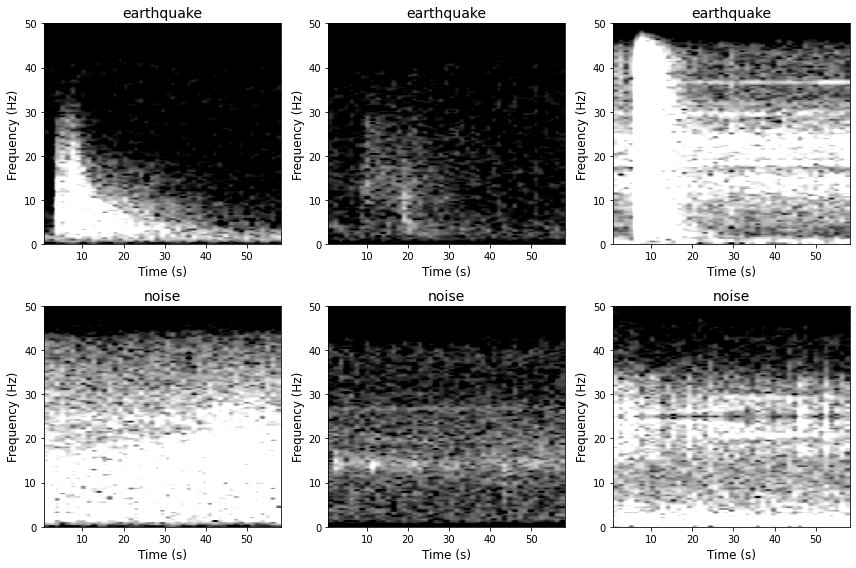

In [50]:
# plot to show some different earthquake and noise spectrograms

dtfl = h5py.File(eq1_sig_path, 'r')
dataset1 = dtfl.get('data/'+str(eq1_list[8021])) 
# waveforms, 3 channels: first row: E channel, second row: N channel, third row: Z channel 
data1 = np.array(dataset1)

dtf2 = h5py.File(eq2_sig_path, 'r')
dataset2 = dtf2.get('data/'+str(eq2_list[8020])) 
# waveforms, 3 channels: first row: E channel, second row: N channel, third row: Z channel 
data2 = np.array(dataset2)

dtf3 = h5py.File(eq3_sig_path, 'r')
dataset3 = dtf3.get('data/'+str(eq3_list[155555])) 
# waveforms, 3 channels: first row: E channel, second row: N channel, third row: Z channel 
data3 = np.array(dataset3)

dtf4 = h5py.File(noise_sig_path, 'r')
dataset4 = dtf4.get('data/'+str(noise_list[6524])) 
# waveforms, 3 channels: first row: E channel, second row: N channel, third row: Z channel 
data4 = np.array(dataset4)

dtf5 = h5py.File(noise_sig_path, 'r')
dataset5 = dtf5.get('data/'+str(noise_list[8111])) 
# waveforms, 3 channels: first row: E channel, second row: N channel, third row: Z channel 
data5 = np.array(dataset5)

dtf6 = h5py.File(noise_sig_path, 'r')
dataset6 = dtf6.get('data/'+str(noise_list[9333])) 
# waveforms, 3 channels: first row: E channel, second row: N channel, third row: Z channel 
data6 = np.array(dataset6)

fig, axs = plt.subplots(2,3,figsize=(12,8))
datasets = [dataset1,dataset2,dataset3,dataset4,dataset5,dataset6]
datas = [data1,data2,data3,data4,data5,data6]
titles = ['earthquake','earthquake','earthquake','noise','noise','noise']
for i, ax in enumerate(axs.flatten()):
    im = ax.specgram(datas[i][:,2],Fs=100,NFFT=256,cmap='gray',vmin=-10,vmax=25)
    ax.set_ylabel('Frequency (Hz)',fontsize=12)
    ax.set_xlabel('Time (s)',fontsize=12)
    ax.set_title(titles[i],fontsize=14)

plt.tight_layout()
plt.savefig('earthquakes_vs_noise_cnn_images.png')
plt.show()

# print('The p-wave for this waveform was picked by: ' + dataset.attrs['p_status'])
# print('The s-wave for this waveform was picked by: ' + dataset.attrs['s_status'])


The number of all traces in the directory including noise is 630623
Working on trace # 1
Working on trace # 2
Working on trace # 3
Working on trace # 4
Working on trace # 5
Working on trace # 6
Working on trace # 7
Working on trace # 8
Working on trace # 9
Working on trace # 10
Working on trace # 11
Working on trace # 12
Working on trace # 13
Working on trace # 14
Working on trace # 15
Working on trace # 16
Working on trace # 17
Working on trace # 18
Working on trace # 19
Working on trace # 20
Working on trace # 21
Working on trace # 22
Working on trace # 23
Working on trace # 24
Working on trace # 25
Working on trace # 26
Working on trace # 27
Working on trace # 28
Working on trace # 29
Working on trace # 30
Working on trace # 31
Working on trace # 32
Working on trace # 33
Working on trace # 34
Working on trace # 35
Working on trace # 36
Working on trace # 37
Working on trace # 38
Working on trace # 39
Working on trace # 40
Working on trace # 41
Working on trace # 42
Working on trace 

Working on trace # 408
Working on trace # 409
Working on trace # 410
Working on trace # 411
Working on trace # 412
Working on trace # 413
Working on trace # 414
Working on trace # 415
Working on trace # 416
Working on trace # 417
Working on trace # 418
Working on trace # 419
Working on trace # 420
Working on trace # 421
Working on trace # 422
Working on trace # 423
Working on trace # 424
Working on trace # 425
Working on trace # 426
Working on trace # 427
Working on trace # 428
Working on trace # 429
Working on trace # 430
Working on trace # 431
Working on trace # 432
Working on trace # 433
Working on trace # 434
Working on trace # 435
Working on trace # 436
Working on trace # 437
Working on trace # 438
Working on trace # 439
Working on trace # 440
Working on trace # 441
Working on trace # 442
Working on trace # 443
Working on trace # 444
Working on trace # 445
Working on trace # 446
Working on trace # 447
Working on trace # 448
Working on trace # 449
Working on trace # 450
Working on 

Working on trace # 839
Working on trace # 840
Working on trace # 841
Working on trace # 842
Working on trace # 843
Working on trace # 844
Working on trace # 845
Working on trace # 846
Working on trace # 847
Working on trace # 848
Working on trace # 849
Working on trace # 850
Working on trace # 851
Working on trace # 852
Working on trace # 853
Working on trace # 854
Working on trace # 855
Working on trace # 856
Working on trace # 857
Working on trace # 858
Working on trace # 859
Working on trace # 860
Working on trace # 861
Working on trace # 862
Working on trace # 863
Working on trace # 864
Working on trace # 865
Working on trace # 866
Working on trace # 867
Working on trace # 868
Working on trace # 869
Working on trace # 870
Working on trace # 871
Working on trace # 872
Working on trace # 873
Working on trace # 874
Working on trace # 875
Working on trace # 876
Working on trace # 877
Working on trace # 878
Working on trace # 879
Working on trace # 880
Working on trace # 881
Working on 

Working on trace # 1283
Working on trace # 1284
Working on trace # 1285
Working on trace # 1286
Working on trace # 1287
Working on trace # 1288
Working on trace # 1289
Working on trace # 1290
Working on trace # 1291
Working on trace # 1292
Working on trace # 1293
Working on trace # 1294
Working on trace # 1295
Working on trace # 1296
Working on trace # 1297
Working on trace # 1298
Working on trace # 1299
Working on trace # 1300
Working on trace # 1301
Working on trace # 1302
Working on trace # 1303
Working on trace # 1304
Working on trace # 1305
Working on trace # 1306
Working on trace # 1307
Working on trace # 1308
Working on trace # 1309
Working on trace # 1310
Working on trace # 1311
Working on trace # 1312
Working on trace # 1313
Working on trace # 1314
Working on trace # 1315
Working on trace # 1316
Working on trace # 1317
Working on trace # 1318
Working on trace # 1319
Working on trace # 1320
Working on trace # 1321
Working on trace # 1322
Working on trace # 1323
Working on trace

Working on trace # 1743
Working on trace # 1744
Working on trace # 1745
Working on trace # 1746
Working on trace # 1747
Working on trace # 1748
Working on trace # 1749
Working on trace # 1750
Working on trace # 1751
Working on trace # 1752
Working on trace # 1753
Working on trace # 1754
Working on trace # 1755
Working on trace # 1756
Working on trace # 1757
Working on trace # 1758
Working on trace # 1759
Working on trace # 1760
Working on trace # 1761
Working on trace # 1762
Working on trace # 1763
Working on trace # 1764
Working on trace # 1765
Working on trace # 1766
Working on trace # 1767
Working on trace # 1768
Working on trace # 1769
Working on trace # 1770
Working on trace # 1771
Working on trace # 1772
Working on trace # 1773
Working on trace # 1774
Working on trace # 1775
Working on trace # 1776
Working on trace # 1777
Working on trace # 1778
Working on trace # 1779
Working on trace # 1780
Working on trace # 1781
Working on trace # 1782
Working on trace # 1783
Working on trace

Working on trace # 2196
Working on trace # 2197
Working on trace # 2198
Working on trace # 2199
Working on trace # 2200
Working on trace # 2201
Working on trace # 2202
Working on trace # 2203
Working on trace # 2204
Working on trace # 2205
Working on trace # 2206
Working on trace # 2207
Working on trace # 2208
Working on trace # 2209
Working on trace # 2210
Working on trace # 2211
Working on trace # 2212
Working on trace # 2213
Working on trace # 2214
Working on trace # 2215
Working on trace # 2216
Working on trace # 2217
Working on trace # 2218
Working on trace # 2219
Working on trace # 2220
Working on trace # 2221
Working on trace # 2222
Working on trace # 2223
Working on trace # 2224
Working on trace # 2225
Working on trace # 2226
Working on trace # 2227
Working on trace # 2228
Working on trace # 2229
Working on trace # 2230
Working on trace # 2231
Working on trace # 2232
Working on trace # 2233
Working on trace # 2234
Working on trace # 2235
Working on trace # 2236
Working on trace

Working on trace # 2648
Working on trace # 2649
Working on trace # 2650
Working on trace # 2651
Working on trace # 2652
Working on trace # 2653
Working on trace # 2654
Working on trace # 2655
Working on trace # 2656
Working on trace # 2657
Working on trace # 2658
Working on trace # 2659
Working on trace # 2660
Working on trace # 2661
Working on trace # 2662
Working on trace # 2663
Working on trace # 2664
Working on trace # 2665
Working on trace # 2666
Working on trace # 2667
Working on trace # 2668
Working on trace # 2669
Working on trace # 2670
Working on trace # 2671
Working on trace # 2672
Working on trace # 2673
Working on trace # 2674
Working on trace # 2675
Working on trace # 2676
Working on trace # 2677
Working on trace # 2678
Working on trace # 2679
Working on trace # 2680
Working on trace # 2681
Working on trace # 2682
Working on trace # 2683
Working on trace # 2684
Working on trace # 2685
Working on trace # 2686
Working on trace # 2687
Working on trace # 2688
Working on trace

Working on trace # 3080
Working on trace # 3081
Working on trace # 3082
Working on trace # 3083
Working on trace # 3084
Working on trace # 3085
Working on trace # 3086
Working on trace # 3087
Working on trace # 3088
Working on trace # 3089
Working on trace # 3090
Working on trace # 3091
Working on trace # 3092
Working on trace # 3093
Working on trace # 3094
Working on trace # 3095
Working on trace # 3096
Working on trace # 3097
Working on trace # 3098
Working on trace # 3099
Working on trace # 3100
Working on trace # 3101
Working on trace # 3102
Working on trace # 3103
Working on trace # 3104
Working on trace # 3105
Working on trace # 3106
Working on trace # 3107
Working on trace # 3108
Working on trace # 3109
Working on trace # 3110
Working on trace # 3111
Working on trace # 3112
Working on trace # 3113
Working on trace # 3114
Working on trace # 3115
Working on trace # 3116
Working on trace # 3117
Working on trace # 3118
Working on trace # 3119
Working on trace # 3120
Working on trace

Working on trace # 3569
Working on trace # 3570
Working on trace # 3571
Working on trace # 3572
Working on trace # 3573
Working on trace # 3574
Working on trace # 3575
Working on trace # 3576
Working on trace # 3577
Working on trace # 3578
Working on trace # 3579
Working on trace # 3580
Working on trace # 3581
Working on trace # 3582
Working on trace # 3583
Working on trace # 3584
Working on trace # 3585
Working on trace # 3586
Working on trace # 3587
Working on trace # 3588
Working on trace # 3589
Working on trace # 3590
Working on trace # 3591
Working on trace # 3592
Working on trace # 3593
Working on trace # 3594
Working on trace # 3595
Working on trace # 3596
Working on trace # 3597
Working on trace # 3598
Working on trace # 3599
Working on trace # 3600
Working on trace # 3601
Working on trace # 3602
Working on trace # 3603
Working on trace # 3604
Working on trace # 3605
Working on trace # 3606
Working on trace # 3607
Working on trace # 3608
Working on trace # 3609
Working on trace

Working on trace # 4056
Working on trace # 4057
Working on trace # 4058
Working on trace # 4059
Working on trace # 4060
Working on trace # 4061
Working on trace # 4062
Working on trace # 4063
Working on trace # 4064
Working on trace # 4065
Working on trace # 4066
Working on trace # 4067
Working on trace # 4068
Working on trace # 4069
Working on trace # 4070
Working on trace # 4071
Working on trace # 4072
Working on trace # 4073
Working on trace # 4074
Working on trace # 4075
Working on trace # 4076
Working on trace # 4077
Working on trace # 4078
Working on trace # 4079
Working on trace # 4080
Working on trace # 4081
Working on trace # 4082
Working on trace # 4083
Working on trace # 4084
Working on trace # 4085
Working on trace # 4086
Working on trace # 4087
Working on trace # 4088
Working on trace # 4089
Working on trace # 4090
Working on trace # 4091
Working on trace # 4092
Working on trace # 4093
Working on trace # 4094
Working on trace # 4095
Working on trace # 4096
Working on trace

Working on trace # 4521
Working on trace # 4522
Working on trace # 4523
Working on trace # 4524
Working on trace # 4525
Working on trace # 4526
Working on trace # 4527
Working on trace # 4528
Working on trace # 4529
Working on trace # 4530
Working on trace # 4531
Working on trace # 4532
Working on trace # 4533
Working on trace # 4534
Working on trace # 4535
Working on trace # 4536
Working on trace # 4537
Working on trace # 4538
Working on trace # 4539
Working on trace # 4540
Working on trace # 4541
Working on trace # 4542
Working on trace # 4543
Working on trace # 4544
Working on trace # 4545
Working on trace # 4546
Working on trace # 4547
Working on trace # 4548
Working on trace # 4549
Working on trace # 4550
Working on trace # 4551
Working on trace # 4552
Working on trace # 4553
Working on trace # 4554
Working on trace # 4555
Working on trace # 4556
Working on trace # 4557
Working on trace # 4558
Working on trace # 4559
Working on trace # 4560
Working on trace # 4561
Working on trace

Working on trace # 4998
Working on trace # 4999
Working on trace # 5000
Working on trace # 5001
Working on trace # 5002
Working on trace # 5003
Working on trace # 5004
Working on trace # 5005
Working on trace # 5006
Working on trace # 5007
Working on trace # 5008
Working on trace # 5009
Working on trace # 5010
Working on trace # 5011
Working on trace # 5012
Working on trace # 5013
Working on trace # 5014
Working on trace # 5015
Working on trace # 5016
Working on trace # 5017
Working on trace # 5018
Working on trace # 5019
Working on trace # 5020
Working on trace # 5021
Working on trace # 5022
Working on trace # 5023
Working on trace # 5024
Working on trace # 5025
Working on trace # 5026
Working on trace # 5027
Working on trace # 5028
Working on trace # 5029
Working on trace # 5030
Working on trace # 5031
Working on trace # 5032
Working on trace # 5033
Working on trace # 5034
Working on trace # 5035
Working on trace # 5036
Working on trace # 5037
Working on trace # 5038
Working on trace

Working on trace # 5497
Working on trace # 5498
Working on trace # 5499
Working on trace # 5500
Working on trace # 5501
Working on trace # 5502
Working on trace # 5503
Working on trace # 5504
Working on trace # 5505
Working on trace # 5506
Working on trace # 5507
Working on trace # 5508
Working on trace # 5509
Working on trace # 5510
Working on trace # 5511
Working on trace # 5512
Working on trace # 5513
Working on trace # 5514
Working on trace # 5515
Working on trace # 5516
Working on trace # 5517
Working on trace # 5518
Working on trace # 5519
Working on trace # 5520
Working on trace # 5521
Working on trace # 5522
Working on trace # 5523
Working on trace # 5524
Working on trace # 5525
Working on trace # 5526
Working on trace # 5527
Working on trace # 5528
Working on trace # 5529
Working on trace # 5530
Working on trace # 5531
Working on trace # 5532
Working on trace # 5533
Working on trace # 5534
Working on trace # 5535
Working on trace # 5536
Working on trace # 5537
Working on trace

Working on trace # 5841
Working on trace # 5842
Working on trace # 5843
Working on trace # 5844
Working on trace # 5845
Working on trace # 5846
Working on trace # 5847
Working on trace # 5848
Working on trace # 5849
Working on trace # 5850
Working on trace # 5851
Working on trace # 5852
Working on trace # 5853
Working on trace # 5854
Working on trace # 5855
Working on trace # 5856
Working on trace # 5857
Working on trace # 5858
Working on trace # 5859
Working on trace # 5860
Working on trace # 5861
Working on trace # 5862
Working on trace # 5863
Working on trace # 5864
Working on trace # 5865
Working on trace # 5866
Working on trace # 5867
Working on trace # 5868
Working on trace # 5869
Working on trace # 5870
Working on trace # 5871
Working on trace # 5872
Working on trace # 5873
Working on trace # 5874
Working on trace # 5875
Working on trace # 5876
Working on trace # 5877
Working on trace # 5878
Working on trace # 5879
Working on trace # 5880
Working on trace # 5881
Working on trace

Working on trace # 6356
Working on trace # 6357
Working on trace # 6358
Working on trace # 6359
Working on trace # 6360
Working on trace # 6361
Working on trace # 6362
Working on trace # 6363
Working on trace # 6364
Working on trace # 6365
Working on trace # 6366
Working on trace # 6367
Working on trace # 6368
Working on trace # 6369
Working on trace # 6370
Working on trace # 6371
Working on trace # 6372
Working on trace # 6373
Working on trace # 6374
Working on trace # 6375
Working on trace # 6376
Working on trace # 6377
Working on trace # 6378
Working on trace # 6379
Working on trace # 6380
Working on trace # 6381
Working on trace # 6382
Working on trace # 6383
Working on trace # 6384
Working on trace # 6385
Working on trace # 6386
Working on trace # 6387
Working on trace # 6388
Working on trace # 6389
Working on trace # 6390
Working on trace # 6391
Working on trace # 6392
Working on trace # 6393
Working on trace # 6394
Working on trace # 6395
Working on trace # 6396
Working on trace

Working on trace # 6706
Working on trace # 6707
Working on trace # 6708
Working on trace # 6709
Working on trace # 6710
Working on trace # 6711
Working on trace # 6712
Working on trace # 6713
Working on trace # 6714
Working on trace # 6715
Working on trace # 6716
Working on trace # 6717
Working on trace # 6718
Working on trace # 6719
Working on trace # 6720
Working on trace # 6721
Working on trace # 6722
Working on trace # 6723
Working on trace # 6724
Working on trace # 6725
Working on trace # 6726
Working on trace # 6727
Working on trace # 6728
Working on trace # 6729
Working on trace # 6730
Working on trace # 6731
Working on trace # 6732
Working on trace # 6733
Working on trace # 6734
Working on trace # 6735
Working on trace # 6736
Working on trace # 6737
Working on trace # 6738
Working on trace # 6739
Working on trace # 6740
Working on trace # 6741
Working on trace # 6742
Working on trace # 6743
Working on trace # 6744
Working on trace # 6745
Working on trace # 6746
Working on trace

Working on trace # 7067
Working on trace # 7068
Working on trace # 7069
Working on trace # 7070
Working on trace # 7071
Working on trace # 7072
Working on trace # 7073
Working on trace # 7074
Working on trace # 7075
Working on trace # 7076
Working on trace # 7077
Working on trace # 7078
Working on trace # 7079
Working on trace # 7080
Working on trace # 7081
Working on trace # 7082
Working on trace # 7083
Working on trace # 7084
Working on trace # 7085
Working on trace # 7086
Working on trace # 7087
Working on trace # 7088
Working on trace # 7089
Working on trace # 7090
Working on trace # 7091
Working on trace # 7092
Working on trace # 7093
Working on trace # 7094
Working on trace # 7095
Working on trace # 7096
Working on trace # 7097
Working on trace # 7098
Working on trace # 7099
Working on trace # 7100
Working on trace # 7101
Working on trace # 7102
Working on trace # 7103
Working on trace # 7104
Working on trace # 7105
Working on trace # 7106
Working on trace # 7107
Working on trace

Working on trace # 7428
Working on trace # 7429
Working on trace # 7430
Working on trace # 7431
Working on trace # 7432
Working on trace # 7433
Working on trace # 7434
Working on trace # 7435
Working on trace # 7436
Working on trace # 7437
Working on trace # 7438
Working on trace # 7439
Working on trace # 7440
Working on trace # 7441
Working on trace # 7442
Working on trace # 7443
Working on trace # 7444
Working on trace # 7445
Working on trace # 7446
Working on trace # 7447
Working on trace # 7448
Working on trace # 7449
Working on trace # 7450
Working on trace # 7451
Working on trace # 7452
Working on trace # 7453
Working on trace # 7454
Working on trace # 7455
Working on trace # 7456
Working on trace # 7457
Working on trace # 7458
Working on trace # 7459
Working on trace # 7460
Working on trace # 7461
Working on trace # 7462
Working on trace # 7463
Working on trace # 7464
Working on trace # 7465
Working on trace # 7466
Working on trace # 7467
Working on trace # 7468
Working on trace

Working on trace # 7915
Working on trace # 7916
Working on trace # 7917
Working on trace # 7918
Working on trace # 7919
Working on trace # 7920
Working on trace # 7921
Working on trace # 7922
Working on trace # 7923
Working on trace # 7924
Working on trace # 7925
Working on trace # 7926
Working on trace # 7927
Working on trace # 7928
Working on trace # 7929
Working on trace # 7930
Working on trace # 7931
Working on trace # 7932
Working on trace # 7933
Working on trace # 7934
Working on trace # 7935
Working on trace # 7936
Working on trace # 7937
Working on trace # 7938
Working on trace # 7939
Working on trace # 7940
Working on trace # 7941
Working on trace # 7942
Working on trace # 7943
Working on trace # 7944
Working on trace # 7945
Working on trace # 7946
Working on trace # 7947
Working on trace # 7948
Working on trace # 7949
Working on trace # 7950
Working on trace # 7951
Working on trace # 7952
Working on trace # 7953
Working on trace # 7954
Working on trace # 7955
Working on trace

Working on trace # 8416
Working on trace # 8417
Working on trace # 8418
Working on trace # 8419
Working on trace # 8420
Working on trace # 8421
Working on trace # 8422
Working on trace # 8423
Working on trace # 8424
Working on trace # 8425
Working on trace # 8426
Working on trace # 8427
Working on trace # 8428
Working on trace # 8429
Working on trace # 8430
Working on trace # 8431
Working on trace # 8432
Working on trace # 8433
Working on trace # 8434
Working on trace # 8435
Working on trace # 8436
Working on trace # 8437
Working on trace # 8438
Working on trace # 8439
Working on trace # 8440
Working on trace # 8441
Working on trace # 8442
Working on trace # 8443
Working on trace # 8444
Working on trace # 8445
Working on trace # 8446
Working on trace # 8447
Working on trace # 8448
Working on trace # 8449
Working on trace # 8450
Working on trace # 8451
Working on trace # 8452
Working on trace # 8453
Working on trace # 8454
Working on trace # 8455
Working on trace # 8456
Working on trace

Working on trace # 8918
Working on trace # 8919
Working on trace # 8920
Working on trace # 8921
Working on trace # 8922
Working on trace # 8923
Working on trace # 8924
Working on trace # 8925
Working on trace # 8926
Working on trace # 8927
Working on trace # 8928
Working on trace # 8929
Working on trace # 8930
Working on trace # 8931
Working on trace # 8932
Working on trace # 8933
Working on trace # 8934
Working on trace # 8935
Working on trace # 8936
Working on trace # 8937
Working on trace # 8938
Working on trace # 8939
Working on trace # 8940
Working on trace # 8941
Working on trace # 8942
Working on trace # 8943
Working on trace # 8944
Working on trace # 8945
Working on trace # 8946
Working on trace # 8947
Working on trace # 8948
Working on trace # 8949
Working on trace # 8950
Working on trace # 8951
Working on trace # 8952
Working on trace # 8953
Working on trace # 8954
Working on trace # 8955
Working on trace # 8956
Working on trace # 8957
Working on trace # 8958
Working on trace

Working on trace # 9428
Working on trace # 9429
Working on trace # 9430
Working on trace # 9431
Working on trace # 9432
Working on trace # 9433
Working on trace # 9434
Working on trace # 9435
Working on trace # 9436
Working on trace # 9437
Working on trace # 9438
Working on trace # 9439
Working on trace # 9440
Working on trace # 9441
Working on trace # 9442
Working on trace # 9443
Working on trace # 9444
Working on trace # 9445
Working on trace # 9446
Working on trace # 9447
Working on trace # 9448
Working on trace # 9449
Working on trace # 9450
Working on trace # 9451
Working on trace # 9452
Working on trace # 9453
Working on trace # 9454
Working on trace # 9455
Working on trace # 9456
Working on trace # 9457
Working on trace # 9458
Working on trace # 9459
Working on trace # 9460
Working on trace # 9461
Working on trace # 9462
Working on trace # 9463
Working on trace # 9464
Working on trace # 9465
Working on trace # 9466
Working on trace # 9467
Working on trace # 9468
Working on trace

Working on trace # 9779
Working on trace # 9780
Working on trace # 9781
Working on trace # 9782
Working on trace # 9783
Working on trace # 9784
Working on trace # 9785
Working on trace # 9786
Working on trace # 9787
Working on trace # 9788
Working on trace # 9789
Working on trace # 9790
Working on trace # 9791
Working on trace # 9792
Working on trace # 9793
Working on trace # 9794
Working on trace # 9795
Working on trace # 9796
Working on trace # 9797
Working on trace # 9798
Working on trace # 9799
Working on trace # 9800
Working on trace # 9801
Working on trace # 9802
Working on trace # 9803
Working on trace # 9804
Working on trace # 9805
Working on trace # 9806
Working on trace # 9807
Working on trace # 9808
Working on trace # 9809
Working on trace # 9810
Working on trace # 9811
Working on trace # 9812
Working on trace # 9813
Working on trace # 9814
Working on trace # 9815
Working on trace # 9816
Working on trace # 9817
Working on trace # 9818
Working on trace # 9819
Working on trace

Working on trace # 10122
Working on trace # 10123
Working on trace # 10124
Working on trace # 10125
Working on trace # 10126
Working on trace # 10127
Working on trace # 10128
Working on trace # 10129
Working on trace # 10130
Working on trace # 10131
Working on trace # 10132
Working on trace # 10133
Working on trace # 10134
Working on trace # 10135
Working on trace # 10136
Working on trace # 10137
Working on trace # 10138
Working on trace # 10139
Working on trace # 10140
Working on trace # 10141
Working on trace # 10142
Working on trace # 10143
Working on trace # 10144
Working on trace # 10145
Working on trace # 10146
Working on trace # 10147
Working on trace # 10148
Working on trace # 10149
Working on trace # 10150
Working on trace # 10151
Working on trace # 10152
Working on trace # 10153
Working on trace # 10154
Working on trace # 10155
Working on trace # 10156
Working on trace # 10157
Working on trace # 10158
Working on trace # 10159
Working on trace # 10160
Working on trace # 10161


Working on trace # 10470
Working on trace # 10471
Working on trace # 10472
Working on trace # 10473
Working on trace # 10474
Working on trace # 10475
Working on trace # 10476
Working on trace # 10477
Working on trace # 10478
Working on trace # 10479
Working on trace # 10480
Working on trace # 10481
Working on trace # 10482
Working on trace # 10483
Working on trace # 10484
Working on trace # 10485
Working on trace # 10486
Working on trace # 10487
Working on trace # 10488
Working on trace # 10489
Working on trace # 10490
Working on trace # 10491
Working on trace # 10492
Working on trace # 10493
Working on trace # 10494
Working on trace # 10495
Working on trace # 10496
Working on trace # 10497
Working on trace # 10498
Working on trace # 10499
Working on trace # 10500
Working on trace # 10501
Working on trace # 10502
Working on trace # 10503
Working on trace # 10504
Working on trace # 10505
Working on trace # 10506
Working on trace # 10507
Working on trace # 10508
Working on trace # 10509


Working on trace # 10833
Working on trace # 10834
Working on trace # 10835
Working on trace # 10836
Working on trace # 10837
Working on trace # 10838
Working on trace # 10839
Working on trace # 10840
Working on trace # 10841
Working on trace # 10842
Working on trace # 10843
Working on trace # 10844
Working on trace # 10845
Working on trace # 10846
Working on trace # 10847
Working on trace # 10848
Working on trace # 10849
Working on trace # 10850
Working on trace # 10851
Working on trace # 10852
Working on trace # 10853
Working on trace # 10854
Working on trace # 10855
Working on trace # 10856
Working on trace # 10857
Working on trace # 10858
Working on trace # 10859
Working on trace # 10860
Working on trace # 10861
Working on trace # 10862
Working on trace # 10863
Working on trace # 10864
Working on trace # 10865
Working on trace # 10866
Working on trace # 10867
Working on trace # 10868
Working on trace # 10869
Working on trace # 10870
Working on trace # 10871
Working on trace # 10872


Working on trace # 11181
Working on trace # 11182
Working on trace # 11183
Working on trace # 11184
Working on trace # 11185
Working on trace # 11186
Working on trace # 11187
Working on trace # 11188
Working on trace # 11189
Working on trace # 11190
Working on trace # 11191
Working on trace # 11192
Working on trace # 11193
Working on trace # 11194
Working on trace # 11195
Working on trace # 11196
Working on trace # 11197
Working on trace # 11198
Working on trace # 11199
Working on trace # 11200
Working on trace # 11201
Working on trace # 11202
Working on trace # 11203
Working on trace # 11204
Working on trace # 11205
Working on trace # 11206
Working on trace # 11207
Working on trace # 11208
Working on trace # 11209
Working on trace # 11210
Working on trace # 11211
Working on trace # 11212
Working on trace # 11213
Working on trace # 11214
Working on trace # 11215
Working on trace # 11216
Working on trace # 11217
Working on trace # 11218
Working on trace # 11219
Working on trace # 11220


Working on trace # 11538
Working on trace # 11539
Working on trace # 11540
Working on trace # 11541
Working on trace # 11542
Working on trace # 11543
Working on trace # 11544
Working on trace # 11545
Working on trace # 11546
Working on trace # 11547
Working on trace # 11548
Working on trace # 11549
Working on trace # 11550
Working on trace # 11551
Working on trace # 11552
Working on trace # 11553
Working on trace # 11554
Working on trace # 11555
Working on trace # 11556
Working on trace # 11557
Working on trace # 11558
Working on trace # 11559
Working on trace # 11560
Working on trace # 11561
Working on trace # 11562
Working on trace # 11563
Working on trace # 11564
Working on trace # 11565
Working on trace # 11566
Working on trace # 11567
Working on trace # 11568
Working on trace # 11569
Working on trace # 11570
Working on trace # 11571
Working on trace # 11572
Working on trace # 11573
Working on trace # 11574
Working on trace # 11575
Working on trace # 11576
Working on trace # 11577


Working on trace # 11885
Working on trace # 11886
Working on trace # 11887
Working on trace # 11888
Working on trace # 11889
Working on trace # 11890
Working on trace # 11891
Working on trace # 11892
Working on trace # 11893
Working on trace # 11894
Working on trace # 11895
Working on trace # 11896
Working on trace # 11897
Working on trace # 11898
Working on trace # 11899
Working on trace # 11900
Working on trace # 11901
Working on trace # 11902
Working on trace # 11903
Working on trace # 11904
Working on trace # 11905
Working on trace # 11906
Working on trace # 11907
Working on trace # 11908
Working on trace # 11909
Working on trace # 11910
Working on trace # 11911
Working on trace # 11912
Working on trace # 11913
Working on trace # 11914
Working on trace # 11915
Working on trace # 11916
Working on trace # 11917
Working on trace # 11918
Working on trace # 11919
Working on trace # 11920
Working on trace # 11921
Working on trace # 11922
Working on trace # 11923
Working on trace # 11924


Working on trace # 12236
Working on trace # 12237
Working on trace # 12238
Working on trace # 12239
Working on trace # 12240
Working on trace # 12241
Working on trace # 12242
Working on trace # 12243
Working on trace # 12244
Working on trace # 12245
Working on trace # 12246
Working on trace # 12247
Working on trace # 12248
Working on trace # 12249
Working on trace # 12250
Working on trace # 12251
Working on trace # 12252
Working on trace # 12253
Working on trace # 12254
Working on trace # 12255
Working on trace # 12256
Working on trace # 12257
Working on trace # 12258
Working on trace # 12259
Working on trace # 12260
Working on trace # 12261
Working on trace # 12262
Working on trace # 12263
Working on trace # 12264
Working on trace # 12265
Working on trace # 12266
Working on trace # 12267
Working on trace # 12268
Working on trace # 12269
Working on trace # 12270
Working on trace # 12271
Working on trace # 12272
Working on trace # 12273
Working on trace # 12274
Working on trace # 12275


Working on trace # 12604
Working on trace # 12605
Working on trace # 12606
Working on trace # 12607
Working on trace # 12608
Working on trace # 12609
Working on trace # 12610
Working on trace # 12611
Working on trace # 12612
Working on trace # 12613
Working on trace # 12614
Working on trace # 12615
Working on trace # 12616
Working on trace # 12617
Working on trace # 12618
Working on trace # 12619
Working on trace # 12620
Working on trace # 12621
Working on trace # 12622
Working on trace # 12623
Working on trace # 12624
Working on trace # 12625
Working on trace # 12626
Working on trace # 12627
Working on trace # 12628
Working on trace # 12629
Working on trace # 12630
Working on trace # 12631
Working on trace # 12632
Working on trace # 12633
Working on trace # 12634
Working on trace # 12635
Working on trace # 12636
Working on trace # 12637
Working on trace # 12638
Working on trace # 12639
Working on trace # 12640
Working on trace # 12641
Working on trace # 12642
Working on trace # 12643


Working on trace # 12964
Working on trace # 12965
Working on trace # 12966
Working on trace # 12967
Working on trace # 12968
Working on trace # 12969
Working on trace # 12970
Working on trace # 12971
Working on trace # 12972
Working on trace # 12973
Working on trace # 12974
Working on trace # 12975
Working on trace # 12976
Working on trace # 12977
Working on trace # 12978
Working on trace # 12979
Working on trace # 12980
Working on trace # 12981
Working on trace # 12982
Working on trace # 12983
Working on trace # 12984
Working on trace # 12985
Working on trace # 12986
Working on trace # 12987
Working on trace # 12988
Working on trace # 12989
Working on trace # 12990
Working on trace # 12991
Working on trace # 12992
Working on trace # 12993
Working on trace # 12994
Working on trace # 12995
Working on trace # 12996
Working on trace # 12997
Working on trace # 12998
Working on trace # 12999
Working on trace # 13000
Working on trace # 13001
Working on trace # 13002
Working on trace # 13003


Working on trace # 13327
Working on trace # 13328
Working on trace # 13329
Working on trace # 13330
Working on trace # 13331
Working on trace # 13332
Working on trace # 13333
Working on trace # 13334
Working on trace # 13335
Working on trace # 13336
Working on trace # 13337
Working on trace # 13338
Working on trace # 13339
Working on trace # 13340
Working on trace # 13341
Working on trace # 13342
Working on trace # 13343
Working on trace # 13344
Working on trace # 13345
Working on trace # 13346
Working on trace # 13347
Working on trace # 13348
Working on trace # 13349
Working on trace # 13350
Working on trace # 13351
Working on trace # 13352
Working on trace # 13353
Working on trace # 13354
Working on trace # 13355
Working on trace # 13356
Working on trace # 13357
Working on trace # 13358
Working on trace # 13359
Working on trace # 13360
Working on trace # 13361
Working on trace # 13362
Working on trace # 13363
Working on trace # 13364
Working on trace # 13365
Working on trace # 13366


Working on trace # 13706
Working on trace # 13707
Working on trace # 13708
Working on trace # 13709
Working on trace # 13710
Working on trace # 13711
Working on trace # 13712
Working on trace # 13713
Working on trace # 13714
Working on trace # 13715
Working on trace # 13716
Working on trace # 13717
Working on trace # 13718
Working on trace # 13719
Working on trace # 13720
Working on trace # 13721
Working on trace # 13722
Working on trace # 13723
Working on trace # 13724
Working on trace # 13725
Working on trace # 13726
Working on trace # 13727
Working on trace # 13728
Working on trace # 13729
Working on trace # 13730
Working on trace # 13731
Working on trace # 13732
Working on trace # 13733
Working on trace # 13734
Working on trace # 13735
Working on trace # 13736
Working on trace # 13737
Working on trace # 13738
Working on trace # 13739
Working on trace # 13740
Working on trace # 13741
Working on trace # 13742
Working on trace # 13743
Working on trace # 13744
Working on trace # 13745


Working on trace # 14048
Working on trace # 14049
Working on trace # 14050
Working on trace # 14051
Working on trace # 14052
Working on trace # 14053
Working on trace # 14054
Working on trace # 14055
Working on trace # 14056
Working on trace # 14057
Working on trace # 14058
Working on trace # 14059
Working on trace # 14060
Working on trace # 14061
Working on trace # 14062
Working on trace # 14063
Working on trace # 14064
Working on trace # 14065
Working on trace # 14066
Working on trace # 14067
Working on trace # 14068
Working on trace # 14069
Working on trace # 14070
Working on trace # 14071
Working on trace # 14072
Working on trace # 14073
Working on trace # 14074
Working on trace # 14075
Working on trace # 14076
Working on trace # 14077
Working on trace # 14078
Working on trace # 14079
Working on trace # 14080
Working on trace # 14081
Working on trace # 14082
Working on trace # 14083
Working on trace # 14084
Working on trace # 14085
Working on trace # 14086
Working on trace # 14087


Working on trace # 14392
Working on trace # 14393
Working on trace # 14394
Working on trace # 14395
Working on trace # 14396
Working on trace # 14397
Working on trace # 14398
Working on trace # 14399
Working on trace # 14400
Working on trace # 14401
Working on trace # 14402
Working on trace # 14403
Working on trace # 14404
Working on trace # 14405
Working on trace # 14406
Working on trace # 14407
Working on trace # 14408
Working on trace # 14409
Working on trace # 14410
Working on trace # 14411
Working on trace # 14412
Working on trace # 14413
Working on trace # 14414
Working on trace # 14415
Working on trace # 14416
Working on trace # 14417
Working on trace # 14418
Working on trace # 14419
Working on trace # 14420
Working on trace # 14421
Working on trace # 14422
Working on trace # 14423
Working on trace # 14424
Working on trace # 14425
Working on trace # 14426
Working on trace # 14427
Working on trace # 14428
Working on trace # 14429
Working on trace # 14430
Working on trace # 14431


Working on trace # 14749
Working on trace # 14750
Working on trace # 14751
Working on trace # 14752
Working on trace # 14753
Working on trace # 14754
Working on trace # 14755
Working on trace # 14756
Working on trace # 14757
Working on trace # 14758
Working on trace # 14759
Working on trace # 14760
Working on trace # 14761
Working on trace # 14762
Working on trace # 14763
Working on trace # 14764
Working on trace # 14765
Working on trace # 14766
Working on trace # 14767
Working on trace # 14768
Working on trace # 14769
Working on trace # 14770
Working on trace # 14771
Working on trace # 14772
Working on trace # 14773
Working on trace # 14774
Working on trace # 14775
Working on trace # 14776
Working on trace # 14777
Working on trace # 14778
Working on trace # 14779
Working on trace # 14780
Working on trace # 14781
Working on trace # 14782
Working on trace # 14783
Working on trace # 14784
Working on trace # 14785
Working on trace # 14786
Working on trace # 14787
Working on trace # 14788


Working on trace # 15113
Working on trace # 15114
Working on trace # 15115
Working on trace # 15116
Working on trace # 15117
Working on trace # 15118
Working on trace # 15119
Working on trace # 15120
Working on trace # 15121
Working on trace # 15122
Working on trace # 15123
Working on trace # 15124
Working on trace # 15125
Working on trace # 15126
Working on trace # 15127
Working on trace # 15128
Working on trace # 15129
Working on trace # 15130
Working on trace # 15131
Working on trace # 15132
Working on trace # 15133
Working on trace # 15134
Working on trace # 15135
Working on trace # 15136
Working on trace # 15137
Working on trace # 15138
Working on trace # 15139
Working on trace # 15140
Working on trace # 15141
Working on trace # 15142
Working on trace # 15143
Working on trace # 15144
Working on trace # 15145
Working on trace # 15146
Working on trace # 15147
Working on trace # 15148
Working on trace # 15149
Working on trace # 15150
Working on trace # 15151
Working on trace # 15152


Working on trace # 15478
Working on trace # 15479
Working on trace # 15480
Working on trace # 15481
Working on trace # 15482
Working on trace # 15483
Working on trace # 15484
Working on trace # 15485
Working on trace # 15486
Working on trace # 15487
Working on trace # 15488
Working on trace # 15489
Working on trace # 15490
Working on trace # 15491
Working on trace # 15492
Working on trace # 15493
Working on trace # 15494
Working on trace # 15495
Working on trace # 15496
Working on trace # 15497
Working on trace # 15498
Working on trace # 15499
Working on trace # 15500
Working on trace # 15501
Working on trace # 15502
Working on trace # 15503
Working on trace # 15504
Working on trace # 15505
Working on trace # 15506
Working on trace # 15507
Working on trace # 15508
Working on trace # 15509
Working on trace # 15510
Working on trace # 15511
Working on trace # 15512
Working on trace # 15513
Working on trace # 15514
Working on trace # 15515
Working on trace # 15516
Working on trace # 15517


Working on trace # 15834
Working on trace # 15835
Working on trace # 15836
Working on trace # 15837
Working on trace # 15838
Working on trace # 15839
Working on trace # 15840
Working on trace # 15841
Working on trace # 15842
Working on trace # 15843
Working on trace # 15844
Working on trace # 15845
Working on trace # 15846
Working on trace # 15847
Working on trace # 15848
Working on trace # 15849
Working on trace # 15850
Working on trace # 15851
Working on trace # 15852
Working on trace # 15853
Working on trace # 15854
Working on trace # 15855
Working on trace # 15856
Working on trace # 15857
Working on trace # 15858
Working on trace # 15859
Working on trace # 15860
Working on trace # 15861
Working on trace # 15862
Working on trace # 15863
Working on trace # 15864
Working on trace # 15865
Working on trace # 15866
Working on trace # 15867
Working on trace # 15868
Working on trace # 15869
Working on trace # 15870
Working on trace # 15871
Working on trace # 15872
Working on trace # 15873


Working on trace # 16198
Working on trace # 16199
Working on trace # 16200
Working on trace # 16201
Working on trace # 16202
Working on trace # 16203
Working on trace # 16204
Working on trace # 16205
Working on trace # 16206
Working on trace # 16207
Working on trace # 16208
Working on trace # 16209
Working on trace # 16210
Working on trace # 16211
Working on trace # 16212
Working on trace # 16213
Working on trace # 16214
Working on trace # 16215
Working on trace # 16216
Working on trace # 16217
Working on trace # 16218
Working on trace # 16219
Working on trace # 16220
Working on trace # 16221
Working on trace # 16222
Working on trace # 16223
Working on trace # 16224
Working on trace # 16225
Working on trace # 16226
Working on trace # 16227
Working on trace # 16228
Working on trace # 16229
Working on trace # 16230
Working on trace # 16231
Working on trace # 16232
Working on trace # 16233
Working on trace # 16234
Working on trace # 16235
Working on trace # 16236
Working on trace # 16237


Working on trace # 16562
Working on trace # 16563
Working on trace # 16564
Working on trace # 16565
Working on trace # 16566
Working on trace # 16567
Working on trace # 16568
Working on trace # 16569
Working on trace # 16570
Working on trace # 16571
Working on trace # 16572
Working on trace # 16573
Working on trace # 16574
Working on trace # 16575
Working on trace # 16576
Working on trace # 16577
Working on trace # 16578
Working on trace # 16579
Working on trace # 16580
Working on trace # 16581
Working on trace # 16582
Working on trace # 16583
Working on trace # 16584
Working on trace # 16585
Working on trace # 16586
Working on trace # 16587
Working on trace # 16588
Working on trace # 16589
Working on trace # 16590
Working on trace # 16591
Working on trace # 16592
Working on trace # 16593
Working on trace # 16594
Working on trace # 16595
Working on trace # 16596
Working on trace # 16597
Working on trace # 16598
Working on trace # 16599
Working on trace # 16600
Working on trace # 16601


Working on trace # 16929
Working on trace # 16930
Working on trace # 16931
Working on trace # 16932
Working on trace # 16933
Working on trace # 16934
Working on trace # 16935
Working on trace # 16936
Working on trace # 16937
Working on trace # 16938
Working on trace # 16939
Working on trace # 16940
Working on trace # 16941
Working on trace # 16942
Working on trace # 16943
Working on trace # 16944
Working on trace # 16945
Working on trace # 16946
Working on trace # 16947
Working on trace # 16948
Working on trace # 16949
Working on trace # 16950
Working on trace # 16951
Working on trace # 16952
Working on trace # 16953
Working on trace # 16954
Working on trace # 16955
Working on trace # 16956
Working on trace # 16957
Working on trace # 16958
Working on trace # 16959
Working on trace # 16960
Working on trace # 16961
Working on trace # 16962
Working on trace # 16963
Working on trace # 16964
Working on trace # 16965
Working on trace # 16966
Working on trace # 16967
Working on trace # 16968


Working on trace # 17292
Working on trace # 17293
Working on trace # 17294
Working on trace # 17295
Working on trace # 17296
Working on trace # 17297
Working on trace # 17298
Working on trace # 17299
Working on trace # 17300
Working on trace # 17301
Working on trace # 17302
Working on trace # 17303
Working on trace # 17304
Working on trace # 17305
Working on trace # 17306
Working on trace # 17307
Working on trace # 17308
Working on trace # 17309
Working on trace # 17310
Working on trace # 17311
Working on trace # 17312
Working on trace # 17313
Working on trace # 17314
Working on trace # 17315
Working on trace # 17316
Working on trace # 17317
Working on trace # 17318
Working on trace # 17319
Working on trace # 17320
Working on trace # 17321
Working on trace # 17322
Working on trace # 17323
Working on trace # 17324
Working on trace # 17325
Working on trace # 17326
Working on trace # 17327
Working on trace # 17328
Working on trace # 17329
Working on trace # 17330
Working on trace # 17331


Working on trace # 17647
Working on trace # 17648
Working on trace # 17649
Working on trace # 17650
Working on trace # 17651
Working on trace # 17652
Working on trace # 17653
Working on trace # 17654
Working on trace # 17655
Working on trace # 17656
Working on trace # 17657
Working on trace # 17658
Working on trace # 17659
Working on trace # 17660
Working on trace # 17661
Working on trace # 17662
Working on trace # 17663
Working on trace # 17664
Working on trace # 17665
Working on trace # 17666
Working on trace # 17667
Working on trace # 17668
Working on trace # 17669
Working on trace # 17670
Working on trace # 17671
Working on trace # 17672
Working on trace # 17673
Working on trace # 17674
Working on trace # 17675
Working on trace # 17676
Working on trace # 17677
Working on trace # 17678
Working on trace # 17679
Working on trace # 17680
Working on trace # 17681
Working on trace # 17682
Working on trace # 17683
Working on trace # 17684
Working on trace # 17685
Working on trace # 17686


Working on trace # 17985
Working on trace # 17986
Working on trace # 17987
Working on trace # 17988
Working on trace # 17989
Working on trace # 17990
Working on trace # 17991
Working on trace # 17992
Working on trace # 17993
Working on trace # 17994
Working on trace # 17995
Working on trace # 17996
Working on trace # 17997
Working on trace # 17998
Working on trace # 17999
Working on trace # 18000
Working on trace # 18001
Working on trace # 18002
Working on trace # 18003
Working on trace # 18004
Working on trace # 18005
Working on trace # 18006
Working on trace # 18007
Working on trace # 18008
Working on trace # 18009
Working on trace # 18010
Working on trace # 18011
Working on trace # 18012
Working on trace # 18013
Working on trace # 18014
Working on trace # 18015
Working on trace # 18016
Working on trace # 18017
Working on trace # 18018
Working on trace # 18019
Working on trace # 18020
Working on trace # 18021
Working on trace # 18022
Working on trace # 18023
Working on trace # 18024


Working on trace # 18334
Working on trace # 18335
Working on trace # 18336
Working on trace # 18337
Working on trace # 18338
Working on trace # 18339
Working on trace # 18340
Working on trace # 18341
Working on trace # 18342
Working on trace # 18343
Working on trace # 18344
Working on trace # 18345
Working on trace # 18346
Working on trace # 18347
Working on trace # 18348
Working on trace # 18349
Working on trace # 18350
Working on trace # 18351
Working on trace # 18352
Working on trace # 18353
Working on trace # 18354
Working on trace # 18355
Working on trace # 18356
Working on trace # 18357
Working on trace # 18358
Working on trace # 18359
Working on trace # 18360
Working on trace # 18361
Working on trace # 18362
Working on trace # 18363
Working on trace # 18364
Working on trace # 18365
Working on trace # 18366
Working on trace # 18367
Working on trace # 18368
Working on trace # 18369
Working on trace # 18370
Working on trace # 18371
Working on trace # 18372
Working on trace # 18373


Working on trace # 18712
Working on trace # 18713
Working on trace # 18714
Working on trace # 18715
Working on trace # 18716
Working on trace # 18717
Working on trace # 18718
Working on trace # 18719
Working on trace # 18720
Working on trace # 18721
Working on trace # 18722
Working on trace # 18723
Working on trace # 18724
Working on trace # 18725
Working on trace # 18726
Working on trace # 18727
Working on trace # 18728
Working on trace # 18729
Working on trace # 18730
Working on trace # 18731
Working on trace # 18732
Working on trace # 18733
Working on trace # 18734
Working on trace # 18735
Working on trace # 18736
Working on trace # 18737
Working on trace # 18738
Working on trace # 18739
Working on trace # 18740
Working on trace # 18741
Working on trace # 18742
Working on trace # 18743
Working on trace # 18744
Working on trace # 18745
Working on trace # 18746
Working on trace # 18747
Working on trace # 18748
Working on trace # 18749
Working on trace # 18750
Working on trace # 18751


Working on trace # 19087
Working on trace # 19088
Working on trace # 19089
Working on trace # 19090
Working on trace # 19091
Working on trace # 19092
Working on trace # 19093
Working on trace # 19094
Working on trace # 19095
Working on trace # 19096
Working on trace # 19097
Working on trace # 19098
Working on trace # 19099
Working on trace # 19100
Working on trace # 19101
Working on trace # 19102
Working on trace # 19103
Working on trace # 19104
Working on trace # 19105
Working on trace # 19106
Working on trace # 19107
Working on trace # 19108
Working on trace # 19109
Working on trace # 19110
Working on trace # 19111
Working on trace # 19112
Working on trace # 19113
Working on trace # 19114
Working on trace # 19115
Working on trace # 19116
Working on trace # 19117
Working on trace # 19118
Working on trace # 19119
Working on trace # 19120
Working on trace # 19121
Working on trace # 19122
Working on trace # 19123
Working on trace # 19124
Working on trace # 19125
Working on trace # 19126


Working on trace # 19468
Working on trace # 19469
Working on trace # 19470
Working on trace # 19471
Working on trace # 19472
Working on trace # 19473
Working on trace # 19474
Working on trace # 19475
Working on trace # 19476
Working on trace # 19477
Working on trace # 19478
Working on trace # 19479
Working on trace # 19480
Working on trace # 19481
Working on trace # 19482
Working on trace # 19483
Working on trace # 19484
Working on trace # 19485
Working on trace # 19486
Working on trace # 19487
Working on trace # 19488
Working on trace # 19489
Working on trace # 19490
Working on trace # 19491
Working on trace # 19492
Working on trace # 19493
Working on trace # 19494
Working on trace # 19495
Working on trace # 19496
Working on trace # 19497
Working on trace # 19498
Working on trace # 19499
Working on trace # 19500
Working on trace # 19501
Working on trace # 19502
Working on trace # 19503
Working on trace # 19504
Working on trace # 19505
Working on trace # 19506
Working on trace # 19507


Working on trace # 19851
Working on trace # 19852
Working on trace # 19853
Working on trace # 19854
Working on trace # 19855
Working on trace # 19856
Working on trace # 19857
Working on trace # 19858
Working on trace # 19859
Working on trace # 19860
Working on trace # 19861
Working on trace # 19862
Working on trace # 19863
Working on trace # 19864
Working on trace # 19865
Working on trace # 19866
Working on trace # 19867
Working on trace # 19868
Working on trace # 19869
Working on trace # 19870
Working on trace # 19871
Working on trace # 19872
Working on trace # 19873
Working on trace # 19874
Working on trace # 19875
Working on trace # 19876
Working on trace # 19877
Working on trace # 19878
Working on trace # 19879
Working on trace # 19880
Working on trace # 19881
Working on trace # 19882
Working on trace # 19883
Working on trace # 19884
Working on trace # 19885
Working on trace # 19886
Working on trace # 19887
Working on trace # 19888
Working on trace # 19889
Working on trace # 19890


Working on trace # 20232
Working on trace # 20233
Working on trace # 20234
Working on trace # 20235
Working on trace # 20236
Working on trace # 20237
Working on trace # 20238
Working on trace # 20239
Working on trace # 20240
Working on trace # 20241
Working on trace # 20242
Working on trace # 20243
Working on trace # 20244
Working on trace # 20245
Working on trace # 20246
Working on trace # 20247
Working on trace # 20248
Working on trace # 20249
Working on trace # 20250
Working on trace # 20251
Working on trace # 20252
Working on trace # 20253
Working on trace # 20254
Working on trace # 20255
Working on trace # 20256
Working on trace # 20257
Working on trace # 20258
Working on trace # 20259
Working on trace # 20260
Working on trace # 20261
Working on trace # 20262
Working on trace # 20263
Working on trace # 20264
Working on trace # 20265
Working on trace # 20266
Working on trace # 20267
Working on trace # 20268
Working on trace # 20269
Working on trace # 20270
Working on trace # 20271


Working on trace # 20629
Working on trace # 20630
Working on trace # 20631
Working on trace # 20632
Working on trace # 20633
Working on trace # 20634
Working on trace # 20635
Working on trace # 20636
Working on trace # 20637
Working on trace # 20638
Working on trace # 20639
Working on trace # 20640
Working on trace # 20641
Working on trace # 20642
Working on trace # 20643
Working on trace # 20644
Working on trace # 20645
Working on trace # 20646
Working on trace # 20647
Working on trace # 20648
Working on trace # 20649
Working on trace # 20650
Working on trace # 20651
Working on trace # 20652
Working on trace # 20653
Working on trace # 20654
Working on trace # 20655
Working on trace # 20656
Working on trace # 20657
Working on trace # 20658
Working on trace # 20659
Working on trace # 20660
Working on trace # 20661
Working on trace # 20662
Working on trace # 20663
Working on trace # 20664
Working on trace # 20665
Working on trace # 20666
Working on trace # 20667
Working on trace # 20668


Working on trace # 21011
Working on trace # 21012
Working on trace # 21013
Working on trace # 21014
Working on trace # 21015
Working on trace # 21016
Working on trace # 21017
Working on trace # 21018
Working on trace # 21019
Working on trace # 21020
Working on trace # 21021
Working on trace # 21022
Working on trace # 21023
Working on trace # 21024
Working on trace # 21025
Working on trace # 21026
Working on trace # 21027
Working on trace # 21028
Working on trace # 21029
Working on trace # 21030
Working on trace # 21031
Working on trace # 21032
Working on trace # 21033
Working on trace # 21034
Working on trace # 21035
Working on trace # 21036
Working on trace # 21037
Working on trace # 21038
Working on trace # 21039
Working on trace # 21040
Working on trace # 21041
Working on trace # 21042
Working on trace # 21043
Working on trace # 21044
Working on trace # 21045
Working on trace # 21046
Working on trace # 21047
Working on trace # 21048
Working on trace # 21049
Working on trace # 21050


Working on trace # 21393
Working on trace # 21394
Working on trace # 21395
Working on trace # 21396
Working on trace # 21397
Working on trace # 21398
Working on trace # 21399
Working on trace # 21400
Working on trace # 21401
Working on trace # 21402
Working on trace # 21403
Working on trace # 21404
Working on trace # 21405
Working on trace # 21406
Working on trace # 21407
Working on trace # 21408
Working on trace # 21409
Working on trace # 21410
Working on trace # 21411
Working on trace # 21412
Working on trace # 21413
Working on trace # 21414
Working on trace # 21415
Working on trace # 21416
Working on trace # 21417
Working on trace # 21418
Working on trace # 21419
Working on trace # 21420
Working on trace # 21421
Working on trace # 21422
Working on trace # 21423
Working on trace # 21424
Working on trace # 21425
Working on trace # 21426
Working on trace # 21427
Working on trace # 21428
Working on trace # 21429
Working on trace # 21430
Working on trace # 21431
Working on trace # 21432


Working on trace # 21777
Working on trace # 21778
Working on trace # 21779
Working on trace # 21780
Working on trace # 21781
Working on trace # 21782
Working on trace # 21783
Working on trace # 21784
Working on trace # 21785
Working on trace # 21786
Working on trace # 21787
Working on trace # 21788
Working on trace # 21789
Working on trace # 21790
Working on trace # 21791
Working on trace # 21792
Working on trace # 21793
Working on trace # 21794
Working on trace # 21795
Working on trace # 21796
Working on trace # 21797
Working on trace # 21798
Working on trace # 21799
Working on trace # 21800
Working on trace # 21801
Working on trace # 21802
Working on trace # 21803
Working on trace # 21804
Working on trace # 21805
Working on trace # 21806
Working on trace # 21807
Working on trace # 21808
Working on trace # 21809
Working on trace # 21810
Working on trace # 21811
Working on trace # 21812
Working on trace # 21813
Working on trace # 21814
Working on trace # 21815
Working on trace # 21816


Working on trace # 22157
Working on trace # 22158
Working on trace # 22159
Working on trace # 22160
Working on trace # 22161
Working on trace # 22162
Working on trace # 22163
Working on trace # 22164
Working on trace # 22165
Working on trace # 22166
Working on trace # 22167
Working on trace # 22168
Working on trace # 22169
Working on trace # 22170
Working on trace # 22171
Working on trace # 22172
Working on trace # 22173
Working on trace # 22174
Working on trace # 22175
Working on trace # 22176
Working on trace # 22177
Working on trace # 22178
Working on trace # 22179
Working on trace # 22180
Working on trace # 22181
Working on trace # 22182
Working on trace # 22183
Working on trace # 22184
Working on trace # 22185
Working on trace # 22186
Working on trace # 22187
Working on trace # 22188
Working on trace # 22189
Working on trace # 22190
Working on trace # 22191
Working on trace # 22192
Working on trace # 22193
Working on trace # 22194
Working on trace # 22195
Working on trace # 22196


Working on trace # 22563
Working on trace # 22564
Working on trace # 22565
Working on trace # 22566
Working on trace # 22567
Working on trace # 22568
Working on trace # 22569
Working on trace # 22570
Working on trace # 22571
Working on trace # 22572
Working on trace # 22573
Working on trace # 22574
Working on trace # 22575
Working on trace # 22576
Working on trace # 22577
Working on trace # 22578
Working on trace # 22579
Working on trace # 22580
Working on trace # 22581
Working on trace # 22582
Working on trace # 22583
Working on trace # 22584
Working on trace # 22585
Working on trace # 22586
Working on trace # 22587
Working on trace # 22588
Working on trace # 22589
Working on trace # 22590
Working on trace # 22591
Working on trace # 22592
Working on trace # 22593
Working on trace # 22594
Working on trace # 22595
Working on trace # 22596
Working on trace # 22597
Working on trace # 22598
Working on trace # 22599
Working on trace # 22600
Working on trace # 22601
Working on trace # 22602


Working on trace # 22974
Working on trace # 22975
Working on trace # 22976
Working on trace # 22977
Working on trace # 22978
Working on trace # 22979
Working on trace # 22980
Working on trace # 22981
Working on trace # 22982
Working on trace # 22983
Working on trace # 22984
Working on trace # 22985
Working on trace # 22986
Working on trace # 22987
Working on trace # 22988
Working on trace # 22989
Working on trace # 22990
Working on trace # 22991
Working on trace # 22992
Working on trace # 22993
Working on trace # 22994
Working on trace # 22995
Working on trace # 22996
Working on trace # 22997
Working on trace # 22998
Working on trace # 22999
Working on trace # 23000
Working on trace # 23001
Working on trace # 23002
Working on trace # 23003
Working on trace # 23004
Working on trace # 23005
Working on trace # 23006
Working on trace # 23007
Working on trace # 23008
Working on trace # 23009
Working on trace # 23010
Working on trace # 23011
Working on trace # 23012
Working on trace # 23013


Working on trace # 23387
Working on trace # 23388
Working on trace # 23389
Working on trace # 23390
Working on trace # 23391
Working on trace # 23392
Working on trace # 23393
Working on trace # 23394
Working on trace # 23395
Working on trace # 23396
Working on trace # 23397
Working on trace # 23398
Working on trace # 23399
Working on trace # 23400
Working on trace # 23401
Working on trace # 23402
Working on trace # 23403
Working on trace # 23404
Working on trace # 23405
Working on trace # 23406
Working on trace # 23407
Working on trace # 23408
Working on trace # 23409
Working on trace # 23410
Working on trace # 23411
Working on trace # 23412
Working on trace # 23413
Working on trace # 23414
Working on trace # 23415
Working on trace # 23416
Working on trace # 23417
Working on trace # 23418
Working on trace # 23419
Working on trace # 23420
Working on trace # 23421
Working on trace # 23422
Working on trace # 23423
Working on trace # 23424
Working on trace # 23425
Working on trace # 23426


Working on trace # 23796
Working on trace # 23797
Working on trace # 23798
Working on trace # 23799
Working on trace # 23800
Working on trace # 23801
Working on trace # 23802
Working on trace # 23803
Working on trace # 23804
Working on trace # 23805
Working on trace # 23806
Working on trace # 23807
Working on trace # 23808
Working on trace # 23809
Working on trace # 23810
Working on trace # 23811
Working on trace # 23812
Working on trace # 23813
Working on trace # 23814
Working on trace # 23815
Working on trace # 23816
Working on trace # 23817
Working on trace # 23818
Working on trace # 23819
Working on trace # 23820
Working on trace # 23821
Working on trace # 23822
Working on trace # 23823
Working on trace # 23824
Working on trace # 23825
Working on trace # 23826
Working on trace # 23827
Working on trace # 23828
Working on trace # 23829
Working on trace # 23830
Working on trace # 23831
Working on trace # 23832
Working on trace # 23833
Working on trace # 23834
Working on trace # 23835


Working on trace # 24190
Working on trace # 24191
Working on trace # 24192
Working on trace # 24193
Working on trace # 24194
Working on trace # 24195
Working on trace # 24196
Working on trace # 24197
Working on trace # 24198
Working on trace # 24199
Working on trace # 24200
Working on trace # 24201
Working on trace # 24202
Working on trace # 24203
Working on trace # 24204
Working on trace # 24205
Working on trace # 24206
Working on trace # 24207
Working on trace # 24208
Working on trace # 24209
Working on trace # 24210
Working on trace # 24211
Working on trace # 24212
Working on trace # 24213
Working on trace # 24214
Working on trace # 24215
Working on trace # 24216
Working on trace # 24217
Working on trace # 24218
Working on trace # 24219
Working on trace # 24220
Working on trace # 24221
Working on trace # 24222
Working on trace # 24223
Working on trace # 24224
Working on trace # 24225
Working on trace # 24226
Working on trace # 24227
Working on trace # 24228
Working on trace # 24229


Working on trace # 24597
Working on trace # 24598
Working on trace # 24599
Working on trace # 24600
Working on trace # 24601
Working on trace # 24602
Working on trace # 24603
Working on trace # 24604
Working on trace # 24605
Working on trace # 24606
Working on trace # 24607
Working on trace # 24608
Working on trace # 24609
Working on trace # 24610
Working on trace # 24611
Working on trace # 24612
Working on trace # 24613
Working on trace # 24614
Working on trace # 24615
Working on trace # 24616
Working on trace # 24617
Working on trace # 24618
Working on trace # 24619
Working on trace # 24620
Working on trace # 24621
Working on trace # 24622
Working on trace # 24623
Working on trace # 24624
Working on trace # 24625
Working on trace # 24626
Working on trace # 24627
Working on trace # 24628
Working on trace # 24629
Working on trace # 24630
Working on trace # 24631
Working on trace # 24632
Working on trace # 24633
Working on trace # 24634
Working on trace # 24635
Working on trace # 24636


Working on trace # 24930
Working on trace # 24931
Working on trace # 24932
Working on trace # 24933
Working on trace # 24934
Working on trace # 24935
Working on trace # 24936
Working on trace # 24937
Working on trace # 24938
Working on trace # 24939
Working on trace # 24940
Working on trace # 24941
Working on trace # 24942
Working on trace # 24943
Working on trace # 24944
Working on trace # 24945
Working on trace # 24946
Working on trace # 24947
Working on trace # 24948
Working on trace # 24949
Working on trace # 24950
Working on trace # 24951
Working on trace # 24952
Working on trace # 24953
Working on trace # 24954
Working on trace # 24955
Working on trace # 24956
Working on trace # 24957
Working on trace # 24958
Working on trace # 24959
Working on trace # 24960
Working on trace # 24961
Working on trace # 24962
Working on trace # 24963
Working on trace # 24964
Working on trace # 24965
Working on trace # 24966
Working on trace # 24967
Working on trace # 24968
Working on trace # 24969


Working on trace # 25336
Working on trace # 25337
Working on trace # 25338
Working on trace # 25339
Working on trace # 25340
Working on trace # 25341
Working on trace # 25342
Working on trace # 25343
Working on trace # 25344
Working on trace # 25345
Working on trace # 25346
Working on trace # 25347
Working on trace # 25348
Working on trace # 25349
Working on trace # 25350
Working on trace # 25351
Working on trace # 25352
Working on trace # 25353
Working on trace # 25354
Working on trace # 25355
Working on trace # 25356
Working on trace # 25357
Working on trace # 25358
Working on trace # 25359
Working on trace # 25360
Working on trace # 25361
Working on trace # 25362
Working on trace # 25363
Working on trace # 25364
Working on trace # 25365
Working on trace # 25366
Working on trace # 25367
Working on trace # 25368
Working on trace # 25369
Working on trace # 25370
Working on trace # 25371
Working on trace # 25372
Working on trace # 25373
Working on trace # 25374
Working on trace # 25375


Working on trace # 25733
Working on trace # 25734
Working on trace # 25735
Working on trace # 25736
Working on trace # 25737
Working on trace # 25738
Working on trace # 25739
Working on trace # 25740
Working on trace # 25741
Working on trace # 25742
Working on trace # 25743
Working on trace # 25744
Working on trace # 25745
Working on trace # 25746
Working on trace # 25747
Working on trace # 25748
Working on trace # 25749
Working on trace # 25750
Working on trace # 25751
Working on trace # 25752
Working on trace # 25753
Working on trace # 25754
Working on trace # 25755
Working on trace # 25756
Working on trace # 25757
Working on trace # 25758
Working on trace # 25759
Working on trace # 25760
Working on trace # 25761
Working on trace # 25762
Working on trace # 25763
Working on trace # 25764
Working on trace # 25765
Working on trace # 25766
Working on trace # 25767
Working on trace # 25768
Working on trace # 25769
Working on trace # 25770
Working on trace # 25771
Working on trace # 25772


Working on trace # 26123
Working on trace # 26124
Working on trace # 26125
Working on trace # 26126
Working on trace # 26127
Working on trace # 26128
Working on trace # 26129
Working on trace # 26130
Working on trace # 26131
Working on trace # 26132
Working on trace # 26133
Working on trace # 26134
Working on trace # 26135
Working on trace # 26136
Working on trace # 26137
Working on trace # 26138
Working on trace # 26139
Working on trace # 26140
Working on trace # 26141
Working on trace # 26142
Working on trace # 26143
Working on trace # 26144
Working on trace # 26145
Working on trace # 26146
Working on trace # 26147
Working on trace # 26148
Working on trace # 26149
Working on trace # 26150
Working on trace # 26151
Working on trace # 26152
Working on trace # 26153
Working on trace # 26154
Working on trace # 26155
Working on trace # 26156
Working on trace # 26157
Working on trace # 26158
Working on trace # 26159
Working on trace # 26160
Working on trace # 26161
Working on trace # 26162


Working on trace # 26521
Working on trace # 26522
Working on trace # 26523
Working on trace # 26524
Working on trace # 26525
Working on trace # 26526
Working on trace # 26527
Working on trace # 26528
Working on trace # 26529
Working on trace # 26530
Working on trace # 26531
Working on trace # 26532
Working on trace # 26533
Working on trace # 26534
Working on trace # 26535
Working on trace # 26536
Working on trace # 26537
Working on trace # 26538
Working on trace # 26539
Working on trace # 26540
Working on trace # 26541
Working on trace # 26542
Working on trace # 26543
Working on trace # 26544
Working on trace # 26545
Working on trace # 26546
Working on trace # 26547
Working on trace # 26548
Working on trace # 26549
Working on trace # 26550
Working on trace # 26551
Working on trace # 26552
Working on trace # 26553
Working on trace # 26554
Working on trace # 26555
Working on trace # 26556
Working on trace # 26557
Working on trace # 26558
Working on trace # 26559
Working on trace # 26560


Working on trace # 26924
Working on trace # 26925
Working on trace # 26926
Working on trace # 26927
Working on trace # 26928
Working on trace # 26929
Working on trace # 26930
Working on trace # 26931
Working on trace # 26932
Working on trace # 26933
Working on trace # 26934
Working on trace # 26935
Working on trace # 26936
Working on trace # 26937
Working on trace # 26938
Working on trace # 26939
Working on trace # 26940
Working on trace # 26941
Working on trace # 26942
Working on trace # 26943
Working on trace # 26944
Working on trace # 26945
Working on trace # 26946
Working on trace # 26947
Working on trace # 26948
Working on trace # 26949
Working on trace # 26950
Working on trace # 26951
Working on trace # 26952
Working on trace # 26953
Working on trace # 26954
Working on trace # 26955
Working on trace # 26956
Working on trace # 26957
Working on trace # 26958
Working on trace # 26959
Working on trace # 26960
Working on trace # 26961
Working on trace # 26962
Working on trace # 26963


Working on trace # 27331
Working on trace # 27332
Working on trace # 27333
Working on trace # 27334
Working on trace # 27335
Working on trace # 27336
Working on trace # 27337
Working on trace # 27338
Working on trace # 27339
Working on trace # 27340
Working on trace # 27341
Working on trace # 27342
Working on trace # 27343
Working on trace # 27344
Working on trace # 27345
Working on trace # 27346
Working on trace # 27347
Working on trace # 27348
Working on trace # 27349
Working on trace # 27350
Working on trace # 27351
Working on trace # 27352
Working on trace # 27353
Working on trace # 27354
Working on trace # 27355
Working on trace # 27356
Working on trace # 27357
Working on trace # 27358
Working on trace # 27359
Working on trace # 27360
Working on trace # 27361
Working on trace # 27362
Working on trace # 27363
Working on trace # 27364
Working on trace # 27365
Working on trace # 27366
Working on trace # 27367
Working on trace # 27368
Working on trace # 27369
Working on trace # 27370


Working on trace # 27741
Working on trace # 27742
Working on trace # 27743
Working on trace # 27744
Working on trace # 27745
Working on trace # 27746
Working on trace # 27747
Working on trace # 27748
Working on trace # 27749
Working on trace # 27750
Working on trace # 27751
Working on trace # 27752
Working on trace # 27753
Working on trace # 27754
Working on trace # 27755
Working on trace # 27756
Working on trace # 27757
Working on trace # 27758
Working on trace # 27759
Working on trace # 27760
Working on trace # 27761
Working on trace # 27762
Working on trace # 27763
Working on trace # 27764
Working on trace # 27765
Working on trace # 27766
Working on trace # 27767
Working on trace # 27768
Working on trace # 27769
Working on trace # 27770
Working on trace # 27771
Working on trace # 27772
Working on trace # 27773
Working on trace # 27774
Working on trace # 27775
Working on trace # 27776
Working on trace # 27777
Working on trace # 27778
Working on trace # 27779
Working on trace # 27780


Working on trace # 28145
Working on trace # 28146
Working on trace # 28147
Working on trace # 28148
Working on trace # 28149
Working on trace # 28150
Working on trace # 28151
Working on trace # 28152
Working on trace # 28153
Working on trace # 28154
Working on trace # 28155
Working on trace # 28156
Working on trace # 28157
Working on trace # 28158
Working on trace # 28159
Working on trace # 28160
Working on trace # 28161
Working on trace # 28162
Working on trace # 28163
Working on trace # 28164
Working on trace # 28165
Working on trace # 28166
Working on trace # 28167
Working on trace # 28168
Working on trace # 28169
Working on trace # 28170
Working on trace # 28171
Working on trace # 28172
Working on trace # 28173
Working on trace # 28174
Working on trace # 28175
Working on trace # 28176
Working on trace # 28177
Working on trace # 28178
Working on trace # 28179
Working on trace # 28180
Working on trace # 28181
Working on trace # 28182
Working on trace # 28183
Working on trace # 28184


Working on trace # 28553
Working on trace # 28554
Working on trace # 28555
Working on trace # 28556
Working on trace # 28557
Working on trace # 28558
Working on trace # 28559
Working on trace # 28560
Working on trace # 28561
Working on trace # 28562
Working on trace # 28563
Working on trace # 28564
Working on trace # 28565
Working on trace # 28566
Working on trace # 28567
Working on trace # 28568
Working on trace # 28569
Working on trace # 28570
Working on trace # 28571
Working on trace # 28572
Working on trace # 28573
Working on trace # 28574
Working on trace # 28575
Working on trace # 28576
Working on trace # 28577
Working on trace # 28578
Working on trace # 28579
Working on trace # 28580
Working on trace # 28581
Working on trace # 28582
Working on trace # 28583
Working on trace # 28584
Working on trace # 28585
Working on trace # 28586
Working on trace # 28587
Working on trace # 28588
Working on trace # 28589
Working on trace # 28590
Working on trace # 28591
Working on trace # 28592


Working on trace # 28954
Working on trace # 28955
Working on trace # 28956
Working on trace # 28957
Working on trace # 28958
Working on trace # 28959
Working on trace # 28960
Working on trace # 28961
Working on trace # 28962
Working on trace # 28963
Working on trace # 28964
Working on trace # 28965
Working on trace # 28966
Working on trace # 28967
Working on trace # 28968
Working on trace # 28969
Working on trace # 28970
Working on trace # 28971
Working on trace # 28972
Working on trace # 28973
Working on trace # 28974
Working on trace # 28975
Working on trace # 28976
Working on trace # 28977
Working on trace # 28978
Working on trace # 28979
Working on trace # 28980
Working on trace # 28981
Working on trace # 28982
Working on trace # 28983
Working on trace # 28984
Working on trace # 28985
Working on trace # 28986
Working on trace # 28987
Working on trace # 28988
Working on trace # 28989
Working on trace # 28990
Working on trace # 28991
Working on trace # 28992
Working on trace # 28993


Working on trace # 29359
Working on trace # 29360
Working on trace # 29361
Working on trace # 29362
Working on trace # 29363
Working on trace # 29364
Working on trace # 29365
Working on trace # 29366
Working on trace # 29367
Working on trace # 29368
Working on trace # 29369
Working on trace # 29370
Working on trace # 29371
Working on trace # 29372
Working on trace # 29373
Working on trace # 29374
Working on trace # 29375
Working on trace # 29376
Working on trace # 29377
Working on trace # 29378
Working on trace # 29379
Working on trace # 29380
Working on trace # 29381
Working on trace # 29382
Working on trace # 29383
Working on trace # 29384
Working on trace # 29385
Working on trace # 29386
Working on trace # 29387
Working on trace # 29388
Working on trace # 29389
Working on trace # 29390
Working on trace # 29391
Working on trace # 29392
Working on trace # 29393
Working on trace # 29394
Working on trace # 29395
Working on trace # 29396
Working on trace # 29397
Working on trace # 29398


Working on trace # 29760
Working on trace # 29761
Working on trace # 29762
Working on trace # 29763
Working on trace # 29764
Working on trace # 29765
Working on trace # 29766
Working on trace # 29767
Working on trace # 29768
Working on trace # 29769
Working on trace # 29770
Working on trace # 29771
Working on trace # 29772
Working on trace # 29773
Working on trace # 29774
Working on trace # 29775
Working on trace # 29776
Working on trace # 29777
Working on trace # 29778
Working on trace # 29779
Working on trace # 29780
Working on trace # 29781
Working on trace # 29782
Working on trace # 29783
Working on trace # 29784
Working on trace # 29785
Working on trace # 29786
Working on trace # 29787
Working on trace # 29788
Working on trace # 29789
Working on trace # 29790
Working on trace # 29791
Working on trace # 29792
Working on trace # 29793
Working on trace # 29794
Working on trace # 29795
Working on trace # 29796
Working on trace # 29797
Working on trace # 29798
Working on trace # 29799


Working on trace # 30164
Working on trace # 30165
Working on trace # 30166
Working on trace # 30167
Working on trace # 30168
Working on trace # 30169
Working on trace # 30170
Working on trace # 30171
Working on trace # 30172
Working on trace # 30173
Working on trace # 30174
Working on trace # 30175
Working on trace # 30176
Working on trace # 30177
Working on trace # 30178
Working on trace # 30179
Working on trace # 30180
Working on trace # 30181
Working on trace # 30182
Working on trace # 30183
Working on trace # 30184
Working on trace # 30185
Working on trace # 30186
Working on trace # 30187
Working on trace # 30188
Working on trace # 30189
Working on trace # 30190
Working on trace # 30191
Working on trace # 30192
Working on trace # 30193
Working on trace # 30194
Working on trace # 30195
Working on trace # 30196
Working on trace # 30197
Working on trace # 30198
Working on trace # 30199
Working on trace # 30200
Working on trace # 30201
Working on trace # 30202
Working on trace # 30203


Working on trace # 30581
Working on trace # 30582
Working on trace # 30583
Working on trace # 30584
Working on trace # 30585
Working on trace # 30586
Working on trace # 30587
Working on trace # 30588
Working on trace # 30589
Working on trace # 30590
Working on trace # 30591
Working on trace # 30592
Working on trace # 30593
Working on trace # 30594
Working on trace # 30595
Working on trace # 30596
Working on trace # 30597
Working on trace # 30598
Working on trace # 30599
Working on trace # 30600
Working on trace # 30601
Working on trace # 30602
Working on trace # 30603
Working on trace # 30604
Working on trace # 30605
Working on trace # 30606
Working on trace # 30607
Working on trace # 30608
Working on trace # 30609
Working on trace # 30610
Working on trace # 30611
Working on trace # 30612
Working on trace # 30613
Working on trace # 30614
Working on trace # 30615
Working on trace # 30616
Working on trace # 30617
Working on trace # 30618
Working on trace # 30619
Working on trace # 30620


Working on trace # 30978
Working on trace # 30979
Working on trace # 30980
Working on trace # 30981
Working on trace # 30982
Working on trace # 30983
Working on trace # 30984
Working on trace # 30985
Working on trace # 30986
Working on trace # 30987
Working on trace # 30988
Working on trace # 30989
Working on trace # 30990
Working on trace # 30991
Working on trace # 30992
Working on trace # 30993
Working on trace # 30994
Working on trace # 30995
Working on trace # 30996
Working on trace # 30997
Working on trace # 30998
Working on trace # 30999
Working on trace # 31000
Working on trace # 31001
Working on trace # 31002
Working on trace # 31003
Working on trace # 31004
Working on trace # 31005
Working on trace # 31006
Working on trace # 31007
Working on trace # 31008
Working on trace # 31009
Working on trace # 31010
Working on trace # 31011
Working on trace # 31012
Working on trace # 31013
Working on trace # 31014
Working on trace # 31015
Working on trace # 31016
Working on trace # 31017


Working on trace # 31396
Working on trace # 31397
Working on trace # 31398
Working on trace # 31399
Working on trace # 31400
Working on trace # 31401
Working on trace # 31402
Working on trace # 31403
Working on trace # 31404
Working on trace # 31405
Working on trace # 31406
Working on trace # 31407
Working on trace # 31408
Working on trace # 31409
Working on trace # 31410
Working on trace # 31411
Working on trace # 31412
Working on trace # 31413
Working on trace # 31414
Working on trace # 31415
Working on trace # 31416
Working on trace # 31417
Working on trace # 31418
Working on trace # 31419
Working on trace # 31420
Working on trace # 31421
Working on trace # 31422
Working on trace # 31423
Working on trace # 31424
Working on trace # 31425
Working on trace # 31426
Working on trace # 31427
Working on trace # 31428
Working on trace # 31429
Working on trace # 31430
Working on trace # 31431
Working on trace # 31432
Working on trace # 31433
Working on trace # 31434
Working on trace # 31435


Working on trace # 31818
Working on trace # 31819
Working on trace # 31820
Working on trace # 31821
Working on trace # 31822
Working on trace # 31823
Working on trace # 31824
Working on trace # 31825
Working on trace # 31826
Working on trace # 31827
Working on trace # 31828
Working on trace # 31829
Working on trace # 31830
Working on trace # 31831
Working on trace # 31832
Working on trace # 31833
Working on trace # 31834
Working on trace # 31835
Working on trace # 31836
Working on trace # 31837
Working on trace # 31838
Working on trace # 31839
Working on trace # 31840
Working on trace # 31841
Working on trace # 31842
Working on trace # 31843
Working on trace # 31844
Working on trace # 31845
Working on trace # 31846
Working on trace # 31847
Working on trace # 31848
Working on trace # 31849
Working on trace # 31850
Working on trace # 31851
Working on trace # 31852
Working on trace # 31853
Working on trace # 31854
Working on trace # 31855
Working on trace # 31856
Working on trace # 31857


Working on trace # 32232
Working on trace # 32233
Working on trace # 32234
Working on trace # 32235
Working on trace # 32236
Working on trace # 32237
Working on trace # 32238
Working on trace # 32239
Working on trace # 32240
Working on trace # 32241
Working on trace # 32242
Working on trace # 32243
Working on trace # 32244
Working on trace # 32245
Working on trace # 32246
Working on trace # 32247
Working on trace # 32248
Working on trace # 32249
Working on trace # 32250
Working on trace # 32251
Working on trace # 32252
Working on trace # 32253
Working on trace # 32254
Working on trace # 32255
Working on trace # 32256
Working on trace # 32257
Working on trace # 32258
Working on trace # 32259
Working on trace # 32260
Working on trace # 32261
Working on trace # 32262
Working on trace # 32263
Working on trace # 32264
Working on trace # 32265
Working on trace # 32266
Working on trace # 32267
Working on trace # 32268
Working on trace # 32269
Working on trace # 32270
Working on trace # 32271


Working on trace # 32652
Working on trace # 32653
Working on trace # 32654
Working on trace # 32655
Working on trace # 32656
Working on trace # 32657
Working on trace # 32658
Working on trace # 32659
Working on trace # 32660
Working on trace # 32661
Working on trace # 32662
Working on trace # 32663
Working on trace # 32664
Working on trace # 32665
Working on trace # 32666
Working on trace # 32667
Working on trace # 32668
Working on trace # 32669
Working on trace # 32670
Working on trace # 32671
Working on trace # 32672
Working on trace # 32673
Working on trace # 32674
Working on trace # 32675
Working on trace # 32676
Working on trace # 32677
Working on trace # 32678
Working on trace # 32679
Working on trace # 32680
Working on trace # 32681
Working on trace # 32682
Working on trace # 32683
Working on trace # 32684
Working on trace # 32685
Working on trace # 32686
Working on trace # 32687
Working on trace # 32688
Working on trace # 32689
Working on trace # 32690
Working on trace # 32691


Working on trace # 33075
Working on trace # 33076
Working on trace # 33077
Working on trace # 33078
Working on trace # 33079
Working on trace # 33080
Working on trace # 33081
Working on trace # 33082
Working on trace # 33083
Working on trace # 33084
Working on trace # 33085
Working on trace # 33086
Working on trace # 33087
Working on trace # 33088
Working on trace # 33089
Working on trace # 33090
Working on trace # 33091
Working on trace # 33092
Working on trace # 33093
Working on trace # 33094
Working on trace # 33095
Working on trace # 33096
Working on trace # 33097
Working on trace # 33098
Working on trace # 33099
Working on trace # 33100
Working on trace # 33101
Working on trace # 33102
Working on trace # 33103
Working on trace # 33104
Working on trace # 33105
Working on trace # 33106
Working on trace # 33107
Working on trace # 33108
Working on trace # 33109
Working on trace # 33110
Working on trace # 33111
Working on trace # 33112
Working on trace # 33113
Working on trace # 33114


Working on trace # 33490
Working on trace # 33491
Working on trace # 33492
Working on trace # 33493
Working on trace # 33494
Working on trace # 33495
Working on trace # 33496
Working on trace # 33497
Working on trace # 33498
Working on trace # 33499
Working on trace # 33500
Working on trace # 33501
Working on trace # 33502
Working on trace # 33503
Working on trace # 33504
Working on trace # 33505
Working on trace # 33506
Working on trace # 33507
Working on trace # 33508
Working on trace # 33509
Working on trace # 33510
Working on trace # 33511
Working on trace # 33512
Working on trace # 33513
Working on trace # 33514
Working on trace # 33515
Working on trace # 33516
Working on trace # 33517
Working on trace # 33518
Working on trace # 33519
Working on trace # 33520
Working on trace # 33521
Working on trace # 33522
Working on trace # 33523
Working on trace # 33524
Working on trace # 33525
Working on trace # 33526
Working on trace # 33527
Working on trace # 33528
Working on trace # 33529


Working on trace # 33904
Working on trace # 33905
Working on trace # 33906
Working on trace # 33907
Working on trace # 33908
Working on trace # 33909
Working on trace # 33910
Working on trace # 33911
Working on trace # 33912
Working on trace # 33913
Working on trace # 33914
Working on trace # 33915
Working on trace # 33916
Working on trace # 33917
Working on trace # 33918
Working on trace # 33919
Working on trace # 33920
Working on trace # 33921
Working on trace # 33922
Working on trace # 33923
Working on trace # 33924
Working on trace # 33925
Working on trace # 33926
Working on trace # 33927
Working on trace # 33928
Working on trace # 33929
Working on trace # 33930
Working on trace # 33931
Working on trace # 33932
Working on trace # 33933
Working on trace # 33934
Working on trace # 33935
Working on trace # 33936
Working on trace # 33937
Working on trace # 33938
Working on trace # 33939
Working on trace # 33940
Working on trace # 33941
Working on trace # 33942
Working on trace # 33943


Working on trace # 34310
Working on trace # 34311
Working on trace # 34312
Working on trace # 34313
Working on trace # 34314
Working on trace # 34315
Working on trace # 34316
Working on trace # 34317
Working on trace # 34318
Working on trace # 34319
Working on trace # 34320
Working on trace # 34321
Working on trace # 34322
Working on trace # 34323
Working on trace # 34324
Working on trace # 34325
Working on trace # 34326
Working on trace # 34327
Working on trace # 34328
Working on trace # 34329
Working on trace # 34330
Working on trace # 34331
Working on trace # 34332
Working on trace # 34333
Working on trace # 34334
Working on trace # 34335
Working on trace # 34336
Working on trace # 34337
Working on trace # 34338
Working on trace # 34339
Working on trace # 34340
Working on trace # 34341
Working on trace # 34342
Working on trace # 34343
Working on trace # 34344
Working on trace # 34345
Working on trace # 34346
Working on trace # 34347
Working on trace # 34348
Working on trace # 34349


Working on trace # 34723
Working on trace # 34724
Working on trace # 34725
Working on trace # 34726
Working on trace # 34727
Working on trace # 34728
Working on trace # 34729
Working on trace # 34730
Working on trace # 34731
Working on trace # 34732
Working on trace # 34733
Working on trace # 34734
Working on trace # 34735
Working on trace # 34736
Working on trace # 34737
Working on trace # 34738
Working on trace # 34739
Working on trace # 34740
Working on trace # 34741
Working on trace # 34742
Working on trace # 34743
Working on trace # 34744
Working on trace # 34745
Working on trace # 34746
Working on trace # 34747
Working on trace # 34748
Working on trace # 34749
Working on trace # 34750
Working on trace # 34751
Working on trace # 34752
Working on trace # 34753
Working on trace # 34754
Working on trace # 34755
Working on trace # 34756
Working on trace # 34757
Working on trace # 34758
Working on trace # 34759
Working on trace # 34760
Working on trace # 34761
Working on trace # 34762


Working on trace # 35127
Working on trace # 35128
Working on trace # 35129
Working on trace # 35130
Working on trace # 35131
Working on trace # 35132
Working on trace # 35133
Working on trace # 35134
Working on trace # 35135
Working on trace # 35136
Working on trace # 35137
Working on trace # 35138
Working on trace # 35139
Working on trace # 35140
Working on trace # 35141
Working on trace # 35142
Working on trace # 35143
Working on trace # 35144
Working on trace # 35145
Working on trace # 35146
Working on trace # 35147
Working on trace # 35148
Working on trace # 35149
Working on trace # 35150
Working on trace # 35151
Working on trace # 35152
Working on trace # 35153
Working on trace # 35154
Working on trace # 35155
Working on trace # 35156
Working on trace # 35157
Working on trace # 35158
Working on trace # 35159
Working on trace # 35160
Working on trace # 35161
Working on trace # 35162
Working on trace # 35163
Working on trace # 35164
Working on trace # 35165
Working on trace # 35166


Working on trace # 35535
Working on trace # 35536
Working on trace # 35537
Working on trace # 35538
Working on trace # 35539
Working on trace # 35540
Working on trace # 35541
Working on trace # 35542
Working on trace # 35543
Working on trace # 35544
Working on trace # 35545
Working on trace # 35546
Working on trace # 35547
Working on trace # 35548
Working on trace # 35549
Working on trace # 35550
Working on trace # 35551
Working on trace # 35552
Working on trace # 35553
Working on trace # 35554
Working on trace # 35555
Working on trace # 35556
Working on trace # 35557
Working on trace # 35558
Working on trace # 35559
Working on trace # 35560
Working on trace # 35561
Working on trace # 35562
Working on trace # 35563
Working on trace # 35564
Working on trace # 35565
Working on trace # 35566
Working on trace # 35567
Working on trace # 35568
Working on trace # 35569
Working on trace # 35570
Working on trace # 35571
Working on trace # 35572
Working on trace # 35573
Working on trace # 35574


Working on trace # 35934
Working on trace # 35935
Working on trace # 35936
Working on trace # 35937
Working on trace # 35938
Working on trace # 35939
Working on trace # 35940
Working on trace # 35941
Working on trace # 35942
Working on trace # 35943
Working on trace # 35944
Working on trace # 35945
Working on trace # 35946
Working on trace # 35947
Working on trace # 35948
Working on trace # 35949
Working on trace # 35950
Working on trace # 35951
Working on trace # 35952
Working on trace # 35953
Working on trace # 35954
Working on trace # 35955
Working on trace # 35956
Working on trace # 35957
Working on trace # 35958
Working on trace # 35959
Working on trace # 35960
Working on trace # 35961
Working on trace # 35962
Working on trace # 35963
Working on trace # 35964
Working on trace # 35965
Working on trace # 35966
Working on trace # 35967
Working on trace # 35968
Working on trace # 35969
Working on trace # 35970
Working on trace # 35971
Working on trace # 35972
Working on trace # 35973


Working on trace # 36334
Working on trace # 36335
Working on trace # 36336
Working on trace # 36337
Working on trace # 36338
Working on trace # 36339
Working on trace # 36340
Working on trace # 36341
Working on trace # 36342
Working on trace # 36343
Working on trace # 36344
Working on trace # 36345
Working on trace # 36346
Working on trace # 36347
Working on trace # 36348
Working on trace # 36349
Working on trace # 36350
Working on trace # 36351
Working on trace # 36352
Working on trace # 36353
Working on trace # 36354
Working on trace # 36355
Working on trace # 36356
Working on trace # 36357
Working on trace # 36358
Working on trace # 36359
Working on trace # 36360
Working on trace # 36361
Working on trace # 36362
Working on trace # 36363
Working on trace # 36364
Working on trace # 36365
Working on trace # 36366
Working on trace # 36367
Working on trace # 36368
Working on trace # 36369
Working on trace # 36370
Working on trace # 36371
Working on trace # 36372
Working on trace # 36373


Working on trace # 36730
Working on trace # 36731
Working on trace # 36732
Working on trace # 36733
Working on trace # 36734
Working on trace # 36735
Working on trace # 36736
Working on trace # 36737
Working on trace # 36738
Working on trace # 36739
Working on trace # 36740
Working on trace # 36741
Working on trace # 36742
Working on trace # 36743
Working on trace # 36744
Working on trace # 36745
Working on trace # 36746
Working on trace # 36747
Working on trace # 36748
Working on trace # 36749
Working on trace # 36750
Working on trace # 36751
Working on trace # 36752
Working on trace # 36753
Working on trace # 36754
Working on trace # 36755
Working on trace # 36756
Working on trace # 36757
Working on trace # 36758
Working on trace # 36759
Working on trace # 36760
Working on trace # 36761
Working on trace # 36762
Working on trace # 36763
Working on trace # 36764
Working on trace # 36765
Working on trace # 36766
Working on trace # 36767
Working on trace # 36768
Working on trace # 36769


Working on trace # 37130
Working on trace # 37131
Working on trace # 37132
Working on trace # 37133
Working on trace # 37134
Working on trace # 37135
Working on trace # 37136
Working on trace # 37137
Working on trace # 37138
Working on trace # 37139
Working on trace # 37140
Working on trace # 37141
Working on trace # 37142
Working on trace # 37143
Working on trace # 37144
Working on trace # 37145
Working on trace # 37146
Working on trace # 37147
Working on trace # 37148
Working on trace # 37149
Working on trace # 37150
Working on trace # 37151
Working on trace # 37152
Working on trace # 37153
Working on trace # 37154
Working on trace # 37155
Working on trace # 37156
Working on trace # 37157
Working on trace # 37158
Working on trace # 37159
Working on trace # 37160
Working on trace # 37161
Working on trace # 37162
Working on trace # 37163
Working on trace # 37164
Working on trace # 37165
Working on trace # 37166
Working on trace # 37167
Working on trace # 37168
Working on trace # 37169


Working on trace # 37539
Working on trace # 37540
Working on trace # 37541
Working on trace # 37542
Working on trace # 37543
Working on trace # 37544
Working on trace # 37545
Working on trace # 37546
Working on trace # 37547
Working on trace # 37548
Working on trace # 37549
Working on trace # 37550
Working on trace # 37551
Working on trace # 37552
Working on trace # 37553
Working on trace # 37554
Working on trace # 37555
Working on trace # 37556
Working on trace # 37557
Working on trace # 37558
Working on trace # 37559
Working on trace # 37560
Working on trace # 37561
Working on trace # 37562
Working on trace # 37563
Working on trace # 37564
Working on trace # 37565
Working on trace # 37566
Working on trace # 37567
Working on trace # 37568
Working on trace # 37569
Working on trace # 37570
Working on trace # 37571
Working on trace # 37572
Working on trace # 37573
Working on trace # 37574
Working on trace # 37575
Working on trace # 37576
Working on trace # 37577
Working on trace # 37578


Working on trace # 37947
Working on trace # 37948
Working on trace # 37949
Working on trace # 37950
Working on trace # 37951
Working on trace # 37952
Working on trace # 37953
Working on trace # 37954
Working on trace # 37955
Working on trace # 37956
Working on trace # 37957
Working on trace # 37958
Working on trace # 37959
Working on trace # 37960
Working on trace # 37961
Working on trace # 37962
Working on trace # 37963
Working on trace # 37964
Working on trace # 37965
Working on trace # 37966
Working on trace # 37967
Working on trace # 37968
Working on trace # 37969
Working on trace # 37970
Working on trace # 37971
Working on trace # 37972
Working on trace # 37973
Working on trace # 37974
Working on trace # 37975
Working on trace # 37976
Working on trace # 37977
Working on trace # 37978
Working on trace # 37979
Working on trace # 37980
Working on trace # 37981
Working on trace # 37982
Working on trace # 37983
Working on trace # 37984
Working on trace # 37985
Working on trace # 37986


Working on trace # 38352
Working on trace # 38353
Working on trace # 38354
Working on trace # 38355
Working on trace # 38356
Working on trace # 38357
Working on trace # 38358
Working on trace # 38359
Working on trace # 38360
Working on trace # 38361
Working on trace # 38362
Working on trace # 38363
Working on trace # 38364
Working on trace # 38365
Working on trace # 38366
Working on trace # 38367
Working on trace # 38368
Working on trace # 38369
Working on trace # 38370
Working on trace # 38371
Working on trace # 38372
Working on trace # 38373
Working on trace # 38374
Working on trace # 38375
Working on trace # 38376
Working on trace # 38377
Working on trace # 38378
Working on trace # 38379
Working on trace # 38380
Working on trace # 38381
Working on trace # 38382
Working on trace # 38383
Working on trace # 38384
Working on trace # 38385
Working on trace # 38386
Working on trace # 38387
Working on trace # 38388
Working on trace # 38389
Working on trace # 38390
Working on trace # 38391


Working on trace # 38758
Working on trace # 38759
Working on trace # 38760
Working on trace # 38761
Working on trace # 38762
Working on trace # 38763
Working on trace # 38764
Working on trace # 38765
Working on trace # 38766
Working on trace # 38767
Working on trace # 38768
Working on trace # 38769
Working on trace # 38770
Working on trace # 38771
Working on trace # 38772
Working on trace # 38773
Working on trace # 38774
Working on trace # 38775
Working on trace # 38776
Working on trace # 38777
Working on trace # 38778
Working on trace # 38779
Working on trace # 38780
Working on trace # 38781
Working on trace # 38782
Working on trace # 38783
Working on trace # 38784
Working on trace # 38785
Working on trace # 38786
Working on trace # 38787
Working on trace # 38788
Working on trace # 38789
Working on trace # 38790
Working on trace # 38791
Working on trace # 38792
Working on trace # 38793
Working on trace # 38794
Working on trace # 38795
Working on trace # 38796
Working on trace # 38797


Working on trace # 39169
Working on trace # 39170
Working on trace # 39171
Working on trace # 39172
Working on trace # 39173
Working on trace # 39174
Working on trace # 39175
Working on trace # 39176
Working on trace # 39177
Working on trace # 39178
Working on trace # 39179
Working on trace # 39180
Working on trace # 39181
Working on trace # 39182
Working on trace # 39183
Working on trace # 39184
Working on trace # 39185
Working on trace # 39186
Working on trace # 39187
Working on trace # 39188
Working on trace # 39189
Working on trace # 39190
Working on trace # 39191
Working on trace # 39192
Working on trace # 39193
Working on trace # 39194
Working on trace # 39195
Working on trace # 39196
Working on trace # 39197
Working on trace # 39198
Working on trace # 39199
Working on trace # 39200
Working on trace # 39201
Working on trace # 39202
Working on trace # 39203
Working on trace # 39204
Working on trace # 39205
Working on trace # 39206
Working on trace # 39207
Working on trace # 39208


Working on trace # 39585
Working on trace # 39586
Working on trace # 39587
Working on trace # 39588
Working on trace # 39589
Working on trace # 39590
Working on trace # 39591
Working on trace # 39592
Working on trace # 39593
Working on trace # 39594
Working on trace # 39595
Working on trace # 39596
Working on trace # 39597
Working on trace # 39598
Working on trace # 39599
Working on trace # 39600
Working on trace # 39601
Working on trace # 39602
Working on trace # 39603
Working on trace # 39604
Working on trace # 39605
Working on trace # 39606
Working on trace # 39607
Working on trace # 39608
Working on trace # 39609
Working on trace # 39610
Working on trace # 39611
Working on trace # 39612
Working on trace # 39613
Working on trace # 39614
Working on trace # 39615
Working on trace # 39616
Working on trace # 39617
Working on trace # 39618
Working on trace # 39619
Working on trace # 39620
Working on trace # 39621
Working on trace # 39622
Working on trace # 39623
Working on trace # 39624


Working on trace # 40000
Working on trace # 40001
Working on trace # 40002
Working on trace # 40003
Working on trace # 40004
Working on trace # 40005
Working on trace # 40006
Working on trace # 40007
Working on trace # 40008
Working on trace # 40009
Working on trace # 40010
Working on trace # 40011
Working on trace # 40012
Working on trace # 40013
Working on trace # 40014
Working on trace # 40015
Working on trace # 40016
Working on trace # 40017
Working on trace # 40018
Working on trace # 40019
Working on trace # 40020
Working on trace # 40021
Working on trace # 40022
Working on trace # 40023
Working on trace # 40024
Working on trace # 40025
Working on trace # 40026
Working on trace # 40027
Working on trace # 40028
Working on trace # 40029
Working on trace # 40030
Working on trace # 40031
Working on trace # 40032
Working on trace # 40033
Working on trace # 40034
Working on trace # 40035
Working on trace # 40036
Working on trace # 40037
Working on trace # 40038
Working on trace # 40039


Working on trace # 40401
Working on trace # 40402
Working on trace # 40403
Working on trace # 40404
Working on trace # 40405
Working on trace # 40406
Working on trace # 40407
Working on trace # 40408
Working on trace # 40409
Working on trace # 40410
Working on trace # 40411
Working on trace # 40412
Working on trace # 40413
Working on trace # 40414
Working on trace # 40415
Working on trace # 40416
Working on trace # 40417
Working on trace # 40418
Working on trace # 40419
Working on trace # 40420
Working on trace # 40421
Working on trace # 40422
Working on trace # 40423
Working on trace # 40424
Working on trace # 40425
Working on trace # 40426
Working on trace # 40427
Working on trace # 40428
Working on trace # 40429
Working on trace # 40430
Working on trace # 40431
Working on trace # 40432
Working on trace # 40433
Working on trace # 40434
Working on trace # 40435
Working on trace # 40436
Working on trace # 40437
Working on trace # 40438
Working on trace # 40439
Working on trace # 40440


Working on trace # 40822
Working on trace # 40823
Working on trace # 40824
Working on trace # 40825
Working on trace # 40826
Working on trace # 40827
Working on trace # 40828
Working on trace # 40829
Working on trace # 40830
Working on trace # 40831
Working on trace # 40832
Working on trace # 40833
Working on trace # 40834
Working on trace # 40835
Working on trace # 40836
Working on trace # 40837
Working on trace # 40838
Working on trace # 40839
Working on trace # 40840
Working on trace # 40841
Working on trace # 40842
Working on trace # 40843
Working on trace # 40844
Working on trace # 40845
Working on trace # 40846
Working on trace # 40847
Working on trace # 40848
Working on trace # 40849
Working on trace # 40850
Working on trace # 40851
Working on trace # 40852
Working on trace # 40853
Working on trace # 40854
Working on trace # 40855
Working on trace # 40856
Working on trace # 40857
Working on trace # 40858
Working on trace # 40859
Working on trace # 40860
Working on trace # 40861


Working on trace # 41249
Working on trace # 41250
Working on trace # 41251
Working on trace # 41252
Working on trace # 41253
Working on trace # 41254
Working on trace # 41255
Working on trace # 41256
Working on trace # 41257
Working on trace # 41258
Working on trace # 41259
Working on trace # 41260
Working on trace # 41261
Working on trace # 41262
Working on trace # 41263
Working on trace # 41264
Working on trace # 41265
Working on trace # 41266
Working on trace # 41267
Working on trace # 41268
Working on trace # 41269
Working on trace # 41270
Working on trace # 41271
Working on trace # 41272
Working on trace # 41273
Working on trace # 41274
Working on trace # 41275
Working on trace # 41276
Working on trace # 41277
Working on trace # 41278
Working on trace # 41279
Working on trace # 41280
Working on trace # 41281
Working on trace # 41282
Working on trace # 41283
Working on trace # 41284
Working on trace # 41285
Working on trace # 41286
Working on trace # 41287
Working on trace # 41288


Working on trace # 41668
Working on trace # 41669
Working on trace # 41670
Working on trace # 41671
Working on trace # 41672
Working on trace # 41673
Working on trace # 41674
Working on trace # 41675
Working on trace # 41676
Working on trace # 41677
Working on trace # 41678
Working on trace # 41679
Working on trace # 41680
Working on trace # 41681
Working on trace # 41682
Working on trace # 41683
Working on trace # 41684
Working on trace # 41685
Working on trace # 41686
Working on trace # 41687
Working on trace # 41688
Working on trace # 41689
Working on trace # 41690
Working on trace # 41691
Working on trace # 41692
Working on trace # 41693
Working on trace # 41694
Working on trace # 41695
Working on trace # 41696
Working on trace # 41697
Working on trace # 41698
Working on trace # 41699
Working on trace # 41700
Working on trace # 41701
Working on trace # 41702
Working on trace # 41703
Working on trace # 41704
Working on trace # 41705
Working on trace # 41706
Working on trace # 41707


Working on trace # 42089
Working on trace # 42090
Working on trace # 42091
Working on trace # 42092
Working on trace # 42093
Working on trace # 42094
Working on trace # 42095
Working on trace # 42096
Working on trace # 42097
Working on trace # 42098
Working on trace # 42099
Working on trace # 42100
Working on trace # 42101
Working on trace # 42102
Working on trace # 42103
Working on trace # 42104
Working on trace # 42105
Working on trace # 42106
Working on trace # 42107
Working on trace # 42108
Working on trace # 42109
Working on trace # 42110
Working on trace # 42111
Working on trace # 42112
Working on trace # 42113
Working on trace # 42114
Working on trace # 42115
Working on trace # 42116
Working on trace # 42117
Working on trace # 42118
Working on trace # 42119
Working on trace # 42120
Working on trace # 42121
Working on trace # 42122
Working on trace # 42123
Working on trace # 42124
Working on trace # 42125
Working on trace # 42126
Working on trace # 42127
Working on trace # 42128


Working on trace # 42490
Working on trace # 42491
Working on trace # 42492
Working on trace # 42493
Working on trace # 42494
Working on trace # 42495
Working on trace # 42496
Working on trace # 42497
Working on trace # 42498
Working on trace # 42499
Working on trace # 42500
Working on trace # 42501
Working on trace # 42502
Working on trace # 42503
Working on trace # 42504
Working on trace # 42505
Working on trace # 42506
Working on trace # 42507
Working on trace # 42508
Working on trace # 42509
Working on trace # 42510
Working on trace # 42511
Working on trace # 42512
Working on trace # 42513
Working on trace # 42514
Working on trace # 42515
Working on trace # 42516
Working on trace # 42517
Working on trace # 42518
Working on trace # 42519
Working on trace # 42520
Working on trace # 42521
Working on trace # 42522
Working on trace # 42523
Working on trace # 42524
Working on trace # 42525
Working on trace # 42526
Working on trace # 42527
Working on trace # 42528
Working on trace # 42529


Working on trace # 42894
Working on trace # 42895
Working on trace # 42896
Working on trace # 42897
Working on trace # 42898
Working on trace # 42899
Working on trace # 42900
Working on trace # 42901
Working on trace # 42902
Working on trace # 42903
Working on trace # 42904
Working on trace # 42905
Working on trace # 42906
Working on trace # 42907
Working on trace # 42908
Working on trace # 42909
Working on trace # 42910
Working on trace # 42911
Working on trace # 42912
Working on trace # 42913
Working on trace # 42914
Working on trace # 42915
Working on trace # 42916
Working on trace # 42917
Working on trace # 42918
Working on trace # 42919
Working on trace # 42920
Working on trace # 42921
Working on trace # 42922
Working on trace # 42923
Working on trace # 42924
Working on trace # 42925
Working on trace # 42926
Working on trace # 42927
Working on trace # 42928
Working on trace # 42929
Working on trace # 42930
Working on trace # 42931
Working on trace # 42932
Working on trace # 42933


Working on trace # 43313
Working on trace # 43314
Working on trace # 43315
Working on trace # 43316
Working on trace # 43317
Working on trace # 43318
Working on trace # 43319
Working on trace # 43320
Working on trace # 43321
Working on trace # 43322
Working on trace # 43323
Working on trace # 43324
Working on trace # 43325
Working on trace # 43326
Working on trace # 43327
Working on trace # 43328
Working on trace # 43329
Working on trace # 43330
Working on trace # 43331
Working on trace # 43332
Working on trace # 43333
Working on trace # 43334
Working on trace # 43335
Working on trace # 43336
Working on trace # 43337
Working on trace # 43338
Working on trace # 43339
Working on trace # 43340
Working on trace # 43341
Working on trace # 43342
Working on trace # 43343
Working on trace # 43344
Working on trace # 43345
Working on trace # 43346
Working on trace # 43347
Working on trace # 43348
Working on trace # 43349
Working on trace # 43350
Working on trace # 43351
Working on trace # 43352


Working on trace # 43735
Working on trace # 43736
Working on trace # 43737
Working on trace # 43738
Working on trace # 43739
Working on trace # 43740
Working on trace # 43741
Working on trace # 43742
Working on trace # 43743
Working on trace # 43744
Working on trace # 43745
Working on trace # 43746
Working on trace # 43747
Working on trace # 43748
Working on trace # 43749
Working on trace # 43750
Working on trace # 43751
Working on trace # 43752
Working on trace # 43753
Working on trace # 43754
Working on trace # 43755
Working on trace # 43756
Working on trace # 43757
Working on trace # 43758
Working on trace # 43759
Working on trace # 43760
Working on trace # 43761
Working on trace # 43762
Working on trace # 43763
Working on trace # 43764
Working on trace # 43765
Working on trace # 43766
Working on trace # 43767
Working on trace # 43768
Working on trace # 43769
Working on trace # 43770
Working on trace # 43771
Working on trace # 43772
Working on trace # 43773
Working on trace # 43774


Working on trace # 44152
Working on trace # 44153
Working on trace # 44154
Working on trace # 44155
Working on trace # 44156
Working on trace # 44157
Working on trace # 44158
Working on trace # 44159
Working on trace # 44160
Working on trace # 44161
Working on trace # 44162
Working on trace # 44163
Working on trace # 44164
Working on trace # 44165
Working on trace # 44166
Working on trace # 44167
Working on trace # 44168
Working on trace # 44169
Working on trace # 44170
Working on trace # 44171
Working on trace # 44172
Working on trace # 44173
Working on trace # 44174
Working on trace # 44175
Working on trace # 44176
Working on trace # 44177
Working on trace # 44178
Working on trace # 44179
Working on trace # 44180
Working on trace # 44181
Working on trace # 44182
Working on trace # 44183
Working on trace # 44184
Working on trace # 44185
Working on trace # 44186
Working on trace # 44187
Working on trace # 44188
Working on trace # 44189
Working on trace # 44190
Working on trace # 44191


Working on trace # 44562
Working on trace # 44563
Working on trace # 44564
Working on trace # 44565
Working on trace # 44566
Working on trace # 44567
Working on trace # 44568
Working on trace # 44569
Working on trace # 44570
Working on trace # 44571
Working on trace # 44572
Working on trace # 44573
Working on trace # 44574
Working on trace # 44575
Working on trace # 44576
Working on trace # 44577
Working on trace # 44578
Working on trace # 44579
Working on trace # 44580
Working on trace # 44581
Working on trace # 44582
Working on trace # 44583
Working on trace # 44584
Working on trace # 44585
Working on trace # 44586
Working on trace # 44587
Working on trace # 44588
Working on trace # 44589
Working on trace # 44590
Working on trace # 44591
Working on trace # 44592
Working on trace # 44593
Working on trace # 44594
Working on trace # 44595
Working on trace # 44596
Working on trace # 44597
Working on trace # 44598
Working on trace # 44599
Working on trace # 44600
Working on trace # 44601


Working on trace # 44982
Working on trace # 44983
Working on trace # 44984
Working on trace # 44985
Working on trace # 44986
Working on trace # 44987
Working on trace # 44988
Working on trace # 44989
Working on trace # 44990
Working on trace # 44991
Working on trace # 44992
Working on trace # 44993
Working on trace # 44994
Working on trace # 44995
Working on trace # 44996
Working on trace # 44997
Working on trace # 44998
Working on trace # 44999
Working on trace # 45000
Working on trace # 45001
Working on trace # 45002
Working on trace # 45003
Working on trace # 45004
Working on trace # 45005
Working on trace # 45006
Working on trace # 45007
Working on trace # 45008
Working on trace # 45009
Working on trace # 45010
Working on trace # 45011
Working on trace # 45012
Working on trace # 45013
Working on trace # 45014
Working on trace # 45015
Working on trace # 45016
Working on trace # 45017
Working on trace # 45018
Working on trace # 45019
Working on trace # 45020
Working on trace # 45021


Working on trace # 45406
Working on trace # 45407
Working on trace # 45408
Working on trace # 45409
Working on trace # 45410
Working on trace # 45411
Working on trace # 45412
Working on trace # 45413
Working on trace # 45414
Working on trace # 45415
Working on trace # 45416
Working on trace # 45417
Working on trace # 45418
Working on trace # 45419
Working on trace # 45420
Working on trace # 45421
Working on trace # 45422
Working on trace # 45423
Working on trace # 45424
Working on trace # 45425
Working on trace # 45426
Working on trace # 45427
Working on trace # 45428
Working on trace # 45429
Working on trace # 45430
Working on trace # 45431
Working on trace # 45432
Working on trace # 45433
Working on trace # 45434
Working on trace # 45435
Working on trace # 45436
Working on trace # 45437
Working on trace # 45438
Working on trace # 45439
Working on trace # 45440
Working on trace # 45441
Working on trace # 45442
Working on trace # 45443
Working on trace # 45444
Working on trace # 45445


Working on trace # 45826
Working on trace # 45827
Working on trace # 45828
Working on trace # 45829
Working on trace # 45830
Working on trace # 45831
Working on trace # 45832
Working on trace # 45833
Working on trace # 45834
Working on trace # 45835
Working on trace # 45836
Working on trace # 45837
Working on trace # 45838
Working on trace # 45839
Working on trace # 45840
Working on trace # 45841
Working on trace # 45842
Working on trace # 45843
Working on trace # 45844
Working on trace # 45845
Working on trace # 45846
Working on trace # 45847
Working on trace # 45848
Working on trace # 45849
Working on trace # 45850
Working on trace # 45851
Working on trace # 45852
Working on trace # 45853
Working on trace # 45854
Working on trace # 45855
Working on trace # 45856
Working on trace # 45857
Working on trace # 45858
Working on trace # 45859
Working on trace # 45860
Working on trace # 45861
Working on trace # 45862
Working on trace # 45863
Working on trace # 45864
Working on trace # 45865


Working on trace # 46251
Working on trace # 46252
Working on trace # 46253
Working on trace # 46254
Working on trace # 46255
Working on trace # 46256
Working on trace # 46257
Working on trace # 46258
Working on trace # 46259
Working on trace # 46260
Working on trace # 46261
Working on trace # 46262
Working on trace # 46263
Working on trace # 46264
Working on trace # 46265
Working on trace # 46266
Working on trace # 46267
Working on trace # 46268
Working on trace # 46269
Working on trace # 46270
Working on trace # 46271
Working on trace # 46272
Working on trace # 46273
Working on trace # 46274
Working on trace # 46275
Working on trace # 46276
Working on trace # 46277
Working on trace # 46278
Working on trace # 46279
Working on trace # 46280
Working on trace # 46281
Working on trace # 46282
Working on trace # 46283
Working on trace # 46284
Working on trace # 46285
Working on trace # 46286
Working on trace # 46287
Working on trace # 46288
Working on trace # 46289
Working on trace # 46290


Working on trace # 46672
Working on trace # 46673
Working on trace # 46674
Working on trace # 46675
Working on trace # 46676
Working on trace # 46677
Working on trace # 46678
Working on trace # 46679
Working on trace # 46680
Working on trace # 46681
Working on trace # 46682
Working on trace # 46683
Working on trace # 46684
Working on trace # 46685
Working on trace # 46686
Working on trace # 46687
Working on trace # 46688
Working on trace # 46689
Working on trace # 46690
Working on trace # 46691
Working on trace # 46692
Working on trace # 46693
Working on trace # 46694
Working on trace # 46695
Working on trace # 46696
Working on trace # 46697
Working on trace # 46698
Working on trace # 46699
Working on trace # 46700
Working on trace # 46701
Working on trace # 46702
Working on trace # 46703
Working on trace # 46704
Working on trace # 46705
Working on trace # 46706
Working on trace # 46707
Working on trace # 46708
Working on trace # 46709
Working on trace # 46710
Working on trace # 46711


Working on trace # 47101
Working on trace # 47102
Working on trace # 47103
Working on trace # 47104
Working on trace # 47105
Working on trace # 47106
Working on trace # 47107
Working on trace # 47108
Working on trace # 47109
Working on trace # 47110
Working on trace # 47111
Working on trace # 47112
Working on trace # 47113
Working on trace # 47114
Working on trace # 47115
Working on trace # 47116
Working on trace # 47117
Working on trace # 47118
Working on trace # 47119
Working on trace # 47120
Working on trace # 47121
Working on trace # 47122
Working on trace # 47123
Working on trace # 47124
Working on trace # 47125
Working on trace # 47126
Working on trace # 47127
Working on trace # 47128
Working on trace # 47129
Working on trace # 47130
Working on trace # 47131
Working on trace # 47132
Working on trace # 47133
Working on trace # 47134
Working on trace # 47135
Working on trace # 47136
Working on trace # 47137
Working on trace # 47138
Working on trace # 47139
Working on trace # 47140


Working on trace # 47516
Working on trace # 47517
Working on trace # 47518
Working on trace # 47519
Working on trace # 47520
Working on trace # 47521
Working on trace # 47522
Working on trace # 47523
Working on trace # 47524
Working on trace # 47525
Working on trace # 47526
Working on trace # 47527
Working on trace # 47528
Working on trace # 47529
Working on trace # 47530
Working on trace # 47531
Working on trace # 47532
Working on trace # 47533
Working on trace # 47534
Working on trace # 47535
Working on trace # 47536
Working on trace # 47537
Working on trace # 47538
Working on trace # 47539
Working on trace # 47540
Working on trace # 47541
Working on trace # 47542
Working on trace # 47543
Working on trace # 47544
Working on trace # 47545
Working on trace # 47546
Working on trace # 47547
Working on trace # 47548
Working on trace # 47549
Working on trace # 47550
Working on trace # 47551
Working on trace # 47552
Working on trace # 47553
Working on trace # 47554
Working on trace # 47555


Working on trace # 47937
Working on trace # 47938
Working on trace # 47939
Working on trace # 47940
Working on trace # 47941
Working on trace # 47942
Working on trace # 47943
Working on trace # 47944
Working on trace # 47945
Working on trace # 47946
Working on trace # 47947
Working on trace # 47948
Working on trace # 47949
Working on trace # 47950
Working on trace # 47951
Working on trace # 47952
Working on trace # 47953
Working on trace # 47954
Working on trace # 47955
Working on trace # 47956
Working on trace # 47957
Working on trace # 47958
Working on trace # 47959
Working on trace # 47960
Working on trace # 47961
Working on trace # 47962
Working on trace # 47963
Working on trace # 47964
Working on trace # 47965
Working on trace # 47966
Working on trace # 47967
Working on trace # 47968
Working on trace # 47969
Working on trace # 47970
Working on trace # 47971
Working on trace # 47972
Working on trace # 47973
Working on trace # 47974
Working on trace # 47975
Working on trace # 47976


Working on trace # 48357
Working on trace # 48358
Working on trace # 48359
Working on trace # 48360
Working on trace # 48361
Working on trace # 48362
Working on trace # 48363
Working on trace # 48364
Working on trace # 48365
Working on trace # 48366
Working on trace # 48367
Working on trace # 48368
Working on trace # 48369
Working on trace # 48370
Working on trace # 48371
Working on trace # 48372
Working on trace # 48373
Working on trace # 48374
Working on trace # 48375
Working on trace # 48376
Working on trace # 48377
Working on trace # 48378
Working on trace # 48379
Working on trace # 48380
Working on trace # 48381
Working on trace # 48382
Working on trace # 48383
Working on trace # 48384
Working on trace # 48385
Working on trace # 48386
Working on trace # 48387
Working on trace # 48388
Working on trace # 48389
Working on trace # 48390
Working on trace # 48391
Working on trace # 48392
Working on trace # 48393
Working on trace # 48394
Working on trace # 48395
Working on trace # 48396


Working on trace # 48769
Working on trace # 48770
Working on trace # 48771
Working on trace # 48772
Working on trace # 48773
Working on trace # 48774
Working on trace # 48775
Working on trace # 48776
Working on trace # 48777
Working on trace # 48778
Working on trace # 48779
Working on trace # 48780
Working on trace # 48781
Working on trace # 48782
Working on trace # 48783
Working on trace # 48784
Working on trace # 48785
Working on trace # 48786
Working on trace # 48787
Working on trace # 48788
Working on trace # 48789
Working on trace # 48790
Working on trace # 48791
Working on trace # 48792
Working on trace # 48793
Working on trace # 48794
Working on trace # 48795
Working on trace # 48796
Working on trace # 48797
Working on trace # 48798
Working on trace # 48799
Working on trace # 48800
Working on trace # 48801
Working on trace # 48802
Working on trace # 48803
Working on trace # 48804
Working on trace # 48805
Working on trace # 48806
Working on trace # 48807
Working on trace # 48808


Working on trace # 49208
Working on trace # 49209
Working on trace # 49210
Working on trace # 49211
Working on trace # 49212
Working on trace # 49213
Working on trace # 49214
Working on trace # 49215
Working on trace # 49216
Working on trace # 49217
Working on trace # 49218
Working on trace # 49219
Working on trace # 49220
Working on trace # 49221
Working on trace # 49222
Working on trace # 49223
Working on trace # 49224
Working on trace # 49225
Working on trace # 49226
Working on trace # 49227
Working on trace # 49228
Working on trace # 49229
Working on trace # 49230
Working on trace # 49231
Working on trace # 49232
Working on trace # 49233
Working on trace # 49234
Working on trace # 49235
Working on trace # 49236
Working on trace # 49237
Working on trace # 49238
Working on trace # 49239
Working on trace # 49240
Working on trace # 49241
Working on trace # 49242
Working on trace # 49243
Working on trace # 49244
Working on trace # 49245
Working on trace # 49246
Working on trace # 49247


Working on trace # 49652
Working on trace # 49653
Working on trace # 49654
Working on trace # 49655
Working on trace # 49656
Working on trace # 49657
Working on trace # 49658
Working on trace # 49659
Working on trace # 49660
Working on trace # 49661
Working on trace # 49662
Working on trace # 49663
Working on trace # 49664
Working on trace # 49665
Working on trace # 49666
Working on trace # 49667
Working on trace # 49668
Working on trace # 49669
Working on trace # 49670
Working on trace # 49671
Working on trace # 49672
Working on trace # 49673
Working on trace # 49674
Working on trace # 49675
Working on trace # 49676
Working on trace # 49677
Working on trace # 49678
Working on trace # 49679
Working on trace # 49680
Working on trace # 49681
Working on trace # 49682
Working on trace # 49683
Working on trace # 49684
Working on trace # 49685
Working on trace # 49686
Working on trace # 49687
Working on trace # 49688
Working on trace # 49689
Working on trace # 49690
Working on trace # 49691


Working on trace # 50103
Working on trace # 50104
Working on trace # 50105
Working on trace # 50106
Working on trace # 50107
Working on trace # 50108
Working on trace # 50109
Working on trace # 50110
Working on trace # 50111
Working on trace # 50112
Working on trace # 50113
Working on trace # 50114
Working on trace # 50115
Working on trace # 50116
Working on trace # 50117
Working on trace # 50118
Working on trace # 50119
Working on trace # 50120
Working on trace # 50121
Working on trace # 50122
Working on trace # 50123
Working on trace # 50124
Working on trace # 50125
Working on trace # 50126
Working on trace # 50127
Working on trace # 50128
Working on trace # 50129
Working on trace # 50130
Working on trace # 50131
Working on trace # 50132
Working on trace # 50133
Working on trace # 50134
Working on trace # 50135
Working on trace # 50136
Working on trace # 50137
Working on trace # 50138
Working on trace # 50139
Working on trace # 50140
Working on trace # 50141
Working on trace # 50142


Working on trace # 50526
Working on trace # 50527
Working on trace # 50528
Working on trace # 50529
Working on trace # 50530
Working on trace # 50531
Working on trace # 50532
Working on trace # 50533
Working on trace # 50534
Working on trace # 50535
Working on trace # 50536
Working on trace # 50537
Working on trace # 50538
Working on trace # 50539
Working on trace # 50540
Working on trace # 50541
Working on trace # 50542
Working on trace # 50543
Working on trace # 50544
Working on trace # 50545
Working on trace # 50546
Working on trace # 50547
Working on trace # 50548
Working on trace # 50549
Working on trace # 50550
Working on trace # 50551
Working on trace # 50552
Working on trace # 50553
Working on trace # 50554
Working on trace # 50555
Working on trace # 50556
Working on trace # 50557
Working on trace # 50558
Working on trace # 50559
Working on trace # 50560
Working on trace # 50561
Working on trace # 50562
Working on trace # 50563
Working on trace # 50564
Working on trace # 50565


Working on trace # 50974
Working on trace # 50975
Working on trace # 50976
Working on trace # 50977
Working on trace # 50978
Working on trace # 50979
Working on trace # 50980
Working on trace # 50981
Working on trace # 50982
Working on trace # 50983
Working on trace # 50984
Working on trace # 50985
Working on trace # 50986
Working on trace # 50987
Working on trace # 50988
Working on trace # 50989
Working on trace # 50990
Working on trace # 50991
Working on trace # 50992
Working on trace # 50993
Working on trace # 50994
Working on trace # 50995
Working on trace # 50996
Working on trace # 50997
Working on trace # 50998
Working on trace # 50999
Working on trace # 51000
Working on trace # 51001
Working on trace # 51002
Working on trace # 51003
Working on trace # 51004
Working on trace # 51005
Working on trace # 51006
Working on trace # 51007
Working on trace # 51008
Working on trace # 51009
Working on trace # 51010
Working on trace # 51011
Working on trace # 51012
Working on trace # 51013


Working on trace # 51439
Working on trace # 51440
Working on trace # 51441
Working on trace # 51442
Working on trace # 51443
Working on trace # 51444
Working on trace # 51445
Working on trace # 51446
Working on trace # 51447
Working on trace # 51448
Working on trace # 51449
Working on trace # 51450
Working on trace # 51451
Working on trace # 51452
Working on trace # 51453
Working on trace # 51454
Working on trace # 51455
Working on trace # 51456
Working on trace # 51457
Working on trace # 51458
Working on trace # 51459
Working on trace # 51460
Working on trace # 51461
Working on trace # 51462
Working on trace # 51463
Working on trace # 51464
Working on trace # 51465
Working on trace # 51466
Working on trace # 51467
Working on trace # 51468
Working on trace # 51469
Working on trace # 51470
Working on trace # 51471
Working on trace # 51472
Working on trace # 51473
Working on trace # 51474
Working on trace # 51475
Working on trace # 51476
Working on trace # 51477
Working on trace # 51478


Working on trace # 51910
Working on trace # 51911
Working on trace # 51912
Working on trace # 51913
Working on trace # 51914
Working on trace # 51915
Working on trace # 51916
Working on trace # 51917
Working on trace # 51918
Working on trace # 51919
Working on trace # 51920
Working on trace # 51921
Working on trace # 51922
Working on trace # 51923
Working on trace # 51924
Working on trace # 51925
Working on trace # 51926
Working on trace # 51927
Working on trace # 51928
Working on trace # 51929
Working on trace # 51930
Working on trace # 51931
Working on trace # 51932
Working on trace # 51933
Working on trace # 51934
Working on trace # 51935
Working on trace # 51936
Working on trace # 51937
Working on trace # 51938
Working on trace # 51939
Working on trace # 51940
Working on trace # 51941
Working on trace # 51942
Working on trace # 51943
Working on trace # 51944
Working on trace # 51945
Working on trace # 51946
Working on trace # 51947
Working on trace # 51948
Working on trace # 51949


Working on trace # 52390
Working on trace # 52391
Working on trace # 52392
Working on trace # 52393
Working on trace # 52394
Working on trace # 52395
Working on trace # 52396
Working on trace # 52397
Working on trace # 52398
Working on trace # 52399
Working on trace # 52400
Working on trace # 52401
Working on trace # 52402
Working on trace # 52403
Working on trace # 52404
Working on trace # 52405
Working on trace # 52406
Working on trace # 52407
Working on trace # 52408
Working on trace # 52409
Working on trace # 52410
Working on trace # 52411
Working on trace # 52412
Working on trace # 52413
Working on trace # 52414
Working on trace # 52415
Working on trace # 52416
Working on trace # 52417
Working on trace # 52418
Working on trace # 52419
Working on trace # 52420
Working on trace # 52421
Working on trace # 52422
Working on trace # 52423
Working on trace # 52424
Working on trace # 52425
Working on trace # 52426
Working on trace # 52427
Working on trace # 52428
Working on trace # 52429


Working on trace # 52872
Working on trace # 52873
Working on trace # 52874
Working on trace # 52875
Working on trace # 52876
Working on trace # 52877
Working on trace # 52878
Working on trace # 52879
Working on trace # 52880
Working on trace # 52881
Working on trace # 52882
Working on trace # 52883
Working on trace # 52884
Working on trace # 52885
Working on trace # 52886
Working on trace # 52887
Working on trace # 52888
Working on trace # 52889
Working on trace # 52890
Working on trace # 52891
Working on trace # 52892
Working on trace # 52893
Working on trace # 52894
Working on trace # 52895
Working on trace # 52896
Working on trace # 52897
Working on trace # 52898
Working on trace # 52899
Working on trace # 52900
Working on trace # 52901
Working on trace # 52902
Working on trace # 52903
Working on trace # 52904
Working on trace # 52905
Working on trace # 52906
Working on trace # 52907
Working on trace # 52908
Working on trace # 52909
Working on trace # 52910
Working on trace # 52911


Working on trace # 53355
Working on trace # 53356
Working on trace # 53357
Working on trace # 53358
Working on trace # 53359
Working on trace # 53360
Working on trace # 53361
Working on trace # 53362
Working on trace # 53363
Working on trace # 53364
Working on trace # 53365
Working on trace # 53366
Working on trace # 53367
Working on trace # 53368
Working on trace # 53369
Working on trace # 53370
Working on trace # 53371
Working on trace # 53372
Working on trace # 53373
Working on trace # 53374
Working on trace # 53375
Working on trace # 53376
Working on trace # 53377
Working on trace # 53378
Working on trace # 53379
Working on trace # 53380
Working on trace # 53381
Working on trace # 53382
Working on trace # 53383
Working on trace # 53384
Working on trace # 53385
Working on trace # 53386
Working on trace # 53387
Working on trace # 53388
Working on trace # 53389
Working on trace # 53390
Working on trace # 53391
Working on trace # 53392
Working on trace # 53393
Working on trace # 53394


Working on trace # 53844
Working on trace # 53845
Working on trace # 53846
Working on trace # 53847
Working on trace # 53848
Working on trace # 53849
Working on trace # 53850
Working on trace # 53851
Working on trace # 53852
Working on trace # 53853
Working on trace # 53854
Working on trace # 53855
Working on trace # 53856
Working on trace # 53857
Working on trace # 53858
Working on trace # 53859
Working on trace # 53860
Working on trace # 53861
Working on trace # 53862
Working on trace # 53863
Working on trace # 53864
Working on trace # 53865
Working on trace # 53866
Working on trace # 53867
Working on trace # 53868
Working on trace # 53869
Working on trace # 53870
Working on trace # 53871
Working on trace # 53872
Working on trace # 53873
Working on trace # 53874
Working on trace # 53875
Working on trace # 53876
Working on trace # 53877
Working on trace # 53878
Working on trace # 53879
Working on trace # 53880
Working on trace # 53881
Working on trace # 53882
Working on trace # 53883


Working on trace # 54172
Working on trace # 54173
Working on trace # 54174
Working on trace # 54175
Working on trace # 54176
Working on trace # 54177
Working on trace # 54178
Working on trace # 54179
Working on trace # 54180
Working on trace # 54181
Working on trace # 54182
Working on trace # 54183
Working on trace # 54184
Working on trace # 54185
Working on trace # 54186
Working on trace # 54187
Working on trace # 54188
Working on trace # 54189
Working on trace # 54190
Working on trace # 54191
Working on trace # 54192
Working on trace # 54193
Working on trace # 54194
Working on trace # 54195
Working on trace # 54196
Working on trace # 54197
Working on trace # 54198
Working on trace # 54199
Working on trace # 54200
Working on trace # 54201
Working on trace # 54202
Working on trace # 54203
Working on trace # 54204
Working on trace # 54205
Working on trace # 54206
Working on trace # 54207
Working on trace # 54208
Working on trace # 54209
Working on trace # 54210
Working on trace # 54211


Working on trace # 54508
Working on trace # 54509
Working on trace # 54510
Working on trace # 54511
Working on trace # 54512
Working on trace # 54513
Working on trace # 54514
Working on trace # 54515
Working on trace # 54516
Working on trace # 54517
Working on trace # 54518
Working on trace # 54519
Working on trace # 54520
Working on trace # 54521
Working on trace # 54522
Working on trace # 54523
Working on trace # 54524
Working on trace # 54525
Working on trace # 54526
Working on trace # 54527
Working on trace # 54528
Working on trace # 54529
Working on trace # 54530
Working on trace # 54531
Working on trace # 54532
Working on trace # 54533
Working on trace # 54534
Working on trace # 54535
Working on trace # 54536
Working on trace # 54537
Working on trace # 54538
Working on trace # 54539
Working on trace # 54540
Working on trace # 54541
Working on trace # 54542
Working on trace # 54543
Working on trace # 54544
Working on trace # 54545
Working on trace # 54546
Working on trace # 54547


Working on trace # 54997
Working on trace # 54998
Working on trace # 54999
Working on trace # 55000
Working on trace # 55001
Working on trace # 55002
Working on trace # 55003
Working on trace # 55004
Working on trace # 55005
Working on trace # 55006
Working on trace # 55007
Working on trace # 55008
Working on trace # 55009
Working on trace # 55010
Working on trace # 55011
Working on trace # 55012
Working on trace # 55013
Working on trace # 55014
Working on trace # 55015
Working on trace # 55016
Working on trace # 55017
Working on trace # 55018
Working on trace # 55019
Working on trace # 55020
Working on trace # 55021
Working on trace # 55022
Working on trace # 55023
Working on trace # 55024
Working on trace # 55025
Working on trace # 55026
Working on trace # 55027
Working on trace # 55028
Working on trace # 55029
Working on trace # 55030
Working on trace # 55031
Working on trace # 55032
Working on trace # 55033
Working on trace # 55034
Working on trace # 55035
Working on trace # 55036


Working on trace # 55336
Working on trace # 55337
Working on trace # 55338
Working on trace # 55339
Working on trace # 55340
Working on trace # 55341
Working on trace # 55342
Working on trace # 55343
Working on trace # 55344
Working on trace # 55345
Working on trace # 55346
Working on trace # 55347
Working on trace # 55348
Working on trace # 55349
Working on trace # 55350
Working on trace # 55351
Working on trace # 55352
Working on trace # 55353
Working on trace # 55354
Working on trace # 55355
Working on trace # 55356
Working on trace # 55357
Working on trace # 55358
Working on trace # 55359
Working on trace # 55360
Working on trace # 55361
Working on trace # 55362
Working on trace # 55363
Working on trace # 55364
Working on trace # 55365
Working on trace # 55366
Working on trace # 55367
Working on trace # 55368
Working on trace # 55369
Working on trace # 55370
Working on trace # 55371
Working on trace # 55372
Working on trace # 55373
Working on trace # 55374
Working on trace # 55375


Working on trace # 55674
Working on trace # 55675
Working on trace # 55676
Working on trace # 55677
Working on trace # 55678
Working on trace # 55679
Working on trace # 55680
Working on trace # 55681
Working on trace # 55682
Working on trace # 55683
Working on trace # 55684
Working on trace # 55685
Working on trace # 55686
Working on trace # 55687
Working on trace # 55688
Working on trace # 55689
Working on trace # 55690
Working on trace # 55691
Working on trace # 55692
Working on trace # 55693
Working on trace # 55694
Working on trace # 55695
Working on trace # 55696
Working on trace # 55697
Working on trace # 55698
Working on trace # 55699
Working on trace # 55700
Working on trace # 55701
Working on trace # 55702
Working on trace # 55703
Working on trace # 55704
Working on trace # 55705
Working on trace # 55706
Working on trace # 55707
Working on trace # 55708
Working on trace # 55709
Working on trace # 55710
Working on trace # 55711
Working on trace # 55712
Working on trace # 55713


Working on trace # 56017
Working on trace # 56018
Working on trace # 56019
Working on trace # 56020
Working on trace # 56021
Working on trace # 56022
Working on trace # 56023
Working on trace # 56024
Working on trace # 56025
Working on trace # 56026
Working on trace # 56027
Working on trace # 56028
Working on trace # 56029
Working on trace # 56030
Working on trace # 56031
Working on trace # 56032
Working on trace # 56033
Working on trace # 56034
Working on trace # 56035
Working on trace # 56036
Working on trace # 56037
Working on trace # 56038
Working on trace # 56039
Working on trace # 56040
Working on trace # 56041
Working on trace # 56042
Working on trace # 56043
Working on trace # 56044
Working on trace # 56045
Working on trace # 56046
Working on trace # 56047
Working on trace # 56048
Working on trace # 56049
Working on trace # 56050
Working on trace # 56051
Working on trace # 56052
Working on trace # 56053
Working on trace # 56054
Working on trace # 56055
Working on trace # 56056


Working on trace # 56356
Working on trace # 56357
Working on trace # 56358
Working on trace # 56359
Working on trace # 56360
Working on trace # 56361
Working on trace # 56362
Working on trace # 56363
Working on trace # 56364
Working on trace # 56365
Working on trace # 56366
Working on trace # 56367
Working on trace # 56368
Working on trace # 56369
Working on trace # 56370
Working on trace # 56371
Working on trace # 56372
Working on trace # 56373
Working on trace # 56374
Working on trace # 56375
Working on trace # 56376
Working on trace # 56377
Working on trace # 56378
Working on trace # 56379
Working on trace # 56380
Working on trace # 56381
Working on trace # 56382
Working on trace # 56383
Working on trace # 56384
Working on trace # 56385
Working on trace # 56386
Working on trace # 56387
Working on trace # 56388
Working on trace # 56389
Working on trace # 56390
Working on trace # 56391
Working on trace # 56392
Working on trace # 56393
Working on trace # 56394
Working on trace # 56395


Working on trace # 56691
Working on trace # 56692
Working on trace # 56693
Working on trace # 56694
Working on trace # 56695
Working on trace # 56696
Working on trace # 56697
Working on trace # 56698
Working on trace # 56699
Working on trace # 56700
Working on trace # 56701
Working on trace # 56702
Working on trace # 56703
Working on trace # 56704
Working on trace # 56705
Working on trace # 56706
Working on trace # 56707
Working on trace # 56708
Working on trace # 56709
Working on trace # 56710
Working on trace # 56711
Working on trace # 56712
Working on trace # 56713
Working on trace # 56714
Working on trace # 56715
Working on trace # 56716
Working on trace # 56717
Working on trace # 56718
Working on trace # 56719
Working on trace # 56720
Working on trace # 56721
Working on trace # 56722
Working on trace # 56723
Working on trace # 56724
Working on trace # 56725
Working on trace # 56726
Working on trace # 56727
Working on trace # 56728
Working on trace # 56729
Working on trace # 56730


Working on trace # 57036
Working on trace # 57037
Working on trace # 57038
Working on trace # 57039
Working on trace # 57040
Working on trace # 57041
Working on trace # 57042
Working on trace # 57043
Working on trace # 57044
Working on trace # 57045
Working on trace # 57046
Working on trace # 57047
Working on trace # 57048
Working on trace # 57049
Working on trace # 57050
Working on trace # 57051
Working on trace # 57052
Working on trace # 57053
Working on trace # 57054
Working on trace # 57055
Working on trace # 57056
Working on trace # 57057
Working on trace # 57058
Working on trace # 57059
Working on trace # 57060
Working on trace # 57061
Working on trace # 57062
Working on trace # 57063
Working on trace # 57064
Working on trace # 57065
Working on trace # 57066
Working on trace # 57067
Working on trace # 57068
Working on trace # 57069
Working on trace # 57070
Working on trace # 57071
Working on trace # 57072
Working on trace # 57073
Working on trace # 57074
Working on trace # 57075


Working on trace # 57375
Working on trace # 57376
Working on trace # 57377
Working on trace # 57378
Working on trace # 57379
Working on trace # 57380
Working on trace # 57381
Working on trace # 57382
Working on trace # 57383
Working on trace # 57384
Working on trace # 57385
Working on trace # 57386
Working on trace # 57387
Working on trace # 57388
Working on trace # 57389
Working on trace # 57390
Working on trace # 57391
Working on trace # 57392
Working on trace # 57393
Working on trace # 57394
Working on trace # 57395
Working on trace # 57396
Working on trace # 57397
Working on trace # 57398
Working on trace # 57399
Working on trace # 57400
Working on trace # 57401
Working on trace # 57402
Working on trace # 57403
Working on trace # 57404
Working on trace # 57405
Working on trace # 57406
Working on trace # 57407
Working on trace # 57408
Working on trace # 57409
Working on trace # 57410
Working on trace # 57411
Working on trace # 57412
Working on trace # 57413
Working on trace # 57414


Working on trace # 57723
Working on trace # 57724
Working on trace # 57725
Working on trace # 57726
Working on trace # 57727
Working on trace # 57728
Working on trace # 57729
Working on trace # 57730
Working on trace # 57731
Working on trace # 57732
Working on trace # 57733
Working on trace # 57734
Working on trace # 57735
Working on trace # 57736
Working on trace # 57737
Working on trace # 57738
Working on trace # 57739
Working on trace # 57740
Working on trace # 57741
Working on trace # 57742
Working on trace # 57743
Working on trace # 57744
Working on trace # 57745
Working on trace # 57746
Working on trace # 57747
Working on trace # 57748
Working on trace # 57749
Working on trace # 57750
Working on trace # 57751
Working on trace # 57752
Working on trace # 57753
Working on trace # 57754
Working on trace # 57755
Working on trace # 57756
Working on trace # 57757
Working on trace # 57758
Working on trace # 57759
Working on trace # 57760
Working on trace # 57761
Working on trace # 57762


Working on trace # 58118
Working on trace # 58119
Working on trace # 58120
Working on trace # 58121
Working on trace # 58122
Working on trace # 58123
Working on trace # 58124
Working on trace # 58125
Working on trace # 58126
Working on trace # 58127
Working on trace # 58128
Working on trace # 58129
Working on trace # 58130
Working on trace # 58131
Working on trace # 58132
Working on trace # 58133
Working on trace # 58134
Working on trace # 58135
Working on trace # 58136
Working on trace # 58137
Working on trace # 58138
Working on trace # 58139
Working on trace # 58140
Working on trace # 58141
Working on trace # 58142
Working on trace # 58143
Working on trace # 58144
Working on trace # 58145
Working on trace # 58146
Working on trace # 58147
Working on trace # 58148
Working on trace # 58149
Working on trace # 58150
Working on trace # 58151
Working on trace # 58152
Working on trace # 58153
Working on trace # 58154
Working on trace # 58155
Working on trace # 58156
Working on trace # 58157


Working on trace # 58464
Working on trace # 58465
Working on trace # 58466
Working on trace # 58467
Working on trace # 58468
Working on trace # 58469
Working on trace # 58470
Working on trace # 58471
Working on trace # 58472
Working on trace # 58473
Working on trace # 58474
Working on trace # 58475
Working on trace # 58476
Working on trace # 58477
Working on trace # 58478
Working on trace # 58479
Working on trace # 58480
Working on trace # 58481
Working on trace # 58482
Working on trace # 58483
Working on trace # 58484
Working on trace # 58485
Working on trace # 58486
Working on trace # 58487
Working on trace # 58488
Working on trace # 58489
Working on trace # 58490
Working on trace # 58491
Working on trace # 58492
Working on trace # 58493
Working on trace # 58494
Working on trace # 58495
Working on trace # 58496
Working on trace # 58497
Working on trace # 58498
Working on trace # 58499
Working on trace # 58500
Working on trace # 58501
Working on trace # 58502
Working on trace # 58503


Working on trace # 58842
Working on trace # 58843
Working on trace # 58844
Working on trace # 58845
Working on trace # 58846
Working on trace # 58847
Working on trace # 58848
Working on trace # 58849
Working on trace # 58850
Working on trace # 58851
Working on trace # 58852
Working on trace # 58853
Working on trace # 58854
Working on trace # 58855
Working on trace # 58856
Working on trace # 58857
Working on trace # 58858
Working on trace # 58859
Working on trace # 58860
Working on trace # 58861
Working on trace # 58862
Working on trace # 58863
Working on trace # 58864
Working on trace # 58865
Working on trace # 58866
Working on trace # 58867
Working on trace # 58868
Working on trace # 58869
Working on trace # 58870
Working on trace # 58871
Working on trace # 58872
Working on trace # 58873
Working on trace # 58874
Working on trace # 58875
Working on trace # 58876
Working on trace # 58877
Working on trace # 58878
Working on trace # 58879
Working on trace # 58880
Working on trace # 58881


Working on trace # 59188
Working on trace # 59189
Working on trace # 59190
Working on trace # 59191
Working on trace # 59192
Working on trace # 59193
Working on trace # 59194
Working on trace # 59195
Working on trace # 59196
Working on trace # 59197
Working on trace # 59198
Working on trace # 59199
Working on trace # 59200
Working on trace # 59201
Working on trace # 59202
Working on trace # 59203
Working on trace # 59204
Working on trace # 59205
Working on trace # 59206
Working on trace # 59207
Working on trace # 59208
Working on trace # 59209
Working on trace # 59210
Working on trace # 59211
Working on trace # 59212
Working on trace # 59213
Working on trace # 59214
Working on trace # 59215
Working on trace # 59216
Working on trace # 59217
Working on trace # 59218
Working on trace # 59219
Working on trace # 59220
Working on trace # 59221
Working on trace # 59222
Working on trace # 59223
Working on trace # 59224
Working on trace # 59225
Working on trace # 59226
Working on trace # 59227


Working on trace # 59531
Working on trace # 59532
Working on trace # 59533
Working on trace # 59534
Working on trace # 59535
Working on trace # 59536
Working on trace # 59537
Working on trace # 59538
Working on trace # 59539
Working on trace # 59540
Working on trace # 59541
Working on trace # 59542
Working on trace # 59543
Working on trace # 59544
Working on trace # 59545
Working on trace # 59546
Working on trace # 59547
Working on trace # 59548
Working on trace # 59549
Working on trace # 59550
Working on trace # 59551
Working on trace # 59552
Working on trace # 59553
Working on trace # 59554
Working on trace # 59555
Working on trace # 59556
Working on trace # 59557
Working on trace # 59558
Working on trace # 59559
Working on trace # 59560
Working on trace # 59561
Working on trace # 59562
Working on trace # 59563
Working on trace # 59564
Working on trace # 59565
Working on trace # 59566
Working on trace # 59567
Working on trace # 59568
Working on trace # 59569
Working on trace # 59570


Working on trace # 59876
Working on trace # 59877
Working on trace # 59878
Working on trace # 59879
Working on trace # 59880
Working on trace # 59881
Working on trace # 59882
Working on trace # 59883
Working on trace # 59884
Working on trace # 59885
Working on trace # 59886
Working on trace # 59887
Working on trace # 59888
Working on trace # 59889
Working on trace # 59890
Working on trace # 59891
Working on trace # 59892
Working on trace # 59893
Working on trace # 59894
Working on trace # 59895
Working on trace # 59896
Working on trace # 59897
Working on trace # 59898
Working on trace # 59899
Working on trace # 59900
Working on trace # 59901
Working on trace # 59902
Working on trace # 59903
Working on trace # 59904
Working on trace # 59905
Working on trace # 59906
Working on trace # 59907
Working on trace # 59908
Working on trace # 59909
Working on trace # 59910
Working on trace # 59911
Working on trace # 59912
Working on trace # 59913
Working on trace # 59914
Working on trace # 59915


Working on trace # 60238
Working on trace # 60239
Working on trace # 60240
Working on trace # 60241
Working on trace # 60242
Working on trace # 60243
Working on trace # 60244
Working on trace # 60245
Working on trace # 60246
Working on trace # 60247
Working on trace # 60248
Working on trace # 60249
Working on trace # 60250
Working on trace # 60251
Working on trace # 60252
Working on trace # 60253
Working on trace # 60254
Working on trace # 60255
Working on trace # 60256
Working on trace # 60257
Working on trace # 60258
Working on trace # 60259
Working on trace # 60260
Working on trace # 60261
Working on trace # 60262
Working on trace # 60263
Working on trace # 60264
Working on trace # 60265
Working on trace # 60266
Working on trace # 60267
Working on trace # 60268
Working on trace # 60269
Working on trace # 60270
Working on trace # 60271
Working on trace # 60272
Working on trace # 60273
Working on trace # 60274
Working on trace # 60275
Working on trace # 60276
Working on trace # 60277


Working on trace # 60643
Working on trace # 60644
Working on trace # 60645
Working on trace # 60646
Working on trace # 60647
Working on trace # 60648
Working on trace # 60649
Working on trace # 60650
Working on trace # 60651
Working on trace # 60652
Working on trace # 60653
Working on trace # 60654
Working on trace # 60655
Working on trace # 60656
Working on trace # 60657
Working on trace # 60658
Working on trace # 60659
Working on trace # 60660
Working on trace # 60661
Working on trace # 60662
Working on trace # 60663
Working on trace # 60664
Working on trace # 60665
Working on trace # 60666
Working on trace # 60667
Working on trace # 60668
Working on trace # 60669
Working on trace # 60670
Working on trace # 60671
Working on trace # 60672
Working on trace # 60673
Working on trace # 60674
Working on trace # 60675
Working on trace # 60676
Working on trace # 60677
Working on trace # 60678
Working on trace # 60679
Working on trace # 60680
Working on trace # 60681
Working on trace # 60682


Working on trace # 60999
Working on trace # 61000
Working on trace # 61001
Working on trace # 61002
Working on trace # 61003
Working on trace # 61004
Working on trace # 61005
Working on trace # 61006
Working on trace # 61007
Working on trace # 61008
Working on trace # 61009
Working on trace # 61010
Working on trace # 61011
Working on trace # 61012
Working on trace # 61013
Working on trace # 61014
Working on trace # 61015
Working on trace # 61016
Working on trace # 61017
Working on trace # 61018
Working on trace # 61019
Working on trace # 61020
Working on trace # 61021
Working on trace # 61022
Working on trace # 61023
Working on trace # 61024
Working on trace # 61025
Working on trace # 61026
Working on trace # 61027
Working on trace # 61028
Working on trace # 61029
Working on trace # 61030
Working on trace # 61031
Working on trace # 61032
Working on trace # 61033
Working on trace # 61034
Working on trace # 61035
Working on trace # 61036
Working on trace # 61037
Working on trace # 61038


Working on trace # 61358
Working on trace # 61359
Working on trace # 61360
Working on trace # 61361
Working on trace # 61362
Working on trace # 61363
Working on trace # 61364
Working on trace # 61365
Working on trace # 61366
Working on trace # 61367
Working on trace # 61368
Working on trace # 61369
Working on trace # 61370
Working on trace # 61371
Working on trace # 61372
Working on trace # 61373
Working on trace # 61374
Working on trace # 61375
Working on trace # 61376
Working on trace # 61377
Working on trace # 61378
Working on trace # 61379
Working on trace # 61380
Working on trace # 61381
Working on trace # 61382
Working on trace # 61383
Working on trace # 61384
Working on trace # 61385
Working on trace # 61386
Working on trace # 61387
Working on trace # 61388
Working on trace # 61389
Working on trace # 61390
Working on trace # 61391
Working on trace # 61392
Working on trace # 61393
Working on trace # 61394
Working on trace # 61395
Working on trace # 61396
Working on trace # 61397


Working on trace # 61717
Working on trace # 61718
Working on trace # 61719
Working on trace # 61720
Working on trace # 61721
Working on trace # 61722
Working on trace # 61723
Working on trace # 61724
Working on trace # 61725
Working on trace # 61726
Working on trace # 61727
Working on trace # 61728
Working on trace # 61729
Working on trace # 61730
Working on trace # 61731
Working on trace # 61732
Working on trace # 61733
Working on trace # 61734
Working on trace # 61735
Working on trace # 61736
Working on trace # 61737
Working on trace # 61738
Working on trace # 61739
Working on trace # 61740
Working on trace # 61741
Working on trace # 61742
Working on trace # 61743
Working on trace # 61744
Working on trace # 61745
Working on trace # 61746
Working on trace # 61747
Working on trace # 61748
Working on trace # 61749
Working on trace # 61750
Working on trace # 61751
Working on trace # 61752
Working on trace # 61753
Working on trace # 61754
Working on trace # 61755
Working on trace # 61756


Working on trace # 62083
Working on trace # 62084
Working on trace # 62085
Working on trace # 62086
Working on trace # 62087
Working on trace # 62088
Working on trace # 62089
Working on trace # 62090
Working on trace # 62091
Working on trace # 62092
Working on trace # 62093
Working on trace # 62094
Working on trace # 62095
Working on trace # 62096
Working on trace # 62097
Working on trace # 62098
Working on trace # 62099
Working on trace # 62100
Working on trace # 62101
Working on trace # 62102
Working on trace # 62103
Working on trace # 62104
Working on trace # 62105
Working on trace # 62106
Working on trace # 62107
Working on trace # 62108
Working on trace # 62109
Working on trace # 62110
Working on trace # 62111
Working on trace # 62112
Working on trace # 62113
Working on trace # 62114
Working on trace # 62115
Working on trace # 62116
Working on trace # 62117
Working on trace # 62118
Working on trace # 62119
Working on trace # 62120
Working on trace # 62121
Working on trace # 62122


Working on trace # 62453
Working on trace # 62454
Working on trace # 62455
Working on trace # 62456
Working on trace # 62457
Working on trace # 62458
Working on trace # 62459
Working on trace # 62460
Working on trace # 62461
Working on trace # 62462
Working on trace # 62463
Working on trace # 62464
Working on trace # 62465
Working on trace # 62466
Working on trace # 62467
Working on trace # 62468
Working on trace # 62469
Working on trace # 62470
Working on trace # 62471
Working on trace # 62472
Working on trace # 62473
Working on trace # 62474
Working on trace # 62475
Working on trace # 62476
Working on trace # 62477
Working on trace # 62478
Working on trace # 62479
Working on trace # 62480
Working on trace # 62481
Working on trace # 62482
Working on trace # 62483
Working on trace # 62484
Working on trace # 62485
Working on trace # 62486
Working on trace # 62487
Working on trace # 62488
Working on trace # 62489
Working on trace # 62490
Working on trace # 62491
Working on trace # 62492


Working on trace # 62828
Working on trace # 62829
Working on trace # 62830
Working on trace # 62831
Working on trace # 62832
Working on trace # 62833
Working on trace # 62834
Working on trace # 62835
Working on trace # 62836
Working on trace # 62837
Working on trace # 62838
Working on trace # 62839
Working on trace # 62840
Working on trace # 62841
Working on trace # 62842
Working on trace # 62843
Working on trace # 62844
Working on trace # 62845
Working on trace # 62846
Working on trace # 62847
Working on trace # 62848
Working on trace # 62849
Working on trace # 62850
Working on trace # 62851
Working on trace # 62852
Working on trace # 62853
Working on trace # 62854
Working on trace # 62855
Working on trace # 62856
Working on trace # 62857
Working on trace # 62858
Working on trace # 62859
Working on trace # 62860
Working on trace # 62861
Working on trace # 62862
Working on trace # 62863
Working on trace # 62864
Working on trace # 62865
Working on trace # 62866
Working on trace # 62867


Working on trace # 63200
Working on trace # 63201
Working on trace # 63202
Working on trace # 63203
Working on trace # 63204
Working on trace # 63205
Working on trace # 63206
Working on trace # 63207
Working on trace # 63208
Working on trace # 63209
Working on trace # 63210
Working on trace # 63211
Working on trace # 63212
Working on trace # 63213
Working on trace # 63214
Working on trace # 63215
Working on trace # 63216
Working on trace # 63217
Working on trace # 63218
Working on trace # 63219
Working on trace # 63220
Working on trace # 63221
Working on trace # 63222
Working on trace # 63223
Working on trace # 63224
Working on trace # 63225
Working on trace # 63226
Working on trace # 63227
Working on trace # 63228
Working on trace # 63229
Working on trace # 63230
Working on trace # 63231
Working on trace # 63232
Working on trace # 63233
Working on trace # 63234
Working on trace # 63235
Working on trace # 63236
Working on trace # 63237
Working on trace # 63238
Working on trace # 63239


Working on trace # 63558
Working on trace # 63559
Working on trace # 63560
Working on trace # 63561
Working on trace # 63562
Working on trace # 63563
Working on trace # 63564
Working on trace # 63565
Working on trace # 63566
Working on trace # 63567
Working on trace # 63568
Working on trace # 63569
Working on trace # 63570
Working on trace # 63571
Working on trace # 63572
Working on trace # 63573
Working on trace # 63574
Working on trace # 63575
Working on trace # 63576
Working on trace # 63577
Working on trace # 63578
Working on trace # 63579
Working on trace # 63580
Working on trace # 63581
Working on trace # 63582
Working on trace # 63583
Working on trace # 63584
Working on trace # 63585
Working on trace # 63586
Working on trace # 63587
Working on trace # 63588
Working on trace # 63589
Working on trace # 63590
Working on trace # 63591
Working on trace # 63592
Working on trace # 63593
Working on trace # 63594
Working on trace # 63595
Working on trace # 63596
Working on trace # 63597


Working on trace # 63904
Working on trace # 63905
Working on trace # 63906
Working on trace # 63907
Working on trace # 63908
Working on trace # 63909
Working on trace # 63910
Working on trace # 63911
Working on trace # 63912
Working on trace # 63913
Working on trace # 63914
Working on trace # 63915
Working on trace # 63916
Working on trace # 63917
Working on trace # 63918
Working on trace # 63919
Working on trace # 63920
Working on trace # 63921
Working on trace # 63922
Working on trace # 63923
Working on trace # 63924
Working on trace # 63925
Working on trace # 63926
Working on trace # 63927
Working on trace # 63928
Working on trace # 63929
Working on trace # 63930
Working on trace # 63931
Working on trace # 63932
Working on trace # 63933
Working on trace # 63934
Working on trace # 63935
Working on trace # 63936
Working on trace # 63937
Working on trace # 63938
Working on trace # 63939
Working on trace # 63940
Working on trace # 63941
Working on trace # 63942
Working on trace # 63943


Working on trace # 64264
Working on trace # 64265
Working on trace # 64266
Working on trace # 64267
Working on trace # 64268
Working on trace # 64269
Working on trace # 64270
Working on trace # 64271
Working on trace # 64272
Working on trace # 64273
Working on trace # 64274
Working on trace # 64275
Working on trace # 64276
Working on trace # 64277
Working on trace # 64278
Working on trace # 64279
Working on trace # 64280
Working on trace # 64281
Working on trace # 64282
Working on trace # 64283
Working on trace # 64284
Working on trace # 64285
Working on trace # 64286
Working on trace # 64287
Working on trace # 64288
Working on trace # 64289
Working on trace # 64290
Working on trace # 64291
Working on trace # 64292
Working on trace # 64293
Working on trace # 64294
Working on trace # 64295
Working on trace # 64296
Working on trace # 64297
Working on trace # 64298
Working on trace # 64299
Working on trace # 64300
Working on trace # 64301
Working on trace # 64302
Working on trace # 64303


Working on trace # 64651
Working on trace # 64652
Working on trace # 64653
Working on trace # 64654
Working on trace # 64655
Working on trace # 64656
Working on trace # 64657
Working on trace # 64658
Working on trace # 64659
Working on trace # 64660
Working on trace # 64661
Working on trace # 64662
Working on trace # 64663
Working on trace # 64664
Working on trace # 64665
Working on trace # 64666
Working on trace # 64667
Working on trace # 64668
Working on trace # 64669
Working on trace # 64670
Working on trace # 64671
Working on trace # 64672
Working on trace # 64673
Working on trace # 64674
Working on trace # 64675
Working on trace # 64676
Working on trace # 64677
Working on trace # 64678
Working on trace # 64679
Working on trace # 64680
Working on trace # 64681
Working on trace # 64682
Working on trace # 64683
Working on trace # 64684
Working on trace # 64685
Working on trace # 64686
Working on trace # 64687
Working on trace # 64688
Working on trace # 64689
Working on trace # 64690


Working on trace # 65030
Working on trace # 65031
Working on trace # 65032
Working on trace # 65033
Working on trace # 65034
Working on trace # 65035
Working on trace # 65036
Working on trace # 65037
Working on trace # 65038
Working on trace # 65039
Working on trace # 65040
Working on trace # 65041
Working on trace # 65042
Working on trace # 65043
Working on trace # 65044
Working on trace # 65045
Working on trace # 65046
Working on trace # 65047
Working on trace # 65048
Working on trace # 65049
Working on trace # 65050
Working on trace # 65051
Working on trace # 65052
Working on trace # 65053
Working on trace # 65054
Working on trace # 65055
Working on trace # 65056
Working on trace # 65057
Working on trace # 65058
Working on trace # 65059
Working on trace # 65060
Working on trace # 65061
Working on trace # 65062
Working on trace # 65063
Working on trace # 65064
Working on trace # 65065
Working on trace # 65066
Working on trace # 65067
Working on trace # 65068
Working on trace # 65069


Working on trace # 65394
Working on trace # 65395
Working on trace # 65396
Working on trace # 65397
Working on trace # 65398
Working on trace # 65399
Working on trace # 65400
Working on trace # 65401
Working on trace # 65402
Working on trace # 65403
Working on trace # 65404
Working on trace # 65405
Working on trace # 65406
Working on trace # 65407
Working on trace # 65408
Working on trace # 65409
Working on trace # 65410
Working on trace # 65411
Working on trace # 65412
Working on trace # 65413
Working on trace # 65414
Working on trace # 65415
Working on trace # 65416
Working on trace # 65417
Working on trace # 65418
Working on trace # 65419
Working on trace # 65420
Working on trace # 65421
Working on trace # 65422
Working on trace # 65423
Working on trace # 65424
Working on trace # 65425
Working on trace # 65426
Working on trace # 65427
Working on trace # 65428
Working on trace # 65429
Working on trace # 65430
Working on trace # 65431
Working on trace # 65432
Working on trace # 65433


Working on trace # 65756
Working on trace # 65757
Working on trace # 65758
Working on trace # 65759
Working on trace # 65760
Working on trace # 65761
Working on trace # 65762
Working on trace # 65763
Working on trace # 65764
Working on trace # 65765
Working on trace # 65766
Working on trace # 65767
Working on trace # 65768
Working on trace # 65769
Working on trace # 65770
Working on trace # 65771
Working on trace # 65772
Working on trace # 65773
Working on trace # 65774
Working on trace # 65775
Working on trace # 65776
Working on trace # 65777
Working on trace # 65778
Working on trace # 65779
Working on trace # 65780
Working on trace # 65781
Working on trace # 65782
Working on trace # 65783
Working on trace # 65784
Working on trace # 65785
Working on trace # 65786
Working on trace # 65787
Working on trace # 65788
Working on trace # 65789
Working on trace # 65790
Working on trace # 65791
Working on trace # 65792
Working on trace # 65793
Working on trace # 65794
Working on trace # 65795


Working on trace # 66169
Working on trace # 66170
Working on trace # 66171
Working on trace # 66172
Working on trace # 66173
Working on trace # 66174
Working on trace # 66175
Working on trace # 66176
Working on trace # 66177
Working on trace # 66178
Working on trace # 66179
Working on trace # 66180
Working on trace # 66181
Working on trace # 66182
Working on trace # 66183
Working on trace # 66184
Working on trace # 66185
Working on trace # 66186
Working on trace # 66187
Working on trace # 66188
Working on trace # 66189
Working on trace # 66190
Working on trace # 66191
Working on trace # 66192
Working on trace # 66193
Working on trace # 66194
Working on trace # 66195
Working on trace # 66196
Working on trace # 66197
Working on trace # 66198
Working on trace # 66199
Working on trace # 66200
Working on trace # 66201
Working on trace # 66202
Working on trace # 66203
Working on trace # 66204
Working on trace # 66205
Working on trace # 66206
Working on trace # 66207
Working on trace # 66208


Working on trace # 66578
Working on trace # 66579
Working on trace # 66580
Working on trace # 66581
Working on trace # 66582
Working on trace # 66583
Working on trace # 66584
Working on trace # 66585
Working on trace # 66586
Working on trace # 66587
Working on trace # 66588
Working on trace # 66589
Working on trace # 66590
Working on trace # 66591
Working on trace # 66592
Working on trace # 66593
Working on trace # 66594
Working on trace # 66595
Working on trace # 66596
Working on trace # 66597
Working on trace # 66598
Working on trace # 66599
Working on trace # 66600
Working on trace # 66601
Working on trace # 66602
Working on trace # 66603
Working on trace # 66604
Working on trace # 66605
Working on trace # 66606
Working on trace # 66607
Working on trace # 66608
Working on trace # 66609
Working on trace # 66610
Working on trace # 66611
Working on trace # 66612
Working on trace # 66613
Working on trace # 66614
Working on trace # 66615
Working on trace # 66616
Working on trace # 66617


Working on trace # 66969
Working on trace # 66970
Working on trace # 66971
Working on trace # 66972
Working on trace # 66973
Working on trace # 66974
Working on trace # 66975
Working on trace # 66976
Working on trace # 66977
Working on trace # 66978
Working on trace # 66979
Working on trace # 66980
Working on trace # 66981
Working on trace # 66982
Working on trace # 66983
Working on trace # 66984
Working on trace # 66985
Working on trace # 66986
Working on trace # 66987
Working on trace # 66988
Working on trace # 66989
Working on trace # 66990
Working on trace # 66991
Working on trace # 66992
Working on trace # 66993
Working on trace # 66994
Working on trace # 66995
Working on trace # 66996
Working on trace # 66997
Working on trace # 66998
Working on trace # 66999
Working on trace # 67000
Working on trace # 67001
Working on trace # 67002
Working on trace # 67003
Working on trace # 67004
Working on trace # 67005
Working on trace # 67006
Working on trace # 67007
Working on trace # 67008


Working on trace # 67373
Working on trace # 67374
Working on trace # 67375
Working on trace # 67376
Working on trace # 67377
Working on trace # 67378
Working on trace # 67379
Working on trace # 67380
Working on trace # 67381
Working on trace # 67382
Working on trace # 67383
Working on trace # 67384
Working on trace # 67385
Working on trace # 67386
Working on trace # 67387
Working on trace # 67388
Working on trace # 67389
Working on trace # 67390
Working on trace # 67391
Working on trace # 67392
Working on trace # 67393
Working on trace # 67394
Working on trace # 67395
Working on trace # 67396
Working on trace # 67397
Working on trace # 67398
Working on trace # 67399
Working on trace # 67400
Working on trace # 67401
Working on trace # 67402
Working on trace # 67403
Working on trace # 67404
Working on trace # 67405
Working on trace # 67406
Working on trace # 67407
Working on trace # 67408
Working on trace # 67409
Working on trace # 67410
Working on trace # 67411
Working on trace # 67412


Working on trace # 67790
Working on trace # 67791
Working on trace # 67792
Working on trace # 67793
Working on trace # 67794
Working on trace # 67795
Working on trace # 67796
Working on trace # 67797
Working on trace # 67798
Working on trace # 67799
Working on trace # 67800
Working on trace # 67801
Working on trace # 67802
Working on trace # 67803
Working on trace # 67804
Working on trace # 67805
Working on trace # 67806
Working on trace # 67807
Working on trace # 67808
Working on trace # 67809
Working on trace # 67810
Working on trace # 67811
Working on trace # 67812
Working on trace # 67813
Working on trace # 67814
Working on trace # 67815
Working on trace # 67816
Working on trace # 67817
Working on trace # 67818
Working on trace # 67819
Working on trace # 67820
Working on trace # 67821
Working on trace # 67822
Working on trace # 67823
Working on trace # 67824
Working on trace # 67825
Working on trace # 67826
Working on trace # 67827
Working on trace # 67828
Working on trace # 67829


Working on trace # 68201
Working on trace # 68202
Working on trace # 68203
Working on trace # 68204
Working on trace # 68205
Working on trace # 68206
Working on trace # 68207
Working on trace # 68208
Working on trace # 68209
Working on trace # 68210
Working on trace # 68211
Working on trace # 68212
Working on trace # 68213
Working on trace # 68214
Working on trace # 68215
Working on trace # 68216
Working on trace # 68217
Working on trace # 68218
Working on trace # 68219
Working on trace # 68220
Working on trace # 68221
Working on trace # 68222
Working on trace # 68223
Working on trace # 68224
Working on trace # 68225
Working on trace # 68226
Working on trace # 68227
Working on trace # 68228
Working on trace # 68229
Working on trace # 68230
Working on trace # 68231
Working on trace # 68232
Working on trace # 68233
Working on trace # 68234
Working on trace # 68235
Working on trace # 68236
Working on trace # 68237
Working on trace # 68238
Working on trace # 68239
Working on trace # 68240


Working on trace # 68635
Working on trace # 68636
Working on trace # 68637
Working on trace # 68638
Working on trace # 68639
Working on trace # 68640
Working on trace # 68641
Working on trace # 68642
Working on trace # 68643
Working on trace # 68644
Working on trace # 68645
Working on trace # 68646
Working on trace # 68647
Working on trace # 68648
Working on trace # 68649
Working on trace # 68650
Working on trace # 68651
Working on trace # 68652
Working on trace # 68653
Working on trace # 68654
Working on trace # 68655
Working on trace # 68656
Working on trace # 68657
Working on trace # 68658
Working on trace # 68659
Working on trace # 68660
Working on trace # 68661
Working on trace # 68662
Working on trace # 68663
Working on trace # 68664
Working on trace # 68665
Working on trace # 68666
Working on trace # 68667
Working on trace # 68668
Working on trace # 68669
Working on trace # 68670
Working on trace # 68671
Working on trace # 68672
Working on trace # 68673
Working on trace # 68674


Working on trace # 69016
Working on trace # 69017
Working on trace # 69018
Working on trace # 69019
Working on trace # 69020
Working on trace # 69021
Working on trace # 69022
Working on trace # 69023
Working on trace # 69024
Working on trace # 69025
Working on trace # 69026
Working on trace # 69027
Working on trace # 69028
Working on trace # 69029
Working on trace # 69030
Working on trace # 69031
Working on trace # 69032
Working on trace # 69033
Working on trace # 69034
Working on trace # 69035
Working on trace # 69036
Working on trace # 69037
Working on trace # 69038
Working on trace # 69039
Working on trace # 69040
Working on trace # 69041
Working on trace # 69042
Working on trace # 69043
Working on trace # 69044
Working on trace # 69045
Working on trace # 69046
Working on trace # 69047
Working on trace # 69048
Working on trace # 69049
Working on trace # 69050
Working on trace # 69051
Working on trace # 69052
Working on trace # 69053
Working on trace # 69054
Working on trace # 69055


Working on trace # 69391
Working on trace # 69392
Working on trace # 69393
Working on trace # 69394
Working on trace # 69395
Working on trace # 69396
Working on trace # 69397
Working on trace # 69398
Working on trace # 69399
Working on trace # 69400
Working on trace # 69401
Working on trace # 69402
Working on trace # 69403
Working on trace # 69404
Working on trace # 69405
Working on trace # 69406
Working on trace # 69407
Working on trace # 69408
Working on trace # 69409
Working on trace # 69410
Working on trace # 69411
Working on trace # 69412
Working on trace # 69413
Working on trace # 69414
Working on trace # 69415
Working on trace # 69416
Working on trace # 69417
Working on trace # 69418
Working on trace # 69419
Working on trace # 69420
Working on trace # 69421
Working on trace # 69422
Working on trace # 69423
Working on trace # 69424
Working on trace # 69425
Working on trace # 69426
Working on trace # 69427
Working on trace # 69428
Working on trace # 69429
Working on trace # 69430


Working on trace # 69804
Working on trace # 69805
Working on trace # 69806
Working on trace # 69807
Working on trace # 69808
Working on trace # 69809
Working on trace # 69810
Working on trace # 69811
Working on trace # 69812
Working on trace # 69813
Working on trace # 69814
Working on trace # 69815
Working on trace # 69816
Working on trace # 69817
Working on trace # 69818
Working on trace # 69819
Working on trace # 69820
Working on trace # 69821
Working on trace # 69822
Working on trace # 69823
Working on trace # 69824
Working on trace # 69825
Working on trace # 69826
Working on trace # 69827
Working on trace # 69828
Working on trace # 69829
Working on trace # 69830
Working on trace # 69831
Working on trace # 69832
Working on trace # 69833
Working on trace # 69834
Working on trace # 69835
Working on trace # 69836
Working on trace # 69837
Working on trace # 69838
Working on trace # 69839
Working on trace # 69840
Working on trace # 69841
Working on trace # 69842
Working on trace # 69843


Working on trace # 70183
Working on trace # 70184
Working on trace # 70185
Working on trace # 70186
Working on trace # 70187
Working on trace # 70188
Working on trace # 70189
Working on trace # 70190
Working on trace # 70191
Working on trace # 70192
Working on trace # 70193
Working on trace # 70194
Working on trace # 70195
Working on trace # 70196
Working on trace # 70197
Working on trace # 70198
Working on trace # 70199
Working on trace # 70200
Working on trace # 70201
Working on trace # 70202
Working on trace # 70203
Working on trace # 70204
Working on trace # 70205
Working on trace # 70206
Working on trace # 70207
Working on trace # 70208
Working on trace # 70209
Working on trace # 70210
Working on trace # 70211
Working on trace # 70212
Working on trace # 70213
Working on trace # 70214
Working on trace # 70215
Working on trace # 70216
Working on trace # 70217
Working on trace # 70218
Working on trace # 70219
Working on trace # 70220
Working on trace # 70221
Working on trace # 70222


Working on trace # 70561
Working on trace # 70562
Working on trace # 70563
Working on trace # 70564
Working on trace # 70565
Working on trace # 70566
Working on trace # 70567
Working on trace # 70568
Working on trace # 70569
Working on trace # 70570
Working on trace # 70571
Working on trace # 70572
Working on trace # 70573
Working on trace # 70574
Working on trace # 70575
Working on trace # 70576
Working on trace # 70577
Working on trace # 70578
Working on trace # 70579
Working on trace # 70580
Working on trace # 70581
Working on trace # 70582
Working on trace # 70583
Working on trace # 70584
Working on trace # 70585
Working on trace # 70586
Working on trace # 70587
Working on trace # 70588
Working on trace # 70589
Working on trace # 70590
Working on trace # 70591
Working on trace # 70592
Working on trace # 70593
Working on trace # 70594
Working on trace # 70595
Working on trace # 70596
Working on trace # 70597
Working on trace # 70598
Working on trace # 70599
Working on trace # 70600


Working on trace # 70945
Working on trace # 70946
Working on trace # 70947
Working on trace # 70948
Working on trace # 70949
Working on trace # 70950
Working on trace # 70951
Working on trace # 70952
Working on trace # 70953
Working on trace # 70954
Working on trace # 70955
Working on trace # 70956
Working on trace # 70957
Working on trace # 70958
Working on trace # 70959
Working on trace # 70960
Working on trace # 70961
Working on trace # 70962
Working on trace # 70963
Working on trace # 70964
Working on trace # 70965
Working on trace # 70966
Working on trace # 70967
Working on trace # 70968
Working on trace # 70969
Working on trace # 70970
Working on trace # 70971
Working on trace # 70972
Working on trace # 70973
Working on trace # 70974
Working on trace # 70975
Working on trace # 70976
Working on trace # 70977
Working on trace # 70978
Working on trace # 70979
Working on trace # 70980
Working on trace # 70981
Working on trace # 70982
Working on trace # 70983
Working on trace # 70984


Working on trace # 71317
Working on trace # 71318
Working on trace # 71319
Working on trace # 71320
Working on trace # 71321
Working on trace # 71322
Working on trace # 71323
Working on trace # 71324
Working on trace # 71325
Working on trace # 71326
Working on trace # 71327
Working on trace # 71328
Working on trace # 71329
Working on trace # 71330
Working on trace # 71331
Working on trace # 71332
Working on trace # 71333
Working on trace # 71334
Working on trace # 71335
Working on trace # 71336
Working on trace # 71337
Working on trace # 71338
Working on trace # 71339
Working on trace # 71340
Working on trace # 71341
Working on trace # 71342
Working on trace # 71343
Working on trace # 71344
Working on trace # 71345
Working on trace # 71346
Working on trace # 71347
Working on trace # 71348
Working on trace # 71349
Working on trace # 71350
Working on trace # 71351
Working on trace # 71352
Working on trace # 71353
Working on trace # 71354
Working on trace # 71355
Working on trace # 71356


Working on trace # 71738
Working on trace # 71739
Working on trace # 71740
Working on trace # 71741
Working on trace # 71742
Working on trace # 71743
Working on trace # 71744
Working on trace # 71745
Working on trace # 71746
Working on trace # 71747
Working on trace # 71748
Working on trace # 71749
Working on trace # 71750
Working on trace # 71751
Working on trace # 71752
Working on trace # 71753
Working on trace # 71754
Working on trace # 71755
Working on trace # 71756
Working on trace # 71757
Working on trace # 71758
Working on trace # 71759
Working on trace # 71760
Working on trace # 71761
Working on trace # 71762
Working on trace # 71763
Working on trace # 71764
Working on trace # 71765
Working on trace # 71766
Working on trace # 71767
Working on trace # 71768
Working on trace # 71769
Working on trace # 71770
Working on trace # 71771
Working on trace # 71772
Working on trace # 71773
Working on trace # 71774
Working on trace # 71775
Working on trace # 71776
Working on trace # 71777


Working on trace # 72168
Working on trace # 72169
Working on trace # 72170
Working on trace # 72171
Working on trace # 72172
Working on trace # 72173
Working on trace # 72174
Working on trace # 72175
Working on trace # 72176
Working on trace # 72177
Working on trace # 72178
Working on trace # 72179
Working on trace # 72180
Working on trace # 72181
Working on trace # 72182
Working on trace # 72183
Working on trace # 72184
Working on trace # 72185
Working on trace # 72186
Working on trace # 72187
Working on trace # 72188
Working on trace # 72189
Working on trace # 72190
Working on trace # 72191
Working on trace # 72192
Working on trace # 72193
Working on trace # 72194
Working on trace # 72195
Working on trace # 72196
Working on trace # 72197
Working on trace # 72198
Working on trace # 72199
Working on trace # 72200
Working on trace # 72201
Working on trace # 72202
Working on trace # 72203
Working on trace # 72204
Working on trace # 72205
Working on trace # 72206
Working on trace # 72207


Working on trace # 72602
Working on trace # 72603
Working on trace # 72604
Working on trace # 72605
Working on trace # 72606
Working on trace # 72607
Working on trace # 72608
Working on trace # 72609
Working on trace # 72610
Working on trace # 72611
Working on trace # 72612
Working on trace # 72613
Working on trace # 72614
Working on trace # 72615
Working on trace # 72616
Working on trace # 72617
Working on trace # 72618
Working on trace # 72619
Working on trace # 72620
Working on trace # 72621
Working on trace # 72622
Working on trace # 72623
Working on trace # 72624
Working on trace # 72625
Working on trace # 72626
Working on trace # 72627
Working on trace # 72628
Working on trace # 72629
Working on trace # 72630
Working on trace # 72631
Working on trace # 72632
Working on trace # 72633
Working on trace # 72634
Working on trace # 72635
Working on trace # 72636
Working on trace # 72637
Working on trace # 72638
Working on trace # 72639
Working on trace # 72640
Working on trace # 72641


Working on trace # 73034
Working on trace # 73035
Working on trace # 73036
Working on trace # 73037
Working on trace # 73038
Working on trace # 73039
Working on trace # 73040
Working on trace # 73041
Working on trace # 73042
Working on trace # 73043
Working on trace # 73044
Working on trace # 73045
Working on trace # 73046
Working on trace # 73047
Working on trace # 73048
Working on trace # 73049
Working on trace # 73050
Working on trace # 73051
Working on trace # 73052
Working on trace # 73053
Working on trace # 73054
Working on trace # 73055
Working on trace # 73056
Working on trace # 73057
Working on trace # 73058
Working on trace # 73059
Working on trace # 73060
Working on trace # 73061
Working on trace # 73062
Working on trace # 73063
Working on trace # 73064
Working on trace # 73065
Working on trace # 73066
Working on trace # 73067
Working on trace # 73068
Working on trace # 73069
Working on trace # 73070
Working on trace # 73071
Working on trace # 73072
Working on trace # 73073


Working on trace # 73435
Working on trace # 73436
Working on trace # 73437
Working on trace # 73438
Working on trace # 73439
Working on trace # 73440
Working on trace # 73441
Working on trace # 73442
Working on trace # 73443
Working on trace # 73444
Working on trace # 73445
Working on trace # 73446
Working on trace # 73447
Working on trace # 73448
Working on trace # 73449
Working on trace # 73450
Working on trace # 73451
Working on trace # 73452
Working on trace # 73453
Working on trace # 73454
Working on trace # 73455
Working on trace # 73456
Working on trace # 73457
Working on trace # 73458
Working on trace # 73459
Working on trace # 73460
Working on trace # 73461
Working on trace # 73462
Working on trace # 73463
Working on trace # 73464
Working on trace # 73465
Working on trace # 73466
Working on trace # 73467
Working on trace # 73468
Working on trace # 73469
Working on trace # 73470
Working on trace # 73471
Working on trace # 73472
Working on trace # 73473
Working on trace # 73474


Working on trace # 73846
Working on trace # 73847
Working on trace # 73848
Working on trace # 73849
Working on trace # 73850
Working on trace # 73851
Working on trace # 73852
Working on trace # 73853
Working on trace # 73854
Working on trace # 73855
Working on trace # 73856
Working on trace # 73857
Working on trace # 73858
Working on trace # 73859
Working on trace # 73860
Working on trace # 73861
Working on trace # 73862
Working on trace # 73863
Working on trace # 73864
Working on trace # 73865
Working on trace # 73866
Working on trace # 73867
Working on trace # 73868
Working on trace # 73869
Working on trace # 73870
Working on trace # 73871
Working on trace # 73872
Working on trace # 73873
Working on trace # 73874
Working on trace # 73875
Working on trace # 73876
Working on trace # 73877
Working on trace # 73878
Working on trace # 73879
Working on trace # 73880
Working on trace # 73881
Working on trace # 73882
Working on trace # 73883
Working on trace # 73884
Working on trace # 73885


Working on trace # 74278
Working on trace # 74279
Working on trace # 74280
Working on trace # 74281
Working on trace # 74282
Working on trace # 74283
Working on trace # 74284
Working on trace # 74285
Working on trace # 74286
Working on trace # 74287
Working on trace # 74288
Working on trace # 74289
Working on trace # 74290
Working on trace # 74291
Working on trace # 74292
Working on trace # 74293
Working on trace # 74294
Working on trace # 74295
Working on trace # 74296
Working on trace # 74297
Working on trace # 74298
Working on trace # 74299
Working on trace # 74300
Working on trace # 74301
Working on trace # 74302
Working on trace # 74303
Working on trace # 74304
Working on trace # 74305
Working on trace # 74306
Working on trace # 74307
Working on trace # 74308
Working on trace # 74309
Working on trace # 74310
Working on trace # 74311
Working on trace # 74312
Working on trace # 74313
Working on trace # 74314
Working on trace # 74315
Working on trace # 74316
Working on trace # 74317


Working on trace # 74698
Working on trace # 74699
Working on trace # 74700
Working on trace # 74701
Working on trace # 74702
Working on trace # 74703
Working on trace # 74704
Working on trace # 74705
Working on trace # 74706
Working on trace # 74707
Working on trace # 74708
Working on trace # 74709
Working on trace # 74710
Working on trace # 74711
Working on trace # 74712
Working on trace # 74713
Working on trace # 74714
Working on trace # 74715
Working on trace # 74716
Working on trace # 74717
Working on trace # 74718
Working on trace # 74719
Working on trace # 74720
Working on trace # 74721
Working on trace # 74722
Working on trace # 74723
Working on trace # 74724
Working on trace # 74725
Working on trace # 74726
Working on trace # 74727
Working on trace # 74728
Working on trace # 74729
Working on trace # 74730
Working on trace # 74731
Working on trace # 74732
Working on trace # 74733
Working on trace # 74734
Working on trace # 74735
Working on trace # 74736
Working on trace # 74737


Working on trace # 75112
Working on trace # 75113
Working on trace # 75114
Working on trace # 75115
Working on trace # 75116
Working on trace # 75117
Working on trace # 75118
Working on trace # 75119
Working on trace # 75120
Working on trace # 75121
Working on trace # 75122
Working on trace # 75123
Working on trace # 75124
Working on trace # 75125
Working on trace # 75126
Working on trace # 75127
Working on trace # 75128
Working on trace # 75129
Working on trace # 75130
Working on trace # 75131
Working on trace # 75132
Working on trace # 75133
Working on trace # 75134
Working on trace # 75135
Working on trace # 75136
Working on trace # 75137
Working on trace # 75138
Working on trace # 75139
Working on trace # 75140
Working on trace # 75141
Working on trace # 75142
Working on trace # 75143
Working on trace # 75144
Working on trace # 75145
Working on trace # 75146
Working on trace # 75147
Working on trace # 75148
Working on trace # 75149
Working on trace # 75150
Working on trace # 75151


Working on trace # 75515
Working on trace # 75516
Working on trace # 75517
Working on trace # 75518
Working on trace # 75519
Working on trace # 75520
Working on trace # 75521
Working on trace # 75522
Working on trace # 75523
Working on trace # 75524
Working on trace # 75525
Working on trace # 75526
Working on trace # 75527
Working on trace # 75528
Working on trace # 75529
Working on trace # 75530
Working on trace # 75531
Working on trace # 75532
Working on trace # 75533
Working on trace # 75534
Working on trace # 75535
Working on trace # 75536
Working on trace # 75537
Working on trace # 75538
Working on trace # 75539
Working on trace # 75540
Working on trace # 75541
Working on trace # 75542
Working on trace # 75543
Working on trace # 75544
Working on trace # 75545
Working on trace # 75546
Working on trace # 75547
Working on trace # 75548
Working on trace # 75549
Working on trace # 75550
Working on trace # 75551
Working on trace # 75552
Working on trace # 75553
Working on trace # 75554


Working on trace # 75930
Working on trace # 75931
Working on trace # 75932
Working on trace # 75933
Working on trace # 75934
Working on trace # 75935
Working on trace # 75936
Working on trace # 75937
Working on trace # 75938
Working on trace # 75939
Working on trace # 75940
Working on trace # 75941
Working on trace # 75942
Working on trace # 75943
Working on trace # 75944
Working on trace # 75945
Working on trace # 75946
Working on trace # 75947
Working on trace # 75948
Working on trace # 75949
Working on trace # 75950
Working on trace # 75951
Working on trace # 75952
Working on trace # 75953
Working on trace # 75954
Working on trace # 75955
Working on trace # 75956
Working on trace # 75957
Working on trace # 75958
Working on trace # 75959
Working on trace # 75960
Working on trace # 75961
Working on trace # 75962
Working on trace # 75963
Working on trace # 75964
Working on trace # 75965
Working on trace # 75966
Working on trace # 75967
Working on trace # 75968
Working on trace # 75969


Working on trace # 76346
Working on trace # 76347
Working on trace # 76348
Working on trace # 76349
Working on trace # 76350
Working on trace # 76351
Working on trace # 76352
Working on trace # 76353
Working on trace # 76354
Working on trace # 76355
Working on trace # 76356
Working on trace # 76357
Working on trace # 76358
Working on trace # 76359
Working on trace # 76360
Working on trace # 76361
Working on trace # 76362
Working on trace # 76363
Working on trace # 76364
Working on trace # 76365
Working on trace # 76366
Working on trace # 76367
Working on trace # 76368
Working on trace # 76369
Working on trace # 76370
Working on trace # 76371
Working on trace # 76372
Working on trace # 76373
Working on trace # 76374
Working on trace # 76375
Working on trace # 76376
Working on trace # 76377
Working on trace # 76378
Working on trace # 76379
Working on trace # 76380
Working on trace # 76381
Working on trace # 76382
Working on trace # 76383
Working on trace # 76384
Working on trace # 76385


Working on trace # 76780
Working on trace # 76781
Working on trace # 76782
Working on trace # 76783
Working on trace # 76784
Working on trace # 76785
Working on trace # 76786
Working on trace # 76787
Working on trace # 76788
Working on trace # 76789
Working on trace # 76790
Working on trace # 76791
Working on trace # 76792
Working on trace # 76793
Working on trace # 76794
Working on trace # 76795
Working on trace # 76796
Working on trace # 76797
Working on trace # 76798
Working on trace # 76799
Working on trace # 76800
Working on trace # 76801
Working on trace # 76802
Working on trace # 76803
Working on trace # 76804
Working on trace # 76805
Working on trace # 76806
Working on trace # 76807
Working on trace # 76808
Working on trace # 76809
Working on trace # 76810
Working on trace # 76811
Working on trace # 76812
Working on trace # 76813
Working on trace # 76814
Working on trace # 76815
Working on trace # 76816
Working on trace # 76817
Working on trace # 76818
Working on trace # 76819


Working on trace # 77213
Working on trace # 77214
Working on trace # 77215
Working on trace # 77216
Working on trace # 77217
Working on trace # 77218
Working on trace # 77219
Working on trace # 77220
Working on trace # 77221
Working on trace # 77222
Working on trace # 77223
Working on trace # 77224
Working on trace # 77225
Working on trace # 77226
Working on trace # 77227
Working on trace # 77228
Working on trace # 77229
Working on trace # 77230
Working on trace # 77231
Working on trace # 77232
Working on trace # 77233
Working on trace # 77234
Working on trace # 77235
Working on trace # 77236
Working on trace # 77237
Working on trace # 77238
Working on trace # 77239
Working on trace # 77240
Working on trace # 77241
Working on trace # 77242
Working on trace # 77243
Working on trace # 77244
Working on trace # 77245
Working on trace # 77246
Working on trace # 77247
Working on trace # 77248
Working on trace # 77249
Working on trace # 77250
Working on trace # 77251
Working on trace # 77252


Working on trace # 77621
Working on trace # 77622
Working on trace # 77623
Working on trace # 77624
Working on trace # 77625
Working on trace # 77626
Working on trace # 77627
Working on trace # 77628
Working on trace # 77629
Working on trace # 77630
Working on trace # 77631
Working on trace # 77632
Working on trace # 77633
Working on trace # 77634
Working on trace # 77635
Working on trace # 77636
Working on trace # 77637
Working on trace # 77638
Working on trace # 77639
Working on trace # 77640
Working on trace # 77641
Working on trace # 77642
Working on trace # 77643
Working on trace # 77644
Working on trace # 77645
Working on trace # 77646
Working on trace # 77647
Working on trace # 77648
Working on trace # 77649
Working on trace # 77650
Working on trace # 77651
Working on trace # 77652
Working on trace # 77653
Working on trace # 77654
Working on trace # 77655
Working on trace # 77656
Working on trace # 77657
Working on trace # 77658
Working on trace # 77659
Working on trace # 77660


Working on trace # 78046
Working on trace # 78047
Working on trace # 78048
Working on trace # 78049
Working on trace # 78050
Working on trace # 78051
Working on trace # 78052
Working on trace # 78053
Working on trace # 78054
Working on trace # 78055
Working on trace # 78056
Working on trace # 78057
Working on trace # 78058
Working on trace # 78059
Working on trace # 78060
Working on trace # 78061
Working on trace # 78062
Working on trace # 78063
Working on trace # 78064
Working on trace # 78065
Working on trace # 78066
Working on trace # 78067
Working on trace # 78068
Working on trace # 78069
Working on trace # 78070
Working on trace # 78071
Working on trace # 78072
Working on trace # 78073
Working on trace # 78074
Working on trace # 78075
Working on trace # 78076
Working on trace # 78077
Working on trace # 78078
Working on trace # 78079
Working on trace # 78080
Working on trace # 78081
Working on trace # 78082
Working on trace # 78083
Working on trace # 78084
Working on trace # 78085


Working on trace # 78436
Working on trace # 78437
Working on trace # 78438
Working on trace # 78439
Working on trace # 78440
Working on trace # 78441
Working on trace # 78442
Working on trace # 78443
Working on trace # 78444
Working on trace # 78445
Working on trace # 78446
Working on trace # 78447
Working on trace # 78448
Working on trace # 78449
Working on trace # 78450
Working on trace # 78451
Working on trace # 78452
Working on trace # 78453
Working on trace # 78454
Working on trace # 78455
Working on trace # 78456
Working on trace # 78457
Working on trace # 78458
Working on trace # 78459
Working on trace # 78460
Working on trace # 78461
Working on trace # 78462
Working on trace # 78463
Working on trace # 78464
Working on trace # 78465
Working on trace # 78466
Working on trace # 78467
Working on trace # 78468
Working on trace # 78469
Working on trace # 78470
Working on trace # 78471
Working on trace # 78472
Working on trace # 78473
Working on trace # 78474
Working on trace # 78475


Working on trace # 78854
Working on trace # 78855
Working on trace # 78856
Working on trace # 78857
Working on trace # 78858
Working on trace # 78859
Working on trace # 78860
Working on trace # 78861
Working on trace # 78862
Working on trace # 78863
Working on trace # 78864
Working on trace # 78865
Working on trace # 78866
Working on trace # 78867
Working on trace # 78868
Working on trace # 78869
Working on trace # 78870
Working on trace # 78871
Working on trace # 78872
Working on trace # 78873
Working on trace # 78874
Working on trace # 78875
Working on trace # 78876
Working on trace # 78877
Working on trace # 78878
Working on trace # 78879
Working on trace # 78880
Working on trace # 78881
Working on trace # 78882
Working on trace # 78883
Working on trace # 78884
Working on trace # 78885
Working on trace # 78886
Working on trace # 78887
Working on trace # 78888
Working on trace # 78889
Working on trace # 78890
Working on trace # 78891
Working on trace # 78892
Working on trace # 78893


Working on trace # 79257
Working on trace # 79258
Working on trace # 79259
Working on trace # 79260
Working on trace # 79261
Working on trace # 79262
Working on trace # 79263
Working on trace # 79264
Working on trace # 79265
Working on trace # 79266
Working on trace # 79267
Working on trace # 79268
Working on trace # 79269
Working on trace # 79270
Working on trace # 79271
Working on trace # 79272
Working on trace # 79273
Working on trace # 79274
Working on trace # 79275
Working on trace # 79276
Working on trace # 79277
Working on trace # 79278
Working on trace # 79279
Working on trace # 79280
Working on trace # 79281
Working on trace # 79282
Working on trace # 79283
Working on trace # 79284
Working on trace # 79285
Working on trace # 79286
Working on trace # 79287
Working on trace # 79288
Working on trace # 79289
Working on trace # 79290
Working on trace # 79291
Working on trace # 79292
Working on trace # 79293
Working on trace # 79294
Working on trace # 79295
Working on trace # 79296


Working on trace # 79650
Working on trace # 79651
Working on trace # 79652
Working on trace # 79653
Working on trace # 79654
Working on trace # 79655
Working on trace # 79656
Working on trace # 79657
Working on trace # 79658
Working on trace # 79659
Working on trace # 79660
Working on trace # 79661
Working on trace # 79662
Working on trace # 79663
Working on trace # 79664
Working on trace # 79665
Working on trace # 79666
Working on trace # 79667
Working on trace # 79668
Working on trace # 79669
Working on trace # 79670
Working on trace # 79671
Working on trace # 79672
Working on trace # 79673
Working on trace # 79674
Working on trace # 79675
Working on trace # 79676
Working on trace # 79677
Working on trace # 79678
Working on trace # 79679
Working on trace # 79680
Working on trace # 79681
Working on trace # 79682
Working on trace # 79683
Working on trace # 79684
Working on trace # 79685
Working on trace # 79686
Working on trace # 79687
Working on trace # 79688
Working on trace # 79689


Working on trace # 79987
Working on trace # 79988
Working on trace # 79989
Working on trace # 79990
Working on trace # 79991
Working on trace # 79992
Working on trace # 79993
Working on trace # 79994
Working on trace # 79995
Working on trace # 79996
Working on trace # 79997
Working on trace # 79998
Working on trace # 79999
Working on trace # 80000
Working on trace # 80001
Working on trace # 80002
Working on trace # 80003
Working on trace # 80004
Working on trace # 80005
Working on trace # 80006
Working on trace # 80007
Working on trace # 80008
Working on trace # 80009
Working on trace # 80010
Working on trace # 80011
Working on trace # 80012
Working on trace # 80013
Working on trace # 80014
Working on trace # 80015
Working on trace # 80016
Working on trace # 80017
Working on trace # 80018
Working on trace # 80019
Working on trace # 80020
Working on trace # 80021
Working on trace # 80022
Working on trace # 80023
Working on trace # 80024
Working on trace # 80025
Working on trace # 80026


Working on trace # 80426
Working on trace # 80427
Working on trace # 80428
Working on trace # 80429
Working on trace # 80430
Working on trace # 80431
Working on trace # 80432
Working on trace # 80433
Working on trace # 80434
Working on trace # 80435
Working on trace # 80436
Working on trace # 80437
Working on trace # 80438
Working on trace # 80439
Working on trace # 80440
Working on trace # 80441
Working on trace # 80442
Working on trace # 80443
Working on trace # 80444
Working on trace # 80445
Working on trace # 80446
Working on trace # 80447
Working on trace # 80448
Working on trace # 80449
Working on trace # 80450
Working on trace # 80451
Working on trace # 80452
Working on trace # 80453
Working on trace # 80454
Working on trace # 80455
Working on trace # 80456
Working on trace # 80457
Working on trace # 80458
Working on trace # 80459
Working on trace # 80460
Working on trace # 80461
Working on trace # 80462
Working on trace # 80463
Working on trace # 80464
Working on trace # 80465


Working on trace # 80858
Working on trace # 80859
Working on trace # 80860
Working on trace # 80861
Working on trace # 80862
Working on trace # 80863
Working on trace # 80864
Working on trace # 80865
Working on trace # 80866
Working on trace # 80867
Working on trace # 80868
Working on trace # 80869
Working on trace # 80870
Working on trace # 80871
Working on trace # 80872
Working on trace # 80873
Working on trace # 80874
Working on trace # 80875
Working on trace # 80876
Working on trace # 80877
Working on trace # 80878
Working on trace # 80879
Working on trace # 80880
Working on trace # 80881
Working on trace # 80882
Working on trace # 80883
Working on trace # 80884
Working on trace # 80885
Working on trace # 80886
Working on trace # 80887
Working on trace # 80888
Working on trace # 80889
Working on trace # 80890
Working on trace # 80891
Working on trace # 80892
Working on trace # 80893
Working on trace # 80894
Working on trace # 80895
Working on trace # 80896
Working on trace # 80897


Working on trace # 81276
Working on trace # 81277
Working on trace # 81278
Working on trace # 81279
Working on trace # 81280
Working on trace # 81281
Working on trace # 81282
Working on trace # 81283
Working on trace # 81284
Working on trace # 81285
Working on trace # 81286
Working on trace # 81287
Working on trace # 81288
Working on trace # 81289
Working on trace # 81290
Working on trace # 81291
Working on trace # 81292
Working on trace # 81293
Working on trace # 81294
Working on trace # 81295
Working on trace # 81296
Working on trace # 81297
Working on trace # 81298
Working on trace # 81299
Working on trace # 81300
Working on trace # 81301
Working on trace # 81302
Working on trace # 81303
Working on trace # 81304
Working on trace # 81305
Working on trace # 81306
Working on trace # 81307
Working on trace # 81308
Working on trace # 81309
Working on trace # 81310
Working on trace # 81311
Working on trace # 81312
Working on trace # 81313
Working on trace # 81314
Working on trace # 81315


Working on trace # 81692
Working on trace # 81693
Working on trace # 81694
Working on trace # 81695
Working on trace # 81696
Working on trace # 81697
Working on trace # 81698
Working on trace # 81699
Working on trace # 81700
Working on trace # 81701
Working on trace # 81702
Working on trace # 81703
Working on trace # 81704
Working on trace # 81705
Working on trace # 81706
Working on trace # 81707
Working on trace # 81708
Working on trace # 81709
Working on trace # 81710
Working on trace # 81711
Working on trace # 81712
Working on trace # 81713
Working on trace # 81714
Working on trace # 81715
Working on trace # 81716
Working on trace # 81717
Working on trace # 81718
Working on trace # 81719
Working on trace # 81720
Working on trace # 81721
Working on trace # 81722
Working on trace # 81723
Working on trace # 81724
Working on trace # 81725
Working on trace # 81726
Working on trace # 81727
Working on trace # 81728
Working on trace # 81729
Working on trace # 81730
Working on trace # 81731


Working on trace # 82123
Working on trace # 82124
Working on trace # 82125
Working on trace # 82126
Working on trace # 82127
Working on trace # 82128
Working on trace # 82129
Working on trace # 82130
Working on trace # 82131
Working on trace # 82132
Working on trace # 82133
Working on trace # 82134
Working on trace # 82135
Working on trace # 82136
Working on trace # 82137
Working on trace # 82138
Working on trace # 82139
Working on trace # 82140
Working on trace # 82141
Working on trace # 82142
Working on trace # 82143
Working on trace # 82144
Working on trace # 82145
Working on trace # 82146
Working on trace # 82147
Working on trace # 82148
Working on trace # 82149
Working on trace # 82150
Working on trace # 82151
Working on trace # 82152
Working on trace # 82153
Working on trace # 82154
Working on trace # 82155
Working on trace # 82156
Working on trace # 82157
Working on trace # 82158
Working on trace # 82159
Working on trace # 82160
Working on trace # 82161
Working on trace # 82162


Working on trace # 82566
Working on trace # 82567
Working on trace # 82568
Working on trace # 82569
Working on trace # 82570
Working on trace # 82571
Working on trace # 82572
Working on trace # 82573
Working on trace # 82574
Working on trace # 82575
Working on trace # 82576
Working on trace # 82577
Working on trace # 82578
Working on trace # 82579
Working on trace # 82580
Working on trace # 82581
Working on trace # 82582
Working on trace # 82583
Working on trace # 82584
Working on trace # 82585
Working on trace # 82586
Working on trace # 82587
Working on trace # 82588
Working on trace # 82589
Working on trace # 82590
Working on trace # 82591
Working on trace # 82592
Working on trace # 82593
Working on trace # 82594
Working on trace # 82595
Working on trace # 82596
Working on trace # 82597
Working on trace # 82598
Working on trace # 82599
Working on trace # 82600
Working on trace # 82601
Working on trace # 82602
Working on trace # 82603
Working on trace # 82604
Working on trace # 82605


Working on trace # 83015
Working on trace # 83016
Working on trace # 83017
Working on trace # 83018
Working on trace # 83019
Working on trace # 83020
Working on trace # 83021
Working on trace # 83022
Working on trace # 83023
Working on trace # 83024
Working on trace # 83025
Working on trace # 83026
Working on trace # 83027
Working on trace # 83028
Working on trace # 83029
Working on trace # 83030
Working on trace # 83031
Working on trace # 83032
Working on trace # 83033
Working on trace # 83034
Working on trace # 83035
Working on trace # 83036
Working on trace # 83037
Working on trace # 83038
Working on trace # 83039
Working on trace # 83040
Working on trace # 83041
Working on trace # 83042
Working on trace # 83043
Working on trace # 83044
Working on trace # 83045
Working on trace # 83046
Working on trace # 83047
Working on trace # 83048
Working on trace # 83049
Working on trace # 83050
Working on trace # 83051
Working on trace # 83052
Working on trace # 83053
Working on trace # 83054


Working on trace # 83482
Working on trace # 83483
Working on trace # 83484
Working on trace # 83485
Working on trace # 83486
Working on trace # 83487
Working on trace # 83488
Working on trace # 83489
Working on trace # 83490
Working on trace # 83491
Working on trace # 83492
Working on trace # 83493
Working on trace # 83494
Working on trace # 83495
Working on trace # 83496
Working on trace # 83497
Working on trace # 83498
Working on trace # 83499
Working on trace # 83500
Working on trace # 83501
Working on trace # 83502
Working on trace # 83503
Working on trace # 83504
Working on trace # 83505
Working on trace # 83506
Working on trace # 83507
Working on trace # 83508
Working on trace # 83509
Working on trace # 83510
Working on trace # 83511
Working on trace # 83512
Working on trace # 83513
Working on trace # 83514
Working on trace # 83515
Working on trace # 83516
Working on trace # 83517
Working on trace # 83518
Working on trace # 83519
Working on trace # 83520
Working on trace # 83521


Working on trace # 83961
Working on trace # 83962
Working on trace # 83963
Working on trace # 83964
Working on trace # 83965
Working on trace # 83966
Working on trace # 83967
Working on trace # 83968
Working on trace # 83969
Working on trace # 83970
Working on trace # 83971
Working on trace # 83972
Working on trace # 83973
Working on trace # 83974
Working on trace # 83975
Working on trace # 83976
Working on trace # 83977
Working on trace # 83978
Working on trace # 83979
Working on trace # 83980
Working on trace # 83981
Working on trace # 83982
Working on trace # 83983
Working on trace # 83984
Working on trace # 83985
Working on trace # 83986
Working on trace # 83987
Working on trace # 83988
Working on trace # 83989
Working on trace # 83990
Working on trace # 83991
Working on trace # 83992
Working on trace # 83993
Working on trace # 83994
Working on trace # 83995
Working on trace # 83996
Working on trace # 83997
Working on trace # 83998
Working on trace # 83999
Working on trace # 84000


Working on trace # 84429
Working on trace # 84430
Working on trace # 84431
Working on trace # 84432
Working on trace # 84433
Working on trace # 84434
Working on trace # 84435
Working on trace # 84436
Working on trace # 84437
Working on trace # 84438
Working on trace # 84439
Working on trace # 84440
Working on trace # 84441
Working on trace # 84442
Working on trace # 84443
Working on trace # 84444
Working on trace # 84445
Working on trace # 84446
Working on trace # 84447
Working on trace # 84448
Working on trace # 84449
Working on trace # 84450
Working on trace # 84451
Working on trace # 84452
Working on trace # 84453
Working on trace # 84454
Working on trace # 84455
Working on trace # 84456
Working on trace # 84457
Working on trace # 84458
Working on trace # 84459
Working on trace # 84460
Working on trace # 84461
Working on trace # 84462
Working on trace # 84463
Working on trace # 84464
Working on trace # 84465
Working on trace # 84466
Working on trace # 84467
Working on trace # 84468


Working on trace # 84877
Working on trace # 84878
Working on trace # 84879
Working on trace # 84880
Working on trace # 84881
Working on trace # 84882
Working on trace # 84883
Working on trace # 84884
Working on trace # 84885
Working on trace # 84886
Working on trace # 84887
Working on trace # 84888
Working on trace # 84889
Working on trace # 84890
Working on trace # 84891
Working on trace # 84892
Working on trace # 84893
Working on trace # 84894
Working on trace # 84895
Working on trace # 84896
Working on trace # 84897
Working on trace # 84898
Working on trace # 84899
Working on trace # 84900
Working on trace # 84901
Working on trace # 84902
Working on trace # 84903
Working on trace # 84904
Working on trace # 84905
Working on trace # 84906
Working on trace # 84907
Working on trace # 84908
Working on trace # 84909
Working on trace # 84910
Working on trace # 84911
Working on trace # 84912
Working on trace # 84913
Working on trace # 84914
Working on trace # 84915
Working on trace # 84916


Working on trace # 85205
Working on trace # 85206
Working on trace # 85207
Working on trace # 85208
Working on trace # 85209
Working on trace # 85210
Working on trace # 85211
Working on trace # 85212
Working on trace # 85213
Working on trace # 85214
Working on trace # 85215
Working on trace # 85216
Working on trace # 85217
Working on trace # 85218
Working on trace # 85219
Working on trace # 85220
Working on trace # 85221
Working on trace # 85222
Working on trace # 85223
Working on trace # 85224
Working on trace # 85225
Working on trace # 85226
Working on trace # 85227
Working on trace # 85228
Working on trace # 85229
Working on trace # 85230
Working on trace # 85231
Working on trace # 85232
Working on trace # 85233
Working on trace # 85234
Working on trace # 85235
Working on trace # 85236
Working on trace # 85237
Working on trace # 85238
Working on trace # 85239
Working on trace # 85240
Working on trace # 85241
Working on trace # 85242
Working on trace # 85243
Working on trace # 85244


Working on trace # 85540
Working on trace # 85541
Working on trace # 85542
Working on trace # 85543
Working on trace # 85544
Working on trace # 85545
Working on trace # 85546
Working on trace # 85547
Working on trace # 85548
Working on trace # 85549
Working on trace # 85550
Working on trace # 85551
Working on trace # 85552
Working on trace # 85553
Working on trace # 85554
Working on trace # 85555
Working on trace # 85556
Working on trace # 85557
Working on trace # 85558
Working on trace # 85559
Working on trace # 85560
Working on trace # 85561
Working on trace # 85562
Working on trace # 85563
Working on trace # 85564
Working on trace # 85565
Working on trace # 85566
Working on trace # 85567
Working on trace # 85568
Working on trace # 85569
Working on trace # 85570
Working on trace # 85571
Working on trace # 85572
Working on trace # 85573
Working on trace # 85574
Working on trace # 85575
Working on trace # 85576
Working on trace # 85577
Working on trace # 85578
Working on trace # 85579


Working on trace # 86018
Working on trace # 86019
Working on trace # 86020
Working on trace # 86021
Working on trace # 86022
Working on trace # 86023
Working on trace # 86024
Working on trace # 86025
Working on trace # 86026
Working on trace # 86027
Working on trace # 86028
Working on trace # 86029
Working on trace # 86030
Working on trace # 86031
Working on trace # 86032
Working on trace # 86033
Working on trace # 86034
Working on trace # 86035
Working on trace # 86036
Working on trace # 86037
Working on trace # 86038
Working on trace # 86039
Working on trace # 86040
Working on trace # 86041
Working on trace # 86042
Working on trace # 86043
Working on trace # 86044
Working on trace # 86045
Working on trace # 86046
Working on trace # 86047
Working on trace # 86048
Working on trace # 86049
Working on trace # 86050
Working on trace # 86051
Working on trace # 86052
Working on trace # 86053
Working on trace # 86054
Working on trace # 86055
Working on trace # 86056
Working on trace # 86057


Working on trace # 86501
Working on trace # 86502
Working on trace # 86503
Working on trace # 86504
Working on trace # 86505
Working on trace # 86506
Working on trace # 86507
Working on trace # 86508
Working on trace # 86509
Working on trace # 86510
Working on trace # 86511
Working on trace # 86512
Working on trace # 86513
Working on trace # 86514
Working on trace # 86515
Working on trace # 86516
Working on trace # 86517
Working on trace # 86518
Working on trace # 86519
Working on trace # 86520
Working on trace # 86521
Working on trace # 86522
Working on trace # 86523
Working on trace # 86524
Working on trace # 86525
Working on trace # 86526
Working on trace # 86527
Working on trace # 86528
Working on trace # 86529
Working on trace # 86530
Working on trace # 86531
Working on trace # 86532
Working on trace # 86533
Working on trace # 86534
Working on trace # 86535
Working on trace # 86536
Working on trace # 86537
Working on trace # 86538
Working on trace # 86539
Working on trace # 86540


Working on trace # 86970
Working on trace # 86971
Working on trace # 86972
Working on trace # 86973
Working on trace # 86974
Working on trace # 86975
Working on trace # 86976
Working on trace # 86977
Working on trace # 86978
Working on trace # 86979
Working on trace # 86980
Working on trace # 86981
Working on trace # 86982
Working on trace # 86983
Working on trace # 86984
Working on trace # 86985
Working on trace # 86986
Working on trace # 86987
Working on trace # 86988
Working on trace # 86989
Working on trace # 86990
Working on trace # 86991
Working on trace # 86992
Working on trace # 86993
Working on trace # 86994
Working on trace # 86995
Working on trace # 86996
Working on trace # 86997
Working on trace # 86998
Working on trace # 86999
Working on trace # 87000
Working on trace # 87001
Working on trace # 87002
Working on trace # 87003
Working on trace # 87004
Working on trace # 87005
Working on trace # 87006
Working on trace # 87007
Working on trace # 87008
Working on trace # 87009


Working on trace # 87451
Working on trace # 87452
Working on trace # 87453
Working on trace # 87454
Working on trace # 87455
Working on trace # 87456
Working on trace # 87457
Working on trace # 87458
Working on trace # 87459
Working on trace # 87460
Working on trace # 87461
Working on trace # 87462
Working on trace # 87463
Working on trace # 87464
Working on trace # 87465
Working on trace # 87466
Working on trace # 87467
Working on trace # 87468
Working on trace # 87469
Working on trace # 87470
Working on trace # 87471
Working on trace # 87472
Working on trace # 87473
Working on trace # 87474
Working on trace # 87475
Working on trace # 87476
Working on trace # 87477
Working on trace # 87478
Working on trace # 87479
Working on trace # 87480
Working on trace # 87481
Working on trace # 87482
Working on trace # 87483
Working on trace # 87484
Working on trace # 87485
Working on trace # 87486
Working on trace # 87487
Working on trace # 87488
Working on trace # 87489
Working on trace # 87490


Working on trace # 87780
Working on trace # 87781
Working on trace # 87782
Working on trace # 87783
Working on trace # 87784
Working on trace # 87785
Working on trace # 87786
Working on trace # 87787
Working on trace # 87788
Working on trace # 87789
Working on trace # 87790
Working on trace # 87791
Working on trace # 87792
Working on trace # 87793
Working on trace # 87794
Working on trace # 87795
Working on trace # 87796
Working on trace # 87797
Working on trace # 87798
Working on trace # 87799
Working on trace # 87800
Working on trace # 87801
Working on trace # 87802
Working on trace # 87803
Working on trace # 87804
Working on trace # 87805
Working on trace # 87806
Working on trace # 87807
Working on trace # 87808
Working on trace # 87809
Working on trace # 87810
Working on trace # 87811
Working on trace # 87812
Working on trace # 87813
Working on trace # 87814
Working on trace # 87815
Working on trace # 87816
Working on trace # 87817
Working on trace # 87818
Working on trace # 87819


Working on trace # 88267
Working on trace # 88268
Working on trace # 88269
Working on trace # 88270
Working on trace # 88271
Working on trace # 88272
Working on trace # 88273
Working on trace # 88274
Working on trace # 88275
Working on trace # 88276
Working on trace # 88277
Working on trace # 88278
Working on trace # 88279
Working on trace # 88280
Working on trace # 88281
Working on trace # 88282
Working on trace # 88283
Working on trace # 88284
Working on trace # 88285
Working on trace # 88286
Working on trace # 88287
Working on trace # 88288
Working on trace # 88289
Working on trace # 88290
Working on trace # 88291
Working on trace # 88292
Working on trace # 88293
Working on trace # 88294
Working on trace # 88295
Working on trace # 88296
Working on trace # 88297
Working on trace # 88298
Working on trace # 88299
Working on trace # 88300
Working on trace # 88301
Working on trace # 88302
Working on trace # 88303
Working on trace # 88304
Working on trace # 88305
Working on trace # 88306


Working on trace # 88737
Working on trace # 88738
Working on trace # 88739
Working on trace # 88740
Working on trace # 88741
Working on trace # 88742
Working on trace # 88743
Working on trace # 88744
Working on trace # 88745
Working on trace # 88746
Working on trace # 88747
Working on trace # 88748
Working on trace # 88749
Working on trace # 88750
Working on trace # 88751
Working on trace # 88752
Working on trace # 88753
Working on trace # 88754
Working on trace # 88755
Working on trace # 88756
Working on trace # 88757
Working on trace # 88758
Working on trace # 88759
Working on trace # 88760
Working on trace # 88761
Working on trace # 88762
Working on trace # 88763
Working on trace # 88764
Working on trace # 88765
Working on trace # 88766
Working on trace # 88767
Working on trace # 88768
Working on trace # 88769
Working on trace # 88770
Working on trace # 88771
Working on trace # 88772
Working on trace # 88773
Working on trace # 88774
Working on trace # 88775
Working on trace # 88776


Working on trace # 89207
Working on trace # 89208
Working on trace # 89209
Working on trace # 89210
Working on trace # 89211
Working on trace # 89212
Working on trace # 89213
Working on trace # 89214
Working on trace # 89215
Working on trace # 89216
Working on trace # 89217
Working on trace # 89218
Working on trace # 89219
Working on trace # 89220
Working on trace # 89221
Working on trace # 89222
Working on trace # 89223
Working on trace # 89224
Working on trace # 89225
Working on trace # 89226
Working on trace # 89227
Working on trace # 89228
Working on trace # 89229
Working on trace # 89230
Working on trace # 89231
Working on trace # 89232
Working on trace # 89233
Working on trace # 89234
Working on trace # 89235
Working on trace # 89236
Working on trace # 89237
Working on trace # 89238
Working on trace # 89239
Working on trace # 89240
Working on trace # 89241
Working on trace # 89242
Working on trace # 89243
Working on trace # 89244
Working on trace # 89245
Working on trace # 89246


Working on trace # 89676
Working on trace # 89677
Working on trace # 89678
Working on trace # 89679
Working on trace # 89680
Working on trace # 89681
Working on trace # 89682
Working on trace # 89683
Working on trace # 89684
Working on trace # 89685
Working on trace # 89686
Working on trace # 89687
Working on trace # 89688
Working on trace # 89689
Working on trace # 89690
Working on trace # 89691
Working on trace # 89692
Working on trace # 89693
Working on trace # 89694
Working on trace # 89695
Working on trace # 89696
Working on trace # 89697
Working on trace # 89698
Working on trace # 89699
Working on trace # 89700
Working on trace # 89701
Working on trace # 89702
Working on trace # 89703
Working on trace # 89704
Working on trace # 89705
Working on trace # 89706
Working on trace # 89707
Working on trace # 89708
Working on trace # 89709
Working on trace # 89710
Working on trace # 89711
Working on trace # 89712
Working on trace # 89713
Working on trace # 89714
Working on trace # 89715


Working on trace # 90146
Working on trace # 90147
Working on trace # 90148
Working on trace # 90149
Working on trace # 90150
Working on trace # 90151
Working on trace # 90152
Working on trace # 90153
Working on trace # 90154
Working on trace # 90155
Working on trace # 90156
Working on trace # 90157
Working on trace # 90158
Working on trace # 90159
Working on trace # 90160
Working on trace # 90161
Working on trace # 90162
Working on trace # 90163
Working on trace # 90164
Working on trace # 90165
Working on trace # 90166
Working on trace # 90167
Working on trace # 90168
Working on trace # 90169
Working on trace # 90170
Working on trace # 90171
Working on trace # 90172
Working on trace # 90173
Working on trace # 90174
Working on trace # 90175
Working on trace # 90176
Working on trace # 90177
Working on trace # 90178
Working on trace # 90179
Working on trace # 90180
Working on trace # 90181
Working on trace # 90182
Working on trace # 90183
Working on trace # 90184
Working on trace # 90185


Working on trace # 90483
Working on trace # 90484
Working on trace # 90485
Working on trace # 90486
Working on trace # 90487
Working on trace # 90488
Working on trace # 90489
Working on trace # 90490
Working on trace # 90491
Working on trace # 90492
Working on trace # 90493
Working on trace # 90494
Working on trace # 90495
Working on trace # 90496
Working on trace # 90497
Working on trace # 90498
Working on trace # 90499
Working on trace # 90500
Working on trace # 90501
Working on trace # 90502
Working on trace # 90503
Working on trace # 90504
Working on trace # 90505
Working on trace # 90506
Working on trace # 90507
Working on trace # 90508
Working on trace # 90509
Working on trace # 90510
Working on trace # 90511
Working on trace # 90512
Working on trace # 90513
Working on trace # 90514
Working on trace # 90515
Working on trace # 90516
Working on trace # 90517
Working on trace # 90518
Working on trace # 90519
Working on trace # 90520
Working on trace # 90521
Working on trace # 90522


Working on trace # 90828
Working on trace # 90829
Working on trace # 90830
Working on trace # 90831
Working on trace # 90832
Working on trace # 90833
Working on trace # 90834
Working on trace # 90835
Working on trace # 90836
Working on trace # 90837
Working on trace # 90838
Working on trace # 90839
Working on trace # 90840
Working on trace # 90841
Working on trace # 90842
Working on trace # 90843
Working on trace # 90844
Working on trace # 90845
Working on trace # 90846
Working on trace # 90847
Working on trace # 90848
Working on trace # 90849
Working on trace # 90850
Working on trace # 90851
Working on trace # 90852
Working on trace # 90853
Working on trace # 90854
Working on trace # 90855
Working on trace # 90856
Working on trace # 90857
Working on trace # 90858
Working on trace # 90859
Working on trace # 90860
Working on trace # 90861
Working on trace # 90862
Working on trace # 90863
Working on trace # 90864
Working on trace # 90865
Working on trace # 90866
Working on trace # 90867


Working on trace # 91164
Working on trace # 91165
Working on trace # 91166
Working on trace # 91167
Working on trace # 91168
Working on trace # 91169
Working on trace # 91170
Working on trace # 91171
Working on trace # 91172
Working on trace # 91173
Working on trace # 91174
Working on trace # 91175
Working on trace # 91176
Working on trace # 91177
Working on trace # 91178
Working on trace # 91179
Working on trace # 91180
Working on trace # 91181
Working on trace # 91182
Working on trace # 91183
Working on trace # 91184
Working on trace # 91185
Working on trace # 91186
Working on trace # 91187
Working on trace # 91188
Working on trace # 91189
Working on trace # 91190
Working on trace # 91191
Working on trace # 91192
Working on trace # 91193
Working on trace # 91194
Working on trace # 91195
Working on trace # 91196
Working on trace # 91197
Working on trace # 91198
Working on trace # 91199
Working on trace # 91200
Working on trace # 91201
Working on trace # 91202
Working on trace # 91203


Working on trace # 91504
Working on trace # 91505
Working on trace # 91506
Working on trace # 91507
Working on trace # 91508
Working on trace # 91509
Working on trace # 91510
Working on trace # 91511
Working on trace # 91512
Working on trace # 91513
Working on trace # 91514
Working on trace # 91515
Working on trace # 91516
Working on trace # 91517
Working on trace # 91518
Working on trace # 91519
Working on trace # 91520
Working on trace # 91521
Working on trace # 91522
Working on trace # 91523
Working on trace # 91524
Working on trace # 91525
Working on trace # 91526
Working on trace # 91527
Working on trace # 91528
Working on trace # 91529
Working on trace # 91530
Working on trace # 91531
Working on trace # 91532
Working on trace # 91533
Working on trace # 91534
Working on trace # 91535
Working on trace # 91536
Working on trace # 91537
Working on trace # 91538
Working on trace # 91539
Working on trace # 91540
Working on trace # 91541
Working on trace # 91542
Working on trace # 91543


Working on trace # 91862
Working on trace # 91863
Working on trace # 91864
Working on trace # 91865
Working on trace # 91866
Working on trace # 91867
Working on trace # 91868
Working on trace # 91869
Working on trace # 91870
Working on trace # 91871
Working on trace # 91872
Working on trace # 91873
Working on trace # 91874
Working on trace # 91875
Working on trace # 91876
Working on trace # 91877
Working on trace # 91878
Working on trace # 91879
Working on trace # 91880
Working on trace # 91881
Working on trace # 91882
Working on trace # 91883
Working on trace # 91884
Working on trace # 91885
Working on trace # 91886
Working on trace # 91887
Working on trace # 91888
Working on trace # 91889
Working on trace # 91890
Working on trace # 91891
Working on trace # 91892
Working on trace # 91893
Working on trace # 91894
Working on trace # 91895
Working on trace # 91896
Working on trace # 91897
Working on trace # 91898
Working on trace # 91899
Working on trace # 91900
Working on trace # 91901


Working on trace # 92201
Working on trace # 92202
Working on trace # 92203
Working on trace # 92204
Working on trace # 92205
Working on trace # 92206
Working on trace # 92207
Working on trace # 92208
Working on trace # 92209
Working on trace # 92210
Working on trace # 92211
Working on trace # 92212
Working on trace # 92213
Working on trace # 92214
Working on trace # 92215
Working on trace # 92216
Working on trace # 92217
Working on trace # 92218
Working on trace # 92219
Working on trace # 92220
Working on trace # 92221
Working on trace # 92222
Working on trace # 92223
Working on trace # 92224
Working on trace # 92225
Working on trace # 92226
Working on trace # 92227
Working on trace # 92228
Working on trace # 92229
Working on trace # 92230
Working on trace # 92231
Working on trace # 92232
Working on trace # 92233
Working on trace # 92234
Working on trace # 92235
Working on trace # 92236
Working on trace # 92237
Working on trace # 92238
Working on trace # 92239
Working on trace # 92240


Working on trace # 92535
Working on trace # 92536
Working on trace # 92537
Working on trace # 92538
Working on trace # 92539
Working on trace # 92540
Working on trace # 92541
Working on trace # 92542
Working on trace # 92543
Working on trace # 92544
Working on trace # 92545
Working on trace # 92546
Working on trace # 92547
Working on trace # 92548
Working on trace # 92549
Working on trace # 92550
Working on trace # 92551
Working on trace # 92552
Working on trace # 92553
Working on trace # 92554
Working on trace # 92555
Working on trace # 92556
Working on trace # 92557
Working on trace # 92558
Working on trace # 92559
Working on trace # 92560
Working on trace # 92561
Working on trace # 92562
Working on trace # 92563
Working on trace # 92564
Working on trace # 92565
Working on trace # 92566
Working on trace # 92567
Working on trace # 92568
Working on trace # 92569
Working on trace # 92570
Working on trace # 92571
Working on trace # 92572
Working on trace # 92573
Working on trace # 92574


Working on trace # 92878
Working on trace # 92879
Working on trace # 92880
Working on trace # 92881
Working on trace # 92882
Working on trace # 92883
Working on trace # 92884
Working on trace # 92885
Working on trace # 92886
Working on trace # 92887
Working on trace # 92888
Working on trace # 92889
Working on trace # 92890
Working on trace # 92891
Working on trace # 92892
Working on trace # 92893
Working on trace # 92894
Working on trace # 92895
Working on trace # 92896
Working on trace # 92897
Working on trace # 92898
Working on trace # 92899
Working on trace # 92900
Working on trace # 92901
Working on trace # 92902
Working on trace # 92903
Working on trace # 92904
Working on trace # 92905
Working on trace # 92906
Working on trace # 92907
Working on trace # 92908
Working on trace # 92909
Working on trace # 92910
Working on trace # 92911
Working on trace # 92912
Working on trace # 92913
Working on trace # 92914
Working on trace # 92915
Working on trace # 92916
Working on trace # 92917


Working on trace # 93229
Working on trace # 93230
Working on trace # 93231
Working on trace # 93232
Working on trace # 93233
Working on trace # 93234
Working on trace # 93235
Working on trace # 93236
Working on trace # 93237
Working on trace # 93238
Working on trace # 93239
Working on trace # 93240
Working on trace # 93241
Working on trace # 93242
Working on trace # 93243
Working on trace # 93244
Working on trace # 93245
Working on trace # 93246
Working on trace # 93247
Working on trace # 93248
Working on trace # 93249
Working on trace # 93250
Working on trace # 93251
Working on trace # 93252
Working on trace # 93253
Working on trace # 93254
Working on trace # 93255
Working on trace # 93256
Working on trace # 93257
Working on trace # 93258
Working on trace # 93259
Working on trace # 93260
Working on trace # 93261
Working on trace # 93262
Working on trace # 93263
Working on trace # 93264
Working on trace # 93265
Working on trace # 93266
Working on trace # 93267
Working on trace # 93268


Working on trace # 93597
Working on trace # 93598
Working on trace # 93599
Working on trace # 93600
Working on trace # 93601
Working on trace # 93602
Working on trace # 93603
Working on trace # 93604
Working on trace # 93605
Working on trace # 93606
Working on trace # 93607
Working on trace # 93608
Working on trace # 93609
Working on trace # 93610
Working on trace # 93611
Working on trace # 93612
Working on trace # 93613
Working on trace # 93614
Working on trace # 93615
Working on trace # 93616
Working on trace # 93617
Working on trace # 93618
Working on trace # 93619
Working on trace # 93620
Working on trace # 93621
Working on trace # 93622
Working on trace # 93623
Working on trace # 93624
Working on trace # 93625
Working on trace # 93626
Working on trace # 93627
Working on trace # 93628
Working on trace # 93629
Working on trace # 93630
Working on trace # 93631
Working on trace # 93632
Working on trace # 93633
Working on trace # 93634
Working on trace # 93635
Working on trace # 93636


Working on trace # 93956
Working on trace # 93957
Working on trace # 93958
Working on trace # 93959
Working on trace # 93960
Working on trace # 93961
Working on trace # 93962
Working on trace # 93963
Working on trace # 93964
Working on trace # 93965
Working on trace # 93966
Working on trace # 93967
Working on trace # 93968
Working on trace # 93969
Working on trace # 93970
Working on trace # 93971
Working on trace # 93972
Working on trace # 93973
Working on trace # 93974
Working on trace # 93975
Working on trace # 93976
Working on trace # 93977
Working on trace # 93978
Working on trace # 93979
Working on trace # 93980
Working on trace # 93981
Working on trace # 93982
Working on trace # 93983
Working on trace # 93984
Working on trace # 93985
Working on trace # 93986
Working on trace # 93987
Working on trace # 93988
Working on trace # 93989
Working on trace # 93990
Working on trace # 93991
Working on trace # 93992
Working on trace # 93993
Working on trace # 93994
Working on trace # 93995


Working on trace # 94286
Working on trace # 94287
Working on trace # 94288
Working on trace # 94289
Working on trace # 94290
Working on trace # 94291
Working on trace # 94292
Working on trace # 94293
Working on trace # 94294
Working on trace # 94295
Working on trace # 94296
Working on trace # 94297
Working on trace # 94298
Working on trace # 94299
Working on trace # 94300
Working on trace # 94301
Working on trace # 94302
Working on trace # 94303
Working on trace # 94304
Working on trace # 94305
Working on trace # 94306
Working on trace # 94307
Working on trace # 94308
Working on trace # 94309
Working on trace # 94310
Working on trace # 94311
Working on trace # 94312
Working on trace # 94313
Working on trace # 94314
Working on trace # 94315
Working on trace # 94316
Working on trace # 94317
Working on trace # 94318
Working on trace # 94319
Working on trace # 94320
Working on trace # 94321
Working on trace # 94322
Working on trace # 94323
Working on trace # 94324
Working on trace # 94325


Working on trace # 94633
Working on trace # 94634
Working on trace # 94635
Working on trace # 94636
Working on trace # 94637
Working on trace # 94638
Working on trace # 94639
Working on trace # 94640
Working on trace # 94641
Working on trace # 94642
Working on trace # 94643
Working on trace # 94644
Working on trace # 94645
Working on trace # 94646
Working on trace # 94647
Working on trace # 94648
Working on trace # 94649
Working on trace # 94650
Working on trace # 94651
Working on trace # 94652
Working on trace # 94653
Working on trace # 94654
Working on trace # 94655
Working on trace # 94656
Working on trace # 94657
Working on trace # 94658
Working on trace # 94659
Working on trace # 94660
Working on trace # 94661
Working on trace # 94662
Working on trace # 94663
Working on trace # 94664
Working on trace # 94665
Working on trace # 94666
Working on trace # 94667
Working on trace # 94668
Working on trace # 94669
Working on trace # 94670
Working on trace # 94671
Working on trace # 94672


Working on trace # 94996
Working on trace # 94997
Working on trace # 94998
Working on trace # 94999
Working on trace # 95000
Working on trace # 95001
Working on trace # 95002
Working on trace # 95003
Working on trace # 95004
Working on trace # 95005
Working on trace # 95006
Working on trace # 95007
Working on trace # 95008
Working on trace # 95009
Working on trace # 95010
Working on trace # 95011
Working on trace # 95012
Working on trace # 95013
Working on trace # 95014
Working on trace # 95015
Working on trace # 95016
Working on trace # 95017
Working on trace # 95018
Working on trace # 95019
Working on trace # 95020
Working on trace # 95021
Working on trace # 95022
Working on trace # 95023
Working on trace # 95024
Working on trace # 95025
Working on trace # 95026
Working on trace # 95027
Working on trace # 95028
Working on trace # 95029
Working on trace # 95030
Working on trace # 95031
Working on trace # 95032
Working on trace # 95033
Working on trace # 95034
Working on trace # 95035


Working on trace # 95335
Working on trace # 95336
Working on trace # 95337
Working on trace # 95338
Working on trace # 95339
Working on trace # 95340
Working on trace # 95341
Working on trace # 95342
Working on trace # 95343
Working on trace # 95344
Working on trace # 95345
Working on trace # 95346
Working on trace # 95347
Working on trace # 95348
Working on trace # 95349
Working on trace # 95350
Working on trace # 95351
Working on trace # 95352
Working on trace # 95353
Working on trace # 95354
Working on trace # 95355
Working on trace # 95356
Working on trace # 95357
Working on trace # 95358
Working on trace # 95359
Working on trace # 95360
Working on trace # 95361
Working on trace # 95362
Working on trace # 95363
Working on trace # 95364
Working on trace # 95365
Working on trace # 95366
Working on trace # 95367
Working on trace # 95368
Working on trace # 95369
Working on trace # 95370
Working on trace # 95371
Working on trace # 95372
Working on trace # 95373
Working on trace # 95374


Working on trace # 95669
Working on trace # 95670
Working on trace # 95671
Working on trace # 95672
Working on trace # 95673
Working on trace # 95674
Working on trace # 95675
Working on trace # 95676
Working on trace # 95677
Working on trace # 95678
Working on trace # 95679
Working on trace # 95680
Working on trace # 95681
Working on trace # 95682
Working on trace # 95683
Working on trace # 95684
Working on trace # 95685
Working on trace # 95686
Working on trace # 95687
Working on trace # 95688
Working on trace # 95689
Working on trace # 95690
Working on trace # 95691
Working on trace # 95692
Working on trace # 95693
Working on trace # 95694
Working on trace # 95695
Working on trace # 95696
Working on trace # 95697
Working on trace # 95698
Working on trace # 95699
Working on trace # 95700
Working on trace # 95701
Working on trace # 95702
Working on trace # 95703
Working on trace # 95704
Working on trace # 95705
Working on trace # 95706
Working on trace # 95707
Working on trace # 95708


Working on trace # 96011
Working on trace # 96012
Working on trace # 96013
Working on trace # 96014
Working on trace # 96015
Working on trace # 96016
Working on trace # 96017
Working on trace # 96018
Working on trace # 96019
Working on trace # 96020
Working on trace # 96021
Working on trace # 96022
Working on trace # 96023
Working on trace # 96024
Working on trace # 96025
Working on trace # 96026
Working on trace # 96027
Working on trace # 96028
Working on trace # 96029
Working on trace # 96030
Working on trace # 96031
Working on trace # 96032
Working on trace # 96033
Working on trace # 96034
Working on trace # 96035
Working on trace # 96036
Working on trace # 96037
Working on trace # 96038
Working on trace # 96039
Working on trace # 96040
Working on trace # 96041
Working on trace # 96042
Working on trace # 96043
Working on trace # 96044
Working on trace # 96045
Working on trace # 96046
Working on trace # 96047
Working on trace # 96048
Working on trace # 96049
Working on trace # 96050


Working on trace # 96380
Working on trace # 96381
Working on trace # 96382
Working on trace # 96383
Working on trace # 96384
Working on trace # 96385
Working on trace # 96386
Working on trace # 96387
Working on trace # 96388
Working on trace # 96389
Working on trace # 96390
Working on trace # 96391
Working on trace # 96392
Working on trace # 96393
Working on trace # 96394
Working on trace # 96395
Working on trace # 96396
Working on trace # 96397
Working on trace # 96398
Working on trace # 96399
Working on trace # 96400
Working on trace # 96401
Working on trace # 96402
Working on trace # 96403
Working on trace # 96404
Working on trace # 96405
Working on trace # 96406
Working on trace # 96407
Working on trace # 96408
Working on trace # 96409
Working on trace # 96410
Working on trace # 96411
Working on trace # 96412
Working on trace # 96413
Working on trace # 96414
Working on trace # 96415
Working on trace # 96416
Working on trace # 96417
Working on trace # 96418
Working on trace # 96419


Working on trace # 96742
Working on trace # 96743
Working on trace # 96744
Working on trace # 96745
Working on trace # 96746
Working on trace # 96747
Working on trace # 96748
Working on trace # 96749
Working on trace # 96750
Working on trace # 96751
Working on trace # 96752
Working on trace # 96753
Working on trace # 96754
Working on trace # 96755
Working on trace # 96756
Working on trace # 96757
Working on trace # 96758
Working on trace # 96759
Working on trace # 96760
Working on trace # 96761
Working on trace # 96762
Working on trace # 96763
Working on trace # 96764
Working on trace # 96765
Working on trace # 96766
Working on trace # 96767
Working on trace # 96768
Working on trace # 96769
Working on trace # 96770
Working on trace # 96771
Working on trace # 96772
Working on trace # 96773
Working on trace # 96774
Working on trace # 96775
Working on trace # 96776
Working on trace # 96777
Working on trace # 96778
Working on trace # 96779
Working on trace # 96780
Working on trace # 96781


Working on trace # 97092
Working on trace # 97093
Working on trace # 97094
Working on trace # 97095
Working on trace # 97096
Working on trace # 97097
Working on trace # 97098
Working on trace # 97099
Working on trace # 97100
Working on trace # 97101
Working on trace # 97102
Working on trace # 97103
Working on trace # 97104
Working on trace # 97105
Working on trace # 97106
Working on trace # 97107
Working on trace # 97108
Working on trace # 97109
Working on trace # 97110
Working on trace # 97111
Working on trace # 97112
Working on trace # 97113
Working on trace # 97114
Working on trace # 97115
Working on trace # 97116
Working on trace # 97117
Working on trace # 97118
Working on trace # 97119
Working on trace # 97120
Working on trace # 97121
Working on trace # 97122
Working on trace # 97123
Working on trace # 97124
Working on trace # 97125
Working on trace # 97126
Working on trace # 97127
Working on trace # 97128
Working on trace # 97129
Working on trace # 97130
Working on trace # 97131


Working on trace # 97433
Working on trace # 97434
Working on trace # 97435
Working on trace # 97436
Working on trace # 97437
Working on trace # 97438
Working on trace # 97439
Working on trace # 97440
Working on trace # 97441
Working on trace # 97442
Working on trace # 97443
Working on trace # 97444
Working on trace # 97445
Working on trace # 97446
Working on trace # 97447
Working on trace # 97448
Working on trace # 97449
Working on trace # 97450
Working on trace # 97451
Working on trace # 97452
Working on trace # 97453
Working on trace # 97454
Working on trace # 97455
Working on trace # 97456
Working on trace # 97457
Working on trace # 97458
Working on trace # 97459
Working on trace # 97460
Working on trace # 97461
Working on trace # 97462
Working on trace # 97463
Working on trace # 97464
Working on trace # 97465
Working on trace # 97466
Working on trace # 97467
Working on trace # 97468
Working on trace # 97469
Working on trace # 97470
Working on trace # 97471
Working on trace # 97472


Working on trace # 97772
Working on trace # 97773
Working on trace # 97774
Working on trace # 97775
Working on trace # 97776
Working on trace # 97777
Working on trace # 97778
Working on trace # 97779
Working on trace # 97780
Working on trace # 97781
Working on trace # 97782
Working on trace # 97783
Working on trace # 97784
Working on trace # 97785
Working on trace # 97786
Working on trace # 97787
Working on trace # 97788
Working on trace # 97789
Working on trace # 97790
Working on trace # 97791
Working on trace # 97792
Working on trace # 97793
Working on trace # 97794
Working on trace # 97795
Working on trace # 97796
Working on trace # 97797
Working on trace # 97798
Working on trace # 97799
Working on trace # 97800
Working on trace # 97801
Working on trace # 97802
Working on trace # 97803
Working on trace # 97804
Working on trace # 97805
Working on trace # 97806
Working on trace # 97807
Working on trace # 97808
Working on trace # 97809
Working on trace # 97810
Working on trace # 97811


Working on trace # 98107
Working on trace # 98108
Working on trace # 98109
Working on trace # 98110
Working on trace # 98111
Working on trace # 98112
Working on trace # 98113
Working on trace # 98114
Working on trace # 98115
Working on trace # 98116
Working on trace # 98117
Working on trace # 98118
Working on trace # 98119
Working on trace # 98120
Working on trace # 98121
Working on trace # 98122
Working on trace # 98123
Working on trace # 98124
Working on trace # 98125
Working on trace # 98126
Working on trace # 98127
Working on trace # 98128
Working on trace # 98129
Working on trace # 98130
Working on trace # 98131
Working on trace # 98132
Working on trace # 98133
Working on trace # 98134
Working on trace # 98135
Working on trace # 98136
Working on trace # 98137
Working on trace # 98138
Working on trace # 98139
Working on trace # 98140
Working on trace # 98141
Working on trace # 98142
Working on trace # 98143
Working on trace # 98144
Working on trace # 98145
Working on trace # 98146


Working on trace # 98447
Working on trace # 98448
Working on trace # 98449
Working on trace # 98450
Working on trace # 98451
Working on trace # 98452
Working on trace # 98453
Working on trace # 98454
Working on trace # 98455
Working on trace # 98456
Working on trace # 98457
Working on trace # 98458
Working on trace # 98459
Working on trace # 98460
Working on trace # 98461
Working on trace # 98462
Working on trace # 98463
Working on trace # 98464
Working on trace # 98465
Working on trace # 98466
Working on trace # 98467
Working on trace # 98468
Working on trace # 98469
Working on trace # 98470
Working on trace # 98471
Working on trace # 98472
Working on trace # 98473
Working on trace # 98474
Working on trace # 98475
Working on trace # 98476
Working on trace # 98477
Working on trace # 98478
Working on trace # 98479
Working on trace # 98480
Working on trace # 98481
Working on trace # 98482
Working on trace # 98483
Working on trace # 98484
Working on trace # 98485
Working on trace # 98486


Working on trace # 98785
Working on trace # 98786
Working on trace # 98787
Working on trace # 98788
Working on trace # 98789
Working on trace # 98790
Working on trace # 98791
Working on trace # 98792
Working on trace # 98793
Working on trace # 98794
Working on trace # 98795
Working on trace # 98796
Working on trace # 98797
Working on trace # 98798
Working on trace # 98799
Working on trace # 98800
Working on trace # 98801
Working on trace # 98802
Working on trace # 98803
Working on trace # 98804
Working on trace # 98805
Working on trace # 98806
Working on trace # 98807
Working on trace # 98808
Working on trace # 98809
Working on trace # 98810
Working on trace # 98811
Working on trace # 98812
Working on trace # 98813
Working on trace # 98814
Working on trace # 98815
Working on trace # 98816
Working on trace # 98817
Working on trace # 98818
Working on trace # 98819
Working on trace # 98820
Working on trace # 98821
Working on trace # 98822
Working on trace # 98823
Working on trace # 98824


Working on trace # 99116
Working on trace # 99117
Working on trace # 99118
Working on trace # 99119
Working on trace # 99120
Working on trace # 99121
Working on trace # 99122
Working on trace # 99123
Working on trace # 99124
Working on trace # 99125
Working on trace # 99126
Working on trace # 99127
Working on trace # 99128
Working on trace # 99129
Working on trace # 99130
Working on trace # 99131
Working on trace # 99132
Working on trace # 99133
Working on trace # 99134
Working on trace # 99135
Working on trace # 99136
Working on trace # 99137
Working on trace # 99138
Working on trace # 99139
Working on trace # 99140
Working on trace # 99141
Working on trace # 99142
Working on trace # 99143
Working on trace # 99144
Working on trace # 99145
Working on trace # 99146
Working on trace # 99147
Working on trace # 99148
Working on trace # 99149
Working on trace # 99150
Working on trace # 99151
Working on trace # 99152
Working on trace # 99153
Working on trace # 99154
Working on trace # 99155


Working on trace # 99455
Working on trace # 99456
Working on trace # 99457
Working on trace # 99458
Working on trace # 99459
Working on trace # 99460
Working on trace # 99461
Working on trace # 99462
Working on trace # 99463
Working on trace # 99464
Working on trace # 99465
Working on trace # 99466
Working on trace # 99467
Working on trace # 99468
Working on trace # 99469
Working on trace # 99470
Working on trace # 99471
Working on trace # 99472
Working on trace # 99473
Working on trace # 99474
Working on trace # 99475
Working on trace # 99476
Working on trace # 99477
Working on trace # 99478
Working on trace # 99479
Working on trace # 99480
Working on trace # 99481
Working on trace # 99482
Working on trace # 99483
Working on trace # 99484
Working on trace # 99485
Working on trace # 99486
Working on trace # 99487
Working on trace # 99488
Working on trace # 99489
Working on trace # 99490
Working on trace # 99491
Working on trace # 99492
Working on trace # 99493
Working on trace # 99494


Working on trace # 99938
Working on trace # 99939
Working on trace # 99940
Working on trace # 99941
Working on trace # 99942
Working on trace # 99943
Working on trace # 99944
Working on trace # 99945
Working on trace # 99946
Working on trace # 99947
Working on trace # 99948
Working on trace # 99949
Working on trace # 99950
Working on trace # 99951
Working on trace # 99952
Working on trace # 99953
Working on trace # 99954
Working on trace # 99955
Working on trace # 99956
Working on trace # 99957
Working on trace # 99958
Working on trace # 99959
Working on trace # 99960
Working on trace # 99961
Working on trace # 99962
Working on trace # 99963
Working on trace # 99964
Working on trace # 99965
Working on trace # 99966
Working on trace # 99967
Working on trace # 99968
Working on trace # 99969
Working on trace # 99970
Working on trace # 99971
Working on trace # 99972
Working on trace # 99973
Working on trace # 99974
Working on trace # 99975
Working on trace # 99976
Working on trace # 99977


Working on trace # 100275
Working on trace # 100276
Working on trace # 100277
Working on trace # 100278
Working on trace # 100279
Working on trace # 100280
Working on trace # 100281
Working on trace # 100282
Working on trace # 100283
Working on trace # 100284
Working on trace # 100285
Working on trace # 100286
Working on trace # 100287
Working on trace # 100288
Working on trace # 100289
Working on trace # 100290
Working on trace # 100291
Working on trace # 100292
Working on trace # 100293
Working on trace # 100294
Working on trace # 100295
Working on trace # 100296
Working on trace # 100297
Working on trace # 100298
Working on trace # 100299
Working on trace # 100300
Working on trace # 100301
Working on trace # 100302
Working on trace # 100303
Working on trace # 100304
Working on trace # 100305
Working on trace # 100306
Working on trace # 100307
Working on trace # 100308
Working on trace # 100309
Working on trace # 100310
Working on trace # 100311
Working on trace # 100312
Working on t

Working on trace # 100616
Working on trace # 100617
Working on trace # 100618
Working on trace # 100619
Working on trace # 100620
Working on trace # 100621
Working on trace # 100622
Working on trace # 100623
Working on trace # 100624
Working on trace # 100625
Working on trace # 100626
Working on trace # 100627
Working on trace # 100628
Working on trace # 100629
Working on trace # 100630
Working on trace # 100631
Working on trace # 100632
Working on trace # 100633
Working on trace # 100634
Working on trace # 100635
Working on trace # 100636
Working on trace # 100637
Working on trace # 100638
Working on trace # 100639
Working on trace # 100640
Working on trace # 100641
Working on trace # 100642
Working on trace # 100643
Working on trace # 100644
Working on trace # 100645
Working on trace # 100646
Working on trace # 100647
Working on trace # 100648
Working on trace # 100649
Working on trace # 100650
Working on trace # 100651
Working on trace # 100652
Working on trace # 100653
Working on t

Working on trace # 101102
Working on trace # 101103
Working on trace # 101104
Working on trace # 101105
Working on trace # 101106
Working on trace # 101107
Working on trace # 101108
Working on trace # 101109
Working on trace # 101110
Working on trace # 101111
Working on trace # 101112
Working on trace # 101113
Working on trace # 101114
Working on trace # 101115
Working on trace # 101116
Working on trace # 101117
Working on trace # 101118
Working on trace # 101119
Working on trace # 101120
Working on trace # 101121
Working on trace # 101122
Working on trace # 101123
Working on trace # 101124
Working on trace # 101125
Working on trace # 101126
Working on trace # 101127
Working on trace # 101128
Working on trace # 101129
Working on trace # 101130
Working on trace # 101131
Working on trace # 101132
Working on trace # 101133
Working on trace # 101134
Working on trace # 101135
Working on trace # 101136
Working on trace # 101137
Working on trace # 101138
Working on trace # 101139
Working on t

Working on trace # 101440
Working on trace # 101441
Working on trace # 101442
Working on trace # 101443
Working on trace # 101444
Working on trace # 101445
Working on trace # 101446
Working on trace # 101447
Working on trace # 101448
Working on trace # 101449
Working on trace # 101450
Working on trace # 101451
Working on trace # 101452
Working on trace # 101453
Working on trace # 101454
Working on trace # 101455
Working on trace # 101456
Working on trace # 101457
Working on trace # 101458
Working on trace # 101459
Working on trace # 101460
Working on trace # 101461
Working on trace # 101462
Working on trace # 101463
Working on trace # 101464
Working on trace # 101465
Working on trace # 101466
Working on trace # 101467
Working on trace # 101468
Working on trace # 101469
Working on trace # 101470
Working on trace # 101471
Working on trace # 101472
Working on trace # 101473
Working on trace # 101474
Working on trace # 101475
Working on trace # 101476
Working on trace # 101477
Working on t

Working on trace # 101767
Working on trace # 101768
Working on trace # 101769
Working on trace # 101770
Working on trace # 101771
Working on trace # 101772
Working on trace # 101773
Working on trace # 101774
Working on trace # 101775
Working on trace # 101776
Working on trace # 101777
Working on trace # 101778
Working on trace # 101779
Working on trace # 101780
Working on trace # 101781
Working on trace # 101782
Working on trace # 101783
Working on trace # 101784
Working on trace # 101785
Working on trace # 101786
Working on trace # 101787
Working on trace # 101788
Working on trace # 101789
Working on trace # 101790
Working on trace # 101791
Working on trace # 101792
Working on trace # 101793
Working on trace # 101794
Working on trace # 101795
Working on trace # 101796
Working on trace # 101797
Working on trace # 101798
Working on trace # 101799
Working on trace # 101800
Working on trace # 101801
Working on trace # 101802
Working on trace # 101803
Working on trace # 101804
Working on t

Working on trace # 102110
Working on trace # 102111
Working on trace # 102112
Working on trace # 102113
Working on trace # 102114
Working on trace # 102115
Working on trace # 102116
Working on trace # 102117
Working on trace # 102118
Working on trace # 102119
Working on trace # 102120
Working on trace # 102121
Working on trace # 102122
Working on trace # 102123
Working on trace # 102124
Working on trace # 102125
Working on trace # 102126
Working on trace # 102127
Working on trace # 102128
Working on trace # 102129
Working on trace # 102130
Working on trace # 102131
Working on trace # 102132
Working on trace # 102133
Working on trace # 102134
Working on trace # 102135
Working on trace # 102136
Working on trace # 102137
Working on trace # 102138
Working on trace # 102139
Working on trace # 102140
Working on trace # 102141
Working on trace # 102142
Working on trace # 102143
Working on trace # 102144
Working on trace # 102145
Working on trace # 102146
Working on trace # 102147
Working on t

Working on trace # 102447
Working on trace # 102448
Working on trace # 102449
Working on trace # 102450
Working on trace # 102451
Working on trace # 102452
Working on trace # 102453
Working on trace # 102454
Working on trace # 102455
Working on trace # 102456
Working on trace # 102457
Working on trace # 102458
Working on trace # 102459
Working on trace # 102460
Working on trace # 102461
Working on trace # 102462
Working on trace # 102463
Working on trace # 102464
Working on trace # 102465
Working on trace # 102466
Working on trace # 102467
Working on trace # 102468
Working on trace # 102469
Working on trace # 102470
Working on trace # 102471
Working on trace # 102472
Working on trace # 102473
Working on trace # 102474
Working on trace # 102475
Working on trace # 102476
Working on trace # 102477
Working on trace # 102478
Working on trace # 102479
Working on trace # 102480
Working on trace # 102481
Working on trace # 102482
Working on trace # 102483
Working on trace # 102484
Working on t

Working on trace # 102902
Working on trace # 102903
Working on trace # 102904
Working on trace # 102905
Working on trace # 102906
Working on trace # 102907
Working on trace # 102908
Working on trace # 102909
Working on trace # 102910
Working on trace # 102911
Working on trace # 102912
Working on trace # 102913
Working on trace # 102914
Working on trace # 102915
Working on trace # 102916
Working on trace # 102917
Working on trace # 102918
Working on trace # 102919
Working on trace # 102920
Working on trace # 102921
Working on trace # 102922
Working on trace # 102923
Working on trace # 102924
Working on trace # 102925
Working on trace # 102926
Working on trace # 102927
Working on trace # 102928
Working on trace # 102929
Working on trace # 102930
Working on trace # 102931
Working on trace # 102932
Working on trace # 102933
Working on trace # 102934
Working on trace # 102935
Working on trace # 102936
Working on trace # 102937
Working on trace # 102938
Working on trace # 102939
Working on t

Working on trace # 103298
Working on trace # 103299
Working on trace # 103300
Working on trace # 103301
Working on trace # 103302
Working on trace # 103303
Working on trace # 103304
Working on trace # 103305
Working on trace # 103306
Working on trace # 103307
Working on trace # 103308
Working on trace # 103309
Working on trace # 103310
Working on trace # 103311
Working on trace # 103312
Working on trace # 103313
Working on trace # 103314
Working on trace # 103315
Working on trace # 103316
Working on trace # 103317
Working on trace # 103318
Working on trace # 103319
Working on trace # 103320
Working on trace # 103321
Working on trace # 103322
Working on trace # 103323
Working on trace # 103324
Working on trace # 103325
Working on trace # 103326
Working on trace # 103327
Working on trace # 103328
Working on trace # 103329
Working on trace # 103330
Working on trace # 103331
Working on trace # 103332
Working on trace # 103333
Working on trace # 103334
Working on trace # 103335
Working on t

Working on trace # 103625
Working on trace # 103626
Working on trace # 103627
Working on trace # 103628
Working on trace # 103629
Working on trace # 103630
Working on trace # 103631
Working on trace # 103632
Working on trace # 103633
Working on trace # 103634
Working on trace # 103635
Working on trace # 103636
Working on trace # 103637
Working on trace # 103638
Working on trace # 103639
Working on trace # 103640
Working on trace # 103641
Working on trace # 103642
Working on trace # 103643
Working on trace # 103644
Working on trace # 103645
Working on trace # 103646
Working on trace # 103647
Working on trace # 103648
Working on trace # 103649
Working on trace # 103650
Working on trace # 103651
Working on trace # 103652
Working on trace # 103653
Working on trace # 103654
Working on trace # 103655
Working on trace # 103656
Working on trace # 103657
Working on trace # 103658
Working on trace # 103659
Working on trace # 103660
Working on trace # 103661
Working on trace # 103662
Working on t

Working on trace # 103962
Working on trace # 103963
Working on trace # 103964
Working on trace # 103965
Working on trace # 103966
Working on trace # 103967
Working on trace # 103968
Working on trace # 103969
Working on trace # 103970
Working on trace # 103971
Working on trace # 103972
Working on trace # 103973
Working on trace # 103974
Working on trace # 103975
Working on trace # 103976
Working on trace # 103977
Working on trace # 103978
Working on trace # 103979
Working on trace # 103980
Working on trace # 103981
Working on trace # 103982
Working on trace # 103983
Working on trace # 103984
Working on trace # 103985
Working on trace # 103986
Working on trace # 103987
Working on trace # 103988
Working on trace # 103989
Working on trace # 103990
Working on trace # 103991
Working on trace # 103992
Working on trace # 103993
Working on trace # 103994
Working on trace # 103995
Working on trace # 103996
Working on trace # 103997
Working on trace # 103998
Working on trace # 103999
Working on t

Working on trace # 104311
Working on trace # 104312
Working on trace # 104313
Working on trace # 104314
Working on trace # 104315
Working on trace # 104316
Working on trace # 104317
Working on trace # 104318
Working on trace # 104319
Working on trace # 104320
Working on trace # 104321
Working on trace # 104322
Working on trace # 104323
Working on trace # 104324
Working on trace # 104325
Working on trace # 104326
Working on trace # 104327
Working on trace # 104328
Working on trace # 104329
Working on trace # 104330
Working on trace # 104331
Working on trace # 104332
Working on trace # 104333
Working on trace # 104334
Working on trace # 104335
Working on trace # 104336
Working on trace # 104337
Working on trace # 104338
Working on trace # 104339
Working on trace # 104340
Working on trace # 104341
Working on trace # 104342
Working on trace # 104343
Working on trace # 104344
Working on trace # 104345
Working on trace # 104346
Working on trace # 104347
Working on trace # 104348
Working on t

Working on trace # 104785
Working on trace # 104786
Working on trace # 104787
Working on trace # 104788
Working on trace # 104789
Working on trace # 104790
Working on trace # 104791
Working on trace # 104792
Working on trace # 104793
Working on trace # 104794
Working on trace # 104795
Working on trace # 104796
Working on trace # 104797
Working on trace # 104798
Working on trace # 104799
Working on trace # 104800
Working on trace # 104801
Working on trace # 104802
Working on trace # 104803
Working on trace # 104804
Working on trace # 104805
Working on trace # 104806
Working on trace # 104807
Working on trace # 104808
Working on trace # 104809
Working on trace # 104810
Working on trace # 104811
Working on trace # 104812
Working on trace # 104813
Working on trace # 104814
Working on trace # 104815
Working on trace # 104816
Working on trace # 104817
Working on trace # 104818
Working on trace # 104819
Working on trace # 104820
Working on trace # 104821
Working on trace # 104822
Working on t

Working on trace # 105113
Working on trace # 105114
Working on trace # 105115
Working on trace # 105116
Working on trace # 105117
Working on trace # 105118
Working on trace # 105119
Working on trace # 105120
Working on trace # 105121
Working on trace # 105122
Working on trace # 105123
Working on trace # 105124
Working on trace # 105125
Working on trace # 105126
Working on trace # 105127
Working on trace # 105128
Working on trace # 105129
Working on trace # 105130
Working on trace # 105131
Working on trace # 105132
Working on trace # 105133
Working on trace # 105134
Working on trace # 105135
Working on trace # 105136
Working on trace # 105137
Working on trace # 105138
Working on trace # 105139
Working on trace # 105140
Working on trace # 105141
Working on trace # 105142
Working on trace # 105143
Working on trace # 105144
Working on trace # 105145
Working on trace # 105146
Working on trace # 105147
Working on trace # 105148
Working on trace # 105149
Working on trace # 105150
Working on t

Working on trace # 105439
Working on trace # 105440
Working on trace # 105441
Working on trace # 105442
Working on trace # 105443
Working on trace # 105444
Working on trace # 105445
Working on trace # 105446
Working on trace # 105447
Working on trace # 105448
Working on trace # 105449
Working on trace # 105450
Working on trace # 105451
Working on trace # 105452
Working on trace # 105453
Working on trace # 105454
Working on trace # 105455
Working on trace # 105456
Working on trace # 105457
Working on trace # 105458
Working on trace # 105459
Working on trace # 105460
Working on trace # 105461
Working on trace # 105462
Working on trace # 105463
Working on trace # 105464
Working on trace # 105465
Working on trace # 105466
Working on trace # 105467
Working on trace # 105468
Working on trace # 105469
Working on trace # 105470
Working on trace # 105471
Working on trace # 105472
Working on trace # 105473
Working on trace # 105474
Working on trace # 105475
Working on trace # 105476
Working on t

Working on trace # 105760
Working on trace # 105761
Working on trace # 105762
Working on trace # 105763
Working on trace # 105764
Working on trace # 105765
Working on trace # 105766
Working on trace # 105767
Working on trace # 105768
Working on trace # 105769
Working on trace # 105770
Working on trace # 105771
Working on trace # 105772
Working on trace # 105773
Working on trace # 105774
Working on trace # 105775
Working on trace # 105776
Working on trace # 105777
Working on trace # 105778
Working on trace # 105779
Working on trace # 105780
Working on trace # 105781
Working on trace # 105782
Working on trace # 105783
Working on trace # 105784
Working on trace # 105785
Working on trace # 105786
Working on trace # 105787
Working on trace # 105788
Working on trace # 105789
Working on trace # 105790
Working on trace # 105791
Working on trace # 105792
Working on trace # 105793
Working on trace # 105794
Working on trace # 105795
Working on trace # 105796
Working on trace # 105797
Working on t

Working on trace # 106113
Working on trace # 106114
Working on trace # 106115
Working on trace # 106116
Working on trace # 106117
Working on trace # 106118
Working on trace # 106119
Working on trace # 106120
Working on trace # 106121
Working on trace # 106122
Working on trace # 106123
Working on trace # 106124
Working on trace # 106125
Working on trace # 106126
Working on trace # 106127
Working on trace # 106128
Working on trace # 106129
Working on trace # 106130
Working on trace # 106131
Working on trace # 106132
Working on trace # 106133
Working on trace # 106134
Working on trace # 106135
Working on trace # 106136
Working on trace # 106137
Working on trace # 106138
Working on trace # 106139
Working on trace # 106140
Working on trace # 106141
Working on trace # 106142
Working on trace # 106143
Working on trace # 106144
Working on trace # 106145
Working on trace # 106146
Working on trace # 106147
Working on trace # 106148
Working on trace # 106149
Working on trace # 106150
Working on t

Working on trace # 106463
Working on trace # 106464
Working on trace # 106465
Working on trace # 106466
Working on trace # 106467
Working on trace # 106468
Working on trace # 106469
Working on trace # 106470
Working on trace # 106471
Working on trace # 106472
Working on trace # 106473
Working on trace # 106474
Working on trace # 106475
Working on trace # 106476
Working on trace # 106477
Working on trace # 106478
Working on trace # 106479
Working on trace # 106480
Working on trace # 106481
Working on trace # 106482
Working on trace # 106483
Working on trace # 106484
Working on trace # 106485
Working on trace # 106486
Working on trace # 106487
Working on trace # 106488
Working on trace # 106489
Working on trace # 106490
Working on trace # 106491
Working on trace # 106492
Working on trace # 106493
Working on trace # 106494
Working on trace # 106495
Working on trace # 106496
Working on trace # 106497
Working on trace # 106498
Working on trace # 106499
Working on trace # 106500
Working on t

Working on trace # 106816
Working on trace # 106817
Working on trace # 106818
Working on trace # 106819
Working on trace # 106820
Working on trace # 106821
Working on trace # 106822
Working on trace # 106823
Working on trace # 106824
Working on trace # 106825
Working on trace # 106826
Working on trace # 106827
Working on trace # 106828
Working on trace # 106829
Working on trace # 106830
Working on trace # 106831
Working on trace # 106832
Working on trace # 106833
Working on trace # 106834
Working on trace # 106835
Working on trace # 106836
Working on trace # 106837
Working on trace # 106838
Working on trace # 106839
Working on trace # 106840
Working on trace # 106841
Working on trace # 106842
Working on trace # 106843
Working on trace # 106844
Working on trace # 106845
Working on trace # 106846
Working on trace # 106847
Working on trace # 106848
Working on trace # 106849
Working on trace # 106850
Working on trace # 106851
Working on trace # 106852
Working on trace # 106853
Working on t

Working on trace # 107163
Working on trace # 107164
Working on trace # 107165
Working on trace # 107166
Working on trace # 107167
Working on trace # 107168
Working on trace # 107169
Working on trace # 107170
Working on trace # 107171
Working on trace # 107172
Working on trace # 107173
Working on trace # 107174
Working on trace # 107175
Working on trace # 107176
Working on trace # 107177
Working on trace # 107178
Working on trace # 107179
Working on trace # 107180
Working on trace # 107181
Working on trace # 107182
Working on trace # 107183
Working on trace # 107184
Working on trace # 107185
Working on trace # 107186
Working on trace # 107187
Working on trace # 107188
Working on trace # 107189
Working on trace # 107190
Working on trace # 107191
Working on trace # 107192
Working on trace # 107193
Working on trace # 107194
Working on trace # 107195
Working on trace # 107196
Working on trace # 107197
Working on trace # 107198
Working on trace # 107199
Working on trace # 107200
Working on t

Working on trace # 107520
Working on trace # 107521
Working on trace # 107522
Working on trace # 107523
Working on trace # 107524
Working on trace # 107525
Working on trace # 107526
Working on trace # 107527
Working on trace # 107528
Working on trace # 107529
Working on trace # 107530
Working on trace # 107531
Working on trace # 107532
Working on trace # 107533
Working on trace # 107534
Working on trace # 107535
Working on trace # 107536
Working on trace # 107537
Working on trace # 107538
Working on trace # 107539
Working on trace # 107540
Working on trace # 107541
Working on trace # 107542
Working on trace # 107543
Working on trace # 107544
Working on trace # 107545
Working on trace # 107546
Working on trace # 107547
Working on trace # 107548
Working on trace # 107549
Working on trace # 107550
Working on trace # 107551
Working on trace # 107552
Working on trace # 107553
Working on trace # 107554
Working on trace # 107555
Working on trace # 107556
Working on trace # 107557
Working on t

Working on trace # 107873
Working on trace # 107874
Working on trace # 107875
Working on trace # 107876
Working on trace # 107877
Working on trace # 107878
Working on trace # 107879
Working on trace # 107880
Working on trace # 107881
Working on trace # 107882
Working on trace # 107883
Working on trace # 107884
Working on trace # 107885
Working on trace # 107886
Working on trace # 107887
Working on trace # 107888
Working on trace # 107889
Working on trace # 107890
Working on trace # 107891
Working on trace # 107892
Working on trace # 107893
Working on trace # 107894
Working on trace # 107895
Working on trace # 107896
Working on trace # 107897
Working on trace # 107898
Working on trace # 107899
Working on trace # 107900
Working on trace # 107901
Working on trace # 107902
Working on trace # 107903
Working on trace # 107904
Working on trace # 107905
Working on trace # 107906
Working on trace # 107907
Working on trace # 107908
Working on trace # 107909
Working on trace # 107910
Working on t

Working on trace # 108225
Working on trace # 108226
Working on trace # 108227
Working on trace # 108228
Working on trace # 108229
Working on trace # 108230
Working on trace # 108231
Working on trace # 108232
Working on trace # 108233
Working on trace # 108234
Working on trace # 108235
Working on trace # 108236
Working on trace # 108237
Working on trace # 108238
Working on trace # 108239
Working on trace # 108240
Working on trace # 108241
Working on trace # 108242
Working on trace # 108243
Working on trace # 108244
Working on trace # 108245
Working on trace # 108246
Working on trace # 108247
Working on trace # 108248
Working on trace # 108249
Working on trace # 108250
Working on trace # 108251
Working on trace # 108252
Working on trace # 108253
Working on trace # 108254
Working on trace # 108255
Working on trace # 108256
Working on trace # 108257
Working on trace # 108258
Working on trace # 108259
Working on trace # 108260
Working on trace # 108261
Working on trace # 108262
Working on t

Working on trace # 108580
Working on trace # 108581
Working on trace # 108582
Working on trace # 108583
Working on trace # 108584
Working on trace # 108585
Working on trace # 108586
Working on trace # 108587
Working on trace # 108588
Working on trace # 108589
Working on trace # 108590
Working on trace # 108591
Working on trace # 108592
Working on trace # 108593
Working on trace # 108594
Working on trace # 108595
Working on trace # 108596
Working on trace # 108597
Working on trace # 108598
Working on trace # 108599
Working on trace # 108600
Working on trace # 108601
Working on trace # 108602
Working on trace # 108603
Working on trace # 108604
Working on trace # 108605
Working on trace # 108606
Working on trace # 108607
Working on trace # 108608
Working on trace # 108609
Working on trace # 108610
Working on trace # 108611
Working on trace # 108612
Working on trace # 108613
Working on trace # 108614
Working on trace # 108615
Working on trace # 108616
Working on trace # 108617
Working on t

Working on trace # 108934
Working on trace # 108935
Working on trace # 108936
Working on trace # 108937
Working on trace # 108938
Working on trace # 108939
Working on trace # 108940
Working on trace # 108941
Working on trace # 108942
Working on trace # 108943
Working on trace # 108944
Working on trace # 108945
Working on trace # 108946
Working on trace # 108947
Working on trace # 108948
Working on trace # 108949
Working on trace # 108950
Working on trace # 108951
Working on trace # 108952
Working on trace # 108953
Working on trace # 108954
Working on trace # 108955
Working on trace # 108956
Working on trace # 108957
Working on trace # 108958
Working on trace # 108959
Working on trace # 108960
Working on trace # 108961
Working on trace # 108962
Working on trace # 108963
Working on trace # 108964
Working on trace # 108965
Working on trace # 108966
Working on trace # 108967
Working on trace # 108968
Working on trace # 108969
Working on trace # 108970
Working on trace # 108971
Working on t

Working on trace # 109294
Working on trace # 109295
Working on trace # 109296
Working on trace # 109297
Working on trace # 109298
Working on trace # 109299
Working on trace # 109300
Working on trace # 109301
Working on trace # 109302
Working on trace # 109303
Working on trace # 109304
Working on trace # 109305
Working on trace # 109306
Working on trace # 109307
Working on trace # 109308
Working on trace # 109309
Working on trace # 109310
Working on trace # 109311
Working on trace # 109312
Working on trace # 109313
Working on trace # 109314
Working on trace # 109315
Working on trace # 109316
Working on trace # 109317
Working on trace # 109318
Working on trace # 109319
Working on trace # 109320
Working on trace # 109321
Working on trace # 109322
Working on trace # 109323
Working on trace # 109324
Working on trace # 109325
Working on trace # 109326
Working on trace # 109327
Working on trace # 109328
Working on trace # 109329
Working on trace # 109330
Working on trace # 109331
Working on t

Working on trace # 109654
Working on trace # 109655
Working on trace # 109656
Working on trace # 109657
Working on trace # 109658
Working on trace # 109659
Working on trace # 109660
Working on trace # 109661
Working on trace # 109662
Working on trace # 109663
Working on trace # 109664
Working on trace # 109665
Working on trace # 109666
Working on trace # 109667
Working on trace # 109668
Working on trace # 109669
Working on trace # 109670
Working on trace # 109671
Working on trace # 109672
Working on trace # 109673
Working on trace # 109674
Working on trace # 109675
Working on trace # 109676
Working on trace # 109677
Working on trace # 109678
Working on trace # 109679
Working on trace # 109680
Working on trace # 109681
Working on trace # 109682
Working on trace # 109683
Working on trace # 109684
Working on trace # 109685
Working on trace # 109686
Working on trace # 109687
Working on trace # 109688
Working on trace # 109689
Working on trace # 109690
Working on trace # 109691
Working on t

Working on trace # 110016
Working on trace # 110017
Working on trace # 110018
Working on trace # 110019
Working on trace # 110020
Working on trace # 110021
Working on trace # 110022
Working on trace # 110023
Working on trace # 110024
Working on trace # 110025
Working on trace # 110026
Working on trace # 110027
Working on trace # 110028
Working on trace # 110029
Working on trace # 110030
Working on trace # 110031
Working on trace # 110032
Working on trace # 110033
Working on trace # 110034
Working on trace # 110035
Working on trace # 110036
Working on trace # 110037
Working on trace # 110038
Working on trace # 110039
Working on trace # 110040
Working on trace # 110041
Working on trace # 110042
Working on trace # 110043
Working on trace # 110044
Working on trace # 110045
Working on trace # 110046
Working on trace # 110047
Working on trace # 110048
Working on trace # 110049
Working on trace # 110050
Working on trace # 110051
Working on trace # 110052
Working on trace # 110053
Working on t

Working on trace # 110381
Working on trace # 110382
Working on trace # 110383
Working on trace # 110384
Working on trace # 110385
Working on trace # 110386
Working on trace # 110387
Working on trace # 110388
Working on trace # 110389
Working on trace # 110390
Working on trace # 110391
Working on trace # 110392
Working on trace # 110393
Working on trace # 110394
Working on trace # 110395
Working on trace # 110396
Working on trace # 110397
Working on trace # 110398
Working on trace # 110399
Working on trace # 110400
Working on trace # 110401
Working on trace # 110402
Working on trace # 110403
Working on trace # 110404
Working on trace # 110405
Working on trace # 110406
Working on trace # 110407
Working on trace # 110408
Working on trace # 110409
Working on trace # 110410
Working on trace # 110411
Working on trace # 110412
Working on trace # 110413
Working on trace # 110414
Working on trace # 110415
Working on trace # 110416
Working on trace # 110417
Working on trace # 110418
Working on t

Working on trace # 110738
Working on trace # 110739
Working on trace # 110740
Working on trace # 110741
Working on trace # 110742
Working on trace # 110743
Working on trace # 110744
Working on trace # 110745
Working on trace # 110746
Working on trace # 110747
Working on trace # 110748
Working on trace # 110749
Working on trace # 110750
Working on trace # 110751
Working on trace # 110752
Working on trace # 110753
Working on trace # 110754
Working on trace # 110755
Working on trace # 110756
Working on trace # 110757
Working on trace # 110758
Working on trace # 110759
Working on trace # 110760
Working on trace # 110761
Working on trace # 110762
Working on trace # 110763
Working on trace # 110764
Working on trace # 110765
Working on trace # 110766
Working on trace # 110767
Working on trace # 110768
Working on trace # 110769
Working on trace # 110770
Working on trace # 110771
Working on trace # 110772
Working on trace # 110773
Working on trace # 110774
Working on trace # 110775
Working on t

Working on trace # 111101
Working on trace # 111102
Working on trace # 111103
Working on trace # 111104
Working on trace # 111105
Working on trace # 111106
Working on trace # 111107
Working on trace # 111108
Working on trace # 111109
Working on trace # 111110
Working on trace # 111111
Working on trace # 111112
Working on trace # 111113
Working on trace # 111114
Working on trace # 111115
Working on trace # 111116
Working on trace # 111117
Working on trace # 111118
Working on trace # 111119
Working on trace # 111120
Working on trace # 111121
Working on trace # 111122
Working on trace # 111123
Working on trace # 111124
Working on trace # 111125
Working on trace # 111126
Working on trace # 111127
Working on trace # 111128
Working on trace # 111129
Working on trace # 111130
Working on trace # 111131
Working on trace # 111132
Working on trace # 111133
Working on trace # 111134
Working on trace # 111135
Working on trace # 111136
Working on trace # 111137
Working on trace # 111138
Working on t

Working on trace # 111462
Working on trace # 111463
Working on trace # 111464
Working on trace # 111465
Working on trace # 111466
Working on trace # 111467
Working on trace # 111468
Working on trace # 111469
Working on trace # 111470
Working on trace # 111471
Working on trace # 111472
Working on trace # 111473
Working on trace # 111474
Working on trace # 111475
Working on trace # 111476
Working on trace # 111477
Working on trace # 111478
Working on trace # 111479
Working on trace # 111480
Working on trace # 111481
Working on trace # 111482
Working on trace # 111483
Working on trace # 111484
Working on trace # 111485
Working on trace # 111486
Working on trace # 111487
Working on trace # 111488
Working on trace # 111489
Working on trace # 111490
Working on trace # 111491
Working on trace # 111492
Working on trace # 111493
Working on trace # 111494
Working on trace # 111495
Working on trace # 111496
Working on trace # 111497
Working on trace # 111498
Working on trace # 111499
Working on t

Working on trace # 111821
Working on trace # 111822
Working on trace # 111823
Working on trace # 111824
Working on trace # 111825
Working on trace # 111826
Working on trace # 111827
Working on trace # 111828
Working on trace # 111829
Working on trace # 111830
Working on trace # 111831
Working on trace # 111832
Working on trace # 111833
Working on trace # 111834
Working on trace # 111835
Working on trace # 111836
Working on trace # 111837
Working on trace # 111838
Working on trace # 111839
Working on trace # 111840
Working on trace # 111841
Working on trace # 111842
Working on trace # 111843
Working on trace # 111844
Working on trace # 111845
Working on trace # 111846
Working on trace # 111847
Working on trace # 111848
Working on trace # 111849
Working on trace # 111850
Working on trace # 111851
Working on trace # 111852
Working on trace # 111853
Working on trace # 111854
Working on trace # 111855
Working on trace # 111856
Working on trace # 111857
Working on trace # 111858
Working on t

Working on trace # 112187
Working on trace # 112188
Working on trace # 112189
Working on trace # 112190
Working on trace # 112191
Working on trace # 112192
Working on trace # 112193
Working on trace # 112194
Working on trace # 112195
Working on trace # 112196
Working on trace # 112197
Working on trace # 112198
Working on trace # 112199
Working on trace # 112200
Working on trace # 112201
Working on trace # 112202
Working on trace # 112203
Working on trace # 112204
Working on trace # 112205
Working on trace # 112206
Working on trace # 112207
Working on trace # 112208
Working on trace # 112209
Working on trace # 112210
Working on trace # 112211
Working on trace # 112212
Working on trace # 112213
Working on trace # 112214
Working on trace # 112215
Working on trace # 112216
Working on trace # 112217
Working on trace # 112218
Working on trace # 112219
Working on trace # 112220
Working on trace # 112221
Working on trace # 112222
Working on trace # 112223
Working on trace # 112224
Working on t

Working on trace # 112550
Working on trace # 112551
Working on trace # 112552
Working on trace # 112553
Working on trace # 112554
Working on trace # 112555
Working on trace # 112556
Working on trace # 112557
Working on trace # 112558
Working on trace # 112559
Working on trace # 112560
Working on trace # 112561
Working on trace # 112562
Working on trace # 112563
Working on trace # 112564
Working on trace # 112565
Working on trace # 112566
Working on trace # 112567
Working on trace # 112568
Working on trace # 112569
Working on trace # 112570
Working on trace # 112571
Working on trace # 112572
Working on trace # 112573
Working on trace # 112574
Working on trace # 112575
Working on trace # 112576
Working on trace # 112577
Working on trace # 112578
Working on trace # 112579
Working on trace # 112580
Working on trace # 112581
Working on trace # 112582
Working on trace # 112583
Working on trace # 112584
Working on trace # 112585
Working on trace # 112586
Working on trace # 112587
Working on t

Working on trace # 112912
Working on trace # 112913
Working on trace # 112914
Working on trace # 112915
Working on trace # 112916
Working on trace # 112917
Working on trace # 112918
Working on trace # 112919
Working on trace # 112920
Working on trace # 112921
Working on trace # 112922
Working on trace # 112923
Working on trace # 112924
Working on trace # 112925
Working on trace # 112926
Working on trace # 112927
Working on trace # 112928
Working on trace # 112929
Working on trace # 112930
Working on trace # 112931
Working on trace # 112932
Working on trace # 112933
Working on trace # 112934
Working on trace # 112935
Working on trace # 112936
Working on trace # 112937
Working on trace # 112938
Working on trace # 112939
Working on trace # 112940
Working on trace # 112941
Working on trace # 112942
Working on trace # 112943
Working on trace # 112944
Working on trace # 112945
Working on trace # 112946
Working on trace # 112947
Working on trace # 112948
Working on trace # 112949
Working on t

Working on trace # 113289
Working on trace # 113290
Working on trace # 113291
Working on trace # 113292
Working on trace # 113293
Working on trace # 113294
Working on trace # 113295
Working on trace # 113296
Working on trace # 113297
Working on trace # 113298
Working on trace # 113299
Working on trace # 113300
Working on trace # 113301
Working on trace # 113302
Working on trace # 113303
Working on trace # 113304
Working on trace # 113305
Working on trace # 113306
Working on trace # 113307
Working on trace # 113308
Working on trace # 113309
Working on trace # 113310
Working on trace # 113311
Working on trace # 113312
Working on trace # 113313
Working on trace # 113314
Working on trace # 113315
Working on trace # 113316
Working on trace # 113317
Working on trace # 113318
Working on trace # 113319
Working on trace # 113320
Working on trace # 113321
Working on trace # 113322
Working on trace # 113323
Working on trace # 113324
Working on trace # 113325
Working on trace # 113326
Working on t

Working on trace # 113704
Working on trace # 113705
Working on trace # 113706
Working on trace # 113707
Working on trace # 113708
Working on trace # 113709
Working on trace # 113710
Working on trace # 113711
Working on trace # 113712
Working on trace # 113713
Working on trace # 113714
Working on trace # 113715
Working on trace # 113716
Working on trace # 113717
Working on trace # 113718
Working on trace # 113719
Working on trace # 113720
Working on trace # 113721
Working on trace # 113722
Working on trace # 113723
Working on trace # 113724
Working on trace # 113725
Working on trace # 113726
Working on trace # 113727
Working on trace # 113728
Working on trace # 113729
Working on trace # 113730
Working on trace # 113731
Working on trace # 113732
Working on trace # 113733
Working on trace # 113734
Working on trace # 113735
Working on trace # 113736
Working on trace # 113737
Working on trace # 113738
Working on trace # 113739
Working on trace # 113740
Working on trace # 113741
Working on t

Working on trace # 114112
Working on trace # 114113
Working on trace # 114114
Working on trace # 114115
Working on trace # 114116
Working on trace # 114117
Working on trace # 114118
Working on trace # 114119
Working on trace # 114120
Working on trace # 114121
Working on trace # 114122
Working on trace # 114123
Working on trace # 114124
Working on trace # 114125
Working on trace # 114126
Working on trace # 114127
Working on trace # 114128
Working on trace # 114129
Working on trace # 114130
Working on trace # 114131
Working on trace # 114132
Working on trace # 114133
Working on trace # 114134
Working on trace # 114135
Working on trace # 114136
Working on trace # 114137
Working on trace # 114138
Working on trace # 114139
Working on trace # 114140
Working on trace # 114141
Working on trace # 114142
Working on trace # 114143
Working on trace # 114144
Working on trace # 114145
Working on trace # 114146
Working on trace # 114147
Working on trace # 114148
Working on trace # 114149
Working on t

Working on trace # 114540
Working on trace # 114541
Working on trace # 114542
Working on trace # 114543
Working on trace # 114544
Working on trace # 114545
Working on trace # 114546
Working on trace # 114547
Working on trace # 114548
Working on trace # 114549
Working on trace # 114550
Working on trace # 114551
Working on trace # 114552
Working on trace # 114553
Working on trace # 114554
Working on trace # 114555
Working on trace # 114556
Working on trace # 114557
Working on trace # 114558
Working on trace # 114559
Working on trace # 114560
Working on trace # 114561
Working on trace # 114562
Working on trace # 114563
Working on trace # 114564
Working on trace # 114565
Working on trace # 114566
Working on trace # 114567
Working on trace # 114568
Working on trace # 114569
Working on trace # 114570
Working on trace # 114571
Working on trace # 114572
Working on trace # 114573
Working on trace # 114574
Working on trace # 114575
Working on trace # 114576
Working on trace # 114577
Working on t

Working on trace # 114954
Working on trace # 114955
Working on trace # 114956
Working on trace # 114957
Working on trace # 114958
Working on trace # 114959
Working on trace # 114960
Working on trace # 114961
Working on trace # 114962
Working on trace # 114963
Working on trace # 114964
Working on trace # 114965
Working on trace # 114966
Working on trace # 114967
Working on trace # 114968
Working on trace # 114969
Working on trace # 114970
Working on trace # 114971
Working on trace # 114972
Working on trace # 114973
Working on trace # 114974
Working on trace # 114975
Working on trace # 114976
Working on trace # 114977
Working on trace # 114978
Working on trace # 114979
Working on trace # 114980
Working on trace # 114981
Working on trace # 114982
Working on trace # 114983
Working on trace # 114984
Working on trace # 114985
Working on trace # 114986
Working on trace # 114987
Working on trace # 114988
Working on trace # 114989
Working on trace # 114990
Working on trace # 114991
Working on t

Working on trace # 115364
Working on trace # 115365
Working on trace # 115366
Working on trace # 115367
Working on trace # 115368
Working on trace # 115369
Working on trace # 115370
Working on trace # 115371
Working on trace # 115372
Working on trace # 115373
Working on trace # 115374
Working on trace # 115375
Working on trace # 115376
Working on trace # 115377
Working on trace # 115378
Working on trace # 115379
Working on trace # 115380
Working on trace # 115381
Working on trace # 115382
Working on trace # 115383
Working on trace # 115384
Working on trace # 115385
Working on trace # 115386
Working on trace # 115387
Working on trace # 115388
Working on trace # 115389
Working on trace # 115390
Working on trace # 115391
Working on trace # 115392
Working on trace # 115393
Working on trace # 115394
Working on trace # 115395
Working on trace # 115396
Working on trace # 115397
Working on trace # 115398
Working on trace # 115399
Working on trace # 115400
Working on trace # 115401
Working on t

Working on trace # 115874
Working on trace # 115875
Working on trace # 115876
Working on trace # 115877
Working on trace # 115878
Working on trace # 115879
Working on trace # 115880
Working on trace # 115881
Working on trace # 115882
Working on trace # 115883
Working on trace # 115884
Working on trace # 115885
Working on trace # 115886
Working on trace # 115887
Working on trace # 115888
Working on trace # 115889
Working on trace # 115890
Working on trace # 115891
Working on trace # 115892
Working on trace # 115893
Working on trace # 115894
Working on trace # 115895
Working on trace # 115896
Working on trace # 115897
Working on trace # 115898
Working on trace # 115899
Working on trace # 115900
Working on trace # 115901
Working on trace # 115902
Working on trace # 115903
Working on trace # 115904
Working on trace # 115905
Working on trace # 115906
Working on trace # 115907
Working on trace # 115908
Working on trace # 115909
Working on trace # 115910
Working on trace # 115911
Working on t

Working on trace # 116346
Working on trace # 116347
Working on trace # 116348
Working on trace # 116349
Working on trace # 116350
Working on trace # 116351
Working on trace # 116352
Working on trace # 116353
Working on trace # 116354
Working on trace # 116355
Working on trace # 116356
Working on trace # 116357
Working on trace # 116358
Working on trace # 116359
Working on trace # 116360
Working on trace # 116361
Working on trace # 116362
Working on trace # 116363
Working on trace # 116364
Working on trace # 116365
Working on trace # 116366
Working on trace # 116367
Working on trace # 116368
Working on trace # 116369
Working on trace # 116370
Working on trace # 116371
Working on trace # 116372
Working on trace # 116373
Working on trace # 116374
Working on trace # 116375
Working on trace # 116376
Working on trace # 116377
Working on trace # 116378
Working on trace # 116379
Working on trace # 116380
Working on trace # 116381
Working on trace # 116382
Working on trace # 116383
Working on t

Working on trace # 116741
Working on trace # 116742
Working on trace # 116743
Working on trace # 116744
Working on trace # 116745
Working on trace # 116746
Working on trace # 116747
Working on trace # 116748
Working on trace # 116749
Working on trace # 116750
Working on trace # 116751
Working on trace # 116752
Working on trace # 116753
Working on trace # 116754
Working on trace # 116755
Working on trace # 116756
Working on trace # 116757
Working on trace # 116758
Working on trace # 116759
Working on trace # 116760
Working on trace # 116761
Working on trace # 116762
Working on trace # 116763
Working on trace # 116764
Working on trace # 116765
Working on trace # 116766
Working on trace # 116767
Working on trace # 116768
Working on trace # 116769
Working on trace # 116770
Working on trace # 116771
Working on trace # 116772
Working on trace # 116773
Working on trace # 116774
Working on trace # 116775
Working on trace # 116776
Working on trace # 116777
Working on trace # 116778
Working on t

Working on trace # 117134
Working on trace # 117135
Working on trace # 117136
Working on trace # 117137
Working on trace # 117138
Working on trace # 117139
Working on trace # 117140
Working on trace # 117141
Working on trace # 117142
Working on trace # 117143
Working on trace # 117144
Working on trace # 117145
Working on trace # 117146
Working on trace # 117147
Working on trace # 117148
Working on trace # 117149
Working on trace # 117150
Working on trace # 117151
Working on trace # 117152
Working on trace # 117153
Working on trace # 117154
Working on trace # 117155
Working on trace # 117156
Working on trace # 117157
Working on trace # 117158
Working on trace # 117159
Working on trace # 117160
Working on trace # 117161
Working on trace # 117162
Working on trace # 117163
Working on trace # 117164
Working on trace # 117165
Working on trace # 117166
Working on trace # 117167
Working on trace # 117168
Working on trace # 117169
Working on trace # 117170
Working on trace # 117171
Working on t

Working on trace # 117555
Working on trace # 117556
Working on trace # 117557
Working on trace # 117558
Working on trace # 117559
Working on trace # 117560
Working on trace # 117561
Working on trace # 117562
Working on trace # 117563
Working on trace # 117564
Working on trace # 117565
Working on trace # 117566
Working on trace # 117567
Working on trace # 117568
Working on trace # 117569
Working on trace # 117570
Working on trace # 117571
Working on trace # 117572
Working on trace # 117573
Working on trace # 117574
Working on trace # 117575
Working on trace # 117576
Working on trace # 117577
Working on trace # 117578
Working on trace # 117579
Working on trace # 117580
Working on trace # 117581
Working on trace # 117582
Working on trace # 117583
Working on trace # 117584
Working on trace # 117585
Working on trace # 117586
Working on trace # 117587
Working on trace # 117588
Working on trace # 117589
Working on trace # 117590
Working on trace # 117591
Working on trace # 117592
Working on t

Working on trace # 117976
Working on trace # 117977
Working on trace # 117978
Working on trace # 117979
Working on trace # 117980
Working on trace # 117981
Working on trace # 117982
Working on trace # 117983
Working on trace # 117984
Working on trace # 117985
Working on trace # 117986
Working on trace # 117987
Working on trace # 117988
Working on trace # 117989
Working on trace # 117990
Working on trace # 117991
Working on trace # 117992
Working on trace # 117993
Working on trace # 117994
Working on trace # 117995
Working on trace # 117996
Working on trace # 117997
Working on trace # 117998
Working on trace # 117999
Working on trace # 118000
Working on trace # 118001
Working on trace # 118002
Working on trace # 118003
Working on trace # 118004
Working on trace # 118005
Working on trace # 118006
Working on trace # 118007
Working on trace # 118008
Working on trace # 118009
Working on trace # 118010
Working on trace # 118011
Working on trace # 118012
Working on trace # 118013
Working on t

Working on trace # 118377
Working on trace # 118378
Working on trace # 118379
Working on trace # 118380
Working on trace # 118381
Working on trace # 118382
Working on trace # 118383
Working on trace # 118384
Working on trace # 118385
Working on trace # 118386
Working on trace # 118387
Working on trace # 118388
Working on trace # 118389
Working on trace # 118390
Working on trace # 118391
Working on trace # 118392
Working on trace # 118393
Working on trace # 118394
Working on trace # 118395
Working on trace # 118396
Working on trace # 118397
Working on trace # 118398
Working on trace # 118399
Working on trace # 118400
Working on trace # 118401
Working on trace # 118402
Working on trace # 118403
Working on trace # 118404
Working on trace # 118405
Working on trace # 118406
Working on trace # 118407
Working on trace # 118408
Working on trace # 118409
Working on trace # 118410
Working on trace # 118411
Working on trace # 118412
Working on trace # 118413
Working on trace # 118414
Working on t

Working on trace # 118797
Working on trace # 118798
Working on trace # 118799
Working on trace # 118800
Working on trace # 118801
Working on trace # 118802
Working on trace # 118803
Working on trace # 118804
Working on trace # 118805
Working on trace # 118806
Working on trace # 118807
Working on trace # 118808
Working on trace # 118809
Working on trace # 118810
Working on trace # 118811
Working on trace # 118812
Working on trace # 118813
Working on trace # 118814
Working on trace # 118815
Working on trace # 118816
Working on trace # 118817
Working on trace # 118818
Working on trace # 118819
Working on trace # 118820
Working on trace # 118821
Working on trace # 118822
Working on trace # 118823
Working on trace # 118824
Working on trace # 118825
Working on trace # 118826
Working on trace # 118827
Working on trace # 118828
Working on trace # 118829
Working on trace # 118830
Working on trace # 118831
Working on trace # 118832
Working on trace # 118833
Working on trace # 118834
Working on t

Working on trace # 119191
Working on trace # 119192
Working on trace # 119193
Working on trace # 119194
Working on trace # 119195
Working on trace # 119196
Working on trace # 119197
Working on trace # 119198
Working on trace # 119199
Working on trace # 119200
Working on trace # 119201
Working on trace # 119202
Working on trace # 119203
Working on trace # 119204
Working on trace # 119205
Working on trace # 119206
Working on trace # 119207
Working on trace # 119208
Working on trace # 119209
Working on trace # 119210
Working on trace # 119211
Working on trace # 119212
Working on trace # 119213
Working on trace # 119214
Working on trace # 119215
Working on trace # 119216
Working on trace # 119217
Working on trace # 119218
Working on trace # 119219
Working on trace # 119220
Working on trace # 119221
Working on trace # 119222
Working on trace # 119223
Working on trace # 119224
Working on trace # 119225
Working on trace # 119226
Working on trace # 119227
Working on trace # 119228
Working on t

Working on trace # 119612
Working on trace # 119613
Working on trace # 119614
Working on trace # 119615
Working on trace # 119616
Working on trace # 119617
Working on trace # 119618
Working on trace # 119619
Working on trace # 119620
Working on trace # 119621
Working on trace # 119622
Working on trace # 119623
Working on trace # 119624
Working on trace # 119625
Working on trace # 119626
Working on trace # 119627
Working on trace # 119628
Working on trace # 119629
Working on trace # 119630
Working on trace # 119631
Working on trace # 119632
Working on trace # 119633
Working on trace # 119634
Working on trace # 119635
Working on trace # 119636
Working on trace # 119637
Working on trace # 119638
Working on trace # 119639
Working on trace # 119640
Working on trace # 119641
Working on trace # 119642
Working on trace # 119643
Working on trace # 119644
Working on trace # 119645
Working on trace # 119646
Working on trace # 119647
Working on trace # 119648
Working on trace # 119649
Working on t

Working on trace # 120015
Working on trace # 120016
Working on trace # 120017
Working on trace # 120018
Working on trace # 120019
Working on trace # 120020
Working on trace # 120021
Working on trace # 120022
Working on trace # 120023
Working on trace # 120024
Working on trace # 120025
Working on trace # 120026
Working on trace # 120027
Working on trace # 120028
Working on trace # 120029
Working on trace # 120030
Working on trace # 120031
Working on trace # 120032
Working on trace # 120033
Working on trace # 120034
Working on trace # 120035
Working on trace # 120036
Working on trace # 120037
Working on trace # 120038
Working on trace # 120039
Working on trace # 120040
Working on trace # 120041
Working on trace # 120042
Working on trace # 120043
Working on trace # 120044
Working on trace # 120045
Working on trace # 120046
Working on trace # 120047
Working on trace # 120048
Working on trace # 120049
Working on trace # 120050
Working on trace # 120051
Working on trace # 120052
Working on t

Working on trace # 120428
Working on trace # 120429
Working on trace # 120430
Working on trace # 120431
Working on trace # 120432
Working on trace # 120433
Working on trace # 120434
Working on trace # 120435
Working on trace # 120436
Working on trace # 120437
Working on trace # 120438
Working on trace # 120439
Working on trace # 120440
Working on trace # 120441
Working on trace # 120442
Working on trace # 120443
Working on trace # 120444
Working on trace # 120445
Working on trace # 120446
Working on trace # 120447
Working on trace # 120448
Working on trace # 120449
Working on trace # 120450
Working on trace # 120451
Working on trace # 120452
Working on trace # 120453
Working on trace # 120454
Working on trace # 120455
Working on trace # 120456
Working on trace # 120457
Working on trace # 120458
Working on trace # 120459
Working on trace # 120460
Working on trace # 120461
Working on trace # 120462
Working on trace # 120463
Working on trace # 120464
Working on trace # 120465
Working on t

Working on trace # 120852
Working on trace # 120853
Working on trace # 120854
Working on trace # 120855
Working on trace # 120856
Working on trace # 120857
Working on trace # 120858
Working on trace # 120859
Working on trace # 120860
Working on trace # 120861
Working on trace # 120862
Working on trace # 120863
Working on trace # 120864
Working on trace # 120865
Working on trace # 120866
Working on trace # 120867
Working on trace # 120868
Working on trace # 120869
Working on trace # 120870
Working on trace # 120871
Working on trace # 120872
Working on trace # 120873
Working on trace # 120874
Working on trace # 120875
Working on trace # 120876
Working on trace # 120877
Working on trace # 120878
Working on trace # 120879
Working on trace # 120880
Working on trace # 120881
Working on trace # 120882
Working on trace # 120883
Working on trace # 120884
Working on trace # 120885
Working on trace # 120886
Working on trace # 120887
Working on trace # 120888
Working on trace # 120889
Working on t

Working on trace # 121282
Working on trace # 121283
Working on trace # 121284
Working on trace # 121285
Working on trace # 121286
Working on trace # 121287
Working on trace # 121288
Working on trace # 121289
Working on trace # 121290
Working on trace # 121291
Working on trace # 121292
Working on trace # 121293
Working on trace # 121294
Working on trace # 121295
Working on trace # 121296
Working on trace # 121297
Working on trace # 121298
Working on trace # 121299
Working on trace # 121300
Working on trace # 121301
Working on trace # 121302
Working on trace # 121303
Working on trace # 121304
Working on trace # 121305
Working on trace # 121306
Working on trace # 121307
Working on trace # 121308
Working on trace # 121309
Working on trace # 121310
Working on trace # 121311
Working on trace # 121312
Working on trace # 121313
Working on trace # 121314
Working on trace # 121315
Working on trace # 121316
Working on trace # 121317
Working on trace # 121318
Working on trace # 121319
Working on t

Working on trace # 121707
Working on trace # 121708
Working on trace # 121709
Working on trace # 121710
Working on trace # 121711
Working on trace # 121712
Working on trace # 121713
Working on trace # 121714
Working on trace # 121715
Working on trace # 121716
Working on trace # 121717
Working on trace # 121718
Working on trace # 121719
Working on trace # 121720
Working on trace # 121721
Working on trace # 121722
Working on trace # 121723
Working on trace # 121724
Working on trace # 121725
Working on trace # 121726
Working on trace # 121727
Working on trace # 121728
Working on trace # 121729
Working on trace # 121730
Working on trace # 121731
Working on trace # 121732
Working on trace # 121733
Working on trace # 121734
Working on trace # 121735
Working on trace # 121736
Working on trace # 121737
Working on trace # 121738
Working on trace # 121739
Working on trace # 121740
Working on trace # 121741
Working on trace # 121742
Working on trace # 121743
Working on trace # 121744
Working on t

Working on trace # 122136
Working on trace # 122137
Working on trace # 122138
Working on trace # 122139
Working on trace # 122140
Working on trace # 122141
Working on trace # 122142
Working on trace # 122143
Working on trace # 122144
Working on trace # 122145
Working on trace # 122146
Working on trace # 122147
Working on trace # 122148
Working on trace # 122149
Working on trace # 122150
Working on trace # 122151
Working on trace # 122152
Working on trace # 122153
Working on trace # 122154
Working on trace # 122155
Working on trace # 122156
Working on trace # 122157
Working on trace # 122158
Working on trace # 122159
Working on trace # 122160
Working on trace # 122161
Working on trace # 122162
Working on trace # 122163
Working on trace # 122164
Working on trace # 122165
Working on trace # 122166
Working on trace # 122167
Working on trace # 122168
Working on trace # 122169
Working on trace # 122170
Working on trace # 122171
Working on trace # 122172
Working on trace # 122173
Working on t

Working on trace # 122584
Working on trace # 122585
Working on trace # 122586
Working on trace # 122587
Working on trace # 122588
Working on trace # 122589
Working on trace # 122590
Working on trace # 122591
Working on trace # 122592
Working on trace # 122593
Working on trace # 122594
Working on trace # 122595
Working on trace # 122596
Working on trace # 122597
Working on trace # 122598
Working on trace # 122599
Working on trace # 122600
Working on trace # 122601
Working on trace # 122602
Working on trace # 122603
Working on trace # 122604
Working on trace # 122605
Working on trace # 122606
Working on trace # 122607
Working on trace # 122608
Working on trace # 122609
Working on trace # 122610
Working on trace # 122611
Working on trace # 122612
Working on trace # 122613
Working on trace # 122614
Working on trace # 122615
Working on trace # 122616
Working on trace # 122617
Working on trace # 122618
Working on trace # 122619
Working on trace # 122620
Working on trace # 122621
Working on t

Working on trace # 123035
Working on trace # 123036
Working on trace # 123037
Working on trace # 123038
Working on trace # 123039
Working on trace # 123040
Working on trace # 123041
Working on trace # 123042
Working on trace # 123043
Working on trace # 123044
Working on trace # 123045
Working on trace # 123046
Working on trace # 123047
Working on trace # 123048
Working on trace # 123049
Working on trace # 123050
Working on trace # 123051
Working on trace # 123052
Working on trace # 123053
Working on trace # 123054
Working on trace # 123055
Working on trace # 123056
Working on trace # 123057
Working on trace # 123058
Working on trace # 123059
Working on trace # 123060
Working on trace # 123061
Working on trace # 123062
Working on trace # 123063
Working on trace # 123064
Working on trace # 123065
Working on trace # 123066
Working on trace # 123067
Working on trace # 123068
Working on trace # 123069
Working on trace # 123070
Working on trace # 123071
Working on trace # 123072
Working on t

Working on trace # 123488
Working on trace # 123489
Working on trace # 123490
Working on trace # 123491
Working on trace # 123492
Working on trace # 123493
Working on trace # 123494
Working on trace # 123495
Working on trace # 123496
Working on trace # 123497
Working on trace # 123498
Working on trace # 123499
Working on trace # 123500
Working on trace # 123501
Working on trace # 123502
Working on trace # 123503
Working on trace # 123504
Working on trace # 123505
Working on trace # 123506
Working on trace # 123507
Working on trace # 123508
Working on trace # 123509
Working on trace # 123510
Working on trace # 123511
Working on trace # 123512
Working on trace # 123513
Working on trace # 123514
Working on trace # 123515
Working on trace # 123516
Working on trace # 123517
Working on trace # 123518
Working on trace # 123519
Working on trace # 123520
Working on trace # 123521
Working on trace # 123522
Working on trace # 123523
Working on trace # 123524
Working on trace # 123525
Working on t

Working on trace # 123924
Working on trace # 123925
Working on trace # 123926
Working on trace # 123927
Working on trace # 123928
Working on trace # 123929
Working on trace # 123930
Working on trace # 123931
Working on trace # 123932
Working on trace # 123933
Working on trace # 123934
Working on trace # 123935
Working on trace # 123936
Working on trace # 123937
Working on trace # 123938
Working on trace # 123939
Working on trace # 123940
Working on trace # 123941
Working on trace # 123942
Working on trace # 123943
Working on trace # 123944
Working on trace # 123945
Working on trace # 123946
Working on trace # 123947
Working on trace # 123948
Working on trace # 123949
Working on trace # 123950
Working on trace # 123951
Working on trace # 123952
Working on trace # 123953
Working on trace # 123954
Working on trace # 123955
Working on trace # 123956
Working on trace # 123957
Working on trace # 123958
Working on trace # 123959
Working on trace # 123960
Working on trace # 123961
Working on t

Working on trace # 124366
Working on trace # 124367
Working on trace # 124368
Working on trace # 124369
Working on trace # 124370
Working on trace # 124371
Working on trace # 124372
Working on trace # 124373
Working on trace # 124374
Working on trace # 124375
Working on trace # 124376
Working on trace # 124377
Working on trace # 124378
Working on trace # 124379
Working on trace # 124380
Working on trace # 124381
Working on trace # 124382
Working on trace # 124383
Working on trace # 124384
Working on trace # 124385
Working on trace # 124386
Working on trace # 124387
Working on trace # 124388
Working on trace # 124389
Working on trace # 124390
Working on trace # 124391
Working on trace # 124392
Working on trace # 124393
Working on trace # 124394
Working on trace # 124395
Working on trace # 124396
Working on trace # 124397
Working on trace # 124398
Working on trace # 124399
Working on trace # 124400
Working on trace # 124401
Working on trace # 124402
Working on trace # 124403
Working on t

Working on trace # 124822
Working on trace # 124823
Working on trace # 124824
Working on trace # 124825
Working on trace # 124826
Working on trace # 124827
Working on trace # 124828
Working on trace # 124829
Working on trace # 124830
Working on trace # 124831
Working on trace # 124832
Working on trace # 124833
Working on trace # 124834
Working on trace # 124835
Working on trace # 124836
Working on trace # 124837
Working on trace # 124838
Working on trace # 124839
Working on trace # 124840
Working on trace # 124841
Working on trace # 124842
Working on trace # 124843
Working on trace # 124844
Working on trace # 124845
Working on trace # 124846
Working on trace # 124847
Working on trace # 124848
Working on trace # 124849
Working on trace # 124850
Working on trace # 124851
Working on trace # 124852
Working on trace # 124853
Working on trace # 124854
Working on trace # 124855
Working on trace # 124856
Working on trace # 124857
Working on trace # 124858
Working on trace # 124859
Working on t

Working on trace # 125149
Working on trace # 125150
Working on trace # 125151
Working on trace # 125152
Working on trace # 125153
Working on trace # 125154
Working on trace # 125155
Working on trace # 125156
Working on trace # 125157
Working on trace # 125158
Working on trace # 125159
Working on trace # 125160
Working on trace # 125161
Working on trace # 125162
Working on trace # 125163
Working on trace # 125164
Working on trace # 125165
Working on trace # 125166
Working on trace # 125167
Working on trace # 125168
Working on trace # 125169
Working on trace # 125170
Working on trace # 125171
Working on trace # 125172
Working on trace # 125173
Working on trace # 125174
Working on trace # 125175
Working on trace # 125176
Working on trace # 125177
Working on trace # 125178
Working on trace # 125179
Working on trace # 125180
Working on trace # 125181
Working on trace # 125182
Working on trace # 125183
Working on trace # 125184
Working on trace # 125185
Working on trace # 125186
Working on t

Working on trace # 125596
Working on trace # 125597
Working on trace # 125598
Working on trace # 125599
Working on trace # 125600
Working on trace # 125601
Working on trace # 125602
Working on trace # 125603
Working on trace # 125604
Working on trace # 125605
Working on trace # 125606
Working on trace # 125607
Working on trace # 125608
Working on trace # 125609
Working on trace # 125610
Working on trace # 125611
Working on trace # 125612
Working on trace # 125613
Working on trace # 125614
Working on trace # 125615
Working on trace # 125616
Working on trace # 125617
Working on trace # 125618
Working on trace # 125619
Working on trace # 125620
Working on trace # 125621
Working on trace # 125622
Working on trace # 125623
Working on trace # 125624
Working on trace # 125625
Working on trace # 125626
Working on trace # 125627
Working on trace # 125628
Working on trace # 125629
Working on trace # 125630
Working on trace # 125631
Working on trace # 125632
Working on trace # 125633
Working on t

Working on trace # 126055
Working on trace # 126056
Working on trace # 126057
Working on trace # 126058
Working on trace # 126059
Working on trace # 126060
Working on trace # 126061
Working on trace # 126062
Working on trace # 126063
Working on trace # 126064
Working on trace # 126065
Working on trace # 126066
Working on trace # 126067
Working on trace # 126068
Working on trace # 126069
Working on trace # 126070
Working on trace # 126071
Working on trace # 126072
Working on trace # 126073
Working on trace # 126074
Working on trace # 126075
Working on trace # 126076
Working on trace # 126077
Working on trace # 126078
Working on trace # 126079
Working on trace # 126080
Working on trace # 126081
Working on trace # 126082
Working on trace # 126083
Working on trace # 126084
Working on trace # 126085
Working on trace # 126086
Working on trace # 126087
Working on trace # 126088
Working on trace # 126089
Working on trace # 126090
Working on trace # 126091
Working on trace # 126092
Working on t

Working on trace # 126497
Working on trace # 126498
Working on trace # 126499
Working on trace # 126500
Working on trace # 126501
Working on trace # 126502
Working on trace # 126503
Working on trace # 126504
Working on trace # 126505
Working on trace # 126506
Working on trace # 126507
Working on trace # 126508
Working on trace # 126509
Working on trace # 126510
Working on trace # 126511
Working on trace # 126512
Working on trace # 126513
Working on trace # 126514
Working on trace # 126515
Working on trace # 126516
Working on trace # 126517
Working on trace # 126518
Working on trace # 126519
Working on trace # 126520
Working on trace # 126521
Working on trace # 126522
Working on trace # 126523
Working on trace # 126524
Working on trace # 126525
Working on trace # 126526
Working on trace # 126527
Working on trace # 126528
Working on trace # 126529
Working on trace # 126530
Working on trace # 126531
Working on trace # 126532
Working on trace # 126533
Working on trace # 126534
Working on t

Working on trace # 126939
Working on trace # 126940
Working on trace # 126941
Working on trace # 126942
Working on trace # 126943
Working on trace # 126944
Working on trace # 126945
Working on trace # 126946
Working on trace # 126947
Working on trace # 126948
Working on trace # 126949
Working on trace # 126950
Working on trace # 126951
Working on trace # 126952
Working on trace # 126953
Working on trace # 126954
Working on trace # 126955
Working on trace # 126956
Working on trace # 126957
Working on trace # 126958
Working on trace # 126959
Working on trace # 126960
Working on trace # 126961
Working on trace # 126962
Working on trace # 126963
Working on trace # 126964
Working on trace # 126965
Working on trace # 126966
Working on trace # 126967
Working on trace # 126968
Working on trace # 126969
Working on trace # 126970
Working on trace # 126971
Working on trace # 126972
Working on trace # 126973
Working on trace # 126974
Working on trace # 126975
Working on trace # 126976
Working on t

Working on trace # 127389
Working on trace # 127390
Working on trace # 127391
Working on trace # 127392
Working on trace # 127393
Working on trace # 127394
Working on trace # 127395
Working on trace # 127396
Working on trace # 127397
Working on trace # 127398
Working on trace # 127399
Working on trace # 127400
Working on trace # 127401
Working on trace # 127402
Working on trace # 127403
Working on trace # 127404
Working on trace # 127405
Working on trace # 127406
Working on trace # 127407
Working on trace # 127408
Working on trace # 127409
Working on trace # 127410
Working on trace # 127411
Working on trace # 127412
Working on trace # 127413
Working on trace # 127414
Working on trace # 127415
Working on trace # 127416
Working on trace # 127417
Working on trace # 127418
Working on trace # 127419
Working on trace # 127420
Working on trace # 127421
Working on trace # 127422
Working on trace # 127423
Working on trace # 127424
Working on trace # 127425
Working on trace # 127426
Working on t

Working on trace # 127828
Working on trace # 127829
Working on trace # 127830
Working on trace # 127831
Working on trace # 127832
Working on trace # 127833
Working on trace # 127834
Working on trace # 127835
Working on trace # 127836
Working on trace # 127837
Working on trace # 127838
Working on trace # 127839
Working on trace # 127840
Working on trace # 127841
Working on trace # 127842
Working on trace # 127843
Working on trace # 127844
Working on trace # 127845
Working on trace # 127846
Working on trace # 127847
Working on trace # 127848
Working on trace # 127849
Working on trace # 127850
Working on trace # 127851
Working on trace # 127852
Working on trace # 127853
Working on trace # 127854
Working on trace # 127855
Working on trace # 127856
Working on trace # 127857
Working on trace # 127858
Working on trace # 127859
Working on trace # 127860
Working on trace # 127861
Working on trace # 127862
Working on trace # 127863
Working on trace # 127864
Working on trace # 127865
Working on t

Working on trace # 128274
Working on trace # 128275
Working on trace # 128276
Working on trace # 128277
Working on trace # 128278
Working on trace # 128279
Working on trace # 128280
Working on trace # 128281
Working on trace # 128282
Working on trace # 128283
Working on trace # 128284
Working on trace # 128285
Working on trace # 128286
Working on trace # 128287
Working on trace # 128288
Working on trace # 128289
Working on trace # 128290
Working on trace # 128291
Working on trace # 128292
Working on trace # 128293
Working on trace # 128294
Working on trace # 128295
Working on trace # 128296
Working on trace # 128297
Working on trace # 128298
Working on trace # 128299
Working on trace # 128300
Working on trace # 128301
Working on trace # 128302
Working on trace # 128303
Working on trace # 128304
Working on trace # 128305
Working on trace # 128306
Working on trace # 128307
Working on trace # 128308
Working on trace # 128309
Working on trace # 128310
Working on trace # 128311
Working on t

Working on trace # 128695
Working on trace # 128696
Working on trace # 128697
Working on trace # 128698
Working on trace # 128699
Working on trace # 128700
Working on trace # 128701
Working on trace # 128702
Working on trace # 128703
Working on trace # 128704
Working on trace # 128705
Working on trace # 128706
Working on trace # 128707
Working on trace # 128708
Working on trace # 128709
Working on trace # 128710
Working on trace # 128711
Working on trace # 128712
Working on trace # 128713
Working on trace # 128714
Working on trace # 128715
Working on trace # 128716
Working on trace # 128717
Working on trace # 128718
Working on trace # 128719
Working on trace # 128720
Working on trace # 128721
Working on trace # 128722
Working on trace # 128723
Working on trace # 128724
Working on trace # 128725
Working on trace # 128726
Working on trace # 128727
Working on trace # 128728
Working on trace # 128729
Working on trace # 128730
Working on trace # 128731
Working on trace # 128732
Working on t

Working on trace # 129160
Working on trace # 129161
Working on trace # 129162
Working on trace # 129163
Working on trace # 129164
Working on trace # 129165
Working on trace # 129166
Working on trace # 129167
Working on trace # 129168
Working on trace # 129169
Working on trace # 129170
Working on trace # 129171
Working on trace # 129172
Working on trace # 129173
Working on trace # 129174
Working on trace # 129175
Working on trace # 129176
Working on trace # 129177
Working on trace # 129178
Working on trace # 129179
Working on trace # 129180
Working on trace # 129181
Working on trace # 129182
Working on trace # 129183
Working on trace # 129184
Working on trace # 129185
Working on trace # 129186
Working on trace # 129187
Working on trace # 129188
Working on trace # 129189
Working on trace # 129190
Working on trace # 129191
Working on trace # 129192
Working on trace # 129193
Working on trace # 129194
Working on trace # 129195
Working on trace # 129196
Working on trace # 129197
Working on t

Working on trace # 129480
Working on trace # 129481
Working on trace # 129482
Working on trace # 129483
Working on trace # 129484
Working on trace # 129485
Working on trace # 129486
Working on trace # 129487
Working on trace # 129488
Working on trace # 129489
Working on trace # 129490
Working on trace # 129491
Working on trace # 129492
Working on trace # 129493
Working on trace # 129494
Working on trace # 129495
Working on trace # 129496
Working on trace # 129497
Working on trace # 129498
Working on trace # 129499
Working on trace # 129500
Working on trace # 129501
Working on trace # 129502
Working on trace # 129503
Working on trace # 129504
Working on trace # 129505
Working on trace # 129506
Working on trace # 129507
Working on trace # 129508
Working on trace # 129509
Working on trace # 129510
Working on trace # 129511
Working on trace # 129512
Working on trace # 129513
Working on trace # 129514
Working on trace # 129515
Working on trace # 129516
Working on trace # 129517
Working on t

Working on trace # 129816
Working on trace # 129817
Working on trace # 129818
Working on trace # 129819
Working on trace # 129820
Working on trace # 129821
Working on trace # 129822
Working on trace # 129823
Working on trace # 129824
Working on trace # 129825
Working on trace # 129826
Working on trace # 129827
Working on trace # 129828
Working on trace # 129829
Working on trace # 129830
Working on trace # 129831
Working on trace # 129832
Working on trace # 129833
Working on trace # 129834
Working on trace # 129835
Working on trace # 129836
Working on trace # 129837
Working on trace # 129838
Working on trace # 129839
Working on trace # 129840
Working on trace # 129841
Working on trace # 129842
Working on trace # 129843
Working on trace # 129844
Working on trace # 129845
Working on trace # 129846
Working on trace # 129847
Working on trace # 129848
Working on trace # 129849
Working on trace # 129850
Working on trace # 129851
Working on trace # 129852
Working on trace # 129853
Working on t

Working on trace # 130157
Working on trace # 130158
Working on trace # 130159
Working on trace # 130160
Working on trace # 130161
Working on trace # 130162
Working on trace # 130163
Working on trace # 130164
Working on trace # 130165
Working on trace # 130166
Working on trace # 130167
Working on trace # 130168
Working on trace # 130169
Working on trace # 130170
Working on trace # 130171
Working on trace # 130172
Working on trace # 130173
Working on trace # 130174
Working on trace # 130175
Working on trace # 130176
Working on trace # 130177
Working on trace # 130178
Working on trace # 130179
Working on trace # 130180
Working on trace # 130181
Working on trace # 130182
Working on trace # 130183
Working on trace # 130184
Working on trace # 130185
Working on trace # 130186
Working on trace # 130187
Working on trace # 130188
Working on trace # 130189
Working on trace # 130190
Working on trace # 130191
Working on trace # 130192
Working on trace # 130193
Working on trace # 130194
Working on t

Working on trace # 130503
Working on trace # 130504
Working on trace # 130505
Working on trace # 130506
Working on trace # 130507
Working on trace # 130508
Working on trace # 130509
Working on trace # 130510
Working on trace # 130511
Working on trace # 130512
Working on trace # 130513
Working on trace # 130514
Working on trace # 130515
Working on trace # 130516
Working on trace # 130517
Working on trace # 130518
Working on trace # 130519
Working on trace # 130520
Working on trace # 130521
Working on trace # 130522
Working on trace # 130523
Working on trace # 130524
Working on trace # 130525
Working on trace # 130526
Working on trace # 130527
Working on trace # 130528
Working on trace # 130529
Working on trace # 130530
Working on trace # 130531
Working on trace # 130532
Working on trace # 130533
Working on trace # 130534
Working on trace # 130535
Working on trace # 130536
Working on trace # 130537
Working on trace # 130538
Working on trace # 130539
Working on trace # 130540
Working on t

Working on trace # 130853
Working on trace # 130854
Working on trace # 130855
Working on trace # 130856
Working on trace # 130857
Working on trace # 130858
Working on trace # 130859
Working on trace # 130860
Working on trace # 130861
Working on trace # 130862
Working on trace # 130863
Working on trace # 130864
Working on trace # 130865
Working on trace # 130866
Working on trace # 130867
Working on trace # 130868
Working on trace # 130869
Working on trace # 130870
Working on trace # 130871
Working on trace # 130872
Working on trace # 130873
Working on trace # 130874
Working on trace # 130875
Working on trace # 130876
Working on trace # 130877
Working on trace # 130878
Working on trace # 130879
Working on trace # 130880
Working on trace # 130881
Working on trace # 130882
Working on trace # 130883
Working on trace # 130884
Working on trace # 130885
Working on trace # 130886
Working on trace # 130887
Working on trace # 130888
Working on trace # 130889
Working on trace # 130890
Working on t

Working on trace # 131197
Working on trace # 131198
Working on trace # 131199
Working on trace # 131200
Working on trace # 131201
Working on trace # 131202
Working on trace # 131203
Working on trace # 131204
Working on trace # 131205
Working on trace # 131206
Working on trace # 131207
Working on trace # 131208
Working on trace # 131209
Working on trace # 131210
Working on trace # 131211
Working on trace # 131212
Working on trace # 131213
Working on trace # 131214
Working on trace # 131215
Working on trace # 131216
Working on trace # 131217
Working on trace # 131218
Working on trace # 131219
Working on trace # 131220
Working on trace # 131221
Working on trace # 131222
Working on trace # 131223
Working on trace # 131224
Working on trace # 131225
Working on trace # 131226
Working on trace # 131227
Working on trace # 131228
Working on trace # 131229
Working on trace # 131230
Working on trace # 131231
Working on trace # 131232
Working on trace # 131233
Working on trace # 131234
Working on t

Working on trace # 131541
Working on trace # 131542
Working on trace # 131543
Working on trace # 131544
Working on trace # 131545
Working on trace # 131546
Working on trace # 131547
Working on trace # 131548
Working on trace # 131549
Working on trace # 131550
Working on trace # 131551
Working on trace # 131552
Working on trace # 131553
Working on trace # 131554
Working on trace # 131555
Working on trace # 131556
Working on trace # 131557
Working on trace # 131558
Working on trace # 131559
Working on trace # 131560
Working on trace # 131561
Working on trace # 131562
Working on trace # 131563
Working on trace # 131564
Working on trace # 131565
Working on trace # 131566
Working on trace # 131567
Working on trace # 131568
Working on trace # 131569
Working on trace # 131570
Working on trace # 131571
Working on trace # 131572
Working on trace # 131573
Working on trace # 131574
Working on trace # 131575
Working on trace # 131576
Working on trace # 131577
Working on trace # 131578
Working on t

Working on trace # 131897
Working on trace # 131898
Working on trace # 131899
Working on trace # 131900
Working on trace # 131901
Working on trace # 131902
Working on trace # 131903
Working on trace # 131904
Working on trace # 131905
Working on trace # 131906
Working on trace # 131907
Working on trace # 131908
Working on trace # 131909
Working on trace # 131910
Working on trace # 131911
Working on trace # 131912
Working on trace # 131913
Working on trace # 131914
Working on trace # 131915
Working on trace # 131916
Working on trace # 131917
Working on trace # 131918
Working on trace # 131919
Working on trace # 131920
Working on trace # 131921
Working on trace # 131922
Working on trace # 131923
Working on trace # 131924
Working on trace # 131925
Working on trace # 131926
Working on trace # 131927
Working on trace # 131928
Working on trace # 131929
Working on trace # 131930
Working on trace # 131931
Working on trace # 131932
Working on trace # 131933
Working on trace # 131934
Working on t

Working on trace # 132220
Working on trace # 132221
Working on trace # 132222
Working on trace # 132223
Working on trace # 132224
Working on trace # 132225
Working on trace # 132226
Working on trace # 132227
Working on trace # 132228
Working on trace # 132229
Working on trace # 132230
Working on trace # 132231
Working on trace # 132232
Working on trace # 132233
Working on trace # 132234
Working on trace # 132235
Working on trace # 132236
Working on trace # 132237
Working on trace # 132238
Working on trace # 132239
Working on trace # 132240
Working on trace # 132241
Working on trace # 132242
Working on trace # 132243
Working on trace # 132244
Working on trace # 132245
Working on trace # 132246
Working on trace # 132247
Working on trace # 132248
Working on trace # 132249
Working on trace # 132250
Working on trace # 132251
Working on trace # 132252
Working on trace # 132253
Working on trace # 132254
Working on trace # 132255
Working on trace # 132256
Working on trace # 132257
Working on t

Working on trace # 132551
Working on trace # 132552
Working on trace # 132553
Working on trace # 132554
Working on trace # 132555
Working on trace # 132556
Working on trace # 132557
Working on trace # 132558
Working on trace # 132559
Working on trace # 132560
Working on trace # 132561
Working on trace # 132562
Working on trace # 132563
Working on trace # 132564
Working on trace # 132565
Working on trace # 132566
Working on trace # 132567
Working on trace # 132568
Working on trace # 132569
Working on trace # 132570
Working on trace # 132571
Working on trace # 132572
Working on trace # 132573
Working on trace # 132574
Working on trace # 132575
Working on trace # 132576
Working on trace # 132577
Working on trace # 132578
Working on trace # 132579
Working on trace # 132580
Working on trace # 132581
Working on trace # 132582
Working on trace # 132583
Working on trace # 132584
Working on trace # 132585
Working on trace # 132586
Working on trace # 132587
Working on trace # 132588
Working on t

Working on trace # 132877
Working on trace # 132878
Working on trace # 132879
Working on trace # 132880
Working on trace # 132881
Working on trace # 132882
Working on trace # 132883
Working on trace # 132884
Working on trace # 132885
Working on trace # 132886
Working on trace # 132887
Working on trace # 132888
Working on trace # 132889
Working on trace # 132890
Working on trace # 132891
Working on trace # 132892
Working on trace # 132893
Working on trace # 132894
Working on trace # 132895
Working on trace # 132896
Working on trace # 132897
Working on trace # 132898
Working on trace # 132899
Working on trace # 132900
Working on trace # 132901
Working on trace # 132902
Working on trace # 132903
Working on trace # 132904
Working on trace # 132905
Working on trace # 132906
Working on trace # 132907
Working on trace # 132908
Working on trace # 132909
Working on trace # 132910
Working on trace # 132911
Working on trace # 132912
Working on trace # 132913
Working on trace # 132914
Working on t

Working on trace # 133224
Working on trace # 133225
Working on trace # 133226
Working on trace # 133227
Working on trace # 133228
Working on trace # 133229
Working on trace # 133230
Working on trace # 133231
Working on trace # 133232
Working on trace # 133233
Working on trace # 133234
Working on trace # 133235
Working on trace # 133236
Working on trace # 133237
Working on trace # 133238
Working on trace # 133239
Working on trace # 133240
Working on trace # 133241
Working on trace # 133242
Working on trace # 133243
Working on trace # 133244
Working on trace # 133245
Working on trace # 133246
Working on trace # 133247
Working on trace # 133248
Working on trace # 133249
Working on trace # 133250
Working on trace # 133251
Working on trace # 133252
Working on trace # 133253
Working on trace # 133254
Working on trace # 133255
Working on trace # 133256
Working on trace # 133257
Working on trace # 133258
Working on trace # 133259
Working on trace # 133260
Working on trace # 133261
Working on t

Working on trace # 133579
Working on trace # 133580
Working on trace # 133581
Working on trace # 133582
Working on trace # 133583
Working on trace # 133584
Working on trace # 133585
Working on trace # 133586
Working on trace # 133587
Working on trace # 133588
Working on trace # 133589
Working on trace # 133590
Working on trace # 133591
Working on trace # 133592
Working on trace # 133593
Working on trace # 133594
Working on trace # 133595
Working on trace # 133596
Working on trace # 133597
Working on trace # 133598
Working on trace # 133599
Working on trace # 133600
Working on trace # 133601
Working on trace # 133602
Working on trace # 133603
Working on trace # 133604
Working on trace # 133605
Working on trace # 133606
Working on trace # 133607
Working on trace # 133608
Working on trace # 133609
Working on trace # 133610
Working on trace # 133611
Working on trace # 133612
Working on trace # 133613
Working on trace # 133614
Working on trace # 133615
Working on trace # 133616
Working on t

Working on trace # 133932
Working on trace # 133933
Working on trace # 133934
Working on trace # 133935
Working on trace # 133936
Working on trace # 133937
Working on trace # 133938
Working on trace # 133939
Working on trace # 133940
Working on trace # 133941
Working on trace # 133942
Working on trace # 133943
Working on trace # 133944
Working on trace # 133945
Working on trace # 133946
Working on trace # 133947
Working on trace # 133948
Working on trace # 133949
Working on trace # 133950
Working on trace # 133951
Working on trace # 133952
Working on trace # 133953
Working on trace # 133954
Working on trace # 133955
Working on trace # 133956
Working on trace # 133957
Working on trace # 133958
Working on trace # 133959
Working on trace # 133960
Working on trace # 133961
Working on trace # 133962
Working on trace # 133963
Working on trace # 133964
Working on trace # 133965
Working on trace # 133966
Working on trace # 133967
Working on trace # 133968
Working on trace # 133969
Working on t

Working on trace # 134272
Working on trace # 134273
Working on trace # 134274
Working on trace # 134275
Working on trace # 134276
Working on trace # 134277
Working on trace # 134278
Working on trace # 134279
Working on trace # 134280
Working on trace # 134281
Working on trace # 134282
Working on trace # 134283
Working on trace # 134284
Working on trace # 134285
Working on trace # 134286
Working on trace # 134287
Working on trace # 134288
Working on trace # 134289
Working on trace # 134290
Working on trace # 134291
Working on trace # 134292
Working on trace # 134293
Working on trace # 134294
Working on trace # 134295
Working on trace # 134296
Working on trace # 134297
Working on trace # 134298
Working on trace # 134299
Working on trace # 134300
Working on trace # 134301
Working on trace # 134302
Working on trace # 134303
Working on trace # 134304
Working on trace # 134305
Working on trace # 134306
Working on trace # 134307
Working on trace # 134308
Working on trace # 134309
Working on t

Working on trace # 134610
Working on trace # 134611
Working on trace # 134612
Working on trace # 134613
Working on trace # 134614
Working on trace # 134615
Working on trace # 134616
Working on trace # 134617
Working on trace # 134618
Working on trace # 134619
Working on trace # 134620
Working on trace # 134621
Working on trace # 134622
Working on trace # 134623
Working on trace # 134624
Working on trace # 134625
Working on trace # 134626
Working on trace # 134627
Working on trace # 134628
Working on trace # 134629
Working on trace # 134630
Working on trace # 134631
Working on trace # 134632
Working on trace # 134633
Working on trace # 134634
Working on trace # 134635
Working on trace # 134636
Working on trace # 134637
Working on trace # 134638
Working on trace # 134639
Working on trace # 134640
Working on trace # 134641
Working on trace # 134642
Working on trace # 134643
Working on trace # 134644
Working on trace # 134645
Working on trace # 134646
Working on trace # 134647
Working on t

Working on trace # 134955
Working on trace # 134956
Working on trace # 134957
Working on trace # 134958
Working on trace # 134959
Working on trace # 134960
Working on trace # 134961
Working on trace # 134962
Working on trace # 134963
Working on trace # 134964
Working on trace # 134965
Working on trace # 134966
Working on trace # 134967
Working on trace # 134968
Working on trace # 134969
Working on trace # 134970
Working on trace # 134971
Working on trace # 134972
Working on trace # 134973
Working on trace # 134974
Working on trace # 134975
Working on trace # 134976
Working on trace # 134977
Working on trace # 134978
Working on trace # 134979
Working on trace # 134980
Working on trace # 134981
Working on trace # 134982
Working on trace # 134983
Working on trace # 134984
Working on trace # 134985
Working on trace # 134986
Working on trace # 134987
Working on trace # 134988
Working on trace # 134989
Working on trace # 134990
Working on trace # 134991
Working on trace # 134992
Working on t

Working on trace # 135308
Working on trace # 135309
Working on trace # 135310
Working on trace # 135311
Working on trace # 135312
Working on trace # 135313
Working on trace # 135314
Working on trace # 135315
Working on trace # 135316
Working on trace # 135317
Working on trace # 135318
Working on trace # 135319
Working on trace # 135320
Working on trace # 135321
Working on trace # 135322
Working on trace # 135323
Working on trace # 135324
Working on trace # 135325
Working on trace # 135326
Working on trace # 135327
Working on trace # 135328
Working on trace # 135329
Working on trace # 135330
Working on trace # 135331
Working on trace # 135332
Working on trace # 135333
Working on trace # 135334
Working on trace # 135335
Working on trace # 135336
Working on trace # 135337
Working on trace # 135338
Working on trace # 135339
Working on trace # 135340
Working on trace # 135341
Working on trace # 135342
Working on trace # 135343
Working on trace # 135344
Working on trace # 135345
Working on t

Working on trace # 135658
Working on trace # 135659
Working on trace # 135660
Working on trace # 135661
Working on trace # 135662
Working on trace # 135663
Working on trace # 135664
Working on trace # 135665
Working on trace # 135666
Working on trace # 135667
Working on trace # 135668
Working on trace # 135669
Working on trace # 135670
Working on trace # 135671
Working on trace # 135672
Working on trace # 135673
Working on trace # 135674
Working on trace # 135675
Working on trace # 135676
Working on trace # 135677
Working on trace # 135678
Working on trace # 135679
Working on trace # 135680
Working on trace # 135681
Working on trace # 135682
Working on trace # 135683
Working on trace # 135684
Working on trace # 135685
Working on trace # 135686
Working on trace # 135687
Working on trace # 135688
Working on trace # 135689
Working on trace # 135690
Working on trace # 135691
Working on trace # 135692
Working on trace # 135693
Working on trace # 135694
Working on trace # 135695
Working on t

Working on trace # 136001
Working on trace # 136002
Working on trace # 136003
Working on trace # 136004
Working on trace # 136005
Working on trace # 136006
Working on trace # 136007
Working on trace # 136008
Working on trace # 136009
Working on trace # 136010
Working on trace # 136011
Working on trace # 136012
Working on trace # 136013
Working on trace # 136014
Working on trace # 136015
Working on trace # 136016
Working on trace # 136017
Working on trace # 136018
Working on trace # 136019
Working on trace # 136020
Working on trace # 136021
Working on trace # 136022
Working on trace # 136023
Working on trace # 136024
Working on trace # 136025
Working on trace # 136026
Working on trace # 136027
Working on trace # 136028
Working on trace # 136029
Working on trace # 136030
Working on trace # 136031
Working on trace # 136032
Working on trace # 136033
Working on trace # 136034
Working on trace # 136035
Working on trace # 136036
Working on trace # 136037
Working on trace # 136038
Working on t

Working on trace # 136347
Working on trace # 136348
Working on trace # 136349
Working on trace # 136350
Working on trace # 136351
Working on trace # 136352
Working on trace # 136353
Working on trace # 136354
Working on trace # 136355
Working on trace # 136356
Working on trace # 136357
Working on trace # 136358
Working on trace # 136359
Working on trace # 136360
Working on trace # 136361
Working on trace # 136362
Working on trace # 136363
Working on trace # 136364
Working on trace # 136365
Working on trace # 136366
Working on trace # 136367
Working on trace # 136368
Working on trace # 136369
Working on trace # 136370
Working on trace # 136371
Working on trace # 136372
Working on trace # 136373
Working on trace # 136374
Working on trace # 136375
Working on trace # 136376
Working on trace # 136377
Working on trace # 136378
Working on trace # 136379
Working on trace # 136380
Working on trace # 136381
Working on trace # 136382
Working on trace # 136383
Working on trace # 136384
Working on t

Working on trace # 136709
Working on trace # 136710
Working on trace # 136711
Working on trace # 136712
Working on trace # 136713
Working on trace # 136714
Working on trace # 136715
Working on trace # 136716
Working on trace # 136717
Working on trace # 136718
Working on trace # 136719
Working on trace # 136720
Working on trace # 136721
Working on trace # 136722
Working on trace # 136723
Working on trace # 136724
Working on trace # 136725
Working on trace # 136726
Working on trace # 136727
Working on trace # 136728
Working on trace # 136729
Working on trace # 136730
Working on trace # 136731
Working on trace # 136732
Working on trace # 136733
Working on trace # 136734
Working on trace # 136735
Working on trace # 136736
Working on trace # 136737
Working on trace # 136738
Working on trace # 136739
Working on trace # 136740
Working on trace # 136741
Working on trace # 136742
Working on trace # 136743
Working on trace # 136744
Working on trace # 136745
Working on trace # 136746
Working on t

Working on trace # 137063
Working on trace # 137064
Working on trace # 137065
Working on trace # 137066
Working on trace # 137067
Working on trace # 137068
Working on trace # 137069
Working on trace # 137070
Working on trace # 137071
Working on trace # 137072
Working on trace # 137073
Working on trace # 137074
Working on trace # 137075
Working on trace # 137076
Working on trace # 137077
Working on trace # 137078
Working on trace # 137079
Working on trace # 137080
Working on trace # 137081
Working on trace # 137082
Working on trace # 137083
Working on trace # 137084
Working on trace # 137085
Working on trace # 137086
Working on trace # 137087
Working on trace # 137088
Working on trace # 137089
Working on trace # 137090
Working on trace # 137091
Working on trace # 137092
Working on trace # 137093
Working on trace # 137094
Working on trace # 137095
Working on trace # 137096
Working on trace # 137097
Working on trace # 137098
Working on trace # 137099
Working on trace # 137100
Working on t

Working on trace # 137419
Working on trace # 137420
Working on trace # 137421
Working on trace # 137422
Working on trace # 137423
Working on trace # 137424
Working on trace # 137425
Working on trace # 137426
Working on trace # 137427
Working on trace # 137428
Working on trace # 137429
Working on trace # 137430
Working on trace # 137431
Working on trace # 137432
Working on trace # 137433
Working on trace # 137434
Working on trace # 137435
Working on trace # 137436
Working on trace # 137437
Working on trace # 137438
Working on trace # 137439
Working on trace # 137440
Working on trace # 137441
Working on trace # 137442
Working on trace # 137443
Working on trace # 137444
Working on trace # 137445
Working on trace # 137446
Working on trace # 137447
Working on trace # 137448
Working on trace # 137449
Working on trace # 137450
Working on trace # 137451
Working on trace # 137452
Working on trace # 137453
Working on trace # 137454
Working on trace # 137455
Working on trace # 137456
Working on t

Working on trace # 137775
Working on trace # 137776
Working on trace # 137777
Working on trace # 137778
Working on trace # 137779
Working on trace # 137780
Working on trace # 137781
Working on trace # 137782
Working on trace # 137783
Working on trace # 137784
Working on trace # 137785
Working on trace # 137786
Working on trace # 137787
Working on trace # 137788
Working on trace # 137789
Working on trace # 137790
Working on trace # 137791
Working on trace # 137792
Working on trace # 137793
Working on trace # 137794
Working on trace # 137795
Working on trace # 137796
Working on trace # 137797
Working on trace # 137798
Working on trace # 137799
Working on trace # 137800
Working on trace # 137801
Working on trace # 137802
Working on trace # 137803
Working on trace # 137804
Working on trace # 137805
Working on trace # 137806
Working on trace # 137807
Working on trace # 137808
Working on trace # 137809
Working on trace # 137810
Working on trace # 137811
Working on trace # 137812
Working on t

Working on trace # 138130
Working on trace # 138131
Working on trace # 138132
Working on trace # 138133
Working on trace # 138134
Working on trace # 138135
Working on trace # 138136
Working on trace # 138137
Working on trace # 138138
Working on trace # 138139
Working on trace # 138140
Working on trace # 138141
Working on trace # 138142
Working on trace # 138143
Working on trace # 138144
Working on trace # 138145
Working on trace # 138146
Working on trace # 138147
Working on trace # 138148
Working on trace # 138149
Working on trace # 138150
Working on trace # 138151
Working on trace # 138152
Working on trace # 138153
Working on trace # 138154
Working on trace # 138155
Working on trace # 138156
Working on trace # 138157
Working on trace # 138158
Working on trace # 138159
Working on trace # 138160
Working on trace # 138161
Working on trace # 138162
Working on trace # 138163
Working on trace # 138164
Working on trace # 138165
Working on trace # 138166
Working on trace # 138167
Working on t

Working on trace # 138495
Working on trace # 138496
Working on trace # 138497
Working on trace # 138498
Working on trace # 138499
Working on trace # 138500
Working on trace # 138501
Working on trace # 138502
Working on trace # 138503
Working on trace # 138504
Working on trace # 138505
Working on trace # 138506
Working on trace # 138507
Working on trace # 138508
Working on trace # 138509
Working on trace # 138510
Working on trace # 138511
Working on trace # 138512
Working on trace # 138513
Working on trace # 138514
Working on trace # 138515
Working on trace # 138516
Working on trace # 138517
Working on trace # 138518
Working on trace # 138519
Working on trace # 138520
Working on trace # 138521
Working on trace # 138522
Working on trace # 138523
Working on trace # 138524
Working on trace # 138525
Working on trace # 138526
Working on trace # 138527
Working on trace # 138528
Working on trace # 138529
Working on trace # 138530
Working on trace # 138531
Working on trace # 138532
Working on t

Working on trace # 138867
Working on trace # 138868
Working on trace # 138869
Working on trace # 138870
Working on trace # 138871
Working on trace # 138872
Working on trace # 138873
Working on trace # 138874
Working on trace # 138875
Working on trace # 138876
Working on trace # 138877
Working on trace # 138878
Working on trace # 138879
Working on trace # 138880
Working on trace # 138881
Working on trace # 138882
Working on trace # 138883
Working on trace # 138884
Working on trace # 138885
Working on trace # 138886
Working on trace # 138887
Working on trace # 138888
Working on trace # 138889
Working on trace # 138890
Working on trace # 138891
Working on trace # 138892
Working on trace # 138893
Working on trace # 138894
Working on trace # 138895
Working on trace # 138896
Working on trace # 138897
Working on trace # 138898
Working on trace # 138899
Working on trace # 138900
Working on trace # 138901
Working on trace # 138902
Working on trace # 138903
Working on trace # 138904
Working on t

Working on trace # 139237
Working on trace # 139238
Working on trace # 139239
Working on trace # 139240
Working on trace # 139241
Working on trace # 139242
Working on trace # 139243
Working on trace # 139244
Working on trace # 139245
Working on trace # 139246
Working on trace # 139247
Working on trace # 139248
Working on trace # 139249
Working on trace # 139250
Working on trace # 139251
Working on trace # 139252
Working on trace # 139253
Working on trace # 139254
Working on trace # 139255
Working on trace # 139256
Working on trace # 139257
Working on trace # 139258
Working on trace # 139259
Working on trace # 139260
Working on trace # 139261
Working on trace # 139262
Working on trace # 139263
Working on trace # 139264
Working on trace # 139265
Working on trace # 139266
Working on trace # 139267
Working on trace # 139268
Working on trace # 139269
Working on trace # 139270
Working on trace # 139271
Working on trace # 139272
Working on trace # 139273
Working on trace # 139274
Working on t

Working on trace # 139608
Working on trace # 139609
Working on trace # 139610
Working on trace # 139611
Working on trace # 139612
Working on trace # 139613
Working on trace # 139614
Working on trace # 139615
Working on trace # 139616
Working on trace # 139617
Working on trace # 139618
Working on trace # 139619
Working on trace # 139620
Working on trace # 139621
Working on trace # 139622
Working on trace # 139623
Working on trace # 139624
Working on trace # 139625
Working on trace # 139626
Working on trace # 139627
Working on trace # 139628
Working on trace # 139629
Working on trace # 139630
Working on trace # 139631
Working on trace # 139632
Working on trace # 139633
Working on trace # 139634
Working on trace # 139635
Working on trace # 139636
Working on trace # 139637
Working on trace # 139638
Working on trace # 139639
Working on trace # 139640
Working on trace # 139641
Working on trace # 139642
Working on trace # 139643
Working on trace # 139644
Working on trace # 139645
Working on t

Working on trace # 139958
Working on trace # 139959
Working on trace # 139960
Working on trace # 139961
Working on trace # 139962
Working on trace # 139963
Working on trace # 139964
Working on trace # 139965
Working on trace # 139966
Working on trace # 139967
Working on trace # 139968
Working on trace # 139969
Working on trace # 139970
Working on trace # 139971
Working on trace # 139972
Working on trace # 139973
Working on trace # 139974
Working on trace # 139975
Working on trace # 139976
Working on trace # 139977
Working on trace # 139978
Working on trace # 139979
Working on trace # 139980
Working on trace # 139981
Working on trace # 139982
Working on trace # 139983
Working on trace # 139984
Working on trace # 139985
Working on trace # 139986
Working on trace # 139987
Working on trace # 139988
Working on trace # 139989
Working on trace # 139990
Working on trace # 139991
Working on trace # 139992
Working on trace # 139993
Working on trace # 139994
Working on trace # 139995
Working on t

Working on trace # 140301
Working on trace # 140302
Working on trace # 140303
Working on trace # 140304
Working on trace # 140305
Working on trace # 140306
Working on trace # 140307
Working on trace # 140308
Working on trace # 140309
Working on trace # 140310
Working on trace # 140311
Working on trace # 140312
Working on trace # 140313
Working on trace # 140314
Working on trace # 140315
Working on trace # 140316
Working on trace # 140317
Working on trace # 140318
Working on trace # 140319
Working on trace # 140320
Working on trace # 140321
Working on trace # 140322
Working on trace # 140323
Working on trace # 140324
Working on trace # 140325
Working on trace # 140326
Working on trace # 140327
Working on trace # 140328
Working on trace # 140329
Working on trace # 140330
Working on trace # 140331
Working on trace # 140332
Working on trace # 140333
Working on trace # 140334
Working on trace # 140335
Working on trace # 140336
Working on trace # 140337
Working on trace # 140338
Working on t

Working on trace # 140690
Working on trace # 140691
Working on trace # 140692
Working on trace # 140693
Working on trace # 140694
Working on trace # 140695
Working on trace # 140696
Working on trace # 140697
Working on trace # 140698
Working on trace # 140699
Working on trace # 140700
Working on trace # 140701
Working on trace # 140702
Working on trace # 140703
Working on trace # 140704
Working on trace # 140705
Working on trace # 140706
Working on trace # 140707
Working on trace # 140708
Working on trace # 140709
Working on trace # 140710
Working on trace # 140711
Working on trace # 140712
Working on trace # 140713
Working on trace # 140714
Working on trace # 140715
Working on trace # 140716
Working on trace # 140717
Working on trace # 140718
Working on trace # 140719
Working on trace # 140720
Working on trace # 140721
Working on trace # 140722
Working on trace # 140723
Working on trace # 140724
Working on trace # 140725
Working on trace # 140726
Working on trace # 140727
Working on t

Working on trace # 141076
Working on trace # 141077
Working on trace # 141078
Working on trace # 141079
Working on trace # 141080
Working on trace # 141081
Working on trace # 141082
Working on trace # 141083
Working on trace # 141084
Working on trace # 141085
Working on trace # 141086
Working on trace # 141087
Working on trace # 141088
Working on trace # 141089
Working on trace # 141090
Working on trace # 141091
Working on trace # 141092
Working on trace # 141093
Working on trace # 141094
Working on trace # 141095
Working on trace # 141096
Working on trace # 141097
Working on trace # 141098
Working on trace # 141099
Working on trace # 141100
Working on trace # 141101
Working on trace # 141102
Working on trace # 141103
Working on trace # 141104
Working on trace # 141105
Working on trace # 141106
Working on trace # 141107
Working on trace # 141108
Working on trace # 141109
Working on trace # 141110
Working on trace # 141111
Working on trace # 141112
Working on trace # 141113
Working on t

Working on trace # 141439
Working on trace # 141440
Working on trace # 141441
Working on trace # 141442
Working on trace # 141443
Working on trace # 141444
Working on trace # 141445
Working on trace # 141446
Working on trace # 141447
Working on trace # 141448
Working on trace # 141449
Working on trace # 141450
Working on trace # 141451
Working on trace # 141452
Working on trace # 141453
Working on trace # 141454
Working on trace # 141455
Working on trace # 141456
Working on trace # 141457
Working on trace # 141458
Working on trace # 141459
Working on trace # 141460
Working on trace # 141461
Working on trace # 141462
Working on trace # 141463
Working on trace # 141464
Working on trace # 141465
Working on trace # 141466
Working on trace # 141467
Working on trace # 141468
Working on trace # 141469
Working on trace # 141470
Working on trace # 141471
Working on trace # 141472
Working on trace # 141473
Working on trace # 141474
Working on trace # 141475
Working on trace # 141476
Working on t

Working on trace # 141813
Working on trace # 141814
Working on trace # 141815
Working on trace # 141816
Working on trace # 141817
Working on trace # 141818
Working on trace # 141819
Working on trace # 141820
Working on trace # 141821
Working on trace # 141822
Working on trace # 141823
Working on trace # 141824
Working on trace # 141825
Working on trace # 141826
Working on trace # 141827
Working on trace # 141828
Working on trace # 141829
Working on trace # 141830
Working on trace # 141831
Working on trace # 141832
Working on trace # 141833
Working on trace # 141834
Working on trace # 141835
Working on trace # 141836
Working on trace # 141837
Working on trace # 141838
Working on trace # 141839
Working on trace # 141840
Working on trace # 141841
Working on trace # 141842
Working on trace # 141843
Working on trace # 141844
Working on trace # 141845
Working on trace # 141846
Working on trace # 141847
Working on trace # 141848
Working on trace # 141849
Working on trace # 141850
Working on t

Working on trace # 142193
Working on trace # 142194
Working on trace # 142195
Working on trace # 142196
Working on trace # 142197
Working on trace # 142198
Working on trace # 142199
Working on trace # 142200
Working on trace # 142201
Working on trace # 142202
Working on trace # 142203
Working on trace # 142204
Working on trace # 142205
Working on trace # 142206
Working on trace # 142207
Working on trace # 142208
Working on trace # 142209
Working on trace # 142210
Working on trace # 142211
Working on trace # 142212
Working on trace # 142213
Working on trace # 142214
Working on trace # 142215
Working on trace # 142216
Working on trace # 142217
Working on trace # 142218
Working on trace # 142219
Working on trace # 142220
Working on trace # 142221
Working on trace # 142222
Working on trace # 142223
Working on trace # 142224
Working on trace # 142225
Working on trace # 142226
Working on trace # 142227
Working on trace # 142228
Working on trace # 142229
Working on trace # 142230
Working on t

Working on trace # 142563
Working on trace # 142564
Working on trace # 142565
Working on trace # 142566
Working on trace # 142567
Working on trace # 142568
Working on trace # 142569
Working on trace # 142570
Working on trace # 142571
Working on trace # 142572
Working on trace # 142573
Working on trace # 142574
Working on trace # 142575
Working on trace # 142576
Working on trace # 142577
Working on trace # 142578
Working on trace # 142579
Working on trace # 142580
Working on trace # 142581
Working on trace # 142582
Working on trace # 142583
Working on trace # 142584
Working on trace # 142585
Working on trace # 142586
Working on trace # 142587
Working on trace # 142588
Working on trace # 142589
Working on trace # 142590
Working on trace # 142591
Working on trace # 142592
Working on trace # 142593
Working on trace # 142594
Working on trace # 142595
Working on trace # 142596
Working on trace # 142597
Working on trace # 142598
Working on trace # 142599
Working on trace # 142600
Working on t

Working on trace # 142941
Working on trace # 142942
Working on trace # 142943
Working on trace # 142944
Working on trace # 142945
Working on trace # 142946
Working on trace # 142947
Working on trace # 142948
Working on trace # 142949
Working on trace # 142950
Working on trace # 142951
Working on trace # 142952
Working on trace # 142953
Working on trace # 142954
Working on trace # 142955
Working on trace # 142956
Working on trace # 142957
Working on trace # 142958
Working on trace # 142959
Working on trace # 142960
Working on trace # 142961
Working on trace # 142962
Working on trace # 142963
Working on trace # 142964
Working on trace # 142965
Working on trace # 142966
Working on trace # 142967
Working on trace # 142968
Working on trace # 142969
Working on trace # 142970
Working on trace # 142971
Working on trace # 142972
Working on trace # 142973
Working on trace # 142974
Working on trace # 142975
Working on trace # 142976
Working on trace # 142977
Working on trace # 142978
Working on t

Working on trace # 143324
Working on trace # 143325
Working on trace # 143326
Working on trace # 143327
Working on trace # 143328
Working on trace # 143329
Working on trace # 143330
Working on trace # 143331
Working on trace # 143332
Working on trace # 143333
Working on trace # 143334
Working on trace # 143335
Working on trace # 143336
Working on trace # 143337
Working on trace # 143338
Working on trace # 143339
Working on trace # 143340
Working on trace # 143341
Working on trace # 143342
Working on trace # 143343
Working on trace # 143344
Working on trace # 143345
Working on trace # 143346
Working on trace # 143347
Working on trace # 143348
Working on trace # 143349
Working on trace # 143350
Working on trace # 143351
Working on trace # 143352
Working on trace # 143353
Working on trace # 143354
Working on trace # 143355
Working on trace # 143356
Working on trace # 143357
Working on trace # 143358
Working on trace # 143359
Working on trace # 143360
Working on trace # 143361
Working on t

Working on trace # 143757
Working on trace # 143758
Working on trace # 143759
Working on trace # 143760
Working on trace # 143761
Working on trace # 143762
Working on trace # 143763
Working on trace # 143764
Working on trace # 143765
Working on trace # 143766
Working on trace # 143767
Working on trace # 143768
Working on trace # 143769
Working on trace # 143770
Working on trace # 143771
Working on trace # 143772
Working on trace # 143773
Working on trace # 143774
Working on trace # 143775
Working on trace # 143776
Working on trace # 143777
Working on trace # 143778
Working on trace # 143779
Working on trace # 143780
Working on trace # 143781
Working on trace # 143782
Working on trace # 143783
Working on trace # 143784
Working on trace # 143785
Working on trace # 143786
Working on trace # 143787
Working on trace # 143788
Working on trace # 143789
Working on trace # 143790
Working on trace # 143791
Working on trace # 143792
Working on trace # 143793
Working on trace # 143794
Working on t

Working on trace # 144168
Working on trace # 144169
Working on trace # 144170
Working on trace # 144171
Working on trace # 144172
Working on trace # 144173
Working on trace # 144174
Working on trace # 144175
Working on trace # 144176
Working on trace # 144177
Working on trace # 144178
Working on trace # 144179
Working on trace # 144180
Working on trace # 144181
Working on trace # 144182
Working on trace # 144183
Working on trace # 144184
Working on trace # 144185
Working on trace # 144186
Working on trace # 144187
Working on trace # 144188
Working on trace # 144189
Working on trace # 144190
Working on trace # 144191
Working on trace # 144192
Working on trace # 144193
Working on trace # 144194
Working on trace # 144195
Working on trace # 144196
Working on trace # 144197
Working on trace # 144198
Working on trace # 144199
Working on trace # 144200
Working on trace # 144201
Working on trace # 144202
Working on trace # 144203
Working on trace # 144204
Working on trace # 144205
Working on t

Working on trace # 144522
Working on trace # 144523
Working on trace # 144524
Working on trace # 144525
Working on trace # 144526
Working on trace # 144527
Working on trace # 144528
Working on trace # 144529
Working on trace # 144530
Working on trace # 144531
Working on trace # 144532
Working on trace # 144533
Working on trace # 144534
Working on trace # 144535
Working on trace # 144536
Working on trace # 144537
Working on trace # 144538
Working on trace # 144539
Working on trace # 144540
Working on trace # 144541
Working on trace # 144542
Working on trace # 144543
Working on trace # 144544
Working on trace # 144545
Working on trace # 144546
Working on trace # 144547
Working on trace # 144548
Working on trace # 144549
Working on trace # 144550
Working on trace # 144551
Working on trace # 144552
Working on trace # 144553
Working on trace # 144554
Working on trace # 144555
Working on trace # 144556
Working on trace # 144557
Working on trace # 144558
Working on trace # 144559
Working on t

Working on trace # 144887
Working on trace # 144888
Working on trace # 144889
Working on trace # 144890
Working on trace # 144891
Working on trace # 144892
Working on trace # 144893
Working on trace # 144894
Working on trace # 144895
Working on trace # 144896
Working on trace # 144897
Working on trace # 144898
Working on trace # 144899
Working on trace # 144900
Working on trace # 144901
Working on trace # 144902
Working on trace # 144903
Working on trace # 144904
Working on trace # 144905
Working on trace # 144906
Working on trace # 144907
Working on trace # 144908
Working on trace # 144909
Working on trace # 144910
Working on trace # 144911
Working on trace # 144912
Working on trace # 144913
Working on trace # 144914
Working on trace # 144915
Working on trace # 144916
Working on trace # 144917
Working on trace # 144918
Working on trace # 144919
Working on trace # 144920
Working on trace # 144921
Working on trace # 144922
Working on trace # 144923
Working on trace # 144924
Working on t

Working on trace # 145275
Working on trace # 145276
Working on trace # 145277
Working on trace # 145278
Working on trace # 145279
Working on trace # 145280
Working on trace # 145281
Working on trace # 145282
Working on trace # 145283
Working on trace # 145284
Working on trace # 145285
Working on trace # 145286
Working on trace # 145287
Working on trace # 145288
Working on trace # 145289
Working on trace # 145290
Working on trace # 145291
Working on trace # 145292
Working on trace # 145293
Working on trace # 145294
Working on trace # 145295
Working on trace # 145296
Working on trace # 145297
Working on trace # 145298
Working on trace # 145299
Working on trace # 145300
Working on trace # 145301
Working on trace # 145302
Working on trace # 145303
Working on trace # 145304
Working on trace # 145305
Working on trace # 145306
Working on trace # 145307
Working on trace # 145308
Working on trace # 145309
Working on trace # 145310
Working on trace # 145311
Working on trace # 145312
Working on t

Working on trace # 145639
Working on trace # 145640
Working on trace # 145641
Working on trace # 145642
Working on trace # 145643
Working on trace # 145644
Working on trace # 145645
Working on trace # 145646
Working on trace # 145647
Working on trace # 145648
Working on trace # 145649
Working on trace # 145650
Working on trace # 145651
Working on trace # 145652
Working on trace # 145653
Working on trace # 145654
Working on trace # 145655
Working on trace # 145656
Working on trace # 145657
Working on trace # 145658
Working on trace # 145659
Working on trace # 145660
Working on trace # 145661
Working on trace # 145662
Working on trace # 145663
Working on trace # 145664
Working on trace # 145665
Working on trace # 145666
Working on trace # 145667
Working on trace # 145668
Working on trace # 145669
Working on trace # 145670
Working on trace # 145671
Working on trace # 145672
Working on trace # 145673
Working on trace # 145674
Working on trace # 145675
Working on trace # 145676
Working on t

Working on trace # 145985
Working on trace # 145986
Working on trace # 145987
Working on trace # 145988
Working on trace # 145989
Working on trace # 145990
Working on trace # 145991
Working on trace # 145992
Working on trace # 145993
Working on trace # 145994
Working on trace # 145995
Working on trace # 145996
Working on trace # 145997
Working on trace # 145998
Working on trace # 145999
Working on trace # 146000
Working on trace # 146001
Working on trace # 146002
Working on trace # 146003
Working on trace # 146004
Working on trace # 146005
Working on trace # 146006
Working on trace # 146007
Working on trace # 146008
Working on trace # 146009
Working on trace # 146010
Working on trace # 146011
Working on trace # 146012
Working on trace # 146013
Working on trace # 146014
Working on trace # 146015
Working on trace # 146016
Working on trace # 146017
Working on trace # 146018
Working on trace # 146019
Working on trace # 146020
Working on trace # 146021
Working on trace # 146022
Working on t

Working on trace # 146328
Working on trace # 146329
Working on trace # 146330
Working on trace # 146331
Working on trace # 146332
Working on trace # 146333
Working on trace # 146334
Working on trace # 146335
Working on trace # 146336
Working on trace # 146337
Working on trace # 146338
Working on trace # 146339
Working on trace # 146340
Working on trace # 146341
Working on trace # 146342
Working on trace # 146343
Working on trace # 146344
Working on trace # 146345
Working on trace # 146346
Working on trace # 146347
Working on trace # 146348
Working on trace # 146349
Working on trace # 146350
Working on trace # 146351
Working on trace # 146352
Working on trace # 146353
Working on trace # 146354
Working on trace # 146355
Working on trace # 146356
Working on trace # 146357
Working on trace # 146358
Working on trace # 146359
Working on trace # 146360
Working on trace # 146361
Working on trace # 146362
Working on trace # 146363
Working on trace # 146364
Working on trace # 146365
Working on t

Working on trace # 146678
Working on trace # 146679
Working on trace # 146680
Working on trace # 146681
Working on trace # 146682
Working on trace # 146683
Working on trace # 146684
Working on trace # 146685
Working on trace # 146686
Working on trace # 146687
Working on trace # 146688
Working on trace # 146689
Working on trace # 146690
Working on trace # 146691
Working on trace # 146692
Working on trace # 146693
Working on trace # 146694
Working on trace # 146695
Working on trace # 146696
Working on trace # 146697
Working on trace # 146698
Working on trace # 146699
Working on trace # 146700
Working on trace # 146701
Working on trace # 146702
Working on trace # 146703
Working on trace # 146704
Working on trace # 146705
Working on trace # 146706
Working on trace # 146707
Working on trace # 146708
Working on trace # 146709
Working on trace # 146710
Working on trace # 146711
Working on trace # 146712
Working on trace # 146713
Working on trace # 146714
Working on trace # 146715
Working on t

Working on trace # 147043
Working on trace # 147044
Working on trace # 147045
Working on trace # 147046
Working on trace # 147047
Working on trace # 147048
Working on trace # 147049
Working on trace # 147050
Working on trace # 147051
Working on trace # 147052
Working on trace # 147053
Working on trace # 147054
Working on trace # 147055
Working on trace # 147056
Working on trace # 147057
Working on trace # 147058
Working on trace # 147059
Working on trace # 147060
Working on trace # 147061
Working on trace # 147062
Working on trace # 147063
Working on trace # 147064
Working on trace # 147065
Working on trace # 147066
Working on trace # 147067
Working on trace # 147068
Working on trace # 147069
Working on trace # 147070
Working on trace # 147071
Working on trace # 147072
Working on trace # 147073
Working on trace # 147074
Working on trace # 147075
Working on trace # 147076
Working on trace # 147077
Working on trace # 147078
Working on trace # 147079
Working on trace # 147080
Working on t

Working on trace # 147407
Working on trace # 147408
Working on trace # 147409
Working on trace # 147410
Working on trace # 147411
Working on trace # 147412
Working on trace # 147413
Working on trace # 147414
Working on trace # 147415
Working on trace # 147416
Working on trace # 147417
Working on trace # 147418
Working on trace # 147419
Working on trace # 147420
Working on trace # 147421
Working on trace # 147422
Working on trace # 147423
Working on trace # 147424
Working on trace # 147425
Working on trace # 147426
Working on trace # 147427
Working on trace # 147428
Working on trace # 147429
Working on trace # 147430
Working on trace # 147431
Working on trace # 147432
Working on trace # 147433
Working on trace # 147434
Working on trace # 147435
Working on trace # 147436
Working on trace # 147437
Working on trace # 147438
Working on trace # 147439
Working on trace # 147440
Working on trace # 147441
Working on trace # 147442
Working on trace # 147443
Working on trace # 147444
Working on t

Working on trace # 147777
Working on trace # 147778
Working on trace # 147779
Working on trace # 147780
Working on trace # 147781
Working on trace # 147782
Working on trace # 147783
Working on trace # 147784
Working on trace # 147785
Working on trace # 147786
Working on trace # 147787
Working on trace # 147788
Working on trace # 147789
Working on trace # 147790
Working on trace # 147791
Working on trace # 147792
Working on trace # 147793
Working on trace # 147794
Working on trace # 147795
Working on trace # 147796
Working on trace # 147797
Working on trace # 147798
Working on trace # 147799
Working on trace # 147800
Working on trace # 147801
Working on trace # 147802
Working on trace # 147803
Working on trace # 147804
Working on trace # 147805
Working on trace # 147806
Working on trace # 147807
Working on trace # 147808
Working on trace # 147809
Working on trace # 147810
Working on trace # 147811
Working on trace # 147812
Working on trace # 147813
Working on trace # 147814
Working on t

Working on trace # 148144
Working on trace # 148145
Working on trace # 148146
Working on trace # 148147
Working on trace # 148148
Working on trace # 148149
Working on trace # 148150
Working on trace # 148151
Working on trace # 148152
Working on trace # 148153
Working on trace # 148154
Working on trace # 148155
Working on trace # 148156
Working on trace # 148157
Working on trace # 148158
Working on trace # 148159
Working on trace # 148160
Working on trace # 148161
Working on trace # 148162
Working on trace # 148163
Working on trace # 148164
Working on trace # 148165
Working on trace # 148166
Working on trace # 148167
Working on trace # 148168
Working on trace # 148169
Working on trace # 148170
Working on trace # 148171
Working on trace # 148172
Working on trace # 148173
Working on trace # 148174
Working on trace # 148175
Working on trace # 148176
Working on trace # 148177
Working on trace # 148178
Working on trace # 148179
Working on trace # 148180
Working on trace # 148181
Working on t

Working on trace # 148535
Working on trace # 148536
Working on trace # 148537
Working on trace # 148538
Working on trace # 148539
Working on trace # 148540
Working on trace # 148541
Working on trace # 148542
Working on trace # 148543
Working on trace # 148544
Working on trace # 148545
Working on trace # 148546
Working on trace # 148547
Working on trace # 148548
Working on trace # 148549
Working on trace # 148550
Working on trace # 148551
Working on trace # 148552
Working on trace # 148553
Working on trace # 148554
Working on trace # 148555
Working on trace # 148556
Working on trace # 148557
Working on trace # 148558
Working on trace # 148559
Working on trace # 148560
Working on trace # 148561
Working on trace # 148562
Working on trace # 148563
Working on trace # 148564
Working on trace # 148565
Working on trace # 148566
Working on trace # 148567
Working on trace # 148568
Working on trace # 148569
Working on trace # 148570
Working on trace # 148571
Working on trace # 148572
Working on t

Working on trace # 148899
Working on trace # 148900
Working on trace # 148901
Working on trace # 148902
Working on trace # 148903
Working on trace # 148904
Working on trace # 148905
Working on trace # 148906
Working on trace # 148907
Working on trace # 148908
Working on trace # 148909
Working on trace # 148910
Working on trace # 148911
Working on trace # 148912
Working on trace # 148913
Working on trace # 148914
Working on trace # 148915
Working on trace # 148916
Working on trace # 148917
Working on trace # 148918
Working on trace # 148919
Working on trace # 148920
Working on trace # 148921
Working on trace # 148922
Working on trace # 148923
Working on trace # 148924
Working on trace # 148925
Working on trace # 148926
Working on trace # 148927
Working on trace # 148928
Working on trace # 148929
Working on trace # 148930
Working on trace # 148931
Working on trace # 148932
Working on trace # 148933
Working on trace # 148934
Working on trace # 148935
Working on trace # 148936
Working on t

Working on trace # 149292
Working on trace # 149293
Working on trace # 149294
Working on trace # 149295
Working on trace # 149296
Working on trace # 149297
Working on trace # 149298
Working on trace # 149299
Working on trace # 149300
Working on trace # 149301
Working on trace # 149302
Working on trace # 149303
Working on trace # 149304
Working on trace # 149305
Working on trace # 149306
Working on trace # 149307
Working on trace # 149308
Working on trace # 149309
Working on trace # 149310
Working on trace # 149311
Working on trace # 149312
Working on trace # 149313
Working on trace # 149314
Working on trace # 149315
Working on trace # 149316
Working on trace # 149317
Working on trace # 149318
Working on trace # 149319
Working on trace # 149320
Working on trace # 149321
Working on trace # 149322
Working on trace # 149323
Working on trace # 149324
Working on trace # 149325
Working on trace # 149326
Working on trace # 149327
Working on trace # 149328
Working on trace # 149329
Working on t

Working on trace # 149692
Working on trace # 149693
Working on trace # 149694
Working on trace # 149695
Working on trace # 149696
Working on trace # 149697
Working on trace # 149698
Working on trace # 149699
Working on trace # 149700
Working on trace # 149701
Working on trace # 149702
Working on trace # 149703
Working on trace # 149704
Working on trace # 149705
Working on trace # 149706
Working on trace # 149707
Working on trace # 149708
Working on trace # 149709
Working on trace # 149710
Working on trace # 149711
Working on trace # 149712
Working on trace # 149713
Working on trace # 149714
Working on trace # 149715
Working on trace # 149716
Working on trace # 149717
Working on trace # 149718
Working on trace # 149719
Working on trace # 149720
Working on trace # 149721
Working on trace # 149722
Working on trace # 149723
Working on trace # 149724
Working on trace # 149725
Working on trace # 149726
Working on trace # 149727
Working on trace # 149728
Working on trace # 149729
Working on t

Working on trace # 150104
Working on trace # 150105
Working on trace # 150106
Working on trace # 150107
Working on trace # 150108
Working on trace # 150109
Working on trace # 150110
Working on trace # 150111
Working on trace # 150112
Working on trace # 150113
Working on trace # 150114
Working on trace # 150115
Working on trace # 150116
Working on trace # 150117
Working on trace # 150118
Working on trace # 150119
Working on trace # 150120
Working on trace # 150121
Working on trace # 150122
Working on trace # 150123
Working on trace # 150124
Working on trace # 150125
Working on trace # 150126
Working on trace # 150127
Working on trace # 150128
Working on trace # 150129
Working on trace # 150130
Working on trace # 150131
Working on trace # 150132
Working on trace # 150133
Working on trace # 150134
Working on trace # 150135
Working on trace # 150136
Working on trace # 150137
Working on trace # 150138
Working on trace # 150139
Working on trace # 150140
Working on trace # 150141
Working on t

Working on trace # 150494
Working on trace # 150495
Working on trace # 150496
Working on trace # 150497
Working on trace # 150498
Working on trace # 150499
Working on trace # 150500
Working on trace # 150501
Working on trace # 150502
Working on trace # 150503
Working on trace # 150504
Working on trace # 150505
Working on trace # 150506
Working on trace # 150507
Working on trace # 150508
Working on trace # 150509
Working on trace # 150510
Working on trace # 150511
Working on trace # 150512
Working on trace # 150513
Working on trace # 150514
Working on trace # 150515
Working on trace # 150516
Working on trace # 150517
Working on trace # 150518
Working on trace # 150519
Working on trace # 150520
Working on trace # 150521
Working on trace # 150522
Working on trace # 150523
Working on trace # 150524
Working on trace # 150525
Working on trace # 150526
Working on trace # 150527
Working on trace # 150528
Working on trace # 150529
Working on trace # 150530
Working on trace # 150531
Working on t

Working on trace # 150897
Working on trace # 150898
Working on trace # 150899
Working on trace # 150900
Working on trace # 150901
Working on trace # 150902
Working on trace # 150903
Working on trace # 150904
Working on trace # 150905
Working on trace # 150906
Working on trace # 150907
Working on trace # 150908
Working on trace # 150909
Working on trace # 150910
Working on trace # 150911
Working on trace # 150912
Working on trace # 150913
Working on trace # 150914
Working on trace # 150915
Working on trace # 150916
Working on trace # 150917
Working on trace # 150918
Working on trace # 150919
Working on trace # 150920
Working on trace # 150921
Working on trace # 150922
Working on trace # 150923
Working on trace # 150924
Working on trace # 150925
Working on trace # 150926
Working on trace # 150927
Working on trace # 150928
Working on trace # 150929
Working on trace # 150930
Working on trace # 150931
Working on trace # 150932
Working on trace # 150933
Working on trace # 150934
Working on t

Working on trace # 151293
Working on trace # 151294
Working on trace # 151295
Working on trace # 151296
Working on trace # 151297
Working on trace # 151298
Working on trace # 151299
Working on trace # 151300
Working on trace # 151301
Working on trace # 151302
Working on trace # 151303
Working on trace # 151304
Working on trace # 151305
Working on trace # 151306
Working on trace # 151307
Working on trace # 151308
Working on trace # 151309
Working on trace # 151310
Working on trace # 151311
Working on trace # 151312
Working on trace # 151313
Working on trace # 151314
Working on trace # 151315
Working on trace # 151316
Working on trace # 151317
Working on trace # 151318
Working on trace # 151319
Working on trace # 151320
Working on trace # 151321
Working on trace # 151322
Working on trace # 151323
Working on trace # 151324
Working on trace # 151325
Working on trace # 151326
Working on trace # 151327
Working on trace # 151328
Working on trace # 151329
Working on trace # 151330
Working on t

Working on trace # 151681
Working on trace # 151682
Working on trace # 151683
Working on trace # 151684
Working on trace # 151685
Working on trace # 151686
Working on trace # 151687
Working on trace # 151688
Working on trace # 151689
Working on trace # 151690
Working on trace # 151691
Working on trace # 151692
Working on trace # 151693
Working on trace # 151694
Working on trace # 151695
Working on trace # 151696
Working on trace # 151697
Working on trace # 151698
Working on trace # 151699
Working on trace # 151700
Working on trace # 151701
Working on trace # 151702
Working on trace # 151703
Working on trace # 151704
Working on trace # 151705
Working on trace # 151706
Working on trace # 151707
Working on trace # 151708
Working on trace # 151709
Working on trace # 151710
Working on trace # 151711
Working on trace # 151712
Working on trace # 151713
Working on trace # 151714
Working on trace # 151715
Working on trace # 151716
Working on trace # 151717
Working on trace # 151718
Working on t

Working on trace # 152090
Working on trace # 152091
Working on trace # 152092
Working on trace # 152093
Working on trace # 152094
Working on trace # 152095
Working on trace # 152096
Working on trace # 152097
Working on trace # 152098
Working on trace # 152099
Working on trace # 152100
Working on trace # 152101
Working on trace # 152102
Working on trace # 152103
Working on trace # 152104
Working on trace # 152105
Working on trace # 152106
Working on trace # 152107
Working on trace # 152108
Working on trace # 152109
Working on trace # 152110
Working on trace # 152111
Working on trace # 152112
Working on trace # 152113
Working on trace # 152114
Working on trace # 152115
Working on trace # 152116
Working on trace # 152117
Working on trace # 152118
Working on trace # 152119
Working on trace # 152120
Working on trace # 152121
Working on trace # 152122
Working on trace # 152123
Working on trace # 152124
Working on trace # 152125
Working on trace # 152126
Working on trace # 152127
Working on t

Working on trace # 152509
Working on trace # 152510
Working on trace # 152511
Working on trace # 152512
Working on trace # 152513
Working on trace # 152514
Working on trace # 152515
Working on trace # 152516
Working on trace # 152517
Working on trace # 152518
Working on trace # 152519
Working on trace # 152520
Working on trace # 152521
Working on trace # 152522
Working on trace # 152523
Working on trace # 152524
Working on trace # 152525
Working on trace # 152526
Working on trace # 152527
Working on trace # 152528
Working on trace # 152529
Working on trace # 152530
Working on trace # 152531
Working on trace # 152532
Working on trace # 152533
Working on trace # 152534
Working on trace # 152535
Working on trace # 152536
Working on trace # 152537
Working on trace # 152538
Working on trace # 152539
Working on trace # 152540
Working on trace # 152541
Working on trace # 152542
Working on trace # 152543
Working on trace # 152544
Working on trace # 152545
Working on trace # 152546
Working on t

Working on trace # 152927
Working on trace # 152928
Working on trace # 152929
Working on trace # 152930
Working on trace # 152931
Working on trace # 152932
Working on trace # 152933
Working on trace # 152934
Working on trace # 152935
Working on trace # 152936
Working on trace # 152937
Working on trace # 152938
Working on trace # 152939
Working on trace # 152940
Working on trace # 152941
Working on trace # 152942
Working on trace # 152943
Working on trace # 152944
Working on trace # 152945
Working on trace # 152946
Working on trace # 152947
Working on trace # 152948
Working on trace # 152949
Working on trace # 152950
Working on trace # 152951
Working on trace # 152952
Working on trace # 152953
Working on trace # 152954
Working on trace # 152955
Working on trace # 152956
Working on trace # 152957
Working on trace # 152958
Working on trace # 152959
Working on trace # 152960
Working on trace # 152961
Working on trace # 152962
Working on trace # 152963
Working on trace # 152964
Working on t

Working on trace # 153306
Working on trace # 153307
Working on trace # 153308
Working on trace # 153309
Working on trace # 153310
Working on trace # 153311
Working on trace # 153312
Working on trace # 153313
Working on trace # 153314
Working on trace # 153315
Working on trace # 153316
Working on trace # 153317
Working on trace # 153318
Working on trace # 153319
Working on trace # 153320
Working on trace # 153321
Working on trace # 153322
Working on trace # 153323
Working on trace # 153324
Working on trace # 153325
Working on trace # 153326
Working on trace # 153327
Working on trace # 153328
Working on trace # 153329
Working on trace # 153330
Working on trace # 153331
Working on trace # 153332
Working on trace # 153333
Working on trace # 153334
Working on trace # 153335
Working on trace # 153336
Working on trace # 153337
Working on trace # 153338
Working on trace # 153339
Working on trace # 153340
Working on trace # 153341
Working on trace # 153342
Working on trace # 153343
Working on t

Working on trace # 153730
Working on trace # 153731
Working on trace # 153732
Working on trace # 153733
Working on trace # 153734
Working on trace # 153735
Working on trace # 153736
Working on trace # 153737
Working on trace # 153738
Working on trace # 153739
Working on trace # 153740
Working on trace # 153741
Working on trace # 153742
Working on trace # 153743
Working on trace # 153744
Working on trace # 153745
Working on trace # 153746
Working on trace # 153747
Working on trace # 153748
Working on trace # 153749
Working on trace # 153750
Working on trace # 153751
Working on trace # 153752
Working on trace # 153753
Working on trace # 153754
Working on trace # 153755
Working on trace # 153756
Working on trace # 153757
Working on trace # 153758
Working on trace # 153759
Working on trace # 153760
Working on trace # 153761
Working on trace # 153762
Working on trace # 153763
Working on trace # 153764
Working on trace # 153765
Working on trace # 153766
Working on trace # 153767
Working on t

Working on trace # 154135
Working on trace # 154136
Working on trace # 154137
Working on trace # 154138
Working on trace # 154139
Working on trace # 154140
Working on trace # 154141
Working on trace # 154142
Working on trace # 154143
Working on trace # 154144
Working on trace # 154145
Working on trace # 154146
Working on trace # 154147
Working on trace # 154148
Working on trace # 154149
Working on trace # 154150
Working on trace # 154151
Working on trace # 154152
Working on trace # 154153
Working on trace # 154154
Working on trace # 154155
Working on trace # 154156
Working on trace # 154157
Working on trace # 154158
Working on trace # 154159
Working on trace # 154160
Working on trace # 154161
Working on trace # 154162
Working on trace # 154163
Working on trace # 154164
Working on trace # 154165
Working on trace # 154166
Working on trace # 154167
Working on trace # 154168
Working on trace # 154169
Working on trace # 154170
Working on trace # 154171
Working on trace # 154172
Working on t

Working on trace # 154553
Working on trace # 154554
Working on trace # 154555
Working on trace # 154556
Working on trace # 154557
Working on trace # 154558
Working on trace # 154559
Working on trace # 154560
Working on trace # 154561
Working on trace # 154562
Working on trace # 154563
Working on trace # 154564
Working on trace # 154565
Working on trace # 154566
Working on trace # 154567
Working on trace # 154568
Working on trace # 154569
Working on trace # 154570
Working on trace # 154571
Working on trace # 154572
Working on trace # 154573
Working on trace # 154574
Working on trace # 154575
Working on trace # 154576
Working on trace # 154577
Working on trace # 154578
Working on trace # 154579
Working on trace # 154580
Working on trace # 154581
Working on trace # 154582
Working on trace # 154583
Working on trace # 154584
Working on trace # 154585
Working on trace # 154586
Working on trace # 154587
Working on trace # 154588
Working on trace # 154589
Working on trace # 154590
Working on t

Working on trace # 154954
Working on trace # 154955
Working on trace # 154956
Working on trace # 154957
Working on trace # 154958
Working on trace # 154959
Working on trace # 154960
Working on trace # 154961
Working on trace # 154962
Working on trace # 154963
Working on trace # 154964
Working on trace # 154965
Working on trace # 154966
Working on trace # 154967
Working on trace # 154968
Working on trace # 154969
Working on trace # 154970
Working on trace # 154971
Working on trace # 154972
Working on trace # 154973
Working on trace # 154974
Working on trace # 154975
Working on trace # 154976
Working on trace # 154977
Working on trace # 154978
Working on trace # 154979
Working on trace # 154980
Working on trace # 154981
Working on trace # 154982
Working on trace # 154983
Working on trace # 154984
Working on trace # 154985
Working on trace # 154986
Working on trace # 154987
Working on trace # 154988
Working on trace # 154989
Working on trace # 154990
Working on trace # 154991
Working on t

Working on trace # 155362
Working on trace # 155363
Working on trace # 155364
Working on trace # 155365
Working on trace # 155366
Working on trace # 155367
Working on trace # 155368
Working on trace # 155369
Working on trace # 155370
Working on trace # 155371
Working on trace # 155372
Working on trace # 155373
Working on trace # 155374
Working on trace # 155375
Working on trace # 155376
Working on trace # 155377
Working on trace # 155378
Working on trace # 155379
Working on trace # 155380
Working on trace # 155381
Working on trace # 155382
Working on trace # 155383
Working on trace # 155384
Working on trace # 155385
Working on trace # 155386
Working on trace # 155387
Working on trace # 155388
Working on trace # 155389
Working on trace # 155390
Working on trace # 155391
Working on trace # 155392
Working on trace # 155393
Working on trace # 155394
Working on trace # 155395
Working on trace # 155396
Working on trace # 155397
Working on trace # 155398
Working on trace # 155399
Working on t

Working on trace # 155714
Working on trace # 155715
Working on trace # 155716
Working on trace # 155717
Working on trace # 155718
Working on trace # 155719
Working on trace # 155720
Working on trace # 155721
Working on trace # 155722
Working on trace # 155723
Working on trace # 155724
Working on trace # 155725
Working on trace # 155726
Working on trace # 155727
Working on trace # 155728
Working on trace # 155729
Working on trace # 155730
Working on trace # 155731
Working on trace # 155732
Working on trace # 155733
Working on trace # 155734
Working on trace # 155735
Working on trace # 155736
Working on trace # 155737
Working on trace # 155738
Working on trace # 155739
Working on trace # 155740
Working on trace # 155741
Working on trace # 155742
Working on trace # 155743
Working on trace # 155744
Working on trace # 155745
Working on trace # 155746
Working on trace # 155747
Working on trace # 155748
Working on trace # 155749
Working on trace # 155750
Working on trace # 155751
Working on t

Working on trace # 156058
Working on trace # 156059
Working on trace # 156060
Working on trace # 156061
Working on trace # 156062
Working on trace # 156063
Working on trace # 156064
Working on trace # 156065
Working on trace # 156066
Working on trace # 156067
Working on trace # 156068
Working on trace # 156069
Working on trace # 156070
Working on trace # 156071
Working on trace # 156072
Working on trace # 156073
Working on trace # 156074
Working on trace # 156075
Working on trace # 156076
Working on trace # 156077
Working on trace # 156078
Working on trace # 156079
Working on trace # 156080
Working on trace # 156081
Working on trace # 156082
Working on trace # 156083
Working on trace # 156084
Working on trace # 156085
Working on trace # 156086
Working on trace # 156087
Working on trace # 156088
Working on trace # 156089
Working on trace # 156090
Working on trace # 156091
Working on trace # 156092
Working on trace # 156093
Working on trace # 156094
Working on trace # 156095
Working on t

Working on trace # 156425
Working on trace # 156426
Working on trace # 156427
Working on trace # 156428
Working on trace # 156429
Working on trace # 156430
Working on trace # 156431
Working on trace # 156432
Working on trace # 156433
Working on trace # 156434
Working on trace # 156435
Working on trace # 156436
Working on trace # 156437
Working on trace # 156438
Working on trace # 156439
Working on trace # 156440
Working on trace # 156441
Working on trace # 156442
Working on trace # 156443
Working on trace # 156444
Working on trace # 156445
Working on trace # 156446
Working on trace # 156447
Working on trace # 156448
Working on trace # 156449
Working on trace # 156450
Working on trace # 156451
Working on trace # 156452
Working on trace # 156453
Working on trace # 156454
Working on trace # 156455
Working on trace # 156456
Working on trace # 156457
Working on trace # 156458
Working on trace # 156459
Working on trace # 156460
Working on trace # 156461
Working on trace # 156462
Working on t

Working on trace # 156797
Working on trace # 156798
Working on trace # 156799
Working on trace # 156800
Working on trace # 156801
Working on trace # 156802
Working on trace # 156803
Working on trace # 156804
Working on trace # 156805
Working on trace # 156806
Working on trace # 156807
Working on trace # 156808
Working on trace # 156809
Working on trace # 156810
Working on trace # 156811
Working on trace # 156812
Working on trace # 156813
Working on trace # 156814
Working on trace # 156815
Working on trace # 156816
Working on trace # 156817
Working on trace # 156818
Working on trace # 156819
Working on trace # 156820
Working on trace # 156821
Working on trace # 156822
Working on trace # 156823
Working on trace # 156824
Working on trace # 156825
Working on trace # 156826
Working on trace # 156827
Working on trace # 156828
Working on trace # 156829
Working on trace # 156830
Working on trace # 156831
Working on trace # 156832
Working on trace # 156833
Working on trace # 156834
Working on t

Working on trace # 157173
Working on trace # 157174
Working on trace # 157175
Working on trace # 157176
Working on trace # 157177
Working on trace # 157178
Working on trace # 157179
Working on trace # 157180
Working on trace # 157181
Working on trace # 157182
Working on trace # 157183
Working on trace # 157184
Working on trace # 157185
Working on trace # 157186
Working on trace # 157187
Working on trace # 157188
Working on trace # 157189
Working on trace # 157190
Working on trace # 157191
Working on trace # 157192
Working on trace # 157193
Working on trace # 157194
Working on trace # 157195
Working on trace # 157196
Working on trace # 157197
Working on trace # 157198
Working on trace # 157199
Working on trace # 157200
Working on trace # 157201
Working on trace # 157202
Working on trace # 157203
Working on trace # 157204
Working on trace # 157205
Working on trace # 157206
Working on trace # 157207
Working on trace # 157208
Working on trace # 157209
Working on trace # 157210
Working on t

Working on trace # 157544
Working on trace # 157545
Working on trace # 157546
Working on trace # 157547
Working on trace # 157548
Working on trace # 157549
Working on trace # 157550
Working on trace # 157551
Working on trace # 157552
Working on trace # 157553
Working on trace # 157554
Working on trace # 157555
Working on trace # 157556
Working on trace # 157557
Working on trace # 157558
Working on trace # 157559
Working on trace # 157560
Working on trace # 157561
Working on trace # 157562
Working on trace # 157563
Working on trace # 157564
Working on trace # 157565
Working on trace # 157566
Working on trace # 157567
Working on trace # 157568
Working on trace # 157569
Working on trace # 157570
Working on trace # 157571
Working on trace # 157572
Working on trace # 157573
Working on trace # 157574
Working on trace # 157575
Working on trace # 157576
Working on trace # 157577
Working on trace # 157578
Working on trace # 157579
Working on trace # 157580
Working on trace # 157581
Working on t

Working on trace # 157915
Working on trace # 157916
Working on trace # 157917
Working on trace # 157918
Working on trace # 157919
Working on trace # 157920
Working on trace # 157921
Working on trace # 157922
Working on trace # 157923
Working on trace # 157924
Working on trace # 157925
Working on trace # 157926
Working on trace # 157927
Working on trace # 157928
Working on trace # 157929
Working on trace # 157930
Working on trace # 157931
Working on trace # 157932
Working on trace # 157933
Working on trace # 157934
Working on trace # 157935
Working on trace # 157936
Working on trace # 157937
Working on trace # 157938
Working on trace # 157939
Working on trace # 157940
Working on trace # 157941
Working on trace # 157942
Working on trace # 157943
Working on trace # 157944
Working on trace # 157945
Working on trace # 157946
Working on trace # 157947
Working on trace # 157948
Working on trace # 157949
Working on trace # 157950
Working on trace # 157951
Working on trace # 157952
Working on t

Working on trace # 158303
Working on trace # 158304
Working on trace # 158305
Working on trace # 158306
Working on trace # 158307
Working on trace # 158308
Working on trace # 158309
Working on trace # 158310
Working on trace # 158311
Working on trace # 158312
Working on trace # 158313
Working on trace # 158314
Working on trace # 158315
Working on trace # 158316
Working on trace # 158317
Working on trace # 158318
Working on trace # 158319
Working on trace # 158320
Working on trace # 158321
Working on trace # 158322
Working on trace # 158323
Working on trace # 158324
Working on trace # 158325
Working on trace # 158326
Working on trace # 158327
Working on trace # 158328
Working on trace # 158329
Working on trace # 158330
Working on trace # 158331
Working on trace # 158332
Working on trace # 158333
Working on trace # 158334
Working on trace # 158335
Working on trace # 158336
Working on trace # 158337
Working on trace # 158338
Working on trace # 158339
Working on trace # 158340
Working on t

Working on trace # 158717
Working on trace # 158718
Working on trace # 158719
Working on trace # 158720
Working on trace # 158721
Working on trace # 158722
Working on trace # 158723
Working on trace # 158724
Working on trace # 158725
Working on trace # 158726
Working on trace # 158727
Working on trace # 158728
Working on trace # 158729
Working on trace # 158730
Working on trace # 158731
Working on trace # 158732
Working on trace # 158733
Working on trace # 158734
Working on trace # 158735
Working on trace # 158736
Working on trace # 158737
Working on trace # 158738
Working on trace # 158739
Working on trace # 158740
Working on trace # 158741
Working on trace # 158742
Working on trace # 158743
Working on trace # 158744
Working on trace # 158745
Working on trace # 158746
Working on trace # 158747
Working on trace # 158748
Working on trace # 158749
Working on trace # 158750
Working on trace # 158751
Working on trace # 158752
Working on trace # 158753
Working on trace # 158754
Working on t

Working on trace # 159141
Working on trace # 159142
Working on trace # 159143
Working on trace # 159144
Working on trace # 159145
Working on trace # 159146
Working on trace # 159147
Working on trace # 159148
Working on trace # 159149
Working on trace # 159150
Working on trace # 159151
Working on trace # 159152
Working on trace # 159153
Working on trace # 159154
Working on trace # 159155
Working on trace # 159156
Working on trace # 159157
Working on trace # 159158
Working on trace # 159159
Working on trace # 159160
Working on trace # 159161
Working on trace # 159162
Working on trace # 159163
Working on trace # 159164
Working on trace # 159165
Working on trace # 159166
Working on trace # 159167
Working on trace # 159168
Working on trace # 159169
Working on trace # 159170
Working on trace # 159171
Working on trace # 159172
Working on trace # 159173
Working on trace # 159174
Working on trace # 159175
Working on trace # 159176
Working on trace # 159177
Working on trace # 159178
Working on t

Working on trace # 159542
Working on trace # 159543
Working on trace # 159544
Working on trace # 159545
Working on trace # 159546
Working on trace # 159547
Working on trace # 159548
Working on trace # 159549
Working on trace # 159550
Working on trace # 159551
Working on trace # 159552
Working on trace # 159553
Working on trace # 159554
Working on trace # 159555
Working on trace # 159556
Working on trace # 159557
Working on trace # 159558
Working on trace # 159559
Working on trace # 159560
Working on trace # 159561
Working on trace # 159562
Working on trace # 159563
Working on trace # 159564
Working on trace # 159565
Working on trace # 159566
Working on trace # 159567
Working on trace # 159568
Working on trace # 159569
Working on trace # 159570
Working on trace # 159571
Working on trace # 159572
Working on trace # 159573
Working on trace # 159574
Working on trace # 159575
Working on trace # 159576
Working on trace # 159577
Working on trace # 159578
Working on trace # 159579
Working on t

Working on trace # 159925
Working on trace # 159926
Working on trace # 159927
Working on trace # 159928
Working on trace # 159929
Working on trace # 159930
Working on trace # 159931
Working on trace # 159932
Working on trace # 159933
Working on trace # 159934
Working on trace # 159935
Working on trace # 159936
Working on trace # 159937
Working on trace # 159938
Working on trace # 159939
Working on trace # 159940
Working on trace # 159941
Working on trace # 159942
Working on trace # 159943
Working on trace # 159944
Working on trace # 159945
Working on trace # 159946
Working on trace # 159947
Working on trace # 159948
Working on trace # 159949
Working on trace # 159950
Working on trace # 159951
Working on trace # 159952
Working on trace # 159953
Working on trace # 159954
Working on trace # 159955
Working on trace # 159956
Working on trace # 159957
Working on trace # 159958
Working on trace # 159959
Working on trace # 159960
Working on trace # 159961
Working on trace # 159962
Working on t

Working on trace # 160288
Working on trace # 160289
Working on trace # 160290
Working on trace # 160291
Working on trace # 160292
Working on trace # 160293
Working on trace # 160294
Working on trace # 160295
Working on trace # 160296
Working on trace # 160297
Working on trace # 160298
Working on trace # 160299
Working on trace # 160300
Working on trace # 160301
Working on trace # 160302
Working on trace # 160303
Working on trace # 160304
Working on trace # 160305
Working on trace # 160306
Working on trace # 160307
Working on trace # 160308
Working on trace # 160309
Working on trace # 160310
Working on trace # 160311
Working on trace # 160312
Working on trace # 160313
Working on trace # 160314
Working on trace # 160315
Working on trace # 160316
Working on trace # 160317
Working on trace # 160318
Working on trace # 160319
Working on trace # 160320
Working on trace # 160321
Working on trace # 160322
Working on trace # 160323
Working on trace # 160324
Working on trace # 160325
Working on t

Working on trace # 160661
Working on trace # 160662
Working on trace # 160663
Working on trace # 160664
Working on trace # 160665
Working on trace # 160666
Working on trace # 160667
Working on trace # 160668
Working on trace # 160669
Working on trace # 160670
Working on trace # 160671
Working on trace # 160672
Working on trace # 160673
Working on trace # 160674
Working on trace # 160675
Working on trace # 160676
Working on trace # 160677
Working on trace # 160678
Working on trace # 160679
Working on trace # 160680
Working on trace # 160681
Working on trace # 160682
Working on trace # 160683
Working on trace # 160684
Working on trace # 160685
Working on trace # 160686
Working on trace # 160687
Working on trace # 160688
Working on trace # 160689
Working on trace # 160690
Working on trace # 160691
Working on trace # 160692
Working on trace # 160693
Working on trace # 160694
Working on trace # 160695
Working on trace # 160696
Working on trace # 160697
Working on trace # 160698
Working on t

Working on trace # 161069
Working on trace # 161070
Working on trace # 161071
Working on trace # 161072
Working on trace # 161073
Working on trace # 161074
Working on trace # 161075
Working on trace # 161076
Working on trace # 161077
Working on trace # 161078
Working on trace # 161079
Working on trace # 161080
Working on trace # 161081
Working on trace # 161082
Working on trace # 161083
Working on trace # 161084
Working on trace # 161085
Working on trace # 161086
Working on trace # 161087
Working on trace # 161088
Working on trace # 161089
Working on trace # 161090
Working on trace # 161091
Working on trace # 161092
Working on trace # 161093
Working on trace # 161094
Working on trace # 161095
Working on trace # 161096
Working on trace # 161097
Working on trace # 161098
Working on trace # 161099
Working on trace # 161100
Working on trace # 161101
Working on trace # 161102
Working on trace # 161103
Working on trace # 161104
Working on trace # 161105
Working on trace # 161106
Working on t

Working on trace # 161488
Working on trace # 161489
Working on trace # 161490
Working on trace # 161491
Working on trace # 161492
Working on trace # 161493
Working on trace # 161494
Working on trace # 161495
Working on trace # 161496
Working on trace # 161497
Working on trace # 161498
Working on trace # 161499
Working on trace # 161500
Working on trace # 161501
Working on trace # 161502
Working on trace # 161503
Working on trace # 161504
Working on trace # 161505
Working on trace # 161506
Working on trace # 161507
Working on trace # 161508
Working on trace # 161509
Working on trace # 161510
Working on trace # 161511
Working on trace # 161512
Working on trace # 161513
Working on trace # 161514
Working on trace # 161515
Working on trace # 161516
Working on trace # 161517
Working on trace # 161518
Working on trace # 161519
Working on trace # 161520
Working on trace # 161521
Working on trace # 161522
Working on trace # 161523
Working on trace # 161524
Working on trace # 161525
Working on t

Working on trace # 161901
Working on trace # 161902
Working on trace # 161903
Working on trace # 161904
Working on trace # 161905
Working on trace # 161906
Working on trace # 161907
Working on trace # 161908
Working on trace # 161909
Working on trace # 161910
Working on trace # 161911
Working on trace # 161912
Working on trace # 161913
Working on trace # 161914
Working on trace # 161915
Working on trace # 161916
Working on trace # 161917
Working on trace # 161918
Working on trace # 161919
Working on trace # 161920
Working on trace # 161921
Working on trace # 161922
Working on trace # 161923
Working on trace # 161924
Working on trace # 161925
Working on trace # 161926
Working on trace # 161927
Working on trace # 161928
Working on trace # 161929
Working on trace # 161930
Working on trace # 161931
Working on trace # 161932
Working on trace # 161933
Working on trace # 161934
Working on trace # 161935
Working on trace # 161936
Working on trace # 161937
Working on trace # 161938
Working on t

Working on trace # 162289
Working on trace # 162290
Working on trace # 162291
Working on trace # 162292
Working on trace # 162293
Working on trace # 162294
Working on trace # 162295
Working on trace # 162296
Working on trace # 162297
Working on trace # 162298
Working on trace # 162299
Working on trace # 162300
Working on trace # 162301
Working on trace # 162302
Working on trace # 162303
Working on trace # 162304
Working on trace # 162305
Working on trace # 162306
Working on trace # 162307
Working on trace # 162308
Working on trace # 162309
Working on trace # 162310
Working on trace # 162311
Working on trace # 162312
Working on trace # 162313
Working on trace # 162314
Working on trace # 162315
Working on trace # 162316
Working on trace # 162317
Working on trace # 162318
Working on trace # 162319
Working on trace # 162320
Working on trace # 162321
Working on trace # 162322
Working on trace # 162323
Working on trace # 162324
Working on trace # 162325
Working on trace # 162326
Working on t

Working on trace # 162719
Working on trace # 162720
Working on trace # 162721
Working on trace # 162722
Working on trace # 162723
Working on trace # 162724
Working on trace # 162725
Working on trace # 162726
Working on trace # 162727
Working on trace # 162728
Working on trace # 162729
Working on trace # 162730
Working on trace # 162731
Working on trace # 162732
Working on trace # 162733
Working on trace # 162734
Working on trace # 162735
Working on trace # 162736
Working on trace # 162737
Working on trace # 162738
Working on trace # 162739
Working on trace # 162740
Working on trace # 162741
Working on trace # 162742
Working on trace # 162743
Working on trace # 162744
Working on trace # 162745
Working on trace # 162746
Working on trace # 162747
Working on trace # 162748
Working on trace # 162749
Working on trace # 162750
Working on trace # 162751
Working on trace # 162752
Working on trace # 162753
Working on trace # 162754
Working on trace # 162755
Working on trace # 162756
Working on t

Working on trace # 163129
Working on trace # 163130
Working on trace # 163131
Working on trace # 163132
Working on trace # 163133
Working on trace # 163134
Working on trace # 163135
Working on trace # 163136
Working on trace # 163137
Working on trace # 163138
Working on trace # 163139
Working on trace # 163140
Working on trace # 163141
Working on trace # 163142
Working on trace # 163143
Working on trace # 163144
Working on trace # 163145
Working on trace # 163146
Working on trace # 163147
Working on trace # 163148
Working on trace # 163149
Working on trace # 163150
Working on trace # 163151
Working on trace # 163152
Working on trace # 163153
Working on trace # 163154
Working on trace # 163155
Working on trace # 163156
Working on trace # 163157
Working on trace # 163158
Working on trace # 163159
Working on trace # 163160
Working on trace # 163161
Working on trace # 163162
Working on trace # 163163
Working on trace # 163164
Working on trace # 163165
Working on trace # 163166
Working on t

Working on trace # 163550
Working on trace # 163551
Working on trace # 163552
Working on trace # 163553
Working on trace # 163554
Working on trace # 163555
Working on trace # 163556
Working on trace # 163557
Working on trace # 163558
Working on trace # 163559
Working on trace # 163560
Working on trace # 163561
Working on trace # 163562
Working on trace # 163563
Working on trace # 163564
Working on trace # 163565
Working on trace # 163566
Working on trace # 163567
Working on trace # 163568
Working on trace # 163569
Working on trace # 163570
Working on trace # 163571
Working on trace # 163572
Working on trace # 163573
Working on trace # 163574
Working on trace # 163575
Working on trace # 163576
Working on trace # 163577
Working on trace # 163578
Working on trace # 163579
Working on trace # 163580
Working on trace # 163581
Working on trace # 163582
Working on trace # 163583
Working on trace # 163584
Working on trace # 163585
Working on trace # 163586
Working on trace # 163587
Working on t

Working on trace # 163964
Working on trace # 163965
Working on trace # 163966
Working on trace # 163967
Working on trace # 163968
Working on trace # 163969
Working on trace # 163970
Working on trace # 163971
Working on trace # 163972
Working on trace # 163973
Working on trace # 163974
Working on trace # 163975
Working on trace # 163976
Working on trace # 163977
Working on trace # 163978
Working on trace # 163979
Working on trace # 163980
Working on trace # 163981
Working on trace # 163982
Working on trace # 163983
Working on trace # 163984
Working on trace # 163985
Working on trace # 163986
Working on trace # 163987
Working on trace # 163988
Working on trace # 163989
Working on trace # 163990
Working on trace # 163991
Working on trace # 163992
Working on trace # 163993
Working on trace # 163994
Working on trace # 163995
Working on trace # 163996
Working on trace # 163997
Working on trace # 163998
Working on trace # 163999
Working on trace # 164000
Working on trace # 164001
Working on t

Working on trace # 164402
Working on trace # 164403
Working on trace # 164404
Working on trace # 164405
Working on trace # 164406
Working on trace # 164407
Working on trace # 164408
Working on trace # 164409
Working on trace # 164410
Working on trace # 164411
Working on trace # 164412
Working on trace # 164413
Working on trace # 164414
Working on trace # 164415
Working on trace # 164416
Working on trace # 164417
Working on trace # 164418
Working on trace # 164419
Working on trace # 164420
Working on trace # 164421
Working on trace # 164422
Working on trace # 164423
Working on trace # 164424
Working on trace # 164425
Working on trace # 164426
Working on trace # 164427
Working on trace # 164428
Working on trace # 164429
Working on trace # 164430
Working on trace # 164431
Working on trace # 164432
Working on trace # 164433
Working on trace # 164434
Working on trace # 164435
Working on trace # 164436
Working on trace # 164437
Working on trace # 164438
Working on trace # 164439
Working on t

Working on trace # 164820
Working on trace # 164821
Working on trace # 164822
Working on trace # 164823
Working on trace # 164824
Working on trace # 164825
Working on trace # 164826
Working on trace # 164827
Working on trace # 164828
Working on trace # 164829
Working on trace # 164830
Working on trace # 164831
Working on trace # 164832
Working on trace # 164833
Working on trace # 164834
Working on trace # 164835
Working on trace # 164836
Working on trace # 164837
Working on trace # 164838
Working on trace # 164839
Working on trace # 164840
Working on trace # 164841
Working on trace # 164842
Working on trace # 164843
Working on trace # 164844
Working on trace # 164845
Working on trace # 164846
Working on trace # 164847
Working on trace # 164848
Working on trace # 164849
Working on trace # 164850
Working on trace # 164851
Working on trace # 164852
Working on trace # 164853
Working on trace # 164854
Working on trace # 164855
Working on trace # 164856
Working on trace # 164857
Working on t

Working on trace # 165234
Working on trace # 165235
Working on trace # 165236
Working on trace # 165237
Working on trace # 165238
Working on trace # 165239
Working on trace # 165240
Working on trace # 165241
Working on trace # 165242
Working on trace # 165243
Working on trace # 165244
Working on trace # 165245
Working on trace # 165246
Working on trace # 165247
Working on trace # 165248
Working on trace # 165249
Working on trace # 165250
Working on trace # 165251
Working on trace # 165252
Working on trace # 165253
Working on trace # 165254
Working on trace # 165255
Working on trace # 165256
Working on trace # 165257
Working on trace # 165258
Working on trace # 165259
Working on trace # 165260
Working on trace # 165261
Working on trace # 165262
Working on trace # 165263
Working on trace # 165264
Working on trace # 165265
Working on trace # 165266
Working on trace # 165267
Working on trace # 165268
Working on trace # 165269
Working on trace # 165270
Working on trace # 165271
Working on t

Working on trace # 165691
Working on trace # 165692
Working on trace # 165693
Working on trace # 165694
Working on trace # 165695
Working on trace # 165696
Working on trace # 165697
Working on trace # 165698
Working on trace # 165699
Working on trace # 165700
Working on trace # 165701
Working on trace # 165702
Working on trace # 165703
Working on trace # 165704
Working on trace # 165705
Working on trace # 165706
Working on trace # 165707
Working on trace # 165708
Working on trace # 165709
Working on trace # 165710
Working on trace # 165711
Working on trace # 165712
Working on trace # 165713
Working on trace # 165714
Working on trace # 165715
Working on trace # 165716
Working on trace # 165717
Working on trace # 165718
Working on trace # 165719
Working on trace # 165720
Working on trace # 165721
Working on trace # 165722
Working on trace # 165723
Working on trace # 165724
Working on trace # 165725
Working on trace # 165726
Working on trace # 165727
Working on trace # 165728
Working on t

Working on trace # 166149
Working on trace # 166150
Working on trace # 166151
Working on trace # 166152
Working on trace # 166153
Working on trace # 166154
Working on trace # 166155
Working on trace # 166156
Working on trace # 166157
Working on trace # 166158
Working on trace # 166159
Working on trace # 166160
Working on trace # 166161
Working on trace # 166162
Working on trace # 166163
Working on trace # 166164
Working on trace # 166165
Working on trace # 166166
Working on trace # 166167
Working on trace # 166168
Working on trace # 166169
Working on trace # 166170
Working on trace # 166171
Working on trace # 166172
Working on trace # 166173
Working on trace # 166174
Working on trace # 166175
Working on trace # 166176
Working on trace # 166177
Working on trace # 166178
Working on trace # 166179
Working on trace # 166180
Working on trace # 166181
Working on trace # 166182
Working on trace # 166183
Working on trace # 166184
Working on trace # 166185
Working on trace # 166186
Working on t

Working on trace # 166580
Working on trace # 166581
Working on trace # 166582
Working on trace # 166583
Working on trace # 166584
Working on trace # 166585
Working on trace # 166586
Working on trace # 166587
Working on trace # 166588
Working on trace # 166589
Working on trace # 166590
Working on trace # 166591
Working on trace # 166592
Working on trace # 166593
Working on trace # 166594
Working on trace # 166595
Working on trace # 166596
Working on trace # 166597
Working on trace # 166598
Working on trace # 166599
Working on trace # 166600
Working on trace # 166601
Working on trace # 166602
Working on trace # 166603
Working on trace # 166604
Working on trace # 166605
Working on trace # 166606
Working on trace # 166607
Working on trace # 166608
Working on trace # 166609
Working on trace # 166610
Working on trace # 166611
Working on trace # 166612
Working on trace # 166613
Working on trace # 166614
Working on trace # 166615
Working on trace # 166616
Working on trace # 166617
Working on t

Working on trace # 167007
Working on trace # 167008
Working on trace # 167009
Working on trace # 167010
Working on trace # 167011
Working on trace # 167012
Working on trace # 167013
Working on trace # 167014
Working on trace # 167015
Working on trace # 167016
Working on trace # 167017
Working on trace # 167018
Working on trace # 167019
Working on trace # 167020
Working on trace # 167021
Working on trace # 167022
Working on trace # 167023
Working on trace # 167024
Working on trace # 167025
Working on trace # 167026
Working on trace # 167027
Working on trace # 167028
Working on trace # 167029
Working on trace # 167030
Working on trace # 167031
Working on trace # 167032
Working on trace # 167033
Working on trace # 167034
Working on trace # 167035
Working on trace # 167036
Working on trace # 167037
Working on trace # 167038
Working on trace # 167039
Working on trace # 167040
Working on trace # 167041
Working on trace # 167042
Working on trace # 167043
Working on trace # 167044
Working on t

Working on trace # 167483
Working on trace # 167484
Working on trace # 167485
Working on trace # 167486
Working on trace # 167487
Working on trace # 167488
Working on trace # 167489
Working on trace # 167490
Working on trace # 167491
Working on trace # 167492
Working on trace # 167493
Working on trace # 167494
Working on trace # 167495
Working on trace # 167496
Working on trace # 167497
Working on trace # 167498
Working on trace # 167499
Working on trace # 167500
Working on trace # 167501
Working on trace # 167502
Working on trace # 167503
Working on trace # 167504
Working on trace # 167505
Working on trace # 167506
Working on trace # 167507
Working on trace # 167508
Working on trace # 167509
Working on trace # 167510
Working on trace # 167511
Working on trace # 167512
Working on trace # 167513
Working on trace # 167514
Working on trace # 167515
Working on trace # 167516
Working on trace # 167517
Working on trace # 167518
Working on trace # 167519
Working on trace # 167520
Working on t

Working on trace # 167810
Working on trace # 167811
Working on trace # 167812
Working on trace # 167813
Working on trace # 167814
Working on trace # 167815
Working on trace # 167816
Working on trace # 167817
Working on trace # 167818
Working on trace # 167819
Working on trace # 167820
Working on trace # 167821
Working on trace # 167822
Working on trace # 167823
Working on trace # 167824
Working on trace # 167825
Working on trace # 167826
Working on trace # 167827
Working on trace # 167828
Working on trace # 167829
Working on trace # 167830
Working on trace # 167831
Working on trace # 167832
Working on trace # 167833
Working on trace # 167834
Working on trace # 167835
Working on trace # 167836
Working on trace # 167837
Working on trace # 167838
Working on trace # 167839
Working on trace # 167840
Working on trace # 167841
Working on trace # 167842
Working on trace # 167843
Working on trace # 167844
Working on trace # 167845
Working on trace # 167846
Working on trace # 167847
Working on t

Working on trace # 168132
Working on trace # 168133
Working on trace # 168134
Working on trace # 168135
Working on trace # 168136
Working on trace # 168137
Working on trace # 168138
Working on trace # 168139
Working on trace # 168140
Working on trace # 168141
Working on trace # 168142
Working on trace # 168143
Working on trace # 168144
Working on trace # 168145
Working on trace # 168146
Working on trace # 168147
Working on trace # 168148
Working on trace # 168149
Working on trace # 168150
Working on trace # 168151
Working on trace # 168152
Working on trace # 168153
Working on trace # 168154
Working on trace # 168155
Working on trace # 168156
Working on trace # 168157
Working on trace # 168158
Working on trace # 168159
Working on trace # 168160
Working on trace # 168161
Working on trace # 168162
Working on trace # 168163
Working on trace # 168164
Working on trace # 168165
Working on trace # 168166
Working on trace # 168167
Working on trace # 168168
Working on trace # 168169
Working on t

Working on trace # 168590
Working on trace # 168591
Working on trace # 168592
Working on trace # 168593
Working on trace # 168594
Working on trace # 168595
Working on trace # 168596
Working on trace # 168597
Working on trace # 168598
Working on trace # 168599
Working on trace # 168600
Working on trace # 168601
Working on trace # 168602
Working on trace # 168603
Working on trace # 168604
Working on trace # 168605
Working on trace # 168606
Working on trace # 168607
Working on trace # 168608
Working on trace # 168609
Working on trace # 168610
Working on trace # 168611
Working on trace # 168612
Working on trace # 168613
Working on trace # 168614
Working on trace # 168615
Working on trace # 168616
Working on trace # 168617
Working on trace # 168618
Working on trace # 168619
Working on trace # 168620
Working on trace # 168621
Working on trace # 168622
Working on trace # 168623
Working on trace # 168624
Working on trace # 168625
Working on trace # 168626
Working on trace # 168627
Working on t

Working on trace # 168931
Working on trace # 168932
Working on trace # 168933
Working on trace # 168934
Working on trace # 168935
Working on trace # 168936
Working on trace # 168937
Working on trace # 168938
Working on trace # 168939
Working on trace # 168940
Working on trace # 168941
Working on trace # 168942
Working on trace # 168943
Working on trace # 168944
Working on trace # 168945
Working on trace # 168946
Working on trace # 168947
Working on trace # 168948
Working on trace # 168949
Working on trace # 168950
Working on trace # 168951
Working on trace # 168952
Working on trace # 168953
Working on trace # 168954
Working on trace # 168955
Working on trace # 168956
Working on trace # 168957
Working on trace # 168958
Working on trace # 168959
Working on trace # 168960
Working on trace # 168961
Working on trace # 168962
Working on trace # 168963
Working on trace # 168964
Working on trace # 168965
Working on trace # 168966
Working on trace # 168967
Working on trace # 168968
Working on t

Working on trace # 169271
Working on trace # 169272
Working on trace # 169273
Working on trace # 169274
Working on trace # 169275
Working on trace # 169276
Working on trace # 169277
Working on trace # 169278
Working on trace # 169279
Working on trace # 169280
Working on trace # 169281
Working on trace # 169282
Working on trace # 169283
Working on trace # 169284
Working on trace # 169285
Working on trace # 169286
Working on trace # 169287
Working on trace # 169288
Working on trace # 169289
Working on trace # 169290
Working on trace # 169291
Working on trace # 169292
Working on trace # 169293
Working on trace # 169294
Working on trace # 169295
Working on trace # 169296
Working on trace # 169297
Working on trace # 169298
Working on trace # 169299
Working on trace # 169300
Working on trace # 169301
Working on trace # 169302
Working on trace # 169303
Working on trace # 169304
Working on trace # 169305
Working on trace # 169306
Working on trace # 169307
Working on trace # 169308
Working on t

Working on trace # 169593
Working on trace # 169594
Working on trace # 169595
Working on trace # 169596
Working on trace # 169597
Working on trace # 169598
Working on trace # 169599
Working on trace # 169600
Working on trace # 169601
Working on trace # 169602
Working on trace # 169603
Working on trace # 169604
Working on trace # 169605
Working on trace # 169606
Working on trace # 169607
Working on trace # 169608
Working on trace # 169609
Working on trace # 169610
Working on trace # 169611
Working on trace # 169612
Working on trace # 169613
Working on trace # 169614
Working on trace # 169615
Working on trace # 169616
Working on trace # 169617
Working on trace # 169618
Working on trace # 169619
Working on trace # 169620
Working on trace # 169621
Working on trace # 169622
Working on trace # 169623
Working on trace # 169624
Working on trace # 169625
Working on trace # 169626
Working on trace # 169627
Working on trace # 169628
Working on trace # 169629
Working on trace # 169630
Working on t

Working on trace # 169909
Working on trace # 169910
Working on trace # 169911
Working on trace # 169912
Working on trace # 169913
Working on trace # 169914
Working on trace # 169915
Working on trace # 169916
Working on trace # 169917
Working on trace # 169918
Working on trace # 169919
Working on trace # 169920
Working on trace # 169921
Working on trace # 169922
Working on trace # 169923
Working on trace # 169924
Working on trace # 169925
Working on trace # 169926
Working on trace # 169927
Working on trace # 169928
Working on trace # 169929
Working on trace # 169930
Working on trace # 169931
Working on trace # 169932
Working on trace # 169933
Working on trace # 169934
Working on trace # 169935
Working on trace # 169936
Working on trace # 169937
Working on trace # 169938
Working on trace # 169939
Working on trace # 169940
Working on trace # 169941
Working on trace # 169942
Working on trace # 169943
Working on trace # 169944
Working on trace # 169945
Working on trace # 169946
Working on t

Working on trace # 170248
Working on trace # 170249
Working on trace # 170250
Working on trace # 170251
Working on trace # 170252
Working on trace # 170253
Working on trace # 170254
Working on trace # 170255
Working on trace # 170256
Working on trace # 170257
Working on trace # 170258
Working on trace # 170259
Working on trace # 170260
Working on trace # 170261
Working on trace # 170262
Working on trace # 170263
Working on trace # 170264
Working on trace # 170265
Working on trace # 170266
Working on trace # 170267
Working on trace # 170268
Working on trace # 170269
Working on trace # 170270
Working on trace # 170271
Working on trace # 170272
Working on trace # 170273
Working on trace # 170274
Working on trace # 170275
Working on trace # 170276
Working on trace # 170277
Working on trace # 170278
Working on trace # 170279
Working on trace # 170280
Working on trace # 170281
Working on trace # 170282
Working on trace # 170283
Working on trace # 170284
Working on trace # 170285
Working on t

Working on trace # 170583
Working on trace # 170584
Working on trace # 170585
Working on trace # 170586
Working on trace # 170587
Working on trace # 170588
Working on trace # 170589
Working on trace # 170590
Working on trace # 170591
Working on trace # 170592
Working on trace # 170593
Working on trace # 170594
Working on trace # 170595
Working on trace # 170596
Working on trace # 170597
Working on trace # 170598
Working on trace # 170599
Working on trace # 170600
Working on trace # 170601
Working on trace # 170602
Working on trace # 170603
Working on trace # 170604
Working on trace # 170605
Working on trace # 170606
Working on trace # 170607
Working on trace # 170608
Working on trace # 170609
Working on trace # 170610
Working on trace # 170611
Working on trace # 170612
Working on trace # 170613
Working on trace # 170614
Working on trace # 170615
Working on trace # 170616
Working on trace # 170617
Working on trace # 170618
Working on trace # 170619
Working on trace # 170620
Working on t

Working on trace # 170913
Working on trace # 170914
Working on trace # 170915
Working on trace # 170916
Working on trace # 170917
Working on trace # 170918
Working on trace # 170919
Working on trace # 170920
Working on trace # 170921
Working on trace # 170922
Working on trace # 170923
Working on trace # 170924
Working on trace # 170925
Working on trace # 170926
Working on trace # 170927
Working on trace # 170928
Working on trace # 170929
Working on trace # 170930
Working on trace # 170931
Working on trace # 170932
Working on trace # 170933
Working on trace # 170934
Working on trace # 170935
Working on trace # 170936
Working on trace # 170937
Working on trace # 170938
Working on trace # 170939
Working on trace # 170940
Working on trace # 170941
Working on trace # 170942
Working on trace # 170943
Working on trace # 170944
Working on trace # 170945
Working on trace # 170946
Working on trace # 170947
Working on trace # 170948
Working on trace # 170949
Working on trace # 170950
Working on t

Working on trace # 171241
Working on trace # 171242
Working on trace # 171243
Working on trace # 171244
Working on trace # 171245
Working on trace # 171246
Working on trace # 171247
Working on trace # 171248
Working on trace # 171249
Working on trace # 171250
Working on trace # 171251
Working on trace # 171252
Working on trace # 171253
Working on trace # 171254
Working on trace # 171255
Working on trace # 171256
Working on trace # 171257
Working on trace # 171258
Working on trace # 171259
Working on trace # 171260
Working on trace # 171261
Working on trace # 171262
Working on trace # 171263
Working on trace # 171264
Working on trace # 171265
Working on trace # 171266
Working on trace # 171267
Working on trace # 171268
Working on trace # 171269
Working on trace # 171270
Working on trace # 171271
Working on trace # 171272
Working on trace # 171273
Working on trace # 171274
Working on trace # 171275
Working on trace # 171276
Working on trace # 171277
Working on trace # 171278
Working on t

Working on trace # 171574
Working on trace # 171575
Working on trace # 171576
Working on trace # 171577
Working on trace # 171578
Working on trace # 171579
Working on trace # 171580
Working on trace # 171581
Working on trace # 171582
Working on trace # 171583
Working on trace # 171584
Working on trace # 171585
Working on trace # 171586
Working on trace # 171587
Working on trace # 171588
Working on trace # 171589
Working on trace # 171590
Working on trace # 171591
Working on trace # 171592
Working on trace # 171593
Working on trace # 171594
Working on trace # 171595
Working on trace # 171596
Working on trace # 171597
Working on trace # 171598
Working on trace # 171599
Working on trace # 171600
Working on trace # 171601
Working on trace # 171602
Working on trace # 171603
Working on trace # 171604
Working on trace # 171605
Working on trace # 171606
Working on trace # 171607
Working on trace # 171608
Working on trace # 171609
Working on trace # 171610
Working on trace # 171611
Working on t

Working on trace # 171909
Working on trace # 171910
Working on trace # 171911
Working on trace # 171912
Working on trace # 171913
Working on trace # 171914
Working on trace # 171915
Working on trace # 171916
Working on trace # 171917
Working on trace # 171918
Working on trace # 171919
Working on trace # 171920
Working on trace # 171921
Working on trace # 171922
Working on trace # 171923
Working on trace # 171924
Working on trace # 171925
Working on trace # 171926
Working on trace # 171927
Working on trace # 171928
Working on trace # 171929
Working on trace # 171930
Working on trace # 171931
Working on trace # 171932
Working on trace # 171933
Working on trace # 171934
Working on trace # 171935
Working on trace # 171936
Working on trace # 171937
Working on trace # 171938
Working on trace # 171939
Working on trace # 171940
Working on trace # 171941
Working on trace # 171942
Working on trace # 171943
Working on trace # 171944
Working on trace # 171945
Working on trace # 171946
Working on t

Working on trace # 172226
Working on trace # 172227
Working on trace # 172228
Working on trace # 172229
Working on trace # 172230
Working on trace # 172231
Working on trace # 172232
Working on trace # 172233
Working on trace # 172234
Working on trace # 172235
Working on trace # 172236
Working on trace # 172237
Working on trace # 172238
Working on trace # 172239
Working on trace # 172240
Working on trace # 172241
Working on trace # 172242
Working on trace # 172243
Working on trace # 172244
Working on trace # 172245
Working on trace # 172246
Working on trace # 172247
Working on trace # 172248
Working on trace # 172249
Working on trace # 172250
Working on trace # 172251
Working on trace # 172252
Working on trace # 172253
Working on trace # 172254
Working on trace # 172255
Working on trace # 172256
Working on trace # 172257
Working on trace # 172258
Working on trace # 172259
Working on trace # 172260
Working on trace # 172261
Working on trace # 172262
Working on trace # 172263
Working on t

Working on trace # 172558
Working on trace # 172559
Working on trace # 172560
Working on trace # 172561
Working on trace # 172562
Working on trace # 172563
Working on trace # 172564
Working on trace # 172565
Working on trace # 172566
Working on trace # 172567
Working on trace # 172568
Working on trace # 172569
Working on trace # 172570
Working on trace # 172571
Working on trace # 172572
Working on trace # 172573
Working on trace # 172574
Working on trace # 172575
Working on trace # 172576
Working on trace # 172577
Working on trace # 172578
Working on trace # 172579
Working on trace # 172580
Working on trace # 172581
Working on trace # 172582
Working on trace # 172583
Working on trace # 172584
Working on trace # 172585
Working on trace # 172586
Working on trace # 172587
Working on trace # 172588
Working on trace # 172589
Working on trace # 172590
Working on trace # 172591
Working on trace # 172592
Working on trace # 172593
Working on trace # 172594
Working on trace # 172595
Working on t

Working on trace # 172883
Working on trace # 172884
Working on trace # 172885
Working on trace # 172886
Working on trace # 172887
Working on trace # 172888
Working on trace # 172889
Working on trace # 172890
Working on trace # 172891
Working on trace # 172892
Working on trace # 172893
Working on trace # 172894
Working on trace # 172895
Working on trace # 172896
Working on trace # 172897
Working on trace # 172898
Working on trace # 172899
Working on trace # 172900
Working on trace # 172901
Working on trace # 172902
Working on trace # 172903
Working on trace # 172904
Working on trace # 172905
Working on trace # 172906
Working on trace # 172907
Working on trace # 172908
Working on trace # 172909
Working on trace # 172910
Working on trace # 172911
Working on trace # 172912
Working on trace # 172913
Working on trace # 172914
Working on trace # 172915
Working on trace # 172916
Working on trace # 172917
Working on trace # 172918
Working on trace # 172919
Working on trace # 172920
Working on t

Working on trace # 173206
Working on trace # 173207
Working on trace # 173208
Working on trace # 173209
Working on trace # 173210
Working on trace # 173211
Working on trace # 173212
Working on trace # 173213
Working on trace # 173214
Working on trace # 173215
Working on trace # 173216
Working on trace # 173217
Working on trace # 173218
Working on trace # 173219
Working on trace # 173220
Working on trace # 173221
Working on trace # 173222
Working on trace # 173223
Working on trace # 173224
Working on trace # 173225
Working on trace # 173226
Working on trace # 173227
Working on trace # 173228
Working on trace # 173229
Working on trace # 173230
Working on trace # 173231
Working on trace # 173232
Working on trace # 173233
Working on trace # 173234
Working on trace # 173235
Working on trace # 173236
Working on trace # 173237
Working on trace # 173238
Working on trace # 173239
Working on trace # 173240
Working on trace # 173241
Working on trace # 173242
Working on trace # 173243
Working on t

Working on trace # 173529
Working on trace # 173530
Working on trace # 173531
Working on trace # 173532
Working on trace # 173533
Working on trace # 173534
Working on trace # 173535
Working on trace # 173536
Working on trace # 173537
Working on trace # 173538
Working on trace # 173539
Working on trace # 173540
Working on trace # 173541
Working on trace # 173542
Working on trace # 173543
Working on trace # 173544
Working on trace # 173545
Working on trace # 173546
Working on trace # 173547
Working on trace # 173548
Working on trace # 173549
Working on trace # 173550
Working on trace # 173551
Working on trace # 173552
Working on trace # 173553
Working on trace # 173554
Working on trace # 173555
Working on trace # 173556
Working on trace # 173557
Working on trace # 173558
Working on trace # 173559
Working on trace # 173560
Working on trace # 173561
Working on trace # 173562
Working on trace # 173563
Working on trace # 173564
Working on trace # 173565
Working on trace # 173566
Working on t

Working on trace # 173862
Working on trace # 173863
Working on trace # 173864
Working on trace # 173865
Working on trace # 173866
Working on trace # 173867
Working on trace # 173868
Working on trace # 173869
Working on trace # 173870
Working on trace # 173871
Working on trace # 173872
Working on trace # 173873
Working on trace # 173874
Working on trace # 173875
Working on trace # 173876
Working on trace # 173877
Working on trace # 173878
Working on trace # 173879
Working on trace # 173880
Working on trace # 173881
Working on trace # 173882
Working on trace # 173883
Working on trace # 173884
Working on trace # 173885
Working on trace # 173886
Working on trace # 173887
Working on trace # 173888
Working on trace # 173889
Working on trace # 173890
Working on trace # 173891
Working on trace # 173892
Working on trace # 173893
Working on trace # 173894
Working on trace # 173895
Working on trace # 173896
Working on trace # 173897
Working on trace # 173898
Working on trace # 173899
Working on t

Working on trace # 174188
Working on trace # 174189
Working on trace # 174190
Working on trace # 174191
Working on trace # 174192
Working on trace # 174193
Working on trace # 174194
Working on trace # 174195
Working on trace # 174196
Working on trace # 174197
Working on trace # 174198
Working on trace # 174199
Working on trace # 174200
Working on trace # 174201
Working on trace # 174202
Working on trace # 174203
Working on trace # 174204
Working on trace # 174205
Working on trace # 174206
Working on trace # 174207
Working on trace # 174208
Working on trace # 174209
Working on trace # 174210
Working on trace # 174211
Working on trace # 174212
Working on trace # 174213
Working on trace # 174214
Working on trace # 174215
Working on trace # 174216
Working on trace # 174217
Working on trace # 174218
Working on trace # 174219
Working on trace # 174220
Working on trace # 174221
Working on trace # 174222
Working on trace # 174223
Working on trace # 174224
Working on trace # 174225
Working on t

Working on trace # 174525
Working on trace # 174526
Working on trace # 174527
Working on trace # 174528
Working on trace # 174529
Working on trace # 174530
Working on trace # 174531
Working on trace # 174532
Working on trace # 174533
Working on trace # 174534
Working on trace # 174535
Working on trace # 174536
Working on trace # 174537
Working on trace # 174538
Working on trace # 174539
Working on trace # 174540
Working on trace # 174541
Working on trace # 174542
Working on trace # 174543
Working on trace # 174544
Working on trace # 174545
Working on trace # 174546
Working on trace # 174547
Working on trace # 174548
Working on trace # 174549
Working on trace # 174550
Working on trace # 174551
Working on trace # 174552
Working on trace # 174553
Working on trace # 174554
Working on trace # 174555
Working on trace # 174556
Working on trace # 174557
Working on trace # 174558
Working on trace # 174559
Working on trace # 174560
Working on trace # 174561
Working on trace # 174562
Working on t

Working on trace # 174869
Working on trace # 174870
Working on trace # 174871
Working on trace # 174872
Working on trace # 174873
Working on trace # 174874
Working on trace # 174875
Working on trace # 174876
Working on trace # 174877
Working on trace # 174878
Working on trace # 174879
Working on trace # 174880
Working on trace # 174881
Working on trace # 174882
Working on trace # 174883
Working on trace # 174884
Working on trace # 174885
Working on trace # 174886
Working on trace # 174887
Working on trace # 174888
Working on trace # 174889
Working on trace # 174890
Working on trace # 174891
Working on trace # 174892
Working on trace # 174893
Working on trace # 174894
Working on trace # 174895
Working on trace # 174896
Working on trace # 174897
Working on trace # 174898
Working on trace # 174899
Working on trace # 174900
Working on trace # 174901
Working on trace # 174902
Working on trace # 174903
Working on trace # 174904
Working on trace # 174905
Working on trace # 174906
Working on t

Working on trace # 175202
Working on trace # 175203
Working on trace # 175204
Working on trace # 175205
Working on trace # 175206
Working on trace # 175207
Working on trace # 175208
Working on trace # 175209
Working on trace # 175210
Working on trace # 175211
Working on trace # 175212
Working on trace # 175213
Working on trace # 175214
Working on trace # 175215
Working on trace # 175216
Working on trace # 175217
Working on trace # 175218
Working on trace # 175219
Working on trace # 175220
Working on trace # 175221
Working on trace # 175222
Working on trace # 175223
Working on trace # 175224
Working on trace # 175225
Working on trace # 175226
Working on trace # 175227
Working on trace # 175228
Working on trace # 175229
Working on trace # 175230
Working on trace # 175231
Working on trace # 175232
Working on trace # 175233
Working on trace # 175234
Working on trace # 175235
Working on trace # 175236
Working on trace # 175237
Working on trace # 175238
Working on trace # 175239
Working on t

Working on trace # 175567
Working on trace # 175568
Working on trace # 175569
Working on trace # 175570
Working on trace # 175571
Working on trace # 175572
Working on trace # 175573
Working on trace # 175574
Working on trace # 175575
Working on trace # 175576
Working on trace # 175577
Working on trace # 175578
Working on trace # 175579
Working on trace # 175580
Working on trace # 175581
Working on trace # 175582
Working on trace # 175583
Working on trace # 175584
Working on trace # 175585
Working on trace # 175586
Working on trace # 175587
Working on trace # 175588
Working on trace # 175589
Working on trace # 175590
Working on trace # 175591
Working on trace # 175592
Working on trace # 175593
Working on trace # 175594
Working on trace # 175595
Working on trace # 175596
Working on trace # 175597
Working on trace # 175598
Working on trace # 175599
Working on trace # 175600
Working on trace # 175601
Working on trace # 175602
Working on trace # 175603
Working on trace # 175604
Working on t

Working on trace # 175927
Working on trace # 175928
Working on trace # 175929
Working on trace # 175930
Working on trace # 175931
Working on trace # 175932
Working on trace # 175933
Working on trace # 175934
Working on trace # 175935
Working on trace # 175936
Working on trace # 175937
Working on trace # 175938
Working on trace # 175939
Working on trace # 175940
Working on trace # 175941
Working on trace # 175942
Working on trace # 175943
Working on trace # 175944
Working on trace # 175945
Working on trace # 175946
Working on trace # 175947
Working on trace # 175948
Working on trace # 175949
Working on trace # 175950
Working on trace # 175951
Working on trace # 175952
Working on trace # 175953
Working on trace # 175954
Working on trace # 175955
Working on trace # 175956
Working on trace # 175957
Working on trace # 175958
Working on trace # 175959
Working on trace # 175960
Working on trace # 175961
Working on trace # 175962
Working on trace # 175963
Working on trace # 175964
Working on t

Working on trace # 176284
Working on trace # 176285
Working on trace # 176286
Working on trace # 176287
Working on trace # 176288
Working on trace # 176289
Working on trace # 176290
Working on trace # 176291
Working on trace # 176292
Working on trace # 176293
Working on trace # 176294
Working on trace # 176295
Working on trace # 176296
Working on trace # 176297
Working on trace # 176298
Working on trace # 176299
Working on trace # 176300
Working on trace # 176301
Working on trace # 176302
Working on trace # 176303
Working on trace # 176304
Working on trace # 176305
Working on trace # 176306
Working on trace # 176307
Working on trace # 176308
Working on trace # 176309
Working on trace # 176310
Working on trace # 176311
Working on trace # 176312
Working on trace # 176313
Working on trace # 176314
Working on trace # 176315
Working on trace # 176316
Working on trace # 176317
Working on trace # 176318
Working on trace # 176319
Working on trace # 176320
Working on trace # 176321
Working on t

Working on trace # 176644
Working on trace # 176645
Working on trace # 176646
Working on trace # 176647
Working on trace # 176648
Working on trace # 176649
Working on trace # 176650
Working on trace # 176651
Working on trace # 176652
Working on trace # 176653
Working on trace # 176654
Working on trace # 176655
Working on trace # 176656
Working on trace # 176657
Working on trace # 176658
Working on trace # 176659
Working on trace # 176660
Working on trace # 176661
Working on trace # 176662
Working on trace # 176663
Working on trace # 176664
Working on trace # 176665
Working on trace # 176666
Working on trace # 176667
Working on trace # 176668
Working on trace # 176669
Working on trace # 176670
Working on trace # 176671
Working on trace # 176672
Working on trace # 176673
Working on trace # 176674
Working on trace # 176675
Working on trace # 176676
Working on trace # 176677
Working on trace # 176678
Working on trace # 176679
Working on trace # 176680
Working on trace # 176681
Working on t

Working on trace # 177002
Working on trace # 177003
Working on trace # 177004
Working on trace # 177005
Working on trace # 177006
Working on trace # 177007
Working on trace # 177008
Working on trace # 177009
Working on trace # 177010
Working on trace # 177011
Working on trace # 177012
Working on trace # 177013
Working on trace # 177014
Working on trace # 177015
Working on trace # 177016
Working on trace # 177017
Working on trace # 177018
Working on trace # 177019
Working on trace # 177020
Working on trace # 177021
Working on trace # 177022
Working on trace # 177023
Working on trace # 177024
Working on trace # 177025
Working on trace # 177026
Working on trace # 177027
Working on trace # 177028
Working on trace # 177029
Working on trace # 177030
Working on trace # 177031
Working on trace # 177032
Working on trace # 177033
Working on trace # 177034
Working on trace # 177035
Working on trace # 177036
Working on trace # 177037
Working on trace # 177038
Working on trace # 177039
Working on t

Working on trace # 177324
Working on trace # 177325
Working on trace # 177326
Working on trace # 177327
Working on trace # 177328
Working on trace # 177329
Working on trace # 177330
Working on trace # 177331
Working on trace # 177332
Working on trace # 177333
Working on trace # 177334
Working on trace # 177335
Working on trace # 177336
Working on trace # 177337
Working on trace # 177338
Working on trace # 177339
Working on trace # 177340
Working on trace # 177341
Working on trace # 177342
Working on trace # 177343
Working on trace # 177344
Working on trace # 177345
Working on trace # 177346
Working on trace # 177347
Working on trace # 177348
Working on trace # 177349
Working on trace # 177350
Working on trace # 177351
Working on trace # 177352
Working on trace # 177353
Working on trace # 177354
Working on trace # 177355
Working on trace # 177356
Working on trace # 177357
Working on trace # 177358
Working on trace # 177359
Working on trace # 177360
Working on trace # 177361
Working on t

Working on trace # 177649
Working on trace # 177650
Working on trace # 177651
Working on trace # 177652
Working on trace # 177653
Working on trace # 177654
Working on trace # 177655
Working on trace # 177656
Working on trace # 177657
Working on trace # 177658
Working on trace # 177659
Working on trace # 177660
Working on trace # 177661
Working on trace # 177662
Working on trace # 177663
Working on trace # 177664
Working on trace # 177665
Working on trace # 177666
Working on trace # 177667
Working on trace # 177668
Working on trace # 177669
Working on trace # 177670
Working on trace # 177671
Working on trace # 177672
Working on trace # 177673
Working on trace # 177674
Working on trace # 177675
Working on trace # 177676
Working on trace # 177677
Working on trace # 177678
Working on trace # 177679
Working on trace # 177680
Working on trace # 177681
Working on trace # 177682
Working on trace # 177683
Working on trace # 177684
Working on trace # 177685
Working on trace # 177686
Working on t

Working on trace # 178024
Working on trace # 178025
Working on trace # 178026
Working on trace # 178027
Working on trace # 178028
Working on trace # 178029
Working on trace # 178030
Working on trace # 178031
Working on trace # 178032
Working on trace # 178033
Working on trace # 178034
Working on trace # 178035
Working on trace # 178036
Working on trace # 178037
Working on trace # 178038
Working on trace # 178039
Working on trace # 178040
Working on trace # 178041
Working on trace # 178042
Working on trace # 178043
Working on trace # 178044
Working on trace # 178045
Working on trace # 178046
Working on trace # 178047
Working on trace # 178048
Working on trace # 178049
Working on trace # 178050
Working on trace # 178051
Working on trace # 178052
Working on trace # 178053
Working on trace # 178054
Working on trace # 178055
Working on trace # 178056
Working on trace # 178057
Working on trace # 178058
Working on trace # 178059
Working on trace # 178060
Working on trace # 178061
Working on t

Working on trace # 178373
Working on trace # 178374
Working on trace # 178375
Working on trace # 178376
Working on trace # 178377
Working on trace # 178378
Working on trace # 178379
Working on trace # 178380
Working on trace # 178381
Working on trace # 178382
Working on trace # 178383
Working on trace # 178384
Working on trace # 178385
Working on trace # 178386
Working on trace # 178387
Working on trace # 178388
Working on trace # 178389
Working on trace # 178390
Working on trace # 178391
Working on trace # 178392
Working on trace # 178393
Working on trace # 178394
Working on trace # 178395
Working on trace # 178396
Working on trace # 178397
Working on trace # 178398
Working on trace # 178399
Working on trace # 178400
Working on trace # 178401
Working on trace # 178402
Working on trace # 178403
Working on trace # 178404
Working on trace # 178405
Working on trace # 178406
Working on trace # 178407
Working on trace # 178408
Working on trace # 178409
Working on trace # 178410
Working on t

Working on trace # 178699
Working on trace # 178700
Working on trace # 178701
Working on trace # 178702
Working on trace # 178703
Working on trace # 178704
Working on trace # 178705
Working on trace # 178706
Working on trace # 178707
Working on trace # 178708
Working on trace # 178709
Working on trace # 178710
Working on trace # 178711
Working on trace # 178712
Working on trace # 178713
Working on trace # 178714
Working on trace # 178715
Working on trace # 178716
Working on trace # 178717
Working on trace # 178718
Working on trace # 178719
Working on trace # 178720
Working on trace # 178721
Working on trace # 178722
Working on trace # 178723
Working on trace # 178724
Working on trace # 178725
Working on trace # 178726
Working on trace # 178727
Working on trace # 178728
Working on trace # 178729
Working on trace # 178730
Working on trace # 178731
Working on trace # 178732
Working on trace # 178733
Working on trace # 178734
Working on trace # 178735
Working on trace # 178736
Working on t

Working on trace # 179046
Working on trace # 179047
Working on trace # 179048
Working on trace # 179049
Working on trace # 179050
Working on trace # 179051
Working on trace # 179052
Working on trace # 179053
Working on trace # 179054
Working on trace # 179055
Working on trace # 179056
Working on trace # 179057
Working on trace # 179058
Working on trace # 179059
Working on trace # 179060
Working on trace # 179061
Working on trace # 179062
Working on trace # 179063
Working on trace # 179064
Working on trace # 179065
Working on trace # 179066
Working on trace # 179067
Working on trace # 179068
Working on trace # 179069
Working on trace # 179070
Working on trace # 179071
Working on trace # 179072
Working on trace # 179073
Working on trace # 179074
Working on trace # 179075
Working on trace # 179076
Working on trace # 179077
Working on trace # 179078
Working on trace # 179079
Working on trace # 179080
Working on trace # 179081
Working on trace # 179082
Working on trace # 179083
Working on t

Working on trace # 179400
Working on trace # 179401
Working on trace # 179402
Working on trace # 179403
Working on trace # 179404
Working on trace # 179405
Working on trace # 179406
Working on trace # 179407
Working on trace # 179408
Working on trace # 179409
Working on trace # 179410
Working on trace # 179411
Working on trace # 179412
Working on trace # 179413
Working on trace # 179414
Working on trace # 179415
Working on trace # 179416
Working on trace # 179417
Working on trace # 179418
Working on trace # 179419
Working on trace # 179420
Working on trace # 179421
Working on trace # 179422
Working on trace # 179423
Working on trace # 179424
Working on trace # 179425
Working on trace # 179426
Working on trace # 179427
Working on trace # 179428
Working on trace # 179429
Working on trace # 179430
Working on trace # 179431
Working on trace # 179432
Working on trace # 179433
Working on trace # 179434
Working on trace # 179435
Working on trace # 179436
Working on trace # 179437
Working on t

Working on trace # 179779
Working on trace # 179780
Working on trace # 179781
Working on trace # 179782
Working on trace # 179783
Working on trace # 179784
Working on trace # 179785
Working on trace # 179786
Working on trace # 179787
Working on trace # 179788
Working on trace # 179789
Working on trace # 179790
Working on trace # 179791
Working on trace # 179792
Working on trace # 179793
Working on trace # 179794
Working on trace # 179795
Working on trace # 179796
Working on trace # 179797
Working on trace # 179798
Working on trace # 179799
Working on trace # 179800
Working on trace # 179801
Working on trace # 179802
Working on trace # 179803
Working on trace # 179804
Working on trace # 179805
Working on trace # 179806
Working on trace # 179807
Working on trace # 179808
Working on trace # 179809
Working on trace # 179810
Working on trace # 179811
Working on trace # 179812
Working on trace # 179813
Working on trace # 179814
Working on trace # 179815
Working on trace # 179816
Working on t

Working on trace # 180097
Working on trace # 180098
Working on trace # 180099
Working on trace # 180100
Working on trace # 180101
Working on trace # 180102
Working on trace # 180103
Working on trace # 180104
Working on trace # 180105
Working on trace # 180106
Working on trace # 180107
Working on trace # 180108
Working on trace # 180109
Working on trace # 180110
Working on trace # 180111
Working on trace # 180112
Working on trace # 180113
Working on trace # 180114
Working on trace # 180115
Working on trace # 180116
Working on trace # 180117
Working on trace # 180118
Working on trace # 180119
Working on trace # 180120
Working on trace # 180121
Working on trace # 180122
Working on trace # 180123
Working on trace # 180124
Working on trace # 180125
Working on trace # 180126
Working on trace # 180127
Working on trace # 180128
Working on trace # 180129
Working on trace # 180130
Working on trace # 180131
Working on trace # 180132
Working on trace # 180133
Working on trace # 180134
Working on t

Working on trace # 180461
Working on trace # 180462
Working on trace # 180463
Working on trace # 180464
Working on trace # 180465
Working on trace # 180466
Working on trace # 180467
Working on trace # 180468
Working on trace # 180469
Working on trace # 180470
Working on trace # 180471
Working on trace # 180472
Working on trace # 180473
Working on trace # 180474
Working on trace # 180475
Working on trace # 180476
Working on trace # 180477
Working on trace # 180478
Working on trace # 180479
Working on trace # 180480
Working on trace # 180481
Working on trace # 180482
Working on trace # 180483
Working on trace # 180484
Working on trace # 180485
Working on trace # 180486
Working on trace # 180487
Working on trace # 180488
Working on trace # 180489
Working on trace # 180490
Working on trace # 180491
Working on trace # 180492
Working on trace # 180493
Working on trace # 180494
Working on trace # 180495
Working on trace # 180496
Working on trace # 180497
Working on trace # 180498
Working on t

Working on trace # 180839
Working on trace # 180840
Working on trace # 180841
Working on trace # 180842
Working on trace # 180843
Working on trace # 180844
Working on trace # 180845
Working on trace # 180846
Working on trace # 180847
Working on trace # 180848
Working on trace # 180849
Working on trace # 180850
Working on trace # 180851
Working on trace # 180852
Working on trace # 180853
Working on trace # 180854
Working on trace # 180855
Working on trace # 180856
Working on trace # 180857
Working on trace # 180858
Working on trace # 180859
Working on trace # 180860
Working on trace # 180861
Working on trace # 180862
Working on trace # 180863
Working on trace # 180864
Working on trace # 180865
Working on trace # 180866
Working on trace # 180867
Working on trace # 180868
Working on trace # 180869
Working on trace # 180870
Working on trace # 180871
Working on trace # 180872
Working on trace # 180873
Working on trace # 180874
Working on trace # 180875
Working on trace # 180876
Working on t

Working on trace # 181193
Working on trace # 181194
Working on trace # 181195
Working on trace # 181196
Working on trace # 181197
Working on trace # 181198
Working on trace # 181199
Working on trace # 181200
Working on trace # 181201
Working on trace # 181202
Working on trace # 181203
Working on trace # 181204
Working on trace # 181205
Working on trace # 181206
Working on trace # 181207
Working on trace # 181208
Working on trace # 181209
Working on trace # 181210
Working on trace # 181211
Working on trace # 181212
Working on trace # 181213
Working on trace # 181214
Working on trace # 181215
Working on trace # 181216
Working on trace # 181217
Working on trace # 181218
Working on trace # 181219
Working on trace # 181220
Working on trace # 181221
Working on trace # 181222
Working on trace # 181223
Working on trace # 181224
Working on trace # 181225
Working on trace # 181226
Working on trace # 181227
Working on trace # 181228
Working on trace # 181229
Working on trace # 181230
Working on t

Working on trace # 181555
Working on trace # 181556
Working on trace # 181557
Working on trace # 181558
Working on trace # 181559
Working on trace # 181560
Working on trace # 181561
Working on trace # 181562
Working on trace # 181563
Working on trace # 181564
Working on trace # 181565
Working on trace # 181566
Working on trace # 181567
Working on trace # 181568
Working on trace # 181569
Working on trace # 181570
Working on trace # 181571
Working on trace # 181572
Working on trace # 181573
Working on trace # 181574
Working on trace # 181575
Working on trace # 181576
Working on trace # 181577
Working on trace # 181578
Working on trace # 181579
Working on trace # 181580
Working on trace # 181581
Working on trace # 181582
Working on trace # 181583
Working on trace # 181584
Working on trace # 181585
Working on trace # 181586
Working on trace # 181587
Working on trace # 181588
Working on trace # 181589
Working on trace # 181590
Working on trace # 181591
Working on trace # 181592
Working on t

Working on trace # 181931
Working on trace # 181932
Working on trace # 181933
Working on trace # 181934
Working on trace # 181935
Working on trace # 181936
Working on trace # 181937
Working on trace # 181938
Working on trace # 181939
Working on trace # 181940
Working on trace # 181941
Working on trace # 181942
Working on trace # 181943
Working on trace # 181944
Working on trace # 181945
Working on trace # 181946
Working on trace # 181947
Working on trace # 181948
Working on trace # 181949
Working on trace # 181950
Working on trace # 181951
Working on trace # 181952
Working on trace # 181953
Working on trace # 181954
Working on trace # 181955
Working on trace # 181956
Working on trace # 181957
Working on trace # 181958
Working on trace # 181959
Working on trace # 181960
Working on trace # 181961
Working on trace # 181962
Working on trace # 181963
Working on trace # 181964
Working on trace # 181965
Working on trace # 181966
Working on trace # 181967
Working on trace # 181968
Working on t

Working on trace # 182328
Working on trace # 182329
Working on trace # 182330
Working on trace # 182331
Working on trace # 182332
Working on trace # 182333
Working on trace # 182334
Working on trace # 182335
Working on trace # 182336
Working on trace # 182337
Working on trace # 182338
Working on trace # 182339
Working on trace # 182340
Working on trace # 182341
Working on trace # 182342
Working on trace # 182343
Working on trace # 182344
Working on trace # 182345
Working on trace # 182346
Working on trace # 182347
Working on trace # 182348
Working on trace # 182349
Working on trace # 182350
Working on trace # 182351
Working on trace # 182352
Working on trace # 182353
Working on trace # 182354
Working on trace # 182355
Working on trace # 182356
Working on trace # 182357
Working on trace # 182358
Working on trace # 182359
Working on trace # 182360
Working on trace # 182361
Working on trace # 182362
Working on trace # 182363
Working on trace # 182364
Working on trace # 182365
Working on t

Working on trace # 182691
Working on trace # 182692
Working on trace # 182693
Working on trace # 182694
Working on trace # 182695
Working on trace # 182696
Working on trace # 182697
Working on trace # 182698
Working on trace # 182699
Working on trace # 182700
Working on trace # 182701
Working on trace # 182702
Working on trace # 182703
Working on trace # 182704
Working on trace # 182705
Working on trace # 182706
Working on trace # 182707
Working on trace # 182708
Working on trace # 182709
Working on trace # 182710
Working on trace # 182711
Working on trace # 182712
Working on trace # 182713
Working on trace # 182714
Working on trace # 182715
Working on trace # 182716
Working on trace # 182717
Working on trace # 182718
Working on trace # 182719
Working on trace # 182720
Working on trace # 182721
Working on trace # 182722
Working on trace # 182723
Working on trace # 182724
Working on trace # 182725
Working on trace # 182726
Working on trace # 182727
Working on trace # 182728
Working on t

Working on trace # 183050
Working on trace # 183051
Working on trace # 183052
Working on trace # 183053
Working on trace # 183054
Working on trace # 183055
Working on trace # 183056
Working on trace # 183057
Working on trace # 183058
Working on trace # 183059
Working on trace # 183060
Working on trace # 183061
Working on trace # 183062
Working on trace # 183063
Working on trace # 183064
Working on trace # 183065
Working on trace # 183066
Working on trace # 183067
Working on trace # 183068
Working on trace # 183069
Working on trace # 183070
Working on trace # 183071
Working on trace # 183072
Working on trace # 183073
Working on trace # 183074
Working on trace # 183075
Working on trace # 183076
Working on trace # 183077
Working on trace # 183078
Working on trace # 183079
Working on trace # 183080
Working on trace # 183081
Working on trace # 183082
Working on trace # 183083
Working on trace # 183084
Working on trace # 183085
Working on trace # 183086
Working on trace # 183087
Working on t

Working on trace # 183438
Working on trace # 183439
Working on trace # 183440
Working on trace # 183441
Working on trace # 183442
Working on trace # 183443
Working on trace # 183444
Working on trace # 183445
Working on trace # 183446
Working on trace # 183447
Working on trace # 183448
Working on trace # 183449
Working on trace # 183450
Working on trace # 183451
Working on trace # 183452
Working on trace # 183453
Working on trace # 183454
Working on trace # 183455
Working on trace # 183456
Working on trace # 183457
Working on trace # 183458
Working on trace # 183459
Working on trace # 183460
Working on trace # 183461
Working on trace # 183462
Working on trace # 183463
Working on trace # 183464
Working on trace # 183465
Working on trace # 183466
Working on trace # 183467
Working on trace # 183468
Working on trace # 183469
Working on trace # 183470
Working on trace # 183471
Working on trace # 183472
Working on trace # 183473
Working on trace # 183474
Working on trace # 183475
Working on t

Working on trace # 183820
Working on trace # 183821
Working on trace # 183822
Working on trace # 183823
Working on trace # 183824
Working on trace # 183825
Working on trace # 183826
Working on trace # 183827
Working on trace # 183828
Working on trace # 183829
Working on trace # 183830
Working on trace # 183831
Working on trace # 183832
Working on trace # 183833
Working on trace # 183834
Working on trace # 183835
Working on trace # 183836
Working on trace # 183837
Working on trace # 183838
Working on trace # 183839
Working on trace # 183840
Working on trace # 183841
Working on trace # 183842
Working on trace # 183843
Working on trace # 183844
Working on trace # 183845
Working on trace # 183846
Working on trace # 183847
Working on trace # 183848
Working on trace # 183849
Working on trace # 183850
Working on trace # 183851
Working on trace # 183852
Working on trace # 183853
Working on trace # 183854
Working on trace # 183855
Working on trace # 183856
Working on trace # 183857
Working on t

Working on trace # 184202
Working on trace # 184203
Working on trace # 184204
Working on trace # 184205
Working on trace # 184206
Working on trace # 184207
Working on trace # 184208
Working on trace # 184209
Working on trace # 184210
Working on trace # 184211
Working on trace # 184212
Working on trace # 184213
Working on trace # 184214
Working on trace # 184215
Working on trace # 184216
Working on trace # 184217
Working on trace # 184218
Working on trace # 184219
Working on trace # 184220
Working on trace # 184221
Working on trace # 184222
Working on trace # 184223
Working on trace # 184224
Working on trace # 184225
Working on trace # 184226
Working on trace # 184227
Working on trace # 184228
Working on trace # 184229
Working on trace # 184230
Working on trace # 184231
Working on trace # 184232
Working on trace # 184233
Working on trace # 184234
Working on trace # 184235
Working on trace # 184236
Working on trace # 184237
Working on trace # 184238
Working on trace # 184239
Working on t

Working on trace # 184605
Working on trace # 184606
Working on trace # 184607
Working on trace # 184608
Working on trace # 184609
Working on trace # 184610
Working on trace # 184611
Working on trace # 184612
Working on trace # 184613
Working on trace # 184614
Working on trace # 184615
Working on trace # 184616
Working on trace # 184617
Working on trace # 184618
Working on trace # 184619
Working on trace # 184620
Working on trace # 184621
Working on trace # 184622
Working on trace # 184623
Working on trace # 184624
Working on trace # 184625
Working on trace # 184626
Working on trace # 184627
Working on trace # 184628
Working on trace # 184629
Working on trace # 184630
Working on trace # 184631
Working on trace # 184632
Working on trace # 184633
Working on trace # 184634
Working on trace # 184635
Working on trace # 184636
Working on trace # 184637
Working on trace # 184638
Working on trace # 184639
Working on trace # 184640
Working on trace # 184641
Working on trace # 184642
Working on t

Working on trace # 185001
Working on trace # 185002
Working on trace # 185003
Working on trace # 185004
Working on trace # 185005
Working on trace # 185006
Working on trace # 185007
Working on trace # 185008
Working on trace # 185009
Working on trace # 185010
Working on trace # 185011
Working on trace # 185012
Working on trace # 185013
Working on trace # 185014
Working on trace # 185015
Working on trace # 185016
Working on trace # 185017
Working on trace # 185018
Working on trace # 185019
Working on trace # 185020
Working on trace # 185021
Working on trace # 185022
Working on trace # 185023
Working on trace # 185024
Working on trace # 185025
Working on trace # 185026
Working on trace # 185027
Working on trace # 185028
Working on trace # 185029
Working on trace # 185030
Working on trace # 185031
Working on trace # 185032
Working on trace # 185033
Working on trace # 185034
Working on trace # 185035
Working on trace # 185036
Working on trace # 185037
Working on trace # 185038
Working on t

Working on trace # 185361
Working on trace # 185362
Working on trace # 185363
Working on trace # 185364
Working on trace # 185365
Working on trace # 185366
Working on trace # 185367
Working on trace # 185368
Working on trace # 185369
Working on trace # 185370
Working on trace # 185371
Working on trace # 185372
Working on trace # 185373
Working on trace # 185374
Working on trace # 185375
Working on trace # 185376
Working on trace # 185377
Working on trace # 185378
Working on trace # 185379
Working on trace # 185380
Working on trace # 185381
Working on trace # 185382
Working on trace # 185383
Working on trace # 185384
Working on trace # 185385
Working on trace # 185386
Working on trace # 185387
Working on trace # 185388
Working on trace # 185389
Working on trace # 185390
Working on trace # 185391
Working on trace # 185392
Working on trace # 185393
Working on trace # 185394
Working on trace # 185395
Working on trace # 185396
Working on trace # 185397
Working on trace # 185398
Working on t

Working on trace # 185737
Working on trace # 185738
Working on trace # 185739
Working on trace # 185740
Working on trace # 185741
Working on trace # 185742
Working on trace # 185743
Working on trace # 185744
Working on trace # 185745
Working on trace # 185746
Working on trace # 185747
Working on trace # 185748
Working on trace # 185749
Working on trace # 185750
Working on trace # 185751
Working on trace # 185752
Working on trace # 185753
Working on trace # 185754
Working on trace # 185755
Working on trace # 185756
Working on trace # 185757
Working on trace # 185758
Working on trace # 185759
Working on trace # 185760
Working on trace # 185761
Working on trace # 185762
Working on trace # 185763
Working on trace # 185764
Working on trace # 185765
Working on trace # 185766
Working on trace # 185767
Working on trace # 185768
Working on trace # 185769
Working on trace # 185770
Working on trace # 185771
Working on trace # 185772
Working on trace # 185773
Working on trace # 185774
Working on t

Working on trace # 186073
Working on trace # 186074
Working on trace # 186075
Working on trace # 186076
Working on trace # 186077
Working on trace # 186078
Working on trace # 186079
Working on trace # 186080
Working on trace # 186081
Working on trace # 186082
Working on trace # 186083
Working on trace # 186084
Working on trace # 186085
Working on trace # 186086
Working on trace # 186087
Working on trace # 186088
Working on trace # 186089
Working on trace # 186090
Working on trace # 186091
Working on trace # 186092
Working on trace # 186093
Working on trace # 186094
Working on trace # 186095
Working on trace # 186096
Working on trace # 186097
Working on trace # 186098
Working on trace # 186099
Working on trace # 186100
Working on trace # 186101
Working on trace # 186102
Working on trace # 186103
Working on trace # 186104
Working on trace # 186105
Working on trace # 186106
Working on trace # 186107
Working on trace # 186108
Working on trace # 186109
Working on trace # 186110
Working on t

Working on trace # 186440
Working on trace # 186441
Working on trace # 186442
Working on trace # 186443
Working on trace # 186444
Working on trace # 186445
Working on trace # 186446
Working on trace # 186447
Working on trace # 186448
Working on trace # 186449
Working on trace # 186450
Working on trace # 186451
Working on trace # 186452
Working on trace # 186453
Working on trace # 186454
Working on trace # 186455
Working on trace # 186456
Working on trace # 186457
Working on trace # 186458
Working on trace # 186459
Working on trace # 186460
Working on trace # 186461
Working on trace # 186462
Working on trace # 186463
Working on trace # 186464
Working on trace # 186465
Working on trace # 186466
Working on trace # 186467
Working on trace # 186468
Working on trace # 186469
Working on trace # 186470
Working on trace # 186471
Working on trace # 186472
Working on trace # 186473
Working on trace # 186474
Working on trace # 186475
Working on trace # 186476
Working on trace # 186477
Working on t

Working on trace # 186816
Working on trace # 186817
Working on trace # 186818
Working on trace # 186819
Working on trace # 186820
Working on trace # 186821
Working on trace # 186822
Working on trace # 186823
Working on trace # 186824
Working on trace # 186825
Working on trace # 186826
Working on trace # 186827
Working on trace # 186828
Working on trace # 186829
Working on trace # 186830
Working on trace # 186831
Working on trace # 186832
Working on trace # 186833
Working on trace # 186834
Working on trace # 186835
Working on trace # 186836
Working on trace # 186837
Working on trace # 186838
Working on trace # 186839
Working on trace # 186840
Working on trace # 186841
Working on trace # 186842
Working on trace # 186843
Working on trace # 186844
Working on trace # 186845
Working on trace # 186846
Working on trace # 186847
Working on trace # 186848
Working on trace # 186849
Working on trace # 186850
Working on trace # 186851
Working on trace # 186852
Working on trace # 186853
Working on t

Working on trace # 187174
Working on trace # 187175
Working on trace # 187176
Working on trace # 187177
Working on trace # 187178
Working on trace # 187179
Working on trace # 187180
Working on trace # 187181
Working on trace # 187182
Working on trace # 187183
Working on trace # 187184
Working on trace # 187185
Working on trace # 187186
Working on trace # 187187
Working on trace # 187188
Working on trace # 187189
Working on trace # 187190
Working on trace # 187191
Working on trace # 187192
Working on trace # 187193
Working on trace # 187194
Working on trace # 187195
Working on trace # 187196
Working on trace # 187197
Working on trace # 187198
Working on trace # 187199
Working on trace # 187200
Working on trace # 187201
Working on trace # 187202
Working on trace # 187203
Working on trace # 187204
Working on trace # 187205
Working on trace # 187206
Working on trace # 187207
Working on trace # 187208
Working on trace # 187209
Working on trace # 187210
Working on trace # 187211
Working on t

Working on trace # 187534
Working on trace # 187535
Working on trace # 187536
Working on trace # 187537
Working on trace # 187538
Working on trace # 187539
Working on trace # 187540
Working on trace # 187541
Working on trace # 187542
Working on trace # 187543
Working on trace # 187544
Working on trace # 187545
Working on trace # 187546
Working on trace # 187547
Working on trace # 187548
Working on trace # 187549
Working on trace # 187550
Working on trace # 187551
Working on trace # 187552
Working on trace # 187553
Working on trace # 187554
Working on trace # 187555
Working on trace # 187556
Working on trace # 187557
Working on trace # 187558
Working on trace # 187559
Working on trace # 187560
Working on trace # 187561
Working on trace # 187562
Working on trace # 187563
Working on trace # 187564
Working on trace # 187565
Working on trace # 187566
Working on trace # 187567
Working on trace # 187568
Working on trace # 187569
Working on trace # 187570
Working on trace # 187571
Working on t

Working on trace # 187893
Working on trace # 187894
Working on trace # 187895
Working on trace # 187896
Working on trace # 187897
Working on trace # 187898
Working on trace # 187899
Working on trace # 187900
Working on trace # 187901
Working on trace # 187902
Working on trace # 187903
Working on trace # 187904
Working on trace # 187905
Working on trace # 187906
Working on trace # 187907
Working on trace # 187908
Working on trace # 187909
Working on trace # 187910
Working on trace # 187911
Working on trace # 187912
Working on trace # 187913
Working on trace # 187914
Working on trace # 187915
Working on trace # 187916
Working on trace # 187917
Working on trace # 187918
Working on trace # 187919
Working on trace # 187920
Working on trace # 187921
Working on trace # 187922
Working on trace # 187923
Working on trace # 187924
Working on trace # 187925
Working on trace # 187926
Working on trace # 187927
Working on trace # 187928
Working on trace # 187929
Working on trace # 187930
Working on t

Working on trace # 188226
Working on trace # 188227
Working on trace # 188228
Working on trace # 188229
Working on trace # 188230
Working on trace # 188231
Working on trace # 188232
Working on trace # 188233
Working on trace # 188234
Working on trace # 188235
Working on trace # 188236
Working on trace # 188237
Working on trace # 188238
Working on trace # 188239
Working on trace # 188240
Working on trace # 188241
Working on trace # 188242
Working on trace # 188243
Working on trace # 188244
Working on trace # 188245
Working on trace # 188246
Working on trace # 188247
Working on trace # 188248
Working on trace # 188249
Working on trace # 188250
Working on trace # 188251
Working on trace # 188252
Working on trace # 188253
Working on trace # 188254
Working on trace # 188255
Working on trace # 188256
Working on trace # 188257
Working on trace # 188258
Working on trace # 188259
Working on trace # 188260
Working on trace # 188261
Working on trace # 188262
Working on trace # 188263
Working on t

Working on trace # 188582
Working on trace # 188583
Working on trace # 188584
Working on trace # 188585
Working on trace # 188586
Working on trace # 188587
Working on trace # 188588
Working on trace # 188589
Working on trace # 188590
Working on trace # 188591
Working on trace # 188592
Working on trace # 188593
Working on trace # 188594
Working on trace # 188595
Working on trace # 188596
Working on trace # 188597
Working on trace # 188598
Working on trace # 188599
Working on trace # 188600
Working on trace # 188601
Working on trace # 188602
Working on trace # 188603
Working on trace # 188604
Working on trace # 188605
Working on trace # 188606
Working on trace # 188607
Working on trace # 188608
Working on trace # 188609
Working on trace # 188610
Working on trace # 188611
Working on trace # 188612
Working on trace # 188613
Working on trace # 188614
Working on trace # 188615
Working on trace # 188616
Working on trace # 188617
Working on trace # 188618
Working on trace # 188619
Working on t

Working on trace # 188973
Working on trace # 188974
Working on trace # 188975
Working on trace # 188976
Working on trace # 188977
Working on trace # 188978
Working on trace # 188979
Working on trace # 188980
Working on trace # 188981
Working on trace # 188982
Working on trace # 188983
Working on trace # 188984
Working on trace # 188985
Working on trace # 188986
Working on trace # 188987
Working on trace # 188988
Working on trace # 188989
Working on trace # 188990
Working on trace # 188991
Working on trace # 188992
Working on trace # 188993
Working on trace # 188994
Working on trace # 188995
Working on trace # 188996
Working on trace # 188997
Working on trace # 188998
Working on trace # 188999
Working on trace # 189000
Working on trace # 189001
Working on trace # 189002
Working on trace # 189003
Working on trace # 189004
Working on trace # 189005
Working on trace # 189006
Working on trace # 189007
Working on trace # 189008
Working on trace # 189009
Working on trace # 189010
Working on t

Working on trace # 189377
Working on trace # 189378
Working on trace # 189379
Working on trace # 189380
Working on trace # 189381
Working on trace # 189382
Working on trace # 189383
Working on trace # 189384
Working on trace # 189385
Working on trace # 189386
Working on trace # 189387
Working on trace # 189388
Working on trace # 189389
Working on trace # 189390
Working on trace # 189391
Working on trace # 189392
Working on trace # 189393
Working on trace # 189394
Working on trace # 189395
Working on trace # 189396
Working on trace # 189397
Working on trace # 189398
Working on trace # 189399
Working on trace # 189400
Working on trace # 189401
Working on trace # 189402
Working on trace # 189403
Working on trace # 189404
Working on trace # 189405
Working on trace # 189406
Working on trace # 189407
Working on trace # 189408
Working on trace # 189409
Working on trace # 189410
Working on trace # 189411
Working on trace # 189412
Working on trace # 189413
Working on trace # 189414
Working on t

Working on trace # 189737
Working on trace # 189738
Working on trace # 189739
Working on trace # 189740
Working on trace # 189741
Working on trace # 189742
Working on trace # 189743
Working on trace # 189744
Working on trace # 189745
Working on trace # 189746
Working on trace # 189747
Working on trace # 189748
Working on trace # 189749
Working on trace # 189750
Working on trace # 189751
Working on trace # 189752
Working on trace # 189753
Working on trace # 189754
Working on trace # 189755
Working on trace # 189756
Working on trace # 189757
Working on trace # 189758
Working on trace # 189759
Working on trace # 189760
Working on trace # 189761
Working on trace # 189762
Working on trace # 189763
Working on trace # 189764
Working on trace # 189765
Working on trace # 189766
Working on trace # 189767
Working on trace # 189768
Working on trace # 189769
Working on trace # 189770
Working on trace # 189771
Working on trace # 189772
Working on trace # 189773
Working on trace # 189774
Working on t

Working on trace # 190091
Working on trace # 190092
Working on trace # 190093
Working on trace # 190094
Working on trace # 190095
Working on trace # 190096
Working on trace # 190097
Working on trace # 190098
Working on trace # 190099
Working on trace # 190100
Working on trace # 190101
Working on trace # 190102
Working on trace # 190103
Working on trace # 190104
Working on trace # 190105
Working on trace # 190106
Working on trace # 190107
Working on trace # 190108
Working on trace # 190109
Working on trace # 190110
Working on trace # 190111
Working on trace # 190112
Working on trace # 190113
Working on trace # 190114
Working on trace # 190115
Working on trace # 190116
Working on trace # 190117
Working on trace # 190118
Working on trace # 190119
Working on trace # 190120
Working on trace # 190121
Working on trace # 190122
Working on trace # 190123
Working on trace # 190124
Working on trace # 190125
Working on trace # 190126
Working on trace # 190127
Working on trace # 190128
Working on t

Working on trace # 190441
Working on trace # 190442
Working on trace # 190443
Working on trace # 190444
Working on trace # 190445
Working on trace # 190446
Working on trace # 190447
Working on trace # 190448
Working on trace # 190449
Working on trace # 190450
Working on trace # 190451
Working on trace # 190452
Working on trace # 190453
Working on trace # 190454
Working on trace # 190455
Working on trace # 190456
Working on trace # 190457
Working on trace # 190458
Working on trace # 190459
Working on trace # 190460
Working on trace # 190461
Working on trace # 190462
Working on trace # 190463
Working on trace # 190464
Working on trace # 190465
Working on trace # 190466
Working on trace # 190467
Working on trace # 190468
Working on trace # 190469
Working on trace # 190470
Working on trace # 190471
Working on trace # 190472
Working on trace # 190473
Working on trace # 190474
Working on trace # 190475
Working on trace # 190476
Working on trace # 190477
Working on trace # 190478
Working on t

Working on trace # 190796
Working on trace # 190797
Working on trace # 190798
Working on trace # 190799
Working on trace # 190800
Working on trace # 190801
Working on trace # 190802
Working on trace # 190803
Working on trace # 190804
Working on trace # 190805
Working on trace # 190806
Working on trace # 190807
Working on trace # 190808
Working on trace # 190809
Working on trace # 190810
Working on trace # 190811
Working on trace # 190812
Working on trace # 190813
Working on trace # 190814
Working on trace # 190815
Working on trace # 190816
Working on trace # 190817
Working on trace # 190818
Working on trace # 190819
Working on trace # 190820
Working on trace # 190821
Working on trace # 190822
Working on trace # 190823
Working on trace # 190824
Working on trace # 190825
Working on trace # 190826
Working on trace # 190827
Working on trace # 190828
Working on trace # 190829
Working on trace # 190830
Working on trace # 190831
Working on trace # 190832
Working on trace # 190833
Working on t

Working on trace # 191200
Working on trace # 191201
Working on trace # 191202
Working on trace # 191203
Working on trace # 191204
Working on trace # 191205
Working on trace # 191206
Working on trace # 191207
Working on trace # 191208
Working on trace # 191209
Working on trace # 191210
Working on trace # 191211
Working on trace # 191212
Working on trace # 191213
Working on trace # 191214
Working on trace # 191215
Working on trace # 191216
Working on trace # 191217
Working on trace # 191218
Working on trace # 191219
Working on trace # 191220
Working on trace # 191221
Working on trace # 191222
Working on trace # 191223
Working on trace # 191224
Working on trace # 191225
Working on trace # 191226
Working on trace # 191227
Working on trace # 191228
Working on trace # 191229
Working on trace # 191230
Working on trace # 191231
Working on trace # 191232
Working on trace # 191233
Working on trace # 191234
Working on trace # 191235
Working on trace # 191236
Working on trace # 191237
Working on t

Working on trace # 191592
Working on trace # 191593
Working on trace # 191594
Working on trace # 191595
Working on trace # 191596
Working on trace # 191597
Working on trace # 191598
Working on trace # 191599
Working on trace # 191600
Working on trace # 191601
Working on trace # 191602
Working on trace # 191603
Working on trace # 191604
Working on trace # 191605
Working on trace # 191606
Working on trace # 191607
Working on trace # 191608
Working on trace # 191609
Working on trace # 191610
Working on trace # 191611
Working on trace # 191612
Working on trace # 191613
Working on trace # 191614
Working on trace # 191615
Working on trace # 191616
Working on trace # 191617
Working on trace # 191618
Working on trace # 191619
Working on trace # 191620
Working on trace # 191621
Working on trace # 191622
Working on trace # 191623
Working on trace # 191624
Working on trace # 191625
Working on trace # 191626
Working on trace # 191627
Working on trace # 191628
Working on trace # 191629
Working on t

Working on trace # 191942
Working on trace # 191943
Working on trace # 191944
Working on trace # 191945
Working on trace # 191946
Working on trace # 191947
Working on trace # 191948
Working on trace # 191949
Working on trace # 191950
Working on trace # 191951
Working on trace # 191952
Working on trace # 191953
Working on trace # 191954
Working on trace # 191955
Working on trace # 191956
Working on trace # 191957
Working on trace # 191958
Working on trace # 191959
Working on trace # 191960
Working on trace # 191961
Working on trace # 191962
Working on trace # 191963
Working on trace # 191964
Working on trace # 191965
Working on trace # 191966
Working on trace # 191967
Working on trace # 191968
Working on trace # 191969
Working on trace # 191970
Working on trace # 191971
Working on trace # 191972
Working on trace # 191973
Working on trace # 191974
Working on trace # 191975
Working on trace # 191976
Working on trace # 191977
Working on trace # 191978
Working on trace # 191979
Working on t

Working on trace # 192314
Working on trace # 192315
Working on trace # 192316
Working on trace # 192317
Working on trace # 192318
Working on trace # 192319
Working on trace # 192320
Working on trace # 192321
Working on trace # 192322
Working on trace # 192323
Working on trace # 192324
Working on trace # 192325
Working on trace # 192326
Working on trace # 192327
Working on trace # 192328
Working on trace # 192329
Working on trace # 192330
Working on trace # 192331
Working on trace # 192332
Working on trace # 192333
Working on trace # 192334
Working on trace # 192335
Working on trace # 192336
Working on trace # 192337
Working on trace # 192338
Working on trace # 192339
Working on trace # 192340
Working on trace # 192341
Working on trace # 192342
Working on trace # 192343
Working on trace # 192344
Working on trace # 192345
Working on trace # 192346
Working on trace # 192347
Working on trace # 192348
Working on trace # 192349
Working on trace # 192350
Working on trace # 192351
Working on t

Working on trace # 192668
Working on trace # 192669
Working on trace # 192670
Working on trace # 192671
Working on trace # 192672
Working on trace # 192673
Working on trace # 192674
Working on trace # 192675
Working on trace # 192676
Working on trace # 192677
Working on trace # 192678
Working on trace # 192679
Working on trace # 192680
Working on trace # 192681
Working on trace # 192682
Working on trace # 192683
Working on trace # 192684
Working on trace # 192685
Working on trace # 192686
Working on trace # 192687
Working on trace # 192688
Working on trace # 192689
Working on trace # 192690
Working on trace # 192691
Working on trace # 192692
Working on trace # 192693
Working on trace # 192694
Working on trace # 192695
Working on trace # 192696
Working on trace # 192697
Working on trace # 192698
Working on trace # 192699
Working on trace # 192700
Working on trace # 192701
Working on trace # 192702
Working on trace # 192703
Working on trace # 192704
Working on trace # 192705
Working on t

Working on trace # 193027
Working on trace # 193028
Working on trace # 193029
Working on trace # 193030
Working on trace # 193031
Working on trace # 193032
Working on trace # 193033
Working on trace # 193034
Working on trace # 193035
Working on trace # 193036
Working on trace # 193037
Working on trace # 193038
Working on trace # 193039
Working on trace # 193040
Working on trace # 193041
Working on trace # 193042
Working on trace # 193043
Working on trace # 193044
Working on trace # 193045
Working on trace # 193046
Working on trace # 193047
Working on trace # 193048
Working on trace # 193049
Working on trace # 193050
Working on trace # 193051
Working on trace # 193052
Working on trace # 193053
Working on trace # 193054
Working on trace # 193055
Working on trace # 193056
Working on trace # 193057
Working on trace # 193058
Working on trace # 193059
Working on trace # 193060
Working on trace # 193061
Working on trace # 193062
Working on trace # 193063
Working on trace # 193064
Working on t

Working on trace # 193395
Working on trace # 193396
Working on trace # 193397
Working on trace # 193398
Working on trace # 193399
Working on trace # 193400
Working on trace # 193401
Working on trace # 193402
Working on trace # 193403
Working on trace # 193404
Working on trace # 193405
Working on trace # 193406
Working on trace # 193407
Working on trace # 193408
Working on trace # 193409
Working on trace # 193410
Working on trace # 193411
Working on trace # 193412
Working on trace # 193413
Working on trace # 193414
Working on trace # 193415
Working on trace # 193416
Working on trace # 193417
Working on trace # 193418
Working on trace # 193419
Working on trace # 193420
Working on trace # 193421
Working on trace # 193422
Working on trace # 193423
Working on trace # 193424
Working on trace # 193425
Working on trace # 193426
Working on trace # 193427
Working on trace # 193428
Working on trace # 193429
Working on trace # 193430
Working on trace # 193431
Working on trace # 193432
Working on t

Working on trace # 193750
Working on trace # 193751
Working on trace # 193752
Working on trace # 193753
Working on trace # 193754
Working on trace # 193755
Working on trace # 193756
Working on trace # 193757
Working on trace # 193758
Working on trace # 193759
Working on trace # 193760
Working on trace # 193761
Working on trace # 193762
Working on trace # 193763
Working on trace # 193764
Working on trace # 193765
Working on trace # 193766
Working on trace # 193767
Working on trace # 193768
Working on trace # 193769
Working on trace # 193770
Working on trace # 193771
Working on trace # 193772
Working on trace # 193773
Working on trace # 193774
Working on trace # 193775
Working on trace # 193776
Working on trace # 193777
Working on trace # 193778
Working on trace # 193779
Working on trace # 193780
Working on trace # 193781
Working on trace # 193782
Working on trace # 193783
Working on trace # 193784
Working on trace # 193785
Working on trace # 193786
Working on trace # 193787
Working on t

Working on trace # 194112
Working on trace # 194113
Working on trace # 194114
Working on trace # 194115
Working on trace # 194116
Working on trace # 194117
Working on trace # 194118
Working on trace # 194119
Working on trace # 194120
Working on trace # 194121
Working on trace # 194122
Working on trace # 194123
Working on trace # 194124
Working on trace # 194125
Working on trace # 194126
Working on trace # 194127
Working on trace # 194128
Working on trace # 194129
Working on trace # 194130
Working on trace # 194131
Working on trace # 194132
Working on trace # 194133
Working on trace # 194134
Working on trace # 194135
Working on trace # 194136
Working on trace # 194137
Working on trace # 194138
Working on trace # 194139
Working on trace # 194140
Working on trace # 194141
Working on trace # 194142
Working on trace # 194143
Working on trace # 194144
Working on trace # 194145
Working on trace # 194146
Working on trace # 194147
Working on trace # 194148
Working on trace # 194149
Working on t

Working on trace # 194470
Working on trace # 194471
Working on trace # 194472
Working on trace # 194473
Working on trace # 194474
Working on trace # 194475
Working on trace # 194476
Working on trace # 194477
Working on trace # 194478
Working on trace # 194479
Working on trace # 194480
Working on trace # 194481
Working on trace # 194482
Working on trace # 194483
Working on trace # 194484
Working on trace # 194485
Working on trace # 194486
Working on trace # 194487
Working on trace # 194488
Working on trace # 194489
Working on trace # 194490
Working on trace # 194491
Working on trace # 194492
Working on trace # 194493
Working on trace # 194494
Working on trace # 194495
Working on trace # 194496
Working on trace # 194497
Working on trace # 194498
Working on trace # 194499
Working on trace # 194500
Working on trace # 194501
Working on trace # 194502
Working on trace # 194503
Working on trace # 194504
Working on trace # 194505
Working on trace # 194506
Working on trace # 194507
Working on t

Working on trace # 194873
Working on trace # 194874
Working on trace # 194875
Working on trace # 194876
Working on trace # 194877
Working on trace # 194878
Working on trace # 194879
Working on trace # 194880
Working on trace # 194881
Working on trace # 194882
Working on trace # 194883
Working on trace # 194884
Working on trace # 194885
Working on trace # 194886
Working on trace # 194887
Working on trace # 194888
Working on trace # 194889
Working on trace # 194890
Working on trace # 194891
Working on trace # 194892
Working on trace # 194893
Working on trace # 194894
Working on trace # 194895
Working on trace # 194896
Working on trace # 194897
Working on trace # 194898
Working on trace # 194899
Working on trace # 194900
Working on trace # 194901
Working on trace # 194902
Working on trace # 194903
Working on trace # 194904
Working on trace # 194905
Working on trace # 194906
Working on trace # 194907
Working on trace # 194908
Working on trace # 194909
Working on trace # 194910
Working on t

Working on trace # 195266
Working on trace # 195267
Working on trace # 195268
Working on trace # 195269
Working on trace # 195270
Working on trace # 195271
Working on trace # 195272
Working on trace # 195273
Working on trace # 195274
Working on trace # 195275
Working on trace # 195276
Working on trace # 195277
Working on trace # 195278
Working on trace # 195279
Working on trace # 195280
Working on trace # 195281
Working on trace # 195282
Working on trace # 195283
Working on trace # 195284
Working on trace # 195285
Working on trace # 195286
Working on trace # 195287
Working on trace # 195288
Working on trace # 195289
Working on trace # 195290
Working on trace # 195291
Working on trace # 195292
Working on trace # 195293
Working on trace # 195294
Working on trace # 195295
Working on trace # 195296
Working on trace # 195297
Working on trace # 195298
Working on trace # 195299
Working on trace # 195300
Working on trace # 195301
Working on trace # 195302
Working on trace # 195303
Working on t

Working on trace # 195645
Working on trace # 195646
Working on trace # 195647
Working on trace # 195648
Working on trace # 195649
Working on trace # 195650
Working on trace # 195651
Working on trace # 195652
Working on trace # 195653
Working on trace # 195654
Working on trace # 195655
Working on trace # 195656
Working on trace # 195657
Working on trace # 195658
Working on trace # 195659
Working on trace # 195660
Working on trace # 195661
Working on trace # 195662
Working on trace # 195663
Working on trace # 195664
Working on trace # 195665
Working on trace # 195666
Working on trace # 195667
Working on trace # 195668
Working on trace # 195669
Working on trace # 195670
Working on trace # 195671
Working on trace # 195672
Working on trace # 195673
Working on trace # 195674
Working on trace # 195675
Working on trace # 195676
Working on trace # 195677
Working on trace # 195678
Working on trace # 195679
Working on trace # 195680
Working on trace # 195681
Working on trace # 195682
Working on t

Working on trace # 196022
Working on trace # 196023
Working on trace # 196024
Working on trace # 196025
Working on trace # 196026
Working on trace # 196027
Working on trace # 196028
Working on trace # 196029
Working on trace # 196030
Working on trace # 196031
Working on trace # 196032
Working on trace # 196033
Working on trace # 196034
Working on trace # 196035
Working on trace # 196036
Working on trace # 196037
Working on trace # 196038
Working on trace # 196039
Working on trace # 196040
Working on trace # 196041
Working on trace # 196042
Working on trace # 196043
Working on trace # 196044
Working on trace # 196045
Working on trace # 196046
Working on trace # 196047
Working on trace # 196048
Working on trace # 196049
Working on trace # 196050
Working on trace # 196051
Working on trace # 196052
Working on trace # 196053
Working on trace # 196054
Working on trace # 196055
Working on trace # 196056
Working on trace # 196057
Working on trace # 196058
Working on trace # 196059
Working on t

Working on trace # 196408
Working on trace # 196409
Working on trace # 196410
Working on trace # 196411
Working on trace # 196412
Working on trace # 196413
Working on trace # 196414
Working on trace # 196415
Working on trace # 196416
Working on trace # 196417
Working on trace # 196418
Working on trace # 196419
Working on trace # 196420
Working on trace # 196421
Working on trace # 196422
Working on trace # 196423
Working on trace # 196424
Working on trace # 196425
Working on trace # 196426
Working on trace # 196427
Working on trace # 196428
Working on trace # 196429
Working on trace # 196430
Working on trace # 196431
Working on trace # 196432
Working on trace # 196433
Working on trace # 196434
Working on trace # 196435
Working on trace # 196436
Working on trace # 196437
Working on trace # 196438
Working on trace # 196439
Working on trace # 196440
Working on trace # 196441
Working on trace # 196442
Working on trace # 196443
Working on trace # 196444
Working on trace # 196445
Working on t

Working on trace # 196792
Working on trace # 196793
Working on trace # 196794
Working on trace # 196795
Working on trace # 196796
Working on trace # 196797
Working on trace # 196798
Working on trace # 196799
Working on trace # 196800
Working on trace # 196801
Working on trace # 196802
Working on trace # 196803
Working on trace # 196804
Working on trace # 196805
Working on trace # 196806
Working on trace # 196807
Working on trace # 196808
Working on trace # 196809
Working on trace # 196810
Working on trace # 196811
Working on trace # 196812
Working on trace # 196813
Working on trace # 196814
Working on trace # 196815
Working on trace # 196816
Working on trace # 196817
Working on trace # 196818
Working on trace # 196819
Working on trace # 196820
Working on trace # 196821
Working on trace # 196822
Working on trace # 196823
Working on trace # 196824
Working on trace # 196825
Working on trace # 196826
Working on trace # 196827
Working on trace # 196828
Working on trace # 196829
Working on t

Working on trace # 197193
Working on trace # 197194
Working on trace # 197195
Working on trace # 197196
Working on trace # 197197
Working on trace # 197198
Working on trace # 197199
Working on trace # 197200
Working on trace # 197201
Working on trace # 197202
Working on trace # 197203
Working on trace # 197204
Working on trace # 197205
Working on trace # 197206
Working on trace # 197207
Working on trace # 197208
Working on trace # 197209
Working on trace # 197210
Working on trace # 197211
Working on trace # 197212
Working on trace # 197213
Working on trace # 197214
Working on trace # 197215
Working on trace # 197216
Working on trace # 197217
Working on trace # 197218
Working on trace # 197219
Working on trace # 197220
Working on trace # 197221
Working on trace # 197222
Working on trace # 197223
Working on trace # 197224
Working on trace # 197225
Working on trace # 197226
Working on trace # 197227
Working on trace # 197228
Working on trace # 197229
Working on trace # 197230
Working on t

Working on trace # 197571
Working on trace # 197572
Working on trace # 197573
Working on trace # 197574
Working on trace # 197575
Working on trace # 197576
Working on trace # 197577
Working on trace # 197578
Working on trace # 197579
Working on trace # 197580
Working on trace # 197581
Working on trace # 197582
Working on trace # 197583
Working on trace # 197584
Working on trace # 197585
Working on trace # 197586
Working on trace # 197587
Working on trace # 197588
Working on trace # 197589
Working on trace # 197590
Working on trace # 197591
Working on trace # 197592
Working on trace # 197593
Working on trace # 197594
Working on trace # 197595
Working on trace # 197596
Working on trace # 197597
Working on trace # 197598
Working on trace # 197599
Working on trace # 197600
Working on trace # 197601
Working on trace # 197602
Working on trace # 197603
Working on trace # 197604
Working on trace # 197605
Working on trace # 197606
Working on trace # 197607
Working on trace # 197608
Working on t

Working on trace # 197929
Working on trace # 197930
Working on trace # 197931
Working on trace # 197932
Working on trace # 197933
Working on trace # 197934
Working on trace # 197935
Working on trace # 197936
Working on trace # 197937
Working on trace # 197938
Working on trace # 197939
Working on trace # 197940
Working on trace # 197941
Working on trace # 197942
Working on trace # 197943
Working on trace # 197944
Working on trace # 197945
Working on trace # 197946
Working on trace # 197947
Working on trace # 197948
Working on trace # 197949
Working on trace # 197950
Working on trace # 197951
Working on trace # 197952
Working on trace # 197953
Working on trace # 197954
Working on trace # 197955
Working on trace # 197956
Working on trace # 197957
Working on trace # 197958
Working on trace # 197959
Working on trace # 197960
Working on trace # 197961
Working on trace # 197962
Working on trace # 197963
Working on trace # 197964
Working on trace # 197965
Working on trace # 197966
Working on t

Working on trace # 198306
Working on trace # 198307
Working on trace # 198308
Working on trace # 198309
Working on trace # 198310
Working on trace # 198311
Working on trace # 198312
Working on trace # 198313
Working on trace # 198314
Working on trace # 198315
Working on trace # 198316
Working on trace # 198317
Working on trace # 198318
Working on trace # 198319
Working on trace # 198320
Working on trace # 198321
Working on trace # 198322
Working on trace # 198323
Working on trace # 198324
Working on trace # 198325
Working on trace # 198326
Working on trace # 198327
Working on trace # 198328
Working on trace # 198329
Working on trace # 198330
Working on trace # 198331
Working on trace # 198332
Working on trace # 198333
Working on trace # 198334
Working on trace # 198335
Working on trace # 198336
Working on trace # 198337
Working on trace # 198338
Working on trace # 198339
Working on trace # 198340
Working on trace # 198341
Working on trace # 198342
Working on trace # 198343
Working on t

Working on trace # 198643
Working on trace # 198644
Working on trace # 198645
Working on trace # 198646
Working on trace # 198647
Working on trace # 198648
Working on trace # 198649
Working on trace # 198650
Working on trace # 198651
Working on trace # 198652
Working on trace # 198653
Working on trace # 198654
Working on trace # 198655
Working on trace # 198656
Working on trace # 198657
Working on trace # 198658
Working on trace # 198659
Working on trace # 198660
Working on trace # 198661
Working on trace # 198662
Working on trace # 198663
Working on trace # 198664
Working on trace # 198665
Working on trace # 198666
Working on trace # 198667
Working on trace # 198668
Working on trace # 198669
Working on trace # 198670
Working on trace # 198671
Working on trace # 198672
Working on trace # 198673
Working on trace # 198674
Working on trace # 198675
Working on trace # 198676
Working on trace # 198677
Working on trace # 198678
Working on trace # 198679
Working on trace # 198680
Working on t

Working on trace # 199007
Working on trace # 199008
Working on trace # 199009
Working on trace # 199010
Working on trace # 199011
Working on trace # 199012
Working on trace # 199013
Working on trace # 199014
Working on trace # 199015
Working on trace # 199016
Working on trace # 199017
Working on trace # 199018
Working on trace # 199019
Working on trace # 199020
Working on trace # 199021
Working on trace # 199022
Working on trace # 199023
Working on trace # 199024
Working on trace # 199025
Working on trace # 199026
Working on trace # 199027
Working on trace # 199028
Working on trace # 199029
Working on trace # 199030
Working on trace # 199031
Working on trace # 199032
Working on trace # 199033
Working on trace # 199034
Working on trace # 199035
Working on trace # 199036
Working on trace # 199037
Working on trace # 199038
Working on trace # 199039
Working on trace # 199040
Working on trace # 199041
Working on trace # 199042
Working on trace # 199043
Working on trace # 199044
Working on t

Working on trace # 199372
Working on trace # 199373
Working on trace # 199374
Working on trace # 199375
Working on trace # 199376
Working on trace # 199377
Working on trace # 199378
Working on trace # 199379
Working on trace # 199380
Working on trace # 199381
Working on trace # 199382
Working on trace # 199383
Working on trace # 199384
Working on trace # 199385
Working on trace # 199386
Working on trace # 199387
Working on trace # 199388
Working on trace # 199389
Working on trace # 199390
Working on trace # 199391
Working on trace # 199392
Working on trace # 199393
Working on trace # 199394
Working on trace # 199395
Working on trace # 199396
Working on trace # 199397
Working on trace # 199398
Working on trace # 199399
Working on trace # 199400
Working on trace # 199401
Working on trace # 199402
Working on trace # 199403
Working on trace # 199404
Working on trace # 199405
Working on trace # 199406
Working on trace # 199407
Working on trace # 199408
Working on trace # 199409
Working on t

Working on trace # 199744
Working on trace # 199745
Working on trace # 199746
Working on trace # 199747
Working on trace # 199748
Working on trace # 199749
Working on trace # 199750
Working on trace # 199751
Working on trace # 199752
Working on trace # 199753
Working on trace # 199754
Working on trace # 199755
Working on trace # 199756
Working on trace # 199757
Working on trace # 199758
Working on trace # 199759
Working on trace # 199760
Working on trace # 199761
Working on trace # 199762
Working on trace # 199763
Working on trace # 199764
Working on trace # 199765
Working on trace # 199766
Working on trace # 199767
Working on trace # 199768
Working on trace # 199769
Working on trace # 199770
Working on trace # 199771
Working on trace # 199772
Working on trace # 199773
Working on trace # 199774
Working on trace # 199775
Working on trace # 199776
Working on trace # 199777
Working on trace # 199778
Working on trace # 199779
Working on trace # 199780
Working on trace # 199781
Working on t

Epoch 7/15
3750/3750 [==============================] - 588s 157ms/step - loss: 0.1083 - val_loss: 0.1397
INFO:tensorflow:Assets written to: ./saved_models/waves_200000dataset_regression_source_magnitude_epochs15_20210401/assets
Epoch 8/15
3750/3750 [==============================] - 585s 156ms/step - loss: 0.1026 - val_loss: 0.1279
INFO:tensorflow:Assets written to: ./saved_models/waves_200000dataset_regression_source_magnitude_epochs15_20210401/assets
Epoch 9/15
3750/3750 [==============================] - 571s 152ms/step - loss: 0.0952 - val_loss: 0.1260
INFO:tensorflow:Assets written to: ./saved_models/waves_200000dataset_regression_source_magnitude_epochs15_20210401/assets
Epoch 10/15
3750/3750 [==============================] - 568s 152ms/step - loss: 0.0918 - val_loss: 0.1277
INFO:tensorflow:Assets written to: ./saved_models/waves_200000dataset_regression_source_magnitude_epochs15_20210401/assets
Epoch 11/15
3750/3750 [==============================] - 575s 153ms/step - loss: 0.

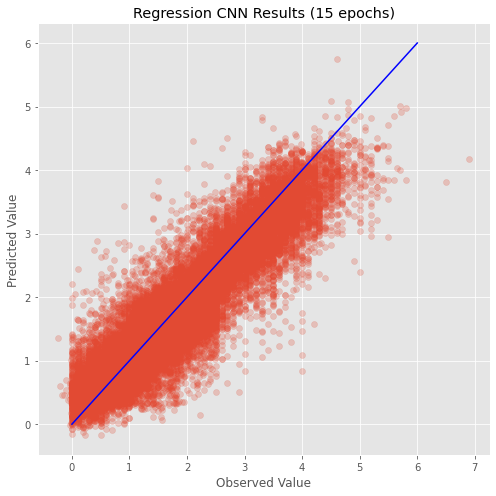

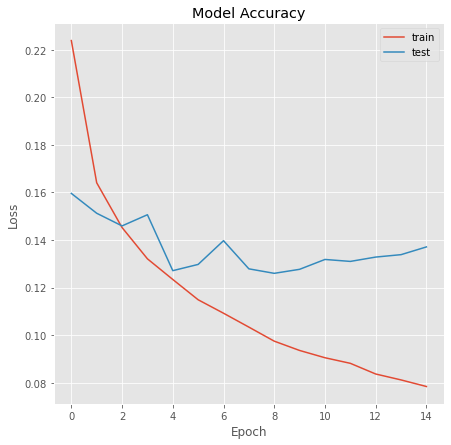

In [11]:
# run the model using the Seismic class defined above
sr = Seismic('regression','source_magnitude',200000,full_csv,dir); # initialize the class
sr.train_test_split(test_size=0.25,random_state=41) # train_test_split
sr.regression_cnn('source_magnitude',15) # use the classification cnn method with 15 epochs
sr.evaluate_regression_model() # evaluate the model

Creating seismic trace list
The number of traces in the directory is 200000
Working on trace # 1
Working on trace # 2
Working on trace # 3
Working on trace # 4
Working on trace # 5
Working on trace # 6
Working on trace # 7
Working on trace # 8
Working on trace # 9
Working on trace # 10
Working on trace # 11
Working on trace # 12
Working on trace # 13
Working on trace # 14
Working on trace # 15
Working on trace # 16
Working on trace # 17
Working on trace # 18
Working on trace # 19
Working on trace # 20
Working on trace # 21
Working on trace # 22
Working on trace # 23
Working on trace # 24
Working on trace # 25
Working on trace # 26
Working on trace # 27
Working on trace # 28
Working on trace # 29
Working on trace # 30
Working on trace # 31
Working on trace # 32
Working on trace # 33
Working on trace # 34
Working on trace # 35
Working on trace # 36
Working on trace # 37
Working on trace # 38
Working on trace # 39
Working on trace # 40
Working on trace # 41
Working on trace # 42
Working o

Working on trace # 467
Working on trace # 468
Working on trace # 469
Working on trace # 470
Working on trace # 471
Working on trace # 472
Working on trace # 473
Working on trace # 474
Working on trace # 475
Working on trace # 476
Working on trace # 477
Working on trace # 478
Working on trace # 479
Working on trace # 480
Working on trace # 481
Working on trace # 482
Working on trace # 483
Working on trace # 484
Working on trace # 485
Working on trace # 486
Working on trace # 487
Working on trace # 488
Working on trace # 489
Working on trace # 490
Working on trace # 491
Working on trace # 492
Working on trace # 493
Working on trace # 494
Working on trace # 495
Working on trace # 496
Working on trace # 497
Working on trace # 498
Working on trace # 499
Working on trace # 500
Working on trace # 501
Working on trace # 502
Working on trace # 503
Working on trace # 504
Working on trace # 505
Working on trace # 506
Working on trace # 507
Working on trace # 508
Working on trace # 509
Working on 

Working on trace # 974
Working on trace # 975
Working on trace # 976
Working on trace # 977
Working on trace # 978
Working on trace # 979
Working on trace # 980
Working on trace # 981
Working on trace # 982
Working on trace # 983
Working on trace # 984
Working on trace # 985
Working on trace # 986
Working on trace # 987
Working on trace # 988
Working on trace # 989
Working on trace # 990
Working on trace # 991
Working on trace # 992
Working on trace # 993
Working on trace # 994
Working on trace # 995
Working on trace # 996
Working on trace # 997
Working on trace # 998
Working on trace # 999
Working on trace # 1000
Working on trace # 1001
Working on trace # 1002
Working on trace # 1003
Working on trace # 1004
Working on trace # 1005
Working on trace # 1006
Working on trace # 1007
Working on trace # 1008
Working on trace # 1009
Working on trace # 1010
Working on trace # 1011
Working on trace # 1012
Working on trace # 1013
Working on trace # 1014
Working on trace # 1015
Working on trace #

Working on trace # 1482
Working on trace # 1483
Working on trace # 1484
Working on trace # 1485
Working on trace # 1486
Working on trace # 1487
Working on trace # 1488
Working on trace # 1489
Working on trace # 1490
Working on trace # 1491
Working on trace # 1492
Working on trace # 1493
Working on trace # 1494
Working on trace # 1495
Working on trace # 1496
Working on trace # 1497
Working on trace # 1498
Working on trace # 1499
Working on trace # 1500
Working on trace # 1501
Working on trace # 1502
Working on trace # 1503
Working on trace # 1504
Working on trace # 1505
Working on trace # 1506
Working on trace # 1507
Working on trace # 1508
Working on trace # 1509
Working on trace # 1510
Working on trace # 1511
Working on trace # 1512
Working on trace # 1513
Working on trace # 1514
Working on trace # 1515
Working on trace # 1516
Working on trace # 1517
Working on trace # 1518
Working on trace # 1519
Working on trace # 1520
Working on trace # 1521
Working on trace # 1522
Working on trace

Working on trace # 1966
Working on trace # 1967
Working on trace # 1968
Working on trace # 1969
Working on trace # 1970
Working on trace # 1971
Working on trace # 1972
Working on trace # 1973
Working on trace # 1974
Working on trace # 1975
Working on trace # 1976
Working on trace # 1977
Working on trace # 1978
Working on trace # 1979
Working on trace # 1980
Working on trace # 1981
Working on trace # 1982
Working on trace # 1983
Working on trace # 1984
Working on trace # 1985
Working on trace # 1986
Working on trace # 1987
Working on trace # 1988
Working on trace # 1989
Working on trace # 1990
Working on trace # 1991
Working on trace # 1992
Working on trace # 1993
Working on trace # 1994
Working on trace # 1995
Working on trace # 1996
Working on trace # 1997
Working on trace # 1998
Working on trace # 1999
Working on trace # 2000
Working on trace # 2001
Working on trace # 2002
Working on trace # 2003
Working on trace # 2004
Working on trace # 2005
Working on trace # 2006
Working on trace

Working on trace # 2448
Working on trace # 2449
Working on trace # 2450
Working on trace # 2451
Working on trace # 2452
Working on trace # 2453
Working on trace # 2454
Working on trace # 2455
Working on trace # 2456
Working on trace # 2457
Working on trace # 2458
Working on trace # 2459
Working on trace # 2460
Working on trace # 2461
Working on trace # 2462
Working on trace # 2463
Working on trace # 2464
Working on trace # 2465
Working on trace # 2466
Working on trace # 2467
Working on trace # 2468
Working on trace # 2469
Working on trace # 2470
Working on trace # 2471
Working on trace # 2472
Working on trace # 2473
Working on trace # 2474
Working on trace # 2475
Working on trace # 2476
Working on trace # 2477
Working on trace # 2478
Working on trace # 2479
Working on trace # 2480
Working on trace # 2481
Working on trace # 2482
Working on trace # 2483
Working on trace # 2484
Working on trace # 2485
Working on trace # 2486
Working on trace # 2487
Working on trace # 2488
Working on trace

Working on trace # 2946
Working on trace # 2947
Working on trace # 2948
Working on trace # 2949
Working on trace # 2950
Working on trace # 2951
Working on trace # 2952
Working on trace # 2953
Working on trace # 2954
Working on trace # 2955
Working on trace # 2956
Working on trace # 2957
Working on trace # 2958
Working on trace # 2959
Working on trace # 2960
Working on trace # 2961
Working on trace # 2962
Working on trace # 2963
Working on trace # 2964
Working on trace # 2965
Working on trace # 2966
Working on trace # 2967
Working on trace # 2968
Working on trace # 2969
Working on trace # 2970
Working on trace # 2971
Working on trace # 2972
Working on trace # 2973
Working on trace # 2974
Working on trace # 2975
Working on trace # 2976
Working on trace # 2977
Working on trace # 2978
Working on trace # 2979
Working on trace # 2980
Working on trace # 2981
Working on trace # 2982
Working on trace # 2983
Working on trace # 2984
Working on trace # 2985
Working on trace # 2986
Working on trace

Working on trace # 3463
Working on trace # 3464
Working on trace # 3465
Working on trace # 3466
Working on trace # 3467
Working on trace # 3468
Working on trace # 3469
Working on trace # 3470
Working on trace # 3471
Working on trace # 3472
Working on trace # 3473
Working on trace # 3474
Working on trace # 3475
Working on trace # 3476
Working on trace # 3477
Working on trace # 3478
Working on trace # 3479
Working on trace # 3480
Working on trace # 3481
Working on trace # 3482
Working on trace # 3483
Working on trace # 3484
Working on trace # 3485
Working on trace # 3486
Working on trace # 3487
Working on trace # 3488
Working on trace # 3489
Working on trace # 3490
Working on trace # 3491
Working on trace # 3492
Working on trace # 3493
Working on trace # 3494
Working on trace # 3495
Working on trace # 3496
Working on trace # 3497
Working on trace # 3498
Working on trace # 3499
Working on trace # 3500
Working on trace # 3501
Working on trace # 3502
Working on trace # 3503
Working on trace

Working on trace # 3820
Working on trace # 3821
Working on trace # 3822
Working on trace # 3823
Working on trace # 3824
Working on trace # 3825
Working on trace # 3826
Working on trace # 3827
Working on trace # 3828
Working on trace # 3829
Working on trace # 3830
Working on trace # 3831
Working on trace # 3832
Working on trace # 3833
Working on trace # 3834
Working on trace # 3835
Working on trace # 3836
Working on trace # 3837
Working on trace # 3838
Working on trace # 3839
Working on trace # 3840
Working on trace # 3841
Working on trace # 3842
Working on trace # 3843
Working on trace # 3844
Working on trace # 3845
Working on trace # 3846
Working on trace # 3847
Working on trace # 3848
Working on trace # 3849
Working on trace # 3850
Working on trace # 3851
Working on trace # 3852
Working on trace # 3853
Working on trace # 3854
Working on trace # 3855
Working on trace # 3856
Working on trace # 3857
Working on trace # 3858
Working on trace # 3859
Working on trace # 3860
Working on trace

Working on trace # 4313
Working on trace # 4314
Working on trace # 4315
Working on trace # 4316
Working on trace # 4317
Working on trace # 4318
Working on trace # 4319
Working on trace # 4320
Working on trace # 4321
Working on trace # 4322
Working on trace # 4323
Working on trace # 4324
Working on trace # 4325
Working on trace # 4326
Working on trace # 4327
Working on trace # 4328
Working on trace # 4329
Working on trace # 4330
Working on trace # 4331
Working on trace # 4332
Working on trace # 4333
Working on trace # 4334
Working on trace # 4335
Working on trace # 4336
Working on trace # 4337
Working on trace # 4338
Working on trace # 4339
Working on trace # 4340
Working on trace # 4341
Working on trace # 4342
Working on trace # 4343
Working on trace # 4344
Working on trace # 4345
Working on trace # 4346
Working on trace # 4347
Working on trace # 4348
Working on trace # 4349
Working on trace # 4350
Working on trace # 4351
Working on trace # 4352
Working on trace # 4353
Working on trace

Working on trace # 4672
Working on trace # 4673
Working on trace # 4674
Working on trace # 4675
Working on trace # 4676
Working on trace # 4677
Working on trace # 4678
Working on trace # 4679
Working on trace # 4680
Working on trace # 4681
Working on trace # 4682
Working on trace # 4683
Working on trace # 4684
Working on trace # 4685
Working on trace # 4686
Working on trace # 4687
Working on trace # 4688
Working on trace # 4689
Working on trace # 4690
Working on trace # 4691
Working on trace # 4692
Working on trace # 4693
Working on trace # 4694
Working on trace # 4695
Working on trace # 4696
Working on trace # 4697
Working on trace # 4698
Working on trace # 4699
Working on trace # 4700
Working on trace # 4701
Working on trace # 4702
Working on trace # 4703
Working on trace # 4704
Working on trace # 4705
Working on trace # 4706
Working on trace # 4707
Working on trace # 4708
Working on trace # 4709
Working on trace # 4710
Working on trace # 4711
Working on trace # 4712
Working on trace

Working on trace # 5177
Working on trace # 5178
Working on trace # 5179
Working on trace # 5180
Working on trace # 5181
Working on trace # 5182
Working on trace # 5183
Working on trace # 5184
Working on trace # 5185
Working on trace # 5186
Working on trace # 5187
Working on trace # 5188
Working on trace # 5189
Working on trace # 5190
Working on trace # 5191
Working on trace # 5192
Working on trace # 5193
Working on trace # 5194
Working on trace # 5195
Working on trace # 5196
Working on trace # 5197
Working on trace # 5198
Working on trace # 5199
Working on trace # 5200
Working on trace # 5201
Working on trace # 5202
Working on trace # 5203
Working on trace # 5204
Working on trace # 5205
Working on trace # 5206
Working on trace # 5207
Working on trace # 5208
Working on trace # 5209
Working on trace # 5210
Working on trace # 5211
Working on trace # 5212
Working on trace # 5213
Working on trace # 5214
Working on trace # 5215
Working on trace # 5216
Working on trace # 5217
Working on trace

Working on trace # 5679
Working on trace # 5680
Working on trace # 5681
Working on trace # 5682
Working on trace # 5683
Working on trace # 5684
Working on trace # 5685
Working on trace # 5686
Working on trace # 5687
Working on trace # 5688
Working on trace # 5689
Working on trace # 5690
Working on trace # 5691
Working on trace # 5692
Working on trace # 5693
Working on trace # 5694
Working on trace # 5695
Working on trace # 5696
Working on trace # 5697
Working on trace # 5698
Working on trace # 5699
Working on trace # 5700
Working on trace # 5701
Working on trace # 5702
Working on trace # 5703
Working on trace # 5704
Working on trace # 5705
Working on trace # 5706
Working on trace # 5707
Working on trace # 5708
Working on trace # 5709
Working on trace # 5710
Working on trace # 5711
Working on trace # 5712
Working on trace # 5713
Working on trace # 5714
Working on trace # 5715
Working on trace # 5716
Working on trace # 5717
Working on trace # 5718
Working on trace # 5719
Working on trace

Working on trace # 6158
Working on trace # 6159
Working on trace # 6160
Working on trace # 6161
Working on trace # 6162
Working on trace # 6163
Working on trace # 6164
Working on trace # 6165
Working on trace # 6166
Working on trace # 6167
Working on trace # 6168
Working on trace # 6169
Working on trace # 6170
Working on trace # 6171
Working on trace # 6172
Working on trace # 6173
Working on trace # 6174
Working on trace # 6175
Working on trace # 6176
Working on trace # 6177
Working on trace # 6178
Working on trace # 6179
Working on trace # 6180
Working on trace # 6181
Working on trace # 6182
Working on trace # 6183
Working on trace # 6184
Working on trace # 6185
Working on trace # 6186
Working on trace # 6187
Working on trace # 6188
Working on trace # 6189
Working on trace # 6190
Working on trace # 6191
Working on trace # 6192
Working on trace # 6193
Working on trace # 6194
Working on trace # 6195
Working on trace # 6196
Working on trace # 6197
Working on trace # 6198
Working on trace

Working on trace # 6606
Working on trace # 6607
Working on trace # 6608
Working on trace # 6609
Working on trace # 6610
Working on trace # 6611
Working on trace # 6612
Working on trace # 6613
Working on trace # 6614
Working on trace # 6615
Working on trace # 6616
Working on trace # 6617
Working on trace # 6618
Working on trace # 6619
Working on trace # 6620
Working on trace # 6621
Working on trace # 6622
Working on trace # 6623
Working on trace # 6624
Working on trace # 6625
Working on trace # 6626
Working on trace # 6627
Working on trace # 6628
Working on trace # 6629
Working on trace # 6630
Working on trace # 6631
Working on trace # 6632
Working on trace # 6633
Working on trace # 6634
Working on trace # 6635
Working on trace # 6636
Working on trace # 6637
Working on trace # 6638
Working on trace # 6639
Working on trace # 6640
Working on trace # 6641
Working on trace # 6642
Working on trace # 6643
Working on trace # 6644
Working on trace # 6645
Working on trace # 6646
Working on trace

Working on trace # 7124
Working on trace # 7125
Working on trace # 7126
Working on trace # 7127
Working on trace # 7128
Working on trace # 7129
Working on trace # 7130
Working on trace # 7131
Working on trace # 7132
Working on trace # 7133
Working on trace # 7134
Working on trace # 7135
Working on trace # 7136
Working on trace # 7137
Working on trace # 7138
Working on trace # 7139
Working on trace # 7140
Working on trace # 7141
Working on trace # 7142
Working on trace # 7143
Working on trace # 7144
Working on trace # 7145
Working on trace # 7146
Working on trace # 7147
Working on trace # 7148
Working on trace # 7149
Working on trace # 7150
Working on trace # 7151
Working on trace # 7152
Working on trace # 7153
Working on trace # 7154
Working on trace # 7155
Working on trace # 7156
Working on trace # 7157
Working on trace # 7158
Working on trace # 7159
Working on trace # 7160
Working on trace # 7161
Working on trace # 7162
Working on trace # 7163
Working on trace # 7164
Working on trace

Working on trace # 7623
Working on trace # 7624
Working on trace # 7625
Working on trace # 7626
Working on trace # 7627
Working on trace # 7628
Working on trace # 7629
Working on trace # 7630
Working on trace # 7631
Working on trace # 7632
Working on trace # 7633
Working on trace # 7634
Working on trace # 7635
Working on trace # 7636
Working on trace # 7637
Working on trace # 7638
Working on trace # 7639
Working on trace # 7640
Working on trace # 7641
Working on trace # 7642
Working on trace # 7643
Working on trace # 7644
Working on trace # 7645
Working on trace # 7646
Working on trace # 7647
Working on trace # 7648
Working on trace # 7649
Working on trace # 7650
Working on trace # 7651
Working on trace # 7652
Working on trace # 7653
Working on trace # 7654
Working on trace # 7655
Working on trace # 7656
Working on trace # 7657
Working on trace # 7658
Working on trace # 7659
Working on trace # 7660
Working on trace # 7661
Working on trace # 7662
Working on trace # 7663
Working on trace

Working on trace # 7978
Working on trace # 7979
Working on trace # 7980
Working on trace # 7981
Working on trace # 7982
Working on trace # 7983
Working on trace # 7984
Working on trace # 7985
Working on trace # 7986
Working on trace # 7987
Working on trace # 7988
Working on trace # 7989
Working on trace # 7990
Working on trace # 7991
Working on trace # 7992
Working on trace # 7993
Working on trace # 7994
Working on trace # 7995
Working on trace # 7996
Working on trace # 7997
Working on trace # 7998
Working on trace # 7999
Working on trace # 8000
Working on trace # 8001
Working on trace # 8002
Working on trace # 8003
Working on trace # 8004
Working on trace # 8005
Working on trace # 8006
Working on trace # 8007
Working on trace # 8008
Working on trace # 8009
Working on trace # 8010
Working on trace # 8011
Working on trace # 8012
Working on trace # 8013
Working on trace # 8014
Working on trace # 8015
Working on trace # 8016
Working on trace # 8017
Working on trace # 8018
Working on trace

Working on trace # 8329
Working on trace # 8330
Working on trace # 8331
Working on trace # 8332
Working on trace # 8333
Working on trace # 8334
Working on trace # 8335
Working on trace # 8336
Working on trace # 8337
Working on trace # 8338
Working on trace # 8339
Working on trace # 8340
Working on trace # 8341
Working on trace # 8342
Working on trace # 8343
Working on trace # 8344
Working on trace # 8345
Working on trace # 8346
Working on trace # 8347
Working on trace # 8348
Working on trace # 8349
Working on trace # 8350
Working on trace # 8351
Working on trace # 8352
Working on trace # 8353
Working on trace # 8354
Working on trace # 8355
Working on trace # 8356
Working on trace # 8357
Working on trace # 8358
Working on trace # 8359
Working on trace # 8360
Working on trace # 8361
Working on trace # 8362
Working on trace # 8363
Working on trace # 8364
Working on trace # 8365
Working on trace # 8366
Working on trace # 8367
Working on trace # 8368
Working on trace # 8369
Working on trace

Working on trace # 8693
Working on trace # 8694
Working on trace # 8695
Working on trace # 8696
Working on trace # 8697
Working on trace # 8698
Working on trace # 8699
Working on trace # 8700
Working on trace # 8701
Working on trace # 8702
Working on trace # 8703
Working on trace # 8704
Working on trace # 8705
Working on trace # 8706
Working on trace # 8707
Working on trace # 8708
Working on trace # 8709
Working on trace # 8710
Working on trace # 8711
Working on trace # 8712
Working on trace # 8713
Working on trace # 8714
Working on trace # 8715
Working on trace # 8716
Working on trace # 8717
Working on trace # 8718
Working on trace # 8719
Working on trace # 8720
Working on trace # 8721
Working on trace # 8722
Working on trace # 8723
Working on trace # 8724
Working on trace # 8725
Working on trace # 8726
Working on trace # 8727
Working on trace # 8728
Working on trace # 8729
Working on trace # 8730
Working on trace # 8731
Working on trace # 8732
Working on trace # 8733
Working on trace

Working on trace # 9053
Working on trace # 9054
Working on trace # 9055
Working on trace # 9056
Working on trace # 9057
Working on trace # 9058
Working on trace # 9059
Working on trace # 9060
Working on trace # 9061
Working on trace # 9062
Working on trace # 9063
Working on trace # 9064
Working on trace # 9065
Working on trace # 9066
Working on trace # 9067
Working on trace # 9068
Working on trace # 9069
Working on trace # 9070
Working on trace # 9071
Working on trace # 9072
Working on trace # 9073
Working on trace # 9074
Working on trace # 9075
Working on trace # 9076
Working on trace # 9077
Working on trace # 9078
Working on trace # 9079
Working on trace # 9080
Working on trace # 9081
Working on trace # 9082
Working on trace # 9083
Working on trace # 9084
Working on trace # 9085
Working on trace # 9086
Working on trace # 9087
Working on trace # 9088
Working on trace # 9089
Working on trace # 9090
Working on trace # 9091
Working on trace # 9092
Working on trace # 9093
Working on trace

Working on trace # 9411
Working on trace # 9412
Working on trace # 9413
Working on trace # 9414
Working on trace # 9415
Working on trace # 9416
Working on trace # 9417
Working on trace # 9418
Working on trace # 9419
Working on trace # 9420
Working on trace # 9421
Working on trace # 9422
Working on trace # 9423
Working on trace # 9424
Working on trace # 9425
Working on trace # 9426
Working on trace # 9427
Working on trace # 9428
Working on trace # 9429
Working on trace # 9430
Working on trace # 9431
Working on trace # 9432
Working on trace # 9433
Working on trace # 9434
Working on trace # 9435
Working on trace # 9436
Working on trace # 9437
Working on trace # 9438
Working on trace # 9439
Working on trace # 9440
Working on trace # 9441
Working on trace # 9442
Working on trace # 9443
Working on trace # 9444
Working on trace # 9445
Working on trace # 9446
Working on trace # 9447
Working on trace # 9448
Working on trace # 9449
Working on trace # 9450
Working on trace # 9451
Working on trace

Working on trace # 9769
Working on trace # 9770
Working on trace # 9771
Working on trace # 9772
Working on trace # 9773
Working on trace # 9774
Working on trace # 9775
Working on trace # 9776
Working on trace # 9777
Working on trace # 9778
Working on trace # 9779
Working on trace # 9780
Working on trace # 9781
Working on trace # 9782
Working on trace # 9783
Working on trace # 9784
Working on trace # 9785
Working on trace # 9786
Working on trace # 9787
Working on trace # 9788
Working on trace # 9789
Working on trace # 9790
Working on trace # 9791
Working on trace # 9792
Working on trace # 9793
Working on trace # 9794
Working on trace # 9795
Working on trace # 9796
Working on trace # 9797
Working on trace # 9798
Working on trace # 9799
Working on trace # 9800
Working on trace # 9801
Working on trace # 9802
Working on trace # 9803
Working on trace # 9804
Working on trace # 9805
Working on trace # 9806
Working on trace # 9807
Working on trace # 9808
Working on trace # 9809
Working on trace

Working on trace # 10129
Working on trace # 10130
Working on trace # 10131
Working on trace # 10132
Working on trace # 10133
Working on trace # 10134
Working on trace # 10135
Working on trace # 10136
Working on trace # 10137
Working on trace # 10138
Working on trace # 10139
Working on trace # 10140
Working on trace # 10141
Working on trace # 10142
Working on trace # 10143
Working on trace # 10144
Working on trace # 10145
Working on trace # 10146
Working on trace # 10147
Working on trace # 10148
Working on trace # 10149
Working on trace # 10150
Working on trace # 10151
Working on trace # 10152
Working on trace # 10153
Working on trace # 10154
Working on trace # 10155
Working on trace # 10156
Working on trace # 10157
Working on trace # 10158
Working on trace # 10159
Working on trace # 10160
Working on trace # 10161
Working on trace # 10162
Working on trace # 10163
Working on trace # 10164
Working on trace # 10165
Working on trace # 10166
Working on trace # 10167
Working on trace # 10168


Working on trace # 10467
Working on trace # 10468
Working on trace # 10469
Working on trace # 10470
Working on trace # 10471
Working on trace # 10472
Working on trace # 10473
Working on trace # 10474
Working on trace # 10475
Working on trace # 10476
Working on trace # 10477
Working on trace # 10478
Working on trace # 10479
Working on trace # 10480
Working on trace # 10481
Working on trace # 10482
Working on trace # 10483
Working on trace # 10484
Working on trace # 10485
Working on trace # 10486
Working on trace # 10487
Working on trace # 10488
Working on trace # 10489
Working on trace # 10490
Working on trace # 10491
Working on trace # 10492
Working on trace # 10493
Working on trace # 10494
Working on trace # 10495
Working on trace # 10496
Working on trace # 10497
Working on trace # 10498
Working on trace # 10499
Working on trace # 10500
Working on trace # 10501
Working on trace # 10502
Working on trace # 10503
Working on trace # 10504
Working on trace # 10505
Working on trace # 10506


Working on trace # 10816
Working on trace # 10817
Working on trace # 10818
Working on trace # 10819
Working on trace # 10820
Working on trace # 10821
Working on trace # 10822
Working on trace # 10823
Working on trace # 10824
Working on trace # 10825
Working on trace # 10826
Working on trace # 10827
Working on trace # 10828
Working on trace # 10829
Working on trace # 10830
Working on trace # 10831
Working on trace # 10832
Working on trace # 10833
Working on trace # 10834
Working on trace # 10835
Working on trace # 10836
Working on trace # 10837
Working on trace # 10838
Working on trace # 10839
Working on trace # 10840
Working on trace # 10841
Working on trace # 10842
Working on trace # 10843
Working on trace # 10844
Working on trace # 10845
Working on trace # 10846
Working on trace # 10847
Working on trace # 10848
Working on trace # 10849
Working on trace # 10850
Working on trace # 10851
Working on trace # 10852
Working on trace # 10853
Working on trace # 10854
Working on trace # 10855


Working on trace # 11174
Working on trace # 11175
Working on trace # 11176
Working on trace # 11177
Working on trace # 11178
Working on trace # 11179
Working on trace # 11180
Working on trace # 11181
Working on trace # 11182
Working on trace # 11183
Working on trace # 11184
Working on trace # 11185
Working on trace # 11186
Working on trace # 11187
Working on trace # 11188
Working on trace # 11189
Working on trace # 11190
Working on trace # 11191
Working on trace # 11192
Working on trace # 11193
Working on trace # 11194
Working on trace # 11195
Working on trace # 11196
Working on trace # 11197
Working on trace # 11198
Working on trace # 11199
Working on trace # 11200
Working on trace # 11201
Working on trace # 11202
Working on trace # 11203
Working on trace # 11204
Working on trace # 11205
Working on trace # 11206
Working on trace # 11207
Working on trace # 11208
Working on trace # 11209
Working on trace # 11210
Working on trace # 11211
Working on trace # 11212
Working on trace # 11213


Working on trace # 11545
Working on trace # 11546
Working on trace # 11547
Working on trace # 11548
Working on trace # 11549
Working on trace # 11550
Working on trace # 11551
Working on trace # 11552
Working on trace # 11553
Working on trace # 11554
Working on trace # 11555
Working on trace # 11556
Working on trace # 11557
Working on trace # 11558
Working on trace # 11559
Working on trace # 11560
Working on trace # 11561
Working on trace # 11562
Working on trace # 11563
Working on trace # 11564
Working on trace # 11565
Working on trace # 11566
Working on trace # 11567
Working on trace # 11568
Working on trace # 11569
Working on trace # 11570
Working on trace # 11571
Working on trace # 11572
Working on trace # 11573
Working on trace # 11574
Working on trace # 11575
Working on trace # 11576
Working on trace # 11577
Working on trace # 11578
Working on trace # 11579
Working on trace # 11580
Working on trace # 11581
Working on trace # 11582
Working on trace # 11583
Working on trace # 11584


Working on trace # 11914
Working on trace # 11915
Working on trace # 11916
Working on trace # 11917
Working on trace # 11918
Working on trace # 11919
Working on trace # 11920
Working on trace # 11921
Working on trace # 11922
Working on trace # 11923
Working on trace # 11924
Working on trace # 11925
Working on trace # 11926
Working on trace # 11927
Working on trace # 11928
Working on trace # 11929
Working on trace # 11930
Working on trace # 11931
Working on trace # 11932
Working on trace # 11933
Working on trace # 11934
Working on trace # 11935
Working on trace # 11936
Working on trace # 11937
Working on trace # 11938
Working on trace # 11939
Working on trace # 11940
Working on trace # 11941
Working on trace # 11942
Working on trace # 11943
Working on trace # 11944
Working on trace # 11945
Working on trace # 11946
Working on trace # 11947
Working on trace # 11948
Working on trace # 11949
Working on trace # 11950
Working on trace # 11951
Working on trace # 11952
Working on trace # 11953


Working on trace # 12289
Working on trace # 12290
Working on trace # 12291
Working on trace # 12292
Working on trace # 12293
Working on trace # 12294
Working on trace # 12295
Working on trace # 12296
Working on trace # 12297
Working on trace # 12298
Working on trace # 12299
Working on trace # 12300
Working on trace # 12301
Working on trace # 12302
Working on trace # 12303
Working on trace # 12304
Working on trace # 12305
Working on trace # 12306
Working on trace # 12307
Working on trace # 12308
Working on trace # 12309
Working on trace # 12310
Working on trace # 12311
Working on trace # 12312
Working on trace # 12313
Working on trace # 12314
Working on trace # 12315
Working on trace # 12316
Working on trace # 12317
Working on trace # 12318
Working on trace # 12319
Working on trace # 12320
Working on trace # 12321
Working on trace # 12322
Working on trace # 12323
Working on trace # 12324
Working on trace # 12325
Working on trace # 12326
Working on trace # 12327
Working on trace # 12328


Working on trace # 12781
Working on trace # 12782
Working on trace # 12783
Working on trace # 12784
Working on trace # 12785
Working on trace # 12786
Working on trace # 12787
Working on trace # 12788
Working on trace # 12789
Working on trace # 12790
Working on trace # 12791
Working on trace # 12792
Working on trace # 12793
Working on trace # 12794
Working on trace # 12795
Working on trace # 12796
Working on trace # 12797
Working on trace # 12798
Working on trace # 12799
Working on trace # 12800
Working on trace # 12801
Working on trace # 12802
Working on trace # 12803
Working on trace # 12804
Working on trace # 12805
Working on trace # 12806
Working on trace # 12807
Working on trace # 12808
Working on trace # 12809
Working on trace # 12810
Working on trace # 12811
Working on trace # 12812
Working on trace # 12813
Working on trace # 12814
Working on trace # 12815
Working on trace # 12816
Working on trace # 12817
Working on trace # 12818
Working on trace # 12819
Working on trace # 12820


Working on trace # 13158
Working on trace # 13159
Working on trace # 13160
Working on trace # 13161
Working on trace # 13162
Working on trace # 13163
Working on trace # 13164
Working on trace # 13165
Working on trace # 13166
Working on trace # 13167
Working on trace # 13168
Working on trace # 13169
Working on trace # 13170
Working on trace # 13171
Working on trace # 13172
Working on trace # 13173
Working on trace # 13174
Working on trace # 13175
Working on trace # 13176
Working on trace # 13177
Working on trace # 13178
Working on trace # 13179
Working on trace # 13180
Working on trace # 13181
Working on trace # 13182
Working on trace # 13183
Working on trace # 13184
Working on trace # 13185
Working on trace # 13186
Working on trace # 13187
Working on trace # 13188
Working on trace # 13189
Working on trace # 13190
Working on trace # 13191
Working on trace # 13192
Working on trace # 13193
Working on trace # 13194
Working on trace # 13195
Working on trace # 13196
Working on trace # 13197


Working on trace # 13539
Working on trace # 13540
Working on trace # 13541
Working on trace # 13542
Working on trace # 13543
Working on trace # 13544
Working on trace # 13545
Working on trace # 13546
Working on trace # 13547
Working on trace # 13548
Working on trace # 13549
Working on trace # 13550
Working on trace # 13551
Working on trace # 13552
Working on trace # 13553
Working on trace # 13554
Working on trace # 13555
Working on trace # 13556
Working on trace # 13557
Working on trace # 13558
Working on trace # 13559
Working on trace # 13560
Working on trace # 13561
Working on trace # 13562
Working on trace # 13563
Working on trace # 13564
Working on trace # 13565
Working on trace # 13566
Working on trace # 13567
Working on trace # 13568
Working on trace # 13569
Working on trace # 13570
Working on trace # 13571
Working on trace # 13572
Working on trace # 13573
Working on trace # 13574
Working on trace # 13575
Working on trace # 13576
Working on trace # 13577
Working on trace # 13578


Working on trace # 13892
Working on trace # 13893
Working on trace # 13894
Working on trace # 13895
Working on trace # 13896
Working on trace # 13897
Working on trace # 13898
Working on trace # 13899
Working on trace # 13900
Working on trace # 13901
Working on trace # 13902
Working on trace # 13903
Working on trace # 13904
Working on trace # 13905
Working on trace # 13906
Working on trace # 13907
Working on trace # 13908
Working on trace # 13909
Working on trace # 13910
Working on trace # 13911
Working on trace # 13912
Working on trace # 13913
Working on trace # 13914
Working on trace # 13915
Working on trace # 13916
Working on trace # 13917
Working on trace # 13918
Working on trace # 13919
Working on trace # 13920
Working on trace # 13921
Working on trace # 13922
Working on trace # 13923
Working on trace # 13924
Working on trace # 13925
Working on trace # 13926
Working on trace # 13927
Working on trace # 13928
Working on trace # 13929
Working on trace # 13930
Working on trace # 13931


Working on trace # 14258
Working on trace # 14259
Working on trace # 14260
Working on trace # 14261
Working on trace # 14262
Working on trace # 14263
Working on trace # 14264
Working on trace # 14265
Working on trace # 14266
Working on trace # 14267
Working on trace # 14268
Working on trace # 14269
Working on trace # 14270
Working on trace # 14271
Working on trace # 14272
Working on trace # 14273
Working on trace # 14274
Working on trace # 14275
Working on trace # 14276
Working on trace # 14277
Working on trace # 14278
Working on trace # 14279
Working on trace # 14280
Working on trace # 14281
Working on trace # 14282
Working on trace # 14283
Working on trace # 14284
Working on trace # 14285
Working on trace # 14286
Working on trace # 14287
Working on trace # 14288
Working on trace # 14289
Working on trace # 14290
Working on trace # 14291
Working on trace # 14292
Working on trace # 14293
Working on trace # 14294
Working on trace # 14295
Working on trace # 14296
Working on trace # 14297


Working on trace # 14707
Working on trace # 14708
Working on trace # 14709
Working on trace # 14710
Working on trace # 14711
Working on trace # 14712
Working on trace # 14713
Working on trace # 14714
Working on trace # 14715
Working on trace # 14716
Working on trace # 14717
Working on trace # 14718
Working on trace # 14719
Working on trace # 14720
Working on trace # 14721
Working on trace # 14722
Working on trace # 14723
Working on trace # 14724
Working on trace # 14725
Working on trace # 14726
Working on trace # 14727
Working on trace # 14728
Working on trace # 14729
Working on trace # 14730
Working on trace # 14731
Working on trace # 14732
Working on trace # 14733
Working on trace # 14734
Working on trace # 14735
Working on trace # 14736
Working on trace # 14737
Working on trace # 14738
Working on trace # 14739
Working on trace # 14740
Working on trace # 14741
Working on trace # 14742
Working on trace # 14743
Working on trace # 14744
Working on trace # 14745
Working on trace # 14746


Working on trace # 15091
Working on trace # 15092
Working on trace # 15093
Working on trace # 15094
Working on trace # 15095
Working on trace # 15096
Working on trace # 15097
Working on trace # 15098
Working on trace # 15099
Working on trace # 15100
Working on trace # 15101
Working on trace # 15102
Working on trace # 15103
Working on trace # 15104
Working on trace # 15105
Working on trace # 15106
Working on trace # 15107
Working on trace # 15108
Working on trace # 15109
Working on trace # 15110
Working on trace # 15111
Working on trace # 15112
Working on trace # 15113
Working on trace # 15114
Working on trace # 15115
Working on trace # 15116
Working on trace # 15117
Working on trace # 15118
Working on trace # 15119
Working on trace # 15120
Working on trace # 15121
Working on trace # 15122
Working on trace # 15123
Working on trace # 15124
Working on trace # 15125
Working on trace # 15126
Working on trace # 15127
Working on trace # 15128
Working on trace # 15129
Working on trace # 15130


Working on trace # 15470
Working on trace # 15471
Working on trace # 15472
Working on trace # 15473
Working on trace # 15474
Working on trace # 15475
Working on trace # 15476
Working on trace # 15477
Working on trace # 15478
Working on trace # 15479
Working on trace # 15480
Working on trace # 15481
Working on trace # 15482
Working on trace # 15483
Working on trace # 15484
Working on trace # 15485
Working on trace # 15486
Working on trace # 15487
Working on trace # 15488
Working on trace # 15489
Working on trace # 15490
Working on trace # 15491
Working on trace # 15492
Working on trace # 15493
Working on trace # 15494
Working on trace # 15495
Working on trace # 15496
Working on trace # 15497
Working on trace # 15498
Working on trace # 15499
Working on trace # 15500
Working on trace # 15501
Working on trace # 15502
Working on trace # 15503
Working on trace # 15504
Working on trace # 15505
Working on trace # 15506
Working on trace # 15507
Working on trace # 15508
Working on trace # 15509


Working on trace # 15842
Working on trace # 15843
Working on trace # 15844
Working on trace # 15845
Working on trace # 15846
Working on trace # 15847
Working on trace # 15848
Working on trace # 15849
Working on trace # 15850
Working on trace # 15851
Working on trace # 15852
Working on trace # 15853
Working on trace # 15854
Working on trace # 15855
Working on trace # 15856
Working on trace # 15857
Working on trace # 15858
Working on trace # 15859
Working on trace # 15860
Working on trace # 15861
Working on trace # 15862
Working on trace # 15863
Working on trace # 15864
Working on trace # 15865
Working on trace # 15866
Working on trace # 15867
Working on trace # 15868
Working on trace # 15869
Working on trace # 15870
Working on trace # 15871
Working on trace # 15872
Working on trace # 15873
Working on trace # 15874
Working on trace # 15875
Working on trace # 15876
Working on trace # 15877
Working on trace # 15878
Working on trace # 15879
Working on trace # 15880
Working on trace # 15881


Working on trace # 16227
Working on trace # 16228
Working on trace # 16229
Working on trace # 16230
Working on trace # 16231
Working on trace # 16232
Working on trace # 16233
Working on trace # 16234
Working on trace # 16235
Working on trace # 16236
Working on trace # 16237
Working on trace # 16238
Working on trace # 16239
Working on trace # 16240
Working on trace # 16241
Working on trace # 16242
Working on trace # 16243
Working on trace # 16244
Working on trace # 16245
Working on trace # 16246
Working on trace # 16247
Working on trace # 16248
Working on trace # 16249
Working on trace # 16250
Working on trace # 16251
Working on trace # 16252
Working on trace # 16253
Working on trace # 16254
Working on trace # 16255
Working on trace # 16256
Working on trace # 16257
Working on trace # 16258
Working on trace # 16259
Working on trace # 16260
Working on trace # 16261
Working on trace # 16262
Working on trace # 16263
Working on trace # 16264
Working on trace # 16265
Working on trace # 16266


Working on trace # 16614
Working on trace # 16615
Working on trace # 16616
Working on trace # 16617
Working on trace # 16618
Working on trace # 16619
Working on trace # 16620
Working on trace # 16621
Working on trace # 16622
Working on trace # 16623
Working on trace # 16624
Working on trace # 16625
Working on trace # 16626
Working on trace # 16627
Working on trace # 16628
Working on trace # 16629
Working on trace # 16630
Working on trace # 16631
Working on trace # 16632
Working on trace # 16633
Working on trace # 16634
Working on trace # 16635
Working on trace # 16636
Working on trace # 16637
Working on trace # 16638
Working on trace # 16639
Working on trace # 16640
Working on trace # 16641
Working on trace # 16642
Working on trace # 16643
Working on trace # 16644
Working on trace # 16645
Working on trace # 16646
Working on trace # 16647
Working on trace # 16648
Working on trace # 16649
Working on trace # 16650
Working on trace # 16651
Working on trace # 16652
Working on trace # 16653


Working on trace # 16960
Working on trace # 16961
Working on trace # 16962
Working on trace # 16963
Working on trace # 16964
Working on trace # 16965
Working on trace # 16966
Working on trace # 16967
Working on trace # 16968
Working on trace # 16969
Working on trace # 16970
Working on trace # 16971
Working on trace # 16972
Working on trace # 16973
Working on trace # 16974
Working on trace # 16975
Working on trace # 16976
Working on trace # 16977
Working on trace # 16978
Working on trace # 16979
Working on trace # 16980
Working on trace # 16981
Working on trace # 16982
Working on trace # 16983
Working on trace # 16984
Working on trace # 16985
Working on trace # 16986
Working on trace # 16987
Working on trace # 16988
Working on trace # 16989
Working on trace # 16990
Working on trace # 16991
Working on trace # 16992
Working on trace # 16993
Working on trace # 16994
Working on trace # 16995
Working on trace # 16996
Working on trace # 16997
Working on trace # 16998
Working on trace # 16999


Working on trace # 17356
Working on trace # 17357
Working on trace # 17358
Working on trace # 17359
Working on trace # 17360
Working on trace # 17361
Working on trace # 17362
Working on trace # 17363
Working on trace # 17364
Working on trace # 17365
Working on trace # 17366
Working on trace # 17367
Working on trace # 17368
Working on trace # 17369
Working on trace # 17370
Working on trace # 17371
Working on trace # 17372
Working on trace # 17373
Working on trace # 17374
Working on trace # 17375
Working on trace # 17376
Working on trace # 17377
Working on trace # 17378
Working on trace # 17379
Working on trace # 17380
Working on trace # 17381
Working on trace # 17382
Working on trace # 17383
Working on trace # 17384
Working on trace # 17385
Working on trace # 17386
Working on trace # 17387
Working on trace # 17388
Working on trace # 17389
Working on trace # 17390
Working on trace # 17391
Working on trace # 17392
Working on trace # 17393
Working on trace # 17394
Working on trace # 17395


Working on trace # 17749
Working on trace # 17750
Working on trace # 17751
Working on trace # 17752
Working on trace # 17753
Working on trace # 17754
Working on trace # 17755
Working on trace # 17756
Working on trace # 17757
Working on trace # 17758
Working on trace # 17759
Working on trace # 17760
Working on trace # 17761
Working on trace # 17762
Working on trace # 17763
Working on trace # 17764
Working on trace # 17765
Working on trace # 17766
Working on trace # 17767
Working on trace # 17768
Working on trace # 17769
Working on trace # 17770
Working on trace # 17771
Working on trace # 17772
Working on trace # 17773
Working on trace # 17774
Working on trace # 17775
Working on trace # 17776
Working on trace # 17777
Working on trace # 17778
Working on trace # 17779
Working on trace # 17780
Working on trace # 17781
Working on trace # 17782
Working on trace # 17783
Working on trace # 17784
Working on trace # 17785
Working on trace # 17786
Working on trace # 17787
Working on trace # 17788


Working on trace # 18152
Working on trace # 18153
Working on trace # 18154
Working on trace # 18155
Working on trace # 18156
Working on trace # 18157
Working on trace # 18158
Working on trace # 18159
Working on trace # 18160
Working on trace # 18161
Working on trace # 18162
Working on trace # 18163
Working on trace # 18164
Working on trace # 18165
Working on trace # 18166
Working on trace # 18167
Working on trace # 18168
Working on trace # 18169
Working on trace # 18170
Working on trace # 18171
Working on trace # 18172
Working on trace # 18173
Working on trace # 18174
Working on trace # 18175
Working on trace # 18176
Working on trace # 18177
Working on trace # 18178
Working on trace # 18179
Working on trace # 18180
Working on trace # 18181
Working on trace # 18182
Working on trace # 18183
Working on trace # 18184
Working on trace # 18185
Working on trace # 18186
Working on trace # 18187
Working on trace # 18188
Working on trace # 18189
Working on trace # 18190
Working on trace # 18191


Working on trace # 18526
Working on trace # 18527
Working on trace # 18528
Working on trace # 18529
Working on trace # 18530
Working on trace # 18531
Working on trace # 18532
Working on trace # 18533
Working on trace # 18534
Working on trace # 18535
Working on trace # 18536
Working on trace # 18537
Working on trace # 18538
Working on trace # 18539
Working on trace # 18540
Working on trace # 18541
Working on trace # 18542
Working on trace # 18543
Working on trace # 18544
Working on trace # 18545
Working on trace # 18546
Working on trace # 18547
Working on trace # 18548
Working on trace # 18549
Working on trace # 18550
Working on trace # 18551
Working on trace # 18552
Working on trace # 18553
Working on trace # 18554
Working on trace # 18555
Working on trace # 18556
Working on trace # 18557
Working on trace # 18558
Working on trace # 18559
Working on trace # 18560
Working on trace # 18561
Working on trace # 18562
Working on trace # 18563
Working on trace # 18564
Working on trace # 18565


Working on trace # 18923
Working on trace # 18924
Working on trace # 18925
Working on trace # 18926
Working on trace # 18927
Working on trace # 18928
Working on trace # 18929
Working on trace # 18930
Working on trace # 18931
Working on trace # 18932
Working on trace # 18933
Working on trace # 18934
Working on trace # 18935
Working on trace # 18936
Working on trace # 18937
Working on trace # 18938
Working on trace # 18939
Working on trace # 18940
Working on trace # 18941
Working on trace # 18942
Working on trace # 18943
Working on trace # 18944
Working on trace # 18945
Working on trace # 18946
Working on trace # 18947
Working on trace # 18948
Working on trace # 18949
Working on trace # 18950
Working on trace # 18951
Working on trace # 18952
Working on trace # 18953
Working on trace # 18954
Working on trace # 18955
Working on trace # 18956
Working on trace # 18957
Working on trace # 18958
Working on trace # 18959
Working on trace # 18960
Working on trace # 18961
Working on trace # 18962


Working on trace # 19300
Working on trace # 19301
Working on trace # 19302
Working on trace # 19303
Working on trace # 19304
Working on trace # 19305
Working on trace # 19306
Working on trace # 19307
Working on trace # 19308
Working on trace # 19309
Working on trace # 19310
Working on trace # 19311
Working on trace # 19312
Working on trace # 19313
Working on trace # 19314
Working on trace # 19315
Working on trace # 19316
Working on trace # 19317
Working on trace # 19318
Working on trace # 19319
Working on trace # 19320
Working on trace # 19321
Working on trace # 19322
Working on trace # 19323
Working on trace # 19324
Working on trace # 19325
Working on trace # 19326
Working on trace # 19327
Working on trace # 19328
Working on trace # 19329
Working on trace # 19330
Working on trace # 19331
Working on trace # 19332
Working on trace # 19333
Working on trace # 19334
Working on trace # 19335
Working on trace # 19336
Working on trace # 19337
Working on trace # 19338
Working on trace # 19339


Working on trace # 19698
Working on trace # 19699
Working on trace # 19700
Working on trace # 19701
Working on trace # 19702
Working on trace # 19703
Working on trace # 19704
Working on trace # 19705
Working on trace # 19706
Working on trace # 19707
Working on trace # 19708
Working on trace # 19709
Working on trace # 19710
Working on trace # 19711
Working on trace # 19712
Working on trace # 19713
Working on trace # 19714
Working on trace # 19715
Working on trace # 19716
Working on trace # 19717
Working on trace # 19718
Working on trace # 19719
Working on trace # 19720
Working on trace # 19721
Working on trace # 19722
Working on trace # 19723
Working on trace # 19724
Working on trace # 19725
Working on trace # 19726
Working on trace # 19727
Working on trace # 19728
Working on trace # 19729
Working on trace # 19730
Working on trace # 19731
Working on trace # 19732
Working on trace # 19733
Working on trace # 19734
Working on trace # 19735
Working on trace # 19736
Working on trace # 19737


Working on trace # 20102
Working on trace # 20103
Working on trace # 20104
Working on trace # 20105
Working on trace # 20106
Working on trace # 20107
Working on trace # 20108
Working on trace # 20109
Working on trace # 20110
Working on trace # 20111
Working on trace # 20112
Working on trace # 20113
Working on trace # 20114
Working on trace # 20115
Working on trace # 20116
Working on trace # 20117
Working on trace # 20118
Working on trace # 20119
Working on trace # 20120
Working on trace # 20121
Working on trace # 20122
Working on trace # 20123
Working on trace # 20124
Working on trace # 20125
Working on trace # 20126
Working on trace # 20127
Working on trace # 20128
Working on trace # 20129
Working on trace # 20130
Working on trace # 20131
Working on trace # 20132
Working on trace # 20133
Working on trace # 20134
Working on trace # 20135
Working on trace # 20136
Working on trace # 20137
Working on trace # 20138
Working on trace # 20139
Working on trace # 20140
Working on trace # 20141


Working on trace # 20469
Working on trace # 20470
Working on trace # 20471
Working on trace # 20472
Working on trace # 20473
Working on trace # 20474
Working on trace # 20475
Working on trace # 20476
Working on trace # 20477
Working on trace # 20478
Working on trace # 20479
Working on trace # 20480
Working on trace # 20481
Working on trace # 20482
Working on trace # 20483
Working on trace # 20484
Working on trace # 20485
Working on trace # 20486
Working on trace # 20487
Working on trace # 20488
Working on trace # 20489
Working on trace # 20490
Working on trace # 20491
Working on trace # 20492
Working on trace # 20493
Working on trace # 20494
Working on trace # 20495
Working on trace # 20496
Working on trace # 20497
Working on trace # 20498
Working on trace # 20499
Working on trace # 20500
Working on trace # 20501
Working on trace # 20502
Working on trace # 20503
Working on trace # 20504
Working on trace # 20505
Working on trace # 20506
Working on trace # 20507
Working on trace # 20508


Working on trace # 20864
Working on trace # 20865
Working on trace # 20866
Working on trace # 20867
Working on trace # 20868
Working on trace # 20869
Working on trace # 20870
Working on trace # 20871
Working on trace # 20872
Working on trace # 20873
Working on trace # 20874
Working on trace # 20875
Working on trace # 20876
Working on trace # 20877
Working on trace # 20878
Working on trace # 20879
Working on trace # 20880
Working on trace # 20881
Working on trace # 20882
Working on trace # 20883
Working on trace # 20884
Working on trace # 20885
Working on trace # 20886
Working on trace # 20887
Working on trace # 20888
Working on trace # 20889
Working on trace # 20890
Working on trace # 20891
Working on trace # 20892
Working on trace # 20893
Working on trace # 20894
Working on trace # 20895
Working on trace # 20896
Working on trace # 20897
Working on trace # 20898
Working on trace # 20899
Working on trace # 20900
Working on trace # 20901
Working on trace # 20902
Working on trace # 20903


Working on trace # 21265
Working on trace # 21266
Working on trace # 21267
Working on trace # 21268
Working on trace # 21269
Working on trace # 21270
Working on trace # 21271
Working on trace # 21272
Working on trace # 21273
Working on trace # 21274
Working on trace # 21275
Working on trace # 21276
Working on trace # 21277
Working on trace # 21278
Working on trace # 21279
Working on trace # 21280
Working on trace # 21281
Working on trace # 21282
Working on trace # 21283
Working on trace # 21284
Working on trace # 21285
Working on trace # 21286
Working on trace # 21287
Working on trace # 21288
Working on trace # 21289
Working on trace # 21290
Working on trace # 21291
Working on trace # 21292
Working on trace # 21293
Working on trace # 21294
Working on trace # 21295
Working on trace # 21296
Working on trace # 21297
Working on trace # 21298
Working on trace # 21299
Working on trace # 21300
Working on trace # 21301
Working on trace # 21302
Working on trace # 21303
Working on trace # 21304


Working on trace # 21668
Working on trace # 21669
Working on trace # 21670
Working on trace # 21671
Working on trace # 21672
Working on trace # 21673
Working on trace # 21674
Working on trace # 21675
Working on trace # 21676
Working on trace # 21677
Working on trace # 21678
Working on trace # 21679
Working on trace # 21680
Working on trace # 21681
Working on trace # 21682
Working on trace # 21683
Working on trace # 21684
Working on trace # 21685
Working on trace # 21686
Working on trace # 21687
Working on trace # 21688
Working on trace # 21689
Working on trace # 21690
Working on trace # 21691
Working on trace # 21692
Working on trace # 21693
Working on trace # 21694
Working on trace # 21695
Working on trace # 21696
Working on trace # 21697
Working on trace # 21698
Working on trace # 21699
Working on trace # 21700
Working on trace # 21701
Working on trace # 21702
Working on trace # 21703
Working on trace # 21704
Working on trace # 21705
Working on trace # 21706
Working on trace # 21707


Working on trace # 22078
Working on trace # 22079
Working on trace # 22080
Working on trace # 22081
Working on trace # 22082
Working on trace # 22083
Working on trace # 22084
Working on trace # 22085
Working on trace # 22086
Working on trace # 22087
Working on trace # 22088
Working on trace # 22089
Working on trace # 22090
Working on trace # 22091
Working on trace # 22092
Working on trace # 22093
Working on trace # 22094
Working on trace # 22095
Working on trace # 22096
Working on trace # 22097
Working on trace # 22098
Working on trace # 22099
Working on trace # 22100
Working on trace # 22101
Working on trace # 22102
Working on trace # 22103
Working on trace # 22104
Working on trace # 22105
Working on trace # 22106
Working on trace # 22107
Working on trace # 22108
Working on trace # 22109
Working on trace # 22110
Working on trace # 22111
Working on trace # 22112
Working on trace # 22113
Working on trace # 22114
Working on trace # 22115
Working on trace # 22116
Working on trace # 22117


Working on trace # 22480
Working on trace # 22481
Working on trace # 22482
Working on trace # 22483
Working on trace # 22484
Working on trace # 22485
Working on trace # 22486
Working on trace # 22487
Working on trace # 22488
Working on trace # 22489
Working on trace # 22490
Working on trace # 22491
Working on trace # 22492
Working on trace # 22493
Working on trace # 22494
Working on trace # 22495
Working on trace # 22496
Working on trace # 22497
Working on trace # 22498
Working on trace # 22499
Working on trace # 22500
Working on trace # 22501
Working on trace # 22502
Working on trace # 22503
Working on trace # 22504
Working on trace # 22505
Working on trace # 22506
Working on trace # 22507
Working on trace # 22508
Working on trace # 22509
Working on trace # 22510
Working on trace # 22511
Working on trace # 22512
Working on trace # 22513
Working on trace # 22514
Working on trace # 22515
Working on trace # 22516
Working on trace # 22517
Working on trace # 22518
Working on trace # 22519


Working on trace # 22879
Working on trace # 22880
Working on trace # 22881
Working on trace # 22882
Working on trace # 22883
Working on trace # 22884
Working on trace # 22885
Working on trace # 22886
Working on trace # 22887
Working on trace # 22888
Working on trace # 22889
Working on trace # 22890
Working on trace # 22891
Working on trace # 22892
Working on trace # 22893
Working on trace # 22894
Working on trace # 22895
Working on trace # 22896
Working on trace # 22897
Working on trace # 22898
Working on trace # 22899
Working on trace # 22900
Working on trace # 22901
Working on trace # 22902
Working on trace # 22903
Working on trace # 22904
Working on trace # 22905
Working on trace # 22906
Working on trace # 22907
Working on trace # 22908
Working on trace # 22909
Working on trace # 22910
Working on trace # 22911
Working on trace # 22912
Working on trace # 22913
Working on trace # 22914
Working on trace # 22915
Working on trace # 22916
Working on trace # 22917
Working on trace # 22918


Working on trace # 23265
Working on trace # 23266
Working on trace # 23267
Working on trace # 23268
Working on trace # 23269
Working on trace # 23270
Working on trace # 23271
Working on trace # 23272
Working on trace # 23273
Working on trace # 23274
Working on trace # 23275
Working on trace # 23276
Working on trace # 23277
Working on trace # 23278
Working on trace # 23279
Working on trace # 23280
Working on trace # 23281
Working on trace # 23282
Working on trace # 23283
Working on trace # 23284
Working on trace # 23285
Working on trace # 23286
Working on trace # 23287
Working on trace # 23288
Working on trace # 23289
Working on trace # 23290
Working on trace # 23291
Working on trace # 23292
Working on trace # 23293
Working on trace # 23294
Working on trace # 23295
Working on trace # 23296
Working on trace # 23297
Working on trace # 23298
Working on trace # 23299
Working on trace # 23300
Working on trace # 23301
Working on trace # 23302
Working on trace # 23303
Working on trace # 23304


Working on trace # 23644
Working on trace # 23645
Working on trace # 23646
Working on trace # 23647
Working on trace # 23648
Working on trace # 23649
Working on trace # 23650
Working on trace # 23651
Working on trace # 23652
Working on trace # 23653
Working on trace # 23654
Working on trace # 23655
Working on trace # 23656
Working on trace # 23657
Working on trace # 23658
Working on trace # 23659
Working on trace # 23660
Working on trace # 23661
Working on trace # 23662
Working on trace # 23663
Working on trace # 23664
Working on trace # 23665
Working on trace # 23666
Working on trace # 23667
Working on trace # 23668
Working on trace # 23669
Working on trace # 23670
Working on trace # 23671
Working on trace # 23672
Working on trace # 23673
Working on trace # 23674
Working on trace # 23675
Working on trace # 23676
Working on trace # 23677
Working on trace # 23678
Working on trace # 23679
Working on trace # 23680
Working on trace # 23681
Working on trace # 23682
Working on trace # 23683


Working on trace # 24048
Working on trace # 24049
Working on trace # 24050
Working on trace # 24051
Working on trace # 24052
Working on trace # 24053
Working on trace # 24054
Working on trace # 24055
Working on trace # 24056
Working on trace # 24057
Working on trace # 24058
Working on trace # 24059
Working on trace # 24060
Working on trace # 24061
Working on trace # 24062
Working on trace # 24063
Working on trace # 24064
Working on trace # 24065
Working on trace # 24066
Working on trace # 24067
Working on trace # 24068
Working on trace # 24069
Working on trace # 24070
Working on trace # 24071
Working on trace # 24072
Working on trace # 24073
Working on trace # 24074
Working on trace # 24075
Working on trace # 24076
Working on trace # 24077
Working on trace # 24078
Working on trace # 24079
Working on trace # 24080
Working on trace # 24081
Working on trace # 24082
Working on trace # 24083
Working on trace # 24084
Working on trace # 24085
Working on trace # 24086
Working on trace # 24087


Working on trace # 24442
Working on trace # 24443
Working on trace # 24444
Working on trace # 24445
Working on trace # 24446
Working on trace # 24447
Working on trace # 24448
Working on trace # 24449
Working on trace # 24450
Working on trace # 24451
Working on trace # 24452
Working on trace # 24453
Working on trace # 24454
Working on trace # 24455
Working on trace # 24456
Working on trace # 24457
Working on trace # 24458
Working on trace # 24459
Working on trace # 24460
Working on trace # 24461
Working on trace # 24462
Working on trace # 24463
Working on trace # 24464
Working on trace # 24465
Working on trace # 24466
Working on trace # 24467
Working on trace # 24468
Working on trace # 24469
Working on trace # 24470
Working on trace # 24471
Working on trace # 24472
Working on trace # 24473
Working on trace # 24474
Working on trace # 24475
Working on trace # 24476
Working on trace # 24477
Working on trace # 24478
Working on trace # 24479
Working on trace # 24480
Working on trace # 24481


Working on trace # 24847
Working on trace # 24848
Working on trace # 24849
Working on trace # 24850
Working on trace # 24851
Working on trace # 24852
Working on trace # 24853
Working on trace # 24854
Working on trace # 24855
Working on trace # 24856
Working on trace # 24857
Working on trace # 24858
Working on trace # 24859
Working on trace # 24860
Working on trace # 24861
Working on trace # 24862
Working on trace # 24863
Working on trace # 24864
Working on trace # 24865
Working on trace # 24866
Working on trace # 24867
Working on trace # 24868
Working on trace # 24869
Working on trace # 24870
Working on trace # 24871
Working on trace # 24872
Working on trace # 24873
Working on trace # 24874
Working on trace # 24875
Working on trace # 24876
Working on trace # 24877
Working on trace # 24878
Working on trace # 24879
Working on trace # 24880
Working on trace # 24881
Working on trace # 24882
Working on trace # 24883
Working on trace # 24884
Working on trace # 24885
Working on trace # 24886


Working on trace # 25231
Working on trace # 25232
Working on trace # 25233
Working on trace # 25234
Working on trace # 25235
Working on trace # 25236
Working on trace # 25237
Working on trace # 25238
Working on trace # 25239
Working on trace # 25240
Working on trace # 25241
Working on trace # 25242
Working on trace # 25243
Working on trace # 25244
Working on trace # 25245
Working on trace # 25246
Working on trace # 25247
Working on trace # 25248
Working on trace # 25249
Working on trace # 25250
Working on trace # 25251
Working on trace # 25252
Working on trace # 25253
Working on trace # 25254
Working on trace # 25255
Working on trace # 25256
Working on trace # 25257
Working on trace # 25258
Working on trace # 25259
Working on trace # 25260
Working on trace # 25261
Working on trace # 25262
Working on trace # 25263
Working on trace # 25264
Working on trace # 25265
Working on trace # 25266
Working on trace # 25267
Working on trace # 25268
Working on trace # 25269
Working on trace # 25270


Working on trace # 25679
Working on trace # 25680
Working on trace # 25681
Working on trace # 25682
Working on trace # 25683
Working on trace # 25684
Working on trace # 25685
Working on trace # 25686
Working on trace # 25687
Working on trace # 25688
Working on trace # 25689
Working on trace # 25690
Working on trace # 25691
Working on trace # 25692
Working on trace # 25693
Working on trace # 25694
Working on trace # 25695
Working on trace # 25696
Working on trace # 25697
Working on trace # 25698
Working on trace # 25699
Working on trace # 25700
Working on trace # 25701
Working on trace # 25702
Working on trace # 25703
Working on trace # 25704
Working on trace # 25705
Working on trace # 25706
Working on trace # 25707
Working on trace # 25708
Working on trace # 25709
Working on trace # 25710
Working on trace # 25711
Working on trace # 25712
Working on trace # 25713
Working on trace # 25714
Working on trace # 25715
Working on trace # 25716
Working on trace # 25717
Working on trace # 25718


Working on trace # 26144
Working on trace # 26145
Working on trace # 26146
Working on trace # 26147
Working on trace # 26148
Working on trace # 26149
Working on trace # 26150
Working on trace # 26151
Working on trace # 26152
Working on trace # 26153
Working on trace # 26154
Working on trace # 26155
Working on trace # 26156
Working on trace # 26157
Working on trace # 26158
Working on trace # 26159
Working on trace # 26160
Working on trace # 26161
Working on trace # 26162
Working on trace # 26163
Working on trace # 26164
Working on trace # 26165
Working on trace # 26166
Working on trace # 26167
Working on trace # 26168
Working on trace # 26169
Working on trace # 26170
Working on trace # 26171
Working on trace # 26172
Working on trace # 26173
Working on trace # 26174
Working on trace # 26175
Working on trace # 26176
Working on trace # 26177
Working on trace # 26178
Working on trace # 26179
Working on trace # 26180
Working on trace # 26181
Working on trace # 26182
Working on trace # 26183


Working on trace # 26612
Working on trace # 26613
Working on trace # 26614
Working on trace # 26615
Working on trace # 26616
Working on trace # 26617
Working on trace # 26618
Working on trace # 26619
Working on trace # 26620
Working on trace # 26621
Working on trace # 26622
Working on trace # 26623
Working on trace # 26624
Working on trace # 26625
Working on trace # 26626
Working on trace # 26627
Working on trace # 26628
Working on trace # 26629
Working on trace # 26630
Working on trace # 26631
Working on trace # 26632
Working on trace # 26633
Working on trace # 26634
Working on trace # 26635
Working on trace # 26636
Working on trace # 26637
Working on trace # 26638
Working on trace # 26639
Working on trace # 26640
Working on trace # 26641
Working on trace # 26642
Working on trace # 26643
Working on trace # 26644
Working on trace # 26645
Working on trace # 26646
Working on trace # 26647
Working on trace # 26648
Working on trace # 26649
Working on trace # 26650
Working on trace # 26651


Working on trace # 27089
Working on trace # 27090
Working on trace # 27091
Working on trace # 27092
Working on trace # 27093
Working on trace # 27094
Working on trace # 27095
Working on trace # 27096
Working on trace # 27097
Working on trace # 27098
Working on trace # 27099
Working on trace # 27100
Working on trace # 27101
Working on trace # 27102
Working on trace # 27103
Working on trace # 27104
Working on trace # 27105
Working on trace # 27106
Working on trace # 27107
Working on trace # 27108
Working on trace # 27109
Working on trace # 27110
Working on trace # 27111
Working on trace # 27112
Working on trace # 27113
Working on trace # 27114
Working on trace # 27115
Working on trace # 27116
Working on trace # 27117
Working on trace # 27118
Working on trace # 27119
Working on trace # 27120
Working on trace # 27121
Working on trace # 27122
Working on trace # 27123
Working on trace # 27124
Working on trace # 27125
Working on trace # 27126
Working on trace # 27127
Working on trace # 27128


Working on trace # 27569
Working on trace # 27570
Working on trace # 27571
Working on trace # 27572
Working on trace # 27573
Working on trace # 27574
Working on trace # 27575
Working on trace # 27576
Working on trace # 27577
Working on trace # 27578
Working on trace # 27579
Working on trace # 27580
Working on trace # 27581
Working on trace # 27582
Working on trace # 27583
Working on trace # 27584
Working on trace # 27585
Working on trace # 27586
Working on trace # 27587
Working on trace # 27588
Working on trace # 27589
Working on trace # 27590
Working on trace # 27591
Working on trace # 27592
Working on trace # 27593
Working on trace # 27594
Working on trace # 27595
Working on trace # 27596
Working on trace # 27597
Working on trace # 27598
Working on trace # 27599
Working on trace # 27600
Working on trace # 27601
Working on trace # 27602
Working on trace # 27603
Working on trace # 27604
Working on trace # 27605
Working on trace # 27606
Working on trace # 27607
Working on trace # 27608


Working on trace # 28051
Working on trace # 28052
Working on trace # 28053
Working on trace # 28054
Working on trace # 28055
Working on trace # 28056
Working on trace # 28057
Working on trace # 28058
Working on trace # 28059
Working on trace # 28060
Working on trace # 28061
Working on trace # 28062
Working on trace # 28063
Working on trace # 28064
Working on trace # 28065
Working on trace # 28066
Working on trace # 28067
Working on trace # 28068
Working on trace # 28069
Working on trace # 28070
Working on trace # 28071
Working on trace # 28072
Working on trace # 28073
Working on trace # 28074
Working on trace # 28075
Working on trace # 28076
Working on trace # 28077
Working on trace # 28078
Working on trace # 28079
Working on trace # 28080
Working on trace # 28081
Working on trace # 28082
Working on trace # 28083
Working on trace # 28084
Working on trace # 28085
Working on trace # 28086
Working on trace # 28087
Working on trace # 28088
Working on trace # 28089
Working on trace # 28090


Working on trace # 28387
Working on trace # 28388
Working on trace # 28389
Working on trace # 28390
Working on trace # 28391
Working on trace # 28392
Working on trace # 28393
Working on trace # 28394
Working on trace # 28395
Working on trace # 28396
Working on trace # 28397
Working on trace # 28398
Working on trace # 28399
Working on trace # 28400
Working on trace # 28401
Working on trace # 28402
Working on trace # 28403
Working on trace # 28404
Working on trace # 28405
Working on trace # 28406
Working on trace # 28407
Working on trace # 28408
Working on trace # 28409
Working on trace # 28410
Working on trace # 28411
Working on trace # 28412
Working on trace # 28413
Working on trace # 28414
Working on trace # 28415
Working on trace # 28416
Working on trace # 28417
Working on trace # 28418
Working on trace # 28419
Working on trace # 28420
Working on trace # 28421
Working on trace # 28422
Working on trace # 28423
Working on trace # 28424
Working on trace # 28425
Working on trace # 28426


Working on trace # 28876
Working on trace # 28877
Working on trace # 28878
Working on trace # 28879
Working on trace # 28880
Working on trace # 28881
Working on trace # 28882
Working on trace # 28883
Working on trace # 28884
Working on trace # 28885
Working on trace # 28886
Working on trace # 28887
Working on trace # 28888
Working on trace # 28889
Working on trace # 28890
Working on trace # 28891
Working on trace # 28892
Working on trace # 28893
Working on trace # 28894
Working on trace # 28895
Working on trace # 28896
Working on trace # 28897
Working on trace # 28898
Working on trace # 28899
Working on trace # 28900
Working on trace # 28901
Working on trace # 28902
Working on trace # 28903
Working on trace # 28904
Working on trace # 28905
Working on trace # 28906
Working on trace # 28907
Working on trace # 28908
Working on trace # 28909
Working on trace # 28910
Working on trace # 28911
Working on trace # 28912
Working on trace # 28913
Working on trace # 28914
Working on trace # 28915


Working on trace # 29322
Working on trace # 29323
Working on trace # 29324
Working on trace # 29325
Working on trace # 29326
Working on trace # 29327
Working on trace # 29328
Working on trace # 29329
Working on trace # 29330
Working on trace # 29331
Working on trace # 29332
Working on trace # 29333
Working on trace # 29334
Working on trace # 29335
Working on trace # 29336
Working on trace # 29337
Working on trace # 29338
Working on trace # 29339
Working on trace # 29340
Working on trace # 29341
Working on trace # 29342
Working on trace # 29343
Working on trace # 29344
Working on trace # 29345
Working on trace # 29346
Working on trace # 29347
Working on trace # 29348
Working on trace # 29349
Working on trace # 29350
Working on trace # 29351
Working on trace # 29352
Working on trace # 29353
Working on trace # 29354
Working on trace # 29355
Working on trace # 29356
Working on trace # 29357
Working on trace # 29358
Working on trace # 29359
Working on trace # 29360
Working on trace # 29361


Working on trace # 29767
Working on trace # 29768
Working on trace # 29769
Working on trace # 29770
Working on trace # 29771
Working on trace # 29772
Working on trace # 29773
Working on trace # 29774
Working on trace # 29775
Working on trace # 29776
Working on trace # 29777
Working on trace # 29778
Working on trace # 29779
Working on trace # 29780
Working on trace # 29781
Working on trace # 29782
Working on trace # 29783
Working on trace # 29784
Working on trace # 29785
Working on trace # 29786
Working on trace # 29787
Working on trace # 29788
Working on trace # 29789
Working on trace # 29790
Working on trace # 29791
Working on trace # 29792
Working on trace # 29793
Working on trace # 29794
Working on trace # 29795
Working on trace # 29796
Working on trace # 29797
Working on trace # 29798
Working on trace # 29799
Working on trace # 29800
Working on trace # 29801
Working on trace # 29802
Working on trace # 29803
Working on trace # 29804
Working on trace # 29805
Working on trace # 29806


Working on trace # 30258
Working on trace # 30259
Working on trace # 30260
Working on trace # 30261
Working on trace # 30262
Working on trace # 30263
Working on trace # 30264
Working on trace # 30265
Working on trace # 30266
Working on trace # 30267
Working on trace # 30268
Working on trace # 30269
Working on trace # 30270
Working on trace # 30271
Working on trace # 30272
Working on trace # 30273
Working on trace # 30274
Working on trace # 30275
Working on trace # 30276
Working on trace # 30277
Working on trace # 30278
Working on trace # 30279
Working on trace # 30280
Working on trace # 30281
Working on trace # 30282
Working on trace # 30283
Working on trace # 30284
Working on trace # 30285
Working on trace # 30286
Working on trace # 30287
Working on trace # 30288
Working on trace # 30289
Working on trace # 30290
Working on trace # 30291
Working on trace # 30292
Working on trace # 30293
Working on trace # 30294
Working on trace # 30295
Working on trace # 30296
Working on trace # 30297


Working on trace # 30710
Working on trace # 30711
Working on trace # 30712
Working on trace # 30713
Working on trace # 30714
Working on trace # 30715
Working on trace # 30716
Working on trace # 30717
Working on trace # 30718
Working on trace # 30719
Working on trace # 30720
Working on trace # 30721
Working on trace # 30722
Working on trace # 30723
Working on trace # 30724
Working on trace # 30725
Working on trace # 30726
Working on trace # 30727
Working on trace # 30728
Working on trace # 30729
Working on trace # 30730
Working on trace # 30731
Working on trace # 30732
Working on trace # 30733
Working on trace # 30734
Working on trace # 30735
Working on trace # 30736
Working on trace # 30737
Working on trace # 30738
Working on trace # 30739
Working on trace # 30740
Working on trace # 30741
Working on trace # 30742
Working on trace # 30743
Working on trace # 30744
Working on trace # 30745
Working on trace # 30746
Working on trace # 30747
Working on trace # 30748
Working on trace # 30749


Working on trace # 31171
Working on trace # 31172
Working on trace # 31173
Working on trace # 31174
Working on trace # 31175
Working on trace # 31176
Working on trace # 31177
Working on trace # 31178
Working on trace # 31179
Working on trace # 31180
Working on trace # 31181
Working on trace # 31182
Working on trace # 31183
Working on trace # 31184
Working on trace # 31185
Working on trace # 31186
Working on trace # 31187
Working on trace # 31188
Working on trace # 31189
Working on trace # 31190
Working on trace # 31191
Working on trace # 31192
Working on trace # 31193
Working on trace # 31194
Working on trace # 31195
Working on trace # 31196
Working on trace # 31197
Working on trace # 31198
Working on trace # 31199
Working on trace # 31200
Working on trace # 31201
Working on trace # 31202
Working on trace # 31203
Working on trace # 31204
Working on trace # 31205
Working on trace # 31206
Working on trace # 31207
Working on trace # 31208
Working on trace # 31209
Working on trace # 31210


Working on trace # 31643
Working on trace # 31644
Working on trace # 31645
Working on trace # 31646
Working on trace # 31647
Working on trace # 31648
Working on trace # 31649
Working on trace # 31650
Working on trace # 31651
Working on trace # 31652
Working on trace # 31653
Working on trace # 31654
Working on trace # 31655
Working on trace # 31656
Working on trace # 31657
Working on trace # 31658
Working on trace # 31659
Working on trace # 31660
Working on trace # 31661
Working on trace # 31662
Working on trace # 31663
Working on trace # 31664
Working on trace # 31665
Working on trace # 31666
Working on trace # 31667
Working on trace # 31668
Working on trace # 31669
Working on trace # 31670
Working on trace # 31671
Working on trace # 31672
Working on trace # 31673
Working on trace # 31674
Working on trace # 31675
Working on trace # 31676
Working on trace # 31677
Working on trace # 31678
Working on trace # 31679
Working on trace # 31680
Working on trace # 31681
Working on trace # 31682


Working on trace # 32100
Working on trace # 32101
Working on trace # 32102
Working on trace # 32103
Working on trace # 32104
Working on trace # 32105
Working on trace # 32106
Working on trace # 32107
Working on trace # 32108
Working on trace # 32109
Working on trace # 32110
Working on trace # 32111
Working on trace # 32112
Working on trace # 32113
Working on trace # 32114
Working on trace # 32115
Working on trace # 32116
Working on trace # 32117
Working on trace # 32118
Working on trace # 32119
Working on trace # 32120
Working on trace # 32121
Working on trace # 32122
Working on trace # 32123
Working on trace # 32124
Working on trace # 32125
Working on trace # 32126
Working on trace # 32127
Working on trace # 32128
Working on trace # 32129
Working on trace # 32130
Working on trace # 32131
Working on trace # 32132
Working on trace # 32133
Working on trace # 32134
Working on trace # 32135
Working on trace # 32136
Working on trace # 32137
Working on trace # 32138
Working on trace # 32139


Working on trace # 32588
Working on trace # 32589
Working on trace # 32590
Working on trace # 32591
Working on trace # 32592
Working on trace # 32593
Working on trace # 32594
Working on trace # 32595
Working on trace # 32596
Working on trace # 32597
Working on trace # 32598
Working on trace # 32599
Working on trace # 32600
Working on trace # 32601
Working on trace # 32602
Working on trace # 32603
Working on trace # 32604
Working on trace # 32605
Working on trace # 32606
Working on trace # 32607
Working on trace # 32608
Working on trace # 32609
Working on trace # 32610
Working on trace # 32611
Working on trace # 32612
Working on trace # 32613
Working on trace # 32614
Working on trace # 32615
Working on trace # 32616
Working on trace # 32617
Working on trace # 32618
Working on trace # 32619
Working on trace # 32620
Working on trace # 32621
Working on trace # 32622
Working on trace # 32623
Working on trace # 32624
Working on trace # 32625
Working on trace # 32626
Working on trace # 32627


Working on trace # 33078
Working on trace # 33079
Working on trace # 33080
Working on trace # 33081
Working on trace # 33082
Working on trace # 33083
Working on trace # 33084
Working on trace # 33085
Working on trace # 33086
Working on trace # 33087
Working on trace # 33088
Working on trace # 33089
Working on trace # 33090
Working on trace # 33091
Working on trace # 33092
Working on trace # 33093
Working on trace # 33094
Working on trace # 33095
Working on trace # 33096
Working on trace # 33097
Working on trace # 33098
Working on trace # 33099
Working on trace # 33100
Working on trace # 33101
Working on trace # 33102
Working on trace # 33103
Working on trace # 33104
Working on trace # 33105
Working on trace # 33106
Working on trace # 33107
Working on trace # 33108
Working on trace # 33109
Working on trace # 33110
Working on trace # 33111
Working on trace # 33112
Working on trace # 33113
Working on trace # 33114
Working on trace # 33115
Working on trace # 33116
Working on trace # 33117


Working on trace # 33407
Working on trace # 33408
Working on trace # 33409
Working on trace # 33410
Working on trace # 33411
Working on trace # 33412
Working on trace # 33413
Working on trace # 33414
Working on trace # 33415
Working on trace # 33416
Working on trace # 33417
Working on trace # 33418
Working on trace # 33419
Working on trace # 33420
Working on trace # 33421
Working on trace # 33422
Working on trace # 33423
Working on trace # 33424
Working on trace # 33425
Working on trace # 33426
Working on trace # 33427
Working on trace # 33428
Working on trace # 33429
Working on trace # 33430
Working on trace # 33431
Working on trace # 33432
Working on trace # 33433
Working on trace # 33434
Working on trace # 33435
Working on trace # 33436
Working on trace # 33437
Working on trace # 33438
Working on trace # 33439
Working on trace # 33440
Working on trace # 33441
Working on trace # 33442
Working on trace # 33443
Working on trace # 33444
Working on trace # 33445
Working on trace # 33446


Working on trace # 33739
Working on trace # 33740
Working on trace # 33741
Working on trace # 33742
Working on trace # 33743
Working on trace # 33744
Working on trace # 33745
Working on trace # 33746
Working on trace # 33747
Working on trace # 33748
Working on trace # 33749
Working on trace # 33750
Working on trace # 33751
Working on trace # 33752
Working on trace # 33753
Working on trace # 33754
Working on trace # 33755
Working on trace # 33756
Working on trace # 33757
Working on trace # 33758
Working on trace # 33759
Working on trace # 33760
Working on trace # 33761
Working on trace # 33762
Working on trace # 33763
Working on trace # 33764
Working on trace # 33765
Working on trace # 33766
Working on trace # 33767
Working on trace # 33768
Working on trace # 33769
Working on trace # 33770
Working on trace # 33771
Working on trace # 33772
Working on trace # 33773
Working on trace # 33774
Working on trace # 33775
Working on trace # 33776
Working on trace # 33777
Working on trace # 33778


Working on trace # 34072
Working on trace # 34073
Working on trace # 34074
Working on trace # 34075
Working on trace # 34076
Working on trace # 34077
Working on trace # 34078
Working on trace # 34079
Working on trace # 34080
Working on trace # 34081
Working on trace # 34082
Working on trace # 34083
Working on trace # 34084
Working on trace # 34085
Working on trace # 34086
Working on trace # 34087
Working on trace # 34088
Working on trace # 34089
Working on trace # 34090
Working on trace # 34091
Working on trace # 34092
Working on trace # 34093
Working on trace # 34094
Working on trace # 34095
Working on trace # 34096
Working on trace # 34097
Working on trace # 34098
Working on trace # 34099
Working on trace # 34100
Working on trace # 34101
Working on trace # 34102
Working on trace # 34103
Working on trace # 34104
Working on trace # 34105
Working on trace # 34106
Working on trace # 34107
Working on trace # 34108
Working on trace # 34109
Working on trace # 34110
Working on trace # 34111


Working on trace # 34409
Working on trace # 34410
Working on trace # 34411
Working on trace # 34412
Working on trace # 34413
Working on trace # 34414
Working on trace # 34415
Working on trace # 34416
Working on trace # 34417
Working on trace # 34418
Working on trace # 34419
Working on trace # 34420
Working on trace # 34421
Working on trace # 34422
Working on trace # 34423
Working on trace # 34424
Working on trace # 34425
Working on trace # 34426
Working on trace # 34427
Working on trace # 34428
Working on trace # 34429
Working on trace # 34430
Working on trace # 34431
Working on trace # 34432
Working on trace # 34433
Working on trace # 34434
Working on trace # 34435
Working on trace # 34436
Working on trace # 34437
Working on trace # 34438
Working on trace # 34439
Working on trace # 34440
Working on trace # 34441
Working on trace # 34442
Working on trace # 34443
Working on trace # 34444
Working on trace # 34445
Working on trace # 34446
Working on trace # 34447
Working on trace # 34448


Working on trace # 34751
Working on trace # 34752
Working on trace # 34753
Working on trace # 34754
Working on trace # 34755
Working on trace # 34756
Working on trace # 34757
Working on trace # 34758
Working on trace # 34759
Working on trace # 34760
Working on trace # 34761
Working on trace # 34762
Working on trace # 34763
Working on trace # 34764
Working on trace # 34765
Working on trace # 34766
Working on trace # 34767
Working on trace # 34768
Working on trace # 34769
Working on trace # 34770
Working on trace # 34771
Working on trace # 34772
Working on trace # 34773
Working on trace # 34774
Working on trace # 34775
Working on trace # 34776
Working on trace # 34777
Working on trace # 34778
Working on trace # 34779
Working on trace # 34780
Working on trace # 34781
Working on trace # 34782
Working on trace # 34783
Working on trace # 34784
Working on trace # 34785
Working on trace # 34786
Working on trace # 34787
Working on trace # 34788
Working on trace # 34789
Working on trace # 34790


Working on trace # 35251
Working on trace # 35252
Working on trace # 35253
Working on trace # 35254
Working on trace # 35255
Working on trace # 35256
Working on trace # 35257
Working on trace # 35258
Working on trace # 35259
Working on trace # 35260
Working on trace # 35261
Working on trace # 35262
Working on trace # 35263
Working on trace # 35264
Working on trace # 35265
Working on trace # 35266
Working on trace # 35267
Working on trace # 35268
Working on trace # 35269
Working on trace # 35270
Working on trace # 35271
Working on trace # 35272
Working on trace # 35273
Working on trace # 35274
Working on trace # 35275
Working on trace # 35276
Working on trace # 35277
Working on trace # 35278
Working on trace # 35279
Working on trace # 35280
Working on trace # 35281
Working on trace # 35282
Working on trace # 35283
Working on trace # 35284
Working on trace # 35285
Working on trace # 35286
Working on trace # 35287
Working on trace # 35288
Working on trace # 35289
Working on trace # 35290


Working on trace # 35589
Working on trace # 35590
Working on trace # 35591
Working on trace # 35592
Working on trace # 35593
Working on trace # 35594
Working on trace # 35595
Working on trace # 35596
Working on trace # 35597
Working on trace # 35598
Working on trace # 35599
Working on trace # 35600
Working on trace # 35601
Working on trace # 35602
Working on trace # 35603
Working on trace # 35604
Working on trace # 35605
Working on trace # 35606
Working on trace # 35607
Working on trace # 35608
Working on trace # 35609
Working on trace # 35610
Working on trace # 35611
Working on trace # 35612
Working on trace # 35613
Working on trace # 35614
Working on trace # 35615
Working on trace # 35616
Working on trace # 35617
Working on trace # 35618
Working on trace # 35619
Working on trace # 35620
Working on trace # 35621
Working on trace # 35622
Working on trace # 35623
Working on trace # 35624
Working on trace # 35625
Working on trace # 35626
Working on trace # 35627
Working on trace # 35628


Working on trace # 35918
Working on trace # 35919
Working on trace # 35920
Working on trace # 35921
Working on trace # 35922
Working on trace # 35923
Working on trace # 35924
Working on trace # 35925
Working on trace # 35926
Working on trace # 35927
Working on trace # 35928
Working on trace # 35929
Working on trace # 35930
Working on trace # 35931
Working on trace # 35932
Working on trace # 35933
Working on trace # 35934
Working on trace # 35935
Working on trace # 35936
Working on trace # 35937
Working on trace # 35938
Working on trace # 35939
Working on trace # 35940
Working on trace # 35941
Working on trace # 35942
Working on trace # 35943
Working on trace # 35944
Working on trace # 35945
Working on trace # 35946
Working on trace # 35947
Working on trace # 35948
Working on trace # 35949
Working on trace # 35950
Working on trace # 35951
Working on trace # 35952
Working on trace # 35953
Working on trace # 35954
Working on trace # 35955
Working on trace # 35956
Working on trace # 35957


Working on trace # 36251
Working on trace # 36252
Working on trace # 36253
Working on trace # 36254
Working on trace # 36255
Working on trace # 36256
Working on trace # 36257
Working on trace # 36258
Working on trace # 36259
Working on trace # 36260
Working on trace # 36261
Working on trace # 36262
Working on trace # 36263
Working on trace # 36264
Working on trace # 36265
Working on trace # 36266
Working on trace # 36267
Working on trace # 36268
Working on trace # 36269
Working on trace # 36270
Working on trace # 36271
Working on trace # 36272
Working on trace # 36273
Working on trace # 36274
Working on trace # 36275
Working on trace # 36276
Working on trace # 36277
Working on trace # 36278
Working on trace # 36279
Working on trace # 36280
Working on trace # 36281
Working on trace # 36282
Working on trace # 36283
Working on trace # 36284
Working on trace # 36285
Working on trace # 36286
Working on trace # 36287
Working on trace # 36288
Working on trace # 36289
Working on trace # 36290


Working on trace # 36584
Working on trace # 36585
Working on trace # 36586
Working on trace # 36587
Working on trace # 36588
Working on trace # 36589
Working on trace # 36590
Working on trace # 36591
Working on trace # 36592
Working on trace # 36593
Working on trace # 36594
Working on trace # 36595
Working on trace # 36596
Working on trace # 36597
Working on trace # 36598
Working on trace # 36599
Working on trace # 36600
Working on trace # 36601
Working on trace # 36602
Working on trace # 36603
Working on trace # 36604
Working on trace # 36605
Working on trace # 36606
Working on trace # 36607
Working on trace # 36608
Working on trace # 36609
Working on trace # 36610
Working on trace # 36611
Working on trace # 36612
Working on trace # 36613
Working on trace # 36614
Working on trace # 36615
Working on trace # 36616
Working on trace # 36617
Working on trace # 36618
Working on trace # 36619
Working on trace # 36620
Working on trace # 36621
Working on trace # 36622
Working on trace # 36623


Working on trace # 36945
Working on trace # 36946
Working on trace # 36947
Working on trace # 36948
Working on trace # 36949
Working on trace # 36950
Working on trace # 36951
Working on trace # 36952
Working on trace # 36953
Working on trace # 36954
Working on trace # 36955
Working on trace # 36956
Working on trace # 36957
Working on trace # 36958
Working on trace # 36959
Working on trace # 36960
Working on trace # 36961
Working on trace # 36962
Working on trace # 36963
Working on trace # 36964
Working on trace # 36965
Working on trace # 36966
Working on trace # 36967
Working on trace # 36968
Working on trace # 36969
Working on trace # 36970
Working on trace # 36971
Working on trace # 36972
Working on trace # 36973
Working on trace # 36974
Working on trace # 36975
Working on trace # 36976
Working on trace # 36977
Working on trace # 36978
Working on trace # 36979
Working on trace # 36980
Working on trace # 36981
Working on trace # 36982
Working on trace # 36983
Working on trace # 36984


Working on trace # 37279
Working on trace # 37280
Working on trace # 37281
Working on trace # 37282
Working on trace # 37283
Working on trace # 37284
Working on trace # 37285
Working on trace # 37286
Working on trace # 37287
Working on trace # 37288
Working on trace # 37289
Working on trace # 37290
Working on trace # 37291
Working on trace # 37292
Working on trace # 37293
Working on trace # 37294
Working on trace # 37295
Working on trace # 37296
Working on trace # 37297
Working on trace # 37298
Working on trace # 37299
Working on trace # 37300
Working on trace # 37301
Working on trace # 37302
Working on trace # 37303
Working on trace # 37304
Working on trace # 37305
Working on trace # 37306
Working on trace # 37307
Working on trace # 37308
Working on trace # 37309
Working on trace # 37310
Working on trace # 37311
Working on trace # 37312
Working on trace # 37313
Working on trace # 37314
Working on trace # 37315
Working on trace # 37316
Working on trace # 37317
Working on trace # 37318


Working on trace # 37613
Working on trace # 37614
Working on trace # 37615
Working on trace # 37616
Working on trace # 37617
Working on trace # 37618
Working on trace # 37619
Working on trace # 37620
Working on trace # 37621
Working on trace # 37622
Working on trace # 37623
Working on trace # 37624
Working on trace # 37625
Working on trace # 37626
Working on trace # 37627
Working on trace # 37628
Working on trace # 37629
Working on trace # 37630
Working on trace # 37631
Working on trace # 37632
Working on trace # 37633
Working on trace # 37634
Working on trace # 37635
Working on trace # 37636
Working on trace # 37637
Working on trace # 37638
Working on trace # 37639
Working on trace # 37640
Working on trace # 37641
Working on trace # 37642
Working on trace # 37643
Working on trace # 37644
Working on trace # 37645
Working on trace # 37646
Working on trace # 37647
Working on trace # 37648
Working on trace # 37649
Working on trace # 37650
Working on trace # 37651
Working on trace # 37652


Working on trace # 38094
Working on trace # 38095
Working on trace # 38096
Working on trace # 38097
Working on trace # 38098
Working on trace # 38099
Working on trace # 38100
Working on trace # 38101
Working on trace # 38102
Working on trace # 38103
Working on trace # 38104
Working on trace # 38105
Working on trace # 38106
Working on trace # 38107
Working on trace # 38108
Working on trace # 38109
Working on trace # 38110
Working on trace # 38111
Working on trace # 38112
Working on trace # 38113
Working on trace # 38114
Working on trace # 38115
Working on trace # 38116
Working on trace # 38117
Working on trace # 38118
Working on trace # 38119
Working on trace # 38120
Working on trace # 38121
Working on trace # 38122
Working on trace # 38123
Working on trace # 38124
Working on trace # 38125
Working on trace # 38126
Working on trace # 38127
Working on trace # 38128
Working on trace # 38129
Working on trace # 38130
Working on trace # 38131
Working on trace # 38132
Working on trace # 38133


Working on trace # 38456
Working on trace # 38457
Working on trace # 38458
Working on trace # 38459
Working on trace # 38460
Working on trace # 38461
Working on trace # 38462
Working on trace # 38463
Working on trace # 38464
Working on trace # 38465
Working on trace # 38466
Working on trace # 38467
Working on trace # 38468
Working on trace # 38469
Working on trace # 38470
Working on trace # 38471
Working on trace # 38472
Working on trace # 38473
Working on trace # 38474
Working on trace # 38475
Working on trace # 38476
Working on trace # 38477
Working on trace # 38478
Working on trace # 38479
Working on trace # 38480
Working on trace # 38481
Working on trace # 38482
Working on trace # 38483
Working on trace # 38484
Working on trace # 38485
Working on trace # 38486
Working on trace # 38487
Working on trace # 38488
Working on trace # 38489
Working on trace # 38490
Working on trace # 38491
Working on trace # 38492
Working on trace # 38493
Working on trace # 38494
Working on trace # 38495


Working on trace # 38793
Working on trace # 38794
Working on trace # 38795
Working on trace # 38796
Working on trace # 38797
Working on trace # 38798
Working on trace # 38799
Working on trace # 38800
Working on trace # 38801
Working on trace # 38802
Working on trace # 38803
Working on trace # 38804
Working on trace # 38805
Working on trace # 38806
Working on trace # 38807
Working on trace # 38808
Working on trace # 38809
Working on trace # 38810
Working on trace # 38811
Working on trace # 38812
Working on trace # 38813
Working on trace # 38814
Working on trace # 38815
Working on trace # 38816
Working on trace # 38817
Working on trace # 38818
Working on trace # 38819
Working on trace # 38820
Working on trace # 38821
Working on trace # 38822
Working on trace # 38823
Working on trace # 38824
Working on trace # 38825
Working on trace # 38826
Working on trace # 38827
Working on trace # 38828
Working on trace # 38829
Working on trace # 38830
Working on trace # 38831
Working on trace # 38832


Working on trace # 39281
Working on trace # 39282
Working on trace # 39283
Working on trace # 39284
Working on trace # 39285
Working on trace # 39286
Working on trace # 39287
Working on trace # 39288
Working on trace # 39289
Working on trace # 39290
Working on trace # 39291
Working on trace # 39292
Working on trace # 39293
Working on trace # 39294
Working on trace # 39295
Working on trace # 39296
Working on trace # 39297
Working on trace # 39298
Working on trace # 39299
Working on trace # 39300
Working on trace # 39301
Working on trace # 39302
Working on trace # 39303
Working on trace # 39304
Working on trace # 39305
Working on trace # 39306
Working on trace # 39307
Working on trace # 39308
Working on trace # 39309
Working on trace # 39310
Working on trace # 39311
Working on trace # 39312
Working on trace # 39313
Working on trace # 39314
Working on trace # 39315
Working on trace # 39316
Working on trace # 39317
Working on trace # 39318
Working on trace # 39319
Working on trace # 39320


Working on trace # 39621
Working on trace # 39622
Working on trace # 39623
Working on trace # 39624
Working on trace # 39625
Working on trace # 39626
Working on trace # 39627
Working on trace # 39628
Working on trace # 39629
Working on trace # 39630
Working on trace # 39631
Working on trace # 39632
Working on trace # 39633
Working on trace # 39634
Working on trace # 39635
Working on trace # 39636
Working on trace # 39637
Working on trace # 39638
Working on trace # 39639
Working on trace # 39640
Working on trace # 39641
Working on trace # 39642
Working on trace # 39643
Working on trace # 39644
Working on trace # 39645
Working on trace # 39646
Working on trace # 39647
Working on trace # 39648
Working on trace # 39649
Working on trace # 39650
Working on trace # 39651
Working on trace # 39652
Working on trace # 39653
Working on trace # 39654
Working on trace # 39655
Working on trace # 39656
Working on trace # 39657
Working on trace # 39658
Working on trace # 39659
Working on trace # 39660


Working on trace # 39960
Working on trace # 39961
Working on trace # 39962
Working on trace # 39963
Working on trace # 39964
Working on trace # 39965
Working on trace # 39966
Working on trace # 39967
Working on trace # 39968
Working on trace # 39969
Working on trace # 39970
Working on trace # 39971
Working on trace # 39972
Working on trace # 39973
Working on trace # 39974
Working on trace # 39975
Working on trace # 39976
Working on trace # 39977
Working on trace # 39978
Working on trace # 39979
Working on trace # 39980
Working on trace # 39981
Working on trace # 39982
Working on trace # 39983
Working on trace # 39984
Working on trace # 39985
Working on trace # 39986
Working on trace # 39987
Working on trace # 39988
Working on trace # 39989
Working on trace # 39990
Working on trace # 39991
Working on trace # 39992
Working on trace # 39993
Working on trace # 39994
Working on trace # 39995
Working on trace # 39996
Working on trace # 39997
Working on trace # 39998
Working on trace # 39999


Working on trace # 40296
Working on trace # 40297
Working on trace # 40298
Working on trace # 40299
Working on trace # 40300
Working on trace # 40301
Working on trace # 40302
Working on trace # 40303
Working on trace # 40304
Working on trace # 40305
Working on trace # 40306
Working on trace # 40307
Working on trace # 40308
Working on trace # 40309
Working on trace # 40310
Working on trace # 40311
Working on trace # 40312
Working on trace # 40313
Working on trace # 40314
Working on trace # 40315
Working on trace # 40316
Working on trace # 40317
Working on trace # 40318
Working on trace # 40319
Working on trace # 40320
Working on trace # 40321
Working on trace # 40322
Working on trace # 40323
Working on trace # 40324
Working on trace # 40325
Working on trace # 40326
Working on trace # 40327
Working on trace # 40328
Working on trace # 40329
Working on trace # 40330
Working on trace # 40331
Working on trace # 40332
Working on trace # 40333
Working on trace # 40334
Working on trace # 40335


Working on trace # 40684
Working on trace # 40685
Working on trace # 40686
Working on trace # 40687
Working on trace # 40688
Working on trace # 40689
Working on trace # 40690
Working on trace # 40691
Working on trace # 40692
Working on trace # 40693
Working on trace # 40694
Working on trace # 40695
Working on trace # 40696
Working on trace # 40697
Working on trace # 40698
Working on trace # 40699
Working on trace # 40700
Working on trace # 40701
Working on trace # 40702
Working on trace # 40703
Working on trace # 40704
Working on trace # 40705
Working on trace # 40706
Working on trace # 40707
Working on trace # 40708
Working on trace # 40709
Working on trace # 40710
Working on trace # 40711
Working on trace # 40712
Working on trace # 40713
Working on trace # 40714
Working on trace # 40715
Working on trace # 40716
Working on trace # 40717
Working on trace # 40718
Working on trace # 40719
Working on trace # 40720
Working on trace # 40721
Working on trace # 40722
Working on trace # 40723


Working on trace # 41020
Working on trace # 41021
Working on trace # 41022
Working on trace # 41023
Working on trace # 41024
Working on trace # 41025
Working on trace # 41026
Working on trace # 41027
Working on trace # 41028
Working on trace # 41029
Working on trace # 41030
Working on trace # 41031
Working on trace # 41032
Working on trace # 41033
Working on trace # 41034
Working on trace # 41035
Working on trace # 41036
Working on trace # 41037
Working on trace # 41038
Working on trace # 41039
Working on trace # 41040
Working on trace # 41041
Working on trace # 41042
Working on trace # 41043
Working on trace # 41044
Working on trace # 41045
Working on trace # 41046
Working on trace # 41047
Working on trace # 41048
Working on trace # 41049
Working on trace # 41050
Working on trace # 41051
Working on trace # 41052
Working on trace # 41053
Working on trace # 41054
Working on trace # 41055
Working on trace # 41056
Working on trace # 41057
Working on trace # 41058
Working on trace # 41059


Working on trace # 41358
Working on trace # 41359
Working on trace # 41360
Working on trace # 41361
Working on trace # 41362
Working on trace # 41363
Working on trace # 41364
Working on trace # 41365
Working on trace # 41366
Working on trace # 41367
Working on trace # 41368
Working on trace # 41369
Working on trace # 41370
Working on trace # 41371
Working on trace # 41372
Working on trace # 41373
Working on trace # 41374
Working on trace # 41375
Working on trace # 41376
Working on trace # 41377
Working on trace # 41378
Working on trace # 41379
Working on trace # 41380
Working on trace # 41381
Working on trace # 41382
Working on trace # 41383
Working on trace # 41384
Working on trace # 41385
Working on trace # 41386
Working on trace # 41387
Working on trace # 41388
Working on trace # 41389
Working on trace # 41390
Working on trace # 41391
Working on trace # 41392
Working on trace # 41393
Working on trace # 41394
Working on trace # 41395
Working on trace # 41396
Working on trace # 41397


Working on trace # 41868
Working on trace # 41869
Working on trace # 41870
Working on trace # 41871
Working on trace # 41872
Working on trace # 41873
Working on trace # 41874
Working on trace # 41875
Working on trace # 41876
Working on trace # 41877
Working on trace # 41878
Working on trace # 41879
Working on trace # 41880
Working on trace # 41881
Working on trace # 41882
Working on trace # 41883
Working on trace # 41884
Working on trace # 41885
Working on trace # 41886
Working on trace # 41887
Working on trace # 41888
Working on trace # 41889
Working on trace # 41890
Working on trace # 41891
Working on trace # 41892
Working on trace # 41893
Working on trace # 41894
Working on trace # 41895
Working on trace # 41896
Working on trace # 41897
Working on trace # 41898
Working on trace # 41899
Working on trace # 41900
Working on trace # 41901
Working on trace # 41902
Working on trace # 41903
Working on trace # 41904
Working on trace # 41905
Working on trace # 41906
Working on trace # 41907


Working on trace # 42241
Working on trace # 42242
Working on trace # 42243
Working on trace # 42244
Working on trace # 42245
Working on trace # 42246
Working on trace # 42247
Working on trace # 42248
Working on trace # 42249
Working on trace # 42250
Working on trace # 42251
Working on trace # 42252
Working on trace # 42253
Working on trace # 42254
Working on trace # 42255
Working on trace # 42256
Working on trace # 42257
Working on trace # 42258
Working on trace # 42259
Working on trace # 42260
Working on trace # 42261
Working on trace # 42262
Working on trace # 42263
Working on trace # 42264
Working on trace # 42265
Working on trace # 42266
Working on trace # 42267
Working on trace # 42268
Working on trace # 42269
Working on trace # 42270
Working on trace # 42271
Working on trace # 42272
Working on trace # 42273
Working on trace # 42274
Working on trace # 42275
Working on trace # 42276
Working on trace # 42277
Working on trace # 42278
Working on trace # 42279
Working on trace # 42280


Working on trace # 42602
Working on trace # 42603
Working on trace # 42604
Working on trace # 42605
Working on trace # 42606
Working on trace # 42607
Working on trace # 42608
Working on trace # 42609
Working on trace # 42610
Working on trace # 42611
Working on trace # 42612
Working on trace # 42613
Working on trace # 42614
Working on trace # 42615
Working on trace # 42616
Working on trace # 42617
Working on trace # 42618
Working on trace # 42619
Working on trace # 42620
Working on trace # 42621
Working on trace # 42622
Working on trace # 42623
Working on trace # 42624
Working on trace # 42625
Working on trace # 42626
Working on trace # 42627
Working on trace # 42628
Working on trace # 42629
Working on trace # 42630
Working on trace # 42631
Working on trace # 42632
Working on trace # 42633
Working on trace # 42634
Working on trace # 42635
Working on trace # 42636
Working on trace # 42637
Working on trace # 42638
Working on trace # 42639
Working on trace # 42640
Working on trace # 42641


Working on trace # 42967
Working on trace # 42968
Working on trace # 42969
Working on trace # 42970
Working on trace # 42971
Working on trace # 42972
Working on trace # 42973
Working on trace # 42974
Working on trace # 42975
Working on trace # 42976
Working on trace # 42977
Working on trace # 42978
Working on trace # 42979
Working on trace # 42980
Working on trace # 42981
Working on trace # 42982
Working on trace # 42983
Working on trace # 42984
Working on trace # 42985
Working on trace # 42986
Working on trace # 42987
Working on trace # 42988
Working on trace # 42989
Working on trace # 42990
Working on trace # 42991
Working on trace # 42992
Working on trace # 42993
Working on trace # 42994
Working on trace # 42995
Working on trace # 42996
Working on trace # 42997
Working on trace # 42998
Working on trace # 42999
Working on trace # 43000
Working on trace # 43001
Working on trace # 43002
Working on trace # 43003
Working on trace # 43004
Working on trace # 43005
Working on trace # 43006


Working on trace # 43328
Working on trace # 43329
Working on trace # 43330
Working on trace # 43331
Working on trace # 43332
Working on trace # 43333
Working on trace # 43334
Working on trace # 43335
Working on trace # 43336
Working on trace # 43337
Working on trace # 43338
Working on trace # 43339
Working on trace # 43340
Working on trace # 43341
Working on trace # 43342
Working on trace # 43343
Working on trace # 43344
Working on trace # 43345
Working on trace # 43346
Working on trace # 43347
Working on trace # 43348
Working on trace # 43349
Working on trace # 43350
Working on trace # 43351
Working on trace # 43352
Working on trace # 43353
Working on trace # 43354
Working on trace # 43355
Working on trace # 43356
Working on trace # 43357
Working on trace # 43358
Working on trace # 43359
Working on trace # 43360
Working on trace # 43361
Working on trace # 43362
Working on trace # 43363
Working on trace # 43364
Working on trace # 43365
Working on trace # 43366
Working on trace # 43367


Working on trace # 43711
Working on trace # 43712
Working on trace # 43713
Working on trace # 43714
Working on trace # 43715
Working on trace # 43716
Working on trace # 43717
Working on trace # 43718
Working on trace # 43719
Working on trace # 43720
Working on trace # 43721
Working on trace # 43722
Working on trace # 43723
Working on trace # 43724
Working on trace # 43725
Working on trace # 43726
Working on trace # 43727
Working on trace # 43728
Working on trace # 43729
Working on trace # 43730
Working on trace # 43731
Working on trace # 43732
Working on trace # 43733
Working on trace # 43734
Working on trace # 43735
Working on trace # 43736
Working on trace # 43737
Working on trace # 43738
Working on trace # 43739
Working on trace # 43740
Working on trace # 43741
Working on trace # 43742
Working on trace # 43743
Working on trace # 43744
Working on trace # 43745
Working on trace # 43746
Working on trace # 43747
Working on trace # 43748
Working on trace # 43749
Working on trace # 43750


Working on trace # 44051
Working on trace # 44052
Working on trace # 44053
Working on trace # 44054
Working on trace # 44055
Working on trace # 44056
Working on trace # 44057
Working on trace # 44058
Working on trace # 44059
Working on trace # 44060
Working on trace # 44061
Working on trace # 44062
Working on trace # 44063
Working on trace # 44064
Working on trace # 44065
Working on trace # 44066
Working on trace # 44067
Working on trace # 44068
Working on trace # 44069
Working on trace # 44070
Working on trace # 44071
Working on trace # 44072
Working on trace # 44073
Working on trace # 44074
Working on trace # 44075
Working on trace # 44076
Working on trace # 44077
Working on trace # 44078
Working on trace # 44079
Working on trace # 44080
Working on trace # 44081
Working on trace # 44082
Working on trace # 44083
Working on trace # 44084
Working on trace # 44085
Working on trace # 44086
Working on trace # 44087
Working on trace # 44088
Working on trace # 44089
Working on trace # 44090


Working on trace # 44398
Working on trace # 44399
Working on trace # 44400
Working on trace # 44401
Working on trace # 44402
Working on trace # 44403
Working on trace # 44404
Working on trace # 44405
Working on trace # 44406
Working on trace # 44407
Working on trace # 44408
Working on trace # 44409
Working on trace # 44410
Working on trace # 44411
Working on trace # 44412
Working on trace # 44413
Working on trace # 44414
Working on trace # 44415
Working on trace # 44416
Working on trace # 44417
Working on trace # 44418
Working on trace # 44419
Working on trace # 44420
Working on trace # 44421
Working on trace # 44422
Working on trace # 44423
Working on trace # 44424
Working on trace # 44425
Working on trace # 44426
Working on trace # 44427
Working on trace # 44428
Working on trace # 44429
Working on trace # 44430
Working on trace # 44431
Working on trace # 44432
Working on trace # 44433
Working on trace # 44434
Working on trace # 44435
Working on trace # 44436
Working on trace # 44437


Working on trace # 44743
Working on trace # 44744
Working on trace # 44745
Working on trace # 44746
Working on trace # 44747
Working on trace # 44748
Working on trace # 44749
Working on trace # 44750
Working on trace # 44751
Working on trace # 44752
Working on trace # 44753
Working on trace # 44754
Working on trace # 44755
Working on trace # 44756
Working on trace # 44757
Working on trace # 44758
Working on trace # 44759
Working on trace # 44760
Working on trace # 44761
Working on trace # 44762
Working on trace # 44763
Working on trace # 44764
Working on trace # 44765
Working on trace # 44766
Working on trace # 44767
Working on trace # 44768
Working on trace # 44769
Working on trace # 44770
Working on trace # 44771
Working on trace # 44772
Working on trace # 44773
Working on trace # 44774
Working on trace # 44775
Working on trace # 44776
Working on trace # 44777
Working on trace # 44778
Working on trace # 44779
Working on trace # 44780
Working on trace # 44781
Working on trace # 44782


Working on trace # 45084
Working on trace # 45085
Working on trace # 45086
Working on trace # 45087
Working on trace # 45088
Working on trace # 45089
Working on trace # 45090
Working on trace # 45091
Working on trace # 45092
Working on trace # 45093
Working on trace # 45094
Working on trace # 45095
Working on trace # 45096
Working on trace # 45097
Working on trace # 45098
Working on trace # 45099
Working on trace # 45100
Working on trace # 45101
Working on trace # 45102
Working on trace # 45103
Working on trace # 45104
Working on trace # 45105
Working on trace # 45106
Working on trace # 45107
Working on trace # 45108
Working on trace # 45109
Working on trace # 45110
Working on trace # 45111
Working on trace # 45112
Working on trace # 45113
Working on trace # 45114
Working on trace # 45115
Working on trace # 45116
Working on trace # 45117
Working on trace # 45118
Working on trace # 45119
Working on trace # 45120
Working on trace # 45121
Working on trace # 45122
Working on trace # 45123


Working on trace # 45444
Working on trace # 45445
Working on trace # 45446
Working on trace # 45447
Working on trace # 45448
Working on trace # 45449
Working on trace # 45450
Working on trace # 45451
Working on trace # 45452
Working on trace # 45453
Working on trace # 45454
Working on trace # 45455
Working on trace # 45456
Working on trace # 45457
Working on trace # 45458
Working on trace # 45459
Working on trace # 45460
Working on trace # 45461
Working on trace # 45462
Working on trace # 45463
Working on trace # 45464
Working on trace # 45465
Working on trace # 45466
Working on trace # 45467
Working on trace # 45468
Working on trace # 45469
Working on trace # 45470
Working on trace # 45471
Working on trace # 45472
Working on trace # 45473
Working on trace # 45474
Working on trace # 45475
Working on trace # 45476
Working on trace # 45477
Working on trace # 45478
Working on trace # 45479
Working on trace # 45480
Working on trace # 45481
Working on trace # 45482
Working on trace # 45483


Working on trace # 45806
Working on trace # 45807
Working on trace # 45808
Working on trace # 45809
Working on trace # 45810
Working on trace # 45811
Working on trace # 45812
Working on trace # 45813
Working on trace # 45814
Working on trace # 45815
Working on trace # 45816
Working on trace # 45817
Working on trace # 45818
Working on trace # 45819
Working on trace # 45820
Working on trace # 45821
Working on trace # 45822
Working on trace # 45823
Working on trace # 45824
Working on trace # 45825
Working on trace # 45826
Working on trace # 45827
Working on trace # 45828
Working on trace # 45829
Working on trace # 45830
Working on trace # 45831
Working on trace # 45832
Working on trace # 45833
Working on trace # 45834
Working on trace # 45835
Working on trace # 45836
Working on trace # 45837
Working on trace # 45838
Working on trace # 45839
Working on trace # 45840
Working on trace # 45841
Working on trace # 45842
Working on trace # 45843
Working on trace # 45844
Working on trace # 45845


Working on trace # 46199
Working on trace # 46200
Working on trace # 46201
Working on trace # 46202
Working on trace # 46203
Working on trace # 46204
Working on trace # 46205
Working on trace # 46206
Working on trace # 46207
Working on trace # 46208
Working on trace # 46209
Working on trace # 46210
Working on trace # 46211
Working on trace # 46212
Working on trace # 46213
Working on trace # 46214
Working on trace # 46215
Working on trace # 46216
Working on trace # 46217
Working on trace # 46218
Working on trace # 46219
Working on trace # 46220
Working on trace # 46221
Working on trace # 46222
Working on trace # 46223
Working on trace # 46224
Working on trace # 46225
Working on trace # 46226
Working on trace # 46227
Working on trace # 46228
Working on trace # 46229
Working on trace # 46230
Working on trace # 46231
Working on trace # 46232
Working on trace # 46233
Working on trace # 46234
Working on trace # 46235
Working on trace # 46236
Working on trace # 46237
Working on trace # 46238


Working on trace # 46573
Working on trace # 46574
Working on trace # 46575
Working on trace # 46576
Working on trace # 46577
Working on trace # 46578
Working on trace # 46579
Working on trace # 46580
Working on trace # 46581
Working on trace # 46582
Working on trace # 46583
Working on trace # 46584
Working on trace # 46585
Working on trace # 46586
Working on trace # 46587
Working on trace # 46588
Working on trace # 46589
Working on trace # 46590
Working on trace # 46591
Working on trace # 46592
Working on trace # 46593
Working on trace # 46594
Working on trace # 46595
Working on trace # 46596
Working on trace # 46597
Working on trace # 46598
Working on trace # 46599
Working on trace # 46600
Working on trace # 46601
Working on trace # 46602
Working on trace # 46603
Working on trace # 46604
Working on trace # 46605
Working on trace # 46606
Working on trace # 46607
Working on trace # 46608
Working on trace # 46609
Working on trace # 46610
Working on trace # 46611
Working on trace # 46612


Working on trace # 46952
Working on trace # 46953
Working on trace # 46954
Working on trace # 46955
Working on trace # 46956
Working on trace # 46957
Working on trace # 46958
Working on trace # 46959
Working on trace # 46960
Working on trace # 46961
Working on trace # 46962
Working on trace # 46963
Working on trace # 46964
Working on trace # 46965
Working on trace # 46966
Working on trace # 46967
Working on trace # 46968
Working on trace # 46969
Working on trace # 46970
Working on trace # 46971
Working on trace # 46972
Working on trace # 46973
Working on trace # 46974
Working on trace # 46975
Working on trace # 46976
Working on trace # 46977
Working on trace # 46978
Working on trace # 46979
Working on trace # 46980
Working on trace # 46981
Working on trace # 46982
Working on trace # 46983
Working on trace # 46984
Working on trace # 46985
Working on trace # 46986
Working on trace # 46987
Working on trace # 46988
Working on trace # 46989
Working on trace # 46990
Working on trace # 46991


Working on trace # 47348
Working on trace # 47349
Working on trace # 47350
Working on trace # 47351
Working on trace # 47352
Working on trace # 47353
Working on trace # 47354
Working on trace # 47355
Working on trace # 47356
Working on trace # 47357
Working on trace # 47358
Working on trace # 47359
Working on trace # 47360
Working on trace # 47361
Working on trace # 47362
Working on trace # 47363
Working on trace # 47364
Working on trace # 47365
Working on trace # 47366
Working on trace # 47367
Working on trace # 47368
Working on trace # 47369
Working on trace # 47370
Working on trace # 47371
Working on trace # 47372
Working on trace # 47373
Working on trace # 47374
Working on trace # 47375
Working on trace # 47376
Working on trace # 47377
Working on trace # 47378
Working on trace # 47379
Working on trace # 47380
Working on trace # 47381
Working on trace # 47382
Working on trace # 47383
Working on trace # 47384
Working on trace # 47385
Working on trace # 47386
Working on trace # 47387


Working on trace # 47719
Working on trace # 47720
Working on trace # 47721
Working on trace # 47722
Working on trace # 47723
Working on trace # 47724
Working on trace # 47725
Working on trace # 47726
Working on trace # 47727
Working on trace # 47728
Working on trace # 47729
Working on trace # 47730
Working on trace # 47731
Working on trace # 47732
Working on trace # 47733
Working on trace # 47734
Working on trace # 47735
Working on trace # 47736
Working on trace # 47737
Working on trace # 47738
Working on trace # 47739
Working on trace # 47740
Working on trace # 47741
Working on trace # 47742
Working on trace # 47743
Working on trace # 47744
Working on trace # 47745
Working on trace # 47746
Working on trace # 47747
Working on trace # 47748
Working on trace # 47749
Working on trace # 47750
Working on trace # 47751
Working on trace # 47752
Working on trace # 47753
Working on trace # 47754
Working on trace # 47755
Working on trace # 47756
Working on trace # 47757
Working on trace # 47758


Working on trace # 48097
Working on trace # 48098
Working on trace # 48099
Working on trace # 48100
Working on trace # 48101
Working on trace # 48102
Working on trace # 48103
Working on trace # 48104
Working on trace # 48105
Working on trace # 48106
Working on trace # 48107
Working on trace # 48108
Working on trace # 48109
Working on trace # 48110
Working on trace # 48111
Working on trace # 48112
Working on trace # 48113
Working on trace # 48114
Working on trace # 48115
Working on trace # 48116
Working on trace # 48117
Working on trace # 48118
Working on trace # 48119
Working on trace # 48120
Working on trace # 48121
Working on trace # 48122
Working on trace # 48123
Working on trace # 48124
Working on trace # 48125
Working on trace # 48126
Working on trace # 48127
Working on trace # 48128
Working on trace # 48129
Working on trace # 48130
Working on trace # 48131
Working on trace # 48132
Working on trace # 48133
Working on trace # 48134
Working on trace # 48135
Working on trace # 48136


Working on trace # 48478
Working on trace # 48479
Working on trace # 48480
Working on trace # 48481
Working on trace # 48482
Working on trace # 48483
Working on trace # 48484
Working on trace # 48485
Working on trace # 48486
Working on trace # 48487
Working on trace # 48488
Working on trace # 48489
Working on trace # 48490
Working on trace # 48491
Working on trace # 48492
Working on trace # 48493
Working on trace # 48494
Working on trace # 48495
Working on trace # 48496
Working on trace # 48497
Working on trace # 48498
Working on trace # 48499
Working on trace # 48500
Working on trace # 48501
Working on trace # 48502
Working on trace # 48503
Working on trace # 48504
Working on trace # 48505
Working on trace # 48506
Working on trace # 48507
Working on trace # 48508
Working on trace # 48509
Working on trace # 48510
Working on trace # 48511
Working on trace # 48512
Working on trace # 48513
Working on trace # 48514
Working on trace # 48515
Working on trace # 48516
Working on trace # 48517


Working on trace # 48870
Working on trace # 48871
Working on trace # 48872
Working on trace # 48873
Working on trace # 48874
Working on trace # 48875
Working on trace # 48876
Working on trace # 48877
Working on trace # 48878
Working on trace # 48879
Working on trace # 48880
Working on trace # 48881
Working on trace # 48882
Working on trace # 48883
Working on trace # 48884
Working on trace # 48885
Working on trace # 48886
Working on trace # 48887
Working on trace # 48888
Working on trace # 48889
Working on trace # 48890
Working on trace # 48891
Working on trace # 48892
Working on trace # 48893
Working on trace # 48894
Working on trace # 48895
Working on trace # 48896
Working on trace # 48897
Working on trace # 48898
Working on trace # 48899
Working on trace # 48900
Working on trace # 48901
Working on trace # 48902
Working on trace # 48903
Working on trace # 48904
Working on trace # 48905
Working on trace # 48906
Working on trace # 48907
Working on trace # 48908
Working on trace # 48909


Working on trace # 49213
Working on trace # 49214
Working on trace # 49215
Working on trace # 49216
Working on trace # 49217
Working on trace # 49218
Working on trace # 49219
Working on trace # 49220
Working on trace # 49221
Working on trace # 49222
Working on trace # 49223
Working on trace # 49224
Working on trace # 49225
Working on trace # 49226
Working on trace # 49227
Working on trace # 49228
Working on trace # 49229
Working on trace # 49230
Working on trace # 49231
Working on trace # 49232
Working on trace # 49233
Working on trace # 49234
Working on trace # 49235
Working on trace # 49236
Working on trace # 49237
Working on trace # 49238
Working on trace # 49239
Working on trace # 49240
Working on trace # 49241
Working on trace # 49242
Working on trace # 49243
Working on trace # 49244
Working on trace # 49245
Working on trace # 49246
Working on trace # 49247
Working on trace # 49248
Working on trace # 49249
Working on trace # 49250
Working on trace # 49251
Working on trace # 49252


Working on trace # 49603
Working on trace # 49604
Working on trace # 49605
Working on trace # 49606
Working on trace # 49607
Working on trace # 49608
Working on trace # 49609
Working on trace # 49610
Working on trace # 49611
Working on trace # 49612
Working on trace # 49613
Working on trace # 49614
Working on trace # 49615
Working on trace # 49616
Working on trace # 49617
Working on trace # 49618
Working on trace # 49619
Working on trace # 49620
Working on trace # 49621
Working on trace # 49622
Working on trace # 49623
Working on trace # 49624
Working on trace # 49625
Working on trace # 49626
Working on trace # 49627
Working on trace # 49628
Working on trace # 49629
Working on trace # 49630
Working on trace # 49631
Working on trace # 49632
Working on trace # 49633
Working on trace # 49634
Working on trace # 49635
Working on trace # 49636
Working on trace # 49637
Working on trace # 49638
Working on trace # 49639
Working on trace # 49640
Working on trace # 49641
Working on trace # 49642


Working on trace # 49991
Working on trace # 49992
Working on trace # 49993
Working on trace # 49994
Working on trace # 49995
Working on trace # 49996
Working on trace # 49997
Working on trace # 49998
Working on trace # 49999
Working on trace # 50000
Working on trace # 50001
Working on trace # 50002
Working on trace # 50003
Working on trace # 50004
Working on trace # 50005
Working on trace # 50006
Working on trace # 50007
Working on trace # 50008
Working on trace # 50009
Working on trace # 50010
Working on trace # 50011
Working on trace # 50012
Working on trace # 50013
Working on trace # 50014
Working on trace # 50015
Working on trace # 50016
Working on trace # 50017
Working on trace # 50018
Working on trace # 50019
Working on trace # 50020
Working on trace # 50021
Working on trace # 50022
Working on trace # 50023
Working on trace # 50024
Working on trace # 50025
Working on trace # 50026
Working on trace # 50027
Working on trace # 50028
Working on trace # 50029
Working on trace # 50030


Working on trace # 50358
Working on trace # 50359
Working on trace # 50360
Working on trace # 50361
Working on trace # 50362
Working on trace # 50363
Working on trace # 50364
Working on trace # 50365
Working on trace # 50366
Working on trace # 50367
Working on trace # 50368
Working on trace # 50369
Working on trace # 50370
Working on trace # 50371
Working on trace # 50372
Working on trace # 50373
Working on trace # 50374
Working on trace # 50375
Working on trace # 50376
Working on trace # 50377
Working on trace # 50378
Working on trace # 50379
Working on trace # 50380
Working on trace # 50381
Working on trace # 50382
Working on trace # 50383
Working on trace # 50384
Working on trace # 50385
Working on trace # 50386
Working on trace # 50387
Working on trace # 50388
Working on trace # 50389
Working on trace # 50390
Working on trace # 50391
Working on trace # 50392
Working on trace # 50393
Working on trace # 50394
Working on trace # 50395
Working on trace # 50396
Working on trace # 50397


Working on trace # 50708
Working on trace # 50709
Working on trace # 50710
Working on trace # 50711
Working on trace # 50712
Working on trace # 50713
Working on trace # 50714
Working on trace # 50715
Working on trace # 50716
Working on trace # 50717
Working on trace # 50718
Working on trace # 50719
Working on trace # 50720
Working on trace # 50721
Working on trace # 50722
Working on trace # 50723
Working on trace # 50724
Working on trace # 50725
Working on trace # 50726
Working on trace # 50727
Working on trace # 50728
Working on trace # 50729
Working on trace # 50730
Working on trace # 50731
Working on trace # 50732
Working on trace # 50733
Working on trace # 50734
Working on trace # 50735
Working on trace # 50736
Working on trace # 50737
Working on trace # 50738
Working on trace # 50739
Working on trace # 50740
Working on trace # 50741
Working on trace # 50742
Working on trace # 50743
Working on trace # 50744
Working on trace # 50745
Working on trace # 50746
Working on trace # 50747


Working on trace # 51175
Working on trace # 51176
Working on trace # 51177
Working on trace # 51178
Working on trace # 51179
Working on trace # 51180
Working on trace # 51181
Working on trace # 51182
Working on trace # 51183
Working on trace # 51184
Working on trace # 51185
Working on trace # 51186
Working on trace # 51187
Working on trace # 51188
Working on trace # 51189
Working on trace # 51190
Working on trace # 51191
Working on trace # 51192
Working on trace # 51193
Working on trace # 51194
Working on trace # 51195
Working on trace # 51196
Working on trace # 51197
Working on trace # 51198
Working on trace # 51199
Working on trace # 51200
Working on trace # 51201
Working on trace # 51202
Working on trace # 51203
Working on trace # 51204
Working on trace # 51205
Working on trace # 51206
Working on trace # 51207
Working on trace # 51208
Working on trace # 51209
Working on trace # 51210
Working on trace # 51211
Working on trace # 51212
Working on trace # 51213
Working on trace # 51214


Working on trace # 51631
Working on trace # 51632
Working on trace # 51633
Working on trace # 51634
Working on trace # 51635
Working on trace # 51636
Working on trace # 51637
Working on trace # 51638
Working on trace # 51639
Working on trace # 51640
Working on trace # 51641
Working on trace # 51642
Working on trace # 51643
Working on trace # 51644
Working on trace # 51645
Working on trace # 51646
Working on trace # 51647
Working on trace # 51648
Working on trace # 51649
Working on trace # 51650
Working on trace # 51651
Working on trace # 51652
Working on trace # 51653
Working on trace # 51654
Working on trace # 51655
Working on trace # 51656
Working on trace # 51657
Working on trace # 51658
Working on trace # 51659
Working on trace # 51660
Working on trace # 51661
Working on trace # 51662
Working on trace # 51663
Working on trace # 51664
Working on trace # 51665
Working on trace # 51666
Working on trace # 51667
Working on trace # 51668
Working on trace # 51669
Working on trace # 51670


Working on trace # 52088
Working on trace # 52089
Working on trace # 52090
Working on trace # 52091
Working on trace # 52092
Working on trace # 52093
Working on trace # 52094
Working on trace # 52095
Working on trace # 52096
Working on trace # 52097
Working on trace # 52098
Working on trace # 52099
Working on trace # 52100
Working on trace # 52101
Working on trace # 52102
Working on trace # 52103
Working on trace # 52104
Working on trace # 52105
Working on trace # 52106
Working on trace # 52107
Working on trace # 52108
Working on trace # 52109
Working on trace # 52110
Working on trace # 52111
Working on trace # 52112
Working on trace # 52113
Working on trace # 52114
Working on trace # 52115
Working on trace # 52116
Working on trace # 52117
Working on trace # 52118
Working on trace # 52119
Working on trace # 52120
Working on trace # 52121
Working on trace # 52122
Working on trace # 52123
Working on trace # 52124
Working on trace # 52125
Working on trace # 52126
Working on trace # 52127


Working on trace # 52576
Working on trace # 52577
Working on trace # 52578
Working on trace # 52579
Working on trace # 52580
Working on trace # 52581
Working on trace # 52582
Working on trace # 52583
Working on trace # 52584
Working on trace # 52585
Working on trace # 52586
Working on trace # 52587
Working on trace # 52588
Working on trace # 52589
Working on trace # 52590
Working on trace # 52591
Working on trace # 52592
Working on trace # 52593
Working on trace # 52594
Working on trace # 52595
Working on trace # 52596
Working on trace # 52597
Working on trace # 52598
Working on trace # 52599
Working on trace # 52600
Working on trace # 52601
Working on trace # 52602
Working on trace # 52603
Working on trace # 52604
Working on trace # 52605
Working on trace # 52606
Working on trace # 52607
Working on trace # 52608
Working on trace # 52609
Working on trace # 52610
Working on trace # 52611
Working on trace # 52612
Working on trace # 52613
Working on trace # 52614
Working on trace # 52615


Working on trace # 53068
Working on trace # 53069
Working on trace # 53070
Working on trace # 53071
Working on trace # 53072
Working on trace # 53073
Working on trace # 53074
Working on trace # 53075
Working on trace # 53076
Working on trace # 53077
Working on trace # 53078
Working on trace # 53079
Working on trace # 53080
Working on trace # 53081
Working on trace # 53082
Working on trace # 53083
Working on trace # 53084
Working on trace # 53085
Working on trace # 53086
Working on trace # 53087
Working on trace # 53088
Working on trace # 53089
Working on trace # 53090
Working on trace # 53091
Working on trace # 53092
Working on trace # 53093
Working on trace # 53094
Working on trace # 53095
Working on trace # 53096
Working on trace # 53097
Working on trace # 53098
Working on trace # 53099
Working on trace # 53100
Working on trace # 53101
Working on trace # 53102
Working on trace # 53103
Working on trace # 53104
Working on trace # 53105
Working on trace # 53106
Working on trace # 53107


Working on trace # 53407
Working on trace # 53408
Working on trace # 53409
Working on trace # 53410
Working on trace # 53411
Working on trace # 53412
Working on trace # 53413
Working on trace # 53414
Working on trace # 53415
Working on trace # 53416
Working on trace # 53417
Working on trace # 53418
Working on trace # 53419
Working on trace # 53420
Working on trace # 53421
Working on trace # 53422
Working on trace # 53423
Working on trace # 53424
Working on trace # 53425
Working on trace # 53426
Working on trace # 53427
Working on trace # 53428
Working on trace # 53429
Working on trace # 53430
Working on trace # 53431
Working on trace # 53432
Working on trace # 53433
Working on trace # 53434
Working on trace # 53435
Working on trace # 53436
Working on trace # 53437
Working on trace # 53438
Working on trace # 53439
Working on trace # 53440
Working on trace # 53441
Working on trace # 53442
Working on trace # 53443
Working on trace # 53444
Working on trace # 53445
Working on trace # 53446


Working on trace # 53886
Working on trace # 53887
Working on trace # 53888
Working on trace # 53889
Working on trace # 53890
Working on trace # 53891
Working on trace # 53892
Working on trace # 53893
Working on trace # 53894
Working on trace # 53895
Working on trace # 53896
Working on trace # 53897
Working on trace # 53898
Working on trace # 53899
Working on trace # 53900
Working on trace # 53901
Working on trace # 53902
Working on trace # 53903
Working on trace # 53904
Working on trace # 53905
Working on trace # 53906
Working on trace # 53907
Working on trace # 53908
Working on trace # 53909
Working on trace # 53910
Working on trace # 53911
Working on trace # 53912
Working on trace # 53913
Working on trace # 53914
Working on trace # 53915
Working on trace # 53916
Working on trace # 53917
Working on trace # 53918
Working on trace # 53919
Working on trace # 53920
Working on trace # 53921
Working on trace # 53922
Working on trace # 53923
Working on trace # 53924
Working on trace # 53925


Working on trace # 54222
Working on trace # 54223
Working on trace # 54224
Working on trace # 54225
Working on trace # 54226
Working on trace # 54227
Working on trace # 54228
Working on trace # 54229
Working on trace # 54230
Working on trace # 54231
Working on trace # 54232
Working on trace # 54233
Working on trace # 54234
Working on trace # 54235
Working on trace # 54236
Working on trace # 54237
Working on trace # 54238
Working on trace # 54239
Working on trace # 54240
Working on trace # 54241
Working on trace # 54242
Working on trace # 54243
Working on trace # 54244
Working on trace # 54245
Working on trace # 54246
Working on trace # 54247
Working on trace # 54248
Working on trace # 54249
Working on trace # 54250
Working on trace # 54251
Working on trace # 54252
Working on trace # 54253
Working on trace # 54254
Working on trace # 54255
Working on trace # 54256
Working on trace # 54257
Working on trace # 54258
Working on trace # 54259
Working on trace # 54260
Working on trace # 54261


Working on trace # 54556
Working on trace # 54557
Working on trace # 54558
Working on trace # 54559
Working on trace # 54560
Working on trace # 54561
Working on trace # 54562
Working on trace # 54563
Working on trace # 54564
Working on trace # 54565
Working on trace # 54566
Working on trace # 54567
Working on trace # 54568
Working on trace # 54569
Working on trace # 54570
Working on trace # 54571
Working on trace # 54572
Working on trace # 54573
Working on trace # 54574
Working on trace # 54575
Working on trace # 54576
Working on trace # 54577
Working on trace # 54578
Working on trace # 54579
Working on trace # 54580
Working on trace # 54581
Working on trace # 54582
Working on trace # 54583
Working on trace # 54584
Working on trace # 54585
Working on trace # 54586
Working on trace # 54587
Working on trace # 54588
Working on trace # 54589
Working on trace # 54590
Working on trace # 54591
Working on trace # 54592
Working on trace # 54593
Working on trace # 54594
Working on trace # 54595


Working on trace # 54894
Working on trace # 54895
Working on trace # 54896
Working on trace # 54897
Working on trace # 54898
Working on trace # 54899
Working on trace # 54900
Working on trace # 54901
Working on trace # 54902
Working on trace # 54903
Working on trace # 54904
Working on trace # 54905
Working on trace # 54906
Working on trace # 54907
Working on trace # 54908
Working on trace # 54909
Working on trace # 54910
Working on trace # 54911
Working on trace # 54912
Working on trace # 54913
Working on trace # 54914
Working on trace # 54915
Working on trace # 54916
Working on trace # 54917
Working on trace # 54918
Working on trace # 54919
Working on trace # 54920
Working on trace # 54921
Working on trace # 54922
Working on trace # 54923
Working on trace # 54924
Working on trace # 54925
Working on trace # 54926
Working on trace # 54927
Working on trace # 54928
Working on trace # 54929
Working on trace # 54930
Working on trace # 54931
Working on trace # 54932
Working on trace # 54933


Working on trace # 55303
Working on trace # 55304
Working on trace # 55305
Working on trace # 55306
Working on trace # 55307
Working on trace # 55308
Working on trace # 55309
Working on trace # 55310
Working on trace # 55311
Working on trace # 55312
Working on trace # 55313
Working on trace # 55314
Working on trace # 55315
Working on trace # 55316
Working on trace # 55317
Working on trace # 55318
Working on trace # 55319
Working on trace # 55320
Working on trace # 55321
Working on trace # 55322
Working on trace # 55323
Working on trace # 55324
Working on trace # 55325
Working on trace # 55326
Working on trace # 55327
Working on trace # 55328
Working on trace # 55329
Working on trace # 55330
Working on trace # 55331
Working on trace # 55332
Working on trace # 55333
Working on trace # 55334
Working on trace # 55335
Working on trace # 55336
Working on trace # 55337
Working on trace # 55338
Working on trace # 55339
Working on trace # 55340
Working on trace # 55341
Working on trace # 55342


Working on trace # 55649
Working on trace # 55650
Working on trace # 55651
Working on trace # 55652
Working on trace # 55653
Working on trace # 55654
Working on trace # 55655
Working on trace # 55656
Working on trace # 55657
Working on trace # 55658
Working on trace # 55659
Working on trace # 55660
Working on trace # 55661
Working on trace # 55662
Working on trace # 55663
Working on trace # 55664
Working on trace # 55665
Working on trace # 55666
Working on trace # 55667
Working on trace # 55668
Working on trace # 55669
Working on trace # 55670
Working on trace # 55671
Working on trace # 55672
Working on trace # 55673
Working on trace # 55674
Working on trace # 55675
Working on trace # 55676
Working on trace # 55677
Working on trace # 55678
Working on trace # 55679
Working on trace # 55680
Working on trace # 55681
Working on trace # 55682
Working on trace # 55683
Working on trace # 55684
Working on trace # 55685
Working on trace # 55686
Working on trace # 55687
Working on trace # 55688


Working on trace # 55988
Working on trace # 55989
Working on trace # 55990
Working on trace # 55991
Working on trace # 55992
Working on trace # 55993
Working on trace # 55994
Working on trace # 55995
Working on trace # 55996
Working on trace # 55997
Working on trace # 55998
Working on trace # 55999
Working on trace # 56000
Working on trace # 56001
Working on trace # 56002
Working on trace # 56003
Working on trace # 56004
Working on trace # 56005
Working on trace # 56006
Working on trace # 56007
Working on trace # 56008
Working on trace # 56009
Working on trace # 56010
Working on trace # 56011
Working on trace # 56012
Working on trace # 56013
Working on trace # 56014
Working on trace # 56015
Working on trace # 56016
Working on trace # 56017
Working on trace # 56018
Working on trace # 56019
Working on trace # 56020
Working on trace # 56021
Working on trace # 56022
Working on trace # 56023
Working on trace # 56024
Working on trace # 56025
Working on trace # 56026
Working on trace # 56027


Working on trace # 56469
Working on trace # 56470
Working on trace # 56471
Working on trace # 56472
Working on trace # 56473
Working on trace # 56474
Working on trace # 56475
Working on trace # 56476
Working on trace # 56477
Working on trace # 56478
Working on trace # 56479
Working on trace # 56480
Working on trace # 56481
Working on trace # 56482
Working on trace # 56483
Working on trace # 56484
Working on trace # 56485
Working on trace # 56486
Working on trace # 56487
Working on trace # 56488
Working on trace # 56489
Working on trace # 56490
Working on trace # 56491
Working on trace # 56492
Working on trace # 56493
Working on trace # 56494
Working on trace # 56495
Working on trace # 56496
Working on trace # 56497
Working on trace # 56498
Working on trace # 56499
Working on trace # 56500
Working on trace # 56501
Working on trace # 56502
Working on trace # 56503
Working on trace # 56504
Working on trace # 56505
Working on trace # 56506
Working on trace # 56507
Working on trace # 56508


Working on trace # 56960
Working on trace # 56961
Working on trace # 56962
Working on trace # 56963
Working on trace # 56964
Working on trace # 56965
Working on trace # 56966
Working on trace # 56967
Working on trace # 56968
Working on trace # 56969
Working on trace # 56970
Working on trace # 56971
Working on trace # 56972
Working on trace # 56973
Working on trace # 56974
Working on trace # 56975
Working on trace # 56976
Working on trace # 56977
Working on trace # 56978
Working on trace # 56979
Working on trace # 56980
Working on trace # 56981
Working on trace # 56982
Working on trace # 56983
Working on trace # 56984
Working on trace # 56985
Working on trace # 56986
Working on trace # 56987
Working on trace # 56988
Working on trace # 56989
Working on trace # 56990
Working on trace # 56991
Working on trace # 56992
Working on trace # 56993
Working on trace # 56994
Working on trace # 56995
Working on trace # 56996
Working on trace # 56997
Working on trace # 56998
Working on trace # 56999


Working on trace # 57296
Working on trace # 57297
Working on trace # 57298
Working on trace # 57299
Working on trace # 57300
Working on trace # 57301
Working on trace # 57302
Working on trace # 57303
Working on trace # 57304
Working on trace # 57305
Working on trace # 57306
Working on trace # 57307
Working on trace # 57308
Working on trace # 57309
Working on trace # 57310
Working on trace # 57311
Working on trace # 57312
Working on trace # 57313
Working on trace # 57314
Working on trace # 57315
Working on trace # 57316
Working on trace # 57317
Working on trace # 57318
Working on trace # 57319
Working on trace # 57320
Working on trace # 57321
Working on trace # 57322
Working on trace # 57323
Working on trace # 57324
Working on trace # 57325
Working on trace # 57326
Working on trace # 57327
Working on trace # 57328
Working on trace # 57329
Working on trace # 57330
Working on trace # 57331
Working on trace # 57332
Working on trace # 57333
Working on trace # 57334
Working on trace # 57335


Working on trace # 57657
Working on trace # 57658
Working on trace # 57659
Working on trace # 57660
Working on trace # 57661
Working on trace # 57662
Working on trace # 57663
Working on trace # 57664
Working on trace # 57665
Working on trace # 57666
Working on trace # 57667
Working on trace # 57668
Working on trace # 57669
Working on trace # 57670
Working on trace # 57671
Working on trace # 57672
Working on trace # 57673
Working on trace # 57674
Working on trace # 57675
Working on trace # 57676
Working on trace # 57677
Working on trace # 57678
Working on trace # 57679
Working on trace # 57680
Working on trace # 57681
Working on trace # 57682
Working on trace # 57683
Working on trace # 57684
Working on trace # 57685
Working on trace # 57686
Working on trace # 57687
Working on trace # 57688
Working on trace # 57689
Working on trace # 57690
Working on trace # 57691
Working on trace # 57692
Working on trace # 57693
Working on trace # 57694
Working on trace # 57695
Working on trace # 57696


Working on trace # 58018
Working on trace # 58019
Working on trace # 58020
Working on trace # 58021
Working on trace # 58022
Working on trace # 58023
Working on trace # 58024
Working on trace # 58025
Working on trace # 58026
Working on trace # 58027
Working on trace # 58028
Working on trace # 58029
Working on trace # 58030
Working on trace # 58031
Working on trace # 58032
Working on trace # 58033
Working on trace # 58034
Working on trace # 58035
Working on trace # 58036
Working on trace # 58037
Working on trace # 58038
Working on trace # 58039
Working on trace # 58040
Working on trace # 58041
Working on trace # 58042
Working on trace # 58043
Working on trace # 58044
Working on trace # 58045
Working on trace # 58046
Working on trace # 58047
Working on trace # 58048
Working on trace # 58049
Working on trace # 58050
Working on trace # 58051
Working on trace # 58052
Working on trace # 58053
Working on trace # 58054
Working on trace # 58055
Working on trace # 58056
Working on trace # 58057


Working on trace # 58372
Working on trace # 58373
Working on trace # 58374
Working on trace # 58375
Working on trace # 58376
Working on trace # 58377
Working on trace # 58378
Working on trace # 58379
Working on trace # 58380
Working on trace # 58381
Working on trace # 58382
Working on trace # 58383
Working on trace # 58384
Working on trace # 58385
Working on trace # 58386
Working on trace # 58387
Working on trace # 58388
Working on trace # 58389
Working on trace # 58390
Working on trace # 58391
Working on trace # 58392
Working on trace # 58393
Working on trace # 58394
Working on trace # 58395
Working on trace # 58396
Working on trace # 58397
Working on trace # 58398
Working on trace # 58399
Working on trace # 58400
Working on trace # 58401
Working on trace # 58402
Working on trace # 58403
Working on trace # 58404
Working on trace # 58405
Working on trace # 58406
Working on trace # 58407
Working on trace # 58408
Working on trace # 58409
Working on trace # 58410
Working on trace # 58411


Working on trace # 58703
Working on trace # 58704
Working on trace # 58705
Working on trace # 58706
Working on trace # 58707
Working on trace # 58708
Working on trace # 58709
Working on trace # 58710
Working on trace # 58711
Working on trace # 58712
Working on trace # 58713
Working on trace # 58714
Working on trace # 58715
Working on trace # 58716
Working on trace # 58717
Working on trace # 58718
Working on trace # 58719
Working on trace # 58720
Working on trace # 58721
Working on trace # 58722
Working on trace # 58723
Working on trace # 58724
Working on trace # 58725
Working on trace # 58726
Working on trace # 58727
Working on trace # 58728
Working on trace # 58729
Working on trace # 58730
Working on trace # 58731
Working on trace # 58732
Working on trace # 58733
Working on trace # 58734
Working on trace # 58735
Working on trace # 58736
Working on trace # 58737
Working on trace # 58738
Working on trace # 58739
Working on trace # 58740
Working on trace # 58741
Working on trace # 58742


Working on trace # 59057
Working on trace # 59058
Working on trace # 59059
Working on trace # 59060
Working on trace # 59061
Working on trace # 59062
Working on trace # 59063
Working on trace # 59064
Working on trace # 59065
Working on trace # 59066
Working on trace # 59067
Working on trace # 59068
Working on trace # 59069
Working on trace # 59070
Working on trace # 59071
Working on trace # 59072
Working on trace # 59073
Working on trace # 59074
Working on trace # 59075
Working on trace # 59076
Working on trace # 59077
Working on trace # 59078
Working on trace # 59079
Working on trace # 59080
Working on trace # 59081
Working on trace # 59082
Working on trace # 59083
Working on trace # 59084
Working on trace # 59085
Working on trace # 59086
Working on trace # 59087
Working on trace # 59088
Working on trace # 59089
Working on trace # 59090
Working on trace # 59091
Working on trace # 59092
Working on trace # 59093
Working on trace # 59094
Working on trace # 59095
Working on trace # 59096


Working on trace # 59422
Working on trace # 59423
Working on trace # 59424
Working on trace # 59425
Working on trace # 59426
Working on trace # 59427
Working on trace # 59428
Working on trace # 59429
Working on trace # 59430
Working on trace # 59431
Working on trace # 59432
Working on trace # 59433
Working on trace # 59434
Working on trace # 59435
Working on trace # 59436
Working on trace # 59437
Working on trace # 59438
Working on trace # 59439
Working on trace # 59440
Working on trace # 59441
Working on trace # 59442
Working on trace # 59443
Working on trace # 59444
Working on trace # 59445
Working on trace # 59446
Working on trace # 59447
Working on trace # 59448
Working on trace # 59449
Working on trace # 59450
Working on trace # 59451
Working on trace # 59452
Working on trace # 59453
Working on trace # 59454
Working on trace # 59455
Working on trace # 59456
Working on trace # 59457
Working on trace # 59458
Working on trace # 59459
Working on trace # 59460
Working on trace # 59461


Working on trace # 59920
Working on trace # 59921
Working on trace # 59922
Working on trace # 59923
Working on trace # 59924
Working on trace # 59925
Working on trace # 59926
Working on trace # 59927
Working on trace # 59928
Working on trace # 59929
Working on trace # 59930
Working on trace # 59931
Working on trace # 59932
Working on trace # 59933
Working on trace # 59934
Working on trace # 59935
Working on trace # 59936
Working on trace # 59937
Working on trace # 59938
Working on trace # 59939
Working on trace # 59940
Working on trace # 59941
Working on trace # 59942
Working on trace # 59943
Working on trace # 59944
Working on trace # 59945
Working on trace # 59946
Working on trace # 59947
Working on trace # 59948
Working on trace # 59949
Working on trace # 59950
Working on trace # 59951
Working on trace # 59952
Working on trace # 59953
Working on trace # 59954
Working on trace # 59955
Working on trace # 59956
Working on trace # 59957
Working on trace # 59958
Working on trace # 59959


Working on trace # 60285
Working on trace # 60286
Working on trace # 60287
Working on trace # 60288
Working on trace # 60289
Working on trace # 60290
Working on trace # 60291
Working on trace # 60292
Working on trace # 60293
Working on trace # 60294
Working on trace # 60295
Working on trace # 60296
Working on trace # 60297
Working on trace # 60298
Working on trace # 60299
Working on trace # 60300
Working on trace # 60301
Working on trace # 60302
Working on trace # 60303
Working on trace # 60304
Working on trace # 60305
Working on trace # 60306
Working on trace # 60307
Working on trace # 60308
Working on trace # 60309
Working on trace # 60310
Working on trace # 60311
Working on trace # 60312
Working on trace # 60313
Working on trace # 60314
Working on trace # 60315
Working on trace # 60316
Working on trace # 60317
Working on trace # 60318
Working on trace # 60319
Working on trace # 60320
Working on trace # 60321
Working on trace # 60322
Working on trace # 60323
Working on trace # 60324


Working on trace # 60632
Working on trace # 60633
Working on trace # 60634
Working on trace # 60635
Working on trace # 60636
Working on trace # 60637
Working on trace # 60638
Working on trace # 60639
Working on trace # 60640
Working on trace # 60641
Working on trace # 60642
Working on trace # 60643
Working on trace # 60644
Working on trace # 60645
Working on trace # 60646
Working on trace # 60647
Working on trace # 60648
Working on trace # 60649
Working on trace # 60650
Working on trace # 60651
Working on trace # 60652
Working on trace # 60653
Working on trace # 60654
Working on trace # 60655
Working on trace # 60656
Working on trace # 60657
Working on trace # 60658
Working on trace # 60659
Working on trace # 60660
Working on trace # 60661
Working on trace # 60662
Working on trace # 60663
Working on trace # 60664
Working on trace # 60665
Working on trace # 60666
Working on trace # 60667
Working on trace # 60668
Working on trace # 60669
Working on trace # 60670
Working on trace # 60671


Working on trace # 60997
Working on trace # 60998
Working on trace # 60999
Working on trace # 61000
Working on trace # 61001
Working on trace # 61002
Working on trace # 61003
Working on trace # 61004
Working on trace # 61005
Working on trace # 61006
Working on trace # 61007
Working on trace # 61008
Working on trace # 61009
Working on trace # 61010
Working on trace # 61011
Working on trace # 61012
Working on trace # 61013
Working on trace # 61014
Working on trace # 61015
Working on trace # 61016
Working on trace # 61017
Working on trace # 61018
Working on trace # 61019
Working on trace # 61020
Working on trace # 61021
Working on trace # 61022
Working on trace # 61023
Working on trace # 61024
Working on trace # 61025
Working on trace # 61026
Working on trace # 61027
Working on trace # 61028
Working on trace # 61029
Working on trace # 61030
Working on trace # 61031
Working on trace # 61032
Working on trace # 61033
Working on trace # 61034
Working on trace # 61035
Working on trace # 61036


Working on trace # 61349
Working on trace # 61350
Working on trace # 61351
Working on trace # 61352
Working on trace # 61353
Working on trace # 61354
Working on trace # 61355
Working on trace # 61356
Working on trace # 61357
Working on trace # 61358
Working on trace # 61359
Working on trace # 61360
Working on trace # 61361
Working on trace # 61362
Working on trace # 61363
Working on trace # 61364
Working on trace # 61365
Working on trace # 61366
Working on trace # 61367
Working on trace # 61368
Working on trace # 61369
Working on trace # 61370
Working on trace # 61371
Working on trace # 61372
Working on trace # 61373
Working on trace # 61374
Working on trace # 61375
Working on trace # 61376
Working on trace # 61377
Working on trace # 61378
Working on trace # 61379
Working on trace # 61380
Working on trace # 61381
Working on trace # 61382
Working on trace # 61383
Working on trace # 61384
Working on trace # 61385
Working on trace # 61386
Working on trace # 61387
Working on trace # 61388


Working on trace # 61677
Working on trace # 61678
Working on trace # 61679
Working on trace # 61680
Working on trace # 61681
Working on trace # 61682
Working on trace # 61683
Working on trace # 61684
Working on trace # 61685
Working on trace # 61686
Working on trace # 61687
Working on trace # 61688
Working on trace # 61689
Working on trace # 61690
Working on trace # 61691
Working on trace # 61692
Working on trace # 61693
Working on trace # 61694
Working on trace # 61695
Working on trace # 61696
Working on trace # 61697
Working on trace # 61698
Working on trace # 61699
Working on trace # 61700
Working on trace # 61701
Working on trace # 61702
Working on trace # 61703
Working on trace # 61704
Working on trace # 61705
Working on trace # 61706
Working on trace # 61707
Working on trace # 61708
Working on trace # 61709
Working on trace # 61710
Working on trace # 61711
Working on trace # 61712
Working on trace # 61713
Working on trace # 61714
Working on trace # 61715
Working on trace # 61716


Working on trace # 62026
Working on trace # 62027
Working on trace # 62028
Working on trace # 62029
Working on trace # 62030
Working on trace # 62031
Working on trace # 62032
Working on trace # 62033
Working on trace # 62034
Working on trace # 62035
Working on trace # 62036
Working on trace # 62037
Working on trace # 62038
Working on trace # 62039
Working on trace # 62040
Working on trace # 62041
Working on trace # 62042
Working on trace # 62043
Working on trace # 62044
Working on trace # 62045
Working on trace # 62046
Working on trace # 62047
Working on trace # 62048
Working on trace # 62049
Working on trace # 62050
Working on trace # 62051
Working on trace # 62052
Working on trace # 62053
Working on trace # 62054
Working on trace # 62055
Working on trace # 62056
Working on trace # 62057
Working on trace # 62058
Working on trace # 62059
Working on trace # 62060
Working on trace # 62061
Working on trace # 62062
Working on trace # 62063
Working on trace # 62064
Working on trace # 62065


Working on trace # 62371
Working on trace # 62372
Working on trace # 62373
Working on trace # 62374
Working on trace # 62375
Working on trace # 62376
Working on trace # 62377
Working on trace # 62378
Working on trace # 62379
Working on trace # 62380
Working on trace # 62381
Working on trace # 62382
Working on trace # 62383
Working on trace # 62384
Working on trace # 62385
Working on trace # 62386
Working on trace # 62387
Working on trace # 62388
Working on trace # 62389
Working on trace # 62390
Working on trace # 62391
Working on trace # 62392
Working on trace # 62393
Working on trace # 62394
Working on trace # 62395
Working on trace # 62396
Working on trace # 62397
Working on trace # 62398
Working on trace # 62399
Working on trace # 62400
Working on trace # 62401
Working on trace # 62402
Working on trace # 62403
Working on trace # 62404
Working on trace # 62405
Working on trace # 62406
Working on trace # 62407
Working on trace # 62408
Working on trace # 62409
Working on trace # 62410


Working on trace # 62711
Working on trace # 62712
Working on trace # 62713
Working on trace # 62714
Working on trace # 62715
Working on trace # 62716
Working on trace # 62717
Working on trace # 62718
Working on trace # 62719
Working on trace # 62720
Working on trace # 62721
Working on trace # 62722
Working on trace # 62723
Working on trace # 62724
Working on trace # 62725
Working on trace # 62726
Working on trace # 62727
Working on trace # 62728
Working on trace # 62729
Working on trace # 62730
Working on trace # 62731
Working on trace # 62732
Working on trace # 62733
Working on trace # 62734
Working on trace # 62735
Working on trace # 62736
Working on trace # 62737
Working on trace # 62738
Working on trace # 62739
Working on trace # 62740
Working on trace # 62741
Working on trace # 62742
Working on trace # 62743
Working on trace # 62744
Working on trace # 62745
Working on trace # 62746
Working on trace # 62747
Working on trace # 62748
Working on trace # 62749
Working on trace # 62750


Working on trace # 63045
Working on trace # 63046
Working on trace # 63047
Working on trace # 63048
Working on trace # 63049
Working on trace # 63050
Working on trace # 63051
Working on trace # 63052
Working on trace # 63053
Working on trace # 63054
Working on trace # 63055
Working on trace # 63056
Working on trace # 63057
Working on trace # 63058
Working on trace # 63059
Working on trace # 63060
Working on trace # 63061
Working on trace # 63062
Working on trace # 63063
Working on trace # 63064
Working on trace # 63065
Working on trace # 63066
Working on trace # 63067
Working on trace # 63068
Working on trace # 63069
Working on trace # 63070
Working on trace # 63071
Working on trace # 63072
Working on trace # 63073
Working on trace # 63074
Working on trace # 63075
Working on trace # 63076
Working on trace # 63077
Working on trace # 63078
Working on trace # 63079
Working on trace # 63080
Working on trace # 63081
Working on trace # 63082
Working on trace # 63083
Working on trace # 63084


Working on trace # 63510
Working on trace # 63511
Working on trace # 63512
Working on trace # 63513
Working on trace # 63514
Working on trace # 63515
Working on trace # 63516
Working on trace # 63517
Working on trace # 63518
Working on trace # 63519
Working on trace # 63520
Working on trace # 63521
Working on trace # 63522
Working on trace # 63523
Working on trace # 63524
Working on trace # 63525
Working on trace # 63526
Working on trace # 63527
Working on trace # 63528
Working on trace # 63529
Working on trace # 63530
Working on trace # 63531
Working on trace # 63532
Working on trace # 63533
Working on trace # 63534
Working on trace # 63535
Working on trace # 63536
Working on trace # 63537
Working on trace # 63538
Working on trace # 63539
Working on trace # 63540
Working on trace # 63541
Working on trace # 63542
Working on trace # 63543
Working on trace # 63544
Working on trace # 63545
Working on trace # 63546
Working on trace # 63547
Working on trace # 63548
Working on trace # 63549


Working on trace # 63983
Working on trace # 63984
Working on trace # 63985
Working on trace # 63986
Working on trace # 63987
Working on trace # 63988
Working on trace # 63989
Working on trace # 63990
Working on trace # 63991
Working on trace # 63992
Working on trace # 63993
Working on trace # 63994
Working on trace # 63995
Working on trace # 63996
Working on trace # 63997
Working on trace # 63998
Working on trace # 63999
Working on trace # 64000
Working on trace # 64001
Working on trace # 64002
Working on trace # 64003
Working on trace # 64004
Working on trace # 64005
Working on trace # 64006
Working on trace # 64007
Working on trace # 64008
Working on trace # 64009
Working on trace # 64010
Working on trace # 64011
Working on trace # 64012
Working on trace # 64013
Working on trace # 64014
Working on trace # 64015
Working on trace # 64016
Working on trace # 64017
Working on trace # 64018
Working on trace # 64019
Working on trace # 64020
Working on trace # 64021
Working on trace # 64022


Working on trace # 64439
Working on trace # 64440
Working on trace # 64441
Working on trace # 64442
Working on trace # 64443
Working on trace # 64444
Working on trace # 64445
Working on trace # 64446
Working on trace # 64447
Working on trace # 64448
Working on trace # 64449
Working on trace # 64450
Working on trace # 64451
Working on trace # 64452
Working on trace # 64453
Working on trace # 64454
Working on trace # 64455
Working on trace # 64456
Working on trace # 64457
Working on trace # 64458
Working on trace # 64459
Working on trace # 64460
Working on trace # 64461
Working on trace # 64462
Working on trace # 64463
Working on trace # 64464
Working on trace # 64465
Working on trace # 64466
Working on trace # 64467
Working on trace # 64468
Working on trace # 64469
Working on trace # 64470
Working on trace # 64471
Working on trace # 64472
Working on trace # 64473
Working on trace # 64474
Working on trace # 64475
Working on trace # 64476
Working on trace # 64477
Working on trace # 64478


Working on trace # 64912
Working on trace # 64913
Working on trace # 64914
Working on trace # 64915
Working on trace # 64916
Working on trace # 64917
Working on trace # 64918
Working on trace # 64919
Working on trace # 64920
Working on trace # 64921
Working on trace # 64922
Working on trace # 64923
Working on trace # 64924
Working on trace # 64925
Working on trace # 64926
Working on trace # 64927
Working on trace # 64928
Working on trace # 64929
Working on trace # 64930
Working on trace # 64931
Working on trace # 64932
Working on trace # 64933
Working on trace # 64934
Working on trace # 64935
Working on trace # 64936
Working on trace # 64937
Working on trace # 64938
Working on trace # 64939
Working on trace # 64940
Working on trace # 64941
Working on trace # 64942
Working on trace # 64943
Working on trace # 64944
Working on trace # 64945
Working on trace # 64946
Working on trace # 64947
Working on trace # 64948
Working on trace # 64949
Working on trace # 64950
Working on trace # 64951


Working on trace # 65259
Working on trace # 65260
Working on trace # 65261
Working on trace # 65262
Working on trace # 65263
Working on trace # 65264
Working on trace # 65265
Working on trace # 65266
Working on trace # 65267
Working on trace # 65268
Working on trace # 65269
Working on trace # 65270
Working on trace # 65271
Working on trace # 65272
Working on trace # 65273
Working on trace # 65274
Working on trace # 65275
Working on trace # 65276
Working on trace # 65277
Working on trace # 65278
Working on trace # 65279
Working on trace # 65280
Working on trace # 65281
Working on trace # 65282
Working on trace # 65283
Working on trace # 65284
Working on trace # 65285
Working on trace # 65286
Working on trace # 65287
Working on trace # 65288
Working on trace # 65289
Working on trace # 65290
Working on trace # 65291
Working on trace # 65292
Working on trace # 65293
Working on trace # 65294
Working on trace # 65295
Working on trace # 65296
Working on trace # 65297
Working on trace # 65298


Working on trace # 65600
Working on trace # 65601
Working on trace # 65602
Working on trace # 65603
Working on trace # 65604
Working on trace # 65605
Working on trace # 65606
Working on trace # 65607
Working on trace # 65608
Working on trace # 65609
Working on trace # 65610
Working on trace # 65611
Working on trace # 65612
Working on trace # 65613
Working on trace # 65614
Working on trace # 65615
Working on trace # 65616
Working on trace # 65617
Working on trace # 65618
Working on trace # 65619
Working on trace # 65620
Working on trace # 65621
Working on trace # 65622
Working on trace # 65623
Working on trace # 65624
Working on trace # 65625
Working on trace # 65626
Working on trace # 65627
Working on trace # 65628
Working on trace # 65629
Working on trace # 65630
Working on trace # 65631
Working on trace # 65632
Working on trace # 65633
Working on trace # 65634
Working on trace # 65635
Working on trace # 65636
Working on trace # 65637
Working on trace # 65638
Working on trace # 65639


Working on trace # 66042
Working on trace # 66043
Working on trace # 66044
Working on trace # 66045
Working on trace # 66046
Working on trace # 66047
Working on trace # 66048
Working on trace # 66049
Working on trace # 66050
Working on trace # 66051
Working on trace # 66052
Working on trace # 66053
Working on trace # 66054
Working on trace # 66055
Working on trace # 66056
Working on trace # 66057
Working on trace # 66058
Working on trace # 66059
Working on trace # 66060
Working on trace # 66061
Working on trace # 66062
Working on trace # 66063
Working on trace # 66064
Working on trace # 66065
Working on trace # 66066
Working on trace # 66067
Working on trace # 66068
Working on trace # 66069
Working on trace # 66070
Working on trace # 66071
Working on trace # 66072
Working on trace # 66073
Working on trace # 66074
Working on trace # 66075
Working on trace # 66076
Working on trace # 66077
Working on trace # 66078
Working on trace # 66079
Working on trace # 66080
Working on trace # 66081


Working on trace # 66372
Working on trace # 66373
Working on trace # 66374
Working on trace # 66375
Working on trace # 66376
Working on trace # 66377
Working on trace # 66378
Working on trace # 66379
Working on trace # 66380
Working on trace # 66381
Working on trace # 66382
Working on trace # 66383
Working on trace # 66384
Working on trace # 66385
Working on trace # 66386
Working on trace # 66387
Working on trace # 66388
Working on trace # 66389
Working on trace # 66390
Working on trace # 66391
Working on trace # 66392
Working on trace # 66393
Working on trace # 66394
Working on trace # 66395
Working on trace # 66396
Working on trace # 66397
Working on trace # 66398
Working on trace # 66399
Working on trace # 66400
Working on trace # 66401
Working on trace # 66402
Working on trace # 66403
Working on trace # 66404
Working on trace # 66405
Working on trace # 66406
Working on trace # 66407
Working on trace # 66408
Working on trace # 66409
Working on trace # 66410
Working on trace # 66411


Working on trace # 66859
Working on trace # 66860
Working on trace # 66861
Working on trace # 66862
Working on trace # 66863
Working on trace # 66864
Working on trace # 66865
Working on trace # 66866
Working on trace # 66867
Working on trace # 66868
Working on trace # 66869
Working on trace # 66870
Working on trace # 66871
Working on trace # 66872
Working on trace # 66873
Working on trace # 66874
Working on trace # 66875
Working on trace # 66876
Working on trace # 66877
Working on trace # 66878
Working on trace # 66879
Working on trace # 66880
Working on trace # 66881
Working on trace # 66882
Working on trace # 66883
Working on trace # 66884
Working on trace # 66885
Working on trace # 66886
Working on trace # 66887
Working on trace # 66888
Working on trace # 66889
Working on trace # 66890
Working on trace # 66891
Working on trace # 66892
Working on trace # 66893
Working on trace # 66894
Working on trace # 66895
Working on trace # 66896
Working on trace # 66897
Working on trace # 66898


Working on trace # 67217
Working on trace # 67218
Working on trace # 67219
Working on trace # 67220
Working on trace # 67221
Working on trace # 67222
Working on trace # 67223
Working on trace # 67224
Working on trace # 67225
Working on trace # 67226
Working on trace # 67227
Working on trace # 67228
Working on trace # 67229
Working on trace # 67230
Working on trace # 67231
Working on trace # 67232
Working on trace # 67233
Working on trace # 67234
Working on trace # 67235
Working on trace # 67236
Working on trace # 67237
Working on trace # 67238
Working on trace # 67239
Working on trace # 67240
Working on trace # 67241
Working on trace # 67242
Working on trace # 67243
Working on trace # 67244
Working on trace # 67245
Working on trace # 67246
Working on trace # 67247
Working on trace # 67248
Working on trace # 67249
Working on trace # 67250
Working on trace # 67251
Working on trace # 67252
Working on trace # 67253
Working on trace # 67254
Working on trace # 67255
Working on trace # 67256


Working on trace # 67562
Working on trace # 67563
Working on trace # 67564
Working on trace # 67565
Working on trace # 67566
Working on trace # 67567
Working on trace # 67568
Working on trace # 67569
Working on trace # 67570
Working on trace # 67571
Working on trace # 67572
Working on trace # 67573
Working on trace # 67574
Working on trace # 67575
Working on trace # 67576
Working on trace # 67577
Working on trace # 67578
Working on trace # 67579
Working on trace # 67580
Working on trace # 67581
Working on trace # 67582
Working on trace # 67583
Working on trace # 67584
Working on trace # 67585
Working on trace # 67586
Working on trace # 67587
Working on trace # 67588
Working on trace # 67589
Working on trace # 67590
Working on trace # 67591
Working on trace # 67592
Working on trace # 67593
Working on trace # 67594
Working on trace # 67595
Working on trace # 67596
Working on trace # 67597
Working on trace # 67598
Working on trace # 67599
Working on trace # 67600
Working on trace # 67601


Working on trace # 67895
Working on trace # 67896
Working on trace # 67897
Working on trace # 67898
Working on trace # 67899
Working on trace # 67900
Working on trace # 67901
Working on trace # 67902
Working on trace # 67903
Working on trace # 67904
Working on trace # 67905
Working on trace # 67906
Working on trace # 67907
Working on trace # 67908
Working on trace # 67909
Working on trace # 67910
Working on trace # 67911
Working on trace # 67912
Working on trace # 67913
Working on trace # 67914
Working on trace # 67915
Working on trace # 67916
Working on trace # 67917
Working on trace # 67918
Working on trace # 67919
Working on trace # 67920
Working on trace # 67921
Working on trace # 67922
Working on trace # 67923
Working on trace # 67924
Working on trace # 67925
Working on trace # 67926
Working on trace # 67927
Working on trace # 67928
Working on trace # 67929
Working on trace # 67930
Working on trace # 67931
Working on trace # 67932
Working on trace # 67933
Working on trace # 67934


Working on trace # 68231
Working on trace # 68232
Working on trace # 68233
Working on trace # 68234
Working on trace # 68235
Working on trace # 68236
Working on trace # 68237
Working on trace # 68238
Working on trace # 68239
Working on trace # 68240
Working on trace # 68241
Working on trace # 68242
Working on trace # 68243
Working on trace # 68244
Working on trace # 68245
Working on trace # 68246
Working on trace # 68247
Working on trace # 68248
Working on trace # 68249
Working on trace # 68250
Working on trace # 68251
Working on trace # 68252
Working on trace # 68253
Working on trace # 68254
Working on trace # 68255
Working on trace # 68256
Working on trace # 68257
Working on trace # 68258
Working on trace # 68259
Working on trace # 68260
Working on trace # 68261
Working on trace # 68262
Working on trace # 68263
Working on trace # 68264
Working on trace # 68265
Working on trace # 68266
Working on trace # 68267
Working on trace # 68268
Working on trace # 68269
Working on trace # 68270


Working on trace # 68569
Working on trace # 68570
Working on trace # 68571
Working on trace # 68572
Working on trace # 68573
Working on trace # 68574
Working on trace # 68575
Working on trace # 68576
Working on trace # 68577
Working on trace # 68578
Working on trace # 68579
Working on trace # 68580
Working on trace # 68581
Working on trace # 68582
Working on trace # 68583
Working on trace # 68584
Working on trace # 68585
Working on trace # 68586
Working on trace # 68587
Working on trace # 68588
Working on trace # 68589
Working on trace # 68590
Working on trace # 68591
Working on trace # 68592
Working on trace # 68593
Working on trace # 68594
Working on trace # 68595
Working on trace # 68596
Working on trace # 68597
Working on trace # 68598
Working on trace # 68599
Working on trace # 68600
Working on trace # 68601
Working on trace # 68602
Working on trace # 68603
Working on trace # 68604
Working on trace # 68605
Working on trace # 68606
Working on trace # 68607
Working on trace # 68608


Working on trace # 68907
Working on trace # 68908
Working on trace # 68909
Working on trace # 68910
Working on trace # 68911
Working on trace # 68912
Working on trace # 68913
Working on trace # 68914
Working on trace # 68915
Working on trace # 68916
Working on trace # 68917
Working on trace # 68918
Working on trace # 68919
Working on trace # 68920
Working on trace # 68921
Working on trace # 68922
Working on trace # 68923
Working on trace # 68924
Working on trace # 68925
Working on trace # 68926
Working on trace # 68927
Working on trace # 68928
Working on trace # 68929
Working on trace # 68930
Working on trace # 68931
Working on trace # 68932
Working on trace # 68933
Working on trace # 68934
Working on trace # 68935
Working on trace # 68936
Working on trace # 68937
Working on trace # 68938
Working on trace # 68939
Working on trace # 68940
Working on trace # 68941
Working on trace # 68942
Working on trace # 68943
Working on trace # 68944
Working on trace # 68945
Working on trace # 68946


Working on trace # 69244
Working on trace # 69245
Working on trace # 69246
Working on trace # 69247
Working on trace # 69248
Working on trace # 69249
Working on trace # 69250
Working on trace # 69251
Working on trace # 69252
Working on trace # 69253
Working on trace # 69254
Working on trace # 69255
Working on trace # 69256
Working on trace # 69257
Working on trace # 69258
Working on trace # 69259
Working on trace # 69260
Working on trace # 69261
Working on trace # 69262
Working on trace # 69263
Working on trace # 69264
Working on trace # 69265
Working on trace # 69266
Working on trace # 69267
Working on trace # 69268
Working on trace # 69269
Working on trace # 69270
Working on trace # 69271
Working on trace # 69272
Working on trace # 69273
Working on trace # 69274
Working on trace # 69275
Working on trace # 69276
Working on trace # 69277
Working on trace # 69278
Working on trace # 69279
Working on trace # 69280
Working on trace # 69281
Working on trace # 69282
Working on trace # 69283


Working on trace # 69585
Working on trace # 69586
Working on trace # 69587
Working on trace # 69588
Working on trace # 69589
Working on trace # 69590
Working on trace # 69591
Working on trace # 69592
Working on trace # 69593
Working on trace # 69594
Working on trace # 69595
Working on trace # 69596
Working on trace # 69597
Working on trace # 69598
Working on trace # 69599
Working on trace # 69600
Working on trace # 69601
Working on trace # 69602
Working on trace # 69603
Working on trace # 69604
Working on trace # 69605
Working on trace # 69606
Working on trace # 69607
Working on trace # 69608
Working on trace # 69609
Working on trace # 69610
Working on trace # 69611
Working on trace # 69612
Working on trace # 69613
Working on trace # 69614
Working on trace # 69615
Working on trace # 69616
Working on trace # 69617
Working on trace # 69618
Working on trace # 69619
Working on trace # 69620
Working on trace # 69621
Working on trace # 69622
Working on trace # 69623
Working on trace # 69624


Working on trace # 69915
Working on trace # 69916
Working on trace # 69917
Working on trace # 69918
Working on trace # 69919
Working on trace # 69920
Working on trace # 69921
Working on trace # 69922
Working on trace # 69923
Working on trace # 69924
Working on trace # 69925
Working on trace # 69926
Working on trace # 69927
Working on trace # 69928
Working on trace # 69929
Working on trace # 69930
Working on trace # 69931
Working on trace # 69932
Working on trace # 69933
Working on trace # 69934
Working on trace # 69935
Working on trace # 69936
Working on trace # 69937
Working on trace # 69938
Working on trace # 69939
Working on trace # 69940
Working on trace # 69941
Working on trace # 69942
Working on trace # 69943
Working on trace # 69944
Working on trace # 69945
Working on trace # 69946
Working on trace # 69947
Working on trace # 69948
Working on trace # 69949
Working on trace # 69950
Working on trace # 69951
Working on trace # 69952
Working on trace # 69953
Working on trace # 69954


Working on trace # 70248
Working on trace # 70249
Working on trace # 70250
Working on trace # 70251
Working on trace # 70252
Working on trace # 70253
Working on trace # 70254
Working on trace # 70255
Working on trace # 70256
Working on trace # 70257
Working on trace # 70258
Working on trace # 70259
Working on trace # 70260
Working on trace # 70261
Working on trace # 70262
Working on trace # 70263
Working on trace # 70264
Working on trace # 70265
Working on trace # 70266
Working on trace # 70267
Working on trace # 70268
Working on trace # 70269
Working on trace # 70270
Working on trace # 70271
Working on trace # 70272
Working on trace # 70273
Working on trace # 70274
Working on trace # 70275
Working on trace # 70276
Working on trace # 70277
Working on trace # 70278
Working on trace # 70279
Working on trace # 70280
Working on trace # 70281
Working on trace # 70282
Working on trace # 70283
Working on trace # 70284
Working on trace # 70285
Working on trace # 70286
Working on trace # 70287


Working on trace # 70590
Working on trace # 70591
Working on trace # 70592
Working on trace # 70593
Working on trace # 70594
Working on trace # 70595
Working on trace # 70596
Working on trace # 70597
Working on trace # 70598
Working on trace # 70599
Working on trace # 70600
Working on trace # 70601
Working on trace # 70602
Working on trace # 70603
Working on trace # 70604
Working on trace # 70605
Working on trace # 70606
Working on trace # 70607
Working on trace # 70608
Working on trace # 70609
Working on trace # 70610
Working on trace # 70611
Working on trace # 70612
Working on trace # 70613
Working on trace # 70614
Working on trace # 70615
Working on trace # 70616
Working on trace # 70617
Working on trace # 70618
Working on trace # 70619
Working on trace # 70620
Working on trace # 70621
Working on trace # 70622
Working on trace # 70623
Working on trace # 70624
Working on trace # 70625
Working on trace # 70626
Working on trace # 70627
Working on trace # 70628
Working on trace # 70629


Working on trace # 70931
Working on trace # 70932
Working on trace # 70933
Working on trace # 70934
Working on trace # 70935
Working on trace # 70936
Working on trace # 70937
Working on trace # 70938
Working on trace # 70939
Working on trace # 70940
Working on trace # 70941
Working on trace # 70942
Working on trace # 70943
Working on trace # 70944
Working on trace # 70945
Working on trace # 70946
Working on trace # 70947
Working on trace # 70948
Working on trace # 70949
Working on trace # 70950
Working on trace # 70951
Working on trace # 70952
Working on trace # 70953
Working on trace # 70954
Working on trace # 70955
Working on trace # 70956
Working on trace # 70957
Working on trace # 70958
Working on trace # 70959
Working on trace # 70960
Working on trace # 70961
Working on trace # 70962
Working on trace # 70963
Working on trace # 70964
Working on trace # 70965
Working on trace # 70966
Working on trace # 70967
Working on trace # 70968
Working on trace # 70969
Working on trace # 70970


Working on trace # 71268
Working on trace # 71269
Working on trace # 71270
Working on trace # 71271
Working on trace # 71272
Working on trace # 71273
Working on trace # 71274
Working on trace # 71275
Working on trace # 71276
Working on trace # 71277
Working on trace # 71278
Working on trace # 71279
Working on trace # 71280
Working on trace # 71281
Working on trace # 71282
Working on trace # 71283
Working on trace # 71284
Working on trace # 71285
Working on trace # 71286
Working on trace # 71287
Working on trace # 71288
Working on trace # 71289
Working on trace # 71290
Working on trace # 71291
Working on trace # 71292
Working on trace # 71293
Working on trace # 71294
Working on trace # 71295
Working on trace # 71296
Working on trace # 71297
Working on trace # 71298
Working on trace # 71299
Working on trace # 71300
Working on trace # 71301
Working on trace # 71302
Working on trace # 71303
Working on trace # 71304
Working on trace # 71305
Working on trace # 71306
Working on trace # 71307


Working on trace # 71630
Working on trace # 71631
Working on trace # 71632
Working on trace # 71633
Working on trace # 71634
Working on trace # 71635
Working on trace # 71636
Working on trace # 71637
Working on trace # 71638
Working on trace # 71639
Working on trace # 71640
Working on trace # 71641
Working on trace # 71642
Working on trace # 71643
Working on trace # 71644
Working on trace # 71645
Working on trace # 71646
Working on trace # 71647
Working on trace # 71648
Working on trace # 71649
Working on trace # 71650
Working on trace # 71651
Working on trace # 71652
Working on trace # 71653
Working on trace # 71654
Working on trace # 71655
Working on trace # 71656
Working on trace # 71657
Working on trace # 71658
Working on trace # 71659
Working on trace # 71660
Working on trace # 71661
Working on trace # 71662
Working on trace # 71663
Working on trace # 71664
Working on trace # 71665
Working on trace # 71666
Working on trace # 71667
Working on trace # 71668
Working on trace # 71669


Working on trace # 72014
Working on trace # 72015
Working on trace # 72016
Working on trace # 72017
Working on trace # 72018
Working on trace # 72019
Working on trace # 72020
Working on trace # 72021
Working on trace # 72022
Working on trace # 72023
Working on trace # 72024
Working on trace # 72025
Working on trace # 72026
Working on trace # 72027
Working on trace # 72028
Working on trace # 72029
Working on trace # 72030
Working on trace # 72031
Working on trace # 72032
Working on trace # 72033
Working on trace # 72034
Working on trace # 72035
Working on trace # 72036
Working on trace # 72037
Working on trace # 72038
Working on trace # 72039
Working on trace # 72040
Working on trace # 72041
Working on trace # 72042
Working on trace # 72043
Working on trace # 72044
Working on trace # 72045
Working on trace # 72046
Working on trace # 72047
Working on trace # 72048
Working on trace # 72049
Working on trace # 72050
Working on trace # 72051
Working on trace # 72052
Working on trace # 72053


Working on trace # 72405
Working on trace # 72406
Working on trace # 72407
Working on trace # 72408
Working on trace # 72409
Working on trace # 72410
Working on trace # 72411
Working on trace # 72412
Working on trace # 72413
Working on trace # 72414
Working on trace # 72415
Working on trace # 72416
Working on trace # 72417
Working on trace # 72418
Working on trace # 72419
Working on trace # 72420
Working on trace # 72421
Working on trace # 72422
Working on trace # 72423
Working on trace # 72424
Working on trace # 72425
Working on trace # 72426
Working on trace # 72427
Working on trace # 72428
Working on trace # 72429
Working on trace # 72430
Working on trace # 72431
Working on trace # 72432
Working on trace # 72433
Working on trace # 72434
Working on trace # 72435
Working on trace # 72436
Working on trace # 72437
Working on trace # 72438
Working on trace # 72439
Working on trace # 72440
Working on trace # 72441
Working on trace # 72442
Working on trace # 72443
Working on trace # 72444


Working on trace # 72792
Working on trace # 72793
Working on trace # 72794
Working on trace # 72795
Working on trace # 72796
Working on trace # 72797
Working on trace # 72798
Working on trace # 72799
Working on trace # 72800
Working on trace # 72801
Working on trace # 72802
Working on trace # 72803
Working on trace # 72804
Working on trace # 72805
Working on trace # 72806
Working on trace # 72807
Working on trace # 72808
Working on trace # 72809
Working on trace # 72810
Working on trace # 72811
Working on trace # 72812
Working on trace # 72813
Working on trace # 72814
Working on trace # 72815
Working on trace # 72816
Working on trace # 72817
Working on trace # 72818
Working on trace # 72819
Working on trace # 72820
Working on trace # 72821
Working on trace # 72822
Working on trace # 72823
Working on trace # 72824
Working on trace # 72825
Working on trace # 72826
Working on trace # 72827
Working on trace # 72828
Working on trace # 72829
Working on trace # 72830
Working on trace # 72831


Working on trace # 73234
Working on trace # 73235
Working on trace # 73236
Working on trace # 73237
Working on trace # 73238
Working on trace # 73239
Working on trace # 73240
Working on trace # 73241
Working on trace # 73242
Working on trace # 73243
Working on trace # 73244
Working on trace # 73245
Working on trace # 73246
Working on trace # 73247
Working on trace # 73248
Working on trace # 73249
Working on trace # 73250
Working on trace # 73251
Working on trace # 73252
Working on trace # 73253
Working on trace # 73254
Working on trace # 73255
Working on trace # 73256
Working on trace # 73257
Working on trace # 73258
Working on trace # 73259
Working on trace # 73260
Working on trace # 73261
Working on trace # 73262
Working on trace # 73263
Working on trace # 73264
Working on trace # 73265
Working on trace # 73266
Working on trace # 73267
Working on trace # 73268
Working on trace # 73269
Working on trace # 73270
Working on trace # 73271
Working on trace # 73272
Working on trace # 73273


Working on trace # 73657
Working on trace # 73658
Working on trace # 73659
Working on trace # 73660
Working on trace # 73661
Working on trace # 73662
Working on trace # 73663
Working on trace # 73664
Working on trace # 73665
Working on trace # 73666
Working on trace # 73667
Working on trace # 73668
Working on trace # 73669
Working on trace # 73670
Working on trace # 73671
Working on trace # 73672
Working on trace # 73673
Working on trace # 73674
Working on trace # 73675
Working on trace # 73676
Working on trace # 73677
Working on trace # 73678
Working on trace # 73679
Working on trace # 73680
Working on trace # 73681
Working on trace # 73682
Working on trace # 73683
Working on trace # 73684
Working on trace # 73685
Working on trace # 73686
Working on trace # 73687
Working on trace # 73688
Working on trace # 73689
Working on trace # 73690
Working on trace # 73691
Working on trace # 73692
Working on trace # 73693
Working on trace # 73694
Working on trace # 73695
Working on trace # 73696


Working on trace # 74017
Working on trace # 74018
Working on trace # 74019
Working on trace # 74020
Working on trace # 74021
Working on trace # 74022
Working on trace # 74023
Working on trace # 74024
Working on trace # 74025
Working on trace # 74026
Working on trace # 74027
Working on trace # 74028
Working on trace # 74029
Working on trace # 74030
Working on trace # 74031
Working on trace # 74032
Working on trace # 74033
Working on trace # 74034
Working on trace # 74035
Working on trace # 74036
Working on trace # 74037
Working on trace # 74038
Working on trace # 74039
Working on trace # 74040
Working on trace # 74041
Working on trace # 74042
Working on trace # 74043
Working on trace # 74044
Working on trace # 74045
Working on trace # 74046
Working on trace # 74047
Working on trace # 74048
Working on trace # 74049
Working on trace # 74050
Working on trace # 74051
Working on trace # 74052
Working on trace # 74053
Working on trace # 74054
Working on trace # 74055
Working on trace # 74056


Working on trace # 74412
Working on trace # 74413
Working on trace # 74414
Working on trace # 74415
Working on trace # 74416
Working on trace # 74417
Working on trace # 74418
Working on trace # 74419
Working on trace # 74420
Working on trace # 74421
Working on trace # 74422
Working on trace # 74423
Working on trace # 74424
Working on trace # 74425
Working on trace # 74426
Working on trace # 74427
Working on trace # 74428
Working on trace # 74429
Working on trace # 74430
Working on trace # 74431
Working on trace # 74432
Working on trace # 74433
Working on trace # 74434
Working on trace # 74435
Working on trace # 74436
Working on trace # 74437
Working on trace # 74438
Working on trace # 74439
Working on trace # 74440
Working on trace # 74441
Working on trace # 74442
Working on trace # 74443
Working on trace # 74444
Working on trace # 74445
Working on trace # 74446
Working on trace # 74447
Working on trace # 74448
Working on trace # 74449
Working on trace # 74450
Working on trace # 74451


Working on trace # 74790
Working on trace # 74791
Working on trace # 74792
Working on trace # 74793
Working on trace # 74794
Working on trace # 74795
Working on trace # 74796
Working on trace # 74797
Working on trace # 74798
Working on trace # 74799
Working on trace # 74800
Working on trace # 74801
Working on trace # 74802
Working on trace # 74803
Working on trace # 74804
Working on trace # 74805
Working on trace # 74806
Working on trace # 74807
Working on trace # 74808
Working on trace # 74809
Working on trace # 74810
Working on trace # 74811
Working on trace # 74812
Working on trace # 74813
Working on trace # 74814
Working on trace # 74815
Working on trace # 74816
Working on trace # 74817
Working on trace # 74818
Working on trace # 74819
Working on trace # 74820
Working on trace # 74821
Working on trace # 74822
Working on trace # 74823
Working on trace # 74824
Working on trace # 74825
Working on trace # 74826
Working on trace # 74827
Working on trace # 74828
Working on trace # 74829


Working on trace # 75169
Working on trace # 75170
Working on trace # 75171
Working on trace # 75172
Working on trace # 75173
Working on trace # 75174
Working on trace # 75175
Working on trace # 75176
Working on trace # 75177
Working on trace # 75178
Working on trace # 75179
Working on trace # 75180
Working on trace # 75181
Working on trace # 75182
Working on trace # 75183
Working on trace # 75184
Working on trace # 75185
Working on trace # 75186
Working on trace # 75187
Working on trace # 75188
Working on trace # 75189
Working on trace # 75190
Working on trace # 75191
Working on trace # 75192
Working on trace # 75193
Working on trace # 75194
Working on trace # 75195
Working on trace # 75196
Working on trace # 75197
Working on trace # 75198
Working on trace # 75199
Working on trace # 75200
Working on trace # 75201
Working on trace # 75202
Working on trace # 75203
Working on trace # 75204
Working on trace # 75205
Working on trace # 75206
Working on trace # 75207
Working on trace # 75208


Working on trace # 75540
Working on trace # 75541
Working on trace # 75542
Working on trace # 75543
Working on trace # 75544
Working on trace # 75545
Working on trace # 75546
Working on trace # 75547
Working on trace # 75548
Working on trace # 75549
Working on trace # 75550
Working on trace # 75551
Working on trace # 75552
Working on trace # 75553
Working on trace # 75554
Working on trace # 75555
Working on trace # 75556
Working on trace # 75557
Working on trace # 75558
Working on trace # 75559
Working on trace # 75560
Working on trace # 75561
Working on trace # 75562
Working on trace # 75563
Working on trace # 75564
Working on trace # 75565
Working on trace # 75566
Working on trace # 75567
Working on trace # 75568
Working on trace # 75569
Working on trace # 75570
Working on trace # 75571
Working on trace # 75572
Working on trace # 75573
Working on trace # 75574
Working on trace # 75575
Working on trace # 75576
Working on trace # 75577
Working on trace # 75578
Working on trace # 75579


Working on trace # 75925
Working on trace # 75926
Working on trace # 75927
Working on trace # 75928
Working on trace # 75929
Working on trace # 75930
Working on trace # 75931
Working on trace # 75932
Working on trace # 75933
Working on trace # 75934
Working on trace # 75935
Working on trace # 75936
Working on trace # 75937
Working on trace # 75938
Working on trace # 75939
Working on trace # 75940
Working on trace # 75941
Working on trace # 75942
Working on trace # 75943
Working on trace # 75944
Working on trace # 75945
Working on trace # 75946
Working on trace # 75947
Working on trace # 75948
Working on trace # 75949
Working on trace # 75950
Working on trace # 75951
Working on trace # 75952
Working on trace # 75953
Working on trace # 75954
Working on trace # 75955
Working on trace # 75956
Working on trace # 75957
Working on trace # 75958
Working on trace # 75959
Working on trace # 75960
Working on trace # 75961
Working on trace # 75962
Working on trace # 75963
Working on trace # 75964


Working on trace # 76323
Working on trace # 76324
Working on trace # 76325
Working on trace # 76326
Working on trace # 76327
Working on trace # 76328
Working on trace # 76329
Working on trace # 76330
Working on trace # 76331
Working on trace # 76332
Working on trace # 76333
Working on trace # 76334
Working on trace # 76335
Working on trace # 76336
Working on trace # 76337
Working on trace # 76338
Working on trace # 76339
Working on trace # 76340
Working on trace # 76341
Working on trace # 76342
Working on trace # 76343
Working on trace # 76344
Working on trace # 76345
Working on trace # 76346
Working on trace # 76347
Working on trace # 76348
Working on trace # 76349
Working on trace # 76350
Working on trace # 76351
Working on trace # 76352
Working on trace # 76353
Working on trace # 76354
Working on trace # 76355
Working on trace # 76356
Working on trace # 76357
Working on trace # 76358
Working on trace # 76359
Working on trace # 76360
Working on trace # 76361
Working on trace # 76362


Working on trace # 76779
Working on trace # 76780
Working on trace # 76781
Working on trace # 76782
Working on trace # 76783
Working on trace # 76784
Working on trace # 76785
Working on trace # 76786
Working on trace # 76787
Working on trace # 76788
Working on trace # 76789
Working on trace # 76790
Working on trace # 76791
Working on trace # 76792
Working on trace # 76793
Working on trace # 76794
Working on trace # 76795
Working on trace # 76796
Working on trace # 76797
Working on trace # 76798
Working on trace # 76799
Working on trace # 76800
Working on trace # 76801
Working on trace # 76802
Working on trace # 76803
Working on trace # 76804
Working on trace # 76805
Working on trace # 76806
Working on trace # 76807
Working on trace # 76808
Working on trace # 76809
Working on trace # 76810
Working on trace # 76811
Working on trace # 76812
Working on trace # 76813
Working on trace # 76814
Working on trace # 76815
Working on trace # 76816
Working on trace # 76817
Working on trace # 76818


Working on trace # 77213
Working on trace # 77214
Working on trace # 77215
Working on trace # 77216
Working on trace # 77217
Working on trace # 77218
Working on trace # 77219
Working on trace # 77220
Working on trace # 77221
Working on trace # 77222
Working on trace # 77223
Working on trace # 77224
Working on trace # 77225
Working on trace # 77226
Working on trace # 77227
Working on trace # 77228
Working on trace # 77229
Working on trace # 77230
Working on trace # 77231
Working on trace # 77232
Working on trace # 77233
Working on trace # 77234
Working on trace # 77235
Working on trace # 77236
Working on trace # 77237
Working on trace # 77238
Working on trace # 77239
Working on trace # 77240
Working on trace # 77241
Working on trace # 77242
Working on trace # 77243
Working on trace # 77244
Working on trace # 77245
Working on trace # 77246
Working on trace # 77247
Working on trace # 77248
Working on trace # 77249
Working on trace # 77250
Working on trace # 77251
Working on trace # 77252


Working on trace # 77662
Working on trace # 77663
Working on trace # 77664
Working on trace # 77665
Working on trace # 77666
Working on trace # 77667
Working on trace # 77668
Working on trace # 77669
Working on trace # 77670
Working on trace # 77671
Working on trace # 77672
Working on trace # 77673
Working on trace # 77674
Working on trace # 77675
Working on trace # 77676
Working on trace # 77677
Working on trace # 77678
Working on trace # 77679
Working on trace # 77680
Working on trace # 77681
Working on trace # 77682
Working on trace # 77683
Working on trace # 77684
Working on trace # 77685
Working on trace # 77686
Working on trace # 77687
Working on trace # 77688
Working on trace # 77689
Working on trace # 77690
Working on trace # 77691
Working on trace # 77692
Working on trace # 77693
Working on trace # 77694
Working on trace # 77695
Working on trace # 77696
Working on trace # 77697
Working on trace # 77698
Working on trace # 77699
Working on trace # 77700
Working on trace # 77701


Working on trace # 78125
Working on trace # 78126
Working on trace # 78127
Working on trace # 78128
Working on trace # 78129
Working on trace # 78130
Working on trace # 78131
Working on trace # 78132
Working on trace # 78133
Working on trace # 78134
Working on trace # 78135
Working on trace # 78136
Working on trace # 78137
Working on trace # 78138
Working on trace # 78139
Working on trace # 78140
Working on trace # 78141
Working on trace # 78142
Working on trace # 78143
Working on trace # 78144
Working on trace # 78145
Working on trace # 78146
Working on trace # 78147
Working on trace # 78148
Working on trace # 78149
Working on trace # 78150
Working on trace # 78151
Working on trace # 78152
Working on trace # 78153
Working on trace # 78154
Working on trace # 78155
Working on trace # 78156
Working on trace # 78157
Working on trace # 78158
Working on trace # 78159
Working on trace # 78160
Working on trace # 78161
Working on trace # 78162
Working on trace # 78163
Working on trace # 78164


Working on trace # 78533
Working on trace # 78534
Working on trace # 78535
Working on trace # 78536
Working on trace # 78537
Working on trace # 78538
Working on trace # 78539
Working on trace # 78540
Working on trace # 78541
Working on trace # 78542
Working on trace # 78543
Working on trace # 78544
Working on trace # 78545
Working on trace # 78546
Working on trace # 78547
Working on trace # 78548
Working on trace # 78549
Working on trace # 78550
Working on trace # 78551
Working on trace # 78552
Working on trace # 78553
Working on trace # 78554
Working on trace # 78555
Working on trace # 78556
Working on trace # 78557
Working on trace # 78558
Working on trace # 78559
Working on trace # 78560
Working on trace # 78561
Working on trace # 78562
Working on trace # 78563
Working on trace # 78564
Working on trace # 78565
Working on trace # 78566
Working on trace # 78567
Working on trace # 78568
Working on trace # 78569
Working on trace # 78570
Working on trace # 78571
Working on trace # 78572


Working on trace # 78950
Working on trace # 78951
Working on trace # 78952
Working on trace # 78953
Working on trace # 78954
Working on trace # 78955
Working on trace # 78956
Working on trace # 78957
Working on trace # 78958
Working on trace # 78959
Working on trace # 78960
Working on trace # 78961
Working on trace # 78962
Working on trace # 78963
Working on trace # 78964
Working on trace # 78965
Working on trace # 78966
Working on trace # 78967
Working on trace # 78968
Working on trace # 78969
Working on trace # 78970
Working on trace # 78971
Working on trace # 78972
Working on trace # 78973
Working on trace # 78974
Working on trace # 78975
Working on trace # 78976
Working on trace # 78977
Working on trace # 78978
Working on trace # 78979
Working on trace # 78980
Working on trace # 78981
Working on trace # 78982
Working on trace # 78983
Working on trace # 78984
Working on trace # 78985
Working on trace # 78986
Working on trace # 78987
Working on trace # 78988
Working on trace # 78989


Working on trace # 79395
Working on trace # 79396
Working on trace # 79397
Working on trace # 79398
Working on trace # 79399
Working on trace # 79400
Working on trace # 79401
Working on trace # 79402
Working on trace # 79403
Working on trace # 79404
Working on trace # 79405
Working on trace # 79406
Working on trace # 79407
Working on trace # 79408
Working on trace # 79409
Working on trace # 79410
Working on trace # 79411
Working on trace # 79412
Working on trace # 79413
Working on trace # 79414
Working on trace # 79415
Working on trace # 79416
Working on trace # 79417
Working on trace # 79418
Working on trace # 79419
Working on trace # 79420
Working on trace # 79421
Working on trace # 79422
Working on trace # 79423
Working on trace # 79424
Working on trace # 79425
Working on trace # 79426
Working on trace # 79427
Working on trace # 79428
Working on trace # 79429
Working on trace # 79430
Working on trace # 79431
Working on trace # 79432
Working on trace # 79433
Working on trace # 79434


Working on trace # 79820
Working on trace # 79821
Working on trace # 79822
Working on trace # 79823
Working on trace # 79824
Working on trace # 79825
Working on trace # 79826
Working on trace # 79827
Working on trace # 79828
Working on trace # 79829
Working on trace # 79830
Working on trace # 79831
Working on trace # 79832
Working on trace # 79833
Working on trace # 79834
Working on trace # 79835
Working on trace # 79836
Working on trace # 79837
Working on trace # 79838
Working on trace # 79839
Working on trace # 79840
Working on trace # 79841
Working on trace # 79842
Working on trace # 79843
Working on trace # 79844
Working on trace # 79845
Working on trace # 79846
Working on trace # 79847
Working on trace # 79848
Working on trace # 79849
Working on trace # 79850
Working on trace # 79851
Working on trace # 79852
Working on trace # 79853
Working on trace # 79854
Working on trace # 79855
Working on trace # 79856
Working on trace # 79857
Working on trace # 79858
Working on trace # 79859


Working on trace # 80247
Working on trace # 80248
Working on trace # 80249
Working on trace # 80250
Working on trace # 80251
Working on trace # 80252
Working on trace # 80253
Working on trace # 80254
Working on trace # 80255
Working on trace # 80256
Working on trace # 80257
Working on trace # 80258
Working on trace # 80259
Working on trace # 80260
Working on trace # 80261
Working on trace # 80262
Working on trace # 80263
Working on trace # 80264
Working on trace # 80265
Working on trace # 80266
Working on trace # 80267
Working on trace # 80268
Working on trace # 80269
Working on trace # 80270
Working on trace # 80271
Working on trace # 80272
Working on trace # 80273
Working on trace # 80274
Working on trace # 80275
Working on trace # 80276
Working on trace # 80277
Working on trace # 80278
Working on trace # 80279
Working on trace # 80280
Working on trace # 80281
Working on trace # 80282
Working on trace # 80283
Working on trace # 80284
Working on trace # 80285
Working on trace # 80286


Working on trace # 80676
Working on trace # 80677
Working on trace # 80678
Working on trace # 80679
Working on trace # 80680
Working on trace # 80681
Working on trace # 80682
Working on trace # 80683
Working on trace # 80684
Working on trace # 80685
Working on trace # 80686
Working on trace # 80687
Working on trace # 80688
Working on trace # 80689
Working on trace # 80690
Working on trace # 80691
Working on trace # 80692
Working on trace # 80693
Working on trace # 80694
Working on trace # 80695
Working on trace # 80696
Working on trace # 80697
Working on trace # 80698
Working on trace # 80699
Working on trace # 80700
Working on trace # 80701
Working on trace # 80702
Working on trace # 80703
Working on trace # 80704
Working on trace # 80705
Working on trace # 80706
Working on trace # 80707
Working on trace # 80708
Working on trace # 80709
Working on trace # 80710
Working on trace # 80711
Working on trace # 80712
Working on trace # 80713
Working on trace # 80714
Working on trace # 80715


Working on trace # 81102
Working on trace # 81103
Working on trace # 81104
Working on trace # 81105
Working on trace # 81106
Working on trace # 81107
Working on trace # 81108
Working on trace # 81109
Working on trace # 81110
Working on trace # 81111
Working on trace # 81112
Working on trace # 81113
Working on trace # 81114
Working on trace # 81115
Working on trace # 81116
Working on trace # 81117
Working on trace # 81118
Working on trace # 81119
Working on trace # 81120
Working on trace # 81121
Working on trace # 81122
Working on trace # 81123
Working on trace # 81124
Working on trace # 81125
Working on trace # 81126
Working on trace # 81127
Working on trace # 81128
Working on trace # 81129
Working on trace # 81130
Working on trace # 81131
Working on trace # 81132
Working on trace # 81133
Working on trace # 81134
Working on trace # 81135
Working on trace # 81136
Working on trace # 81137
Working on trace # 81138
Working on trace # 81139
Working on trace # 81140
Working on trace # 81141


Working on trace # 81550
Working on trace # 81551
Working on trace # 81552
Working on trace # 81553
Working on trace # 81554
Working on trace # 81555
Working on trace # 81556
Working on trace # 81557
Working on trace # 81558
Working on trace # 81559
Working on trace # 81560
Working on trace # 81561
Working on trace # 81562
Working on trace # 81563
Working on trace # 81564
Working on trace # 81565
Working on trace # 81566
Working on trace # 81567
Working on trace # 81568
Working on trace # 81569
Working on trace # 81570
Working on trace # 81571
Working on trace # 81572
Working on trace # 81573
Working on trace # 81574
Working on trace # 81575
Working on trace # 81576
Working on trace # 81577
Working on trace # 81578
Working on trace # 81579
Working on trace # 81580
Working on trace # 81581
Working on trace # 81582
Working on trace # 81583
Working on trace # 81584
Working on trace # 81585
Working on trace # 81586
Working on trace # 81587
Working on trace # 81588
Working on trace # 81589


Working on trace # 82014
Working on trace # 82015
Working on trace # 82016
Working on trace # 82017
Working on trace # 82018
Working on trace # 82019
Working on trace # 82020
Working on trace # 82021
Working on trace # 82022
Working on trace # 82023
Working on trace # 82024
Working on trace # 82025
Working on trace # 82026
Working on trace # 82027
Working on trace # 82028
Working on trace # 82029
Working on trace # 82030
Working on trace # 82031
Working on trace # 82032
Working on trace # 82033
Working on trace # 82034
Working on trace # 82035
Working on trace # 82036
Working on trace # 82037
Working on trace # 82038
Working on trace # 82039
Working on trace # 82040
Working on trace # 82041
Working on trace # 82042
Working on trace # 82043
Working on trace # 82044
Working on trace # 82045
Working on trace # 82046
Working on trace # 82047
Working on trace # 82048
Working on trace # 82049
Working on trace # 82050
Working on trace # 82051
Working on trace # 82052
Working on trace # 82053


Working on trace # 82355
Working on trace # 82356
Working on trace # 82357
Working on trace # 82358
Working on trace # 82359
Working on trace # 82360
Working on trace # 82361
Working on trace # 82362
Working on trace # 82363
Working on trace # 82364
Working on trace # 82365
Working on trace # 82366
Working on trace # 82367
Working on trace # 82368
Working on trace # 82369
Working on trace # 82370
Working on trace # 82371
Working on trace # 82372
Working on trace # 82373
Working on trace # 82374
Working on trace # 82375
Working on trace # 82376
Working on trace # 82377
Working on trace # 82378
Working on trace # 82379
Working on trace # 82380
Working on trace # 82381
Working on trace # 82382
Working on trace # 82383
Working on trace # 82384
Working on trace # 82385
Working on trace # 82386
Working on trace # 82387
Working on trace # 82388
Working on trace # 82389
Working on trace # 82390
Working on trace # 82391
Working on trace # 82392
Working on trace # 82393
Working on trace # 82394


Working on trace # 82706
Working on trace # 82707
Working on trace # 82708
Working on trace # 82709
Working on trace # 82710
Working on trace # 82711
Working on trace # 82712
Working on trace # 82713
Working on trace # 82714
Working on trace # 82715
Working on trace # 82716
Working on trace # 82717
Working on trace # 82718
Working on trace # 82719
Working on trace # 82720
Working on trace # 82721
Working on trace # 82722
Working on trace # 82723
Working on trace # 82724
Working on trace # 82725
Working on trace # 82726
Working on trace # 82727
Working on trace # 82728
Working on trace # 82729
Working on trace # 82730
Working on trace # 82731
Working on trace # 82732
Working on trace # 82733
Working on trace # 82734
Working on trace # 82735
Working on trace # 82736
Working on trace # 82737
Working on trace # 82738
Working on trace # 82739
Working on trace # 82740
Working on trace # 82741
Working on trace # 82742
Working on trace # 82743
Working on trace # 82744
Working on trace # 82745


Working on trace # 83048
Working on trace # 83049
Working on trace # 83050
Working on trace # 83051
Working on trace # 83052
Working on trace # 83053
Working on trace # 83054
Working on trace # 83055
Working on trace # 83056
Working on trace # 83057
Working on trace # 83058
Working on trace # 83059
Working on trace # 83060
Working on trace # 83061
Working on trace # 83062
Working on trace # 83063
Working on trace # 83064
Working on trace # 83065
Working on trace # 83066
Working on trace # 83067
Working on trace # 83068
Working on trace # 83069
Working on trace # 83070
Working on trace # 83071
Working on trace # 83072
Working on trace # 83073
Working on trace # 83074
Working on trace # 83075
Working on trace # 83076
Working on trace # 83077
Working on trace # 83078
Working on trace # 83079
Working on trace # 83080
Working on trace # 83081
Working on trace # 83082
Working on trace # 83083
Working on trace # 83084
Working on trace # 83085
Working on trace # 83086
Working on trace # 83087


Working on trace # 83400
Working on trace # 83401
Working on trace # 83402
Working on trace # 83403
Working on trace # 83404
Working on trace # 83405
Working on trace # 83406
Working on trace # 83407
Working on trace # 83408
Working on trace # 83409
Working on trace # 83410
Working on trace # 83411
Working on trace # 83412
Working on trace # 83413
Working on trace # 83414
Working on trace # 83415
Working on trace # 83416
Working on trace # 83417
Working on trace # 83418
Working on trace # 83419
Working on trace # 83420
Working on trace # 83421
Working on trace # 83422
Working on trace # 83423
Working on trace # 83424
Working on trace # 83425
Working on trace # 83426
Working on trace # 83427
Working on trace # 83428
Working on trace # 83429
Working on trace # 83430
Working on trace # 83431
Working on trace # 83432
Working on trace # 83433
Working on trace # 83434
Working on trace # 83435
Working on trace # 83436
Working on trace # 83437
Working on trace # 83438
Working on trace # 83439


Working on trace # 83850
Working on trace # 83851
Working on trace # 83852
Working on trace # 83853
Working on trace # 83854
Working on trace # 83855
Working on trace # 83856
Working on trace # 83857
Working on trace # 83858
Working on trace # 83859
Working on trace # 83860
Working on trace # 83861
Working on trace # 83862
Working on trace # 83863
Working on trace # 83864
Working on trace # 83865
Working on trace # 83866
Working on trace # 83867
Working on trace # 83868
Working on trace # 83869
Working on trace # 83870
Working on trace # 83871
Working on trace # 83872
Working on trace # 83873
Working on trace # 83874
Working on trace # 83875
Working on trace # 83876
Working on trace # 83877
Working on trace # 83878
Working on trace # 83879
Working on trace # 83880
Working on trace # 83881
Working on trace # 83882
Working on trace # 83883
Working on trace # 83884
Working on trace # 83885
Working on trace # 83886
Working on trace # 83887
Working on trace # 83888
Working on trace # 83889


Working on trace # 84330
Working on trace # 84331
Working on trace # 84332
Working on trace # 84333
Working on trace # 84334
Working on trace # 84335
Working on trace # 84336
Working on trace # 84337
Working on trace # 84338
Working on trace # 84339
Working on trace # 84340
Working on trace # 84341
Working on trace # 84342
Working on trace # 84343
Working on trace # 84344
Working on trace # 84345
Working on trace # 84346
Working on trace # 84347
Working on trace # 84348
Working on trace # 84349
Working on trace # 84350
Working on trace # 84351
Working on trace # 84352
Working on trace # 84353
Working on trace # 84354
Working on trace # 84355
Working on trace # 84356
Working on trace # 84357
Working on trace # 84358
Working on trace # 84359
Working on trace # 84360
Working on trace # 84361
Working on trace # 84362
Working on trace # 84363
Working on trace # 84364
Working on trace # 84365
Working on trace # 84366
Working on trace # 84367
Working on trace # 84368
Working on trace # 84369


Working on trace # 84688
Working on trace # 84689
Working on trace # 84690
Working on trace # 84691
Working on trace # 84692
Working on trace # 84693
Working on trace # 84694
Working on trace # 84695
Working on trace # 84696
Working on trace # 84697
Working on trace # 84698
Working on trace # 84699
Working on trace # 84700
Working on trace # 84701
Working on trace # 84702
Working on trace # 84703
Working on trace # 84704
Working on trace # 84705
Working on trace # 84706
Working on trace # 84707
Working on trace # 84708
Working on trace # 84709
Working on trace # 84710
Working on trace # 84711
Working on trace # 84712
Working on trace # 84713
Working on trace # 84714
Working on trace # 84715
Working on trace # 84716
Working on trace # 84717
Working on trace # 84718
Working on trace # 84719
Working on trace # 84720
Working on trace # 84721
Working on trace # 84722
Working on trace # 84723
Working on trace # 84724
Working on trace # 84725
Working on trace # 84726
Working on trace # 84727


Working on trace # 85021
Working on trace # 85022
Working on trace # 85023
Working on trace # 85024
Working on trace # 85025
Working on trace # 85026
Working on trace # 85027
Working on trace # 85028
Working on trace # 85029
Working on trace # 85030
Working on trace # 85031
Working on trace # 85032
Working on trace # 85033
Working on trace # 85034
Working on trace # 85035
Working on trace # 85036
Working on trace # 85037
Working on trace # 85038
Working on trace # 85039
Working on trace # 85040
Working on trace # 85041
Working on trace # 85042
Working on trace # 85043
Working on trace # 85044
Working on trace # 85045
Working on trace # 85046
Working on trace # 85047
Working on trace # 85048
Working on trace # 85049
Working on trace # 85050
Working on trace # 85051
Working on trace # 85052
Working on trace # 85053
Working on trace # 85054
Working on trace # 85055
Working on trace # 85056
Working on trace # 85057
Working on trace # 85058
Working on trace # 85059
Working on trace # 85060


Working on trace # 85495
Working on trace # 85496
Working on trace # 85497
Working on trace # 85498
Working on trace # 85499
Working on trace # 85500
Working on trace # 85501
Working on trace # 85502
Working on trace # 85503
Working on trace # 85504
Working on trace # 85505
Working on trace # 85506
Working on trace # 85507
Working on trace # 85508
Working on trace # 85509
Working on trace # 85510
Working on trace # 85511
Working on trace # 85512
Working on trace # 85513
Working on trace # 85514
Working on trace # 85515
Working on trace # 85516
Working on trace # 85517
Working on trace # 85518
Working on trace # 85519
Working on trace # 85520
Working on trace # 85521
Working on trace # 85522
Working on trace # 85523
Working on trace # 85524
Working on trace # 85525
Working on trace # 85526
Working on trace # 85527
Working on trace # 85528
Working on trace # 85529
Working on trace # 85530
Working on trace # 85531
Working on trace # 85532
Working on trace # 85533
Working on trace # 85534


Working on trace # 85973
Working on trace # 85974
Working on trace # 85975
Working on trace # 85976
Working on trace # 85977
Working on trace # 85978
Working on trace # 85979
Working on trace # 85980
Working on trace # 85981
Working on trace # 85982
Working on trace # 85983
Working on trace # 85984
Working on trace # 85985
Working on trace # 85986
Working on trace # 85987
Working on trace # 85988
Working on trace # 85989
Working on trace # 85990
Working on trace # 85991
Working on trace # 85992
Working on trace # 85993
Working on trace # 85994
Working on trace # 85995
Working on trace # 85996
Working on trace # 85997
Working on trace # 85998
Working on trace # 85999
Working on trace # 86000
Working on trace # 86001
Working on trace # 86002
Working on trace # 86003
Working on trace # 86004
Working on trace # 86005
Working on trace # 86006
Working on trace # 86007
Working on trace # 86008
Working on trace # 86009
Working on trace # 86010
Working on trace # 86011
Working on trace # 86012


Working on trace # 86461
Working on trace # 86462
Working on trace # 86463
Working on trace # 86464
Working on trace # 86465
Working on trace # 86466
Working on trace # 86467
Working on trace # 86468
Working on trace # 86469
Working on trace # 86470
Working on trace # 86471
Working on trace # 86472
Working on trace # 86473
Working on trace # 86474
Working on trace # 86475
Working on trace # 86476
Working on trace # 86477
Working on trace # 86478
Working on trace # 86479
Working on trace # 86480
Working on trace # 86481
Working on trace # 86482
Working on trace # 86483
Working on trace # 86484
Working on trace # 86485
Working on trace # 86486
Working on trace # 86487
Working on trace # 86488
Working on trace # 86489
Working on trace # 86490
Working on trace # 86491
Working on trace # 86492
Working on trace # 86493
Working on trace # 86494
Working on trace # 86495
Working on trace # 86496
Working on trace # 86497
Working on trace # 86498
Working on trace # 86499
Working on trace # 86500


Working on trace # 86796
Working on trace # 86797
Working on trace # 86798
Working on trace # 86799
Working on trace # 86800
Working on trace # 86801
Working on trace # 86802
Working on trace # 86803
Working on trace # 86804
Working on trace # 86805
Working on trace # 86806
Working on trace # 86807
Working on trace # 86808
Working on trace # 86809
Working on trace # 86810
Working on trace # 86811
Working on trace # 86812
Working on trace # 86813
Working on trace # 86814
Working on trace # 86815
Working on trace # 86816
Working on trace # 86817
Working on trace # 86818
Working on trace # 86819
Working on trace # 86820
Working on trace # 86821
Working on trace # 86822
Working on trace # 86823
Working on trace # 86824
Working on trace # 86825
Working on trace # 86826
Working on trace # 86827
Working on trace # 86828
Working on trace # 86829
Working on trace # 86830
Working on trace # 86831
Working on trace # 86832
Working on trace # 86833
Working on trace # 86834
Working on trace # 86835


Working on trace # 87131
Working on trace # 87132
Working on trace # 87133
Working on trace # 87134
Working on trace # 87135
Working on trace # 87136
Working on trace # 87137
Working on trace # 87138
Working on trace # 87139
Working on trace # 87140
Working on trace # 87141
Working on trace # 87142
Working on trace # 87143
Working on trace # 87144
Working on trace # 87145
Working on trace # 87146
Working on trace # 87147
Working on trace # 87148
Working on trace # 87149
Working on trace # 87150
Working on trace # 87151
Working on trace # 87152
Working on trace # 87153
Working on trace # 87154
Working on trace # 87155
Working on trace # 87156
Working on trace # 87157
Working on trace # 87158
Working on trace # 87159
Working on trace # 87160
Working on trace # 87161
Working on trace # 87162
Working on trace # 87163
Working on trace # 87164
Working on trace # 87165
Working on trace # 87166
Working on trace # 87167
Working on trace # 87168
Working on trace # 87169
Working on trace # 87170


Working on trace # 87480
Working on trace # 87481
Working on trace # 87482
Working on trace # 87483
Working on trace # 87484
Working on trace # 87485
Working on trace # 87486
Working on trace # 87487
Working on trace # 87488
Working on trace # 87489
Working on trace # 87490
Working on trace # 87491
Working on trace # 87492
Working on trace # 87493
Working on trace # 87494
Working on trace # 87495
Working on trace # 87496
Working on trace # 87497
Working on trace # 87498
Working on trace # 87499
Working on trace # 87500
Working on trace # 87501
Working on trace # 87502
Working on trace # 87503
Working on trace # 87504
Working on trace # 87505
Working on trace # 87506
Working on trace # 87507
Working on trace # 87508
Working on trace # 87509
Working on trace # 87510
Working on trace # 87511
Working on trace # 87512
Working on trace # 87513
Working on trace # 87514
Working on trace # 87515
Working on trace # 87516
Working on trace # 87517
Working on trace # 87518
Working on trace # 87519


Working on trace # 87978
Working on trace # 87979
Working on trace # 87980
Working on trace # 87981
Working on trace # 87982
Working on trace # 87983
Working on trace # 87984
Working on trace # 87985
Working on trace # 87986
Working on trace # 87987
Working on trace # 87988
Working on trace # 87989
Working on trace # 87990
Working on trace # 87991
Working on trace # 87992
Working on trace # 87993
Working on trace # 87994
Working on trace # 87995
Working on trace # 87996
Working on trace # 87997
Working on trace # 87998
Working on trace # 87999
Working on trace # 88000
Working on trace # 88001
Working on trace # 88002
Working on trace # 88003
Working on trace # 88004
Working on trace # 88005
Working on trace # 88006
Working on trace # 88007
Working on trace # 88008
Working on trace # 88009
Working on trace # 88010
Working on trace # 88011
Working on trace # 88012
Working on trace # 88013
Working on trace # 88014
Working on trace # 88015
Working on trace # 88016
Working on trace # 88017


Working on trace # 88316
Working on trace # 88317
Working on trace # 88318
Working on trace # 88319
Working on trace # 88320
Working on trace # 88321
Working on trace # 88322
Working on trace # 88323
Working on trace # 88324
Working on trace # 88325
Working on trace # 88326
Working on trace # 88327
Working on trace # 88328
Working on trace # 88329
Working on trace # 88330
Working on trace # 88331
Working on trace # 88332
Working on trace # 88333
Working on trace # 88334
Working on trace # 88335
Working on trace # 88336
Working on trace # 88337
Working on trace # 88338
Working on trace # 88339
Working on trace # 88340
Working on trace # 88341
Working on trace # 88342
Working on trace # 88343
Working on trace # 88344
Working on trace # 88345
Working on trace # 88346
Working on trace # 88347
Working on trace # 88348
Working on trace # 88349
Working on trace # 88350
Working on trace # 88351
Working on trace # 88352
Working on trace # 88353
Working on trace # 88354
Working on trace # 88355


Working on trace # 88652
Working on trace # 88653
Working on trace # 88654
Working on trace # 88655
Working on trace # 88656
Working on trace # 88657
Working on trace # 88658
Working on trace # 88659
Working on trace # 88660
Working on trace # 88661
Working on trace # 88662
Working on trace # 88663
Working on trace # 88664
Working on trace # 88665
Working on trace # 88666
Working on trace # 88667
Working on trace # 88668
Working on trace # 88669
Working on trace # 88670
Working on trace # 88671
Working on trace # 88672
Working on trace # 88673
Working on trace # 88674
Working on trace # 88675
Working on trace # 88676
Working on trace # 88677
Working on trace # 88678
Working on trace # 88679
Working on trace # 88680
Working on trace # 88681
Working on trace # 88682
Working on trace # 88683
Working on trace # 88684
Working on trace # 88685
Working on trace # 88686
Working on trace # 88687
Working on trace # 88688
Working on trace # 88689
Working on trace # 88690
Working on trace # 88691


Working on trace # 89025
Working on trace # 89026
Working on trace # 89027
Working on trace # 89028
Working on trace # 89029
Working on trace # 89030
Working on trace # 89031
Working on trace # 89032
Working on trace # 89033
Working on trace # 89034
Working on trace # 89035
Working on trace # 89036
Working on trace # 89037
Working on trace # 89038
Working on trace # 89039
Working on trace # 89040
Working on trace # 89041
Working on trace # 89042
Working on trace # 89043
Working on trace # 89044
Working on trace # 89045
Working on trace # 89046
Working on trace # 89047
Working on trace # 89048
Working on trace # 89049
Working on trace # 89050
Working on trace # 89051
Working on trace # 89052
Working on trace # 89053
Working on trace # 89054
Working on trace # 89055
Working on trace # 89056
Working on trace # 89057
Working on trace # 89058
Working on trace # 89059
Working on trace # 89060
Working on trace # 89061
Working on trace # 89062
Working on trace # 89063
Working on trace # 89064


Working on trace # 89363
Working on trace # 89364
Working on trace # 89365
Working on trace # 89366
Working on trace # 89367
Working on trace # 89368
Working on trace # 89369
Working on trace # 89370
Working on trace # 89371
Working on trace # 89372
Working on trace # 89373
Working on trace # 89374
Working on trace # 89375
Working on trace # 89376
Working on trace # 89377
Working on trace # 89378
Working on trace # 89379
Working on trace # 89380
Working on trace # 89381
Working on trace # 89382
Working on trace # 89383
Working on trace # 89384
Working on trace # 89385
Working on trace # 89386
Working on trace # 89387
Working on trace # 89388
Working on trace # 89389
Working on trace # 89390
Working on trace # 89391
Working on trace # 89392
Working on trace # 89393
Working on trace # 89394
Working on trace # 89395
Working on trace # 89396
Working on trace # 89397
Working on trace # 89398
Working on trace # 89399
Working on trace # 89400
Working on trace # 89401
Working on trace # 89402


Working on trace # 89846
Working on trace # 89847
Working on trace # 89848
Working on trace # 89849
Working on trace # 89850
Working on trace # 89851
Working on trace # 89852
Working on trace # 89853
Working on trace # 89854
Working on trace # 89855
Working on trace # 89856
Working on trace # 89857
Working on trace # 89858
Working on trace # 89859
Working on trace # 89860
Working on trace # 89861
Working on trace # 89862
Working on trace # 89863
Working on trace # 89864
Working on trace # 89865
Working on trace # 89866
Working on trace # 89867
Working on trace # 89868
Working on trace # 89869
Working on trace # 89870
Working on trace # 89871
Working on trace # 89872
Working on trace # 89873
Working on trace # 89874
Working on trace # 89875
Working on trace # 89876
Working on trace # 89877
Working on trace # 89878
Working on trace # 89879
Working on trace # 89880
Working on trace # 89881
Working on trace # 89882
Working on trace # 89883
Working on trace # 89884
Working on trace # 89885


Working on trace # 90201
Working on trace # 90202
Working on trace # 90203
Working on trace # 90204
Working on trace # 90205
Working on trace # 90206
Working on trace # 90207
Working on trace # 90208
Working on trace # 90209
Working on trace # 90210
Working on trace # 90211
Working on trace # 90212
Working on trace # 90213
Working on trace # 90214
Working on trace # 90215
Working on trace # 90216
Working on trace # 90217
Working on trace # 90218
Working on trace # 90219
Working on trace # 90220
Working on trace # 90221
Working on trace # 90222
Working on trace # 90223
Working on trace # 90224
Working on trace # 90225
Working on trace # 90226
Working on trace # 90227
Working on trace # 90228
Working on trace # 90229
Working on trace # 90230
Working on trace # 90231
Working on trace # 90232
Working on trace # 90233
Working on trace # 90234
Working on trace # 90235
Working on trace # 90236
Working on trace # 90237
Working on trace # 90238
Working on trace # 90239
Working on trace # 90240


Working on trace # 90554
Working on trace # 90555
Working on trace # 90556
Working on trace # 90557
Working on trace # 90558
Working on trace # 90559
Working on trace # 90560
Working on trace # 90561
Working on trace # 90562
Working on trace # 90563
Working on trace # 90564
Working on trace # 90565
Working on trace # 90566
Working on trace # 90567
Working on trace # 90568
Working on trace # 90569
Working on trace # 90570
Working on trace # 90571
Working on trace # 90572
Working on trace # 90573
Working on trace # 90574
Working on trace # 90575
Working on trace # 90576
Working on trace # 90577
Working on trace # 90578
Working on trace # 90579
Working on trace # 90580
Working on trace # 90581
Working on trace # 90582
Working on trace # 90583
Working on trace # 90584
Working on trace # 90585
Working on trace # 90586
Working on trace # 90587
Working on trace # 90588
Working on trace # 90589
Working on trace # 90590
Working on trace # 90591
Working on trace # 90592
Working on trace # 90593


Working on trace # 91057
Working on trace # 91058
Working on trace # 91059
Working on trace # 91060
Working on trace # 91061
Working on trace # 91062
Working on trace # 91063
Working on trace # 91064
Working on trace # 91065
Working on trace # 91066
Working on trace # 91067
Working on trace # 91068
Working on trace # 91069
Working on trace # 91070
Working on trace # 91071
Working on trace # 91072
Working on trace # 91073
Working on trace # 91074
Working on trace # 91075
Working on trace # 91076
Working on trace # 91077
Working on trace # 91078
Working on trace # 91079
Working on trace # 91080
Working on trace # 91081
Working on trace # 91082
Working on trace # 91083
Working on trace # 91084
Working on trace # 91085
Working on trace # 91086
Working on trace # 91087
Working on trace # 91088
Working on trace # 91089
Working on trace # 91090
Working on trace # 91091
Working on trace # 91092
Working on trace # 91093
Working on trace # 91094
Working on trace # 91095
Working on trace # 91096


Working on trace # 91385
Working on trace # 91386
Working on trace # 91387
Working on trace # 91388
Working on trace # 91389
Working on trace # 91390
Working on trace # 91391
Working on trace # 91392
Working on trace # 91393
Working on trace # 91394
Working on trace # 91395
Working on trace # 91396
Working on trace # 91397
Working on trace # 91398
Working on trace # 91399
Working on trace # 91400
Working on trace # 91401
Working on trace # 91402
Working on trace # 91403
Working on trace # 91404
Working on trace # 91405
Working on trace # 91406
Working on trace # 91407
Working on trace # 91408
Working on trace # 91409
Working on trace # 91410
Working on trace # 91411
Working on trace # 91412
Working on trace # 91413
Working on trace # 91414
Working on trace # 91415
Working on trace # 91416
Working on trace # 91417
Working on trace # 91418
Working on trace # 91419
Working on trace # 91420
Working on trace # 91421
Working on trace # 91422
Working on trace # 91423
Working on trace # 91424


Working on trace # 91725
Working on trace # 91726
Working on trace # 91727
Working on trace # 91728
Working on trace # 91729
Working on trace # 91730
Working on trace # 91731
Working on trace # 91732
Working on trace # 91733
Working on trace # 91734
Working on trace # 91735
Working on trace # 91736
Working on trace # 91737
Working on trace # 91738
Working on trace # 91739
Working on trace # 91740
Working on trace # 91741
Working on trace # 91742
Working on trace # 91743
Working on trace # 91744
Working on trace # 91745
Working on trace # 91746
Working on trace # 91747
Working on trace # 91748
Working on trace # 91749
Working on trace # 91750
Working on trace # 91751
Working on trace # 91752
Working on trace # 91753
Working on trace # 91754
Working on trace # 91755
Working on trace # 91756
Working on trace # 91757
Working on trace # 91758
Working on trace # 91759
Working on trace # 91760
Working on trace # 91761
Working on trace # 91762
Working on trace # 91763
Working on trace # 91764


Working on trace # 92213
Working on trace # 92214
Working on trace # 92215
Working on trace # 92216
Working on trace # 92217
Working on trace # 92218
Working on trace # 92219
Working on trace # 92220
Working on trace # 92221
Working on trace # 92222
Working on trace # 92223
Working on trace # 92224
Working on trace # 92225
Working on trace # 92226
Working on trace # 92227
Working on trace # 92228
Working on trace # 92229
Working on trace # 92230
Working on trace # 92231
Working on trace # 92232
Working on trace # 92233
Working on trace # 92234
Working on trace # 92235
Working on trace # 92236
Working on trace # 92237
Working on trace # 92238
Working on trace # 92239
Working on trace # 92240
Working on trace # 92241
Working on trace # 92242
Working on trace # 92243
Working on trace # 92244
Working on trace # 92245
Working on trace # 92246
Working on trace # 92247
Working on trace # 92248
Working on trace # 92249
Working on trace # 92250
Working on trace # 92251
Working on trace # 92252


Working on trace # 92541
Working on trace # 92542
Working on trace # 92543
Working on trace # 92544
Working on trace # 92545
Working on trace # 92546
Working on trace # 92547
Working on trace # 92548
Working on trace # 92549
Working on trace # 92550
Working on trace # 92551
Working on trace # 92552
Working on trace # 92553
Working on trace # 92554
Working on trace # 92555
Working on trace # 92556
Working on trace # 92557
Working on trace # 92558
Working on trace # 92559
Working on trace # 92560
Working on trace # 92561
Working on trace # 92562
Working on trace # 92563
Working on trace # 92564
Working on trace # 92565
Working on trace # 92566
Working on trace # 92567
Working on trace # 92568
Working on trace # 92569
Working on trace # 92570
Working on trace # 92571
Working on trace # 92572
Working on trace # 92573
Working on trace # 92574
Working on trace # 92575
Working on trace # 92576
Working on trace # 92577
Working on trace # 92578
Working on trace # 92579
Working on trace # 92580


Working on trace # 93044
Working on trace # 93045
Working on trace # 93046
Working on trace # 93047
Working on trace # 93048
Working on trace # 93049
Working on trace # 93050
Working on trace # 93051
Working on trace # 93052
Working on trace # 93053
Working on trace # 93054
Working on trace # 93055
Working on trace # 93056
Working on trace # 93057
Working on trace # 93058
Working on trace # 93059
Working on trace # 93060
Working on trace # 93061
Working on trace # 93062
Working on trace # 93063
Working on trace # 93064
Working on trace # 93065
Working on trace # 93066
Working on trace # 93067
Working on trace # 93068
Working on trace # 93069
Working on trace # 93070
Working on trace # 93071
Working on trace # 93072
Working on trace # 93073
Working on trace # 93074
Working on trace # 93075
Working on trace # 93076
Working on trace # 93077
Working on trace # 93078
Working on trace # 93079
Working on trace # 93080
Working on trace # 93081
Working on trace # 93082
Working on trace # 93083


Working on trace # 93400
Working on trace # 93401
Working on trace # 93402
Working on trace # 93403
Working on trace # 93404
Working on trace # 93405
Working on trace # 93406
Working on trace # 93407
Working on trace # 93408
Working on trace # 93409
Working on trace # 93410
Working on trace # 93411
Working on trace # 93412
Working on trace # 93413
Working on trace # 93414
Working on trace # 93415
Working on trace # 93416
Working on trace # 93417
Working on trace # 93418
Working on trace # 93419
Working on trace # 93420
Working on trace # 93421
Working on trace # 93422
Working on trace # 93423
Working on trace # 93424
Working on trace # 93425
Working on trace # 93426
Working on trace # 93427
Working on trace # 93428
Working on trace # 93429
Working on trace # 93430
Working on trace # 93431
Working on trace # 93432
Working on trace # 93433
Working on trace # 93434
Working on trace # 93435
Working on trace # 93436
Working on trace # 93437
Working on trace # 93438
Working on trace # 93439


Working on trace # 93741
Working on trace # 93742
Working on trace # 93743
Working on trace # 93744
Working on trace # 93745
Working on trace # 93746
Working on trace # 93747
Working on trace # 93748
Working on trace # 93749
Working on trace # 93750
Working on trace # 93751
Working on trace # 93752
Working on trace # 93753
Working on trace # 93754
Working on trace # 93755
Working on trace # 93756
Working on trace # 93757
Working on trace # 93758
Working on trace # 93759
Working on trace # 93760
Working on trace # 93761
Working on trace # 93762
Working on trace # 93763
Working on trace # 93764
Working on trace # 93765
Working on trace # 93766
Working on trace # 93767
Working on trace # 93768
Working on trace # 93769
Working on trace # 93770
Working on trace # 93771
Working on trace # 93772
Working on trace # 93773
Working on trace # 93774
Working on trace # 93775
Working on trace # 93776
Working on trace # 93777
Working on trace # 93778
Working on trace # 93779
Working on trace # 93780


Working on trace # 94093
Working on trace # 94094
Working on trace # 94095
Working on trace # 94096
Working on trace # 94097
Working on trace # 94098
Working on trace # 94099
Working on trace # 94100
Working on trace # 94101
Working on trace # 94102
Working on trace # 94103
Working on trace # 94104
Working on trace # 94105
Working on trace # 94106
Working on trace # 94107
Working on trace # 94108
Working on trace # 94109
Working on trace # 94110
Working on trace # 94111
Working on trace # 94112
Working on trace # 94113
Working on trace # 94114
Working on trace # 94115
Working on trace # 94116
Working on trace # 94117
Working on trace # 94118
Working on trace # 94119
Working on trace # 94120
Working on trace # 94121
Working on trace # 94122
Working on trace # 94123
Working on trace # 94124
Working on trace # 94125
Working on trace # 94126
Working on trace # 94127
Working on trace # 94128
Working on trace # 94129
Working on trace # 94130
Working on trace # 94131
Working on trace # 94132


Working on trace # 94455
Working on trace # 94456
Working on trace # 94457
Working on trace # 94458
Working on trace # 94459
Working on trace # 94460
Working on trace # 94461
Working on trace # 94462
Working on trace # 94463
Working on trace # 94464
Working on trace # 94465
Working on trace # 94466
Working on trace # 94467
Working on trace # 94468
Working on trace # 94469
Working on trace # 94470
Working on trace # 94471
Working on trace # 94472
Working on trace # 94473
Working on trace # 94474
Working on trace # 94475
Working on trace # 94476
Working on trace # 94477
Working on trace # 94478
Working on trace # 94479
Working on trace # 94480
Working on trace # 94481
Working on trace # 94482
Working on trace # 94483
Working on trace # 94484
Working on trace # 94485
Working on trace # 94486
Working on trace # 94487
Working on trace # 94488
Working on trace # 94489
Working on trace # 94490
Working on trace # 94491
Working on trace # 94492
Working on trace # 94493
Working on trace # 94494


Working on trace # 94856
Working on trace # 94857
Working on trace # 94858
Working on trace # 94859
Working on trace # 94860
Working on trace # 94861
Working on trace # 94862
Working on trace # 94863
Working on trace # 94864
Working on trace # 94865
Working on trace # 94866
Working on trace # 94867
Working on trace # 94868
Working on trace # 94869
Working on trace # 94870
Working on trace # 94871
Working on trace # 94872
Working on trace # 94873
Working on trace # 94874
Working on trace # 94875
Working on trace # 94876
Working on trace # 94877
Working on trace # 94878
Working on trace # 94879
Working on trace # 94880
Working on trace # 94881
Working on trace # 94882
Working on trace # 94883
Working on trace # 94884
Working on trace # 94885
Working on trace # 94886
Working on trace # 94887
Working on trace # 94888
Working on trace # 94889
Working on trace # 94890
Working on trace # 94891
Working on trace # 94892
Working on trace # 94893
Working on trace # 94894
Working on trace # 94895


Working on trace # 95224
Working on trace # 95225
Working on trace # 95226
Working on trace # 95227
Working on trace # 95228
Working on trace # 95229
Working on trace # 95230
Working on trace # 95231
Working on trace # 95232
Working on trace # 95233
Working on trace # 95234
Working on trace # 95235
Working on trace # 95236
Working on trace # 95237
Working on trace # 95238
Working on trace # 95239
Working on trace # 95240
Working on trace # 95241
Working on trace # 95242
Working on trace # 95243
Working on trace # 95244
Working on trace # 95245
Working on trace # 95246
Working on trace # 95247
Working on trace # 95248
Working on trace # 95249
Working on trace # 95250
Working on trace # 95251
Working on trace # 95252
Working on trace # 95253
Working on trace # 95254
Working on trace # 95255
Working on trace # 95256
Working on trace # 95257
Working on trace # 95258
Working on trace # 95259
Working on trace # 95260
Working on trace # 95261
Working on trace # 95262
Working on trace # 95263


Working on trace # 95619
Working on trace # 95620
Working on trace # 95621
Working on trace # 95622
Working on trace # 95623
Working on trace # 95624
Working on trace # 95625
Working on trace # 95626
Working on trace # 95627
Working on trace # 95628
Working on trace # 95629
Working on trace # 95630
Working on trace # 95631
Working on trace # 95632
Working on trace # 95633
Working on trace # 95634
Working on trace # 95635
Working on trace # 95636
Working on trace # 95637
Working on trace # 95638
Working on trace # 95639
Working on trace # 95640
Working on trace # 95641
Working on trace # 95642
Working on trace # 95643
Working on trace # 95644
Working on trace # 95645
Working on trace # 95646
Working on trace # 95647
Working on trace # 95648
Working on trace # 95649
Working on trace # 95650
Working on trace # 95651
Working on trace # 95652
Working on trace # 95653
Working on trace # 95654
Working on trace # 95655
Working on trace # 95656
Working on trace # 95657
Working on trace # 95658


Working on trace # 95999
Working on trace # 96000
Working on trace # 96001
Working on trace # 96002
Working on trace # 96003
Working on trace # 96004
Working on trace # 96005
Working on trace # 96006
Working on trace # 96007
Working on trace # 96008
Working on trace # 96009
Working on trace # 96010
Working on trace # 96011
Working on trace # 96012
Working on trace # 96013
Working on trace # 96014
Working on trace # 96015
Working on trace # 96016
Working on trace # 96017
Working on trace # 96018
Working on trace # 96019
Working on trace # 96020
Working on trace # 96021
Working on trace # 96022
Working on trace # 96023
Working on trace # 96024
Working on trace # 96025
Working on trace # 96026
Working on trace # 96027
Working on trace # 96028
Working on trace # 96029
Working on trace # 96030
Working on trace # 96031
Working on trace # 96032
Working on trace # 96033
Working on trace # 96034
Working on trace # 96035
Working on trace # 96036
Working on trace # 96037
Working on trace # 96038


Working on trace # 96407
Working on trace # 96408
Working on trace # 96409
Working on trace # 96410
Working on trace # 96411
Working on trace # 96412
Working on trace # 96413
Working on trace # 96414
Working on trace # 96415
Working on trace # 96416
Working on trace # 96417
Working on trace # 96418
Working on trace # 96419
Working on trace # 96420
Working on trace # 96421
Working on trace # 96422
Working on trace # 96423
Working on trace # 96424
Working on trace # 96425
Working on trace # 96426
Working on trace # 96427
Working on trace # 96428
Working on trace # 96429
Working on trace # 96430
Working on trace # 96431
Working on trace # 96432
Working on trace # 96433
Working on trace # 96434
Working on trace # 96435
Working on trace # 96436
Working on trace # 96437
Working on trace # 96438
Working on trace # 96439
Working on trace # 96440
Working on trace # 96441
Working on trace # 96442
Working on trace # 96443
Working on trace # 96444
Working on trace # 96445
Working on trace # 96446


Working on trace # 96793
Working on trace # 96794
Working on trace # 96795
Working on trace # 96796
Working on trace # 96797
Working on trace # 96798
Working on trace # 96799
Working on trace # 96800
Working on trace # 96801
Working on trace # 96802
Working on trace # 96803
Working on trace # 96804
Working on trace # 96805
Working on trace # 96806
Working on trace # 96807
Working on trace # 96808
Working on trace # 96809
Working on trace # 96810
Working on trace # 96811
Working on trace # 96812
Working on trace # 96813
Working on trace # 96814
Working on trace # 96815
Working on trace # 96816
Working on trace # 96817
Working on trace # 96818
Working on trace # 96819
Working on trace # 96820
Working on trace # 96821
Working on trace # 96822
Working on trace # 96823
Working on trace # 96824
Working on trace # 96825
Working on trace # 96826
Working on trace # 96827
Working on trace # 96828
Working on trace # 96829
Working on trace # 96830
Working on trace # 96831
Working on trace # 96832


Working on trace # 97192
Working on trace # 97193
Working on trace # 97194
Working on trace # 97195
Working on trace # 97196
Working on trace # 97197
Working on trace # 97198
Working on trace # 97199
Working on trace # 97200
Working on trace # 97201
Working on trace # 97202
Working on trace # 97203
Working on trace # 97204
Working on trace # 97205
Working on trace # 97206
Working on trace # 97207
Working on trace # 97208
Working on trace # 97209
Working on trace # 97210
Working on trace # 97211
Working on trace # 97212
Working on trace # 97213
Working on trace # 97214
Working on trace # 97215
Working on trace # 97216
Working on trace # 97217
Working on trace # 97218
Working on trace # 97219
Working on trace # 97220
Working on trace # 97221
Working on trace # 97222
Working on trace # 97223
Working on trace # 97224
Working on trace # 97225
Working on trace # 97226
Working on trace # 97227
Working on trace # 97228
Working on trace # 97229
Working on trace # 97230
Working on trace # 97231


Working on trace # 97572
Working on trace # 97573
Working on trace # 97574
Working on trace # 97575
Working on trace # 97576
Working on trace # 97577
Working on trace # 97578
Working on trace # 97579
Working on trace # 97580
Working on trace # 97581
Working on trace # 97582
Working on trace # 97583
Working on trace # 97584
Working on trace # 97585
Working on trace # 97586
Working on trace # 97587
Working on trace # 97588
Working on trace # 97589
Working on trace # 97590
Working on trace # 97591
Working on trace # 97592
Working on trace # 97593
Working on trace # 97594
Working on trace # 97595
Working on trace # 97596
Working on trace # 97597
Working on trace # 97598
Working on trace # 97599
Working on trace # 97600
Working on trace # 97601
Working on trace # 97602
Working on trace # 97603
Working on trace # 97604
Working on trace # 97605
Working on trace # 97606
Working on trace # 97607
Working on trace # 97608
Working on trace # 97609
Working on trace # 97610
Working on trace # 97611


Working on trace # 97906
Working on trace # 97907
Working on trace # 97908
Working on trace # 97909
Working on trace # 97910
Working on trace # 97911
Working on trace # 97912
Working on trace # 97913
Working on trace # 97914
Working on trace # 97915
Working on trace # 97916
Working on trace # 97917
Working on trace # 97918
Working on trace # 97919
Working on trace # 97920
Working on trace # 97921
Working on trace # 97922
Working on trace # 97923
Working on trace # 97924
Working on trace # 97925
Working on trace # 97926
Working on trace # 97927
Working on trace # 97928
Working on trace # 97929
Working on trace # 97930
Working on trace # 97931
Working on trace # 97932
Working on trace # 97933
Working on trace # 97934
Working on trace # 97935
Working on trace # 97936
Working on trace # 97937
Working on trace # 97938
Working on trace # 97939
Working on trace # 97940
Working on trace # 97941
Working on trace # 97942
Working on trace # 97943
Working on trace # 97944
Working on trace # 97945


Working on trace # 98405
Working on trace # 98406
Working on trace # 98407
Working on trace # 98408
Working on trace # 98409
Working on trace # 98410
Working on trace # 98411
Working on trace # 98412
Working on trace # 98413
Working on trace # 98414
Working on trace # 98415
Working on trace # 98416
Working on trace # 98417
Working on trace # 98418
Working on trace # 98419
Working on trace # 98420
Working on trace # 98421
Working on trace # 98422
Working on trace # 98423
Working on trace # 98424
Working on trace # 98425
Working on trace # 98426
Working on trace # 98427
Working on trace # 98428
Working on trace # 98429
Working on trace # 98430
Working on trace # 98431
Working on trace # 98432
Working on trace # 98433
Working on trace # 98434
Working on trace # 98435
Working on trace # 98436
Working on trace # 98437
Working on trace # 98438
Working on trace # 98439
Working on trace # 98440
Working on trace # 98441
Working on trace # 98442
Working on trace # 98443
Working on trace # 98444


Working on trace # 98838
Working on trace # 98839
Working on trace # 98840
Working on trace # 98841
Working on trace # 98842
Working on trace # 98843
Working on trace # 98844
Working on trace # 98845
Working on trace # 98846
Working on trace # 98847
Working on trace # 98848
Working on trace # 98849
Working on trace # 98850
Working on trace # 98851
Working on trace # 98852
Working on trace # 98853
Working on trace # 98854
Working on trace # 98855
Working on trace # 98856
Working on trace # 98857
Working on trace # 98858
Working on trace # 98859
Working on trace # 98860
Working on trace # 98861
Working on trace # 98862
Working on trace # 98863
Working on trace # 98864
Working on trace # 98865
Working on trace # 98866
Working on trace # 98867
Working on trace # 98868
Working on trace # 98869
Working on trace # 98870
Working on trace # 98871
Working on trace # 98872
Working on trace # 98873
Working on trace # 98874
Working on trace # 98875
Working on trace # 98876
Working on trace # 98877


Working on trace # 99176
Working on trace # 99177
Working on trace # 99178
Working on trace # 99179
Working on trace # 99180
Working on trace # 99181
Working on trace # 99182
Working on trace # 99183
Working on trace # 99184
Working on trace # 99185
Working on trace # 99186
Working on trace # 99187
Working on trace # 99188
Working on trace # 99189
Working on trace # 99190
Working on trace # 99191
Working on trace # 99192
Working on trace # 99193
Working on trace # 99194
Working on trace # 99195
Working on trace # 99196
Working on trace # 99197
Working on trace # 99198
Working on trace # 99199
Working on trace # 99200
Working on trace # 99201
Working on trace # 99202
Working on trace # 99203
Working on trace # 99204
Working on trace # 99205
Working on trace # 99206
Working on trace # 99207
Working on trace # 99208
Working on trace # 99209
Working on trace # 99210
Working on trace # 99211
Working on trace # 99212
Working on trace # 99213
Working on trace # 99214
Working on trace # 99215


Working on trace # 99523
Working on trace # 99524
Working on trace # 99525
Working on trace # 99526
Working on trace # 99527
Working on trace # 99528
Working on trace # 99529
Working on trace # 99530
Working on trace # 99531
Working on trace # 99532
Working on trace # 99533
Working on trace # 99534
Working on trace # 99535
Working on trace # 99536
Working on trace # 99537
Working on trace # 99538
Working on trace # 99539
Working on trace # 99540
Working on trace # 99541
Working on trace # 99542
Working on trace # 99543
Working on trace # 99544
Working on trace # 99545
Working on trace # 99546
Working on trace # 99547
Working on trace # 99548
Working on trace # 99549
Working on trace # 99550
Working on trace # 99551
Working on trace # 99552
Working on trace # 99553
Working on trace # 99554
Working on trace # 99555
Working on trace # 99556
Working on trace # 99557
Working on trace # 99558
Working on trace # 99559
Working on trace # 99560
Working on trace # 99561
Working on trace # 99562


Working on trace # 99860
Working on trace # 99861
Working on trace # 99862
Working on trace # 99863
Working on trace # 99864
Working on trace # 99865
Working on trace # 99866
Working on trace # 99867
Working on trace # 99868
Working on trace # 99869
Working on trace # 99870
Working on trace # 99871
Working on trace # 99872
Working on trace # 99873
Working on trace # 99874
Working on trace # 99875
Working on trace # 99876
Working on trace # 99877
Working on trace # 99878
Working on trace # 99879
Working on trace # 99880
Working on trace # 99881
Working on trace # 99882
Working on trace # 99883
Working on trace # 99884
Working on trace # 99885
Working on trace # 99886
Working on trace # 99887
Working on trace # 99888
Working on trace # 99889
Working on trace # 99890
Working on trace # 99891
Working on trace # 99892
Working on trace # 99893
Working on trace # 99894
Working on trace # 99895
Working on trace # 99896
Working on trace # 99897
Working on trace # 99898
Working on trace # 99899


Working on trace # 100226
Working on trace # 100227
Working on trace # 100228
Working on trace # 100229
Working on trace # 100230
Working on trace # 100231
Working on trace # 100232
Working on trace # 100233
Working on trace # 100234
Working on trace # 100235
Working on trace # 100236
Working on trace # 100237
Working on trace # 100238
Working on trace # 100239
Working on trace # 100240
Working on trace # 100241
Working on trace # 100242
Working on trace # 100243
Working on trace # 100244
Working on trace # 100245
Working on trace # 100246
Working on trace # 100247
Working on trace # 100248
Working on trace # 100249
Working on trace # 100250
Working on trace # 100251
Working on trace # 100252
Working on trace # 100253
Working on trace # 100254
Working on trace # 100255
Working on trace # 100256
Working on trace # 100257
Working on trace # 100258
Working on trace # 100259
Working on trace # 100260
Working on trace # 100261
Working on trace # 100262
Working on trace # 100263
Working on t

Working on trace # 100606
Working on trace # 100607
Working on trace # 100608
Working on trace # 100609
Working on trace # 100610
Working on trace # 100611
Working on trace # 100612
Working on trace # 100613
Working on trace # 100614
Working on trace # 100615
Working on trace # 100616
Working on trace # 100617
Working on trace # 100618
Working on trace # 100619
Working on trace # 100620
Working on trace # 100621
Working on trace # 100622
Working on trace # 100623
Working on trace # 100624
Working on trace # 100625
Working on trace # 100626
Working on trace # 100627
Working on trace # 100628
Working on trace # 100629
Working on trace # 100630
Working on trace # 100631
Working on trace # 100632
Working on trace # 100633
Working on trace # 100634
Working on trace # 100635
Working on trace # 100636
Working on trace # 100637
Working on trace # 100638
Working on trace # 100639
Working on trace # 100640
Working on trace # 100641
Working on trace # 100642
Working on trace # 100643
Working on t

Working on trace # 100959
Working on trace # 100960
Working on trace # 100961
Working on trace # 100962
Working on trace # 100963
Working on trace # 100964
Working on trace # 100965
Working on trace # 100966
Working on trace # 100967
Working on trace # 100968
Working on trace # 100969
Working on trace # 100970
Working on trace # 100971
Working on trace # 100972
Working on trace # 100973
Working on trace # 100974
Working on trace # 100975
Working on trace # 100976
Working on trace # 100977
Working on trace # 100978
Working on trace # 100979
Working on trace # 100980
Working on trace # 100981
Working on trace # 100982
Working on trace # 100983
Working on trace # 100984
Working on trace # 100985
Working on trace # 100986
Working on trace # 100987
Working on trace # 100988
Working on trace # 100989
Working on trace # 100990
Working on trace # 100991
Working on trace # 100992
Working on trace # 100993
Working on trace # 100994
Working on trace # 100995
Working on trace # 100996
Working on t

Working on trace # 101386
Working on trace # 101387
Working on trace # 101388
Working on trace # 101389
Working on trace # 101390
Working on trace # 101391
Working on trace # 101392
Working on trace # 101393
Working on trace # 101394
Working on trace # 101395
Working on trace # 101396
Working on trace # 101397
Working on trace # 101398
Working on trace # 101399
Working on trace # 101400
Working on trace # 101401
Working on trace # 101402
Working on trace # 101403
Working on trace # 101404
Working on trace # 101405
Working on trace # 101406
Working on trace # 101407
Working on trace # 101408
Working on trace # 101409
Working on trace # 101410
Working on trace # 101411
Working on trace # 101412
Working on trace # 101413
Working on trace # 101414
Working on trace # 101415
Working on trace # 101416
Working on trace # 101417
Working on trace # 101418
Working on trace # 101419
Working on trace # 101420
Working on trace # 101421
Working on trace # 101422
Working on trace # 101423
Working on t

Working on trace # 101762
Working on trace # 101763
Working on trace # 101764
Working on trace # 101765
Working on trace # 101766
Working on trace # 101767
Working on trace # 101768
Working on trace # 101769
Working on trace # 101770
Working on trace # 101771
Working on trace # 101772
Working on trace # 101773
Working on trace # 101774
Working on trace # 101775
Working on trace # 101776
Working on trace # 101777
Working on trace # 101778
Working on trace # 101779
Working on trace # 101780
Working on trace # 101781
Working on trace # 101782
Working on trace # 101783
Working on trace # 101784
Working on trace # 101785
Working on trace # 101786
Working on trace # 101787
Working on trace # 101788
Working on trace # 101789
Working on trace # 101790
Working on trace # 101791
Working on trace # 101792
Working on trace # 101793
Working on trace # 101794
Working on trace # 101795
Working on trace # 101796
Working on trace # 101797
Working on trace # 101798
Working on trace # 101799
Working on t

Working on trace # 102177
Working on trace # 102178
Working on trace # 102179
Working on trace # 102180
Working on trace # 102181
Working on trace # 102182
Working on trace # 102183
Working on trace # 102184
Working on trace # 102185
Working on trace # 102186
Working on trace # 102187
Working on trace # 102188
Working on trace # 102189
Working on trace # 102190
Working on trace # 102191
Working on trace # 102192
Working on trace # 102193
Working on trace # 102194
Working on trace # 102195
Working on trace # 102196
Working on trace # 102197
Working on trace # 102198
Working on trace # 102199
Working on trace # 102200
Working on trace # 102201
Working on trace # 102202
Working on trace # 102203
Working on trace # 102204
Working on trace # 102205
Working on trace # 102206
Working on trace # 102207
Working on trace # 102208
Working on trace # 102209
Working on trace # 102210
Working on trace # 102211
Working on trace # 102212
Working on trace # 102213
Working on trace # 102214
Working on t

Working on trace # 102550
Working on trace # 102551
Working on trace # 102552
Working on trace # 102553
Working on trace # 102554
Working on trace # 102555
Working on trace # 102556
Working on trace # 102557
Working on trace # 102558
Working on trace # 102559
Working on trace # 102560
Working on trace # 102561
Working on trace # 102562
Working on trace # 102563
Working on trace # 102564
Working on trace # 102565
Working on trace # 102566
Working on trace # 102567
Working on trace # 102568
Working on trace # 102569
Working on trace # 102570
Working on trace # 102571
Working on trace # 102572
Working on trace # 102573
Working on trace # 102574
Working on trace # 102575
Working on trace # 102576
Working on trace # 102577
Working on trace # 102578
Working on trace # 102579
Working on trace # 102580
Working on trace # 102581
Working on trace # 102582
Working on trace # 102583
Working on trace # 102584
Working on trace # 102585
Working on trace # 102586
Working on trace # 102587
Working on t

Working on trace # 102954
Working on trace # 102955
Working on trace # 102956
Working on trace # 102957
Working on trace # 102958
Working on trace # 102959
Working on trace # 102960
Working on trace # 102961
Working on trace # 102962
Working on trace # 102963
Working on trace # 102964
Working on trace # 102965
Working on trace # 102966
Working on trace # 102967
Working on trace # 102968
Working on trace # 102969
Working on trace # 102970
Working on trace # 102971
Working on trace # 102972
Working on trace # 102973
Working on trace # 102974
Working on trace # 102975
Working on trace # 102976
Working on trace # 102977
Working on trace # 102978
Working on trace # 102979
Working on trace # 102980
Working on trace # 102981
Working on trace # 102982
Working on trace # 102983
Working on trace # 102984
Working on trace # 102985
Working on trace # 102986
Working on trace # 102987
Working on trace # 102988
Working on trace # 102989
Working on trace # 102990
Working on trace # 102991
Working on t

Working on trace # 103342
Working on trace # 103343
Working on trace # 103344
Working on trace # 103345
Working on trace # 103346
Working on trace # 103347
Working on trace # 103348
Working on trace # 103349
Working on trace # 103350
Working on trace # 103351
Working on trace # 103352
Working on trace # 103353
Working on trace # 103354
Working on trace # 103355
Working on trace # 103356
Working on trace # 103357
Working on trace # 103358
Working on trace # 103359
Working on trace # 103360
Working on trace # 103361
Working on trace # 103362
Working on trace # 103363
Working on trace # 103364
Working on trace # 103365
Working on trace # 103366
Working on trace # 103367
Working on trace # 103368
Working on trace # 103369
Working on trace # 103370
Working on trace # 103371
Working on trace # 103372
Working on trace # 103373
Working on trace # 103374
Working on trace # 103375
Working on trace # 103376
Working on trace # 103377
Working on trace # 103378
Working on trace # 103379
Working on t

Working on trace # 103744
Working on trace # 103745
Working on trace # 103746
Working on trace # 103747
Working on trace # 103748
Working on trace # 103749
Working on trace # 103750
Working on trace # 103751
Working on trace # 103752
Working on trace # 103753
Working on trace # 103754
Working on trace # 103755
Working on trace # 103756
Working on trace # 103757
Working on trace # 103758
Working on trace # 103759
Working on trace # 103760
Working on trace # 103761
Working on trace # 103762
Working on trace # 103763
Working on trace # 103764
Working on trace # 103765
Working on trace # 103766
Working on trace # 103767
Working on trace # 103768
Working on trace # 103769
Working on trace # 103770
Working on trace # 103771
Working on trace # 103772
Working on trace # 103773
Working on trace # 103774
Working on trace # 103775
Working on trace # 103776
Working on trace # 103777
Working on trace # 103778
Working on trace # 103779
Working on trace # 103780
Working on trace # 103781
Working on t

Working on trace # 104183
Working on trace # 104184
Working on trace # 104185
Working on trace # 104186
Working on trace # 104187
Working on trace # 104188
Working on trace # 104189
Working on trace # 104190
Working on trace # 104191
Working on trace # 104192
Working on trace # 104193
Working on trace # 104194
Working on trace # 104195
Working on trace # 104196
Working on trace # 104197
Working on trace # 104198
Working on trace # 104199
Working on trace # 104200
Working on trace # 104201
Working on trace # 104202
Working on trace # 104203
Working on trace # 104204
Working on trace # 104205
Working on trace # 104206
Working on trace # 104207
Working on trace # 104208
Working on trace # 104209
Working on trace # 104210
Working on trace # 104211
Working on trace # 104212
Working on trace # 104213
Working on trace # 104214
Working on trace # 104215
Working on trace # 104216
Working on trace # 104217
Working on trace # 104218
Working on trace # 104219
Working on trace # 104220
Working on t

Working on trace # 104607
Working on trace # 104608
Working on trace # 104609
Working on trace # 104610
Working on trace # 104611
Working on trace # 104612
Working on trace # 104613
Working on trace # 104614
Working on trace # 104615
Working on trace # 104616
Working on trace # 104617
Working on trace # 104618
Working on trace # 104619
Working on trace # 104620
Working on trace # 104621
Working on trace # 104622
Working on trace # 104623
Working on trace # 104624
Working on trace # 104625
Working on trace # 104626
Working on trace # 104627
Working on trace # 104628
Working on trace # 104629
Working on trace # 104630
Working on trace # 104631
Working on trace # 104632
Working on trace # 104633
Working on trace # 104634
Working on trace # 104635
Working on trace # 104636
Working on trace # 104637
Working on trace # 104638
Working on trace # 104639
Working on trace # 104640
Working on trace # 104641
Working on trace # 104642
Working on trace # 104643
Working on trace # 104644
Working on t

Working on trace # 104930
Working on trace # 104931
Working on trace # 104932
Working on trace # 104933
Working on trace # 104934
Working on trace # 104935
Working on trace # 104936
Working on trace # 104937
Working on trace # 104938
Working on trace # 104939
Working on trace # 104940
Working on trace # 104941
Working on trace # 104942
Working on trace # 104943
Working on trace # 104944
Working on trace # 104945
Working on trace # 104946
Working on trace # 104947
Working on trace # 104948
Working on trace # 104949
Working on trace # 104950
Working on trace # 104951
Working on trace # 104952
Working on trace # 104953
Working on trace # 104954
Working on trace # 104955
Working on trace # 104956
Working on trace # 104957
Working on trace # 104958
Working on trace # 104959
Working on trace # 104960
Working on trace # 104961
Working on trace # 104962
Working on trace # 104963
Working on trace # 104964
Working on trace # 104965
Working on trace # 104966
Working on trace # 104967
Working on t

Working on trace # 105374
Working on trace # 105375
Working on trace # 105376
Working on trace # 105377
Working on trace # 105378
Working on trace # 105379
Working on trace # 105380
Working on trace # 105381
Working on trace # 105382
Working on trace # 105383
Working on trace # 105384
Working on trace # 105385
Working on trace # 105386
Working on trace # 105387
Working on trace # 105388
Working on trace # 105389
Working on trace # 105390
Working on trace # 105391
Working on trace # 105392
Working on trace # 105393
Working on trace # 105394
Working on trace # 105395
Working on trace # 105396
Working on trace # 105397
Working on trace # 105398
Working on trace # 105399
Working on trace # 105400
Working on trace # 105401
Working on trace # 105402
Working on trace # 105403
Working on trace # 105404
Working on trace # 105405
Working on trace # 105406
Working on trace # 105407
Working on trace # 105408
Working on trace # 105409
Working on trace # 105410
Working on trace # 105411
Working on t

Working on trace # 105841
Working on trace # 105842
Working on trace # 105843
Working on trace # 105844
Working on trace # 105845
Working on trace # 105846
Working on trace # 105847
Working on trace # 105848
Working on trace # 105849
Working on trace # 105850
Working on trace # 105851
Working on trace # 105852
Working on trace # 105853
Working on trace # 105854
Working on trace # 105855
Working on trace # 105856
Working on trace # 105857
Working on trace # 105858
Working on trace # 105859
Working on trace # 105860
Working on trace # 105861
Working on trace # 105862
Working on trace # 105863
Working on trace # 105864
Working on trace # 105865
Working on trace # 105866
Working on trace # 105867
Working on trace # 105868
Working on trace # 105869
Working on trace # 105870
Working on trace # 105871
Working on trace # 105872
Working on trace # 105873
Working on trace # 105874
Working on trace # 105875
Working on trace # 105876
Working on trace # 105877
Working on trace # 105878
Working on t

Working on trace # 106170
Working on trace # 106171
Working on trace # 106172
Working on trace # 106173
Working on trace # 106174
Working on trace # 106175
Working on trace # 106176
Working on trace # 106177
Working on trace # 106178
Working on trace # 106179
Working on trace # 106180
Working on trace # 106181
Working on trace # 106182
Working on trace # 106183
Working on trace # 106184
Working on trace # 106185
Working on trace # 106186
Working on trace # 106187
Working on trace # 106188
Working on trace # 106189
Working on trace # 106190
Working on trace # 106191
Working on trace # 106192
Working on trace # 106193
Working on trace # 106194
Working on trace # 106195
Working on trace # 106196
Working on trace # 106197
Working on trace # 106198
Working on trace # 106199
Working on trace # 106200
Working on trace # 106201
Working on trace # 106202
Working on trace # 106203
Working on trace # 106204
Working on trace # 106205
Working on trace # 106206
Working on trace # 106207
Working on t

Working on trace # 106633
Working on trace # 106634
Working on trace # 106635
Working on trace # 106636
Working on trace # 106637
Working on trace # 106638
Working on trace # 106639
Working on trace # 106640
Working on trace # 106641
Working on trace # 106642
Working on trace # 106643
Working on trace # 106644
Working on trace # 106645
Working on trace # 106646
Working on trace # 106647
Working on trace # 106648
Working on trace # 106649
Working on trace # 106650
Working on trace # 106651
Working on trace # 106652
Working on trace # 106653
Working on trace # 106654
Working on trace # 106655
Working on trace # 106656
Working on trace # 106657
Working on trace # 106658
Working on trace # 106659
Working on trace # 106660
Working on trace # 106661
Working on trace # 106662
Working on trace # 106663
Working on trace # 106664
Working on trace # 106665
Working on trace # 106666
Working on trace # 106667
Working on trace # 106668
Working on trace # 106669
Working on trace # 106670
Working on t

Working on trace # 107056
Working on trace # 107057
Working on trace # 107058
Working on trace # 107059
Working on trace # 107060
Working on trace # 107061
Working on trace # 107062
Working on trace # 107063
Working on trace # 107064
Working on trace # 107065
Working on trace # 107066
Working on trace # 107067
Working on trace # 107068
Working on trace # 107069
Working on trace # 107070
Working on trace # 107071
Working on trace # 107072
Working on trace # 107073
Working on trace # 107074
Working on trace # 107075
Working on trace # 107076
Working on trace # 107077
Working on trace # 107078
Working on trace # 107079
Working on trace # 107080
Working on trace # 107081
Working on trace # 107082
Working on trace # 107083
Working on trace # 107084
Working on trace # 107085
Working on trace # 107086
Working on trace # 107087
Working on trace # 107088
Working on trace # 107089
Working on trace # 107090
Working on trace # 107091
Working on trace # 107092
Working on trace # 107093
Working on t

Working on trace # 107487
Working on trace # 107488
Working on trace # 107489
Working on trace # 107490
Working on trace # 107491
Working on trace # 107492
Working on trace # 107493
Working on trace # 107494
Working on trace # 107495
Working on trace # 107496
Working on trace # 107497
Working on trace # 107498
Working on trace # 107499
Working on trace # 107500
Working on trace # 107501
Working on trace # 107502
Working on trace # 107503
Working on trace # 107504
Working on trace # 107505
Working on trace # 107506
Working on trace # 107507
Working on trace # 107508
Working on trace # 107509
Working on trace # 107510
Working on trace # 107511
Working on trace # 107512
Working on trace # 107513
Working on trace # 107514
Working on trace # 107515
Working on trace # 107516
Working on trace # 107517
Working on trace # 107518
Working on trace # 107519
Working on trace # 107520
Working on trace # 107521
Working on trace # 107522
Working on trace # 107523
Working on trace # 107524
Working on t

Working on trace # 107932
Working on trace # 107933
Working on trace # 107934
Working on trace # 107935
Working on trace # 107936
Working on trace # 107937
Working on trace # 107938
Working on trace # 107939
Working on trace # 107940
Working on trace # 107941
Working on trace # 107942
Working on trace # 107943
Working on trace # 107944
Working on trace # 107945
Working on trace # 107946
Working on trace # 107947
Working on trace # 107948
Working on trace # 107949
Working on trace # 107950
Working on trace # 107951
Working on trace # 107952
Working on trace # 107953
Working on trace # 107954
Working on trace # 107955
Working on trace # 107956
Working on trace # 107957
Working on trace # 107958
Working on trace # 107959
Working on trace # 107960
Working on trace # 107961
Working on trace # 107962
Working on trace # 107963
Working on trace # 107964
Working on trace # 107965
Working on trace # 107966
Working on trace # 107967
Working on trace # 107968
Working on trace # 107969
Working on t

Working on trace # 108368
Working on trace # 108369
Working on trace # 108370
Working on trace # 108371
Working on trace # 108372
Working on trace # 108373
Working on trace # 108374
Working on trace # 108375
Working on trace # 108376
Working on trace # 108377
Working on trace # 108378
Working on trace # 108379
Working on trace # 108380
Working on trace # 108381
Working on trace # 108382
Working on trace # 108383
Working on trace # 108384
Working on trace # 108385
Working on trace # 108386
Working on trace # 108387
Working on trace # 108388
Working on trace # 108389
Working on trace # 108390
Working on trace # 108391
Working on trace # 108392
Working on trace # 108393
Working on trace # 108394
Working on trace # 108395
Working on trace # 108396
Working on trace # 108397
Working on trace # 108398
Working on trace # 108399
Working on trace # 108400
Working on trace # 108401
Working on trace # 108402
Working on trace # 108403
Working on trace # 108404
Working on trace # 108405
Working on t

Working on trace # 108804
Working on trace # 108805
Working on trace # 108806
Working on trace # 108807
Working on trace # 108808
Working on trace # 108809
Working on trace # 108810
Working on trace # 108811
Working on trace # 108812
Working on trace # 108813
Working on trace # 108814
Working on trace # 108815
Working on trace # 108816
Working on trace # 108817
Working on trace # 108818
Working on trace # 108819
Working on trace # 108820
Working on trace # 108821
Working on trace # 108822
Working on trace # 108823
Working on trace # 108824
Working on trace # 108825
Working on trace # 108826
Working on trace # 108827
Working on trace # 108828
Working on trace # 108829
Working on trace # 108830
Working on trace # 108831
Working on trace # 108832
Working on trace # 108833
Working on trace # 108834
Working on trace # 108835
Working on trace # 108836
Working on trace # 108837
Working on trace # 108838
Working on trace # 108839
Working on trace # 108840
Working on trace # 108841
Working on t

Working on trace # 109233
Working on trace # 109234
Working on trace # 109235
Working on trace # 109236
Working on trace # 109237
Working on trace # 109238
Working on trace # 109239
Working on trace # 109240
Working on trace # 109241
Working on trace # 109242
Working on trace # 109243
Working on trace # 109244
Working on trace # 109245
Working on trace # 109246
Working on trace # 109247
Working on trace # 109248
Working on trace # 109249
Working on trace # 109250
Working on trace # 109251
Working on trace # 109252
Working on trace # 109253
Working on trace # 109254
Working on trace # 109255
Working on trace # 109256
Working on trace # 109257
Working on trace # 109258
Working on trace # 109259
Working on trace # 109260
Working on trace # 109261
Working on trace # 109262
Working on trace # 109263
Working on trace # 109264
Working on trace # 109265
Working on trace # 109266
Working on trace # 109267
Working on trace # 109268
Working on trace # 109269
Working on trace # 109270
Working on t

Working on trace # 109649
Working on trace # 109650
Working on trace # 109651
Working on trace # 109652
Working on trace # 109653
Working on trace # 109654
Working on trace # 109655
Working on trace # 109656
Working on trace # 109657
Working on trace # 109658
Working on trace # 109659
Working on trace # 109660
Working on trace # 109661
Working on trace # 109662
Working on trace # 109663
Working on trace # 109664
Working on trace # 109665
Working on trace # 109666
Working on trace # 109667
Working on trace # 109668
Working on trace # 109669
Working on trace # 109670
Working on trace # 109671
Working on trace # 109672
Working on trace # 109673
Working on trace # 109674
Working on trace # 109675
Working on trace # 109676
Working on trace # 109677
Working on trace # 109678
Working on trace # 109679
Working on trace # 109680
Working on trace # 109681
Working on trace # 109682
Working on trace # 109683
Working on trace # 109684
Working on trace # 109685
Working on trace # 109686
Working on t

Working on trace # 110073
Working on trace # 110074
Working on trace # 110075
Working on trace # 110076
Working on trace # 110077
Working on trace # 110078
Working on trace # 110079
Working on trace # 110080
Working on trace # 110081
Working on trace # 110082
Working on trace # 110083
Working on trace # 110084
Working on trace # 110085
Working on trace # 110086
Working on trace # 110087
Working on trace # 110088
Working on trace # 110089
Working on trace # 110090
Working on trace # 110091
Working on trace # 110092
Working on trace # 110093
Working on trace # 110094
Working on trace # 110095
Working on trace # 110096
Working on trace # 110097
Working on trace # 110098
Working on trace # 110099
Working on trace # 110100
Working on trace # 110101
Working on trace # 110102
Working on trace # 110103
Working on trace # 110104
Working on trace # 110105
Working on trace # 110106
Working on trace # 110107
Working on trace # 110108
Working on trace # 110109
Working on trace # 110110
Working on t

Working on trace # 110504
Working on trace # 110505
Working on trace # 110506
Working on trace # 110507
Working on trace # 110508
Working on trace # 110509
Working on trace # 110510
Working on trace # 110511
Working on trace # 110512
Working on trace # 110513
Working on trace # 110514
Working on trace # 110515
Working on trace # 110516
Working on trace # 110517
Working on trace # 110518
Working on trace # 110519
Working on trace # 110520
Working on trace # 110521
Working on trace # 110522
Working on trace # 110523
Working on trace # 110524
Working on trace # 110525
Working on trace # 110526
Working on trace # 110527
Working on trace # 110528
Working on trace # 110529
Working on trace # 110530
Working on trace # 110531
Working on trace # 110532
Working on trace # 110533
Working on trace # 110534
Working on trace # 110535
Working on trace # 110536
Working on trace # 110537
Working on trace # 110538
Working on trace # 110539
Working on trace # 110540
Working on trace # 110541
Working on t

Working on trace # 110901
Working on trace # 110902
Working on trace # 110903
Working on trace # 110904
Working on trace # 110905
Working on trace # 110906
Working on trace # 110907
Working on trace # 110908
Working on trace # 110909
Working on trace # 110910
Working on trace # 110911
Working on trace # 110912
Working on trace # 110913
Working on trace # 110914
Working on trace # 110915
Working on trace # 110916
Working on trace # 110917
Working on trace # 110918
Working on trace # 110919
Working on trace # 110920
Working on trace # 110921
Working on trace # 110922
Working on trace # 110923
Working on trace # 110924
Working on trace # 110925
Working on trace # 110926
Working on trace # 110927
Working on trace # 110928
Working on trace # 110929
Working on trace # 110930
Working on trace # 110931
Working on trace # 110932
Working on trace # 110933
Working on trace # 110934
Working on trace # 110935
Working on trace # 110936
Working on trace # 110937
Working on trace # 110938
Working on t

Working on trace # 111374
Working on trace # 111375
Working on trace # 111376
Working on trace # 111377
Working on trace # 111378
Working on trace # 111379
Working on trace # 111380
Working on trace # 111381
Working on trace # 111382
Working on trace # 111383
Working on trace # 111384
Working on trace # 111385
Working on trace # 111386
Working on trace # 111387
Working on trace # 111388
Working on trace # 111389
Working on trace # 111390
Working on trace # 111391
Working on trace # 111392
Working on trace # 111393
Working on trace # 111394
Working on trace # 111395
Working on trace # 111396
Working on trace # 111397
Working on trace # 111398
Working on trace # 111399
Working on trace # 111400
Working on trace # 111401
Working on trace # 111402
Working on trace # 111403
Working on trace # 111404
Working on trace # 111405
Working on trace # 111406
Working on trace # 111407
Working on trace # 111408
Working on trace # 111409
Working on trace # 111410
Working on trace # 111411
Working on t

Working on trace # 111694
Working on trace # 111695
Working on trace # 111696
Working on trace # 111697
Working on trace # 111698
Working on trace # 111699
Working on trace # 111700
Working on trace # 111701
Working on trace # 111702
Working on trace # 111703
Working on trace # 111704
Working on trace # 111705
Working on trace # 111706
Working on trace # 111707
Working on trace # 111708
Working on trace # 111709
Working on trace # 111710
Working on trace # 111711
Working on trace # 111712
Working on trace # 111713
Working on trace # 111714
Working on trace # 111715
Working on trace # 111716
Working on trace # 111717
Working on trace # 111718
Working on trace # 111719
Working on trace # 111720
Working on trace # 111721
Working on trace # 111722
Working on trace # 111723
Working on trace # 111724
Working on trace # 111725
Working on trace # 111726
Working on trace # 111727
Working on trace # 111728
Working on trace # 111729
Working on trace # 111730
Working on trace # 111731
Working on t

Working on trace # 112132
Working on trace # 112133
Working on trace # 112134
Working on trace # 112135
Working on trace # 112136
Working on trace # 112137
Working on trace # 112138
Working on trace # 112139
Working on trace # 112140
Working on trace # 112141
Working on trace # 112142
Working on trace # 112143
Working on trace # 112144
Working on trace # 112145
Working on trace # 112146
Working on trace # 112147
Working on trace # 112148
Working on trace # 112149
Working on trace # 112150
Working on trace # 112151
Working on trace # 112152
Working on trace # 112153
Working on trace # 112154
Working on trace # 112155
Working on trace # 112156
Working on trace # 112157
Working on trace # 112158
Working on trace # 112159
Working on trace # 112160
Working on trace # 112161
Working on trace # 112162
Working on trace # 112163
Working on trace # 112164
Working on trace # 112165
Working on trace # 112166
Working on trace # 112167
Working on trace # 112168
Working on trace # 112169
Working on t

Working on trace # 112606
Working on trace # 112607
Working on trace # 112608
Working on trace # 112609
Working on trace # 112610
Working on trace # 112611
Working on trace # 112612
Working on trace # 112613
Working on trace # 112614
Working on trace # 112615
Working on trace # 112616
Working on trace # 112617
Working on trace # 112618
Working on trace # 112619
Working on trace # 112620
Working on trace # 112621
Working on trace # 112622
Working on trace # 112623
Working on trace # 112624
Working on trace # 112625
Working on trace # 112626
Working on trace # 112627
Working on trace # 112628
Working on trace # 112629
Working on trace # 112630
Working on trace # 112631
Working on trace # 112632
Working on trace # 112633
Working on trace # 112634
Working on trace # 112635
Working on trace # 112636
Working on trace # 112637
Working on trace # 112638
Working on trace # 112639
Working on trace # 112640
Working on trace # 112641
Working on trace # 112642
Working on trace # 112643
Working on t

Working on trace # 112985
Working on trace # 112986
Working on trace # 112987
Working on trace # 112988
Working on trace # 112989
Working on trace # 112990
Working on trace # 112991
Working on trace # 112992
Working on trace # 112993
Working on trace # 112994
Working on trace # 112995
Working on trace # 112996
Working on trace # 112997
Working on trace # 112998
Working on trace # 112999
Working on trace # 113000
Working on trace # 113001
Working on trace # 113002
Working on trace # 113003
Working on trace # 113004
Working on trace # 113005
Working on trace # 113006
Working on trace # 113007
Working on trace # 113008
Working on trace # 113009
Working on trace # 113010
Working on trace # 113011
Working on trace # 113012
Working on trace # 113013
Working on trace # 113014
Working on trace # 113015
Working on trace # 113016
Working on trace # 113017
Working on trace # 113018
Working on trace # 113019
Working on trace # 113020
Working on trace # 113021
Working on trace # 113022
Working on t

Working on trace # 113457
Working on trace # 113458
Working on trace # 113459
Working on trace # 113460
Working on trace # 113461
Working on trace # 113462
Working on trace # 113463
Working on trace # 113464
Working on trace # 113465
Working on trace # 113466
Working on trace # 113467
Working on trace # 113468
Working on trace # 113469
Working on trace # 113470
Working on trace # 113471
Working on trace # 113472
Working on trace # 113473
Working on trace # 113474
Working on trace # 113475
Working on trace # 113476
Working on trace # 113477
Working on trace # 113478
Working on trace # 113479
Working on trace # 113480
Working on trace # 113481
Working on trace # 113482
Working on trace # 113483
Working on trace # 113484
Working on trace # 113485
Working on trace # 113486
Working on trace # 113487
Working on trace # 113488
Working on trace # 113489
Working on trace # 113490
Working on trace # 113491
Working on trace # 113492
Working on trace # 113493
Working on trace # 113494
Working on t

Working on trace # 113800
Working on trace # 113801
Working on trace # 113802
Working on trace # 113803
Working on trace # 113804
Working on trace # 113805
Working on trace # 113806
Working on trace # 113807
Working on trace # 113808
Working on trace # 113809
Working on trace # 113810
Working on trace # 113811
Working on trace # 113812
Working on trace # 113813
Working on trace # 113814
Working on trace # 113815
Working on trace # 113816
Working on trace # 113817
Working on trace # 113818
Working on trace # 113819
Working on trace # 113820
Working on trace # 113821
Working on trace # 113822
Working on trace # 113823
Working on trace # 113824
Working on trace # 113825
Working on trace # 113826
Working on trace # 113827
Working on trace # 113828
Working on trace # 113829
Working on trace # 113830
Working on trace # 113831
Working on trace # 113832
Working on trace # 113833
Working on trace # 113834
Working on trace # 113835
Working on trace # 113836
Working on trace # 113837
Working on t

Working on trace # 114274
Working on trace # 114275
Working on trace # 114276
Working on trace # 114277
Working on trace # 114278
Working on trace # 114279
Working on trace # 114280
Working on trace # 114281
Working on trace # 114282
Working on trace # 114283
Working on trace # 114284
Working on trace # 114285
Working on trace # 114286
Working on trace # 114287
Working on trace # 114288
Working on trace # 114289
Working on trace # 114290
Working on trace # 114291
Working on trace # 114292
Working on trace # 114293
Working on trace # 114294
Working on trace # 114295
Working on trace # 114296
Working on trace # 114297
Working on trace # 114298
Working on trace # 114299
Working on trace # 114300
Working on trace # 114301
Working on trace # 114302
Working on trace # 114303
Working on trace # 114304
Working on trace # 114305
Working on trace # 114306
Working on trace # 114307
Working on trace # 114308
Working on trace # 114309
Working on trace # 114310
Working on trace # 114311
Working on t

Working on trace # 114755
Working on trace # 114756
Working on trace # 114757
Working on trace # 114758
Working on trace # 114759
Working on trace # 114760
Working on trace # 114761
Working on trace # 114762
Working on trace # 114763
Working on trace # 114764
Working on trace # 114765
Working on trace # 114766
Working on trace # 114767
Working on trace # 114768
Working on trace # 114769
Working on trace # 114770
Working on trace # 114771
Working on trace # 114772
Working on trace # 114773
Working on trace # 114774
Working on trace # 114775
Working on trace # 114776
Working on trace # 114777
Working on trace # 114778
Working on trace # 114779
Working on trace # 114780
Working on trace # 114781
Working on trace # 114782
Working on trace # 114783
Working on trace # 114784
Working on trace # 114785
Working on trace # 114786
Working on trace # 114787
Working on trace # 114788
Working on trace # 114789
Working on trace # 114790
Working on trace # 114791
Working on trace # 114792
Working on t

Working on trace # 115108
Working on trace # 115109
Working on trace # 115110
Working on trace # 115111
Working on trace # 115112
Working on trace # 115113
Working on trace # 115114
Working on trace # 115115
Working on trace # 115116
Working on trace # 115117
Working on trace # 115118
Working on trace # 115119
Working on trace # 115120
Working on trace # 115121
Working on trace # 115122
Working on trace # 115123
Working on trace # 115124
Working on trace # 115125
Working on trace # 115126
Working on trace # 115127
Working on trace # 115128
Working on trace # 115129
Working on trace # 115130
Working on trace # 115131
Working on trace # 115132
Working on trace # 115133
Working on trace # 115134
Working on trace # 115135
Working on trace # 115136
Working on trace # 115137
Working on trace # 115138
Working on trace # 115139
Working on trace # 115140
Working on trace # 115141
Working on trace # 115142
Working on trace # 115143
Working on trace # 115144
Working on trace # 115145
Working on t

Working on trace # 115473
Working on trace # 115474
Working on trace # 115475
Working on trace # 115476
Working on trace # 115477
Working on trace # 115478
Working on trace # 115479
Working on trace # 115480
Working on trace # 115481
Working on trace # 115482
Working on trace # 115483
Working on trace # 115484
Working on trace # 115485
Working on trace # 115486
Working on trace # 115487
Working on trace # 115488
Working on trace # 115489
Working on trace # 115490
Working on trace # 115491
Working on trace # 115492
Working on trace # 115493
Working on trace # 115494
Working on trace # 115495
Working on trace # 115496
Working on trace # 115497
Working on trace # 115498
Working on trace # 115499
Working on trace # 115500
Working on trace # 115501
Working on trace # 115502
Working on trace # 115503
Working on trace # 115504
Working on trace # 115505
Working on trace # 115506
Working on trace # 115507
Working on trace # 115508
Working on trace # 115509
Working on trace # 115510
Working on t

Working on trace # 115827
Working on trace # 115828
Working on trace # 115829
Working on trace # 115830
Working on trace # 115831
Working on trace # 115832
Working on trace # 115833
Working on trace # 115834
Working on trace # 115835
Working on trace # 115836
Working on trace # 115837
Working on trace # 115838
Working on trace # 115839
Working on trace # 115840
Working on trace # 115841
Working on trace # 115842
Working on trace # 115843
Working on trace # 115844
Working on trace # 115845
Working on trace # 115846
Working on trace # 115847
Working on trace # 115848
Working on trace # 115849
Working on trace # 115850
Working on trace # 115851
Working on trace # 115852
Working on trace # 115853
Working on trace # 115854
Working on trace # 115855
Working on trace # 115856
Working on trace # 115857
Working on trace # 115858
Working on trace # 115859
Working on trace # 115860
Working on trace # 115861
Working on trace # 115862
Working on trace # 115863
Working on trace # 115864
Working on t

Working on trace # 116200
Working on trace # 116201
Working on trace # 116202
Working on trace # 116203
Working on trace # 116204
Working on trace # 116205
Working on trace # 116206
Working on trace # 116207
Working on trace # 116208
Working on trace # 116209
Working on trace # 116210
Working on trace # 116211
Working on trace # 116212
Working on trace # 116213
Working on trace # 116214
Working on trace # 116215
Working on trace # 116216
Working on trace # 116217
Working on trace # 116218
Working on trace # 116219
Working on trace # 116220
Working on trace # 116221
Working on trace # 116222
Working on trace # 116223
Working on trace # 116224
Working on trace # 116225
Working on trace # 116226
Working on trace # 116227
Working on trace # 116228
Working on trace # 116229
Working on trace # 116230
Working on trace # 116231
Working on trace # 116232
Working on trace # 116233
Working on trace # 116234
Working on trace # 116235
Working on trace # 116236
Working on trace # 116237
Working on t

Working on trace # 116543
Working on trace # 116544
Working on trace # 116545
Working on trace # 116546
Working on trace # 116547
Working on trace # 116548
Working on trace # 116549
Working on trace # 116550
Working on trace # 116551
Working on trace # 116552
Working on trace # 116553
Working on trace # 116554
Working on trace # 116555
Working on trace # 116556
Working on trace # 116557
Working on trace # 116558
Working on trace # 116559
Working on trace # 116560
Working on trace # 116561
Working on trace # 116562
Working on trace # 116563
Working on trace # 116564
Working on trace # 116565
Working on trace # 116566
Working on trace # 116567
Working on trace # 116568
Working on trace # 116569
Working on trace # 116570
Working on trace # 116571
Working on trace # 116572
Working on trace # 116573
Working on trace # 116574
Working on trace # 116575
Working on trace # 116576
Working on trace # 116577
Working on trace # 116578
Working on trace # 116579
Working on trace # 116580
Working on t

Working on trace # 116928
Working on trace # 116929
Working on trace # 116930
Working on trace # 116931
Working on trace # 116932
Working on trace # 116933
Working on trace # 116934
Working on trace # 116935
Working on trace # 116936
Working on trace # 116937
Working on trace # 116938
Working on trace # 116939
Working on trace # 116940
Working on trace # 116941
Working on trace # 116942
Working on trace # 116943
Working on trace # 116944
Working on trace # 116945
Working on trace # 116946
Working on trace # 116947
Working on trace # 116948
Working on trace # 116949
Working on trace # 116950
Working on trace # 116951
Working on trace # 116952
Working on trace # 116953
Working on trace # 116954
Working on trace # 116955
Working on trace # 116956
Working on trace # 116957
Working on trace # 116958
Working on trace # 116959
Working on trace # 116960
Working on trace # 116961
Working on trace # 116962
Working on trace # 116963
Working on trace # 116964
Working on trace # 116965
Working on t

Working on trace # 117279
Working on trace # 117280
Working on trace # 117281
Working on trace # 117282
Working on trace # 117283
Working on trace # 117284
Working on trace # 117285
Working on trace # 117286
Working on trace # 117287
Working on trace # 117288
Working on trace # 117289
Working on trace # 117290
Working on trace # 117291
Working on trace # 117292
Working on trace # 117293
Working on trace # 117294
Working on trace # 117295
Working on trace # 117296
Working on trace # 117297
Working on trace # 117298
Working on trace # 117299
Working on trace # 117300
Working on trace # 117301
Working on trace # 117302
Working on trace # 117303
Working on trace # 117304
Working on trace # 117305
Working on trace # 117306
Working on trace # 117307
Working on trace # 117308
Working on trace # 117309
Working on trace # 117310
Working on trace # 117311
Working on trace # 117312
Working on trace # 117313
Working on trace # 117314
Working on trace # 117315
Working on trace # 117316
Working on t

Working on trace # 117630
Working on trace # 117631
Working on trace # 117632
Working on trace # 117633
Working on trace # 117634
Working on trace # 117635
Working on trace # 117636
Working on trace # 117637
Working on trace # 117638
Working on trace # 117639
Working on trace # 117640
Working on trace # 117641
Working on trace # 117642
Working on trace # 117643
Working on trace # 117644
Working on trace # 117645
Working on trace # 117646
Working on trace # 117647
Working on trace # 117648
Working on trace # 117649
Working on trace # 117650
Working on trace # 117651
Working on trace # 117652
Working on trace # 117653
Working on trace # 117654
Working on trace # 117655
Working on trace # 117656
Working on trace # 117657
Working on trace # 117658
Working on trace # 117659
Working on trace # 117660
Working on trace # 117661
Working on trace # 117662
Working on trace # 117663
Working on trace # 117664
Working on trace # 117665
Working on trace # 117666
Working on trace # 117667
Working on t

Working on trace # 117958
Working on trace # 117959
Working on trace # 117960
Working on trace # 117961
Working on trace # 117962
Working on trace # 117963
Working on trace # 117964
Working on trace # 117965
Working on trace # 117966
Working on trace # 117967
Working on trace # 117968
Working on trace # 117969
Working on trace # 117970
Working on trace # 117971
Working on trace # 117972
Working on trace # 117973
Working on trace # 117974
Working on trace # 117975
Working on trace # 117976
Working on trace # 117977
Working on trace # 117978
Working on trace # 117979
Working on trace # 117980
Working on trace # 117981
Working on trace # 117982
Working on trace # 117983
Working on trace # 117984
Working on trace # 117985
Working on trace # 117986
Working on trace # 117987
Working on trace # 117988
Working on trace # 117989
Working on trace # 117990
Working on trace # 117991
Working on trace # 117992
Working on trace # 117993
Working on trace # 117994
Working on trace # 117995
Working on t

Working on trace # 118286
Working on trace # 118287
Working on trace # 118288
Working on trace # 118289
Working on trace # 118290
Working on trace # 118291
Working on trace # 118292
Working on trace # 118293
Working on trace # 118294
Working on trace # 118295
Working on trace # 118296
Working on trace # 118297
Working on trace # 118298
Working on trace # 118299
Working on trace # 118300
Working on trace # 118301
Working on trace # 118302
Working on trace # 118303
Working on trace # 118304
Working on trace # 118305
Working on trace # 118306
Working on trace # 118307
Working on trace # 118308
Working on trace # 118309
Working on trace # 118310
Working on trace # 118311
Working on trace # 118312
Working on trace # 118313
Working on trace # 118314
Working on trace # 118315
Working on trace # 118316
Working on trace # 118317
Working on trace # 118318
Working on trace # 118319
Working on trace # 118320
Working on trace # 118321
Working on trace # 118322
Working on trace # 118323
Working on t

Working on trace # 118603
Working on trace # 118604
Working on trace # 118605
Working on trace # 118606
Working on trace # 118607
Working on trace # 118608
Working on trace # 118609
Working on trace # 118610
Working on trace # 118611
Working on trace # 118612
Working on trace # 118613
Working on trace # 118614
Working on trace # 118615
Working on trace # 118616
Working on trace # 118617
Working on trace # 118618
Working on trace # 118619
Working on trace # 118620
Working on trace # 118621
Working on trace # 118622
Working on trace # 118623
Working on trace # 118624
Working on trace # 118625
Working on trace # 118626
Working on trace # 118627
Working on trace # 118628
Working on trace # 118629
Working on trace # 118630
Working on trace # 118631
Working on trace # 118632
Working on trace # 118633
Working on trace # 118634
Working on trace # 118635
Working on trace # 118636
Working on trace # 118637
Working on trace # 118638
Working on trace # 118639
Working on trace # 118640
Working on t

Working on trace # 118937
Working on trace # 118938
Working on trace # 118939
Working on trace # 118940
Working on trace # 118941
Working on trace # 118942
Working on trace # 118943
Working on trace # 118944
Working on trace # 118945
Working on trace # 118946
Working on trace # 118947
Working on trace # 118948
Working on trace # 118949
Working on trace # 118950
Working on trace # 118951
Working on trace # 118952
Working on trace # 118953
Working on trace # 118954
Working on trace # 118955
Working on trace # 118956
Working on trace # 118957
Working on trace # 118958
Working on trace # 118959
Working on trace # 118960
Working on trace # 118961
Working on trace # 118962
Working on trace # 118963
Working on trace # 118964
Working on trace # 118965
Working on trace # 118966
Working on trace # 118967
Working on trace # 118968
Working on trace # 118969
Working on trace # 118970
Working on trace # 118971
Working on trace # 118972
Working on trace # 118973
Working on trace # 118974
Working on t

Working on trace # 119268
Working on trace # 119269
Working on trace # 119270
Working on trace # 119271
Working on trace # 119272
Working on trace # 119273
Working on trace # 119274
Working on trace # 119275
Working on trace # 119276
Working on trace # 119277
Working on trace # 119278
Working on trace # 119279
Working on trace # 119280
Working on trace # 119281
Working on trace # 119282
Working on trace # 119283
Working on trace # 119284
Working on trace # 119285
Working on trace # 119286
Working on trace # 119287
Working on trace # 119288
Working on trace # 119289
Working on trace # 119290
Working on trace # 119291
Working on trace # 119292
Working on trace # 119293
Working on trace # 119294
Working on trace # 119295
Working on trace # 119296
Working on trace # 119297
Working on trace # 119298
Working on trace # 119299
Working on trace # 119300
Working on trace # 119301
Working on trace # 119302
Working on trace # 119303
Working on trace # 119304
Working on trace # 119305
Working on t

Working on trace # 119608
Working on trace # 119609
Working on trace # 119610
Working on trace # 119611
Working on trace # 119612
Working on trace # 119613
Working on trace # 119614
Working on trace # 119615
Working on trace # 119616
Working on trace # 119617
Working on trace # 119618
Working on trace # 119619
Working on trace # 119620
Working on trace # 119621
Working on trace # 119622
Working on trace # 119623
Working on trace # 119624
Working on trace # 119625
Working on trace # 119626
Working on trace # 119627
Working on trace # 119628
Working on trace # 119629
Working on trace # 119630
Working on trace # 119631
Working on trace # 119632
Working on trace # 119633
Working on trace # 119634
Working on trace # 119635
Working on trace # 119636
Working on trace # 119637
Working on trace # 119638
Working on trace # 119639
Working on trace # 119640
Working on trace # 119641
Working on trace # 119642
Working on trace # 119643
Working on trace # 119644
Working on trace # 119645
Working on t

Working on trace # 119965
Working on trace # 119966
Working on trace # 119967
Working on trace # 119968
Working on trace # 119969
Working on trace # 119970
Working on trace # 119971
Working on trace # 119972
Working on trace # 119973
Working on trace # 119974
Working on trace # 119975
Working on trace # 119976
Working on trace # 119977
Working on trace # 119978
Working on trace # 119979
Working on trace # 119980
Working on trace # 119981
Working on trace # 119982
Working on trace # 119983
Working on trace # 119984
Working on trace # 119985
Working on trace # 119986
Working on trace # 119987
Working on trace # 119988
Working on trace # 119989
Working on trace # 119990
Working on trace # 119991
Working on trace # 119992
Working on trace # 119993
Working on trace # 119994
Working on trace # 119995
Working on trace # 119996
Working on trace # 119997
Working on trace # 119998
Working on trace # 119999
Working on trace # 120000
Working on trace # 120001
Working on trace # 120002
Working on t

Working on trace # 120415
Working on trace # 120416
Working on trace # 120417
Working on trace # 120418
Working on trace # 120419
Working on trace # 120420
Working on trace # 120421
Working on trace # 120422
Working on trace # 120423
Working on trace # 120424
Working on trace # 120425
Working on trace # 120426
Working on trace # 120427
Working on trace # 120428
Working on trace # 120429
Working on trace # 120430
Working on trace # 120431
Working on trace # 120432
Working on trace # 120433
Working on trace # 120434
Working on trace # 120435
Working on trace # 120436
Working on trace # 120437
Working on trace # 120438
Working on trace # 120439
Working on trace # 120440
Working on trace # 120441
Working on trace # 120442
Working on trace # 120443
Working on trace # 120444
Working on trace # 120445
Working on trace # 120446
Working on trace # 120447
Working on trace # 120448
Working on trace # 120449
Working on trace # 120450
Working on trace # 120451
Working on trace # 120452
Working on t

Working on trace # 120877
Working on trace # 120878
Working on trace # 120879
Working on trace # 120880
Working on trace # 120881
Working on trace # 120882
Working on trace # 120883
Working on trace # 120884
Working on trace # 120885
Working on trace # 120886
Working on trace # 120887
Working on trace # 120888
Working on trace # 120889
Working on trace # 120890
Working on trace # 120891
Working on trace # 120892
Working on trace # 120893
Working on trace # 120894
Working on trace # 120895
Working on trace # 120896
Working on trace # 120897
Working on trace # 120898
Working on trace # 120899
Working on trace # 120900
Working on trace # 120901
Working on trace # 120902
Working on trace # 120903
Working on trace # 120904
Working on trace # 120905
Working on trace # 120906
Working on trace # 120907
Working on trace # 120908
Working on trace # 120909
Working on trace # 120910
Working on trace # 120911
Working on trace # 120912
Working on trace # 120913
Working on trace # 120914
Working on t

Working on trace # 121238
Working on trace # 121239
Working on trace # 121240
Working on trace # 121241
Working on trace # 121242
Working on trace # 121243
Working on trace # 121244
Working on trace # 121245
Working on trace # 121246
Working on trace # 121247
Working on trace # 121248
Working on trace # 121249
Working on trace # 121250
Working on trace # 121251
Working on trace # 121252
Working on trace # 121253
Working on trace # 121254
Working on trace # 121255
Working on trace # 121256
Working on trace # 121257
Working on trace # 121258
Working on trace # 121259
Working on trace # 121260
Working on trace # 121261
Working on trace # 121262
Working on trace # 121263
Working on trace # 121264
Working on trace # 121265
Working on trace # 121266
Working on trace # 121267
Working on trace # 121268
Working on trace # 121269
Working on trace # 121270
Working on trace # 121271
Working on trace # 121272
Working on trace # 121273
Working on trace # 121274
Working on trace # 121275
Working on t

Working on trace # 121702
Working on trace # 121703
Working on trace # 121704
Working on trace # 121705
Working on trace # 121706
Working on trace # 121707
Working on trace # 121708
Working on trace # 121709
Working on trace # 121710
Working on trace # 121711
Working on trace # 121712
Working on trace # 121713
Working on trace # 121714
Working on trace # 121715
Working on trace # 121716
Working on trace # 121717
Working on trace # 121718
Working on trace # 121719
Working on trace # 121720
Working on trace # 121721
Working on trace # 121722
Working on trace # 121723
Working on trace # 121724
Working on trace # 121725
Working on trace # 121726
Working on trace # 121727
Working on trace # 121728
Working on trace # 121729
Working on trace # 121730
Working on trace # 121731
Working on trace # 121732
Working on trace # 121733
Working on trace # 121734
Working on trace # 121735
Working on trace # 121736
Working on trace # 121737
Working on trace # 121738
Working on trace # 121739
Working on t

Working on trace # 122042
Working on trace # 122043
Working on trace # 122044
Working on trace # 122045
Working on trace # 122046
Working on trace # 122047
Working on trace # 122048
Working on trace # 122049
Working on trace # 122050
Working on trace # 122051
Working on trace # 122052
Working on trace # 122053
Working on trace # 122054
Working on trace # 122055
Working on trace # 122056
Working on trace # 122057
Working on trace # 122058
Working on trace # 122059
Working on trace # 122060
Working on trace # 122061
Working on trace # 122062
Working on trace # 122063
Working on trace # 122064
Working on trace # 122065
Working on trace # 122066
Working on trace # 122067
Working on trace # 122068
Working on trace # 122069
Working on trace # 122070
Working on trace # 122071
Working on trace # 122072
Working on trace # 122073
Working on trace # 122074
Working on trace # 122075
Working on trace # 122076
Working on trace # 122077
Working on trace # 122078
Working on trace # 122079
Working on t

Working on trace # 122461
Working on trace # 122462
Working on trace # 122463
Working on trace # 122464
Working on trace # 122465
Working on trace # 122466
Working on trace # 122467
Working on trace # 122468
Working on trace # 122469
Working on trace # 122470
Working on trace # 122471
Working on trace # 122472
Working on trace # 122473
Working on trace # 122474
Working on trace # 122475
Working on trace # 122476
Working on trace # 122477
Working on trace # 122478
Working on trace # 122479
Working on trace # 122480
Working on trace # 122481
Working on trace # 122482
Working on trace # 122483
Working on trace # 122484
Working on trace # 122485
Working on trace # 122486
Working on trace # 122487
Working on trace # 122488
Working on trace # 122489
Working on trace # 122490
Working on trace # 122491
Working on trace # 122492
Working on trace # 122493
Working on trace # 122494
Working on trace # 122495
Working on trace # 122496
Working on trace # 122497
Working on trace # 122498
Working on t

Working on trace # 122907
Working on trace # 122908
Working on trace # 122909
Working on trace # 122910
Working on trace # 122911
Working on trace # 122912
Working on trace # 122913
Working on trace # 122914
Working on trace # 122915
Working on trace # 122916
Working on trace # 122917
Working on trace # 122918
Working on trace # 122919
Working on trace # 122920
Working on trace # 122921
Working on trace # 122922
Working on trace # 122923
Working on trace # 122924
Working on trace # 122925
Working on trace # 122926
Working on trace # 122927
Working on trace # 122928
Working on trace # 122929
Working on trace # 122930
Working on trace # 122931
Working on trace # 122932
Working on trace # 122933
Working on trace # 122934
Working on trace # 122935
Working on trace # 122936
Working on trace # 122937
Working on trace # 122938
Working on trace # 122939
Working on trace # 122940
Working on trace # 122941
Working on trace # 122942
Working on trace # 122943
Working on trace # 122944
Working on t

Working on trace # 123259
Working on trace # 123260
Working on trace # 123261
Working on trace # 123262
Working on trace # 123263
Working on trace # 123264
Working on trace # 123265
Working on trace # 123266
Working on trace # 123267
Working on trace # 123268
Working on trace # 123269
Working on trace # 123270
Working on trace # 123271
Working on trace # 123272
Working on trace # 123273
Working on trace # 123274
Working on trace # 123275
Working on trace # 123276
Working on trace # 123277
Working on trace # 123278
Working on trace # 123279
Working on trace # 123280
Working on trace # 123281
Working on trace # 123282
Working on trace # 123283
Working on trace # 123284
Working on trace # 123285
Working on trace # 123286
Working on trace # 123287
Working on trace # 123288
Working on trace # 123289
Working on trace # 123290
Working on trace # 123291
Working on trace # 123292
Working on trace # 123293
Working on trace # 123294
Working on trace # 123295
Working on trace # 123296
Working on t

Working on trace # 123622
Working on trace # 123623
Working on trace # 123624
Working on trace # 123625
Working on trace # 123626
Working on trace # 123627
Working on trace # 123628
Working on trace # 123629
Working on trace # 123630
Working on trace # 123631
Working on trace # 123632
Working on trace # 123633
Working on trace # 123634
Working on trace # 123635
Working on trace # 123636
Working on trace # 123637
Working on trace # 123638
Working on trace # 123639
Working on trace # 123640
Working on trace # 123641
Working on trace # 123642
Working on trace # 123643
Working on trace # 123644
Working on trace # 123645
Working on trace # 123646
Working on trace # 123647
Working on trace # 123648
Working on trace # 123649
Working on trace # 123650
Working on trace # 123651
Working on trace # 123652
Working on trace # 123653
Working on trace # 123654
Working on trace # 123655
Working on trace # 123656
Working on trace # 123657
Working on trace # 123658
Working on trace # 123659
Working on t

Working on trace # 123988
Working on trace # 123989
Working on trace # 123990
Working on trace # 123991
Working on trace # 123992
Working on trace # 123993
Working on trace # 123994
Working on trace # 123995
Working on trace # 123996
Working on trace # 123997
Working on trace # 123998
Working on trace # 123999
Working on trace # 124000
Working on trace # 124001
Working on trace # 124002
Working on trace # 124003
Working on trace # 124004
Working on trace # 124005
Working on trace # 124006
Working on trace # 124007
Working on trace # 124008
Working on trace # 124009
Working on trace # 124010
Working on trace # 124011
Working on trace # 124012
Working on trace # 124013
Working on trace # 124014
Working on trace # 124015
Working on trace # 124016
Working on trace # 124017
Working on trace # 124018
Working on trace # 124019
Working on trace # 124020
Working on trace # 124021
Working on trace # 124022
Working on trace # 124023
Working on trace # 124024
Working on trace # 124025
Working on t

Working on trace # 124340
Working on trace # 124341
Working on trace # 124342
Working on trace # 124343
Working on trace # 124344
Working on trace # 124345
Working on trace # 124346
Working on trace # 124347
Working on trace # 124348
Working on trace # 124349
Working on trace # 124350
Working on trace # 124351
Working on trace # 124352
Working on trace # 124353
Working on trace # 124354
Working on trace # 124355
Working on trace # 124356
Working on trace # 124357
Working on trace # 124358
Working on trace # 124359
Working on trace # 124360
Working on trace # 124361
Working on trace # 124362
Working on trace # 124363
Working on trace # 124364
Working on trace # 124365
Working on trace # 124366
Working on trace # 124367
Working on trace # 124368
Working on trace # 124369
Working on trace # 124370
Working on trace # 124371
Working on trace # 124372
Working on trace # 124373
Working on trace # 124374
Working on trace # 124375
Working on trace # 124376
Working on trace # 124377
Working on t

Working on trace # 124695
Working on trace # 124696
Working on trace # 124697
Working on trace # 124698
Working on trace # 124699
Working on trace # 124700
Working on trace # 124701
Working on trace # 124702
Working on trace # 124703
Working on trace # 124704
Working on trace # 124705
Working on trace # 124706
Working on trace # 124707
Working on trace # 124708
Working on trace # 124709
Working on trace # 124710
Working on trace # 124711
Working on trace # 124712
Working on trace # 124713
Working on trace # 124714
Working on trace # 124715
Working on trace # 124716
Working on trace # 124717
Working on trace # 124718
Working on trace # 124719
Working on trace # 124720
Working on trace # 124721
Working on trace # 124722
Working on trace # 124723
Working on trace # 124724
Working on trace # 124725
Working on trace # 124726
Working on trace # 124727
Working on trace # 124728
Working on trace # 124729
Working on trace # 124730
Working on trace # 124731
Working on trace # 124732
Working on t

Working on trace # 125037
Working on trace # 125038
Working on trace # 125039
Working on trace # 125040
Working on trace # 125041
Working on trace # 125042
Working on trace # 125043
Working on trace # 125044
Working on trace # 125045
Working on trace # 125046
Working on trace # 125047
Working on trace # 125048
Working on trace # 125049
Working on trace # 125050
Working on trace # 125051
Working on trace # 125052
Working on trace # 125053
Working on trace # 125054
Working on trace # 125055
Working on trace # 125056
Working on trace # 125057
Working on trace # 125058
Working on trace # 125059
Working on trace # 125060
Working on trace # 125061
Working on trace # 125062
Working on trace # 125063
Working on trace # 125064
Working on trace # 125065
Working on trace # 125066
Working on trace # 125067
Working on trace # 125068
Working on trace # 125069
Working on trace # 125070
Working on trace # 125071
Working on trace # 125072
Working on trace # 125073
Working on trace # 125074
Working on t

Working on trace # 125371
Working on trace # 125372
Working on trace # 125373
Working on trace # 125374
Working on trace # 125375
Working on trace # 125376
Working on trace # 125377
Working on trace # 125378
Working on trace # 125379
Working on trace # 125380
Working on trace # 125381
Working on trace # 125382
Working on trace # 125383
Working on trace # 125384
Working on trace # 125385
Working on trace # 125386
Working on trace # 125387
Working on trace # 125388
Working on trace # 125389
Working on trace # 125390
Working on trace # 125391
Working on trace # 125392
Working on trace # 125393
Working on trace # 125394
Working on trace # 125395
Working on trace # 125396
Working on trace # 125397
Working on trace # 125398
Working on trace # 125399
Working on trace # 125400
Working on trace # 125401
Working on trace # 125402
Working on trace # 125403
Working on trace # 125404
Working on trace # 125405
Working on trace # 125406
Working on trace # 125407
Working on trace # 125408
Working on t

Working on trace # 125728
Working on trace # 125729
Working on trace # 125730
Working on trace # 125731
Working on trace # 125732
Working on trace # 125733
Working on trace # 125734
Working on trace # 125735
Working on trace # 125736
Working on trace # 125737
Working on trace # 125738
Working on trace # 125739
Working on trace # 125740
Working on trace # 125741
Working on trace # 125742
Working on trace # 125743
Working on trace # 125744
Working on trace # 125745
Working on trace # 125746
Working on trace # 125747
Working on trace # 125748
Working on trace # 125749
Working on trace # 125750
Working on trace # 125751
Working on trace # 125752
Working on trace # 125753
Working on trace # 125754
Working on trace # 125755
Working on trace # 125756
Working on trace # 125757
Working on trace # 125758
Working on trace # 125759
Working on trace # 125760
Working on trace # 125761
Working on trace # 125762
Working on trace # 125763
Working on trace # 125764
Working on trace # 125765
Working on t

Working on trace # 126062
Working on trace # 126063
Working on trace # 126064
Working on trace # 126065
Working on trace # 126066
Working on trace # 126067
Working on trace # 126068
Working on trace # 126069
Working on trace # 126070
Working on trace # 126071
Working on trace # 126072
Working on trace # 126073
Working on trace # 126074
Working on trace # 126075
Working on trace # 126076
Working on trace # 126077
Working on trace # 126078
Working on trace # 126079
Working on trace # 126080
Working on trace # 126081
Working on trace # 126082
Working on trace # 126083
Working on trace # 126084
Working on trace # 126085
Working on trace # 126086
Working on trace # 126087
Working on trace # 126088
Working on trace # 126089
Working on trace # 126090
Working on trace # 126091
Working on trace # 126092
Working on trace # 126093
Working on trace # 126094
Working on trace # 126095
Working on trace # 126096
Working on trace # 126097
Working on trace # 126098
Working on trace # 126099
Working on t

Working on trace # 126419
Working on trace # 126420
Working on trace # 126421
Working on trace # 126422
Working on trace # 126423
Working on trace # 126424
Working on trace # 126425
Working on trace # 126426
Working on trace # 126427
Working on trace # 126428
Working on trace # 126429
Working on trace # 126430
Working on trace # 126431
Working on trace # 126432
Working on trace # 126433
Working on trace # 126434
Working on trace # 126435
Working on trace # 126436
Working on trace # 126437
Working on trace # 126438
Working on trace # 126439
Working on trace # 126440
Working on trace # 126441
Working on trace # 126442
Working on trace # 126443
Working on trace # 126444
Working on trace # 126445
Working on trace # 126446
Working on trace # 126447
Working on trace # 126448
Working on trace # 126449
Working on trace # 126450
Working on trace # 126451
Working on trace # 126452
Working on trace # 126453
Working on trace # 126454
Working on trace # 126455
Working on trace # 126456
Working on t

Working on trace # 126758
Working on trace # 126759
Working on trace # 126760
Working on trace # 126761
Working on trace # 126762
Working on trace # 126763
Working on trace # 126764
Working on trace # 126765
Working on trace # 126766
Working on trace # 126767
Working on trace # 126768
Working on trace # 126769
Working on trace # 126770
Working on trace # 126771
Working on trace # 126772
Working on trace # 126773
Working on trace # 126774
Working on trace # 126775
Working on trace # 126776
Working on trace # 126777
Working on trace # 126778
Working on trace # 126779
Working on trace # 126780
Working on trace # 126781
Working on trace # 126782
Working on trace # 126783
Working on trace # 126784
Working on trace # 126785
Working on trace # 126786
Working on trace # 126787
Working on trace # 126788
Working on trace # 126789
Working on trace # 126790
Working on trace # 126791
Working on trace # 126792
Working on trace # 126793
Working on trace # 126794
Working on trace # 126795
Working on t

Working on trace # 127226
Working on trace # 127227
Working on trace # 127228
Working on trace # 127229
Working on trace # 127230
Working on trace # 127231
Working on trace # 127232
Working on trace # 127233
Working on trace # 127234
Working on trace # 127235
Working on trace # 127236
Working on trace # 127237
Working on trace # 127238
Working on trace # 127239
Working on trace # 127240
Working on trace # 127241
Working on trace # 127242
Working on trace # 127243
Working on trace # 127244
Working on trace # 127245
Working on trace # 127246
Working on trace # 127247
Working on trace # 127248
Working on trace # 127249
Working on trace # 127250
Working on trace # 127251
Working on trace # 127252
Working on trace # 127253
Working on trace # 127254
Working on trace # 127255
Working on trace # 127256
Working on trace # 127257
Working on trace # 127258
Working on trace # 127259
Working on trace # 127260
Working on trace # 127261
Working on trace # 127262
Working on trace # 127263
Working on t

Working on trace # 127549
Working on trace # 127550
Working on trace # 127551
Working on trace # 127552
Working on trace # 127553
Working on trace # 127554
Working on trace # 127555
Working on trace # 127556
Working on trace # 127557
Working on trace # 127558
Working on trace # 127559
Working on trace # 127560
Working on trace # 127561
Working on trace # 127562
Working on trace # 127563
Working on trace # 127564
Working on trace # 127565
Working on trace # 127566
Working on trace # 127567
Working on trace # 127568
Working on trace # 127569
Working on trace # 127570
Working on trace # 127571
Working on trace # 127572
Working on trace # 127573
Working on trace # 127574
Working on trace # 127575
Working on trace # 127576
Working on trace # 127577
Working on trace # 127578
Working on trace # 127579
Working on trace # 127580
Working on trace # 127581
Working on trace # 127582
Working on trace # 127583
Working on trace # 127584
Working on trace # 127585
Working on trace # 127586
Working on t

Working on trace # 128012
Working on trace # 128013
Working on trace # 128014
Working on trace # 128015
Working on trace # 128016
Working on trace # 128017
Working on trace # 128018
Working on trace # 128019
Working on trace # 128020
Working on trace # 128021
Working on trace # 128022
Working on trace # 128023
Working on trace # 128024
Working on trace # 128025
Working on trace # 128026
Working on trace # 128027
Working on trace # 128028
Working on trace # 128029
Working on trace # 128030
Working on trace # 128031
Working on trace # 128032
Working on trace # 128033
Working on trace # 128034
Working on trace # 128035
Working on trace # 128036
Working on trace # 128037
Working on trace # 128038
Working on trace # 128039
Working on trace # 128040
Working on trace # 128041
Working on trace # 128042
Working on trace # 128043
Working on trace # 128044
Working on trace # 128045
Working on trace # 128046
Working on trace # 128047
Working on trace # 128048
Working on trace # 128049
Working on t

Working on trace # 128427
Working on trace # 128428
Working on trace # 128429
Working on trace # 128430
Working on trace # 128431
Working on trace # 128432
Working on trace # 128433
Working on trace # 128434
Working on trace # 128435
Working on trace # 128436
Working on trace # 128437
Working on trace # 128438
Working on trace # 128439
Working on trace # 128440
Working on trace # 128441
Working on trace # 128442
Working on trace # 128443
Working on trace # 128444
Working on trace # 128445
Working on trace # 128446
Working on trace # 128447
Working on trace # 128448
Working on trace # 128449
Working on trace # 128450
Working on trace # 128451
Working on trace # 128452
Working on trace # 128453
Working on trace # 128454
Working on trace # 128455
Working on trace # 128456
Working on trace # 128457
Working on trace # 128458
Working on trace # 128459
Working on trace # 128460
Working on trace # 128461
Working on trace # 128462
Working on trace # 128463
Working on trace # 128464
Working on t

Working on trace # 128764
Working on trace # 128765
Working on trace # 128766
Working on trace # 128767
Working on trace # 128768
Working on trace # 128769
Working on trace # 128770
Working on trace # 128771
Working on trace # 128772
Working on trace # 128773
Working on trace # 128774
Working on trace # 128775
Working on trace # 128776
Working on trace # 128777
Working on trace # 128778
Working on trace # 128779
Working on trace # 128780
Working on trace # 128781
Working on trace # 128782
Working on trace # 128783
Working on trace # 128784
Working on trace # 128785
Working on trace # 128786
Working on trace # 128787
Working on trace # 128788
Working on trace # 128789
Working on trace # 128790
Working on trace # 128791
Working on trace # 128792
Working on trace # 128793
Working on trace # 128794
Working on trace # 128795
Working on trace # 128796
Working on trace # 128797
Working on trace # 128798
Working on trace # 128799
Working on trace # 128800
Working on trace # 128801
Working on t

Working on trace # 129106
Working on trace # 129107
Working on trace # 129108
Working on trace # 129109
Working on trace # 129110
Working on trace # 129111
Working on trace # 129112
Working on trace # 129113
Working on trace # 129114
Working on trace # 129115
Working on trace # 129116
Working on trace # 129117
Working on trace # 129118
Working on trace # 129119
Working on trace # 129120
Working on trace # 129121
Working on trace # 129122
Working on trace # 129123
Working on trace # 129124
Working on trace # 129125
Working on trace # 129126
Working on trace # 129127
Working on trace # 129128
Working on trace # 129129
Working on trace # 129130
Working on trace # 129131
Working on trace # 129132
Working on trace # 129133
Working on trace # 129134
Working on trace # 129135
Working on trace # 129136
Working on trace # 129137
Working on trace # 129138
Working on trace # 129139
Working on trace # 129140
Working on trace # 129141
Working on trace # 129142
Working on trace # 129143
Working on t

Working on trace # 129436
Working on trace # 129437
Working on trace # 129438
Working on trace # 129439
Working on trace # 129440
Working on trace # 129441
Working on trace # 129442
Working on trace # 129443
Working on trace # 129444
Working on trace # 129445
Working on trace # 129446
Working on trace # 129447
Working on trace # 129448
Working on trace # 129449
Working on trace # 129450
Working on trace # 129451
Working on trace # 129452
Working on trace # 129453
Working on trace # 129454
Working on trace # 129455
Working on trace # 129456
Working on trace # 129457
Working on trace # 129458
Working on trace # 129459
Working on trace # 129460
Working on trace # 129461
Working on trace # 129462
Working on trace # 129463
Working on trace # 129464
Working on trace # 129465
Working on trace # 129466
Working on trace # 129467
Working on trace # 129468
Working on trace # 129469
Working on trace # 129470
Working on trace # 129471
Working on trace # 129472
Working on trace # 129473
Working on t

Working on trace # 129754
Working on trace # 129755
Working on trace # 129756
Working on trace # 129757
Working on trace # 129758
Working on trace # 129759
Working on trace # 129760
Working on trace # 129761
Working on trace # 129762
Working on trace # 129763
Working on trace # 129764
Working on trace # 129765
Working on trace # 129766
Working on trace # 129767
Working on trace # 129768
Working on trace # 129769
Working on trace # 129770
Working on trace # 129771
Working on trace # 129772
Working on trace # 129773
Working on trace # 129774
Working on trace # 129775
Working on trace # 129776
Working on trace # 129777
Working on trace # 129778
Working on trace # 129779
Working on trace # 129780
Working on trace # 129781
Working on trace # 129782
Working on trace # 129783
Working on trace # 129784
Working on trace # 129785
Working on trace # 129786
Working on trace # 129787
Working on trace # 129788
Working on trace # 129789
Working on trace # 129790
Working on trace # 129791
Working on t

Working on trace # 130090
Working on trace # 130091
Working on trace # 130092
Working on trace # 130093
Working on trace # 130094
Working on trace # 130095
Working on trace # 130096
Working on trace # 130097
Working on trace # 130098
Working on trace # 130099
Working on trace # 130100
Working on trace # 130101
Working on trace # 130102
Working on trace # 130103
Working on trace # 130104
Working on trace # 130105
Working on trace # 130106
Working on trace # 130107
Working on trace # 130108
Working on trace # 130109
Working on trace # 130110
Working on trace # 130111
Working on trace # 130112
Working on trace # 130113
Working on trace # 130114
Working on trace # 130115
Working on trace # 130116
Working on trace # 130117
Working on trace # 130118
Working on trace # 130119
Working on trace # 130120
Working on trace # 130121
Working on trace # 130122
Working on trace # 130123
Working on trace # 130124
Working on trace # 130125
Working on trace # 130126
Working on trace # 130127
Working on t

Working on trace # 130551
Working on trace # 130552
Working on trace # 130553
Working on trace # 130554
Working on trace # 130555
Working on trace # 130556
Working on trace # 130557
Working on trace # 130558
Working on trace # 130559
Working on trace # 130560
Working on trace # 130561
Working on trace # 130562
Working on trace # 130563
Working on trace # 130564
Working on trace # 130565
Working on trace # 130566
Working on trace # 130567
Working on trace # 130568
Working on trace # 130569
Working on trace # 130570
Working on trace # 130571
Working on trace # 130572
Working on trace # 130573
Working on trace # 130574
Working on trace # 130575
Working on trace # 130576
Working on trace # 130577
Working on trace # 130578
Working on trace # 130579
Working on trace # 130580
Working on trace # 130581
Working on trace # 130582
Working on trace # 130583
Working on trace # 130584
Working on trace # 130585
Working on trace # 130586
Working on trace # 130587
Working on trace # 130588
Working on t

Working on trace # 130914
Working on trace # 130915
Working on trace # 130916
Working on trace # 130917
Working on trace # 130918
Working on trace # 130919
Working on trace # 130920
Working on trace # 130921
Working on trace # 130922
Working on trace # 130923
Working on trace # 130924
Working on trace # 130925
Working on trace # 130926
Working on trace # 130927
Working on trace # 130928
Working on trace # 130929
Working on trace # 130930
Working on trace # 130931
Working on trace # 130932
Working on trace # 130933
Working on trace # 130934
Working on trace # 130935
Working on trace # 130936
Working on trace # 130937
Working on trace # 130938
Working on trace # 130939
Working on trace # 130940
Working on trace # 130941
Working on trace # 130942
Working on trace # 130943
Working on trace # 130944
Working on trace # 130945
Working on trace # 130946
Working on trace # 130947
Working on trace # 130948
Working on trace # 130949
Working on trace # 130950
Working on trace # 130951
Working on t

Working on trace # 131273
Working on trace # 131274
Working on trace # 131275
Working on trace # 131276
Working on trace # 131277
Working on trace # 131278
Working on trace # 131279
Working on trace # 131280
Working on trace # 131281
Working on trace # 131282
Working on trace # 131283
Working on trace # 131284
Working on trace # 131285
Working on trace # 131286
Working on trace # 131287
Working on trace # 131288
Working on trace # 131289
Working on trace # 131290
Working on trace # 131291
Working on trace # 131292
Working on trace # 131293
Working on trace # 131294
Working on trace # 131295
Working on trace # 131296
Working on trace # 131297
Working on trace # 131298
Working on trace # 131299
Working on trace # 131300
Working on trace # 131301
Working on trace # 131302
Working on trace # 131303
Working on trace # 131304
Working on trace # 131305
Working on trace # 131306
Working on trace # 131307
Working on trace # 131308
Working on trace # 131309
Working on trace # 131310
Working on t

Working on trace # 131745
Working on trace # 131746
Working on trace # 131747
Working on trace # 131748
Working on trace # 131749
Working on trace # 131750
Working on trace # 131751
Working on trace # 131752
Working on trace # 131753
Working on trace # 131754
Working on trace # 131755
Working on trace # 131756
Working on trace # 131757
Working on trace # 131758
Working on trace # 131759
Working on trace # 131760
Working on trace # 131761
Working on trace # 131762
Working on trace # 131763
Working on trace # 131764
Working on trace # 131765
Working on trace # 131766
Working on trace # 131767
Working on trace # 131768
Working on trace # 131769
Working on trace # 131770
Working on trace # 131771
Working on trace # 131772
Working on trace # 131773
Working on trace # 131774
Working on trace # 131775
Working on trace # 131776
Working on trace # 131777
Working on trace # 131778
Working on trace # 131779
Working on trace # 131780
Working on trace # 131781
Working on trace # 131782
Working on t

Working on trace # 132070
Working on trace # 132071
Working on trace # 132072
Working on trace # 132073
Working on trace # 132074
Working on trace # 132075
Working on trace # 132076
Working on trace # 132077
Working on trace # 132078
Working on trace # 132079
Working on trace # 132080
Working on trace # 132081
Working on trace # 132082
Working on trace # 132083
Working on trace # 132084
Working on trace # 132085
Working on trace # 132086
Working on trace # 132087
Working on trace # 132088
Working on trace # 132089
Working on trace # 132090
Working on trace # 132091
Working on trace # 132092
Working on trace # 132093
Working on trace # 132094
Working on trace # 132095
Working on trace # 132096
Working on trace # 132097
Working on trace # 132098
Working on trace # 132099
Working on trace # 132100
Working on trace # 132101
Working on trace # 132102
Working on trace # 132103
Working on trace # 132104
Working on trace # 132105
Working on trace # 132106
Working on trace # 132107
Working on t

Working on trace # 132400
Working on trace # 132401
Working on trace # 132402
Working on trace # 132403
Working on trace # 132404
Working on trace # 132405
Working on trace # 132406
Working on trace # 132407
Working on trace # 132408
Working on trace # 132409
Working on trace # 132410
Working on trace # 132411
Working on trace # 132412
Working on trace # 132413
Working on trace # 132414
Working on trace # 132415
Working on trace # 132416
Working on trace # 132417
Working on trace # 132418
Working on trace # 132419
Working on trace # 132420
Working on trace # 132421
Working on trace # 132422
Working on trace # 132423
Working on trace # 132424
Working on trace # 132425
Working on trace # 132426
Working on trace # 132427
Working on trace # 132428
Working on trace # 132429
Working on trace # 132430
Working on trace # 132431
Working on trace # 132432
Working on trace # 132433
Working on trace # 132434
Working on trace # 132435
Working on trace # 132436
Working on trace # 132437
Working on t

Working on trace # 132732
Working on trace # 132733
Working on trace # 132734
Working on trace # 132735
Working on trace # 132736
Working on trace # 132737
Working on trace # 132738
Working on trace # 132739
Working on trace # 132740
Working on trace # 132741
Working on trace # 132742
Working on trace # 132743
Working on trace # 132744
Working on trace # 132745
Working on trace # 132746
Working on trace # 132747
Working on trace # 132748
Working on trace # 132749
Working on trace # 132750
Working on trace # 132751
Working on trace # 132752
Working on trace # 132753
Working on trace # 132754
Working on trace # 132755
Working on trace # 132756
Working on trace # 132757
Working on trace # 132758
Working on trace # 132759
Working on trace # 132760
Working on trace # 132761
Working on trace # 132762
Working on trace # 132763
Working on trace # 132764
Working on trace # 132765
Working on trace # 132766
Working on trace # 132767
Working on trace # 132768
Working on trace # 132769
Working on t

Working on trace # 133063
Working on trace # 133064
Working on trace # 133065
Working on trace # 133066
Working on trace # 133067
Working on trace # 133068
Working on trace # 133069
Working on trace # 133070
Working on trace # 133071
Working on trace # 133072
Working on trace # 133073
Working on trace # 133074
Working on trace # 133075
Working on trace # 133076
Working on trace # 133077
Working on trace # 133078
Working on trace # 133079
Working on trace # 133080
Working on trace # 133081
Working on trace # 133082
Working on trace # 133083
Working on trace # 133084
Working on trace # 133085
Working on trace # 133086
Working on trace # 133087
Working on trace # 133088
Working on trace # 133089
Working on trace # 133090
Working on trace # 133091
Working on trace # 133092
Working on trace # 133093
Working on trace # 133094
Working on trace # 133095
Working on trace # 133096
Working on trace # 133097
Working on trace # 133098
Working on trace # 133099
Working on trace # 133100
Working on t

Working on trace # 133379
Working on trace # 133380
Working on trace # 133381
Working on trace # 133382
Working on trace # 133383
Working on trace # 133384
Working on trace # 133385
Working on trace # 133386
Working on trace # 133387
Working on trace # 133388
Working on trace # 133389
Working on trace # 133390
Working on trace # 133391
Working on trace # 133392
Working on trace # 133393
Working on trace # 133394
Working on trace # 133395
Working on trace # 133396
Working on trace # 133397
Working on trace # 133398
Working on trace # 133399
Working on trace # 133400
Working on trace # 133401
Working on trace # 133402
Working on trace # 133403
Working on trace # 133404
Working on trace # 133405
Working on trace # 133406
Working on trace # 133407
Working on trace # 133408
Working on trace # 133409
Working on trace # 133410
Working on trace # 133411
Working on trace # 133412
Working on trace # 133413
Working on trace # 133414
Working on trace # 133415
Working on trace # 133416
Working on t

Working on trace # 133702
Working on trace # 133703
Working on trace # 133704
Working on trace # 133705
Working on trace # 133706
Working on trace # 133707
Working on trace # 133708
Working on trace # 133709
Working on trace # 133710
Working on trace # 133711
Working on trace # 133712
Working on trace # 133713
Working on trace # 133714
Working on trace # 133715
Working on trace # 133716
Working on trace # 133717
Working on trace # 133718
Working on trace # 133719
Working on trace # 133720
Working on trace # 133721
Working on trace # 133722
Working on trace # 133723
Working on trace # 133724
Working on trace # 133725
Working on trace # 133726
Working on trace # 133727
Working on trace # 133728
Working on trace # 133729
Working on trace # 133730
Working on trace # 133731
Working on trace # 133732
Working on trace # 133733
Working on trace # 133734
Working on trace # 133735
Working on trace # 133736
Working on trace # 133737
Working on trace # 133738
Working on trace # 133739
Working on t

Working on trace # 134139
Working on trace # 134140
Working on trace # 134141
Working on trace # 134142
Working on trace # 134143
Working on trace # 134144
Working on trace # 134145
Working on trace # 134146
Working on trace # 134147
Working on trace # 134148
Working on trace # 134149
Working on trace # 134150
Working on trace # 134151
Working on trace # 134152
Working on trace # 134153
Working on trace # 134154
Working on trace # 134155
Working on trace # 134156
Working on trace # 134157
Working on trace # 134158
Working on trace # 134159
Working on trace # 134160
Working on trace # 134161
Working on trace # 134162
Working on trace # 134163
Working on trace # 134164
Working on trace # 134165
Working on trace # 134166
Working on trace # 134167
Working on trace # 134168
Working on trace # 134169
Working on trace # 134170
Working on trace # 134171
Working on trace # 134172
Working on trace # 134173
Working on trace # 134174
Working on trace # 134175
Working on trace # 134176
Working on t

Working on trace # 134455
Working on trace # 134456
Working on trace # 134457
Working on trace # 134458
Working on trace # 134459
Working on trace # 134460
Working on trace # 134461
Working on trace # 134462
Working on trace # 134463
Working on trace # 134464
Working on trace # 134465
Working on trace # 134466
Working on trace # 134467
Working on trace # 134468
Working on trace # 134469
Working on trace # 134470
Working on trace # 134471
Working on trace # 134472
Working on trace # 134473
Working on trace # 134474
Working on trace # 134475
Working on trace # 134476
Working on trace # 134477
Working on trace # 134478
Working on trace # 134479
Working on trace # 134480
Working on trace # 134481
Working on trace # 134482
Working on trace # 134483
Working on trace # 134484
Working on trace # 134485
Working on trace # 134486
Working on trace # 134487
Working on trace # 134488
Working on trace # 134489
Working on trace # 134490
Working on trace # 134491
Working on trace # 134492
Working on t

Working on trace # 134815
Working on trace # 134816
Working on trace # 134817
Working on trace # 134818
Working on trace # 134819
Working on trace # 134820
Working on trace # 134821
Working on trace # 134822
Working on trace # 134823
Working on trace # 134824
Working on trace # 134825
Working on trace # 134826
Working on trace # 134827
Working on trace # 134828
Working on trace # 134829
Working on trace # 134830
Working on trace # 134831
Working on trace # 134832
Working on trace # 134833
Working on trace # 134834
Working on trace # 134835
Working on trace # 134836
Working on trace # 134837
Working on trace # 134838
Working on trace # 134839
Working on trace # 134840
Working on trace # 134841
Working on trace # 134842
Working on trace # 134843
Working on trace # 134844
Working on trace # 134845
Working on trace # 134846
Working on trace # 134847
Working on trace # 134848
Working on trace # 134849
Working on trace # 134850
Working on trace # 134851
Working on trace # 134852
Working on t

Working on trace # 135290
Working on trace # 135291
Working on trace # 135292
Working on trace # 135293
Working on trace # 135294
Working on trace # 135295
Working on trace # 135296
Working on trace # 135297
Working on trace # 135298
Working on trace # 135299
Working on trace # 135300
Working on trace # 135301
Working on trace # 135302
Working on trace # 135303
Working on trace # 135304
Working on trace # 135305
Working on trace # 135306
Working on trace # 135307
Working on trace # 135308
Working on trace # 135309
Working on trace # 135310
Working on trace # 135311
Working on trace # 135312
Working on trace # 135313
Working on trace # 135314
Working on trace # 135315
Working on trace # 135316
Working on trace # 135317
Working on trace # 135318
Working on trace # 135319
Working on trace # 135320
Working on trace # 135321
Working on trace # 135322
Working on trace # 135323
Working on trace # 135324
Working on trace # 135325
Working on trace # 135326
Working on trace # 135327
Working on t

Working on trace # 135606
Working on trace # 135607
Working on trace # 135608
Working on trace # 135609
Working on trace # 135610
Working on trace # 135611
Working on trace # 135612
Working on trace # 135613
Working on trace # 135614
Working on trace # 135615
Working on trace # 135616
Working on trace # 135617
Working on trace # 135618
Working on trace # 135619
Working on trace # 135620
Working on trace # 135621
Working on trace # 135622
Working on trace # 135623
Working on trace # 135624
Working on trace # 135625
Working on trace # 135626
Working on trace # 135627
Working on trace # 135628
Working on trace # 135629
Working on trace # 135630
Working on trace # 135631
Working on trace # 135632
Working on trace # 135633
Working on trace # 135634
Working on trace # 135635
Working on trace # 135636
Working on trace # 135637
Working on trace # 135638
Working on trace # 135639
Working on trace # 135640
Working on trace # 135641
Working on trace # 135642
Working on trace # 135643
Working on t

Working on trace # 136066
Working on trace # 136067
Working on trace # 136068
Working on trace # 136069
Working on trace # 136070
Working on trace # 136071
Working on trace # 136072
Working on trace # 136073
Working on trace # 136074
Working on trace # 136075
Working on trace # 136076
Working on trace # 136077
Working on trace # 136078
Working on trace # 136079
Working on trace # 136080
Working on trace # 136081
Working on trace # 136082
Working on trace # 136083
Working on trace # 136084
Working on trace # 136085
Working on trace # 136086
Working on trace # 136087
Working on trace # 136088
Working on trace # 136089
Working on trace # 136090
Working on trace # 136091
Working on trace # 136092
Working on trace # 136093
Working on trace # 136094
Working on trace # 136095
Working on trace # 136096
Working on trace # 136097
Working on trace # 136098
Working on trace # 136099
Working on trace # 136100
Working on trace # 136101
Working on trace # 136102
Working on trace # 136103
Working on t

Working on trace # 136396
Working on trace # 136397
Working on trace # 136398
Working on trace # 136399
Working on trace # 136400
Working on trace # 136401
Working on trace # 136402
Working on trace # 136403
Working on trace # 136404
Working on trace # 136405
Working on trace # 136406
Working on trace # 136407
Working on trace # 136408
Working on trace # 136409
Working on trace # 136410
Working on trace # 136411
Working on trace # 136412
Working on trace # 136413
Working on trace # 136414
Working on trace # 136415
Working on trace # 136416
Working on trace # 136417
Working on trace # 136418
Working on trace # 136419
Working on trace # 136420
Working on trace # 136421
Working on trace # 136422
Working on trace # 136423
Working on trace # 136424
Working on trace # 136425
Working on trace # 136426
Working on trace # 136427
Working on trace # 136428
Working on trace # 136429
Working on trace # 136430
Working on trace # 136431
Working on trace # 136432
Working on trace # 136433
Working on t

Working on trace # 136715
Working on trace # 136716
Working on trace # 136717
Working on trace # 136718
Working on trace # 136719
Working on trace # 136720
Working on trace # 136721
Working on trace # 136722
Working on trace # 136723
Working on trace # 136724
Working on trace # 136725
Working on trace # 136726
Working on trace # 136727
Working on trace # 136728
Working on trace # 136729
Working on trace # 136730
Working on trace # 136731
Working on trace # 136732
Working on trace # 136733
Working on trace # 136734
Working on trace # 136735
Working on trace # 136736
Working on trace # 136737
Working on trace # 136738
Working on trace # 136739
Working on trace # 136740
Working on trace # 136741
Working on trace # 136742
Working on trace # 136743
Working on trace # 136744
Working on trace # 136745
Working on trace # 136746
Working on trace # 136747
Working on trace # 136748
Working on trace # 136749
Working on trace # 136750
Working on trace # 136751
Working on trace # 136752
Working on t

Working on trace # 137186
Working on trace # 137187
Working on trace # 137188
Working on trace # 137189
Working on trace # 137190
Working on trace # 137191
Working on trace # 137192
Working on trace # 137193
Working on trace # 137194
Working on trace # 137195
Working on trace # 137196
Working on trace # 137197
Working on trace # 137198
Working on trace # 137199
Working on trace # 137200
Working on trace # 137201
Working on trace # 137202
Working on trace # 137203
Working on trace # 137204
Working on trace # 137205
Working on trace # 137206
Working on trace # 137207
Working on trace # 137208
Working on trace # 137209
Working on trace # 137210
Working on trace # 137211
Working on trace # 137212
Working on trace # 137213
Working on trace # 137214
Working on trace # 137215
Working on trace # 137216
Working on trace # 137217
Working on trace # 137218
Working on trace # 137219
Working on trace # 137220
Working on trace # 137221
Working on trace # 137222
Working on trace # 137223
Working on t

Working on trace # 137519
Working on trace # 137520
Working on trace # 137521
Working on trace # 137522
Working on trace # 137523
Working on trace # 137524
Working on trace # 137525
Working on trace # 137526
Working on trace # 137527
Working on trace # 137528
Working on trace # 137529
Working on trace # 137530
Working on trace # 137531
Working on trace # 137532
Working on trace # 137533
Working on trace # 137534
Working on trace # 137535
Working on trace # 137536
Working on trace # 137537
Working on trace # 137538
Working on trace # 137539
Working on trace # 137540
Working on trace # 137541
Working on trace # 137542
Working on trace # 137543
Working on trace # 137544
Working on trace # 137545
Working on trace # 137546
Working on trace # 137547
Working on trace # 137548
Working on trace # 137549
Working on trace # 137550
Working on trace # 137551
Working on trace # 137552
Working on trace # 137553
Working on trace # 137554
Working on trace # 137555
Working on trace # 137556
Working on t

Working on trace # 137848
Working on trace # 137849
Working on trace # 137850
Working on trace # 137851
Working on trace # 137852
Working on trace # 137853
Working on trace # 137854
Working on trace # 137855
Working on trace # 137856
Working on trace # 137857
Working on trace # 137858
Working on trace # 137859
Working on trace # 137860
Working on trace # 137861
Working on trace # 137862
Working on trace # 137863
Working on trace # 137864
Working on trace # 137865
Working on trace # 137866
Working on trace # 137867
Working on trace # 137868
Working on trace # 137869
Working on trace # 137870
Working on trace # 137871
Working on trace # 137872
Working on trace # 137873
Working on trace # 137874
Working on trace # 137875
Working on trace # 137876
Working on trace # 137877
Working on trace # 137878
Working on trace # 137879
Working on trace # 137880
Working on trace # 137881
Working on trace # 137882
Working on trace # 137883
Working on trace # 137884
Working on trace # 137885
Working on t

Working on trace # 138198
Working on trace # 138199
Working on trace # 138200
Working on trace # 138201
Working on trace # 138202
Working on trace # 138203
Working on trace # 138204
Working on trace # 138205
Working on trace # 138206
Working on trace # 138207
Working on trace # 138208
Working on trace # 138209
Working on trace # 138210
Working on trace # 138211
Working on trace # 138212
Working on trace # 138213
Working on trace # 138214
Working on trace # 138215
Working on trace # 138216
Working on trace # 138217
Working on trace # 138218
Working on trace # 138219
Working on trace # 138220
Working on trace # 138221
Working on trace # 138222
Working on trace # 138223
Working on trace # 138224
Working on trace # 138225
Working on trace # 138226
Working on trace # 138227
Working on trace # 138228
Working on trace # 138229
Working on trace # 138230
Working on trace # 138231
Working on trace # 138232
Working on trace # 138233
Working on trace # 138234
Working on trace # 138235
Working on t

Working on trace # 138526
Working on trace # 138527
Working on trace # 138528
Working on trace # 138529
Working on trace # 138530
Working on trace # 138531
Working on trace # 138532
Working on trace # 138533
Working on trace # 138534
Working on trace # 138535
Working on trace # 138536
Working on trace # 138537
Working on trace # 138538
Working on trace # 138539
Working on trace # 138540
Working on trace # 138541
Working on trace # 138542
Working on trace # 138543
Working on trace # 138544
Working on trace # 138545
Working on trace # 138546
Working on trace # 138547
Working on trace # 138548
Working on trace # 138549
Working on trace # 138550
Working on trace # 138551
Working on trace # 138552
Working on trace # 138553
Working on trace # 138554
Working on trace # 138555
Working on trace # 138556
Working on trace # 138557
Working on trace # 138558
Working on trace # 138559
Working on trace # 138560
Working on trace # 138561
Working on trace # 138562
Working on trace # 138563
Working on t

Working on trace # 138920
Working on trace # 138921
Working on trace # 138922
Working on trace # 138923
Working on trace # 138924
Working on trace # 138925
Working on trace # 138926
Working on trace # 138927
Working on trace # 138928
Working on trace # 138929
Working on trace # 138930
Working on trace # 138931
Working on trace # 138932
Working on trace # 138933
Working on trace # 138934
Working on trace # 138935
Working on trace # 138936
Working on trace # 138937
Working on trace # 138938
Working on trace # 138939
Working on trace # 138940
Working on trace # 138941
Working on trace # 138942
Working on trace # 138943
Working on trace # 138944
Working on trace # 138945
Working on trace # 138946
Working on trace # 138947
Working on trace # 138948
Working on trace # 138949
Working on trace # 138950
Working on trace # 138951
Working on trace # 138952
Working on trace # 138953
Working on trace # 138954
Working on trace # 138955
Working on trace # 138956
Working on trace # 138957
Working on t

Working on trace # 139262
Working on trace # 139263
Working on trace # 139264
Working on trace # 139265
Working on trace # 139266
Working on trace # 139267
Working on trace # 139268
Working on trace # 139269
Working on trace # 139270
Working on trace # 139271
Working on trace # 139272
Working on trace # 139273
Working on trace # 139274
Working on trace # 139275
Working on trace # 139276
Working on trace # 139277
Working on trace # 139278
Working on trace # 139279
Working on trace # 139280
Working on trace # 139281
Working on trace # 139282
Working on trace # 139283
Working on trace # 139284
Working on trace # 139285
Working on trace # 139286
Working on trace # 139287
Working on trace # 139288
Working on trace # 139289
Working on trace # 139290
Working on trace # 139291
Working on trace # 139292
Working on trace # 139293
Working on trace # 139294
Working on trace # 139295
Working on trace # 139296
Working on trace # 139297
Working on trace # 139298
Working on trace # 139299
Working on t

Working on trace # 139588
Working on trace # 139589
Working on trace # 139590
Working on trace # 139591
Working on trace # 139592
Working on trace # 139593
Working on trace # 139594
Working on trace # 139595
Working on trace # 139596
Working on trace # 139597
Working on trace # 139598
Working on trace # 139599
Working on trace # 139600
Working on trace # 139601
Working on trace # 139602
Working on trace # 139603
Working on trace # 139604
Working on trace # 139605
Working on trace # 139606
Working on trace # 139607
Working on trace # 139608
Working on trace # 139609
Working on trace # 139610
Working on trace # 139611
Working on trace # 139612
Working on trace # 139613
Working on trace # 139614
Working on trace # 139615
Working on trace # 139616
Working on trace # 139617
Working on trace # 139618
Working on trace # 139619
Working on trace # 139620
Working on trace # 139621
Working on trace # 139622
Working on trace # 139623
Working on trace # 139624
Working on trace # 139625
Working on t

Working on trace # 139923
Working on trace # 139924
Working on trace # 139925
Working on trace # 139926
Working on trace # 139927
Working on trace # 139928
Working on trace # 139929
Working on trace # 139930
Working on trace # 139931
Working on trace # 139932
Working on trace # 139933
Working on trace # 139934
Working on trace # 139935
Working on trace # 139936
Working on trace # 139937
Working on trace # 139938
Working on trace # 139939
Working on trace # 139940
Working on trace # 139941
Working on trace # 139942
Working on trace # 139943
Working on trace # 139944
Working on trace # 139945
Working on trace # 139946
Working on trace # 139947
Working on trace # 139948
Working on trace # 139949
Working on trace # 139950
Working on trace # 139951
Working on trace # 139952
Working on trace # 139953
Working on trace # 139954
Working on trace # 139955
Working on trace # 139956
Working on trace # 139957
Working on trace # 139958
Working on trace # 139959
Working on trace # 139960
Working on t

Working on trace # 140254
Working on trace # 140255
Working on trace # 140256
Working on trace # 140257
Working on trace # 140258
Working on trace # 140259
Working on trace # 140260
Working on trace # 140261
Working on trace # 140262
Working on trace # 140263
Working on trace # 140264
Working on trace # 140265
Working on trace # 140266
Working on trace # 140267
Working on trace # 140268
Working on trace # 140269
Working on trace # 140270
Working on trace # 140271
Working on trace # 140272
Working on trace # 140273
Working on trace # 140274
Working on trace # 140275
Working on trace # 140276
Working on trace # 140277
Working on trace # 140278
Working on trace # 140279
Working on trace # 140280
Working on trace # 140281
Working on trace # 140282
Working on trace # 140283
Working on trace # 140284
Working on trace # 140285
Working on trace # 140286
Working on trace # 140287
Working on trace # 140288
Working on trace # 140289
Working on trace # 140290
Working on trace # 140291
Working on t

Working on trace # 140588
Working on trace # 140589
Working on trace # 140590
Working on trace # 140591
Working on trace # 140592
Working on trace # 140593
Working on trace # 140594
Working on trace # 140595
Working on trace # 140596
Working on trace # 140597
Working on trace # 140598
Working on trace # 140599
Working on trace # 140600
Working on trace # 140601
Working on trace # 140602
Working on trace # 140603
Working on trace # 140604
Working on trace # 140605
Working on trace # 140606
Working on trace # 140607
Working on trace # 140608
Working on trace # 140609
Working on trace # 140610
Working on trace # 140611
Working on trace # 140612
Working on trace # 140613
Working on trace # 140614
Working on trace # 140615
Working on trace # 140616
Working on trace # 140617
Working on trace # 140618
Working on trace # 140619
Working on trace # 140620
Working on trace # 140621
Working on trace # 140622
Working on trace # 140623
Working on trace # 140624
Working on trace # 140625
Working on t

Working on trace # 140933
Working on trace # 140934
Working on trace # 140935
Working on trace # 140936
Working on trace # 140937
Working on trace # 140938
Working on trace # 140939
Working on trace # 140940
Working on trace # 140941
Working on trace # 140942
Working on trace # 140943
Working on trace # 140944
Working on trace # 140945
Working on trace # 140946
Working on trace # 140947
Working on trace # 140948
Working on trace # 140949
Working on trace # 140950
Working on trace # 140951
Working on trace # 140952
Working on trace # 140953
Working on trace # 140954
Working on trace # 140955
Working on trace # 140956
Working on trace # 140957
Working on trace # 140958
Working on trace # 140959
Working on trace # 140960
Working on trace # 140961
Working on trace # 140962
Working on trace # 140963
Working on trace # 140964
Working on trace # 140965
Working on trace # 140966
Working on trace # 140967
Working on trace # 140968
Working on trace # 140969
Working on trace # 140970
Working on t

Working on trace # 141260
Working on trace # 141261
Working on trace # 141262
Working on trace # 141263
Working on trace # 141264
Working on trace # 141265
Working on trace # 141266
Working on trace # 141267
Working on trace # 141268
Working on trace # 141269
Working on trace # 141270
Working on trace # 141271
Working on trace # 141272
Working on trace # 141273
Working on trace # 141274
Working on trace # 141275
Working on trace # 141276
Working on trace # 141277
Working on trace # 141278
Working on trace # 141279
Working on trace # 141280
Working on trace # 141281
Working on trace # 141282
Working on trace # 141283
Working on trace # 141284
Working on trace # 141285
Working on trace # 141286
Working on trace # 141287
Working on trace # 141288
Working on trace # 141289
Working on trace # 141290
Working on trace # 141291
Working on trace # 141292
Working on trace # 141293
Working on trace # 141294
Working on trace # 141295
Working on trace # 141296
Working on trace # 141297
Working on t

Working on trace # 141581
Working on trace # 141582
Working on trace # 141583
Working on trace # 141584
Working on trace # 141585
Working on trace # 141586
Working on trace # 141587
Working on trace # 141588
Working on trace # 141589
Working on trace # 141590
Working on trace # 141591
Working on trace # 141592
Working on trace # 141593
Working on trace # 141594
Working on trace # 141595
Working on trace # 141596
Working on trace # 141597
Working on trace # 141598
Working on trace # 141599
Working on trace # 141600
Working on trace # 141601
Working on trace # 141602
Working on trace # 141603
Working on trace # 141604
Working on trace # 141605
Working on trace # 141606
Working on trace # 141607
Working on trace # 141608
Working on trace # 141609
Working on trace # 141610
Working on trace # 141611
Working on trace # 141612
Working on trace # 141613
Working on trace # 141614
Working on trace # 141615
Working on trace # 141616
Working on trace # 141617
Working on trace # 141618
Working on t

Working on trace # 142052
Working on trace # 142053
Working on trace # 142054
Working on trace # 142055
Working on trace # 142056
Working on trace # 142057
Working on trace # 142058
Working on trace # 142059
Working on trace # 142060
Working on trace # 142061
Working on trace # 142062
Working on trace # 142063
Working on trace # 142064
Working on trace # 142065
Working on trace # 142066
Working on trace # 142067
Working on trace # 142068
Working on trace # 142069
Working on trace # 142070
Working on trace # 142071
Working on trace # 142072
Working on trace # 142073
Working on trace # 142074
Working on trace # 142075
Working on trace # 142076
Working on trace # 142077
Working on trace # 142078
Working on trace # 142079
Working on trace # 142080
Working on trace # 142081
Working on trace # 142082
Working on trace # 142083
Working on trace # 142084
Working on trace # 142085
Working on trace # 142086
Working on trace # 142087
Working on trace # 142088
Working on trace # 142089
Working on t

Working on trace # 142494
Working on trace # 142495
Working on trace # 142496
Working on trace # 142497
Working on trace # 142498
Working on trace # 142499
Working on trace # 142500
Working on trace # 142501
Working on trace # 142502
Working on trace # 142503
Working on trace # 142504
Working on trace # 142505
Working on trace # 142506
Working on trace # 142507
Working on trace # 142508
Working on trace # 142509
Working on trace # 142510
Working on trace # 142511
Working on trace # 142512
Working on trace # 142513
Working on trace # 142514
Working on trace # 142515
Working on trace # 142516
Working on trace # 142517
Working on trace # 142518
Working on trace # 142519
Working on trace # 142520
Working on trace # 142521
Working on trace # 142522
Working on trace # 142523
Working on trace # 142524
Working on trace # 142525
Working on trace # 142526
Working on trace # 142527
Working on trace # 142528
Working on trace # 142529
Working on trace # 142530
Working on trace # 142531
Working on t

Working on trace # 142832
Working on trace # 142833
Working on trace # 142834
Working on trace # 142835
Working on trace # 142836
Working on trace # 142837
Working on trace # 142838
Working on trace # 142839
Working on trace # 142840
Working on trace # 142841
Working on trace # 142842
Working on trace # 142843
Working on trace # 142844
Working on trace # 142845
Working on trace # 142846
Working on trace # 142847
Working on trace # 142848
Working on trace # 142849
Working on trace # 142850
Working on trace # 142851
Working on trace # 142852
Working on trace # 142853
Working on trace # 142854
Working on trace # 142855
Working on trace # 142856
Working on trace # 142857
Working on trace # 142858
Working on trace # 142859
Working on trace # 142860
Working on trace # 142861
Working on trace # 142862
Working on trace # 142863
Working on trace # 142864
Working on trace # 142865
Working on trace # 142866
Working on trace # 142867
Working on trace # 142868
Working on trace # 142869
Working on t

Working on trace # 143169
Working on trace # 143170
Working on trace # 143171
Working on trace # 143172
Working on trace # 143173
Working on trace # 143174
Working on trace # 143175
Working on trace # 143176
Working on trace # 143177
Working on trace # 143178
Working on trace # 143179
Working on trace # 143180
Working on trace # 143181
Working on trace # 143182
Working on trace # 143183
Working on trace # 143184
Working on trace # 143185
Working on trace # 143186
Working on trace # 143187
Working on trace # 143188
Working on trace # 143189
Working on trace # 143190
Working on trace # 143191
Working on trace # 143192
Working on trace # 143193
Working on trace # 143194
Working on trace # 143195
Working on trace # 143196
Working on trace # 143197
Working on trace # 143198
Working on trace # 143199
Working on trace # 143200
Working on trace # 143201
Working on trace # 143202
Working on trace # 143203
Working on trace # 143204
Working on trace # 143205
Working on trace # 143206
Working on t

Working on trace # 143523
Working on trace # 143524
Working on trace # 143525
Working on trace # 143526
Working on trace # 143527
Working on trace # 143528
Working on trace # 143529
Working on trace # 143530
Working on trace # 143531
Working on trace # 143532
Working on trace # 143533
Working on trace # 143534
Working on trace # 143535
Working on trace # 143536
Working on trace # 143537
Working on trace # 143538
Working on trace # 143539
Working on trace # 143540
Working on trace # 143541
Working on trace # 143542
Working on trace # 143543
Working on trace # 143544
Working on trace # 143545
Working on trace # 143546
Working on trace # 143547
Working on trace # 143548
Working on trace # 143549
Working on trace # 143550
Working on trace # 143551
Working on trace # 143552
Working on trace # 143553
Working on trace # 143554
Working on trace # 143555
Working on trace # 143556
Working on trace # 143557
Working on trace # 143558
Working on trace # 143559
Working on trace # 143560
Working on t

Working on trace # 143871
Working on trace # 143872
Working on trace # 143873
Working on trace # 143874
Working on trace # 143875
Working on trace # 143876
Working on trace # 143877
Working on trace # 143878
Working on trace # 143879
Working on trace # 143880
Working on trace # 143881
Working on trace # 143882
Working on trace # 143883
Working on trace # 143884
Working on trace # 143885
Working on trace # 143886
Working on trace # 143887
Working on trace # 143888
Working on trace # 143889
Working on trace # 143890
Working on trace # 143891
Working on trace # 143892
Working on trace # 143893
Working on trace # 143894
Working on trace # 143895
Working on trace # 143896
Working on trace # 143897
Working on trace # 143898
Working on trace # 143899
Working on trace # 143900
Working on trace # 143901
Working on trace # 143902
Working on trace # 143903
Working on trace # 143904
Working on trace # 143905
Working on trace # 143906
Working on trace # 143907
Working on trace # 143908
Working on t

Working on trace # 144220
Working on trace # 144221
Working on trace # 144222
Working on trace # 144223
Working on trace # 144224
Working on trace # 144225
Working on trace # 144226
Working on trace # 144227
Working on trace # 144228
Working on trace # 144229
Working on trace # 144230
Working on trace # 144231
Working on trace # 144232
Working on trace # 144233
Working on trace # 144234
Working on trace # 144235
Working on trace # 144236
Working on trace # 144237
Working on trace # 144238
Working on trace # 144239
Working on trace # 144240
Working on trace # 144241
Working on trace # 144242
Working on trace # 144243
Working on trace # 144244
Working on trace # 144245
Working on trace # 144246
Working on trace # 144247
Working on trace # 144248
Working on trace # 144249
Working on trace # 144250
Working on trace # 144251
Working on trace # 144252
Working on trace # 144253
Working on trace # 144254
Working on trace # 144255
Working on trace # 144256
Working on trace # 144257
Working on t

Working on trace # 144552
Working on trace # 144553
Working on trace # 144554
Working on trace # 144555
Working on trace # 144556
Working on trace # 144557
Working on trace # 144558
Working on trace # 144559
Working on trace # 144560
Working on trace # 144561
Working on trace # 144562
Working on trace # 144563
Working on trace # 144564
Working on trace # 144565
Working on trace # 144566
Working on trace # 144567
Working on trace # 144568
Working on trace # 144569
Working on trace # 144570
Working on trace # 144571
Working on trace # 144572
Working on trace # 144573
Working on trace # 144574
Working on trace # 144575
Working on trace # 144576
Working on trace # 144577
Working on trace # 144578
Working on trace # 144579
Working on trace # 144580
Working on trace # 144581
Working on trace # 144582
Working on trace # 144583
Working on trace # 144584
Working on trace # 144585
Working on trace # 144586
Working on trace # 144587
Working on trace # 144588
Working on trace # 144589
Working on t

Working on trace # 144893
Working on trace # 144894
Working on trace # 144895
Working on trace # 144896
Working on trace # 144897
Working on trace # 144898
Working on trace # 144899
Working on trace # 144900
Working on trace # 144901
Working on trace # 144902
Working on trace # 144903
Working on trace # 144904
Working on trace # 144905
Working on trace # 144906
Working on trace # 144907
Working on trace # 144908
Working on trace # 144909
Working on trace # 144910
Working on trace # 144911
Working on trace # 144912
Working on trace # 144913
Working on trace # 144914
Working on trace # 144915
Working on trace # 144916
Working on trace # 144917
Working on trace # 144918
Working on trace # 144919
Working on trace # 144920
Working on trace # 144921
Working on trace # 144922
Working on trace # 144923
Working on trace # 144924
Working on trace # 144925
Working on trace # 144926
Working on trace # 144927
Working on trace # 144928
Working on trace # 144929
Working on trace # 144930
Working on t

Working on trace # 145245
Working on trace # 145246
Working on trace # 145247
Working on trace # 145248
Working on trace # 145249
Working on trace # 145250
Working on trace # 145251
Working on trace # 145252
Working on trace # 145253
Working on trace # 145254
Working on trace # 145255
Working on trace # 145256
Working on trace # 145257
Working on trace # 145258
Working on trace # 145259
Working on trace # 145260
Working on trace # 145261
Working on trace # 145262
Working on trace # 145263
Working on trace # 145264
Working on trace # 145265
Working on trace # 145266
Working on trace # 145267
Working on trace # 145268
Working on trace # 145269
Working on trace # 145270
Working on trace # 145271
Working on trace # 145272
Working on trace # 145273
Working on trace # 145274
Working on trace # 145275
Working on trace # 145276
Working on trace # 145277
Working on trace # 145278
Working on trace # 145279
Working on trace # 145280
Working on trace # 145281
Working on trace # 145282
Working on t

Working on trace # 145580
Working on trace # 145581
Working on trace # 145582
Working on trace # 145583
Working on trace # 145584
Working on trace # 145585
Working on trace # 145586
Working on trace # 145587
Working on trace # 145588
Working on trace # 145589
Working on trace # 145590
Working on trace # 145591
Working on trace # 145592
Working on trace # 145593
Working on trace # 145594
Working on trace # 145595
Working on trace # 145596
Working on trace # 145597
Working on trace # 145598
Working on trace # 145599
Working on trace # 145600
Working on trace # 145601
Working on trace # 145602
Working on trace # 145603
Working on trace # 145604
Working on trace # 145605
Working on trace # 145606
Working on trace # 145607
Working on trace # 145608
Working on trace # 145609
Working on trace # 145610
Working on trace # 145611
Working on trace # 145612
Working on trace # 145613
Working on trace # 145614
Working on trace # 145615
Working on trace # 145616
Working on trace # 145617
Working on t

Working on trace # 145919
Working on trace # 145920
Working on trace # 145921
Working on trace # 145922
Working on trace # 145923
Working on trace # 145924
Working on trace # 145925
Working on trace # 145926
Working on trace # 145927
Working on trace # 145928
Working on trace # 145929
Working on trace # 145930
Working on trace # 145931
Working on trace # 145932
Working on trace # 145933
Working on trace # 145934
Working on trace # 145935
Working on trace # 145936
Working on trace # 145937
Working on trace # 145938
Working on trace # 145939
Working on trace # 145940
Working on trace # 145941
Working on trace # 145942
Working on trace # 145943
Working on trace # 145944
Working on trace # 145945
Working on trace # 145946
Working on trace # 145947
Working on trace # 145948
Working on trace # 145949
Working on trace # 145950
Working on trace # 145951
Working on trace # 145952
Working on trace # 145953
Working on trace # 145954
Working on trace # 145955
Working on trace # 145956
Working on t

Working on trace # 146252
Working on trace # 146253
Working on trace # 146254
Working on trace # 146255
Working on trace # 146256
Working on trace # 146257
Working on trace # 146258
Working on trace # 146259
Working on trace # 146260
Working on trace # 146261
Working on trace # 146262
Working on trace # 146263
Working on trace # 146264
Working on trace # 146265
Working on trace # 146266
Working on trace # 146267
Working on trace # 146268
Working on trace # 146269
Working on trace # 146270
Working on trace # 146271
Working on trace # 146272
Working on trace # 146273
Working on trace # 146274
Working on trace # 146275
Working on trace # 146276
Working on trace # 146277
Working on trace # 146278
Working on trace # 146279
Working on trace # 146280
Working on trace # 146281
Working on trace # 146282
Working on trace # 146283
Working on trace # 146284
Working on trace # 146285
Working on trace # 146286
Working on trace # 146287
Working on trace # 146288
Working on trace # 146289
Working on t

Working on trace # 146602
Working on trace # 146603
Working on trace # 146604
Working on trace # 146605
Working on trace # 146606
Working on trace # 146607
Working on trace # 146608
Working on trace # 146609
Working on trace # 146610
Working on trace # 146611
Working on trace # 146612
Working on trace # 146613
Working on trace # 146614
Working on trace # 146615
Working on trace # 146616
Working on trace # 146617
Working on trace # 146618
Working on trace # 146619
Working on trace # 146620
Working on trace # 146621
Working on trace # 146622
Working on trace # 146623
Working on trace # 146624
Working on trace # 146625
Working on trace # 146626
Working on trace # 146627
Working on trace # 146628
Working on trace # 146629
Working on trace # 146630
Working on trace # 146631
Working on trace # 146632
Working on trace # 146633
Working on trace # 146634
Working on trace # 146635
Working on trace # 146636
Working on trace # 146637
Working on trace # 146638
Working on trace # 146639
Working on t

Working on trace # 146942
Working on trace # 146943
Working on trace # 146944
Working on trace # 146945
Working on trace # 146946
Working on trace # 146947
Working on trace # 146948
Working on trace # 146949
Working on trace # 146950
Working on trace # 146951
Working on trace # 146952
Working on trace # 146953
Working on trace # 146954
Working on trace # 146955
Working on trace # 146956
Working on trace # 146957
Working on trace # 146958
Working on trace # 146959
Working on trace # 146960
Working on trace # 146961
Working on trace # 146962
Working on trace # 146963
Working on trace # 146964
Working on trace # 146965
Working on trace # 146966
Working on trace # 146967
Working on trace # 146968
Working on trace # 146969
Working on trace # 146970
Working on trace # 146971
Working on trace # 146972
Working on trace # 146973
Working on trace # 146974
Working on trace # 146975
Working on trace # 146976
Working on trace # 146977
Working on trace # 146978
Working on trace # 146979
Working on t

Working on trace # 147281
Working on trace # 147282
Working on trace # 147283
Working on trace # 147284
Working on trace # 147285
Working on trace # 147286
Working on trace # 147287
Working on trace # 147288
Working on trace # 147289
Working on trace # 147290
Working on trace # 147291
Working on trace # 147292
Working on trace # 147293
Working on trace # 147294
Working on trace # 147295
Working on trace # 147296
Working on trace # 147297
Working on trace # 147298
Working on trace # 147299
Working on trace # 147300
Working on trace # 147301
Working on trace # 147302
Working on trace # 147303
Working on trace # 147304
Working on trace # 147305
Working on trace # 147306
Working on trace # 147307
Working on trace # 147308
Working on trace # 147309
Working on trace # 147310
Working on trace # 147311
Working on trace # 147312
Working on trace # 147313
Working on trace # 147314
Working on trace # 147315
Working on trace # 147316
Working on trace # 147317
Working on trace # 147318
Working on t

Working on trace # 147617
Working on trace # 147618
Working on trace # 147619
Working on trace # 147620
Working on trace # 147621
Working on trace # 147622
Working on trace # 147623
Working on trace # 147624
Working on trace # 147625
Working on trace # 147626
Working on trace # 147627
Working on trace # 147628
Working on trace # 147629
Working on trace # 147630
Working on trace # 147631
Working on trace # 147632
Working on trace # 147633
Working on trace # 147634
Working on trace # 147635
Working on trace # 147636
Working on trace # 147637
Working on trace # 147638
Working on trace # 147639
Working on trace # 147640
Working on trace # 147641
Working on trace # 147642
Working on trace # 147643
Working on trace # 147644
Working on trace # 147645
Working on trace # 147646
Working on trace # 147647
Working on trace # 147648
Working on trace # 147649
Working on trace # 147650
Working on trace # 147651
Working on trace # 147652
Working on trace # 147653
Working on trace # 147654
Working on t

Working on trace # 147955
Working on trace # 147956
Working on trace # 147957
Working on trace # 147958
Working on trace # 147959
Working on trace # 147960
Working on trace # 147961
Working on trace # 147962
Working on trace # 147963
Working on trace # 147964
Working on trace # 147965
Working on trace # 147966
Working on trace # 147967
Working on trace # 147968
Working on trace # 147969
Working on trace # 147970
Working on trace # 147971
Working on trace # 147972
Working on trace # 147973
Working on trace # 147974
Working on trace # 147975
Working on trace # 147976
Working on trace # 147977
Working on trace # 147978
Working on trace # 147979
Working on trace # 147980
Working on trace # 147981
Working on trace # 147982
Working on trace # 147983
Working on trace # 147984
Working on trace # 147985
Working on trace # 147986
Working on trace # 147987
Working on trace # 147988
Working on trace # 147989
Working on trace # 147990
Working on trace # 147991
Working on trace # 147992
Working on t

Working on trace # 148281
Working on trace # 148282
Working on trace # 148283
Working on trace # 148284
Working on trace # 148285
Working on trace # 148286
Working on trace # 148287
Working on trace # 148288
Working on trace # 148289
Working on trace # 148290
Working on trace # 148291
Working on trace # 148292
Working on trace # 148293
Working on trace # 148294
Working on trace # 148295
Working on trace # 148296
Working on trace # 148297
Working on trace # 148298
Working on trace # 148299
Working on trace # 148300
Working on trace # 148301
Working on trace # 148302
Working on trace # 148303
Working on trace # 148304
Working on trace # 148305
Working on trace # 148306
Working on trace # 148307
Working on trace # 148308
Working on trace # 148309
Working on trace # 148310
Working on trace # 148311
Working on trace # 148312
Working on trace # 148313
Working on trace # 148314
Working on trace # 148315
Working on trace # 148316
Working on trace # 148317
Working on trace # 148318
Working on t

Working on trace # 148656
Working on trace # 148657
Working on trace # 148658
Working on trace # 148659
Working on trace # 148660
Working on trace # 148661
Working on trace # 148662
Working on trace # 148663
Working on trace # 148664
Working on trace # 148665
Working on trace # 148666
Working on trace # 148667
Working on trace # 148668
Working on trace # 148669
Working on trace # 148670
Working on trace # 148671
Working on trace # 148672
Working on trace # 148673
Working on trace # 148674
Working on trace # 148675
Working on trace # 148676
Working on trace # 148677
Working on trace # 148678
Working on trace # 148679
Working on trace # 148680
Working on trace # 148681
Working on trace # 148682
Working on trace # 148683
Working on trace # 148684
Working on trace # 148685
Working on trace # 148686
Working on trace # 148687
Working on trace # 148688
Working on trace # 148689
Working on trace # 148690
Working on trace # 148691
Working on trace # 148692
Working on trace # 148693
Working on t

Working on trace # 148988
Working on trace # 148989
Working on trace # 148990
Working on trace # 148991
Working on trace # 148992
Working on trace # 148993
Working on trace # 148994
Working on trace # 148995
Working on trace # 148996
Working on trace # 148997
Working on trace # 148998
Working on trace # 148999
Working on trace # 149000
Working on trace # 149001
Working on trace # 149002
Working on trace # 149003
Working on trace # 149004
Working on trace # 149005
Working on trace # 149006
Working on trace # 149007
Working on trace # 149008
Working on trace # 149009
Working on trace # 149010
Working on trace # 149011
Working on trace # 149012
Working on trace # 149013
Working on trace # 149014
Working on trace # 149015
Working on trace # 149016
Working on trace # 149017
Working on trace # 149018
Working on trace # 149019
Working on trace # 149020
Working on trace # 149021
Working on trace # 149022
Working on trace # 149023
Working on trace # 149024
Working on trace # 149025
Working on t

Working on trace # 149328
Working on trace # 149329
Working on trace # 149330
Working on trace # 149331
Working on trace # 149332
Working on trace # 149333
Working on trace # 149334
Working on trace # 149335
Working on trace # 149336
Working on trace # 149337
Working on trace # 149338
Working on trace # 149339
Working on trace # 149340
Working on trace # 149341
Working on trace # 149342
Working on trace # 149343
Working on trace # 149344
Working on trace # 149345
Working on trace # 149346
Working on trace # 149347
Working on trace # 149348
Working on trace # 149349
Working on trace # 149350
Working on trace # 149351
Working on trace # 149352
Working on trace # 149353
Working on trace # 149354
Working on trace # 149355
Working on trace # 149356
Working on trace # 149357
Working on trace # 149358
Working on trace # 149359
Working on trace # 149360
Working on trace # 149361
Working on trace # 149362
Working on trace # 149363
Working on trace # 149364
Working on trace # 149365
Working on t

Working on trace # 149801
Working on trace # 149802
Working on trace # 149803
Working on trace # 149804
Working on trace # 149805
Working on trace # 149806
Working on trace # 149807
Working on trace # 149808
Working on trace # 149809
Working on trace # 149810
Working on trace # 149811
Working on trace # 149812
Working on trace # 149813
Working on trace # 149814
Working on trace # 149815
Working on trace # 149816
Working on trace # 149817
Working on trace # 149818
Working on trace # 149819
Working on trace # 149820
Working on trace # 149821
Working on trace # 149822
Working on trace # 149823
Working on trace # 149824
Working on trace # 149825
Working on trace # 149826
Working on trace # 149827
Working on trace # 149828
Working on trace # 149829
Working on trace # 149830
Working on trace # 149831
Working on trace # 149832
Working on trace # 149833
Working on trace # 149834
Working on trace # 149835
Working on trace # 149836
Working on trace # 149837
Working on trace # 149838
Working on t

Working on trace # 150213
Working on trace # 150214
Working on trace # 150215
Working on trace # 150216
Working on trace # 150217
Working on trace # 150218
Working on trace # 150219
Working on trace # 150220
Working on trace # 150221
Working on trace # 150222
Working on trace # 150223
Working on trace # 150224
Working on trace # 150225
Working on trace # 150226
Working on trace # 150227
Working on trace # 150228
Working on trace # 150229
Working on trace # 150230
Working on trace # 150231
Working on trace # 150232
Working on trace # 150233
Working on trace # 150234
Working on trace # 150235
Working on trace # 150236
Working on trace # 150237
Working on trace # 150238
Working on trace # 150239
Working on trace # 150240
Working on trace # 150241
Working on trace # 150242
Working on trace # 150243
Working on trace # 150244
Working on trace # 150245
Working on trace # 150246
Working on trace # 150247
Working on trace # 150248
Working on trace # 150249
Working on trace # 150250
Working on t

Working on trace # 150649
Working on trace # 150650
Working on trace # 150651
Working on trace # 150652
Working on trace # 150653
Working on trace # 150654
Working on trace # 150655
Working on trace # 150656
Working on trace # 150657
Working on trace # 150658
Working on trace # 150659
Working on trace # 150660
Working on trace # 150661
Working on trace # 150662
Working on trace # 150663
Working on trace # 150664
Working on trace # 150665
Working on trace # 150666
Working on trace # 150667
Working on trace # 150668
Working on trace # 150669
Working on trace # 150670
Working on trace # 150671
Working on trace # 150672
Working on trace # 150673
Working on trace # 150674
Working on trace # 150675
Working on trace # 150676
Working on trace # 150677
Working on trace # 150678
Working on trace # 150679
Working on trace # 150680
Working on trace # 150681
Working on trace # 150682
Working on trace # 150683
Working on trace # 150684
Working on trace # 150685
Working on trace # 150686
Working on t

Working on trace # 150983
Working on trace # 150984
Working on trace # 150985
Working on trace # 150986
Working on trace # 150987
Working on trace # 150988
Working on trace # 150989
Working on trace # 150990
Working on trace # 150991
Working on trace # 150992
Working on trace # 150993
Working on trace # 150994
Working on trace # 150995
Working on trace # 150996
Working on trace # 150997
Working on trace # 150998
Working on trace # 150999
Working on trace # 151000
Working on trace # 151001
Working on trace # 151002
Working on trace # 151003
Working on trace # 151004
Working on trace # 151005
Working on trace # 151006
Working on trace # 151007
Working on trace # 151008
Working on trace # 151009
Working on trace # 151010
Working on trace # 151011
Working on trace # 151012
Working on trace # 151013
Working on trace # 151014
Working on trace # 151015
Working on trace # 151016
Working on trace # 151017
Working on trace # 151018
Working on trace # 151019
Working on trace # 151020
Working on t

Working on trace # 151307
Working on trace # 151308
Working on trace # 151309
Working on trace # 151310
Working on trace # 151311
Working on trace # 151312
Working on trace # 151313
Working on trace # 151314
Working on trace # 151315
Working on trace # 151316
Working on trace # 151317
Working on trace # 151318
Working on trace # 151319
Working on trace # 151320
Working on trace # 151321
Working on trace # 151322
Working on trace # 151323
Working on trace # 151324
Working on trace # 151325
Working on trace # 151326
Working on trace # 151327
Working on trace # 151328
Working on trace # 151329
Working on trace # 151330
Working on trace # 151331
Working on trace # 151332
Working on trace # 151333
Working on trace # 151334
Working on trace # 151335
Working on trace # 151336
Working on trace # 151337
Working on trace # 151338
Working on trace # 151339
Working on trace # 151340
Working on trace # 151341
Working on trace # 151342
Working on trace # 151343
Working on trace # 151344
Working on t

Working on trace # 151643
Working on trace # 151644
Working on trace # 151645
Working on trace # 151646
Working on trace # 151647
Working on trace # 151648
Working on trace # 151649
Working on trace # 151650
Working on trace # 151651
Working on trace # 151652
Working on trace # 151653
Working on trace # 151654
Working on trace # 151655
Working on trace # 151656
Working on trace # 151657
Working on trace # 151658
Working on trace # 151659
Working on trace # 151660
Working on trace # 151661
Working on trace # 151662
Working on trace # 151663
Working on trace # 151664
Working on trace # 151665
Working on trace # 151666
Working on trace # 151667
Working on trace # 151668
Working on trace # 151669
Working on trace # 151670
Working on trace # 151671
Working on trace # 151672
Working on trace # 151673
Working on trace # 151674
Working on trace # 151675
Working on trace # 151676
Working on trace # 151677
Working on trace # 151678
Working on trace # 151679
Working on trace # 151680
Working on t

Working on trace # 151992
Working on trace # 151993
Working on trace # 151994
Working on trace # 151995
Working on trace # 151996
Working on trace # 151997
Working on trace # 151998
Working on trace # 151999
Working on trace # 152000
Working on trace # 152001
Working on trace # 152002
Working on trace # 152003
Working on trace # 152004
Working on trace # 152005
Working on trace # 152006
Working on trace # 152007
Working on trace # 152008
Working on trace # 152009
Working on trace # 152010
Working on trace # 152011
Working on trace # 152012
Working on trace # 152013
Working on trace # 152014
Working on trace # 152015
Working on trace # 152016
Working on trace # 152017
Working on trace # 152018
Working on trace # 152019
Working on trace # 152020
Working on trace # 152021
Working on trace # 152022
Working on trace # 152023
Working on trace # 152024
Working on trace # 152025
Working on trace # 152026
Working on trace # 152027
Working on trace # 152028
Working on trace # 152029
Working on t

Working on trace # 152335
Working on trace # 152336
Working on trace # 152337
Working on trace # 152338
Working on trace # 152339
Working on trace # 152340
Working on trace # 152341
Working on trace # 152342
Working on trace # 152343
Working on trace # 152344
Working on trace # 152345
Working on trace # 152346
Working on trace # 152347
Working on trace # 152348
Working on trace # 152349
Working on trace # 152350
Working on trace # 152351
Working on trace # 152352
Working on trace # 152353
Working on trace # 152354
Working on trace # 152355
Working on trace # 152356
Working on trace # 152357
Working on trace # 152358
Working on trace # 152359
Working on trace # 152360
Working on trace # 152361
Working on trace # 152362
Working on trace # 152363
Working on trace # 152364
Working on trace # 152365
Working on trace # 152366
Working on trace # 152367
Working on trace # 152368
Working on trace # 152369
Working on trace # 152370
Working on trace # 152371
Working on trace # 152372
Working on t

Working on trace # 152670
Working on trace # 152671
Working on trace # 152672
Working on trace # 152673
Working on trace # 152674
Working on trace # 152675
Working on trace # 152676
Working on trace # 152677
Working on trace # 152678
Working on trace # 152679
Working on trace # 152680
Working on trace # 152681
Working on trace # 152682
Working on trace # 152683
Working on trace # 152684
Working on trace # 152685
Working on trace # 152686
Working on trace # 152687
Working on trace # 152688
Working on trace # 152689
Working on trace # 152690
Working on trace # 152691
Working on trace # 152692
Working on trace # 152693
Working on trace # 152694
Working on trace # 152695
Working on trace # 152696
Working on trace # 152697
Working on trace # 152698
Working on trace # 152699
Working on trace # 152700
Working on trace # 152701
Working on trace # 152702
Working on trace # 152703
Working on trace # 152704
Working on trace # 152705
Working on trace # 152706
Working on trace # 152707
Working on t

Working on trace # 153004
Working on trace # 153005
Working on trace # 153006
Working on trace # 153007
Working on trace # 153008
Working on trace # 153009
Working on trace # 153010
Working on trace # 153011
Working on trace # 153012
Working on trace # 153013
Working on trace # 153014
Working on trace # 153015
Working on trace # 153016
Working on trace # 153017
Working on trace # 153018
Working on trace # 153019
Working on trace # 153020
Working on trace # 153021
Working on trace # 153022
Working on trace # 153023
Working on trace # 153024
Working on trace # 153025
Working on trace # 153026
Working on trace # 153027
Working on trace # 153028
Working on trace # 153029
Working on trace # 153030
Working on trace # 153031
Working on trace # 153032
Working on trace # 153033
Working on trace # 153034
Working on trace # 153035
Working on trace # 153036
Working on trace # 153037
Working on trace # 153038
Working on trace # 153039
Working on trace # 153040
Working on trace # 153041
Working on t

Working on trace # 153336
Working on trace # 153337
Working on trace # 153338
Working on trace # 153339
Working on trace # 153340
Working on trace # 153341
Working on trace # 153342
Working on trace # 153343
Working on trace # 153344
Working on trace # 153345
Working on trace # 153346
Working on trace # 153347
Working on trace # 153348
Working on trace # 153349
Working on trace # 153350
Working on trace # 153351
Working on trace # 153352
Working on trace # 153353
Working on trace # 153354
Working on trace # 153355
Working on trace # 153356
Working on trace # 153357
Working on trace # 153358
Working on trace # 153359
Working on trace # 153360
Working on trace # 153361
Working on trace # 153362
Working on trace # 153363
Working on trace # 153364
Working on trace # 153365
Working on trace # 153366
Working on trace # 153367
Working on trace # 153368
Working on trace # 153369
Working on trace # 153370
Working on trace # 153371
Working on trace # 153372
Working on trace # 153373
Working on t

Working on trace # 153813
Working on trace # 153814
Working on trace # 153815
Working on trace # 153816
Working on trace # 153817
Working on trace # 153818
Working on trace # 153819
Working on trace # 153820
Working on trace # 153821
Working on trace # 153822
Working on trace # 153823
Working on trace # 153824
Working on trace # 153825
Working on trace # 153826
Working on trace # 153827
Working on trace # 153828
Working on trace # 153829
Working on trace # 153830
Working on trace # 153831
Working on trace # 153832
Working on trace # 153833
Working on trace # 153834
Working on trace # 153835
Working on trace # 153836
Working on trace # 153837
Working on trace # 153838
Working on trace # 153839
Working on trace # 153840
Working on trace # 153841
Working on trace # 153842
Working on trace # 153843
Working on trace # 153844
Working on trace # 153845
Working on trace # 153846
Working on trace # 153847
Working on trace # 153848
Working on trace # 153849
Working on trace # 153850
Working on t

Working on trace # 154283
Working on trace # 154284
Working on trace # 154285
Working on trace # 154286
Working on trace # 154287
Working on trace # 154288
Working on trace # 154289
Working on trace # 154290
Working on trace # 154291
Working on trace # 154292
Working on trace # 154293
Working on trace # 154294
Working on trace # 154295
Working on trace # 154296
Working on trace # 154297
Working on trace # 154298
Working on trace # 154299
Working on trace # 154300
Working on trace # 154301
Working on trace # 154302
Working on trace # 154303
Working on trace # 154304
Working on trace # 154305
Working on trace # 154306
Working on trace # 154307
Working on trace # 154308
Working on trace # 154309
Working on trace # 154310
Working on trace # 154311
Working on trace # 154312
Working on trace # 154313
Working on trace # 154314
Working on trace # 154315
Working on trace # 154316
Working on trace # 154317
Working on trace # 154318
Working on trace # 154319
Working on trace # 154320
Working on t

Working on trace # 154601
Working on trace # 154602
Working on trace # 154603
Working on trace # 154604
Working on trace # 154605
Working on trace # 154606
Working on trace # 154607
Working on trace # 154608
Working on trace # 154609
Working on trace # 154610
Working on trace # 154611
Working on trace # 154612
Working on trace # 154613
Working on trace # 154614
Working on trace # 154615
Working on trace # 154616
Working on trace # 154617
Working on trace # 154618
Working on trace # 154619
Working on trace # 154620
Working on trace # 154621
Working on trace # 154622
Working on trace # 154623
Working on trace # 154624
Working on trace # 154625
Working on trace # 154626
Working on trace # 154627
Working on trace # 154628
Working on trace # 154629
Working on trace # 154630
Working on trace # 154631
Working on trace # 154632
Working on trace # 154633
Working on trace # 154634
Working on trace # 154635
Working on trace # 154636
Working on trace # 154637
Working on trace # 154638
Working on t

Working on trace # 155026
Working on trace # 155027
Working on trace # 155028
Working on trace # 155029
Working on trace # 155030
Working on trace # 155031
Working on trace # 155032
Working on trace # 155033
Working on trace # 155034
Working on trace # 155035
Working on trace # 155036
Working on trace # 155037
Working on trace # 155038
Working on trace # 155039
Working on trace # 155040
Working on trace # 155041
Working on trace # 155042
Working on trace # 155043
Working on trace # 155044
Working on trace # 155045
Working on trace # 155046
Working on trace # 155047
Working on trace # 155048
Working on trace # 155049
Working on trace # 155050
Working on trace # 155051
Working on trace # 155052
Working on trace # 155053
Working on trace # 155054
Working on trace # 155055
Working on trace # 155056
Working on trace # 155057
Working on trace # 155058
Working on trace # 155059
Working on trace # 155060
Working on trace # 155061
Working on trace # 155062
Working on trace # 155063
Working on t

Working on trace # 155480
Working on trace # 155481
Working on trace # 155482
Working on trace # 155483
Working on trace # 155484
Working on trace # 155485
Working on trace # 155486
Working on trace # 155487
Working on trace # 155488
Working on trace # 155489
Working on trace # 155490
Working on trace # 155491
Working on trace # 155492
Working on trace # 155493
Working on trace # 155494
Working on trace # 155495
Working on trace # 155496
Working on trace # 155497
Working on trace # 155498
Working on trace # 155499
Working on trace # 155500
Working on trace # 155501
Working on trace # 155502
Working on trace # 155503
Working on trace # 155504
Working on trace # 155505
Working on trace # 155506
Working on trace # 155507
Working on trace # 155508
Working on trace # 155509
Working on trace # 155510
Working on trace # 155511
Working on trace # 155512
Working on trace # 155513
Working on trace # 155514
Working on trace # 155515
Working on trace # 155516
Working on trace # 155517
Working on t

Working on trace # 155939
Working on trace # 155940
Working on trace # 155941
Working on trace # 155942
Working on trace # 155943
Working on trace # 155944
Working on trace # 155945
Working on trace # 155946
Working on trace # 155947
Working on trace # 155948
Working on trace # 155949
Working on trace # 155950
Working on trace # 155951
Working on trace # 155952
Working on trace # 155953
Working on trace # 155954
Working on trace # 155955
Working on trace # 155956
Working on trace # 155957
Working on trace # 155958
Working on trace # 155959
Working on trace # 155960
Working on trace # 155961
Working on trace # 155962
Working on trace # 155963
Working on trace # 155964
Working on trace # 155965
Working on trace # 155966
Working on trace # 155967
Working on trace # 155968
Working on trace # 155969
Working on trace # 155970
Working on trace # 155971
Working on trace # 155972
Working on trace # 155973
Working on trace # 155974
Working on trace # 155975
Working on trace # 155976
Working on t

Working on trace # 156263
Working on trace # 156264
Working on trace # 156265
Working on trace # 156266
Working on trace # 156267
Working on trace # 156268
Working on trace # 156269
Working on trace # 156270
Working on trace # 156271
Working on trace # 156272
Working on trace # 156273
Working on trace # 156274
Working on trace # 156275
Working on trace # 156276
Working on trace # 156277
Working on trace # 156278
Working on trace # 156279
Working on trace # 156280
Working on trace # 156281
Working on trace # 156282
Working on trace # 156283
Working on trace # 156284
Working on trace # 156285
Working on trace # 156286
Working on trace # 156287
Working on trace # 156288
Working on trace # 156289
Working on trace # 156290
Working on trace # 156291
Working on trace # 156292
Working on trace # 156293
Working on trace # 156294
Working on trace # 156295
Working on trace # 156296
Working on trace # 156297
Working on trace # 156298
Working on trace # 156299
Working on trace # 156300
Working on t

Working on trace # 156607
Working on trace # 156608
Working on trace # 156609
Working on trace # 156610
Working on trace # 156611
Working on trace # 156612
Working on trace # 156613
Working on trace # 156614
Working on trace # 156615
Working on trace # 156616
Working on trace # 156617
Working on trace # 156618
Working on trace # 156619
Working on trace # 156620
Working on trace # 156621
Working on trace # 156622
Working on trace # 156623
Working on trace # 156624
Working on trace # 156625
Working on trace # 156626
Working on trace # 156627
Working on trace # 156628
Working on trace # 156629
Working on trace # 156630
Working on trace # 156631
Working on trace # 156632
Working on trace # 156633
Working on trace # 156634
Working on trace # 156635
Working on trace # 156636
Working on trace # 156637
Working on trace # 156638
Working on trace # 156639
Working on trace # 156640
Working on trace # 156641
Working on trace # 156642
Working on trace # 156643
Working on trace # 156644
Working on t

Working on trace # 156936
Working on trace # 156937
Working on trace # 156938
Working on trace # 156939
Working on trace # 156940
Working on trace # 156941
Working on trace # 156942
Working on trace # 156943
Working on trace # 156944
Working on trace # 156945
Working on trace # 156946
Working on trace # 156947
Working on trace # 156948
Working on trace # 156949
Working on trace # 156950
Working on trace # 156951
Working on trace # 156952
Working on trace # 156953
Working on trace # 156954
Working on trace # 156955
Working on trace # 156956
Working on trace # 156957
Working on trace # 156958
Working on trace # 156959
Working on trace # 156960
Working on trace # 156961
Working on trace # 156962
Working on trace # 156963
Working on trace # 156964
Working on trace # 156965
Working on trace # 156966
Working on trace # 156967
Working on trace # 156968
Working on trace # 156969
Working on trace # 156970
Working on trace # 156971
Working on trace # 156972
Working on trace # 156973
Working on t

Working on trace # 157261
Working on trace # 157262
Working on trace # 157263
Working on trace # 157264
Working on trace # 157265
Working on trace # 157266
Working on trace # 157267
Working on trace # 157268
Working on trace # 157269
Working on trace # 157270
Working on trace # 157271
Working on trace # 157272
Working on trace # 157273
Working on trace # 157274
Working on trace # 157275
Working on trace # 157276
Working on trace # 157277
Working on trace # 157278
Working on trace # 157279
Working on trace # 157280
Working on trace # 157281
Working on trace # 157282
Working on trace # 157283
Working on trace # 157284
Working on trace # 157285
Working on trace # 157286
Working on trace # 157287
Working on trace # 157288
Working on trace # 157289
Working on trace # 157290
Working on trace # 157291
Working on trace # 157292
Working on trace # 157293
Working on trace # 157294
Working on trace # 157295
Working on trace # 157296
Working on trace # 157297
Working on trace # 157298
Working on t

Working on trace # 157585
Working on trace # 157586
Working on trace # 157587
Working on trace # 157588
Working on trace # 157589
Working on trace # 157590
Working on trace # 157591
Working on trace # 157592
Working on trace # 157593
Working on trace # 157594
Working on trace # 157595
Working on trace # 157596
Working on trace # 157597
Working on trace # 157598
Working on trace # 157599
Working on trace # 157600
Working on trace # 157601
Working on trace # 157602
Working on trace # 157603
Working on trace # 157604
Working on trace # 157605
Working on trace # 157606
Working on trace # 157607
Working on trace # 157608
Working on trace # 157609
Working on trace # 157610
Working on trace # 157611
Working on trace # 157612
Working on trace # 157613
Working on trace # 157614
Working on trace # 157615
Working on trace # 157616
Working on trace # 157617
Working on trace # 157618
Working on trace # 157619
Working on trace # 157620
Working on trace # 157621
Working on trace # 157622
Working on t

Working on trace # 157954
Working on trace # 157955
Working on trace # 157956
Working on trace # 157957
Working on trace # 157958
Working on trace # 157959
Working on trace # 157960
Working on trace # 157961
Working on trace # 157962
Working on trace # 157963
Working on trace # 157964
Working on trace # 157965
Working on trace # 157966
Working on trace # 157967
Working on trace # 157968
Working on trace # 157969
Working on trace # 157970
Working on trace # 157971
Working on trace # 157972
Working on trace # 157973
Working on trace # 157974
Working on trace # 157975
Working on trace # 157976
Working on trace # 157977
Working on trace # 157978
Working on trace # 157979
Working on trace # 157980
Working on trace # 157981
Working on trace # 157982
Working on trace # 157983
Working on trace # 157984
Working on trace # 157985
Working on trace # 157986
Working on trace # 157987
Working on trace # 157988
Working on trace # 157989
Working on trace # 157990
Working on trace # 157991
Working on t

Working on trace # 158427
Working on trace # 158428
Working on trace # 158429
Working on trace # 158430
Working on trace # 158431
Working on trace # 158432
Working on trace # 158433
Working on trace # 158434
Working on trace # 158435
Working on trace # 158436
Working on trace # 158437
Working on trace # 158438
Working on trace # 158439
Working on trace # 158440
Working on trace # 158441
Working on trace # 158442
Working on trace # 158443
Working on trace # 158444
Working on trace # 158445
Working on trace # 158446
Working on trace # 158447
Working on trace # 158448
Working on trace # 158449
Working on trace # 158450
Working on trace # 158451
Working on trace # 158452
Working on trace # 158453
Working on trace # 158454
Working on trace # 158455
Working on trace # 158456
Working on trace # 158457
Working on trace # 158458
Working on trace # 158459
Working on trace # 158460
Working on trace # 158461
Working on trace # 158462
Working on trace # 158463
Working on trace # 158464
Working on t

Working on trace # 158756
Working on trace # 158757
Working on trace # 158758
Working on trace # 158759
Working on trace # 158760
Working on trace # 158761
Working on trace # 158762
Working on trace # 158763
Working on trace # 158764
Working on trace # 158765
Working on trace # 158766
Working on trace # 158767
Working on trace # 158768
Working on trace # 158769
Working on trace # 158770
Working on trace # 158771
Working on trace # 158772
Working on trace # 158773
Working on trace # 158774
Working on trace # 158775
Working on trace # 158776
Working on trace # 158777
Working on trace # 158778
Working on trace # 158779
Working on trace # 158780
Working on trace # 158781
Working on trace # 158782
Working on trace # 158783
Working on trace # 158784
Working on trace # 158785
Working on trace # 158786
Working on trace # 158787
Working on trace # 158788
Working on trace # 158789
Working on trace # 158790
Working on trace # 158791
Working on trace # 158792
Working on trace # 158793
Working on t

Working on trace # 159076
Working on trace # 159077
Working on trace # 159078
Working on trace # 159079
Working on trace # 159080
Working on trace # 159081
Working on trace # 159082
Working on trace # 159083
Working on trace # 159084
Working on trace # 159085
Working on trace # 159086
Working on trace # 159087
Working on trace # 159088
Working on trace # 159089
Working on trace # 159090
Working on trace # 159091
Working on trace # 159092
Working on trace # 159093
Working on trace # 159094
Working on trace # 159095
Working on trace # 159096
Working on trace # 159097
Working on trace # 159098
Working on trace # 159099
Working on trace # 159100
Working on trace # 159101
Working on trace # 159102
Working on trace # 159103
Working on trace # 159104
Working on trace # 159105
Working on trace # 159106
Working on trace # 159107
Working on trace # 159108
Working on trace # 159109
Working on trace # 159110
Working on trace # 159111
Working on trace # 159112
Working on trace # 159113
Working on t

Working on trace # 159395
Working on trace # 159396
Working on trace # 159397
Working on trace # 159398
Working on trace # 159399
Working on trace # 159400
Working on trace # 159401
Working on trace # 159402
Working on trace # 159403
Working on trace # 159404
Working on trace # 159405
Working on trace # 159406
Working on trace # 159407
Working on trace # 159408
Working on trace # 159409
Working on trace # 159410
Working on trace # 159411
Working on trace # 159412
Working on trace # 159413
Working on trace # 159414
Working on trace # 159415
Working on trace # 159416
Working on trace # 159417
Working on trace # 159418
Working on trace # 159419
Working on trace # 159420
Working on trace # 159421
Working on trace # 159422
Working on trace # 159423
Working on trace # 159424
Working on trace # 159425
Working on trace # 159426
Working on trace # 159427
Working on trace # 159428
Working on trace # 159429
Working on trace # 159430
Working on trace # 159431
Working on trace # 159432
Working on t

Working on trace # 159858
Working on trace # 159859
Working on trace # 159860
Working on trace # 159861
Working on trace # 159862
Working on trace # 159863
Working on trace # 159864
Working on trace # 159865
Working on trace # 159866
Working on trace # 159867
Working on trace # 159868
Working on trace # 159869
Working on trace # 159870
Working on trace # 159871
Working on trace # 159872
Working on trace # 159873
Working on trace # 159874
Working on trace # 159875
Working on trace # 159876
Working on trace # 159877
Working on trace # 159878
Working on trace # 159879
Working on trace # 159880
Working on trace # 159881
Working on trace # 159882
Working on trace # 159883
Working on trace # 159884
Working on trace # 159885
Working on trace # 159886
Working on trace # 159887
Working on trace # 159888
Working on trace # 159889
Working on trace # 159890
Working on trace # 159891
Working on trace # 159892
Working on trace # 159893
Working on trace # 159894
Working on trace # 159895
Working on t

Working on trace # 160193
Working on trace # 160194
Working on trace # 160195
Working on trace # 160196
Working on trace # 160197
Working on trace # 160198
Working on trace # 160199
Working on trace # 160200
Working on trace # 160201
Working on trace # 160202
Working on trace # 160203
Working on trace # 160204
Working on trace # 160205
Working on trace # 160206
Working on trace # 160207
Working on trace # 160208
Working on trace # 160209
Working on trace # 160210
Working on trace # 160211
Working on trace # 160212
Working on trace # 160213
Working on trace # 160214
Working on trace # 160215
Working on trace # 160216
Working on trace # 160217
Working on trace # 160218
Working on trace # 160219
Working on trace # 160220
Working on trace # 160221
Working on trace # 160222
Working on trace # 160223
Working on trace # 160224
Working on trace # 160225
Working on trace # 160226
Working on trace # 160227
Working on trace # 160228
Working on trace # 160229
Working on trace # 160230
Working on t

Working on trace # 160524
Working on trace # 160525
Working on trace # 160526
Working on trace # 160527
Working on trace # 160528
Working on trace # 160529
Working on trace # 160530
Working on trace # 160531
Working on trace # 160532
Working on trace # 160533
Working on trace # 160534
Working on trace # 160535
Working on trace # 160536
Working on trace # 160537
Working on trace # 160538
Working on trace # 160539
Working on trace # 160540
Working on trace # 160541
Working on trace # 160542
Working on trace # 160543
Working on trace # 160544
Working on trace # 160545
Working on trace # 160546
Working on trace # 160547
Working on trace # 160548
Working on trace # 160549
Working on trace # 160550
Working on trace # 160551
Working on trace # 160552
Working on trace # 160553
Working on trace # 160554
Working on trace # 160555
Working on trace # 160556
Working on trace # 160557
Working on trace # 160558
Working on trace # 160559
Working on trace # 160560
Working on trace # 160561
Working on t

Working on trace # 161001
Working on trace # 161002
Working on trace # 161003
Working on trace # 161004
Working on trace # 161005
Working on trace # 161006
Working on trace # 161007
Working on trace # 161008
Working on trace # 161009
Working on trace # 161010
Working on trace # 161011
Working on trace # 161012
Working on trace # 161013
Working on trace # 161014
Working on trace # 161015
Working on trace # 161016
Working on trace # 161017
Working on trace # 161018
Working on trace # 161019
Working on trace # 161020
Working on trace # 161021
Working on trace # 161022
Working on trace # 161023
Working on trace # 161024
Working on trace # 161025
Working on trace # 161026
Working on trace # 161027
Working on trace # 161028
Working on trace # 161029
Working on trace # 161030
Working on trace # 161031
Working on trace # 161032
Working on trace # 161033
Working on trace # 161034
Working on trace # 161035
Working on trace # 161036
Working on trace # 161037
Working on trace # 161038
Working on t

Working on trace # 161344
Working on trace # 161345
Working on trace # 161346
Working on trace # 161347
Working on trace # 161348
Working on trace # 161349
Working on trace # 161350
Working on trace # 161351
Working on trace # 161352
Working on trace # 161353
Working on trace # 161354
Working on trace # 161355
Working on trace # 161356
Working on trace # 161357
Working on trace # 161358
Working on trace # 161359
Working on trace # 161360
Working on trace # 161361
Working on trace # 161362
Working on trace # 161363
Working on trace # 161364
Working on trace # 161365
Working on trace # 161366
Working on trace # 161367
Working on trace # 161368
Working on trace # 161369
Working on trace # 161370
Working on trace # 161371
Working on trace # 161372
Working on trace # 161373
Working on trace # 161374
Working on trace # 161375
Working on trace # 161376
Working on trace # 161377
Working on trace # 161378
Working on trace # 161379
Working on trace # 161380
Working on trace # 161381
Working on t

Working on trace # 161739
Working on trace # 161740
Working on trace # 161741
Working on trace # 161742
Working on trace # 161743
Working on trace # 161744
Working on trace # 161745
Working on trace # 161746
Working on trace # 161747
Working on trace # 161748
Working on trace # 161749
Working on trace # 161750
Working on trace # 161751
Working on trace # 161752
Working on trace # 161753
Working on trace # 161754
Working on trace # 161755
Working on trace # 161756
Working on trace # 161757
Working on trace # 161758
Working on trace # 161759
Working on trace # 161760
Working on trace # 161761
Working on trace # 161762
Working on trace # 161763
Working on trace # 161764
Working on trace # 161765
Working on trace # 161766
Working on trace # 161767
Working on trace # 161768
Working on trace # 161769
Working on trace # 161770
Working on trace # 161771
Working on trace # 161772
Working on trace # 161773
Working on trace # 161774
Working on trace # 161775
Working on trace # 161776
Working on t

Working on trace # 162226
Working on trace # 162227
Working on trace # 162228
Working on trace # 162229
Working on trace # 162230
Working on trace # 162231
Working on trace # 162232
Working on trace # 162233
Working on trace # 162234
Working on trace # 162235
Working on trace # 162236
Working on trace # 162237
Working on trace # 162238
Working on trace # 162239
Working on trace # 162240
Working on trace # 162241
Working on trace # 162242
Working on trace # 162243
Working on trace # 162244
Working on trace # 162245
Working on trace # 162246
Working on trace # 162247
Working on trace # 162248
Working on trace # 162249
Working on trace # 162250
Working on trace # 162251
Working on trace # 162252
Working on trace # 162253
Working on trace # 162254
Working on trace # 162255
Working on trace # 162256
Working on trace # 162257
Working on trace # 162258
Working on trace # 162259
Working on trace # 162260
Working on trace # 162261
Working on trace # 162262
Working on trace # 162263
Working on t

Working on trace # 162562
Working on trace # 162563
Working on trace # 162564
Working on trace # 162565
Working on trace # 162566
Working on trace # 162567
Working on trace # 162568
Working on trace # 162569
Working on trace # 162570
Working on trace # 162571
Working on trace # 162572
Working on trace # 162573
Working on trace # 162574
Working on trace # 162575
Working on trace # 162576
Working on trace # 162577
Working on trace # 162578
Working on trace # 162579
Working on trace # 162580
Working on trace # 162581
Working on trace # 162582
Working on trace # 162583
Working on trace # 162584
Working on trace # 162585
Working on trace # 162586
Working on trace # 162587
Working on trace # 162588
Working on trace # 162589
Working on trace # 162590
Working on trace # 162591
Working on trace # 162592
Working on trace # 162593
Working on trace # 162594
Working on trace # 162595
Working on trace # 162596
Working on trace # 162597
Working on trace # 162598
Working on trace # 162599
Working on t

Working on trace # 162927
Working on trace # 162928
Working on trace # 162929
Working on trace # 162930
Working on trace # 162931
Working on trace # 162932
Working on trace # 162933
Working on trace # 162934
Working on trace # 162935
Working on trace # 162936
Working on trace # 162937
Working on trace # 162938
Working on trace # 162939
Working on trace # 162940
Working on trace # 162941
Working on trace # 162942
Working on trace # 162943
Working on trace # 162944
Working on trace # 162945
Working on trace # 162946
Working on trace # 162947
Working on trace # 162948
Working on trace # 162949
Working on trace # 162950
Working on trace # 162951
Working on trace # 162952
Working on trace # 162953
Working on trace # 162954
Working on trace # 162955
Working on trace # 162956
Working on trace # 162957
Working on trace # 162958
Working on trace # 162959
Working on trace # 162960
Working on trace # 162961
Working on trace # 162962
Working on trace # 162963
Working on trace # 162964
Working on t

Working on trace # 163392
Working on trace # 163393
Working on trace # 163394
Working on trace # 163395
Working on trace # 163396
Working on trace # 163397
Working on trace # 163398
Working on trace # 163399
Working on trace # 163400
Working on trace # 163401
Working on trace # 163402
Working on trace # 163403
Working on trace # 163404
Working on trace # 163405
Working on trace # 163406
Working on trace # 163407
Working on trace # 163408
Working on trace # 163409
Working on trace # 163410
Working on trace # 163411
Working on trace # 163412
Working on trace # 163413
Working on trace # 163414
Working on trace # 163415
Working on trace # 163416
Working on trace # 163417
Working on trace # 163418
Working on trace # 163419
Working on trace # 163420
Working on trace # 163421
Working on trace # 163422
Working on trace # 163423
Working on trace # 163424
Working on trace # 163425
Working on trace # 163426
Working on trace # 163427
Working on trace # 163428
Working on trace # 163429
Working on t

Working on trace # 163720
Working on trace # 163721
Working on trace # 163722
Working on trace # 163723
Working on trace # 163724
Working on trace # 163725
Working on trace # 163726
Working on trace # 163727
Working on trace # 163728
Working on trace # 163729
Working on trace # 163730
Working on trace # 163731
Working on trace # 163732
Working on trace # 163733
Working on trace # 163734
Working on trace # 163735
Working on trace # 163736
Working on trace # 163737
Working on trace # 163738
Working on trace # 163739
Working on trace # 163740
Working on trace # 163741
Working on trace # 163742
Working on trace # 163743
Working on trace # 163744
Working on trace # 163745
Working on trace # 163746
Working on trace # 163747
Working on trace # 163748
Working on trace # 163749
Working on trace # 163750
Working on trace # 163751
Working on trace # 163752
Working on trace # 163753
Working on trace # 163754
Working on trace # 163755
Working on trace # 163756
Working on trace # 163757
Working on t

Working on trace # 164209
Working on trace # 164210
Working on trace # 164211
Working on trace # 164212
Working on trace # 164213
Working on trace # 164214
Working on trace # 164215
Working on trace # 164216
Working on trace # 164217
Working on trace # 164218
Working on trace # 164219
Working on trace # 164220
Working on trace # 164221
Working on trace # 164222
Working on trace # 164223
Working on trace # 164224
Working on trace # 164225
Working on trace # 164226
Working on trace # 164227
Working on trace # 164228
Working on trace # 164229
Working on trace # 164230
Working on trace # 164231
Working on trace # 164232
Working on trace # 164233
Working on trace # 164234
Working on trace # 164235
Working on trace # 164236
Working on trace # 164237
Working on trace # 164238
Working on trace # 164239
Working on trace # 164240
Working on trace # 164241
Working on trace # 164242
Working on trace # 164243
Working on trace # 164244
Working on trace # 164245
Working on trace # 164246
Working on t

Working on trace # 164572
Working on trace # 164573
Working on trace # 164574
Working on trace # 164575
Working on trace # 164576
Working on trace # 164577
Working on trace # 164578
Working on trace # 164579
Working on trace # 164580
Working on trace # 164581
Working on trace # 164582
Working on trace # 164583
Working on trace # 164584
Working on trace # 164585
Working on trace # 164586
Working on trace # 164587
Working on trace # 164588
Working on trace # 164589
Working on trace # 164590
Working on trace # 164591
Working on trace # 164592
Working on trace # 164593
Working on trace # 164594
Working on trace # 164595
Working on trace # 164596
Working on trace # 164597
Working on trace # 164598
Working on trace # 164599
Working on trace # 164600
Working on trace # 164601
Working on trace # 164602
Working on trace # 164603
Working on trace # 164604
Working on trace # 164605
Working on trace # 164606
Working on trace # 164607
Working on trace # 164608
Working on trace # 164609
Working on t

Working on trace # 164991
Working on trace # 164992
Working on trace # 164993
Working on trace # 164994
Working on trace # 164995
Working on trace # 164996
Working on trace # 164997
Working on trace # 164998
Working on trace # 164999
Working on trace # 165000
Working on trace # 165001
Working on trace # 165002
Working on trace # 165003
Working on trace # 165004
Working on trace # 165005
Working on trace # 165006
Working on trace # 165007
Working on trace # 165008
Working on trace # 165009
Working on trace # 165010
Working on trace # 165011
Working on trace # 165012
Working on trace # 165013
Working on trace # 165014
Working on trace # 165015
Working on trace # 165016
Working on trace # 165017
Working on trace # 165018
Working on trace # 165019
Working on trace # 165020
Working on trace # 165021
Working on trace # 165022
Working on trace # 165023
Working on trace # 165024
Working on trace # 165025
Working on trace # 165026
Working on trace # 165027
Working on trace # 165028
Working on t

Working on trace # 165378
Working on trace # 165379
Working on trace # 165380
Working on trace # 165381
Working on trace # 165382
Working on trace # 165383
Working on trace # 165384
Working on trace # 165385
Working on trace # 165386
Working on trace # 165387
Working on trace # 165388
Working on trace # 165389
Working on trace # 165390
Working on trace # 165391
Working on trace # 165392
Working on trace # 165393
Working on trace # 165394
Working on trace # 165395
Working on trace # 165396
Working on trace # 165397
Working on trace # 165398
Working on trace # 165399
Working on trace # 165400
Working on trace # 165401
Working on trace # 165402
Working on trace # 165403
Working on trace # 165404
Working on trace # 165405
Working on trace # 165406
Working on trace # 165407
Working on trace # 165408
Working on trace # 165409
Working on trace # 165410
Working on trace # 165411
Working on trace # 165412
Working on trace # 165413
Working on trace # 165414
Working on trace # 165415
Working on t

Working on trace # 165715
Working on trace # 165716
Working on trace # 165717
Working on trace # 165718
Working on trace # 165719
Working on trace # 165720
Working on trace # 165721
Working on trace # 165722
Working on trace # 165723
Working on trace # 165724
Working on trace # 165725
Working on trace # 165726
Working on trace # 165727
Working on trace # 165728
Working on trace # 165729
Working on trace # 165730
Working on trace # 165731
Working on trace # 165732
Working on trace # 165733
Working on trace # 165734
Working on trace # 165735
Working on trace # 165736
Working on trace # 165737
Working on trace # 165738
Working on trace # 165739
Working on trace # 165740
Working on trace # 165741
Working on trace # 165742
Working on trace # 165743
Working on trace # 165744
Working on trace # 165745
Working on trace # 165746
Working on trace # 165747
Working on trace # 165748
Working on trace # 165749
Working on trace # 165750
Working on trace # 165751
Working on trace # 165752
Working on t

Working on trace # 166058
Working on trace # 166059
Working on trace # 166060
Working on trace # 166061
Working on trace # 166062
Working on trace # 166063
Working on trace # 166064
Working on trace # 166065
Working on trace # 166066
Working on trace # 166067
Working on trace # 166068
Working on trace # 166069
Working on trace # 166070
Working on trace # 166071
Working on trace # 166072
Working on trace # 166073
Working on trace # 166074
Working on trace # 166075
Working on trace # 166076
Working on trace # 166077
Working on trace # 166078
Working on trace # 166079
Working on trace # 166080
Working on trace # 166081
Working on trace # 166082
Working on trace # 166083
Working on trace # 166084
Working on trace # 166085
Working on trace # 166086
Working on trace # 166087
Working on trace # 166088
Working on trace # 166089
Working on trace # 166090
Working on trace # 166091
Working on trace # 166092
Working on trace # 166093
Working on trace # 166094
Working on trace # 166095
Working on t

Working on trace # 166406
Working on trace # 166407
Working on trace # 166408
Working on trace # 166409
Working on trace # 166410
Working on trace # 166411
Working on trace # 166412
Working on trace # 166413
Working on trace # 166414
Working on trace # 166415
Working on trace # 166416
Working on trace # 166417
Working on trace # 166418
Working on trace # 166419
Working on trace # 166420
Working on trace # 166421
Working on trace # 166422
Working on trace # 166423
Working on trace # 166424
Working on trace # 166425
Working on trace # 166426
Working on trace # 166427
Working on trace # 166428
Working on trace # 166429
Working on trace # 166430
Working on trace # 166431
Working on trace # 166432
Working on trace # 166433
Working on trace # 166434
Working on trace # 166435
Working on trace # 166436
Working on trace # 166437
Working on trace # 166438
Working on trace # 166439
Working on trace # 166440
Working on trace # 166441
Working on trace # 166442
Working on trace # 166443
Working on t

Working on trace # 166761
Working on trace # 166762
Working on trace # 166763
Working on trace # 166764
Working on trace # 166765
Working on trace # 166766
Working on trace # 166767
Working on trace # 166768
Working on trace # 166769
Working on trace # 166770
Working on trace # 166771
Working on trace # 166772
Working on trace # 166773
Working on trace # 166774
Working on trace # 166775
Working on trace # 166776
Working on trace # 166777
Working on trace # 166778
Working on trace # 166779
Working on trace # 166780
Working on trace # 166781
Working on trace # 166782
Working on trace # 166783
Working on trace # 166784
Working on trace # 166785
Working on trace # 166786
Working on trace # 166787
Working on trace # 166788
Working on trace # 166789
Working on trace # 166790
Working on trace # 166791
Working on trace # 166792
Working on trace # 166793
Working on trace # 166794
Working on trace # 166795
Working on trace # 166796
Working on trace # 166797
Working on trace # 166798
Working on t

Working on trace # 167079
Working on trace # 167080
Working on trace # 167081
Working on trace # 167082
Working on trace # 167083
Working on trace # 167084
Working on trace # 167085
Working on trace # 167086
Working on trace # 167087
Working on trace # 167088
Working on trace # 167089
Working on trace # 167090
Working on trace # 167091
Working on trace # 167092
Working on trace # 167093
Working on trace # 167094
Working on trace # 167095
Working on trace # 167096
Working on trace # 167097
Working on trace # 167098
Working on trace # 167099
Working on trace # 167100
Working on trace # 167101
Working on trace # 167102
Working on trace # 167103
Working on trace # 167104
Working on trace # 167105
Working on trace # 167106
Working on trace # 167107
Working on trace # 167108
Working on trace # 167109
Working on trace # 167110
Working on trace # 167111
Working on trace # 167112
Working on trace # 167113
Working on trace # 167114
Working on trace # 167115
Working on trace # 167116
Working on t

Working on trace # 167441
Working on trace # 167442
Working on trace # 167443
Working on trace # 167444
Working on trace # 167445
Working on trace # 167446
Working on trace # 167447
Working on trace # 167448
Working on trace # 167449
Working on trace # 167450
Working on trace # 167451
Working on trace # 167452
Working on trace # 167453
Working on trace # 167454
Working on trace # 167455
Working on trace # 167456
Working on trace # 167457
Working on trace # 167458
Working on trace # 167459
Working on trace # 167460
Working on trace # 167461
Working on trace # 167462
Working on trace # 167463
Working on trace # 167464
Working on trace # 167465
Working on trace # 167466
Working on trace # 167467
Working on trace # 167468
Working on trace # 167469
Working on trace # 167470
Working on trace # 167471
Working on trace # 167472
Working on trace # 167473
Working on trace # 167474
Working on trace # 167475
Working on trace # 167476
Working on trace # 167477
Working on trace # 167478
Working on t

Working on trace # 167786
Working on trace # 167787
Working on trace # 167788
Working on trace # 167789
Working on trace # 167790
Working on trace # 167791
Working on trace # 167792
Working on trace # 167793
Working on trace # 167794
Working on trace # 167795
Working on trace # 167796
Working on trace # 167797
Working on trace # 167798
Working on trace # 167799
Working on trace # 167800
Working on trace # 167801
Working on trace # 167802
Working on trace # 167803
Working on trace # 167804
Working on trace # 167805
Working on trace # 167806
Working on trace # 167807
Working on trace # 167808
Working on trace # 167809
Working on trace # 167810
Working on trace # 167811
Working on trace # 167812
Working on trace # 167813
Working on trace # 167814
Working on trace # 167815
Working on trace # 167816
Working on trace # 167817
Working on trace # 167818
Working on trace # 167819
Working on trace # 167820
Working on trace # 167821
Working on trace # 167822
Working on trace # 167823
Working on t

Working on trace # 168132
Working on trace # 168133
Working on trace # 168134
Working on trace # 168135
Working on trace # 168136
Working on trace # 168137
Working on trace # 168138
Working on trace # 168139
Working on trace # 168140
Working on trace # 168141
Working on trace # 168142
Working on trace # 168143
Working on trace # 168144
Working on trace # 168145
Working on trace # 168146
Working on trace # 168147
Working on trace # 168148
Working on trace # 168149
Working on trace # 168150
Working on trace # 168151
Working on trace # 168152
Working on trace # 168153
Working on trace # 168154
Working on trace # 168155
Working on trace # 168156
Working on trace # 168157
Working on trace # 168158
Working on trace # 168159
Working on trace # 168160
Working on trace # 168161
Working on trace # 168162
Working on trace # 168163
Working on trace # 168164
Working on trace # 168165
Working on trace # 168166
Working on trace # 168167
Working on trace # 168168
Working on trace # 168169
Working on t

Working on trace # 168477
Working on trace # 168478
Working on trace # 168479
Working on trace # 168480
Working on trace # 168481
Working on trace # 168482
Working on trace # 168483
Working on trace # 168484
Working on trace # 168485
Working on trace # 168486
Working on trace # 168487
Working on trace # 168488
Working on trace # 168489
Working on trace # 168490
Working on trace # 168491
Working on trace # 168492
Working on trace # 168493
Working on trace # 168494
Working on trace # 168495
Working on trace # 168496
Working on trace # 168497
Working on trace # 168498
Working on trace # 168499
Working on trace # 168500
Working on trace # 168501
Working on trace # 168502
Working on trace # 168503
Working on trace # 168504
Working on trace # 168505
Working on trace # 168506
Working on trace # 168507
Working on trace # 168508
Working on trace # 168509
Working on trace # 168510
Working on trace # 168511
Working on trace # 168512
Working on trace # 168513
Working on trace # 168514
Working on t

Working on trace # 168821
Working on trace # 168822
Working on trace # 168823
Working on trace # 168824
Working on trace # 168825
Working on trace # 168826
Working on trace # 168827
Working on trace # 168828
Working on trace # 168829
Working on trace # 168830
Working on trace # 168831
Working on trace # 168832
Working on trace # 168833
Working on trace # 168834
Working on trace # 168835
Working on trace # 168836
Working on trace # 168837
Working on trace # 168838
Working on trace # 168839
Working on trace # 168840
Working on trace # 168841
Working on trace # 168842
Working on trace # 168843
Working on trace # 168844
Working on trace # 168845
Working on trace # 168846
Working on trace # 168847
Working on trace # 168848
Working on trace # 168849
Working on trace # 168850
Working on trace # 168851
Working on trace # 168852
Working on trace # 168853
Working on trace # 168854
Working on trace # 168855
Working on trace # 168856
Working on trace # 168857
Working on trace # 168858
Working on t

Working on trace # 169176
Working on trace # 169177
Working on trace # 169178
Working on trace # 169179
Working on trace # 169180
Working on trace # 169181
Working on trace # 169182
Working on trace # 169183
Working on trace # 169184
Working on trace # 169185
Working on trace # 169186
Working on trace # 169187
Working on trace # 169188
Working on trace # 169189
Working on trace # 169190
Working on trace # 169191
Working on trace # 169192
Working on trace # 169193
Working on trace # 169194
Working on trace # 169195
Working on trace # 169196
Working on trace # 169197
Working on trace # 169198
Working on trace # 169199
Working on trace # 169200
Working on trace # 169201
Working on trace # 169202
Working on trace # 169203
Working on trace # 169204
Working on trace # 169205
Working on trace # 169206
Working on trace # 169207
Working on trace # 169208
Working on trace # 169209
Working on trace # 169210
Working on trace # 169211
Working on trace # 169212
Working on trace # 169213
Working on t

Working on trace # 169519
Working on trace # 169520
Working on trace # 169521
Working on trace # 169522
Working on trace # 169523
Working on trace # 169524
Working on trace # 169525
Working on trace # 169526
Working on trace # 169527
Working on trace # 169528
Working on trace # 169529
Working on trace # 169530
Working on trace # 169531
Working on trace # 169532
Working on trace # 169533
Working on trace # 169534
Working on trace # 169535
Working on trace # 169536
Working on trace # 169537
Working on trace # 169538
Working on trace # 169539
Working on trace # 169540
Working on trace # 169541
Working on trace # 169542
Working on trace # 169543
Working on trace # 169544
Working on trace # 169545
Working on trace # 169546
Working on trace # 169547
Working on trace # 169548
Working on trace # 169549
Working on trace # 169550
Working on trace # 169551
Working on trace # 169552
Working on trace # 169553
Working on trace # 169554
Working on trace # 169555
Working on trace # 169556
Working on t

Working on trace # 169878
Working on trace # 169879
Working on trace # 169880
Working on trace # 169881
Working on trace # 169882
Working on trace # 169883
Working on trace # 169884
Working on trace # 169885
Working on trace # 169886
Working on trace # 169887
Working on trace # 169888
Working on trace # 169889
Working on trace # 169890
Working on trace # 169891
Working on trace # 169892
Working on trace # 169893
Working on trace # 169894
Working on trace # 169895
Working on trace # 169896
Working on trace # 169897
Working on trace # 169898
Working on trace # 169899
Working on trace # 169900
Working on trace # 169901
Working on trace # 169902
Working on trace # 169903
Working on trace # 169904
Working on trace # 169905
Working on trace # 169906
Working on trace # 169907
Working on trace # 169908
Working on trace # 169909
Working on trace # 169910
Working on trace # 169911
Working on trace # 169912
Working on trace # 169913
Working on trace # 169914
Working on trace # 169915
Working on t

Working on trace # 170235
Working on trace # 170236
Working on trace # 170237
Working on trace # 170238
Working on trace # 170239
Working on trace # 170240
Working on trace # 170241
Working on trace # 170242
Working on trace # 170243
Working on trace # 170244
Working on trace # 170245
Working on trace # 170246
Working on trace # 170247
Working on trace # 170248
Working on trace # 170249
Working on trace # 170250
Working on trace # 170251
Working on trace # 170252
Working on trace # 170253
Working on trace # 170254
Working on trace # 170255
Working on trace # 170256
Working on trace # 170257
Working on trace # 170258
Working on trace # 170259
Working on trace # 170260
Working on trace # 170261
Working on trace # 170262
Working on trace # 170263
Working on trace # 170264
Working on trace # 170265
Working on trace # 170266
Working on trace # 170267
Working on trace # 170268
Working on trace # 170269
Working on trace # 170270
Working on trace # 170271
Working on trace # 170272
Working on t

Working on trace # 170567
Working on trace # 170568
Working on trace # 170569
Working on trace # 170570
Working on trace # 170571
Working on trace # 170572
Working on trace # 170573
Working on trace # 170574
Working on trace # 170575
Working on trace # 170576
Working on trace # 170577
Working on trace # 170578
Working on trace # 170579
Working on trace # 170580
Working on trace # 170581
Working on trace # 170582
Working on trace # 170583
Working on trace # 170584
Working on trace # 170585
Working on trace # 170586
Working on trace # 170587
Working on trace # 170588
Working on trace # 170589
Working on trace # 170590
Working on trace # 170591
Working on trace # 170592
Working on trace # 170593
Working on trace # 170594
Working on trace # 170595
Working on trace # 170596
Working on trace # 170597
Working on trace # 170598
Working on trace # 170599
Working on trace # 170600
Working on trace # 170601
Working on trace # 170602
Working on trace # 170603
Working on trace # 170604
Working on t

Working on trace # 170884
Working on trace # 170885
Working on trace # 170886
Working on trace # 170887
Working on trace # 170888
Working on trace # 170889
Working on trace # 170890
Working on trace # 170891
Working on trace # 170892
Working on trace # 170893
Working on trace # 170894
Working on trace # 170895
Working on trace # 170896
Working on trace # 170897
Working on trace # 170898
Working on trace # 170899
Working on trace # 170900
Working on trace # 170901
Working on trace # 170902
Working on trace # 170903
Working on trace # 170904
Working on trace # 170905
Working on trace # 170906
Working on trace # 170907
Working on trace # 170908
Working on trace # 170909
Working on trace # 170910
Working on trace # 170911
Working on trace # 170912
Working on trace # 170913
Working on trace # 170914
Working on trace # 170915
Working on trace # 170916
Working on trace # 170917
Working on trace # 170918
Working on trace # 170919
Working on trace # 170920
Working on trace # 170921
Working on t

Working on trace # 171360
Working on trace # 171361
Working on trace # 171362
Working on trace # 171363
Working on trace # 171364
Working on trace # 171365
Working on trace # 171366
Working on trace # 171367
Working on trace # 171368
Working on trace # 171369
Working on trace # 171370
Working on trace # 171371
Working on trace # 171372
Working on trace # 171373
Working on trace # 171374
Working on trace # 171375
Working on trace # 171376
Working on trace # 171377
Working on trace # 171378
Working on trace # 171379
Working on trace # 171380
Working on trace # 171381
Working on trace # 171382
Working on trace # 171383
Working on trace # 171384
Working on trace # 171385
Working on trace # 171386
Working on trace # 171387
Working on trace # 171388
Working on trace # 171389
Working on trace # 171390
Working on trace # 171391
Working on trace # 171392
Working on trace # 171393
Working on trace # 171394
Working on trace # 171395
Working on trace # 171396
Working on trace # 171397
Working on t

Working on trace # 171680
Working on trace # 171681
Working on trace # 171682
Working on trace # 171683
Working on trace # 171684
Working on trace # 171685
Working on trace # 171686
Working on trace # 171687
Working on trace # 171688
Working on trace # 171689
Working on trace # 171690
Working on trace # 171691
Working on trace # 171692
Working on trace # 171693
Working on trace # 171694
Working on trace # 171695
Working on trace # 171696
Working on trace # 171697
Working on trace # 171698
Working on trace # 171699
Working on trace # 171700
Working on trace # 171701
Working on trace # 171702
Working on trace # 171703
Working on trace # 171704
Working on trace # 171705
Working on trace # 171706
Working on trace # 171707
Working on trace # 171708
Working on trace # 171709
Working on trace # 171710
Working on trace # 171711
Working on trace # 171712
Working on trace # 171713
Working on trace # 171714
Working on trace # 171715
Working on trace # 171716
Working on trace # 171717
Working on t

Working on trace # 171996
Working on trace # 171997
Working on trace # 171998
Working on trace # 171999
Working on trace # 172000
Working on trace # 172001
Working on trace # 172002
Working on trace # 172003
Working on trace # 172004
Working on trace # 172005
Working on trace # 172006
Working on trace # 172007
Working on trace # 172008
Working on trace # 172009
Working on trace # 172010
Working on trace # 172011
Working on trace # 172012
Working on trace # 172013
Working on trace # 172014
Working on trace # 172015
Working on trace # 172016
Working on trace # 172017
Working on trace # 172018
Working on trace # 172019
Working on trace # 172020
Working on trace # 172021
Working on trace # 172022
Working on trace # 172023
Working on trace # 172024
Working on trace # 172025
Working on trace # 172026
Working on trace # 172027
Working on trace # 172028
Working on trace # 172029
Working on trace # 172030
Working on trace # 172031
Working on trace # 172032
Working on trace # 172033
Working on t

Working on trace # 172318
Working on trace # 172319
Working on trace # 172320
Working on trace # 172321
Working on trace # 172322
Working on trace # 172323
Working on trace # 172324
Working on trace # 172325
Working on trace # 172326
Working on trace # 172327
Working on trace # 172328
Working on trace # 172329
Working on trace # 172330
Working on trace # 172331
Working on trace # 172332
Working on trace # 172333
Working on trace # 172334
Working on trace # 172335
Working on trace # 172336
Working on trace # 172337
Working on trace # 172338
Working on trace # 172339
Working on trace # 172340
Working on trace # 172341
Working on trace # 172342
Working on trace # 172343
Working on trace # 172344
Working on trace # 172345
Working on trace # 172346
Working on trace # 172347
Working on trace # 172348
Working on trace # 172349
Working on trace # 172350
Working on trace # 172351
Working on trace # 172352
Working on trace # 172353
Working on trace # 172354
Working on trace # 172355
Working on t

Working on trace # 172782
Working on trace # 172783
Working on trace # 172784
Working on trace # 172785
Working on trace # 172786
Working on trace # 172787
Working on trace # 172788
Working on trace # 172789
Working on trace # 172790
Working on trace # 172791
Working on trace # 172792
Working on trace # 172793
Working on trace # 172794
Working on trace # 172795
Working on trace # 172796
Working on trace # 172797
Working on trace # 172798
Working on trace # 172799
Working on trace # 172800
Working on trace # 172801
Working on trace # 172802
Working on trace # 172803
Working on trace # 172804
Working on trace # 172805
Working on trace # 172806
Working on trace # 172807
Working on trace # 172808
Working on trace # 172809
Working on trace # 172810
Working on trace # 172811
Working on trace # 172812
Working on trace # 172813
Working on trace # 172814
Working on trace # 172815
Working on trace # 172816
Working on trace # 172817
Working on trace # 172818
Working on trace # 172819
Working on t

Working on trace # 173134
Working on trace # 173135
Working on trace # 173136
Working on trace # 173137
Working on trace # 173138
Working on trace # 173139
Working on trace # 173140
Working on trace # 173141
Working on trace # 173142
Working on trace # 173143
Working on trace # 173144
Working on trace # 173145
Working on trace # 173146
Working on trace # 173147
Working on trace # 173148
Working on trace # 173149
Working on trace # 173150
Working on trace # 173151
Working on trace # 173152
Working on trace # 173153
Working on trace # 173154
Working on trace # 173155
Working on trace # 173156
Working on trace # 173157
Working on trace # 173158
Working on trace # 173159
Working on trace # 173160
Working on trace # 173161
Working on trace # 173162
Working on trace # 173163
Working on trace # 173164
Working on trace # 173165
Working on trace # 173166
Working on trace # 173167
Working on trace # 173168
Working on trace # 173169
Working on trace # 173170
Working on trace # 173171
Working on t

Working on trace # 173593
Working on trace # 173594
Working on trace # 173595
Working on trace # 173596
Working on trace # 173597
Working on trace # 173598
Working on trace # 173599
Working on trace # 173600
Working on trace # 173601
Working on trace # 173602
Working on trace # 173603
Working on trace # 173604
Working on trace # 173605
Working on trace # 173606
Working on trace # 173607
Working on trace # 173608
Working on trace # 173609
Working on trace # 173610
Working on trace # 173611
Working on trace # 173612
Working on trace # 173613
Working on trace # 173614
Working on trace # 173615
Working on trace # 173616
Working on trace # 173617
Working on trace # 173618
Working on trace # 173619
Working on trace # 173620
Working on trace # 173621
Working on trace # 173622
Working on trace # 173623
Working on trace # 173624
Working on trace # 173625
Working on trace # 173626
Working on trace # 173627
Working on trace # 173628
Working on trace # 173629
Working on trace # 173630
Working on t

Working on trace # 173938
Working on trace # 173939
Working on trace # 173940
Working on trace # 173941
Working on trace # 173942
Working on trace # 173943
Working on trace # 173944
Working on trace # 173945
Working on trace # 173946
Working on trace # 173947
Working on trace # 173948
Working on trace # 173949
Working on trace # 173950
Working on trace # 173951
Working on trace # 173952
Working on trace # 173953
Working on trace # 173954
Working on trace # 173955
Working on trace # 173956
Working on trace # 173957
Working on trace # 173958
Working on trace # 173959
Working on trace # 173960
Working on trace # 173961
Working on trace # 173962
Working on trace # 173963
Working on trace # 173964
Working on trace # 173965
Working on trace # 173966
Working on trace # 173967
Working on trace # 173968
Working on trace # 173969
Working on trace # 173970
Working on trace # 173971
Working on trace # 173972
Working on trace # 173973
Working on trace # 173974
Working on trace # 173975
Working on t

Working on trace # 174259
Working on trace # 174260
Working on trace # 174261
Working on trace # 174262
Working on trace # 174263
Working on trace # 174264
Working on trace # 174265
Working on trace # 174266
Working on trace # 174267
Working on trace # 174268
Working on trace # 174269
Working on trace # 174270
Working on trace # 174271
Working on trace # 174272
Working on trace # 174273
Working on trace # 174274
Working on trace # 174275
Working on trace # 174276
Working on trace # 174277
Working on trace # 174278
Working on trace # 174279
Working on trace # 174280
Working on trace # 174281
Working on trace # 174282
Working on trace # 174283
Working on trace # 174284
Working on trace # 174285
Working on trace # 174286
Working on trace # 174287
Working on trace # 174288
Working on trace # 174289
Working on trace # 174290
Working on trace # 174291
Working on trace # 174292
Working on trace # 174293
Working on trace # 174294
Working on trace # 174295
Working on trace # 174296
Working on t

Working on trace # 174637
Working on trace # 174638
Working on trace # 174639
Working on trace # 174640
Working on trace # 174641
Working on trace # 174642
Working on trace # 174643
Working on trace # 174644
Working on trace # 174645
Working on trace # 174646
Working on trace # 174647
Working on trace # 174648
Working on trace # 174649
Working on trace # 174650
Working on trace # 174651
Working on trace # 174652
Working on trace # 174653
Working on trace # 174654
Working on trace # 174655
Working on trace # 174656
Working on trace # 174657
Working on trace # 174658
Working on trace # 174659
Working on trace # 174660
Working on trace # 174661
Working on trace # 174662
Working on trace # 174663
Working on trace # 174664
Working on trace # 174665
Working on trace # 174666
Working on trace # 174667
Working on trace # 174668
Working on trace # 174669
Working on trace # 174670
Working on trace # 174671
Working on trace # 174672
Working on trace # 174673
Working on trace # 174674
Working on t

Working on trace # 175020
Working on trace # 175021
Working on trace # 175022
Working on trace # 175023
Working on trace # 175024
Working on trace # 175025
Working on trace # 175026
Working on trace # 175027
Working on trace # 175028
Working on trace # 175029
Working on trace # 175030
Working on trace # 175031
Working on trace # 175032
Working on trace # 175033
Working on trace # 175034
Working on trace # 175035
Working on trace # 175036
Working on trace # 175037
Working on trace # 175038
Working on trace # 175039
Working on trace # 175040
Working on trace # 175041
Working on trace # 175042
Working on trace # 175043
Working on trace # 175044
Working on trace # 175045
Working on trace # 175046
Working on trace # 175047
Working on trace # 175048
Working on trace # 175049
Working on trace # 175050
Working on trace # 175051
Working on trace # 175052
Working on trace # 175053
Working on trace # 175054
Working on trace # 175055
Working on trace # 175056
Working on trace # 175057
Working on t

Working on trace # 175339
Working on trace # 175340
Working on trace # 175341
Working on trace # 175342
Working on trace # 175343
Working on trace # 175344
Working on trace # 175345
Working on trace # 175346
Working on trace # 175347
Working on trace # 175348
Working on trace # 175349
Working on trace # 175350
Working on trace # 175351
Working on trace # 175352
Working on trace # 175353
Working on trace # 175354
Working on trace # 175355
Working on trace # 175356
Working on trace # 175357
Working on trace # 175358
Working on trace # 175359
Working on trace # 175360
Working on trace # 175361
Working on trace # 175362
Working on trace # 175363
Working on trace # 175364
Working on trace # 175365
Working on trace # 175366
Working on trace # 175367
Working on trace # 175368
Working on trace # 175369
Working on trace # 175370
Working on trace # 175371
Working on trace # 175372
Working on trace # 175373
Working on trace # 175374
Working on trace # 175375
Working on trace # 175376
Working on t

Working on trace # 175672
Working on trace # 175673
Working on trace # 175674
Working on trace # 175675
Working on trace # 175676
Working on trace # 175677
Working on trace # 175678
Working on trace # 175679
Working on trace # 175680
Working on trace # 175681
Working on trace # 175682
Working on trace # 175683
Working on trace # 175684
Working on trace # 175685
Working on trace # 175686
Working on trace # 175687
Working on trace # 175688
Working on trace # 175689
Working on trace # 175690
Working on trace # 175691
Working on trace # 175692
Working on trace # 175693
Working on trace # 175694
Working on trace # 175695
Working on trace # 175696
Working on trace # 175697
Working on trace # 175698
Working on trace # 175699
Working on trace # 175700
Working on trace # 175701
Working on trace # 175702
Working on trace # 175703
Working on trace # 175704
Working on trace # 175705
Working on trace # 175706
Working on trace # 175707
Working on trace # 175708
Working on trace # 175709
Working on t

Working on trace # 175995
Working on trace # 175996
Working on trace # 175997
Working on trace # 175998
Working on trace # 175999
Working on trace # 176000
Working on trace # 176001
Working on trace # 176002
Working on trace # 176003
Working on trace # 176004
Working on trace # 176005
Working on trace # 176006
Working on trace # 176007
Working on trace # 176008
Working on trace # 176009
Working on trace # 176010
Working on trace # 176011
Working on trace # 176012
Working on trace # 176013
Working on trace # 176014
Working on trace # 176015
Working on trace # 176016
Working on trace # 176017
Working on trace # 176018
Working on trace # 176019
Working on trace # 176020
Working on trace # 176021
Working on trace # 176022
Working on trace # 176023
Working on trace # 176024
Working on trace # 176025
Working on trace # 176026
Working on trace # 176027
Working on trace # 176028
Working on trace # 176029
Working on trace # 176030
Working on trace # 176031
Working on trace # 176032
Working on t

Working on trace # 176320
Working on trace # 176321
Working on trace # 176322
Working on trace # 176323
Working on trace # 176324
Working on trace # 176325
Working on trace # 176326
Working on trace # 176327
Working on trace # 176328
Working on trace # 176329
Working on trace # 176330
Working on trace # 176331
Working on trace # 176332
Working on trace # 176333
Working on trace # 176334
Working on trace # 176335
Working on trace # 176336
Working on trace # 176337
Working on trace # 176338
Working on trace # 176339
Working on trace # 176340
Working on trace # 176341
Working on trace # 176342
Working on trace # 176343
Working on trace # 176344
Working on trace # 176345
Working on trace # 176346
Working on trace # 176347
Working on trace # 176348
Working on trace # 176349
Working on trace # 176350
Working on trace # 176351
Working on trace # 176352
Working on trace # 176353
Working on trace # 176354
Working on trace # 176355
Working on trace # 176356
Working on trace # 176357
Working on t

Working on trace # 176661
Working on trace # 176662
Working on trace # 176663
Working on trace # 176664
Working on trace # 176665
Working on trace # 176666
Working on trace # 176667
Working on trace # 176668
Working on trace # 176669
Working on trace # 176670
Working on trace # 176671
Working on trace # 176672
Working on trace # 176673
Working on trace # 176674
Working on trace # 176675
Working on trace # 176676
Working on trace # 176677
Working on trace # 176678
Working on trace # 176679
Working on trace # 176680
Working on trace # 176681
Working on trace # 176682
Working on trace # 176683
Working on trace # 176684
Working on trace # 176685
Working on trace # 176686
Working on trace # 176687
Working on trace # 176688
Working on trace # 176689
Working on trace # 176690
Working on trace # 176691
Working on trace # 176692
Working on trace # 176693
Working on trace # 176694
Working on trace # 176695
Working on trace # 176696
Working on trace # 176697
Working on trace # 176698
Working on t

Working on trace # 177015
Working on trace # 177016
Working on trace # 177017
Working on trace # 177018
Working on trace # 177019
Working on trace # 177020
Working on trace # 177021
Working on trace # 177022
Working on trace # 177023
Working on trace # 177024
Working on trace # 177025
Working on trace # 177026
Working on trace # 177027
Working on trace # 177028
Working on trace # 177029
Working on trace # 177030
Working on trace # 177031
Working on trace # 177032
Working on trace # 177033
Working on trace # 177034
Working on trace # 177035
Working on trace # 177036
Working on trace # 177037
Working on trace # 177038
Working on trace # 177039
Working on trace # 177040
Working on trace # 177041
Working on trace # 177042
Working on trace # 177043
Working on trace # 177044
Working on trace # 177045
Working on trace # 177046
Working on trace # 177047
Working on trace # 177048
Working on trace # 177049
Working on trace # 177050
Working on trace # 177051
Working on trace # 177052
Working on t

Working on trace # 177341
Working on trace # 177342
Working on trace # 177343
Working on trace # 177344
Working on trace # 177345
Working on trace # 177346
Working on trace # 177347
Working on trace # 177348
Working on trace # 177349
Working on trace # 177350
Working on trace # 177351
Working on trace # 177352
Working on trace # 177353
Working on trace # 177354
Working on trace # 177355
Working on trace # 177356
Working on trace # 177357
Working on trace # 177358
Working on trace # 177359
Working on trace # 177360
Working on trace # 177361
Working on trace # 177362
Working on trace # 177363
Working on trace # 177364
Working on trace # 177365
Working on trace # 177366
Working on trace # 177367
Working on trace # 177368
Working on trace # 177369
Working on trace # 177370
Working on trace # 177371
Working on trace # 177372
Working on trace # 177373
Working on trace # 177374
Working on trace # 177375
Working on trace # 177376
Working on trace # 177377
Working on trace # 177378
Working on t

Working on trace # 177796
Working on trace # 177797
Working on trace # 177798
Working on trace # 177799
Working on trace # 177800
Working on trace # 177801
Working on trace # 177802
Working on trace # 177803
Working on trace # 177804
Working on trace # 177805
Working on trace # 177806
Working on trace # 177807
Working on trace # 177808
Working on trace # 177809
Working on trace # 177810
Working on trace # 177811
Working on trace # 177812
Working on trace # 177813
Working on trace # 177814
Working on trace # 177815
Working on trace # 177816
Working on trace # 177817
Working on trace # 177818
Working on trace # 177819
Working on trace # 177820
Working on trace # 177821
Working on trace # 177822
Working on trace # 177823
Working on trace # 177824
Working on trace # 177825
Working on trace # 177826
Working on trace # 177827
Working on trace # 177828
Working on trace # 177829
Working on trace # 177830
Working on trace # 177831
Working on trace # 177832
Working on trace # 177833
Working on t

Working on trace # 178137
Working on trace # 178138
Working on trace # 178139
Working on trace # 178140
Working on trace # 178141
Working on trace # 178142
Working on trace # 178143
Working on trace # 178144
Working on trace # 178145
Working on trace # 178146
Working on trace # 178147
Working on trace # 178148
Working on trace # 178149
Working on trace # 178150
Working on trace # 178151
Working on trace # 178152
Working on trace # 178153
Working on trace # 178154
Working on trace # 178155
Working on trace # 178156
Working on trace # 178157
Working on trace # 178158
Working on trace # 178159
Working on trace # 178160
Working on trace # 178161
Working on trace # 178162
Working on trace # 178163
Working on trace # 178164
Working on trace # 178165
Working on trace # 178166
Working on trace # 178167
Working on trace # 178168
Working on trace # 178169
Working on trace # 178170
Working on trace # 178171
Working on trace # 178172
Working on trace # 178173
Working on trace # 178174
Working on t

Working on trace # 178612
Working on trace # 178613
Working on trace # 178614
Working on trace # 178615
Working on trace # 178616
Working on trace # 178617
Working on trace # 178618
Working on trace # 178619
Working on trace # 178620
Working on trace # 178621
Working on trace # 178622
Working on trace # 178623
Working on trace # 178624
Working on trace # 178625
Working on trace # 178626
Working on trace # 178627
Working on trace # 178628
Working on trace # 178629
Working on trace # 178630
Working on trace # 178631
Working on trace # 178632
Working on trace # 178633
Working on trace # 178634
Working on trace # 178635
Working on trace # 178636
Working on trace # 178637
Working on trace # 178638
Working on trace # 178639
Working on trace # 178640
Working on trace # 178641
Working on trace # 178642
Working on trace # 178643
Working on trace # 178644
Working on trace # 178645
Working on trace # 178646
Working on trace # 178647
Working on trace # 178648
Working on trace # 178649
Working on t

Working on trace # 178935
Working on trace # 178936
Working on trace # 178937
Working on trace # 178938
Working on trace # 178939
Working on trace # 178940
Working on trace # 178941
Working on trace # 178942
Working on trace # 178943
Working on trace # 178944
Working on trace # 178945
Working on trace # 178946
Working on trace # 178947
Working on trace # 178948
Working on trace # 178949
Working on trace # 178950
Working on trace # 178951
Working on trace # 178952
Working on trace # 178953
Working on trace # 178954
Working on trace # 178955
Working on trace # 178956
Working on trace # 178957
Working on trace # 178958
Working on trace # 178959
Working on trace # 178960
Working on trace # 178961
Working on trace # 178962
Working on trace # 178963
Working on trace # 178964
Working on trace # 178965
Working on trace # 178966
Working on trace # 178967
Working on trace # 178968
Working on trace # 178969
Working on trace # 178970
Working on trace # 178971
Working on trace # 178972
Working on t

Working on trace # 179259
Working on trace # 179260
Working on trace # 179261
Working on trace # 179262
Working on trace # 179263
Working on trace # 179264
Working on trace # 179265
Working on trace # 179266
Working on trace # 179267
Working on trace # 179268
Working on trace # 179269
Working on trace # 179270
Working on trace # 179271
Working on trace # 179272
Working on trace # 179273
Working on trace # 179274
Working on trace # 179275
Working on trace # 179276
Working on trace # 179277
Working on trace # 179278
Working on trace # 179279
Working on trace # 179280
Working on trace # 179281
Working on trace # 179282
Working on trace # 179283
Working on trace # 179284
Working on trace # 179285
Working on trace # 179286
Working on trace # 179287
Working on trace # 179288
Working on trace # 179289
Working on trace # 179290
Working on trace # 179291
Working on trace # 179292
Working on trace # 179293
Working on trace # 179294
Working on trace # 179295
Working on trace # 179296
Working on t

Working on trace # 179586
Working on trace # 179587
Working on trace # 179588
Working on trace # 179589
Working on trace # 179590
Working on trace # 179591
Working on trace # 179592
Working on trace # 179593
Working on trace # 179594
Working on trace # 179595
Working on trace # 179596
Working on trace # 179597
Working on trace # 179598
Working on trace # 179599
Working on trace # 179600
Working on trace # 179601
Working on trace # 179602
Working on trace # 179603
Working on trace # 179604
Working on trace # 179605
Working on trace # 179606
Working on trace # 179607
Working on trace # 179608
Working on trace # 179609
Working on trace # 179610
Working on trace # 179611
Working on trace # 179612
Working on trace # 179613
Working on trace # 179614
Working on trace # 179615
Working on trace # 179616
Working on trace # 179617
Working on trace # 179618
Working on trace # 179619
Working on trace # 179620
Working on trace # 179621
Working on trace # 179622
Working on trace # 179623
Working on t

Working on trace # 179942
Working on trace # 179943
Working on trace # 179944
Working on trace # 179945
Working on trace # 179946
Working on trace # 179947
Working on trace # 179948
Working on trace # 179949
Working on trace # 179950
Working on trace # 179951
Working on trace # 179952
Working on trace # 179953
Working on trace # 179954
Working on trace # 179955
Working on trace # 179956
Working on trace # 179957
Working on trace # 179958
Working on trace # 179959
Working on trace # 179960
Working on trace # 179961
Working on trace # 179962
Working on trace # 179963
Working on trace # 179964
Working on trace # 179965
Working on trace # 179966
Working on trace # 179967
Working on trace # 179968
Working on trace # 179969
Working on trace # 179970
Working on trace # 179971
Working on trace # 179972
Working on trace # 179973
Working on trace # 179974
Working on trace # 179975
Working on trace # 179976
Working on trace # 179977
Working on trace # 179978
Working on trace # 179979
Working on t

Working on trace # 180263
Working on trace # 180264
Working on trace # 180265
Working on trace # 180266
Working on trace # 180267
Working on trace # 180268
Working on trace # 180269
Working on trace # 180270
Working on trace # 180271
Working on trace # 180272
Working on trace # 180273
Working on trace # 180274
Working on trace # 180275
Working on trace # 180276
Working on trace # 180277
Working on trace # 180278
Working on trace # 180279
Working on trace # 180280
Working on trace # 180281
Working on trace # 180282
Working on trace # 180283
Working on trace # 180284
Working on trace # 180285
Working on trace # 180286
Working on trace # 180287
Working on trace # 180288
Working on trace # 180289
Working on trace # 180290
Working on trace # 180291
Working on trace # 180292
Working on trace # 180293
Working on trace # 180294
Working on trace # 180295
Working on trace # 180296
Working on trace # 180297
Working on trace # 180298
Working on trace # 180299
Working on trace # 180300
Working on t

Working on trace # 180584
Working on trace # 180585
Working on trace # 180586
Working on trace # 180587
Working on trace # 180588
Working on trace # 180589
Working on trace # 180590
Working on trace # 180591
Working on trace # 180592
Working on trace # 180593
Working on trace # 180594
Working on trace # 180595
Working on trace # 180596
Working on trace # 180597
Working on trace # 180598
Working on trace # 180599
Working on trace # 180600
Working on trace # 180601
Working on trace # 180602
Working on trace # 180603
Working on trace # 180604
Working on trace # 180605
Working on trace # 180606
Working on trace # 180607
Working on trace # 180608
Working on trace # 180609
Working on trace # 180610
Working on trace # 180611
Working on trace # 180612
Working on trace # 180613
Working on trace # 180614
Working on trace # 180615
Working on trace # 180616
Working on trace # 180617
Working on trace # 180618
Working on trace # 180619
Working on trace # 180620
Working on trace # 180621
Working on t

Working on trace # 180942
Working on trace # 180943
Working on trace # 180944
Working on trace # 180945
Working on trace # 180946
Working on trace # 180947
Working on trace # 180948
Working on trace # 180949
Working on trace # 180950
Working on trace # 180951
Working on trace # 180952
Working on trace # 180953
Working on trace # 180954
Working on trace # 180955
Working on trace # 180956
Working on trace # 180957
Working on trace # 180958
Working on trace # 180959
Working on trace # 180960
Working on trace # 180961
Working on trace # 180962
Working on trace # 180963
Working on trace # 180964
Working on trace # 180965
Working on trace # 180966
Working on trace # 180967
Working on trace # 180968
Working on trace # 180969
Working on trace # 180970
Working on trace # 180971
Working on trace # 180972
Working on trace # 180973
Working on trace # 180974
Working on trace # 180975
Working on trace # 180976
Working on trace # 180977
Working on trace # 180978
Working on trace # 180979
Working on t

Working on trace # 181348
Working on trace # 181349
Working on trace # 181350
Working on trace # 181351
Working on trace # 181352
Working on trace # 181353
Working on trace # 181354
Working on trace # 181355
Working on trace # 181356
Working on trace # 181357
Working on trace # 181358
Working on trace # 181359
Working on trace # 181360
Working on trace # 181361
Working on trace # 181362
Working on trace # 181363
Working on trace # 181364
Working on trace # 181365
Working on trace # 181366
Working on trace # 181367
Working on trace # 181368
Working on trace # 181369
Working on trace # 181370
Working on trace # 181371
Working on trace # 181372
Working on trace # 181373
Working on trace # 181374
Working on trace # 181375
Working on trace # 181376
Working on trace # 181377
Working on trace # 181378
Working on trace # 181379
Working on trace # 181380
Working on trace # 181381
Working on trace # 181382
Working on trace # 181383
Working on trace # 181384
Working on trace # 181385
Working on t

Working on trace # 181802
Working on trace # 181803
Working on trace # 181804
Working on trace # 181805
Working on trace # 181806
Working on trace # 181807
Working on trace # 181808
Working on trace # 181809
Working on trace # 181810
Working on trace # 181811
Working on trace # 181812
Working on trace # 181813
Working on trace # 181814
Working on trace # 181815
Working on trace # 181816
Working on trace # 181817
Working on trace # 181818
Working on trace # 181819
Working on trace # 181820
Working on trace # 181821
Working on trace # 181822
Working on trace # 181823
Working on trace # 181824
Working on trace # 181825
Working on trace # 181826
Working on trace # 181827
Working on trace # 181828
Working on trace # 181829
Working on trace # 181830
Working on trace # 181831
Working on trace # 181832
Working on trace # 181833
Working on trace # 181834
Working on trace # 181835
Working on trace # 181836
Working on trace # 181837
Working on trace # 181838
Working on trace # 181839
Working on t

Working on trace # 182142
Working on trace # 182143
Working on trace # 182144
Working on trace # 182145
Working on trace # 182146
Working on trace # 182147
Working on trace # 182148
Working on trace # 182149
Working on trace # 182150
Working on trace # 182151
Working on trace # 182152
Working on trace # 182153
Working on trace # 182154
Working on trace # 182155
Working on trace # 182156
Working on trace # 182157
Working on trace # 182158
Working on trace # 182159
Working on trace # 182160
Working on trace # 182161
Working on trace # 182162
Working on trace # 182163
Working on trace # 182164
Working on trace # 182165
Working on trace # 182166
Working on trace # 182167
Working on trace # 182168
Working on trace # 182169
Working on trace # 182170
Working on trace # 182171
Working on trace # 182172
Working on trace # 182173
Working on trace # 182174
Working on trace # 182175
Working on trace # 182176
Working on trace # 182177
Working on trace # 182178
Working on trace # 182179
Working on t

Working on trace # 182525
Working on trace # 182526
Working on trace # 182527
Working on trace # 182528
Working on trace # 182529
Working on trace # 182530
Working on trace # 182531
Working on trace # 182532
Working on trace # 182533
Working on trace # 182534
Working on trace # 182535
Working on trace # 182536
Working on trace # 182537
Working on trace # 182538
Working on trace # 182539
Working on trace # 182540
Working on trace # 182541
Working on trace # 182542
Working on trace # 182543
Working on trace # 182544
Working on trace # 182545
Working on trace # 182546
Working on trace # 182547
Working on trace # 182548
Working on trace # 182549
Working on trace # 182550
Working on trace # 182551
Working on trace # 182552
Working on trace # 182553
Working on trace # 182554
Working on trace # 182555
Working on trace # 182556
Working on trace # 182557
Working on trace # 182558
Working on trace # 182559
Working on trace # 182560
Working on trace # 182561
Working on trace # 182562
Working on t

Working on trace # 182880
Working on trace # 182881
Working on trace # 182882
Working on trace # 182883
Working on trace # 182884
Working on trace # 182885
Working on trace # 182886
Working on trace # 182887
Working on trace # 182888
Working on trace # 182889
Working on trace # 182890
Working on trace # 182891
Working on trace # 182892
Working on trace # 182893
Working on trace # 182894
Working on trace # 182895
Working on trace # 182896
Working on trace # 182897
Working on trace # 182898
Working on trace # 182899
Working on trace # 182900
Working on trace # 182901
Working on trace # 182902
Working on trace # 182903
Working on trace # 182904
Working on trace # 182905
Working on trace # 182906
Working on trace # 182907
Working on trace # 182908
Working on trace # 182909
Working on trace # 182910
Working on trace # 182911
Working on trace # 182912
Working on trace # 182913
Working on trace # 182914
Working on trace # 182915
Working on trace # 182916
Working on trace # 182917
Working on t

Working on trace # 183240
Working on trace # 183241
Working on trace # 183242
Working on trace # 183243
Working on trace # 183244
Working on trace # 183245
Working on trace # 183246
Working on trace # 183247
Working on trace # 183248
Working on trace # 183249
Working on trace # 183250
Working on trace # 183251
Working on trace # 183252
Working on trace # 183253
Working on trace # 183254
Working on trace # 183255
Working on trace # 183256
Working on trace # 183257
Working on trace # 183258
Working on trace # 183259
Working on trace # 183260
Working on trace # 183261
Working on trace # 183262
Working on trace # 183263
Working on trace # 183264
Working on trace # 183265
Working on trace # 183266
Working on trace # 183267
Working on trace # 183268
Working on trace # 183269
Working on trace # 183270
Working on trace # 183271
Working on trace # 183272
Working on trace # 183273
Working on trace # 183274
Working on trace # 183275
Working on trace # 183276
Working on trace # 183277
Working on t

Working on trace # 183561
Working on trace # 183562
Working on trace # 183563
Working on trace # 183564
Working on trace # 183565
Working on trace # 183566
Working on trace # 183567
Working on trace # 183568
Working on trace # 183569
Working on trace # 183570
Working on trace # 183571
Working on trace # 183572
Working on trace # 183573
Working on trace # 183574
Working on trace # 183575
Working on trace # 183576
Working on trace # 183577
Working on trace # 183578
Working on trace # 183579
Working on trace # 183580
Working on trace # 183581
Working on trace # 183582
Working on trace # 183583
Working on trace # 183584
Working on trace # 183585
Working on trace # 183586
Working on trace # 183587
Working on trace # 183588
Working on trace # 183589
Working on trace # 183590
Working on trace # 183591
Working on trace # 183592
Working on trace # 183593
Working on trace # 183594
Working on trace # 183595
Working on trace # 183596
Working on trace # 183597
Working on trace # 183598
Working on t

Working on trace # 183879
Working on trace # 183880
Working on trace # 183881
Working on trace # 183882
Working on trace # 183883
Working on trace # 183884
Working on trace # 183885
Working on trace # 183886
Working on trace # 183887
Working on trace # 183888
Working on trace # 183889
Working on trace # 183890
Working on trace # 183891
Working on trace # 183892
Working on trace # 183893
Working on trace # 183894
Working on trace # 183895
Working on trace # 183896
Working on trace # 183897
Working on trace # 183898
Working on trace # 183899
Working on trace # 183900
Working on trace # 183901
Working on trace # 183902
Working on trace # 183903
Working on trace # 183904
Working on trace # 183905
Working on trace # 183906
Working on trace # 183907
Working on trace # 183908
Working on trace # 183909
Working on trace # 183910
Working on trace # 183911
Working on trace # 183912
Working on trace # 183913
Working on trace # 183914
Working on trace # 183915
Working on trace # 183916
Working on t

Working on trace # 184239
Working on trace # 184240
Working on trace # 184241
Working on trace # 184242
Working on trace # 184243
Working on trace # 184244
Working on trace # 184245
Working on trace # 184246
Working on trace # 184247
Working on trace # 184248
Working on trace # 184249
Working on trace # 184250
Working on trace # 184251
Working on trace # 184252
Working on trace # 184253
Working on trace # 184254
Working on trace # 184255
Working on trace # 184256
Working on trace # 184257
Working on trace # 184258
Working on trace # 184259
Working on trace # 184260
Working on trace # 184261
Working on trace # 184262
Working on trace # 184263
Working on trace # 184264
Working on trace # 184265
Working on trace # 184266
Working on trace # 184267
Working on trace # 184268
Working on trace # 184269
Working on trace # 184270
Working on trace # 184271
Working on trace # 184272
Working on trace # 184273
Working on trace # 184274
Working on trace # 184275
Working on trace # 184276
Working on t

Working on trace # 184575
Working on trace # 184576
Working on trace # 184577
Working on trace # 184578
Working on trace # 184579
Working on trace # 184580
Working on trace # 184581
Working on trace # 184582
Working on trace # 184583
Working on trace # 184584
Working on trace # 184585
Working on trace # 184586
Working on trace # 184587
Working on trace # 184588
Working on trace # 184589
Working on trace # 184590
Working on trace # 184591
Working on trace # 184592
Working on trace # 184593
Working on trace # 184594
Working on trace # 184595
Working on trace # 184596
Working on trace # 184597
Working on trace # 184598
Working on trace # 184599
Working on trace # 184600
Working on trace # 184601
Working on trace # 184602
Working on trace # 184603
Working on trace # 184604
Working on trace # 184605
Working on trace # 184606
Working on trace # 184607
Working on trace # 184608
Working on trace # 184609
Working on trace # 184610
Working on trace # 184611
Working on trace # 184612
Working on t

Working on trace # 184921
Working on trace # 184922
Working on trace # 184923
Working on trace # 184924
Working on trace # 184925
Working on trace # 184926
Working on trace # 184927
Working on trace # 184928
Working on trace # 184929
Working on trace # 184930
Working on trace # 184931
Working on trace # 184932
Working on trace # 184933
Working on trace # 184934
Working on trace # 184935
Working on trace # 184936
Working on trace # 184937
Working on trace # 184938
Working on trace # 184939
Working on trace # 184940
Working on trace # 184941
Working on trace # 184942
Working on trace # 184943
Working on trace # 184944
Working on trace # 184945
Working on trace # 184946
Working on trace # 184947
Working on trace # 184948
Working on trace # 184949
Working on trace # 184950
Working on trace # 184951
Working on trace # 184952
Working on trace # 184953
Working on trace # 184954
Working on trace # 184955
Working on trace # 184956
Working on trace # 184957
Working on trace # 184958
Working on t

Working on trace # 185261
Working on trace # 185262
Working on trace # 185263
Working on trace # 185264
Working on trace # 185265
Working on trace # 185266
Working on trace # 185267
Working on trace # 185268
Working on trace # 185269
Working on trace # 185270
Working on trace # 185271
Working on trace # 185272
Working on trace # 185273
Working on trace # 185274
Working on trace # 185275
Working on trace # 185276
Working on trace # 185277
Working on trace # 185278
Working on trace # 185279
Working on trace # 185280
Working on trace # 185281
Working on trace # 185282
Working on trace # 185283
Working on trace # 185284
Working on trace # 185285
Working on trace # 185286
Working on trace # 185287
Working on trace # 185288
Working on trace # 185289
Working on trace # 185290
Working on trace # 185291
Working on trace # 185292
Working on trace # 185293
Working on trace # 185294
Working on trace # 185295
Working on trace # 185296
Working on trace # 185297
Working on trace # 185298
Working on t

Working on trace # 185616
Working on trace # 185617
Working on trace # 185618
Working on trace # 185619
Working on trace # 185620
Working on trace # 185621
Working on trace # 185622
Working on trace # 185623
Working on trace # 185624
Working on trace # 185625
Working on trace # 185626
Working on trace # 185627
Working on trace # 185628
Working on trace # 185629
Working on trace # 185630
Working on trace # 185631
Working on trace # 185632
Working on trace # 185633
Working on trace # 185634
Working on trace # 185635
Working on trace # 185636
Working on trace # 185637
Working on trace # 185638
Working on trace # 185639
Working on trace # 185640
Working on trace # 185641
Working on trace # 185642
Working on trace # 185643
Working on trace # 185644
Working on trace # 185645
Working on trace # 185646
Working on trace # 185647
Working on trace # 185648
Working on trace # 185649
Working on trace # 185650
Working on trace # 185651
Working on trace # 185652
Working on trace # 185653
Working on t

Working on trace # 185960
Working on trace # 185961
Working on trace # 185962
Working on trace # 185963
Working on trace # 185964
Working on trace # 185965
Working on trace # 185966
Working on trace # 185967
Working on trace # 185968
Working on trace # 185969
Working on trace # 185970
Working on trace # 185971
Working on trace # 185972
Working on trace # 185973
Working on trace # 185974
Working on trace # 185975
Working on trace # 185976
Working on trace # 185977
Working on trace # 185978
Working on trace # 185979
Working on trace # 185980
Working on trace # 185981
Working on trace # 185982
Working on trace # 185983
Working on trace # 185984
Working on trace # 185985
Working on trace # 185986
Working on trace # 185987
Working on trace # 185988
Working on trace # 185989
Working on trace # 185990
Working on trace # 185991
Working on trace # 185992
Working on trace # 185993
Working on trace # 185994
Working on trace # 185995
Working on trace # 185996
Working on trace # 185997
Working on t

Working on trace # 186283
Working on trace # 186284
Working on trace # 186285
Working on trace # 186286
Working on trace # 186287
Working on trace # 186288
Working on trace # 186289
Working on trace # 186290
Working on trace # 186291
Working on trace # 186292
Working on trace # 186293
Working on trace # 186294
Working on trace # 186295
Working on trace # 186296
Working on trace # 186297
Working on trace # 186298
Working on trace # 186299
Working on trace # 186300
Working on trace # 186301
Working on trace # 186302
Working on trace # 186303
Working on trace # 186304
Working on trace # 186305
Working on trace # 186306
Working on trace # 186307
Working on trace # 186308
Working on trace # 186309
Working on trace # 186310
Working on trace # 186311
Working on trace # 186312
Working on trace # 186313
Working on trace # 186314
Working on trace # 186315
Working on trace # 186316
Working on trace # 186317
Working on trace # 186318
Working on trace # 186319
Working on trace # 186320
Working on t

Working on trace # 186614
Working on trace # 186615
Working on trace # 186616
Working on trace # 186617
Working on trace # 186618
Working on trace # 186619
Working on trace # 186620
Working on trace # 186621
Working on trace # 186622
Working on trace # 186623
Working on trace # 186624
Working on trace # 186625
Working on trace # 186626
Working on trace # 186627
Working on trace # 186628
Working on trace # 186629
Working on trace # 186630
Working on trace # 186631
Working on trace # 186632
Working on trace # 186633
Working on trace # 186634
Working on trace # 186635
Working on trace # 186636
Working on trace # 186637
Working on trace # 186638
Working on trace # 186639
Working on trace # 186640
Working on trace # 186641
Working on trace # 186642
Working on trace # 186643
Working on trace # 186644
Working on trace # 186645
Working on trace # 186646
Working on trace # 186647
Working on trace # 186648
Working on trace # 186649
Working on trace # 186650
Working on trace # 186651
Working on t

Working on trace # 186980
Working on trace # 186981
Working on trace # 186982
Working on trace # 186983
Working on trace # 186984
Working on trace # 186985
Working on trace # 186986
Working on trace # 186987
Working on trace # 186988
Working on trace # 186989
Working on trace # 186990
Working on trace # 186991
Working on trace # 186992
Working on trace # 186993
Working on trace # 186994
Working on trace # 186995
Working on trace # 186996
Working on trace # 186997
Working on trace # 186998
Working on trace # 186999
Working on trace # 187000
Working on trace # 187001
Working on trace # 187002
Working on trace # 187003
Working on trace # 187004
Working on trace # 187005
Working on trace # 187006
Working on trace # 187007
Working on trace # 187008
Working on trace # 187009
Working on trace # 187010
Working on trace # 187011
Working on trace # 187012
Working on trace # 187013
Working on trace # 187014
Working on trace # 187015
Working on trace # 187016
Working on trace # 187017
Working on t

Working on trace # 187425
Working on trace # 187426
Working on trace # 187427
Working on trace # 187428
Working on trace # 187429
Working on trace # 187430
Working on trace # 187431
Working on trace # 187432
Working on trace # 187433
Working on trace # 187434
Working on trace # 187435
Working on trace # 187436
Working on trace # 187437
Working on trace # 187438
Working on trace # 187439
Working on trace # 187440
Working on trace # 187441
Working on trace # 187442
Working on trace # 187443
Working on trace # 187444
Working on trace # 187445
Working on trace # 187446
Working on trace # 187447
Working on trace # 187448
Working on trace # 187449
Working on trace # 187450
Working on trace # 187451
Working on trace # 187452
Working on trace # 187453
Working on trace # 187454
Working on trace # 187455
Working on trace # 187456
Working on trace # 187457
Working on trace # 187458
Working on trace # 187459
Working on trace # 187460
Working on trace # 187461
Working on trace # 187462
Working on t

Working on trace # 187757
Working on trace # 187758
Working on trace # 187759
Working on trace # 187760
Working on trace # 187761
Working on trace # 187762
Working on trace # 187763
Working on trace # 187764
Working on trace # 187765
Working on trace # 187766
Working on trace # 187767
Working on trace # 187768
Working on trace # 187769
Working on trace # 187770
Working on trace # 187771
Working on trace # 187772
Working on trace # 187773
Working on trace # 187774
Working on trace # 187775
Working on trace # 187776
Working on trace # 187777
Working on trace # 187778
Working on trace # 187779
Working on trace # 187780
Working on trace # 187781
Working on trace # 187782
Working on trace # 187783
Working on trace # 187784
Working on trace # 187785
Working on trace # 187786
Working on trace # 187787
Working on trace # 187788
Working on trace # 187789
Working on trace # 187790
Working on trace # 187791
Working on trace # 187792
Working on trace # 187793
Working on trace # 187794
Working on t

Working on trace # 188086
Working on trace # 188087
Working on trace # 188088
Working on trace # 188089
Working on trace # 188090
Working on trace # 188091
Working on trace # 188092
Working on trace # 188093
Working on trace # 188094
Working on trace # 188095
Working on trace # 188096
Working on trace # 188097
Working on trace # 188098
Working on trace # 188099
Working on trace # 188100
Working on trace # 188101
Working on trace # 188102
Working on trace # 188103
Working on trace # 188104
Working on trace # 188105
Working on trace # 188106
Working on trace # 188107
Working on trace # 188108
Working on trace # 188109
Working on trace # 188110
Working on trace # 188111
Working on trace # 188112
Working on trace # 188113
Working on trace # 188114
Working on trace # 188115
Working on trace # 188116
Working on trace # 188117
Working on trace # 188118
Working on trace # 188119
Working on trace # 188120
Working on trace # 188121
Working on trace # 188122
Working on trace # 188123
Working on t

Working on trace # 188402
Working on trace # 188403
Working on trace # 188404
Working on trace # 188405
Working on trace # 188406
Working on trace # 188407
Working on trace # 188408
Working on trace # 188409
Working on trace # 188410
Working on trace # 188411
Working on trace # 188412
Working on trace # 188413
Working on trace # 188414
Working on trace # 188415
Working on trace # 188416
Working on trace # 188417
Working on trace # 188418
Working on trace # 188419
Working on trace # 188420
Working on trace # 188421
Working on trace # 188422
Working on trace # 188423
Working on trace # 188424
Working on trace # 188425
Working on trace # 188426
Working on trace # 188427
Working on trace # 188428
Working on trace # 188429
Working on trace # 188430
Working on trace # 188431
Working on trace # 188432
Working on trace # 188433
Working on trace # 188434
Working on trace # 188435
Working on trace # 188436
Working on trace # 188437
Working on trace # 188438
Working on trace # 188439
Working on t

Working on trace # 188870
Working on trace # 188871
Working on trace # 188872
Working on trace # 188873
Working on trace # 188874
Working on trace # 188875
Working on trace # 188876
Working on trace # 188877
Working on trace # 188878
Working on trace # 188879
Working on trace # 188880
Working on trace # 188881
Working on trace # 188882
Working on trace # 188883
Working on trace # 188884
Working on trace # 188885
Working on trace # 188886
Working on trace # 188887
Working on trace # 188888
Working on trace # 188889
Working on trace # 188890
Working on trace # 188891
Working on trace # 188892
Working on trace # 188893
Working on trace # 188894
Working on trace # 188895
Working on trace # 188896
Working on trace # 188897
Working on trace # 188898
Working on trace # 188899
Working on trace # 188900
Working on trace # 188901
Working on trace # 188902
Working on trace # 188903
Working on trace # 188904
Working on trace # 188905
Working on trace # 188906
Working on trace # 188907
Working on t

Working on trace # 189217
Working on trace # 189218
Working on trace # 189219
Working on trace # 189220
Working on trace # 189221
Working on trace # 189222
Working on trace # 189223
Working on trace # 189224
Working on trace # 189225
Working on trace # 189226
Working on trace # 189227
Working on trace # 189228
Working on trace # 189229
Working on trace # 189230
Working on trace # 189231
Working on trace # 189232
Working on trace # 189233
Working on trace # 189234
Working on trace # 189235
Working on trace # 189236
Working on trace # 189237
Working on trace # 189238
Working on trace # 189239
Working on trace # 189240
Working on trace # 189241
Working on trace # 189242
Working on trace # 189243
Working on trace # 189244
Working on trace # 189245
Working on trace # 189246
Working on trace # 189247
Working on trace # 189248
Working on trace # 189249
Working on trace # 189250
Working on trace # 189251
Working on trace # 189252
Working on trace # 189253
Working on trace # 189254
Working on t

Working on trace # 189623
Working on trace # 189624
Working on trace # 189625
Working on trace # 189626
Working on trace # 189627
Working on trace # 189628
Working on trace # 189629
Working on trace # 189630
Working on trace # 189631
Working on trace # 189632
Working on trace # 189633
Working on trace # 189634
Working on trace # 189635
Working on trace # 189636
Working on trace # 189637
Working on trace # 189638
Working on trace # 189639
Working on trace # 189640
Working on trace # 189641
Working on trace # 189642
Working on trace # 189643
Working on trace # 189644
Working on trace # 189645
Working on trace # 189646
Working on trace # 189647
Working on trace # 189648
Working on trace # 189649
Working on trace # 189650
Working on trace # 189651
Working on trace # 189652
Working on trace # 189653
Working on trace # 189654
Working on trace # 189655
Working on trace # 189656
Working on trace # 189657
Working on trace # 189658
Working on trace # 189659
Working on trace # 189660
Working on t

Working on trace # 189959
Working on trace # 189960
Working on trace # 189961
Working on trace # 189962
Working on trace # 189963
Working on trace # 189964
Working on trace # 189965
Working on trace # 189966
Working on trace # 189967
Working on trace # 189968
Working on trace # 189969
Working on trace # 189970
Working on trace # 189971
Working on trace # 189972
Working on trace # 189973
Working on trace # 189974
Working on trace # 189975
Working on trace # 189976
Working on trace # 189977
Working on trace # 189978
Working on trace # 189979
Working on trace # 189980
Working on trace # 189981
Working on trace # 189982
Working on trace # 189983
Working on trace # 189984
Working on trace # 189985
Working on trace # 189986
Working on trace # 189987
Working on trace # 189988
Working on trace # 189989
Working on trace # 189990
Working on trace # 189991
Working on trace # 189992
Working on trace # 189993
Working on trace # 189994
Working on trace # 189995
Working on trace # 189996
Working on t

Working on trace # 190416
Working on trace # 190417
Working on trace # 190418
Working on trace # 190419
Working on trace # 190420
Working on trace # 190421
Working on trace # 190422
Working on trace # 190423
Working on trace # 190424
Working on trace # 190425
Working on trace # 190426
Working on trace # 190427
Working on trace # 190428
Working on trace # 190429
Working on trace # 190430
Working on trace # 190431
Working on trace # 190432
Working on trace # 190433
Working on trace # 190434
Working on trace # 190435
Working on trace # 190436
Working on trace # 190437
Working on trace # 190438
Working on trace # 190439
Working on trace # 190440
Working on trace # 190441
Working on trace # 190442
Working on trace # 190443
Working on trace # 190444
Working on trace # 190445
Working on trace # 190446
Working on trace # 190447
Working on trace # 190448
Working on trace # 190449
Working on trace # 190450
Working on trace # 190451
Working on trace # 190452
Working on trace # 190453
Working on t

Working on trace # 190755
Working on trace # 190756
Working on trace # 190757
Working on trace # 190758
Working on trace # 190759
Working on trace # 190760
Working on trace # 190761
Working on trace # 190762
Working on trace # 190763
Working on trace # 190764
Working on trace # 190765
Working on trace # 190766
Working on trace # 190767
Working on trace # 190768
Working on trace # 190769
Working on trace # 190770
Working on trace # 190771
Working on trace # 190772
Working on trace # 190773
Working on trace # 190774
Working on trace # 190775
Working on trace # 190776
Working on trace # 190777
Working on trace # 190778
Working on trace # 190779
Working on trace # 190780
Working on trace # 190781
Working on trace # 190782
Working on trace # 190783
Working on trace # 190784
Working on trace # 190785
Working on trace # 190786
Working on trace # 190787
Working on trace # 190788
Working on trace # 190789
Working on trace # 190790
Working on trace # 190791
Working on trace # 190792
Working on t

Working on trace # 191090
Working on trace # 191091
Working on trace # 191092
Working on trace # 191093
Working on trace # 191094
Working on trace # 191095
Working on trace # 191096
Working on trace # 191097
Working on trace # 191098
Working on trace # 191099
Working on trace # 191100
Working on trace # 191101
Working on trace # 191102
Working on trace # 191103
Working on trace # 191104
Working on trace # 191105
Working on trace # 191106
Working on trace # 191107
Working on trace # 191108
Working on trace # 191109
Working on trace # 191110
Working on trace # 191111
Working on trace # 191112
Working on trace # 191113
Working on trace # 191114
Working on trace # 191115
Working on trace # 191116
Working on trace # 191117
Working on trace # 191118
Working on trace # 191119
Working on trace # 191120
Working on trace # 191121
Working on trace # 191122
Working on trace # 191123
Working on trace # 191124
Working on trace # 191125
Working on trace # 191126
Working on trace # 191127
Working on t

Working on trace # 191421
Working on trace # 191422
Working on trace # 191423
Working on trace # 191424
Working on trace # 191425
Working on trace # 191426
Working on trace # 191427
Working on trace # 191428
Working on trace # 191429
Working on trace # 191430
Working on trace # 191431
Working on trace # 191432
Working on trace # 191433
Working on trace # 191434
Working on trace # 191435
Working on trace # 191436
Working on trace # 191437
Working on trace # 191438
Working on trace # 191439
Working on trace # 191440
Working on trace # 191441
Working on trace # 191442
Working on trace # 191443
Working on trace # 191444
Working on trace # 191445
Working on trace # 191446
Working on trace # 191447
Working on trace # 191448
Working on trace # 191449
Working on trace # 191450
Working on trace # 191451
Working on trace # 191452
Working on trace # 191453
Working on trace # 191454
Working on trace # 191455
Working on trace # 191456
Working on trace # 191457
Working on trace # 191458
Working on t

Working on trace # 191750
Working on trace # 191751
Working on trace # 191752
Working on trace # 191753
Working on trace # 191754
Working on trace # 191755
Working on trace # 191756
Working on trace # 191757
Working on trace # 191758
Working on trace # 191759
Working on trace # 191760
Working on trace # 191761
Working on trace # 191762
Working on trace # 191763
Working on trace # 191764
Working on trace # 191765
Working on trace # 191766
Working on trace # 191767
Working on trace # 191768
Working on trace # 191769
Working on trace # 191770
Working on trace # 191771
Working on trace # 191772
Working on trace # 191773
Working on trace # 191774
Working on trace # 191775
Working on trace # 191776
Working on trace # 191777
Working on trace # 191778
Working on trace # 191779
Working on trace # 191780
Working on trace # 191781
Working on trace # 191782
Working on trace # 191783
Working on trace # 191784
Working on trace # 191785
Working on trace # 191786
Working on trace # 191787
Working on t

Working on trace # 192075
Working on trace # 192076
Working on trace # 192077
Working on trace # 192078
Working on trace # 192079
Working on trace # 192080
Working on trace # 192081
Working on trace # 192082
Working on trace # 192083
Working on trace # 192084
Working on trace # 192085
Working on trace # 192086
Working on trace # 192087
Working on trace # 192088
Working on trace # 192089
Working on trace # 192090
Working on trace # 192091
Working on trace # 192092
Working on trace # 192093
Working on trace # 192094
Working on trace # 192095
Working on trace # 192096
Working on trace # 192097
Working on trace # 192098
Working on trace # 192099
Working on trace # 192100
Working on trace # 192101
Working on trace # 192102
Working on trace # 192103
Working on trace # 192104
Working on trace # 192105
Working on trace # 192106
Working on trace # 192107
Working on trace # 192108
Working on trace # 192109
Working on trace # 192110
Working on trace # 192111
Working on trace # 192112
Working on t

Working on trace # 192403
Working on trace # 192404
Working on trace # 192405
Working on trace # 192406
Working on trace # 192407
Working on trace # 192408
Working on trace # 192409
Working on trace # 192410
Working on trace # 192411
Working on trace # 192412
Working on trace # 192413
Working on trace # 192414
Working on trace # 192415
Working on trace # 192416
Working on trace # 192417
Working on trace # 192418
Working on trace # 192419
Working on trace # 192420
Working on trace # 192421
Working on trace # 192422
Working on trace # 192423
Working on trace # 192424
Working on trace # 192425
Working on trace # 192426
Working on trace # 192427
Working on trace # 192428
Working on trace # 192429
Working on trace # 192430
Working on trace # 192431
Working on trace # 192432
Working on trace # 192433
Working on trace # 192434
Working on trace # 192435
Working on trace # 192436
Working on trace # 192437
Working on trace # 192438
Working on trace # 192439
Working on trace # 192440
Working on t

Working on trace # 192719
Working on trace # 192720
Working on trace # 192721
Working on trace # 192722
Working on trace # 192723
Working on trace # 192724
Working on trace # 192725
Working on trace # 192726
Working on trace # 192727
Working on trace # 192728
Working on trace # 192729
Working on trace # 192730
Working on trace # 192731
Working on trace # 192732
Working on trace # 192733
Working on trace # 192734
Working on trace # 192735
Working on trace # 192736
Working on trace # 192737
Working on trace # 192738
Working on trace # 192739
Working on trace # 192740
Working on trace # 192741
Working on trace # 192742
Working on trace # 192743
Working on trace # 192744
Working on trace # 192745
Working on trace # 192746
Working on trace # 192747
Working on trace # 192748
Working on trace # 192749
Working on trace # 192750
Working on trace # 192751
Working on trace # 192752
Working on trace # 192753
Working on trace # 192754
Working on trace # 192755
Working on trace # 192756
Working on t

Working on trace # 193053
Working on trace # 193054
Working on trace # 193055
Working on trace # 193056
Working on trace # 193057
Working on trace # 193058
Working on trace # 193059
Working on trace # 193060
Working on trace # 193061
Working on trace # 193062
Working on trace # 193063
Working on trace # 193064
Working on trace # 193065
Working on trace # 193066
Working on trace # 193067
Working on trace # 193068
Working on trace # 193069
Working on trace # 193070
Working on trace # 193071
Working on trace # 193072
Working on trace # 193073
Working on trace # 193074
Working on trace # 193075
Working on trace # 193076
Working on trace # 193077
Working on trace # 193078
Working on trace # 193079
Working on trace # 193080
Working on trace # 193081
Working on trace # 193082
Working on trace # 193083
Working on trace # 193084
Working on trace # 193085
Working on trace # 193086
Working on trace # 193087
Working on trace # 193088
Working on trace # 193089
Working on trace # 193090
Working on t

Working on trace # 193397
Working on trace # 193398
Working on trace # 193399
Working on trace # 193400
Working on trace # 193401
Working on trace # 193402
Working on trace # 193403
Working on trace # 193404
Working on trace # 193405
Working on trace # 193406
Working on trace # 193407
Working on trace # 193408
Working on trace # 193409
Working on trace # 193410
Working on trace # 193411
Working on trace # 193412
Working on trace # 193413
Working on trace # 193414
Working on trace # 193415
Working on trace # 193416
Working on trace # 193417
Working on trace # 193418
Working on trace # 193419
Working on trace # 193420
Working on trace # 193421
Working on trace # 193422
Working on trace # 193423
Working on trace # 193424
Working on trace # 193425
Working on trace # 193426
Working on trace # 193427
Working on trace # 193428
Working on trace # 193429
Working on trace # 193430
Working on trace # 193431
Working on trace # 193432
Working on trace # 193433
Working on trace # 193434
Working on t

Working on trace # 193795
Working on trace # 193796
Working on trace # 193797
Working on trace # 193798
Working on trace # 193799
Working on trace # 193800
Working on trace # 193801
Working on trace # 193802
Working on trace # 193803
Working on trace # 193804
Working on trace # 193805
Working on trace # 193806
Working on trace # 193807
Working on trace # 193808
Working on trace # 193809
Working on trace # 193810
Working on trace # 193811
Working on trace # 193812
Working on trace # 193813
Working on trace # 193814
Working on trace # 193815
Working on trace # 193816
Working on trace # 193817
Working on trace # 193818
Working on trace # 193819
Working on trace # 193820
Working on trace # 193821
Working on trace # 193822
Working on trace # 193823
Working on trace # 193824
Working on trace # 193825
Working on trace # 193826
Working on trace # 193827
Working on trace # 193828
Working on trace # 193829
Working on trace # 193830
Working on trace # 193831
Working on trace # 193832
Working on t

Working on trace # 194121
Working on trace # 194122
Working on trace # 194123
Working on trace # 194124
Working on trace # 194125
Working on trace # 194126
Working on trace # 194127
Working on trace # 194128
Working on trace # 194129
Working on trace # 194130
Working on trace # 194131
Working on trace # 194132
Working on trace # 194133
Working on trace # 194134
Working on trace # 194135
Working on trace # 194136
Working on trace # 194137
Working on trace # 194138
Working on trace # 194139
Working on trace # 194140
Working on trace # 194141
Working on trace # 194142
Working on trace # 194143
Working on trace # 194144
Working on trace # 194145
Working on trace # 194146
Working on trace # 194147
Working on trace # 194148
Working on trace # 194149
Working on trace # 194150
Working on trace # 194151
Working on trace # 194152
Working on trace # 194153
Working on trace # 194154
Working on trace # 194155
Working on trace # 194156
Working on trace # 194157
Working on trace # 194158
Working on t

Working on trace # 194464
Working on trace # 194465
Working on trace # 194466
Working on trace # 194467
Working on trace # 194468
Working on trace # 194469
Working on trace # 194470
Working on trace # 194471
Working on trace # 194472
Working on trace # 194473
Working on trace # 194474
Working on trace # 194475
Working on trace # 194476
Working on trace # 194477
Working on trace # 194478
Working on trace # 194479
Working on trace # 194480
Working on trace # 194481
Working on trace # 194482
Working on trace # 194483
Working on trace # 194484
Working on trace # 194485
Working on trace # 194486
Working on trace # 194487
Working on trace # 194488
Working on trace # 194489
Working on trace # 194490
Working on trace # 194491
Working on trace # 194492
Working on trace # 194493
Working on trace # 194494
Working on trace # 194495
Working on trace # 194496
Working on trace # 194497
Working on trace # 194498
Working on trace # 194499
Working on trace # 194500
Working on trace # 194501
Working on t

Working on trace # 194795
Working on trace # 194796
Working on trace # 194797
Working on trace # 194798
Working on trace # 194799
Working on trace # 194800
Working on trace # 194801
Working on trace # 194802
Working on trace # 194803
Working on trace # 194804
Working on trace # 194805
Working on trace # 194806
Working on trace # 194807
Working on trace # 194808
Working on trace # 194809
Working on trace # 194810
Working on trace # 194811
Working on trace # 194812
Working on trace # 194813
Working on trace # 194814
Working on trace # 194815
Working on trace # 194816
Working on trace # 194817
Working on trace # 194818
Working on trace # 194819
Working on trace # 194820
Working on trace # 194821
Working on trace # 194822
Working on trace # 194823
Working on trace # 194824
Working on trace # 194825
Working on trace # 194826
Working on trace # 194827
Working on trace # 194828
Working on trace # 194829
Working on trace # 194830
Working on trace # 194831
Working on trace # 194832
Working on t

Working on trace # 195169
Working on trace # 195170
Working on trace # 195171
Working on trace # 195172
Working on trace # 195173
Working on trace # 195174
Working on trace # 195175
Working on trace # 195176
Working on trace # 195177
Working on trace # 195178
Working on trace # 195179
Working on trace # 195180
Working on trace # 195181
Working on trace # 195182
Working on trace # 195183
Working on trace # 195184
Working on trace # 195185
Working on trace # 195186
Working on trace # 195187
Working on trace # 195188
Working on trace # 195189
Working on trace # 195190
Working on trace # 195191
Working on trace # 195192
Working on trace # 195193
Working on trace # 195194
Working on trace # 195195
Working on trace # 195196
Working on trace # 195197
Working on trace # 195198
Working on trace # 195199
Working on trace # 195200
Working on trace # 195201
Working on trace # 195202
Working on trace # 195203
Working on trace # 195204
Working on trace # 195205
Working on trace # 195206
Working on t

Working on trace # 195592
Working on trace # 195593
Working on trace # 195594
Working on trace # 195595
Working on trace # 195596
Working on trace # 195597
Working on trace # 195598
Working on trace # 195599
Working on trace # 195600
Working on trace # 195601
Working on trace # 195602
Working on trace # 195603
Working on trace # 195604
Working on trace # 195605
Working on trace # 195606
Working on trace # 195607
Working on trace # 195608
Working on trace # 195609
Working on trace # 195610
Working on trace # 195611
Working on trace # 195612
Working on trace # 195613
Working on trace # 195614
Working on trace # 195615
Working on trace # 195616
Working on trace # 195617
Working on trace # 195618
Working on trace # 195619
Working on trace # 195620
Working on trace # 195621
Working on trace # 195622
Working on trace # 195623
Working on trace # 195624
Working on trace # 195625
Working on trace # 195626
Working on trace # 195627
Working on trace # 195628
Working on trace # 195629
Working on t

Working on trace # 195939
Working on trace # 195940
Working on trace # 195941
Working on trace # 195942
Working on trace # 195943
Working on trace # 195944
Working on trace # 195945
Working on trace # 195946
Working on trace # 195947
Working on trace # 195948
Working on trace # 195949
Working on trace # 195950
Working on trace # 195951
Working on trace # 195952
Working on trace # 195953
Working on trace # 195954
Working on trace # 195955
Working on trace # 195956
Working on trace # 195957
Working on trace # 195958
Working on trace # 195959
Working on trace # 195960
Working on trace # 195961
Working on trace # 195962
Working on trace # 195963
Working on trace # 195964
Working on trace # 195965
Working on trace # 195966
Working on trace # 195967
Working on trace # 195968
Working on trace # 195969
Working on trace # 195970
Working on trace # 195971
Working on trace # 195972
Working on trace # 195973
Working on trace # 195974
Working on trace # 195975
Working on trace # 195976
Working on t

Working on trace # 196278
Working on trace # 196279
Working on trace # 196280
Working on trace # 196281
Working on trace # 196282
Working on trace # 196283
Working on trace # 196284
Working on trace # 196285
Working on trace # 196286
Working on trace # 196287
Working on trace # 196288
Working on trace # 196289
Working on trace # 196290
Working on trace # 196291
Working on trace # 196292
Working on trace # 196293
Working on trace # 196294
Working on trace # 196295
Working on trace # 196296
Working on trace # 196297
Working on trace # 196298
Working on trace # 196299
Working on trace # 196300
Working on trace # 196301
Working on trace # 196302
Working on trace # 196303
Working on trace # 196304
Working on trace # 196305
Working on trace # 196306
Working on trace # 196307
Working on trace # 196308
Working on trace # 196309
Working on trace # 196310
Working on trace # 196311
Working on trace # 196312
Working on trace # 196313
Working on trace # 196314
Working on trace # 196315
Working on t

Working on trace # 196624
Working on trace # 196625
Working on trace # 196626
Working on trace # 196627
Working on trace # 196628
Working on trace # 196629
Working on trace # 196630
Working on trace # 196631
Working on trace # 196632
Working on trace # 196633
Working on trace # 196634
Working on trace # 196635
Working on trace # 196636
Working on trace # 196637
Working on trace # 196638
Working on trace # 196639
Working on trace # 196640
Working on trace # 196641
Working on trace # 196642
Working on trace # 196643
Working on trace # 196644
Working on trace # 196645
Working on trace # 196646
Working on trace # 196647
Working on trace # 196648
Working on trace # 196649
Working on trace # 196650
Working on trace # 196651
Working on trace # 196652
Working on trace # 196653
Working on trace # 196654
Working on trace # 196655
Working on trace # 196656
Working on trace # 196657
Working on trace # 196658
Working on trace # 196659
Working on trace # 196660
Working on trace # 196661
Working on t

Working on trace # 197054
Working on trace # 197055
Working on trace # 197056
Working on trace # 197057
Working on trace # 197058
Working on trace # 197059
Working on trace # 197060
Working on trace # 197061
Working on trace # 197062
Working on trace # 197063
Working on trace # 197064
Working on trace # 197065
Working on trace # 197066
Working on trace # 197067
Working on trace # 197068
Working on trace # 197069
Working on trace # 197070
Working on trace # 197071
Working on trace # 197072
Working on trace # 197073
Working on trace # 197074
Working on trace # 197075
Working on trace # 197076
Working on trace # 197077
Working on trace # 197078
Working on trace # 197079
Working on trace # 197080
Working on trace # 197081
Working on trace # 197082
Working on trace # 197083
Working on trace # 197084
Working on trace # 197085
Working on trace # 197086
Working on trace # 197087
Working on trace # 197088
Working on trace # 197089
Working on trace # 197090
Working on trace # 197091
Working on t

Working on trace # 197463
Working on trace # 197464
Working on trace # 197465
Working on trace # 197466
Working on trace # 197467
Working on trace # 197468
Working on trace # 197469
Working on trace # 197470
Working on trace # 197471
Working on trace # 197472
Working on trace # 197473
Working on trace # 197474
Working on trace # 197475
Working on trace # 197476
Working on trace # 197477
Working on trace # 197478
Working on trace # 197479
Working on trace # 197480
Working on trace # 197481
Working on trace # 197482
Working on trace # 197483
Working on trace # 197484
Working on trace # 197485
Working on trace # 197486
Working on trace # 197487
Working on trace # 197488
Working on trace # 197489
Working on trace # 197490
Working on trace # 197491
Working on trace # 197492
Working on trace # 197493
Working on trace # 197494
Working on trace # 197495
Working on trace # 197496
Working on trace # 197497
Working on trace # 197498
Working on trace # 197499
Working on trace # 197500
Working on t

Working on trace # 197828
Working on trace # 197829
Working on trace # 197830
Working on trace # 197831
Working on trace # 197832
Working on trace # 197833
Working on trace # 197834
Working on trace # 197835
Working on trace # 197836
Working on trace # 197837
Working on trace # 197838
Working on trace # 197839
Working on trace # 197840
Working on trace # 197841
Working on trace # 197842
Working on trace # 197843
Working on trace # 197844
Working on trace # 197845
Working on trace # 197846
Working on trace # 197847
Working on trace # 197848
Working on trace # 197849
Working on trace # 197850
Working on trace # 197851
Working on trace # 197852
Working on trace # 197853
Working on trace # 197854
Working on trace # 197855
Working on trace # 197856
Working on trace # 197857
Working on trace # 197858
Working on trace # 197859
Working on trace # 197860
Working on trace # 197861
Working on trace # 197862
Working on trace # 197863
Working on trace # 197864
Working on trace # 197865
Working on t

Working on trace # 198184
Working on trace # 198185
Working on trace # 198186
Working on trace # 198187
Working on trace # 198188
Working on trace # 198189
Working on trace # 198190
Working on trace # 198191
Working on trace # 198192
Working on trace # 198193
Working on trace # 198194
Working on trace # 198195
Working on trace # 198196
Working on trace # 198197
Working on trace # 198198
Working on trace # 198199
Working on trace # 198200
Working on trace # 198201
Working on trace # 198202
Working on trace # 198203
Working on trace # 198204
Working on trace # 198205
Working on trace # 198206
Working on trace # 198207
Working on trace # 198208
Working on trace # 198209
Working on trace # 198210
Working on trace # 198211
Working on trace # 198212
Working on trace # 198213
Working on trace # 198214
Working on trace # 198215
Working on trace # 198216
Working on trace # 198217
Working on trace # 198218
Working on trace # 198219
Working on trace # 198220
Working on trace # 198221
Working on t

Working on trace # 198550
Working on trace # 198551
Working on trace # 198552
Working on trace # 198553
Working on trace # 198554
Working on trace # 198555
Working on trace # 198556
Working on trace # 198557
Working on trace # 198558
Working on trace # 198559
Working on trace # 198560
Working on trace # 198561
Working on trace # 198562
Working on trace # 198563
Working on trace # 198564
Working on trace # 198565
Working on trace # 198566
Working on trace # 198567
Working on trace # 198568
Working on trace # 198569
Working on trace # 198570
Working on trace # 198571
Working on trace # 198572
Working on trace # 198573
Working on trace # 198574
Working on trace # 198575
Working on trace # 198576
Working on trace # 198577
Working on trace # 198578
Working on trace # 198579
Working on trace # 198580
Working on trace # 198581
Working on trace # 198582
Working on trace # 198583
Working on trace # 198584
Working on trace # 198585
Working on trace # 198586
Working on trace # 198587
Working on t

Working on trace # 198953
Working on trace # 198954
Working on trace # 198955
Working on trace # 198956
Working on trace # 198957
Working on trace # 198958
Working on trace # 198959
Working on trace # 198960
Working on trace # 198961
Working on trace # 198962
Working on trace # 198963
Working on trace # 198964
Working on trace # 198965
Working on trace # 198966
Working on trace # 198967
Working on trace # 198968
Working on trace # 198969
Working on trace # 198970
Working on trace # 198971
Working on trace # 198972
Working on trace # 198973
Working on trace # 198974
Working on trace # 198975
Working on trace # 198976
Working on trace # 198977
Working on trace # 198978
Working on trace # 198979
Working on trace # 198980
Working on trace # 198981
Working on trace # 198982
Working on trace # 198983
Working on trace # 198984
Working on trace # 198985
Working on trace # 198986
Working on trace # 198987
Working on trace # 198988
Working on trace # 198989
Working on trace # 198990
Working on t

Working on trace # 199317
Working on trace # 199318
Working on trace # 199319
Working on trace # 199320
Working on trace # 199321
Working on trace # 199322
Working on trace # 199323
Working on trace # 199324
Working on trace # 199325
Working on trace # 199326
Working on trace # 199327
Working on trace # 199328
Working on trace # 199329
Working on trace # 199330
Working on trace # 199331
Working on trace # 199332
Working on trace # 199333
Working on trace # 199334
Working on trace # 199335
Working on trace # 199336
Working on trace # 199337
Working on trace # 199338
Working on trace # 199339
Working on trace # 199340
Working on trace # 199341
Working on trace # 199342
Working on trace # 199343
Working on trace # 199344
Working on trace # 199345
Working on trace # 199346
Working on trace # 199347
Working on trace # 199348
Working on trace # 199349
Working on trace # 199350
Working on trace # 199351
Working on trace # 199352
Working on trace # 199353
Working on trace # 199354
Working on t

Working on trace # 199705
Working on trace # 199706
Working on trace # 199707
Working on trace # 199708
Working on trace # 199709
Working on trace # 199710
Working on trace # 199711
Working on trace # 199712
Working on trace # 199713
Working on trace # 199714
Working on trace # 199715
Working on trace # 199716
Working on trace # 199717
Working on trace # 199718
Working on trace # 199719
Working on trace # 199720
Working on trace # 199721
Working on trace # 199722
Working on trace # 199723
Working on trace # 199724
Working on trace # 199725
Working on trace # 199726
Working on trace # 199727
Working on trace # 199728
Working on trace # 199729
Working on trace # 199730
Working on trace # 199731
Working on trace # 199732
Working on trace # 199733
Working on trace # 199734
Working on trace # 199735
Working on trace # 199736
Working on trace # 199737
Working on trace # 199738
Working on trace # 199739
Working on trace # 199740
Working on trace # 199741
Working on trace # 199742
Working on t

Epoch 2/15
3750/3750 [==============================] - 357s 95ms/step - loss: 0.1021 - accuracy: 0.9579 - val_loss: 0.0541 - val_accuracy: 0.9815
INFO:tensorflow:Assets written to: ./saved_models/waves_200000dataset_classification_trace_category_epochs15_20210401/assets
Epoch 3/15
3750/3750 [==============================] - 359s 96ms/step - loss: 0.0826 - accuracy: 0.9633 - val_loss: 0.0437 - val_accuracy: 0.9866
INFO:tensorflow:Assets written to: ./saved_models/waves_200000dataset_classification_trace_category_epochs15_20210401/assets
Epoch 4/15
3750/3750 [==============================] - 357s 95ms/step - loss: 0.0748 - accuracy: 0.9654 - val_loss: 0.0400 - val_accuracy: 0.9883
INFO:tensorflow:Assets written to: ./saved_models/waves_200000dataset_classification_trace_category_epochs15_20210401/assets
Epoch 5/15
3750/3750 [==============================] - 361s 96ms/step - loss: 0.0685 - accuracy: 0.9663 - val_loss: 0.0364 - val_accuracy: 0.9881
INFO:tensorflow:Assets written to: ./

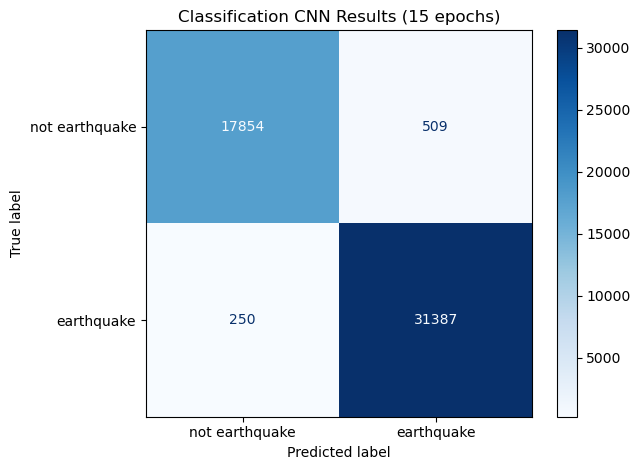

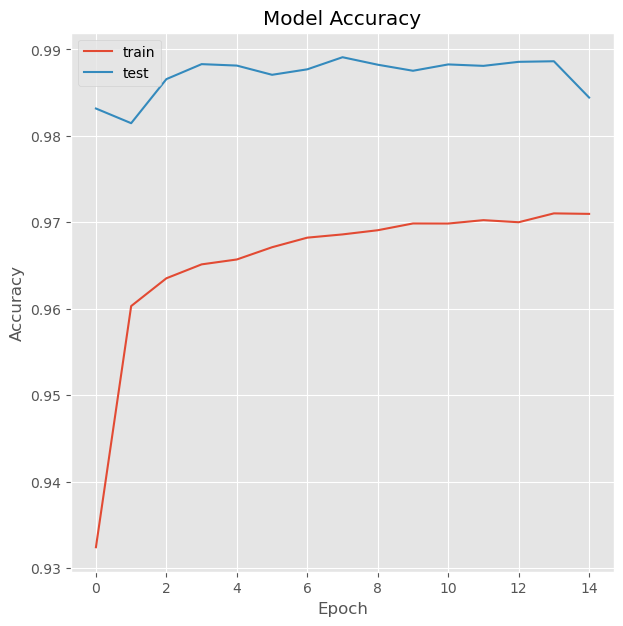

In [28]:
# Using the class for a classification CNN
sc = Seismic('classification','trace_category',200000,full_csv,dir) # initialize the class
sc.train_test_split(test_size=0.25,random_state=48) # train_test_split
sc.classification_cnn(15) # use the regression cnn method with 15 epochs with a target variable
sc.evaluate_classification_model() # evaluate the model

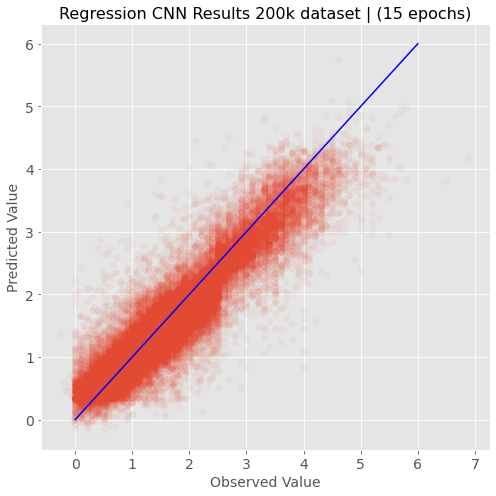

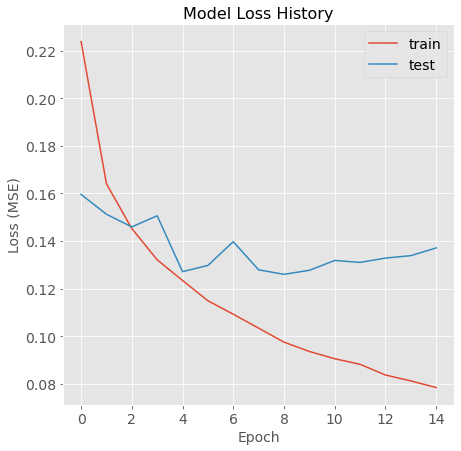

In [27]:
plt.style.use('ggplot')
fig, ax = plt.subplots(figsize=(7,7))
ax.scatter(s.test_labels,s.predicted,alpha=0.05)
point1 = [0,0]
point2 = [6,6]
xvalues = [point1[0], point2[0]]
yvalues = [point1[1], point2[1]]
ax.plot(xvalues,yvalues,color='blue')
ax.set_ylabel('Predicted Value',fontsize=14)
ax.set_xlabel('Observed Value',fontsize=14)
ax.set_title(f'Regression CNN Results 200k dataset | ({s.epochs} epochs)',fontsize=16)
ax.tick_params(axis='x', labelsize=14)
ax.tick_params(axis='y', labelsize=14)
plt.tight_layout()
plt.savefig('true_vs_predicted.png')
plt.show()

fig, ax = plt.subplots(figsize=(7,7))
ax.plot(s.history.history['loss'])
ax.plot(s.history.history['val_loss'])
ax.set_title('Model Loss History',fontsize=16)
ax.set_ylabel('Loss (MSE)',fontsize=14)
ax.set_xlabel('Epoch',fontsize=14)
ax.tick_params(axis='x', labelsize=14)
ax.tick_params(axis='y', labelsize=14)
ax.legend(['train','test'],fontsize=14)
plt.savefig('model_loss.png')
plt.show()

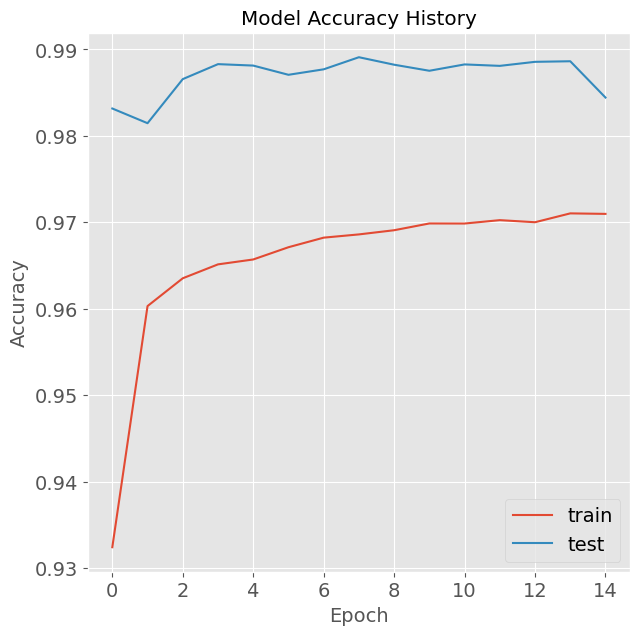

In [122]:
# plot accuracy history
plt.style.use('ggplot')
fig, ax = plt.subplots(figsize=(7,7))
ax.plot(sc.history.history['accuracy'],label='train')
ax.plot(sc.history.history['val_accuracy'],label='test')
ax.set_title('Model Accuracy',fontsize=14)
ax.set_ylabel('Accuracy',fontsize=14)
ax.set_xlabel('Epoch',fontsize=14)
ax.tick_params(axis='x', labelsize=14)
ax.tick_params(axis='y', labelsize=14)
ax.set_title('Model Accuracy History')
ax.legend(fontsize=14)
plt.savefig('model_accuracy.png')
plt.show()

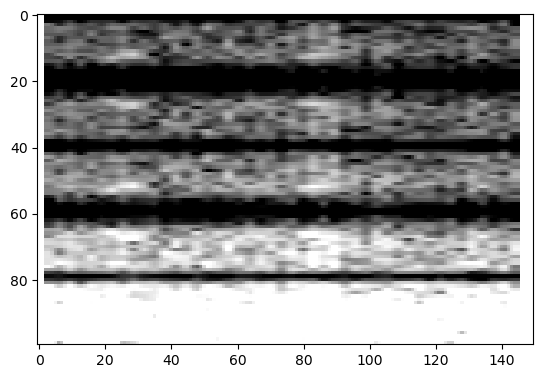

array([1.0000000e+00, 1.3598744e-22, 0.0000000e+00, 0.0000000e+00,
       0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
       0.0000000e+00, 0.0000000e+00], dtype=float32)

In [124]:
# plot the noise that the sc model was most confident was noise

eqs = []
eqs_probs = []
for i in range(0,len(sc.test_labels)):
    if (sc.test_labels[i] == 0) and (sc.predicted_classes[i] == 0): # earthquake that was labeled as noise
        eqs.append(sc.test_images[i])
        eqs_probs.append(sc.predicted_probs[i])
        
eq_list = list(eqs_probs)
eq_prob_list = [x[0] for x in eq_list]

plt.style.use('default')
arr = np.asarray(eqs[np.argmax(eq_prob_list)])
plt.imshow(arr, cmap='gray')
plt.show()  

eqs_probs[np.argmax(eq_prob_list)]

In [109]:
sc.img_dataset['trace_category'].value_counts()

earthquake_local    126657
noise                73343
Name: trace_category, dtype: int64

The number of all traces in the directory including noise is 630623
Working on trace # 1
Working on trace # 2
Working on trace # 3
Working on trace # 4
Working on trace # 5
Working on trace # 6
Working on trace # 7
Working on trace # 8
Working on trace # 9
Working on trace # 10
Working on trace # 11
Working on trace # 12
Working on trace # 13
Working on trace # 14
Working on trace # 15
Working on trace # 16
Working on trace # 17
Working on trace # 18
Working on trace # 19
Working on trace # 20
Working on trace # 21
Working on trace # 22
Working on trace # 23
Working on trace # 24
Working on trace # 25
Working on trace # 26
Working on trace # 27
Working on trace # 28
Working on trace # 29
Working on trace # 30
Working on trace # 31
Working on trace # 32
Working on trace # 33
Working on trace # 34
Working on trace # 35
Working on trace # 36
Working on trace # 37
Working on trace # 38
Working on trace # 39
Working on trace # 40
Working on trace # 41
Working on trace # 42
Working on trace 

Working on trace # 439
Working on trace # 440
Working on trace # 441
Working on trace # 442
Working on trace # 443
Working on trace # 444
Working on trace # 445
Working on trace # 446
Working on trace # 447
Working on trace # 448
Working on trace # 449
Working on trace # 450
Working on trace # 451
Working on trace # 452
Working on trace # 453
Working on trace # 454
Working on trace # 455
Working on trace # 456
Working on trace # 457
Working on trace # 458
Working on trace # 459
Working on trace # 460
Working on trace # 461
Working on trace # 462
Working on trace # 463
Working on trace # 464
Working on trace # 465
Working on trace # 466
Working on trace # 467
Working on trace # 468
Working on trace # 469
Working on trace # 470
Working on trace # 471
Working on trace # 472
Working on trace # 473
Working on trace # 474
Working on trace # 475
Working on trace # 476
Working on trace # 477
Working on trace # 478
Working on trace # 479
Working on trace # 480
Working on trace # 481
Working on 

Working on trace # 912
Working on trace # 913
Working on trace # 914
Working on trace # 915
Working on trace # 916
Working on trace # 917
Working on trace # 918
Working on trace # 919
Working on trace # 920
Working on trace # 921
Working on trace # 922
Working on trace # 923
Working on trace # 924
Working on trace # 925
Working on trace # 926
Working on trace # 927
Working on trace # 928
Working on trace # 929
Working on trace # 930
Working on trace # 931
Working on trace # 932
Working on trace # 933
Working on trace # 934
Working on trace # 935
Working on trace # 936
Working on trace # 937
Working on trace # 938
Working on trace # 939
Working on trace # 940
Working on trace # 941
Working on trace # 942
Working on trace # 943
Working on trace # 944
Working on trace # 945
Working on trace # 946
Working on trace # 947
Working on trace # 948
Working on trace # 949
Working on trace # 950
Working on trace # 951
Working on trace # 952
Working on trace # 953
Working on trace # 954
Working on 

Working on trace # 1375
Working on trace # 1376
Working on trace # 1377
Working on trace # 1378
Working on trace # 1379
Working on trace # 1380
Working on trace # 1381
Working on trace # 1382
Working on trace # 1383
Working on trace # 1384
Working on trace # 1385
Working on trace # 1386
Working on trace # 1387
Working on trace # 1388
Working on trace # 1389
Working on trace # 1390
Working on trace # 1391
Working on trace # 1392
Working on trace # 1393
Working on trace # 1394
Working on trace # 1395
Working on trace # 1396
Working on trace # 1397
Working on trace # 1398
Working on trace # 1399
Working on trace # 1400
Working on trace # 1401
Working on trace # 1402
Working on trace # 1403
Working on trace # 1404
Working on trace # 1405
Working on trace # 1406
Working on trace # 1407
Working on trace # 1408
Working on trace # 1409
Working on trace # 1410
Working on trace # 1411
Working on trace # 1412
Working on trace # 1413
Working on trace # 1414
Working on trace # 1415
Working on trace

Working on trace # 1839
Working on trace # 1840
Working on trace # 1841
Working on trace # 1842
Working on trace # 1843
Working on trace # 1844
Working on trace # 1845
Working on trace # 1846
Working on trace # 1847
Working on trace # 1848
Working on trace # 1849
Working on trace # 1850
Working on trace # 1851
Working on trace # 1852
Working on trace # 1853
Working on trace # 1854
Working on trace # 1855
Working on trace # 1856
Working on trace # 1857
Working on trace # 1858
Working on trace # 1859
Working on trace # 1860
Working on trace # 1861
Working on trace # 1862
Working on trace # 1863
Working on trace # 1864
Working on trace # 1865
Working on trace # 1866
Working on trace # 1867
Working on trace # 1868
Working on trace # 1869
Working on trace # 1870
Working on trace # 1871
Working on trace # 1872
Working on trace # 1873
Working on trace # 1874
Working on trace # 1875
Working on trace # 1876
Working on trace # 1877
Working on trace # 1878
Working on trace # 1879
Working on trace

Working on trace # 2302
Working on trace # 2303
Working on trace # 2304
Working on trace # 2305
Working on trace # 2306
Working on trace # 2307
Working on trace # 2308
Working on trace # 2309
Working on trace # 2310
Working on trace # 2311
Working on trace # 2312
Working on trace # 2313
Working on trace # 2314
Working on trace # 2315
Working on trace # 2316
Working on trace # 2317
Working on trace # 2318
Working on trace # 2319
Working on trace # 2320
Working on trace # 2321
Working on trace # 2322
Working on trace # 2323
Working on trace # 2324
Working on trace # 2325
Working on trace # 2326
Working on trace # 2327
Working on trace # 2328
Working on trace # 2329
Working on trace # 2330
Working on trace # 2331
Working on trace # 2332
Working on trace # 2333
Working on trace # 2334
Working on trace # 2335
Working on trace # 2336
Working on trace # 2337
Working on trace # 2338
Working on trace # 2339
Working on trace # 2340
Working on trace # 2341
Working on trace # 2342
Working on trace

Working on trace # 2761
Working on trace # 2762
Working on trace # 2763
Working on trace # 2764
Working on trace # 2765
Working on trace # 2766
Working on trace # 2767
Working on trace # 2768
Working on trace # 2769
Working on trace # 2770
Working on trace # 2771
Working on trace # 2772
Working on trace # 2773
Working on trace # 2774
Working on trace # 2775
Working on trace # 2776
Working on trace # 2777
Working on trace # 2778
Working on trace # 2779
Working on trace # 2780
Working on trace # 2781
Working on trace # 2782
Working on trace # 2783
Working on trace # 2784
Working on trace # 2785
Working on trace # 2786
Working on trace # 2787
Working on trace # 2788
Working on trace # 2789
Working on trace # 2790
Working on trace # 2791
Working on trace # 2792
Working on trace # 2793
Working on trace # 2794
Working on trace # 2795
Working on trace # 2796
Working on trace # 2797
Working on trace # 2798
Working on trace # 2799
Working on trace # 2800
Working on trace # 2801
Working on trace

Working on trace # 3238
Working on trace # 3239
Working on trace # 3240
Working on trace # 3241
Working on trace # 3242
Working on trace # 3243
Working on trace # 3244
Working on trace # 3245
Working on trace # 3246
Working on trace # 3247
Working on trace # 3248
Working on trace # 3249
Working on trace # 3250
Working on trace # 3251
Working on trace # 3252
Working on trace # 3253
Working on trace # 3254
Working on trace # 3255
Working on trace # 3256
Working on trace # 3257
Working on trace # 3258
Working on trace # 3259
Working on trace # 3260
Working on trace # 3261
Working on trace # 3262
Working on trace # 3263
Working on trace # 3264
Working on trace # 3265
Working on trace # 3266
Working on trace # 3267
Working on trace # 3268
Working on trace # 3269
Working on trace # 3270
Working on trace # 3271
Working on trace # 3272
Working on trace # 3273
Working on trace # 3274
Working on trace # 3275
Working on trace # 3276
Working on trace # 3277
Working on trace # 3278
Working on trace

Working on trace # 3736
Working on trace # 3737
Working on trace # 3738
Working on trace # 3739
Working on trace # 3740
Working on trace # 3741
Working on trace # 3742
Working on trace # 3743
Working on trace # 3744
Working on trace # 3745
Working on trace # 3746
Working on trace # 3747
Working on trace # 3748
Working on trace # 3749
Working on trace # 3750
Working on trace # 3751
Working on trace # 3752
Working on trace # 3753
Working on trace # 3754
Working on trace # 3755
Working on trace # 3756
Working on trace # 3757
Working on trace # 3758
Working on trace # 3759
Working on trace # 3760
Working on trace # 3761
Working on trace # 3762
Working on trace # 3763
Working on trace # 3764
Working on trace # 3765
Working on trace # 3766
Working on trace # 3767
Working on trace # 3768
Working on trace # 3769
Working on trace # 3770
Working on trace # 3771
Working on trace # 3772
Working on trace # 3773
Working on trace # 3774
Working on trace # 3775
Working on trace # 3776
Working on trace

Working on trace # 4244
Working on trace # 4245
Working on trace # 4246
Working on trace # 4247
Working on trace # 4248
Working on trace # 4249
Working on trace # 4250
Working on trace # 4251
Working on trace # 4252
Working on trace # 4253
Working on trace # 4254
Working on trace # 4255
Working on trace # 4256
Working on trace # 4257
Working on trace # 4258
Working on trace # 4259
Working on trace # 4260
Working on trace # 4261
Working on trace # 4262
Working on trace # 4263
Working on trace # 4264
Working on trace # 4265
Working on trace # 4266
Working on trace # 4267
Working on trace # 4268
Working on trace # 4269
Working on trace # 4270
Working on trace # 4271
Working on trace # 4272
Working on trace # 4273
Working on trace # 4274
Working on trace # 4275
Working on trace # 4276
Working on trace # 4277
Working on trace # 4278
Working on trace # 4279
Working on trace # 4280
Working on trace # 4281
Working on trace # 4282
Working on trace # 4283
Working on trace # 4284
Working on trace

Working on trace # 4740
Working on trace # 4741
Working on trace # 4742
Working on trace # 4743
Working on trace # 4744
Working on trace # 4745
Working on trace # 4746
Working on trace # 4747
Working on trace # 4748
Working on trace # 4749
Working on trace # 4750
Working on trace # 4751
Working on trace # 4752
Working on trace # 4753
Working on trace # 4754
Working on trace # 4755
Working on trace # 4756
Working on trace # 4757
Working on trace # 4758
Working on trace # 4759
Working on trace # 4760
Working on trace # 4761
Working on trace # 4762
Working on trace # 4763
Working on trace # 4764
Working on trace # 4765
Working on trace # 4766
Working on trace # 4767
Working on trace # 4768
Working on trace # 4769
Working on trace # 4770
Working on trace # 4771
Working on trace # 4772
Working on trace # 4773
Working on trace # 4774
Working on trace # 4775
Working on trace # 4776
Working on trace # 4777
Working on trace # 4778
Working on trace # 4779
Working on trace # 4780
Working on trace

Working on trace # 5213
Working on trace # 5214
Working on trace # 5215
Working on trace # 5216
Working on trace # 5217
Working on trace # 5218
Working on trace # 5219
Working on trace # 5220
Working on trace # 5221
Working on trace # 5222
Working on trace # 5223
Working on trace # 5224
Working on trace # 5225
Working on trace # 5226
Working on trace # 5227
Working on trace # 5228
Working on trace # 5229
Working on trace # 5230
Working on trace # 5231
Working on trace # 5232
Working on trace # 5233
Working on trace # 5234
Working on trace # 5235
Working on trace # 5236
Working on trace # 5237
Working on trace # 5238
Working on trace # 5239
Working on trace # 5240
Working on trace # 5241
Working on trace # 5242
Working on trace # 5243
Working on trace # 5244
Working on trace # 5245
Working on trace # 5246
Working on trace # 5247
Working on trace # 5248
Working on trace # 5249
Working on trace # 5250
Working on trace # 5251
Working on trace # 5252
Working on trace # 5253
Working on trace

Working on trace # 5704
Working on trace # 5705
Working on trace # 5706
Working on trace # 5707
Working on trace # 5708
Working on trace # 5709
Working on trace # 5710
Working on trace # 5711
Working on trace # 5712
Working on trace # 5713
Working on trace # 5714
Working on trace # 5715
Working on trace # 5716
Working on trace # 5717
Working on trace # 5718
Working on trace # 5719
Working on trace # 5720
Working on trace # 5721
Working on trace # 5722
Working on trace # 5723
Working on trace # 5724
Working on trace # 5725
Working on trace # 5726
Working on trace # 5727
Working on trace # 5728
Working on trace # 5729
Working on trace # 5730
Working on trace # 5731
Working on trace # 5732
Working on trace # 5733
Working on trace # 5734
Working on trace # 5735
Working on trace # 5736
Working on trace # 5737
Working on trace # 5738
Working on trace # 5739
Working on trace # 5740
Working on trace # 5741
Working on trace # 5742
Working on trace # 5743
Working on trace # 5744
Working on trace

Working on trace # 6163
Working on trace # 6164
Working on trace # 6165
Working on trace # 6166
Working on trace # 6167
Working on trace # 6168
Working on trace # 6169
Working on trace # 6170
Working on trace # 6171
Working on trace # 6172
Working on trace # 6173
Working on trace # 6174
Working on trace # 6175
Working on trace # 6176
Working on trace # 6177
Working on trace # 6178
Working on trace # 6179
Working on trace # 6180
Working on trace # 6181
Working on trace # 6182
Working on trace # 6183
Working on trace # 6184
Working on trace # 6185
Working on trace # 6186
Working on trace # 6187
Working on trace # 6188
Working on trace # 6189
Working on trace # 6190
Working on trace # 6191
Working on trace # 6192
Working on trace # 6193
Working on trace # 6194
Working on trace # 6195
Working on trace # 6196
Working on trace # 6197
Working on trace # 6198
Working on trace # 6199
Working on trace # 6200
Working on trace # 6201
Working on trace # 6202
Working on trace # 6203
Working on trace

Working on trace # 6603
Working on trace # 6604
Working on trace # 6605
Working on trace # 6606
Working on trace # 6607
Working on trace # 6608
Working on trace # 6609
Working on trace # 6610
Working on trace # 6611
Working on trace # 6612
Working on trace # 6613
Working on trace # 6614
Working on trace # 6615
Working on trace # 6616
Working on trace # 6617
Working on trace # 6618
Working on trace # 6619
Working on trace # 6620
Working on trace # 6621
Working on trace # 6622
Working on trace # 6623
Working on trace # 6624
Working on trace # 6625
Working on trace # 6626
Working on trace # 6627
Working on trace # 6628
Working on trace # 6629
Working on trace # 6630
Working on trace # 6631
Working on trace # 6632
Working on trace # 6633
Working on trace # 6634
Working on trace # 6635
Working on trace # 6636
Working on trace # 6637
Working on trace # 6638
Working on trace # 6639
Working on trace # 6640
Working on trace # 6641
Working on trace # 6642
Working on trace # 6643
Working on trace

Working on trace # 7042
Working on trace # 7043
Working on trace # 7044
Working on trace # 7045
Working on trace # 7046
Working on trace # 7047
Working on trace # 7048
Working on trace # 7049
Working on trace # 7050
Working on trace # 7051
Working on trace # 7052
Working on trace # 7053
Working on trace # 7054
Working on trace # 7055
Working on trace # 7056
Working on trace # 7057
Working on trace # 7058
Working on trace # 7059
Working on trace # 7060
Working on trace # 7061
Working on trace # 7062
Working on trace # 7063
Working on trace # 7064
Working on trace # 7065
Working on trace # 7066
Working on trace # 7067
Working on trace # 7068
Working on trace # 7069
Working on trace # 7070
Working on trace # 7071
Working on trace # 7072
Working on trace # 7073
Working on trace # 7074
Working on trace # 7075
Working on trace # 7076
Working on trace # 7077
Working on trace # 7078
Working on trace # 7079
Working on trace # 7080
Working on trace # 7081
Working on trace # 7082
Working on trace

Working on trace # 7487
Working on trace # 7488
Working on trace # 7489
Working on trace # 7490
Working on trace # 7491
Working on trace # 7492
Working on trace # 7493
Working on trace # 7494
Working on trace # 7495
Working on trace # 7496
Working on trace # 7497
Working on trace # 7498
Working on trace # 7499
Working on trace # 7500
Working on trace # 7501
Working on trace # 7502
Working on trace # 7503
Working on trace # 7504
Working on trace # 7505
Working on trace # 7506
Working on trace # 7507
Working on trace # 7508
Working on trace # 7509
Working on trace # 7510
Working on trace # 7511
Working on trace # 7512
Working on trace # 7513
Working on trace # 7514
Working on trace # 7515
Working on trace # 7516
Working on trace # 7517
Working on trace # 7518
Working on trace # 7519
Working on trace # 7520
Working on trace # 7521
Working on trace # 7522
Working on trace # 7523
Working on trace # 7524
Working on trace # 7525
Working on trace # 7526
Working on trace # 7527
Working on trace

Working on trace # 7942
Working on trace # 7943
Working on trace # 7944
Working on trace # 7945
Working on trace # 7946
Working on trace # 7947
Working on trace # 7948
Working on trace # 7949
Working on trace # 7950
Working on trace # 7951
Working on trace # 7952
Working on trace # 7953
Working on trace # 7954
Working on trace # 7955
Working on trace # 7956
Working on trace # 7957
Working on trace # 7958
Working on trace # 7959
Working on trace # 7960
Working on trace # 7961
Working on trace # 7962
Working on trace # 7963
Working on trace # 7964
Working on trace # 7965
Working on trace # 7966
Working on trace # 7967
Working on trace # 7968
Working on trace # 7969
Working on trace # 7970
Working on trace # 7971
Working on trace # 7972
Working on trace # 7973
Working on trace # 7974
Working on trace # 7975
Working on trace # 7976
Working on trace # 7977
Working on trace # 7978
Working on trace # 7979
Working on trace # 7980
Working on trace # 7981
Working on trace # 7982
Working on trace

Working on trace # 8398
Working on trace # 8399
Working on trace # 8400
Working on trace # 8401
Working on trace # 8402
Working on trace # 8403
Working on trace # 8404
Working on trace # 8405
Working on trace # 8406
Working on trace # 8407
Working on trace # 8408
Working on trace # 8409
Working on trace # 8410
Working on trace # 8411
Working on trace # 8412
Working on trace # 8413
Working on trace # 8414
Working on trace # 8415
Working on trace # 8416
Working on trace # 8417
Working on trace # 8418
Working on trace # 8419
Working on trace # 8420
Working on trace # 8421
Working on trace # 8422
Working on trace # 8423
Working on trace # 8424
Working on trace # 8425
Working on trace # 8426
Working on trace # 8427
Working on trace # 8428
Working on trace # 8429
Working on trace # 8430
Working on trace # 8431
Working on trace # 8432
Working on trace # 8433
Working on trace # 8434
Working on trace # 8435
Working on trace # 8436
Working on trace # 8437
Working on trace # 8438
Working on trace

Working on trace # 8858
Working on trace # 8859
Working on trace # 8860
Working on trace # 8861
Working on trace # 8862
Working on trace # 8863
Working on trace # 8864
Working on trace # 8865
Working on trace # 8866
Working on trace # 8867
Working on trace # 8868
Working on trace # 8869
Working on trace # 8870
Working on trace # 8871
Working on trace # 8872
Working on trace # 8873
Working on trace # 8874
Working on trace # 8875
Working on trace # 8876
Working on trace # 8877
Working on trace # 8878
Working on trace # 8879
Working on trace # 8880
Working on trace # 8881
Working on trace # 8882
Working on trace # 8883
Working on trace # 8884
Working on trace # 8885
Working on trace # 8886
Working on trace # 8887
Working on trace # 8888
Working on trace # 8889
Working on trace # 8890
Working on trace # 8891
Working on trace # 8892
Working on trace # 8893
Working on trace # 8894
Working on trace # 8895
Working on trace # 8896
Working on trace # 8897
Working on trace # 8898
Working on trace

Working on trace # 9336
Working on trace # 9337
Working on trace # 9338
Working on trace # 9339
Working on trace # 9340
Working on trace # 9341
Working on trace # 9342
Working on trace # 9343
Working on trace # 9344
Working on trace # 9345
Working on trace # 9346
Working on trace # 9347
Working on trace # 9348
Working on trace # 9349
Working on trace # 9350
Working on trace # 9351
Working on trace # 9352
Working on trace # 9353
Working on trace # 9354
Working on trace # 9355
Working on trace # 9356
Working on trace # 9357
Working on trace # 9358
Working on trace # 9359
Working on trace # 9360
Working on trace # 9361
Working on trace # 9362
Working on trace # 9363
Working on trace # 9364
Working on trace # 9365
Working on trace # 9366
Working on trace # 9367
Working on trace # 9368
Working on trace # 9369
Working on trace # 9370
Working on trace # 9371
Working on trace # 9372
Working on trace # 9373
Working on trace # 9374
Working on trace # 9375
Working on trace # 9376
Working on trace

Working on trace # 9817
Working on trace # 9818
Working on trace # 9819
Working on trace # 9820
Working on trace # 9821
Working on trace # 9822
Working on trace # 9823
Working on trace # 9824
Working on trace # 9825
Working on trace # 9826
Working on trace # 9827
Working on trace # 9828
Working on trace # 9829
Working on trace # 9830
Working on trace # 9831
Working on trace # 9832
Working on trace # 9833
Working on trace # 9834
Working on trace # 9835
Working on trace # 9836
Working on trace # 9837
Working on trace # 9838
Working on trace # 9839
Working on trace # 9840
Working on trace # 9841
Working on trace # 9842
Working on trace # 9843
Working on trace # 9844
Working on trace # 9845
Working on trace # 9846
Working on trace # 9847
Working on trace # 9848
Working on trace # 9849
Working on trace # 9850
Working on trace # 9851
Working on trace # 9852
Working on trace # 9853
Working on trace # 9854
Working on trace # 9855
Working on trace # 9856
Working on trace # 9857
Working on trace

Working on trace # 10324
Working on trace # 10325
Working on trace # 10326
Working on trace # 10327
Working on trace # 10328
Working on trace # 10329
Working on trace # 10330
Working on trace # 10331
Working on trace # 10332
Working on trace # 10333
Working on trace # 10334
Working on trace # 10335
Working on trace # 10336
Working on trace # 10337
Working on trace # 10338
Working on trace # 10339
Working on trace # 10340
Working on trace # 10341
Working on trace # 10342
Working on trace # 10343
Working on trace # 10344
Working on trace # 10345
Working on trace # 10346
Working on trace # 10347
Working on trace # 10348
Working on trace # 10349
Working on trace # 10350
Working on trace # 10351
Working on trace # 10352
Working on trace # 10353
Working on trace # 10354
Working on trace # 10355
Working on trace # 10356
Working on trace # 10357
Working on trace # 10358
Working on trace # 10359
Working on trace # 10360
Working on trace # 10361
Working on trace # 10362
Working on trace # 10363


Working on trace # 10799
Working on trace # 10800
Working on trace # 10801
Working on trace # 10802
Working on trace # 10803
Working on trace # 10804
Working on trace # 10805
Working on trace # 10806
Working on trace # 10807
Working on trace # 10808
Working on trace # 10809
Working on trace # 10810
Working on trace # 10811
Working on trace # 10812
Working on trace # 10813
Working on trace # 10814
Working on trace # 10815
Working on trace # 10816
Working on trace # 10817
Working on trace # 10818
Working on trace # 10819
Working on trace # 10820
Working on trace # 10821
Working on trace # 10822
Working on trace # 10823
Working on trace # 10824
Working on trace # 10825
Working on trace # 10826
Working on trace # 10827
Working on trace # 10828
Working on trace # 10829
Working on trace # 10830
Working on trace # 10831
Working on trace # 10832
Working on trace # 10833
Working on trace # 10834
Working on trace # 10835
Working on trace # 10836
Working on trace # 10837
Working on trace # 10838


Working on trace # 11151
Working on trace # 11152
Working on trace # 11153
Working on trace # 11154
Working on trace # 11155
Working on trace # 11156
Working on trace # 11157
Working on trace # 11158
Working on trace # 11159
Working on trace # 11160
Working on trace # 11161
Working on trace # 11162
Working on trace # 11163
Working on trace # 11164
Working on trace # 11165
Working on trace # 11166
Working on trace # 11167
Working on trace # 11168
Working on trace # 11169
Working on trace # 11170
Working on trace # 11171
Working on trace # 11172
Working on trace # 11173
Working on trace # 11174
Working on trace # 11175
Working on trace # 11176
Working on trace # 11177
Working on trace # 11178
Working on trace # 11179
Working on trace # 11180
Working on trace # 11181
Working on trace # 11182
Working on trace # 11183
Working on trace # 11184
Working on trace # 11185
Working on trace # 11186
Working on trace # 11187
Working on trace # 11188
Working on trace # 11189
Working on trace # 11190


Working on trace # 11484
Working on trace # 11485
Working on trace # 11486
Working on trace # 11487
Working on trace # 11488
Working on trace # 11489
Working on trace # 11490
Working on trace # 11491
Working on trace # 11492
Working on trace # 11493
Working on trace # 11494
Working on trace # 11495
Working on trace # 11496
Working on trace # 11497
Working on trace # 11498
Working on trace # 11499
Working on trace # 11500
Working on trace # 11501
Working on trace # 11502
Working on trace # 11503
Working on trace # 11504
Working on trace # 11505
Working on trace # 11506
Working on trace # 11507
Working on trace # 11508
Working on trace # 11509
Working on trace # 11510
Working on trace # 11511
Working on trace # 11512
Working on trace # 11513
Working on trace # 11514
Working on trace # 11515
Working on trace # 11516
Working on trace # 11517
Working on trace # 11518
Working on trace # 11519
Working on trace # 11520
Working on trace # 11521
Working on trace # 11522
Working on trace # 11523


Working on trace # 11825
Working on trace # 11826
Working on trace # 11827
Working on trace # 11828
Working on trace # 11829
Working on trace # 11830
Working on trace # 11831
Working on trace # 11832
Working on trace # 11833
Working on trace # 11834
Working on trace # 11835
Working on trace # 11836
Working on trace # 11837
Working on trace # 11838
Working on trace # 11839
Working on trace # 11840
Working on trace # 11841
Working on trace # 11842
Working on trace # 11843
Working on trace # 11844
Working on trace # 11845
Working on trace # 11846
Working on trace # 11847
Working on trace # 11848
Working on trace # 11849
Working on trace # 11850
Working on trace # 11851
Working on trace # 11852
Working on trace # 11853
Working on trace # 11854
Working on trace # 11855
Working on trace # 11856
Working on trace # 11857
Working on trace # 11858
Working on trace # 11859
Working on trace # 11860
Working on trace # 11861
Working on trace # 11862
Working on trace # 11863
Working on trace # 11864


Working on trace # 12284
Working on trace # 12285
Working on trace # 12286
Working on trace # 12287
Working on trace # 12288
Working on trace # 12289
Working on trace # 12290
Working on trace # 12291
Working on trace # 12292
Working on trace # 12293
Working on trace # 12294
Working on trace # 12295
Working on trace # 12296
Working on trace # 12297
Working on trace # 12298
Working on trace # 12299
Working on trace # 12300
Working on trace # 12301
Working on trace # 12302
Working on trace # 12303
Working on trace # 12304
Working on trace # 12305
Working on trace # 12306
Working on trace # 12307
Working on trace # 12308
Working on trace # 12309
Working on trace # 12310
Working on trace # 12311
Working on trace # 12312
Working on trace # 12313
Working on trace # 12314
Working on trace # 12315
Working on trace # 12316
Working on trace # 12317
Working on trace # 12318
Working on trace # 12319
Working on trace # 12320
Working on trace # 12321
Working on trace # 12322
Working on trace # 12323


Working on trace # 12704
Working on trace # 12705
Working on trace # 12706
Working on trace # 12707
Working on trace # 12708
Working on trace # 12709
Working on trace # 12710
Working on trace # 12711
Working on trace # 12712
Working on trace # 12713
Working on trace # 12714
Working on trace # 12715
Working on trace # 12716
Working on trace # 12717
Working on trace # 12718
Working on trace # 12719
Working on trace # 12720
Working on trace # 12721
Working on trace # 12722
Working on trace # 12723
Working on trace # 12724
Working on trace # 12725
Working on trace # 12726
Working on trace # 12727
Working on trace # 12728
Working on trace # 12729
Working on trace # 12730
Working on trace # 12731
Working on trace # 12732
Working on trace # 12733
Working on trace # 12734
Working on trace # 12735
Working on trace # 12736
Working on trace # 12737
Working on trace # 12738
Working on trace # 12739
Working on trace # 12740
Working on trace # 12741
Working on trace # 12742
Working on trace # 12743


Working on trace # 13167
Working on trace # 13168
Working on trace # 13169
Working on trace # 13170
Working on trace # 13171
Working on trace # 13172
Working on trace # 13173
Working on trace # 13174
Working on trace # 13175
Working on trace # 13176
Working on trace # 13177
Working on trace # 13178
Working on trace # 13179
Working on trace # 13180
Working on trace # 13181
Working on trace # 13182
Working on trace # 13183
Working on trace # 13184
Working on trace # 13185
Working on trace # 13186
Working on trace # 13187
Working on trace # 13188
Working on trace # 13189
Working on trace # 13190
Working on trace # 13191
Working on trace # 13192
Working on trace # 13193
Working on trace # 13194
Working on trace # 13195
Working on trace # 13196
Working on trace # 13197
Working on trace # 13198
Working on trace # 13199
Working on trace # 13200
Working on trace # 13201
Working on trace # 13202
Working on trace # 13203
Working on trace # 13204
Working on trace # 13205
Working on trace # 13206


Working on trace # 13614
Working on trace # 13615
Working on trace # 13616
Working on trace # 13617
Working on trace # 13618
Working on trace # 13619
Working on trace # 13620
Working on trace # 13621
Working on trace # 13622
Working on trace # 13623
Working on trace # 13624
Working on trace # 13625
Working on trace # 13626
Working on trace # 13627
Working on trace # 13628
Working on trace # 13629
Working on trace # 13630
Working on trace # 13631
Working on trace # 13632
Working on trace # 13633
Working on trace # 13634
Working on trace # 13635
Working on trace # 13636
Working on trace # 13637
Working on trace # 13638
Working on trace # 13639
Working on trace # 13640
Working on trace # 13641
Working on trace # 13642
Working on trace # 13643
Working on trace # 13644
Working on trace # 13645
Working on trace # 13646
Working on trace # 13647
Working on trace # 13648
Working on trace # 13649
Working on trace # 13650
Working on trace # 13651
Working on trace # 13652
Working on trace # 13653


Working on trace # 14076
Working on trace # 14077
Working on trace # 14078
Working on trace # 14079
Working on trace # 14080
Working on trace # 14081
Working on trace # 14082
Working on trace # 14083
Working on trace # 14084
Working on trace # 14085
Working on trace # 14086
Working on trace # 14087
Working on trace # 14088
Working on trace # 14089
Working on trace # 14090
Working on trace # 14091
Working on trace # 14092
Working on trace # 14093
Working on trace # 14094
Working on trace # 14095
Working on trace # 14096
Working on trace # 14097
Working on trace # 14098
Working on trace # 14099
Working on trace # 14100
Working on trace # 14101
Working on trace # 14102
Working on trace # 14103
Working on trace # 14104
Working on trace # 14105
Working on trace # 14106
Working on trace # 14107
Working on trace # 14108
Working on trace # 14109
Working on trace # 14110
Working on trace # 14111
Working on trace # 14112
Working on trace # 14113
Working on trace # 14114
Working on trace # 14115


Working on trace # 14544
Working on trace # 14545
Working on trace # 14546
Working on trace # 14547
Working on trace # 14548
Working on trace # 14549
Working on trace # 14550
Working on trace # 14551
Working on trace # 14552
Working on trace # 14553
Working on trace # 14554
Working on trace # 14555
Working on trace # 14556
Working on trace # 14557
Working on trace # 14558
Working on trace # 14559
Working on trace # 14560
Working on trace # 14561
Working on trace # 14562
Working on trace # 14563
Working on trace # 14564
Working on trace # 14565
Working on trace # 14566
Working on trace # 14567
Working on trace # 14568
Working on trace # 14569
Working on trace # 14570
Working on trace # 14571
Working on trace # 14572
Working on trace # 14573
Working on trace # 14574
Working on trace # 14575
Working on trace # 14576
Working on trace # 14577
Working on trace # 14578
Working on trace # 14579
Working on trace # 14580
Working on trace # 14581
Working on trace # 14582
Working on trace # 14583


Working on trace # 14971
Working on trace # 14972
Working on trace # 14973
Working on trace # 14974
Working on trace # 14975
Working on trace # 14976
Working on trace # 14977
Working on trace # 14978
Working on trace # 14979
Working on trace # 14980
Working on trace # 14981
Working on trace # 14982
Working on trace # 14983
Working on trace # 14984
Working on trace # 14985
Working on trace # 14986
Working on trace # 14987
Working on trace # 14988
Working on trace # 14989
Working on trace # 14990
Working on trace # 14991
Working on trace # 14992
Working on trace # 14993
Working on trace # 14994
Working on trace # 14995
Working on trace # 14996
Working on trace # 14997
Working on trace # 14998
Working on trace # 14999
Working on trace # 15000
Working on trace # 15001
Working on trace # 15002
Working on trace # 15003
Working on trace # 15004
Working on trace # 15005
Working on trace # 15006
Working on trace # 15007
Working on trace # 15008
Working on trace # 15009
Working on trace # 15010


Working on trace # 15360
Working on trace # 15361
Working on trace # 15362
Working on trace # 15363
Working on trace # 15364
Working on trace # 15365
Working on trace # 15366
Working on trace # 15367
Working on trace # 15368
Working on trace # 15369
Working on trace # 15370
Working on trace # 15371
Working on trace # 15372
Working on trace # 15373
Working on trace # 15374
Working on trace # 15375
Working on trace # 15376
Working on trace # 15377
Working on trace # 15378
Working on trace # 15379
Working on trace # 15380
Working on trace # 15381
Working on trace # 15382
Working on trace # 15383
Working on trace # 15384
Working on trace # 15385
Working on trace # 15386
Working on trace # 15387
Working on trace # 15388
Working on trace # 15389
Working on trace # 15390
Working on trace # 15391
Working on trace # 15392
Working on trace # 15393
Working on trace # 15394
Working on trace # 15395
Working on trace # 15396
Working on trace # 15397
Working on trace # 15398
Working on trace # 15399


Working on trace # 15750
Working on trace # 15751
Working on trace # 15752
Working on trace # 15753
Working on trace # 15754
Working on trace # 15755
Working on trace # 15756
Working on trace # 15757
Working on trace # 15758
Working on trace # 15759
Working on trace # 15760
Working on trace # 15761
Working on trace # 15762
Working on trace # 15763
Working on trace # 15764
Working on trace # 15765
Working on trace # 15766
Working on trace # 15767
Working on trace # 15768
Working on trace # 15769
Working on trace # 15770
Working on trace # 15771
Working on trace # 15772
Working on trace # 15773
Working on trace # 15774
Working on trace # 15775
Working on trace # 15776
Working on trace # 15777
Working on trace # 15778
Working on trace # 15779
Working on trace # 15780
Working on trace # 15781
Working on trace # 15782
Working on trace # 15783
Working on trace # 15784
Working on trace # 15785
Working on trace # 15786
Working on trace # 15787
Working on trace # 15788
Working on trace # 15789


Working on trace # 16113
Working on trace # 16114
Working on trace # 16115
Working on trace # 16116
Working on trace # 16117
Working on trace # 16118
Working on trace # 16119
Working on trace # 16120
Working on trace # 16121
Working on trace # 16122
Working on trace # 16123
Working on trace # 16124
Working on trace # 16125
Working on trace # 16126
Working on trace # 16127
Working on trace # 16128
Working on trace # 16129
Working on trace # 16130
Working on trace # 16131
Working on trace # 16132
Working on trace # 16133
Working on trace # 16134
Working on trace # 16135
Working on trace # 16136
Working on trace # 16137
Working on trace # 16138
Working on trace # 16139
Working on trace # 16140
Working on trace # 16141
Working on trace # 16142
Working on trace # 16143
Working on trace # 16144
Working on trace # 16145
Working on trace # 16146
Working on trace # 16147
Working on trace # 16148
Working on trace # 16149
Working on trace # 16150
Working on trace # 16151
Working on trace # 16152


Working on trace # 16541
Working on trace # 16542
Working on trace # 16543
Working on trace # 16544
Working on trace # 16545
Working on trace # 16546
Working on trace # 16547
Working on trace # 16548
Working on trace # 16549
Working on trace # 16550
Working on trace # 16551
Working on trace # 16552
Working on trace # 16553
Working on trace # 16554
Working on trace # 16555
Working on trace # 16556
Working on trace # 16557
Working on trace # 16558
Working on trace # 16559
Working on trace # 16560
Working on trace # 16561
Working on trace # 16562
Working on trace # 16563
Working on trace # 16564
Working on trace # 16565
Working on trace # 16566
Working on trace # 16567
Working on trace # 16568
Working on trace # 16569
Working on trace # 16570
Working on trace # 16571
Working on trace # 16572
Working on trace # 16573
Working on trace # 16574
Working on trace # 16575
Working on trace # 16576
Working on trace # 16577
Working on trace # 16578
Working on trace # 16579
Working on trace # 16580


Working on trace # 16988
Working on trace # 16989
Working on trace # 16990
Working on trace # 16991
Working on trace # 16992
Working on trace # 16993
Working on trace # 16994
Working on trace # 16995
Working on trace # 16996
Working on trace # 16997
Working on trace # 16998
Working on trace # 16999
Working on trace # 17000
Working on trace # 17001
Working on trace # 17002
Working on trace # 17003
Working on trace # 17004
Working on trace # 17005
Working on trace # 17006
Working on trace # 17007
Working on trace # 17008
Working on trace # 17009
Working on trace # 17010
Working on trace # 17011
Working on trace # 17012
Working on trace # 17013
Working on trace # 17014
Working on trace # 17015
Working on trace # 17016
Working on trace # 17017
Working on trace # 17018
Working on trace # 17019
Working on trace # 17020
Working on trace # 17021
Working on trace # 17022
Working on trace # 17023
Working on trace # 17024
Working on trace # 17025
Working on trace # 17026
Working on trace # 17027


Working on trace # 17492
Working on trace # 17493
Working on trace # 17494
Working on trace # 17495
Working on trace # 17496
Working on trace # 17497
Working on trace # 17498
Working on trace # 17499
Working on trace # 17500
Working on trace # 17501
Working on trace # 17502
Working on trace # 17503
Working on trace # 17504
Working on trace # 17505
Working on trace # 17506
Working on trace # 17507
Working on trace # 17508
Working on trace # 17509
Working on trace # 17510
Working on trace # 17511
Working on trace # 17512
Working on trace # 17513
Working on trace # 17514
Working on trace # 17515
Working on trace # 17516
Working on trace # 17517
Working on trace # 17518
Working on trace # 17519
Working on trace # 17520
Working on trace # 17521
Working on trace # 17522
Working on trace # 17523
Working on trace # 17524
Working on trace # 17525
Working on trace # 17526
Working on trace # 17527
Working on trace # 17528
Working on trace # 17529
Working on trace # 17530
Working on trace # 17531


Working on trace # 17977
Working on trace # 17978
Working on trace # 17979
Working on trace # 17980
Working on trace # 17981
Working on trace # 17982
Working on trace # 17983
Working on trace # 17984
Working on trace # 17985
Working on trace # 17986
Working on trace # 17987
Working on trace # 17988
Working on trace # 17989
Working on trace # 17990
Working on trace # 17991
Working on trace # 17992
Working on trace # 17993
Working on trace # 17994
Working on trace # 17995
Working on trace # 17996
Working on trace # 17997
Working on trace # 17998
Working on trace # 17999
Working on trace # 18000
Working on trace # 18001
Working on trace # 18002
Working on trace # 18003
Working on trace # 18004
Working on trace # 18005
Working on trace # 18006
Working on trace # 18007
Working on trace # 18008
Working on trace # 18009
Working on trace # 18010
Working on trace # 18011
Working on trace # 18012
Working on trace # 18013
Working on trace # 18014
Working on trace # 18015
Working on trace # 18016


Working on trace # 18392
Working on trace # 18393
Working on trace # 18394
Working on trace # 18395
Working on trace # 18396
Working on trace # 18397
Working on trace # 18398
Working on trace # 18399
Working on trace # 18400
Working on trace # 18401
Working on trace # 18402
Working on trace # 18403
Working on trace # 18404
Working on trace # 18405
Working on trace # 18406
Working on trace # 18407
Working on trace # 18408
Working on trace # 18409
Working on trace # 18410
Working on trace # 18411
Working on trace # 18412
Working on trace # 18413
Working on trace # 18414
Working on trace # 18415
Working on trace # 18416
Working on trace # 18417
Working on trace # 18418
Working on trace # 18419
Working on trace # 18420
Working on trace # 18421
Working on trace # 18422
Working on trace # 18423
Working on trace # 18424
Working on trace # 18425
Working on trace # 18426
Working on trace # 18427
Working on trace # 18428
Working on trace # 18429
Working on trace # 18430
Working on trace # 18431


Working on trace # 18814
Working on trace # 18815
Working on trace # 18816
Working on trace # 18817
Working on trace # 18818
Working on trace # 18819
Working on trace # 18820
Working on trace # 18821
Working on trace # 18822
Working on trace # 18823
Working on trace # 18824
Working on trace # 18825
Working on trace # 18826
Working on trace # 18827
Working on trace # 18828
Working on trace # 18829
Working on trace # 18830
Working on trace # 18831
Working on trace # 18832
Working on trace # 18833
Working on trace # 18834
Working on trace # 18835
Working on trace # 18836
Working on trace # 18837
Working on trace # 18838
Working on trace # 18839
Working on trace # 18840
Working on trace # 18841
Working on trace # 18842
Working on trace # 18843
Working on trace # 18844
Working on trace # 18845
Working on trace # 18846
Working on trace # 18847
Working on trace # 18848
Working on trace # 18849
Working on trace # 18850
Working on trace # 18851
Working on trace # 18852
Working on trace # 18853


Working on trace # 19238
Working on trace # 19239
Working on trace # 19240
Working on trace # 19241
Working on trace # 19242
Working on trace # 19243
Working on trace # 19244
Working on trace # 19245
Working on trace # 19246
Working on trace # 19247
Working on trace # 19248
Working on trace # 19249
Working on trace # 19250
Working on trace # 19251
Working on trace # 19252
Working on trace # 19253
Working on trace # 19254
Working on trace # 19255
Working on trace # 19256
Working on trace # 19257
Working on trace # 19258
Working on trace # 19259
Working on trace # 19260
Working on trace # 19261
Working on trace # 19262
Working on trace # 19263
Working on trace # 19264
Working on trace # 19265
Working on trace # 19266
Working on trace # 19267
Working on trace # 19268
Working on trace # 19269
Working on trace # 19270
Working on trace # 19271
Working on trace # 19272
Working on trace # 19273
Working on trace # 19274
Working on trace # 19275
Working on trace # 19276
Working on trace # 19277


Working on trace # 19683
Working on trace # 19684
Working on trace # 19685
Working on trace # 19686
Working on trace # 19687
Working on trace # 19688
Working on trace # 19689
Working on trace # 19690
Working on trace # 19691
Working on trace # 19692
Working on trace # 19693
Working on trace # 19694
Working on trace # 19695
Working on trace # 19696
Working on trace # 19697
Working on trace # 19698
Working on trace # 19699
Working on trace # 19700
Working on trace # 19701
Working on trace # 19702
Working on trace # 19703
Working on trace # 19704
Working on trace # 19705
Working on trace # 19706
Working on trace # 19707
Working on trace # 19708
Working on trace # 19709
Working on trace # 19710
Working on trace # 19711
Working on trace # 19712
Working on trace # 19713
Working on trace # 19714
Working on trace # 19715
Working on trace # 19716
Working on trace # 19717
Working on trace # 19718
Working on trace # 19719
Working on trace # 19720
Working on trace # 19721
Working on trace # 19722


Working on trace # 20131
Working on trace # 20132
Working on trace # 20133
Working on trace # 20134
Working on trace # 20135
Working on trace # 20136
Working on trace # 20137
Working on trace # 20138
Working on trace # 20139
Working on trace # 20140
Working on trace # 20141
Working on trace # 20142
Working on trace # 20143
Working on trace # 20144
Working on trace # 20145
Working on trace # 20146
Working on trace # 20147
Working on trace # 20148
Working on trace # 20149
Working on trace # 20150
Working on trace # 20151
Working on trace # 20152
Working on trace # 20153
Working on trace # 20154
Working on trace # 20155
Working on trace # 20156
Working on trace # 20157
Working on trace # 20158
Working on trace # 20159
Working on trace # 20160
Working on trace # 20161
Working on trace # 20162
Working on trace # 20163
Working on trace # 20164
Working on trace # 20165
Working on trace # 20166
Working on trace # 20167
Working on trace # 20168
Working on trace # 20169
Working on trace # 20170


Working on trace # 20576
Working on trace # 20577
Working on trace # 20578
Working on trace # 20579
Working on trace # 20580
Working on trace # 20581
Working on trace # 20582
Working on trace # 20583
Working on trace # 20584
Working on trace # 20585
Working on trace # 20586
Working on trace # 20587
Working on trace # 20588
Working on trace # 20589
Working on trace # 20590
Working on trace # 20591
Working on trace # 20592
Working on trace # 20593
Working on trace # 20594
Working on trace # 20595
Working on trace # 20596
Working on trace # 20597
Working on trace # 20598
Working on trace # 20599
Working on trace # 20600
Working on trace # 20601
Working on trace # 20602
Working on trace # 20603
Working on trace # 20604
Working on trace # 20605
Working on trace # 20606
Working on trace # 20607
Working on trace # 20608
Working on trace # 20609
Working on trace # 20610
Working on trace # 20611
Working on trace # 20612
Working on trace # 20613
Working on trace # 20614
Working on trace # 20615


Working on trace # 21011
Working on trace # 21012
Working on trace # 21013
Working on trace # 21014
Working on trace # 21015
Working on trace # 21016
Working on trace # 21017
Working on trace # 21018
Working on trace # 21019
Working on trace # 21020
Working on trace # 21021
Working on trace # 21022
Working on trace # 21023
Working on trace # 21024
Working on trace # 21025
Working on trace # 21026
Working on trace # 21027
Working on trace # 21028
Working on trace # 21029
Working on trace # 21030
Working on trace # 21031
Working on trace # 21032
Working on trace # 21033
Working on trace # 21034
Working on trace # 21035
Working on trace # 21036
Working on trace # 21037
Working on trace # 21038
Working on trace # 21039
Working on trace # 21040
Working on trace # 21041
Working on trace # 21042
Working on trace # 21043
Working on trace # 21044
Working on trace # 21045
Working on trace # 21046
Working on trace # 21047
Working on trace # 21048
Working on trace # 21049
Working on trace # 21050


Working on trace # 21455
Working on trace # 21456
Working on trace # 21457
Working on trace # 21458
Working on trace # 21459
Working on trace # 21460
Working on trace # 21461
Working on trace # 21462
Working on trace # 21463
Working on trace # 21464
Working on trace # 21465
Working on trace # 21466
Working on trace # 21467
Working on trace # 21468
Working on trace # 21469
Working on trace # 21470
Working on trace # 21471
Working on trace # 21472
Working on trace # 21473
Working on trace # 21474
Working on trace # 21475
Working on trace # 21476
Working on trace # 21477
Working on trace # 21478
Working on trace # 21479
Working on trace # 21480
Working on trace # 21481
Working on trace # 21482
Working on trace # 21483
Working on trace # 21484
Working on trace # 21485
Working on trace # 21486
Working on trace # 21487
Working on trace # 21488
Working on trace # 21489
Working on trace # 21490
Working on trace # 21491
Working on trace # 21492
Working on trace # 21493
Working on trace # 21494


Working on trace # 21917
Working on trace # 21918
Working on trace # 21919
Working on trace # 21920
Working on trace # 21921
Working on trace # 21922
Working on trace # 21923
Working on trace # 21924
Working on trace # 21925
Working on trace # 21926
Working on trace # 21927
Working on trace # 21928
Working on trace # 21929
Working on trace # 21930
Working on trace # 21931
Working on trace # 21932
Working on trace # 21933
Working on trace # 21934
Working on trace # 21935
Working on trace # 21936
Working on trace # 21937
Working on trace # 21938
Working on trace # 21939
Working on trace # 21940
Working on trace # 21941
Working on trace # 21942
Working on trace # 21943
Working on trace # 21944
Working on trace # 21945
Working on trace # 21946
Working on trace # 21947
Working on trace # 21948
Working on trace # 21949
Working on trace # 21950
Working on trace # 21951
Working on trace # 21952
Working on trace # 21953
Working on trace # 21954
Working on trace # 21955
Working on trace # 21956


Working on trace # 22328
Working on trace # 22329
Working on trace # 22330
Working on trace # 22331
Working on trace # 22332
Working on trace # 22333
Working on trace # 22334
Working on trace # 22335
Working on trace # 22336
Working on trace # 22337
Working on trace # 22338
Working on trace # 22339
Working on trace # 22340
Working on trace # 22341
Working on trace # 22342
Working on trace # 22343
Working on trace # 22344
Working on trace # 22345
Working on trace # 22346
Working on trace # 22347
Working on trace # 22348
Working on trace # 22349
Working on trace # 22350
Working on trace # 22351
Working on trace # 22352
Working on trace # 22353
Working on trace # 22354
Working on trace # 22355
Working on trace # 22356
Working on trace # 22357
Working on trace # 22358
Working on trace # 22359
Working on trace # 22360
Working on trace # 22361
Working on trace # 22362
Working on trace # 22363
Working on trace # 22364
Working on trace # 22365
Working on trace # 22366
Working on trace # 22367


Working on trace # 22773
Working on trace # 22774
Working on trace # 22775
Working on trace # 22776
Working on trace # 22777
Working on trace # 22778
Working on trace # 22779
Working on trace # 22780
Working on trace # 22781
Working on trace # 22782
Working on trace # 22783
Working on trace # 22784
Working on trace # 22785
Working on trace # 22786
Working on trace # 22787
Working on trace # 22788
Working on trace # 22789
Working on trace # 22790
Working on trace # 22791
Working on trace # 22792
Working on trace # 22793
Working on trace # 22794
Working on trace # 22795
Working on trace # 22796
Working on trace # 22797
Working on trace # 22798
Working on trace # 22799
Working on trace # 22800
Working on trace # 22801
Working on trace # 22802
Working on trace # 22803
Working on trace # 22804
Working on trace # 22805
Working on trace # 22806
Working on trace # 22807
Working on trace # 22808
Working on trace # 22809
Working on trace # 22810
Working on trace # 22811
Working on trace # 22812


Working on trace # 23240
Working on trace # 23241
Working on trace # 23242
Working on trace # 23243
Working on trace # 23244
Working on trace # 23245
Working on trace # 23246
Working on trace # 23247
Working on trace # 23248
Working on trace # 23249
Working on trace # 23250
Working on trace # 23251
Working on trace # 23252
Working on trace # 23253
Working on trace # 23254
Working on trace # 23255
Working on trace # 23256
Working on trace # 23257
Working on trace # 23258
Working on trace # 23259
Working on trace # 23260
Working on trace # 23261
Working on trace # 23262
Working on trace # 23263
Working on trace # 23264
Working on trace # 23265
Working on trace # 23266
Working on trace # 23267
Working on trace # 23268
Working on trace # 23269
Working on trace # 23270
Working on trace # 23271
Working on trace # 23272
Working on trace # 23273
Working on trace # 23274
Working on trace # 23275
Working on trace # 23276
Working on trace # 23277
Working on trace # 23278
Working on trace # 23279


Working on trace # 23683
Working on trace # 23684
Working on trace # 23685
Working on trace # 23686
Working on trace # 23687
Working on trace # 23688
Working on trace # 23689
Working on trace # 23690
Working on trace # 23691
Working on trace # 23692
Working on trace # 23693
Working on trace # 23694
Working on trace # 23695
Working on trace # 23696
Working on trace # 23697
Working on trace # 23698
Working on trace # 23699
Working on trace # 23700
Working on trace # 23701
Working on trace # 23702
Working on trace # 23703
Working on trace # 23704
Working on trace # 23705
Working on trace # 23706
Working on trace # 23707
Working on trace # 23708
Working on trace # 23709
Working on trace # 23710
Working on trace # 23711
Working on trace # 23712
Working on trace # 23713
Working on trace # 23714
Working on trace # 23715
Working on trace # 23716
Working on trace # 23717
Working on trace # 23718
Working on trace # 23719
Working on trace # 23720
Working on trace # 23721
Working on trace # 23722


Working on trace # 24121
Working on trace # 24122
Working on trace # 24123
Working on trace # 24124
Working on trace # 24125
Working on trace # 24126
Working on trace # 24127
Working on trace # 24128
Working on trace # 24129
Working on trace # 24130
Working on trace # 24131
Working on trace # 24132
Working on trace # 24133
Working on trace # 24134
Working on trace # 24135
Working on trace # 24136
Working on trace # 24137
Working on trace # 24138
Working on trace # 24139
Working on trace # 24140
Working on trace # 24141
Working on trace # 24142
Working on trace # 24143
Working on trace # 24144
Working on trace # 24145
Working on trace # 24146
Working on trace # 24147
Working on trace # 24148
Working on trace # 24149
Working on trace # 24150
Working on trace # 24151
Working on trace # 24152
Working on trace # 24153
Working on trace # 24154
Working on trace # 24155
Working on trace # 24156
Working on trace # 24157
Working on trace # 24158
Working on trace # 24159
Working on trace # 24160


Working on trace # 24523
Working on trace # 24524
Working on trace # 24525
Working on trace # 24526
Working on trace # 24527
Working on trace # 24528
Working on trace # 24529
Working on trace # 24530
Working on trace # 24531
Working on trace # 24532
Working on trace # 24533
Working on trace # 24534
Working on trace # 24535
Working on trace # 24536
Working on trace # 24537
Working on trace # 24538
Working on trace # 24539
Working on trace # 24540
Working on trace # 24541
Working on trace # 24542
Working on trace # 24543
Working on trace # 24544
Working on trace # 24545
Working on trace # 24546
Working on trace # 24547
Working on trace # 24548
Working on trace # 24549
Working on trace # 24550
Working on trace # 24551
Working on trace # 24552
Working on trace # 24553
Working on trace # 24554
Working on trace # 24555
Working on trace # 24556
Working on trace # 24557
Working on trace # 24558
Working on trace # 24559
Working on trace # 24560
Working on trace # 24561
Working on trace # 24562


Working on trace # 24948
Working on trace # 24949
Working on trace # 24950
Working on trace # 24951
Working on trace # 24952
Working on trace # 24953
Working on trace # 24954
Working on trace # 24955
Working on trace # 24956
Working on trace # 24957
Working on trace # 24958
Working on trace # 24959
Working on trace # 24960
Working on trace # 24961
Working on trace # 24962
Working on trace # 24963
Working on trace # 24964
Working on trace # 24965
Working on trace # 24966
Working on trace # 24967
Working on trace # 24968
Working on trace # 24969
Working on trace # 24970
Working on trace # 24971
Working on trace # 24972
Working on trace # 24973
Working on trace # 24974
Working on trace # 24975
Working on trace # 24976
Working on trace # 24977
Working on trace # 24978
Working on trace # 24979
Working on trace # 24980
Working on trace # 24981
Working on trace # 24982
Working on trace # 24983
Working on trace # 24984
Working on trace # 24985
Working on trace # 24986
Working on trace # 24987


Working on trace # 25391
Working on trace # 25392
Working on trace # 25393
Working on trace # 25394
Working on trace # 25395
Working on trace # 25396
Working on trace # 25397
Working on trace # 25398
Working on trace # 25399
Working on trace # 25400
Working on trace # 25401
Working on trace # 25402
Working on trace # 25403
Working on trace # 25404
Working on trace # 25405
Working on trace # 25406
Working on trace # 25407
Working on trace # 25408
Working on trace # 25409
Working on trace # 25410
Working on trace # 25411
Working on trace # 25412
Working on trace # 25413
Working on trace # 25414
Working on trace # 25415
Working on trace # 25416
Working on trace # 25417
Working on trace # 25418
Working on trace # 25419
Working on trace # 25420
Working on trace # 25421
Working on trace # 25422
Working on trace # 25423
Working on trace # 25424
Working on trace # 25425
Working on trace # 25426
Working on trace # 25427
Working on trace # 25428
Working on trace # 25429
Working on trace # 25430


Working on trace # 25832
Working on trace # 25833
Working on trace # 25834
Working on trace # 25835
Working on trace # 25836
Working on trace # 25837
Working on trace # 25838
Working on trace # 25839
Working on trace # 25840
Working on trace # 25841
Working on trace # 25842
Working on trace # 25843
Working on trace # 25844
Working on trace # 25845
Working on trace # 25846
Working on trace # 25847
Working on trace # 25848
Working on trace # 25849
Working on trace # 25850
Working on trace # 25851
Working on trace # 25852
Working on trace # 25853
Working on trace # 25854
Working on trace # 25855
Working on trace # 25856
Working on trace # 25857
Working on trace # 25858
Working on trace # 25859
Working on trace # 25860
Working on trace # 25861
Working on trace # 25862
Working on trace # 25863
Working on trace # 25864
Working on trace # 25865
Working on trace # 25866
Working on trace # 25867
Working on trace # 25868
Working on trace # 25869
Working on trace # 25870
Working on trace # 25871


Working on trace # 26262
Working on trace # 26263
Working on trace # 26264
Working on trace # 26265
Working on trace # 26266
Working on trace # 26267
Working on trace # 26268
Working on trace # 26269
Working on trace # 26270
Working on trace # 26271
Working on trace # 26272
Working on trace # 26273
Working on trace # 26274
Working on trace # 26275
Working on trace # 26276
Working on trace # 26277
Working on trace # 26278
Working on trace # 26279
Working on trace # 26280
Working on trace # 26281
Working on trace # 26282
Working on trace # 26283
Working on trace # 26284
Working on trace # 26285
Working on trace # 26286
Working on trace # 26287
Working on trace # 26288
Working on trace # 26289
Working on trace # 26290
Working on trace # 26291
Working on trace # 26292
Working on trace # 26293
Working on trace # 26294
Working on trace # 26295
Working on trace # 26296
Working on trace # 26297
Working on trace # 26298
Working on trace # 26299
Working on trace # 26300
Working on trace # 26301


Working on trace # 26707
Working on trace # 26708
Working on trace # 26709
Working on trace # 26710
Working on trace # 26711
Working on trace # 26712
Working on trace # 26713
Working on trace # 26714
Working on trace # 26715
Working on trace # 26716
Working on trace # 26717
Working on trace # 26718
Working on trace # 26719
Working on trace # 26720
Working on trace # 26721
Working on trace # 26722
Working on trace # 26723
Working on trace # 26724
Working on trace # 26725
Working on trace # 26726
Working on trace # 26727
Working on trace # 26728
Working on trace # 26729
Working on trace # 26730
Working on trace # 26731
Working on trace # 26732
Working on trace # 26733
Working on trace # 26734
Working on trace # 26735
Working on trace # 26736
Working on trace # 26737
Working on trace # 26738
Working on trace # 26739
Working on trace # 26740
Working on trace # 26741
Working on trace # 26742
Working on trace # 26743
Working on trace # 26744
Working on trace # 26745
Working on trace # 26746


Working on trace # 27145
Working on trace # 27146
Working on trace # 27147
Working on trace # 27148
Working on trace # 27149
Working on trace # 27150
Working on trace # 27151
Working on trace # 27152
Working on trace # 27153
Working on trace # 27154
Working on trace # 27155
Working on trace # 27156
Working on trace # 27157
Working on trace # 27158
Working on trace # 27159
Working on trace # 27160
Working on trace # 27161
Working on trace # 27162
Working on trace # 27163
Working on trace # 27164
Working on trace # 27165
Working on trace # 27166
Working on trace # 27167
Working on trace # 27168
Working on trace # 27169
Working on trace # 27170
Working on trace # 27171
Working on trace # 27172
Working on trace # 27173
Working on trace # 27174
Working on trace # 27175
Working on trace # 27176
Working on trace # 27177
Working on trace # 27178
Working on trace # 27179
Working on trace # 27180
Working on trace # 27181
Working on trace # 27182
Working on trace # 27183
Working on trace # 27184


Working on trace # 27579
Working on trace # 27580
Working on trace # 27581
Working on trace # 27582
Working on trace # 27583
Working on trace # 27584
Working on trace # 27585
Working on trace # 27586
Working on trace # 27587
Working on trace # 27588
Working on trace # 27589
Working on trace # 27590
Working on trace # 27591
Working on trace # 27592
Working on trace # 27593
Working on trace # 27594
Working on trace # 27595
Working on trace # 27596
Working on trace # 27597
Working on trace # 27598
Working on trace # 27599
Working on trace # 27600
Working on trace # 27601
Working on trace # 27602
Working on trace # 27603
Working on trace # 27604
Working on trace # 27605
Working on trace # 27606
Working on trace # 27607
Working on trace # 27608
Working on trace # 27609
Working on trace # 27610
Working on trace # 27611
Working on trace # 27612
Working on trace # 27613
Working on trace # 27614
Working on trace # 27615
Working on trace # 27616
Working on trace # 27617
Working on trace # 27618


Working on trace # 28021
Working on trace # 28022
Working on trace # 28023
Working on trace # 28024
Working on trace # 28025
Working on trace # 28026
Working on trace # 28027
Working on trace # 28028
Working on trace # 28029
Working on trace # 28030
Working on trace # 28031
Working on trace # 28032
Working on trace # 28033
Working on trace # 28034
Working on trace # 28035
Working on trace # 28036
Working on trace # 28037
Working on trace # 28038
Working on trace # 28039
Working on trace # 28040
Working on trace # 28041
Working on trace # 28042
Working on trace # 28043
Working on trace # 28044
Working on trace # 28045
Working on trace # 28046
Working on trace # 28047
Working on trace # 28048
Working on trace # 28049
Working on trace # 28050
Working on trace # 28051
Working on trace # 28052
Working on trace # 28053
Working on trace # 28054
Working on trace # 28055
Working on trace # 28056
Working on trace # 28057
Working on trace # 28058
Working on trace # 28059
Working on trace # 28060


Working on trace # 28471
Working on trace # 28472
Working on trace # 28473
Working on trace # 28474
Working on trace # 28475
Working on trace # 28476
Working on trace # 28477
Working on trace # 28478
Working on trace # 28479
Working on trace # 28480
Working on trace # 28481
Working on trace # 28482
Working on trace # 28483
Working on trace # 28484
Working on trace # 28485
Working on trace # 28486
Working on trace # 28487
Working on trace # 28488
Working on trace # 28489
Working on trace # 28490
Working on trace # 28491
Working on trace # 28492
Working on trace # 28493
Working on trace # 28494
Working on trace # 28495
Working on trace # 28496
Working on trace # 28497
Working on trace # 28498
Working on trace # 28499
Working on trace # 28500
Working on trace # 28501
Working on trace # 28502
Working on trace # 28503
Working on trace # 28504
Working on trace # 28505
Working on trace # 28506
Working on trace # 28507
Working on trace # 28508
Working on trace # 28509
Working on trace # 28510


Working on trace # 28918
Working on trace # 28919
Working on trace # 28920
Working on trace # 28921
Working on trace # 28922
Working on trace # 28923
Working on trace # 28924
Working on trace # 28925
Working on trace # 28926
Working on trace # 28927
Working on trace # 28928
Working on trace # 28929
Working on trace # 28930
Working on trace # 28931
Working on trace # 28932
Working on trace # 28933
Working on trace # 28934
Working on trace # 28935
Working on trace # 28936
Working on trace # 28937
Working on trace # 28938
Working on trace # 28939
Working on trace # 28940
Working on trace # 28941
Working on trace # 28942
Working on trace # 28943
Working on trace # 28944
Working on trace # 28945
Working on trace # 28946
Working on trace # 28947
Working on trace # 28948
Working on trace # 28949
Working on trace # 28950
Working on trace # 28951
Working on trace # 28952
Working on trace # 28953
Working on trace # 28954
Working on trace # 28955
Working on trace # 28956
Working on trace # 28957


Working on trace # 29373
Working on trace # 29374
Working on trace # 29375
Working on trace # 29376
Working on trace # 29377
Working on trace # 29378
Working on trace # 29379
Working on trace # 29380
Working on trace # 29381
Working on trace # 29382
Working on trace # 29383
Working on trace # 29384
Working on trace # 29385
Working on trace # 29386
Working on trace # 29387
Working on trace # 29388
Working on trace # 29389
Working on trace # 29390
Working on trace # 29391
Working on trace # 29392
Working on trace # 29393
Working on trace # 29394
Working on trace # 29395
Working on trace # 29396
Working on trace # 29397
Working on trace # 29398
Working on trace # 29399
Working on trace # 29400
Working on trace # 29401
Working on trace # 29402
Working on trace # 29403
Working on trace # 29404
Working on trace # 29405
Working on trace # 29406
Working on trace # 29407
Working on trace # 29408
Working on trace # 29409
Working on trace # 29410
Working on trace # 29411
Working on trace # 29412


Working on trace # 29814
Working on trace # 29815
Working on trace # 29816
Working on trace # 29817
Working on trace # 29818
Working on trace # 29819
Working on trace # 29820
Working on trace # 29821
Working on trace # 29822
Working on trace # 29823
Working on trace # 29824
Working on trace # 29825
Working on trace # 29826
Working on trace # 29827
Working on trace # 29828
Working on trace # 29829
Working on trace # 29830
Working on trace # 29831
Working on trace # 29832
Working on trace # 29833
Working on trace # 29834
Working on trace # 29835
Working on trace # 29836
Working on trace # 29837
Working on trace # 29838
Working on trace # 29839
Working on trace # 29840
Working on trace # 29841
Working on trace # 29842
Working on trace # 29843
Working on trace # 29844
Working on trace # 29845
Working on trace # 29846
Working on trace # 29847
Working on trace # 29848
Working on trace # 29849
Working on trace # 29850
Working on trace # 29851
Working on trace # 29852
Working on trace # 29853


INFO:tensorflow:Assets written to: ./saved_models/waves_30000dataset_regression_source_distance_km_epochs10_20210402/assets
Evaluating model on test dataset
282/282 [==============================] - 11s 39ms/step - loss: 601.3478
Test data loss: 601.3477783203125
Getting predictions


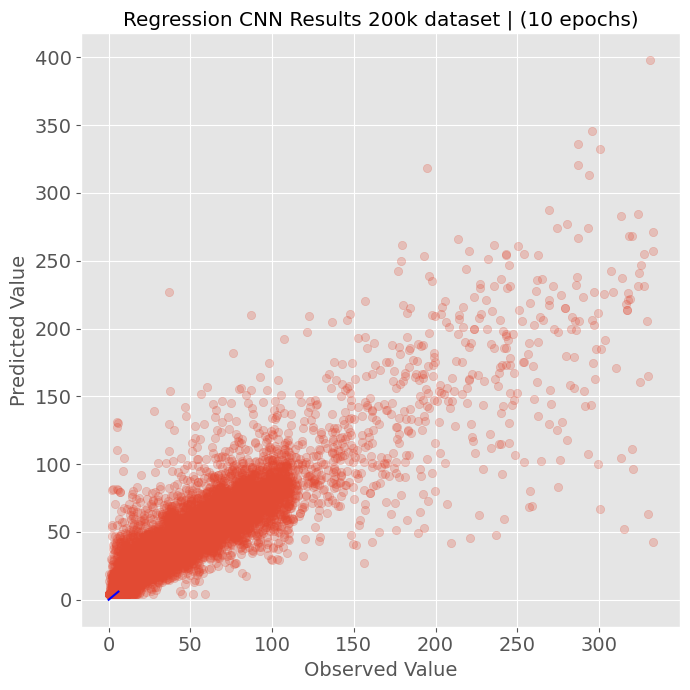

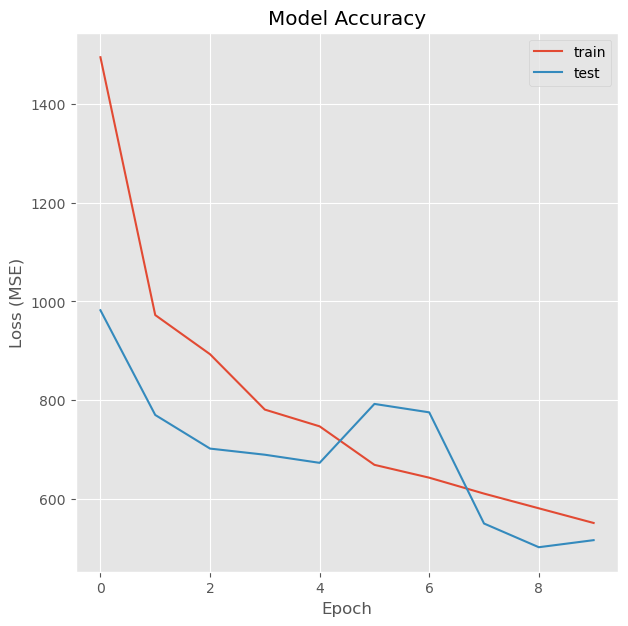

In [121]:
s = Seismic('regression','source_distance_km',30000,full_csv,dir);
s.train_test_split(test_size=0.3,random_state=88)
s.regression_cnn('source_distance_km',10)
s.evaluate_regression_model()